# **Data generators**

### **Overlapping ratio**

In [ ]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
from collections import Counter

def calculate_overlap_ratio(X, labels, k=10):
    """
    Calculate the Overlapping Ratio (OR) validation measure.

    Parameters:
    X: np.array - Input data points
    labels: np.array - Cluster labels for each data point
    k: int - Number of nearest neighbors to consider

    Returns:
    float: Overlapping Ratio value (0 to 1, where lower values indicate better separation)
    """
    # Get number of points and clusters
    n = len(X)
    unique_clusters = np.unique(labels)

    # Initialize nearest neighbors
    nbrs = NearestNeighbors(n_neighbors=k+1).fit(X)  # k+1 because first neighbor is the point itself
    distances, indices = nbrs.kneighbors(X)

    # Calculate ei for each point
    e_values = []

    for i in range(n):
        # Get current point's cluster
        current_cluster = labels[i]
        nc_i = np.sum(labels == current_cluster)  # number of points in current cluster

        # Get k nearest neighbors (excluding the point itself)
        neighbor_labels = labels[indices[i][1:]]

        # Count occurrences of each cluster in neighbors
        cluster_counts = Counter(neighbor_labels)

        # Calculate sum part of ei
        sum_term = 0
        for cluster_label, count in cluster_counts.items():
            if count > 0:  # Avoid log(0)
                sum_term += (count/k) * np.log(count/k)

        # Calculate ei
        ei = sum_term / (np.log(1 / len(unique_clusters)))
        e_values.append(ei)

    # Calculate final OR value
    or_value = np.mean(e_values)

    return or_value

### **Two moons dataset**


The two moons dataset applies the following transformations:
1. Base shape generation:
   - Two half circles with radius = 1
   - Upper moon centered at (0, 0)
   - Lower moon centered at (1, 0.5)

2. Transformations:
   - Horizontal scaling: X₁ = X₁ * scaling_factor
   - Rotation by 30°: Using rotation matrix     ```
     [cos(π/6)  -sin(π/6)]
     [sin(π/6)   cos(π/6)]     ```
   - Gaussian noise: Added to both X and Y coordinates with std=noise

In [ ]:
import numpy as np
from sklearn.datasets import make_moons
import matplotlib.pyplot as plt

def make_two_moons(n_samples = 1000, noise = 0.3, scaling = 0.8):
    # Generate basic two moons dataset
    X, y = make_moons(n_samples=n_samples, noise=noise, random_state=42)

    # Apply transformations
    rotation = np.pi / 6  # Rotate moons by 30 degrees
    # Scaling
    X[:, 0] *= scaling

    # Rotation matrix
    rotation_matrix = np.array([[np.cos(rotation), -np.sin(rotation)],
                                [np.sin(rotation), np.cos(rotation)]])
    X = np.dot(X, rotation_matrix.T)

    return X, y


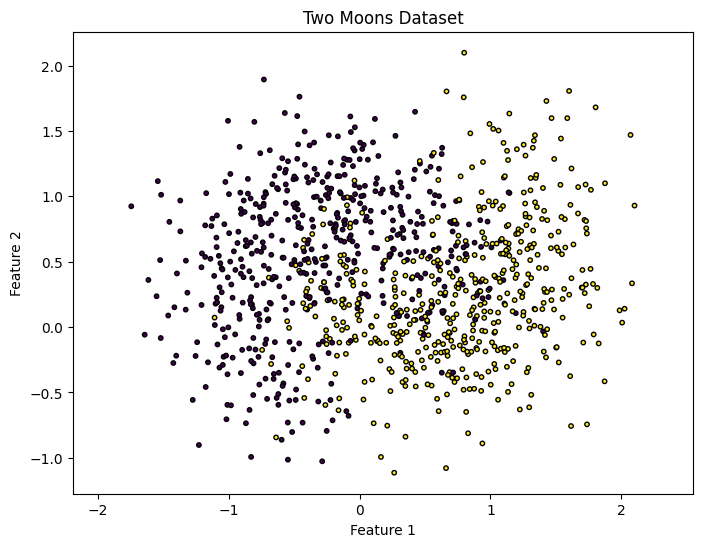

Overlapping Ratio: 0.3233


In [ ]:
X_moons, y_moons = make_two_moons(noise=0.4)
# Plot the modified dataset
plt.figure(figsize=(8, 6))
plt.scatter(X_moons[:, 0], X_moons[:, 1], c=y_moons, cmap='viridis', s=10, edgecolor='k')
plt.title("Two Moons Dataset")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.axis("equal")
plt.show()

or_score = calculate_overlap_ratio(X_moons, y_moons, 4)
print(f"Overlapping Ratio: {or_score:.4f}")

### **Anisotropic dataset**

Creates anisotropic clusters through:
1. Initial generation:
   - Isotropic Gaussian blobs using sklearn's make_blobs

2. Transformations:
   - Linear transformation using matrix:     ```
     [0.6  -0.4]
     [-0.2  0.8]     ```
   - StandardScaler applied to normalize features

In [ ]:
import numpy as np
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

def make_anisotropy(n_samples = 2000,n_features = 2,centers = 3,cluster_std = 6):
    # Generate isotropic Gaussian blobs
    X, y = make_blobs(n_samples=n_samples, centers=centers, cluster_std=cluster_std, random_state=42)

    # Apply anisotropic transformation
    transformation_matrix = np.array([[0.6, -0.4], [-0.2, 0.8]])  # Stretch and rotate clusters
    X = np.dot(X, transformation_matrix)

    # Standardize features to make them comparable
    X = StandardScaler().fit_transform(X)
    return X, y

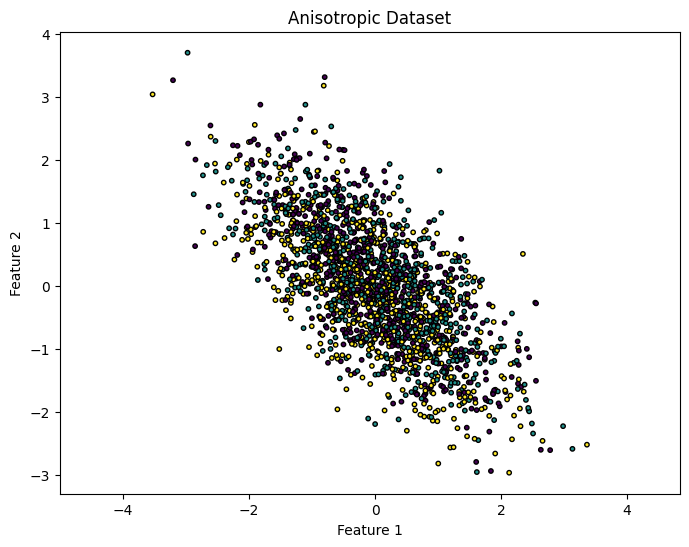

Overlapping Ratio: 0.8085


In [ ]:
X_anisotropy, y_anisotropy = make_anisotropy(cluster_std=60)
# Plot the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X_anisotropy[:, 0], X_anisotropy[:, 1], c=y_anisotropy, cmap='viridis', s=10, edgecolor='k')
plt.title("Anisotropic Dataset")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.axis("equal")
plt.show()

or_score = calculate_overlap_ratio(X_anisotropy, y_anisotropy, 6)
print(f"Overlapping Ratio: {or_score:.4f}")

### **Spiral dataset**

Generates spiral arms using polar coordinates:
1. Base equations for each arm i:
   - θ = linspace(0, 2π, points_per_arm) + i * (2π/n_arms) * overlap
   - r = linspace(0.1, 1, points_per_arm)
   - x = r * cos(θ) + noise * N(0,1)
   - y = r * sin(θ) + noise * N(0,1)

2. Key parameters:
   - Radial growth: Linear from 0.1 to 1.0
   - Angular spacing: 2π/n_arms
   - Overlap control through phase shift scaling

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def make_spiral(n_points = 1000, noise = 0.1, n_arms=3, overlap=0.8):
    """
    Generate a spiral dataset with high overlap.

    Parameters:
        n_points (int): Total number of points in the dataset.
        noise (float): Amount of noise to add to the data.
        n_arms (int): Number of spiral arms.
        overlap (float): Scaling factor to increase overlap. Smaller values -> more overlap.

    Returns:
        X (ndarray): Coordinates of the points.
        y (ndarray): Labels for the points.
    """
    points_per_arm = n_points // n_arms
    X = []
    y = []
    for i in range(n_arms):
        theta = np.linspace(0, 2 * np.pi, points_per_arm) + i * (2 * np.pi / n_arms) * overlap
        r = np.linspace(0.1, 1, points_per_arm)
        x1 = r * np.cos(theta) + np.random.normal(scale=noise, size=points_per_arm)
        x2 = r * np.sin(theta) + np.random.normal(scale=noise, size=points_per_arm)
        X.extend(np.column_stack((x1, x2)))
        y.extend([i] * points_per_arm)

    X = np.array(X)
    y = np.array(y)
    return X, y

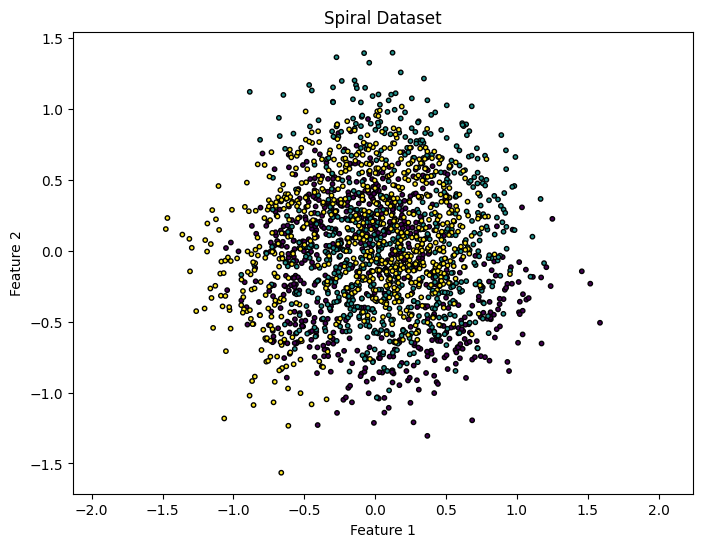

Overlapping Ratio: 0.6339


In [ ]:
# Generate spiral dataset
X_spiral, y_spiral = make_spiral(noise=0.21, n_points=2000, overlap = 1)

# Plot the dataset
plt.figure(figsize=(8, 6))
plt.scatter(X_spiral[:, 0], X_spiral[:, 1], c=y_spiral, cmap='viridis', s=10, edgecolor='k')
plt.title("Spiral Dataset")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.axis("equal")
plt.show()

or_score = calculate_overlap_ratio(X_spiral, y_spiral, 6)
print(f"Overlapping Ratio: {or_score:.4f}")

### **Gaussian Blobs Dataset**

Creates overlapping high-dimensional Gaussian distributions:
1. Center placement:
   - All cluster centers at origin: (0,0,...,0)

2. Point generation:
   - Multivariate normal distribution around centers
   - Variance controlled by cluster_std parameter
   - No additional transformations applied

In [ ]:
import numpy as np
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt

def make_gaussian_blobs(n_samples = 1000,n_features = 10,centers = 4,cluster_std = 20):
    # Generate overlapping blobs by giving all centers the same coordinates
    same_center = np.zeros((centers, n_features))  # All clusters at origin (0, 0, ..., 0)
    X, y = make_blobs(n_samples=n_samples, centers=same_center, cluster_std=cluster_std, random_state=42)

    return X, y

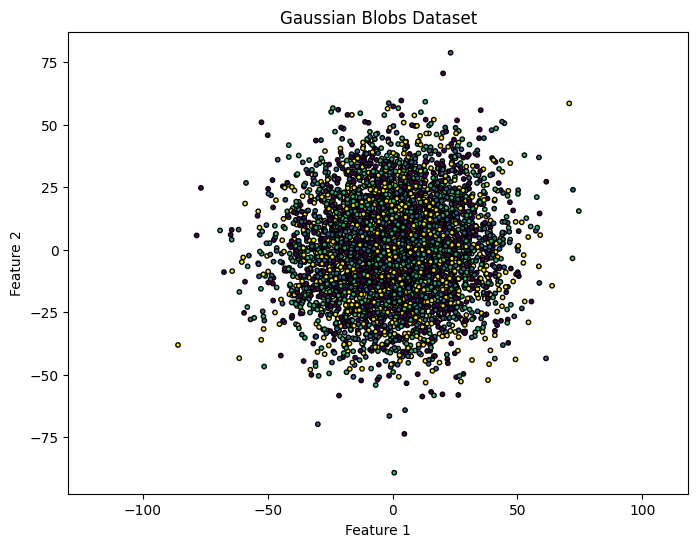

Overlapping Ratio: 0.9008


In [ ]:
X_blobs, y_blobs = make_gaussian_blobs(cluster_std=20,n_samples=5000)
plt.figure(figsize=(8, 6))
plt.scatter(X_blobs[:, 0], X_blobs[:, 1], c=y_blobs, cmap='viridis', s=10, edgecolor='k')
plt.title("Gaussian Blobs Dataset")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.axis("equal")
plt.show()

or_score = calculate_overlap_ratio(X_blobs, y_blobs, 12)
print(f"Overlapping Ratio: {or_score:.4f}")

### **Concentric circles Dataset**

Creates two concentric circles centered at origin (0,0) with controllable separation and noise.

Mathematical Generation
1. Base Circles:
   ```
   Outer circle (r=1.0): (cos(θ), sin(θ))
   Inner circle (r=factor): (factor*cos(θ), factor*sin(θ))
   where θ ∈ [0, 2π]
   ```

2. Noise Addition:
   ```
   point += random.normal(0, noise)
   ```

Parameters
- factor (default=0.5): Controls circle separation
  - Small (0.3): Well-separated circles
  - Large (0.8): Closely packed circles

- noise (default=0.1): Controls boundary fuzziness
  - 0.0: Clear boundaries
  - 0.2: Overlapping boundaries

- n_samples: Number of points (divided equally)

In [ ]:
from sklearn.datasets import make_circles
import matplotlib.pyplot as plt
import numpy as np

def make_concentric_circles(n_samples=1000, noise=0.1, factor=0.5, random_state=None):
    return make_circles(n_samples=n_samples,
                       noise=noise,
                       factor=factor,
                       random_state=random_state)

<ipython-input-56-42e7c1e112b0>:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


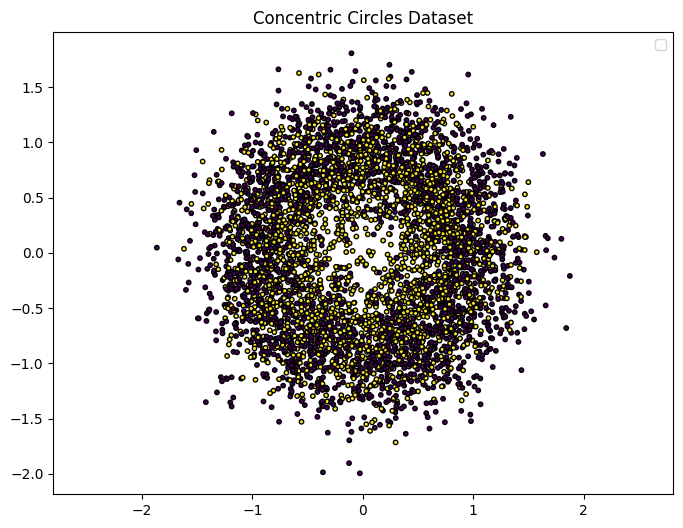

Overlapping Ratio: 0.7006


In [ ]:
X_circles, y_circles = make_concentric_circles(n_samples=5000,
                                 noise=0.3,
                                 factor=0.8,
                                 random_state=42)

# Create scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(X_circles[:, 0], X_circles[:, 1], c=y_circles, cmap='viridis', s=10, edgecolor='k')
plt.legend()
plt.title('Concentric Circles Dataset')
plt.axis('equal')
plt.show()

or_score = calculate_overlap_ratio(X_circles, y_circles, 4)
print(f"Overlapping Ratio: {or_score:.4f}")

# **Validation metrics**

In [ ]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from sklearn.metrics import accuracy_score, silhouette_score, davies_bouldin_score

### **CVNN metric**

In [ ]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans

def get_nearest_neighbors(X, k):
    """
    Compute k nearest neighbors for all points

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Input data
    k : int
        Number of nearest neighbors to consider

    Returns:
    --------
    distances : array of shape (n_samples, k)
        Distances to nearest neighbors
    indices : array of shape (n_samples, k)
        Indices of nearest neighbors
    """
    nbrs = NearestNeighbors(n_neighbors=k + 1)
    nbrs.fit(X)
    distances, indices = nbrs.kneighbors(X)
    # Remove self-references (first column)
    return distances[:, 1:], indices[:, 1:]

def compute_compactness(X, cluster_labels):
    """
    Compute Com(NC) - compactness measure for the clustering
    Com(NC) = Σᵢ[2/(nᵢ(nᵢ-1)) Σₓ,ᵧ∈Cᵢ d(x,y)]

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Input data
    cluster_labels : array-like of shape (n_samples,)
        Cluster labels

    Returns:
    --------
    float
        Compactness measure
    """
    unique_labels = np.unique(cluster_labels)
    compactness = 0

    for label in unique_labels:
        cluster_points = X[cluster_labels == label]
        ni = len(cluster_points)

        if ni <= 1:  # Skip clusters with single point
            continue

        # Compute pairwise distances within cluster
        distances = cdist(cluster_points, cluster_points)

        # Sum all distances and normalize
        cluster_compactness = np.sum(distances) / (ni * (ni - 1))
        compactness += cluster_compactness

    return compactness

def compute_separation(X, cluster_labels, k):
    """
    Compute Sep(NC,k) = max_i( 1/n_i ∑j=1,2,...,n_i (q_j / k) )
    where:
    - n_i is the number of objects in cluster i
    - q_j is the number of k-nearest neighbors of the jth object that are not in its cluster

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Input data
    cluster_labels : array-like of shape (n_samples,)
        Cluster labels
    k : int
        Number of nearest neighbors to consider
    """
    distances, indices = get_nearest_neighbors(X, k)
    unique_labels = np.unique(cluster_labels)
    max_cluster_separation = 0

    for label in unique_labels:
        # Get indices of points in current cluster (Ci)
        cluster_mask = cluster_labels == label
        cluster_points_idx = np.where(cluster_mask)[0]
        ni = len(cluster_points_idx)

        if ni == 0:
            continue

        # Calculate q_j/k for each point in the cluster
        cluster_separation = 0
        for idx in cluster_points_idx:
            # Get labels of nearest neighbors
            neighbor_labels = cluster_labels[indices[idx]]
            # Count neighbors not in the same cluster (q_j)
            qj = np.sum(neighbor_labels != label)
            # Add q_j/k to the sum
            cluster_separation += qj / k

        # Calculate average separation for this cluster (1/n_i * sum)
        avg_cluster_separation = cluster_separation / ni

        # Update max separation if this cluster's average is higher
        max_cluster_separation = max(max_cluster_separation, avg_cluster_separation)

    return max_cluster_separation

def calculate_cvnn_index(X, labels, k=10):
    """
    Compute CVNN² index for clustering validation

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Input data
    labels : array-like of shape (n_samples,)
        Cluster labels
    k : int, default=10
        Number of nearest neighbors
    """
    X = np.asarray(X)
    labels = np.asarray(labels)

    if X.shape[0] != labels.shape[0]:
        raise ValueError("Number of samples in X and labels must match")

    if k >= X.shape[0]:
        raise ValueError("k must be less than number of samples")

    # Compute separation and compactness for current clustering
    separation = compute_separation(X, labels, k)
    compactness = compute_compactness(X, labels)

    # Compute final index
    index = (separation + compactness) / 2
    return separation, compactness, index

### **DBCV metric**

In [ ]:
"""Python translation of the original implementation of Prim's MST in MATLAB.

Reference source: https://github.com/pajaskowiak/dbcv/blob/main/src/MST_Edges.m
"""

import numpy as np
import numpy.typing as npt


def prim_mst(
    graph: npt.NDArray[np.float32], ind_root: int = 0
) -> npt.NDArray[np.float32]:
    n = len(graph)
    intree = np.full(n, fill_value=False)
    d = np.full(n, fill_value=np.inf)

    d[ind_root] = 0
    v = ind_root
    counter = 0

    G = {
        "MST_edges": {
            "node_inds": np.zeros((n - 1, 2), dtype=int),
            "weights": np.zeros(n - 1, dtype=float),
        },
        "MST_degrees": np.zeros(n, dtype=int),
        "MST_parent": np.arange(n),
    }

    while counter < n - 1:
        intree[v] = True
        dist = np.inf

        for w in np.arange(n):
            if w != v and not intree[w]:
                weight = graph[v, w]

                if d[w] > weight:
                    d[w] = weight
                    G["MST_parent"][w] = v

                if dist > d[w]:
                    dist = d[w]
                    next_v = w

        counter += 1
        G["MST_edges"]["node_inds"][counter - 1, :] = (G["MST_parent"][next_v], next_v)
        G["MST_edges"]["weights"][counter - 1] = graph[G["MST_parent"][next_v], next_v]
        G["MST_degrees"][G["MST_parent"][next_v]] += 1
        G["MST_degrees"][next_v] += 1
        v = next_v

    (inds_a, inds_b) = G["MST_edges"]["node_inds"].T
    weights = G["MST_edges"]["weights"]

    mst = np.zeros_like(graph)
    mst[inds_a, inds_b] = weights
    mst[inds_b, inds_a] = weights

    return mst

In [ ]:
import multiprocessing
import typing as t
import itertools
import functools

import numpy as np
import numpy.typing as npt
import sklearn.neighbors
import scipy.spatial.distance
import scipy.sparse.csgraph
import scipy.stats
import mpmath


_MP = mpmath.mp.clone()


def compute_pair_to_pair_dists(
    X: npt.NDArray[np.float64], metric: str
) -> npt.NDArray[np.float64]:
    dists = scipy.spatial.distance.cdist(X, X, metric=metric)
    np.maximum(dists, 1e-12, out=dists)
    # NOTE: set self-distance to +inf to prevent points being self-neighbors.
    np.fill_diagonal(dists, val=np.inf)
    return dists


def get_subarray(
    arr: npt.NDArray[np.float64],
    /,
    inds_a: t.Optional[npt.NDArray[np.int32]] = None,
    inds_b: t.Optional[npt.NDArray[np.int32]] = None,
) -> npt.NDArray[np.float64]:
    if inds_a is None:
        return arr
    if inds_b is None:
        inds_b = inds_a
    inds_a_mesh, inds_b_mesh = np.meshgrid(inds_a, inds_b)
    return arr[inds_a_mesh, inds_b_mesh].T


def get_internal_objects(
    mutual_reach_dists: npt.NDArray[np.float64], use_original_mst_implementation: bool
) -> npt.NDArray[np.float64]:
    if use_original_mst_implementation:
        mutual_reach_dists = np.copy(mutual_reach_dists)
        np.fill_diagonal(mutual_reach_dists, 0.0)
        mst = prim_mst(mutual_reach_dists)

    else:
        mst = scipy.sparse.csgraph.minimum_spanning_tree(mutual_reach_dists)
        mst = mst.toarray()
        mst += mst.T

    is_mst_edges = (mst > 0.0).astype(int, copy=False)

    internal_node_inds = is_mst_edges.sum(axis=0) > 1
    internal_node_inds = np.flatnonzero(internal_node_inds)

    internal_edge_weights = get_subarray(mst, inds_a=internal_node_inds)

    graph_has_internal_nodes = bool(internal_node_inds.size > 0)
    graph_has_at_least_two_internal_nodes = bool(internal_edge_weights.size > 1)

    return (
        (
            internal_node_inds
            if graph_has_internal_nodes
            else np.arange(mutual_reach_dists.shape[0])
        ),
        internal_edge_weights if graph_has_at_least_two_internal_nodes else mst,
    )


def compute_cluster_core_distance(
    dists: npt.NDArray[np.float64], d: int, enable_dynamic_precision: bool
) -> npt.NDArray[np.float64]:
    n, _ = dists.shape
    orig_dists_dtype = dists.dtype

    if enable_dynamic_precision:
        dists = np.asarray(_MP.matrix(dists), dtype=object).reshape(*dists.shape)

    core_dists = np.power(dists, -d).sum(axis=-1, keepdims=True) / (n - 1)

    if not enable_dynamic_precision:
        np.clip(core_dists, a_min=0.0, a_max=1e12, out=core_dists)

    np.power(core_dists, -1.0 / d, out=core_dists)

    if enable_dynamic_precision:
        core_dists = np.asarray(core_dists, dtype=orig_dists_dtype)

    return core_dists


def compute_mutual_reach_dists(
    dists: npt.NDArray[np.float64],
    d: float,
    enable_dynamic_precision: bool,
) -> npt.NDArray[np.float64]:
    core_dists = compute_cluster_core_distance(
        d=d, dists=dists, enable_dynamic_precision=enable_dynamic_precision
    )
    mutual_reach_dists = dists.copy()
    np.maximum(mutual_reach_dists, core_dists, out=mutual_reach_dists)
    np.maximum(mutual_reach_dists, core_dists.T, out=mutual_reach_dists)
    return (core_dists, mutual_reach_dists)


def fn_density_sparseness(
    cls_inds: npt.NDArray[np.int32],
    dists: npt.NDArray[np.float64],
    d: int,
    enable_dynamic_precision: bool,
    use_original_mst_implementation: bool,
) -> t.Tuple[float, npt.NDArray[np.float32], npt.NDArray[np.int32]]:
    (core_dists, mutual_reach_dists) = compute_mutual_reach_dists(
        dists=dists, d=d, enable_dynamic_precision=enable_dynamic_precision
    )
    (internal_node_inds, internal_edge_weights) = get_internal_objects(
        mutual_reach_dists,
        use_original_mst_implementation=use_original_mst_implementation,
    )
    dsc = float(internal_edge_weights.max())
    internal_core_dists = core_dists[internal_node_inds]
    internal_node_inds = cls_inds[internal_node_inds]
    return (dsc, internal_core_dists, internal_node_inds)


def fn_density_separation(
    cls_i: int,
    cls_j: int,
    dists: npt.NDArray[np.float64],
    internal_core_dists_i: npt.NDArray[np.float64],
    internal_core_dists_j: npt.NDArray[np.float64],
) -> t.Tuple[int, int, float]:
    sep = dists.copy()
    np.maximum(sep, internal_core_dists_i, out=sep)
    np.maximum(sep, internal_core_dists_j.T, out=sep)
    dspc_ij = float(sep.min()) if sep.size else np.inf
    return (cls_i, cls_j, dspc_ij)


def _check_duplicated_samples(X: npt.NDArray[np.float64], threshold: float = 1e-9):
    if X.shape[0] <= 1:
        return

    nn = sklearn.neighbors.NearestNeighbors(n_neighbors=1)
    nn.fit(X)
    dists, _ = nn.kneighbors(return_distance=True)

    if np.any(dists < threshold):
        raise ValueError("Duplicated samples have been found in X.")


def _convert_singleton_clusters_to_noise(
    y: npt.NDArray[np.int32], noise_id: int
) -> npt.NDArray[np.int32]:
    """Cast clusters containing a single instance as noise."""
    cluster_ids, cluster_sizes = np.unique(y, return_counts=True)
    singleton_clusters = cluster_ids[cluster_sizes == 1]

    if singleton_clusters.size == 0:
        return y

    return np.where(np.isin(y, singleton_clusters), noise_id, y)


def dbcv_cal(
    X: npt.NDArray[np.float64],
    y: npt.NDArray[np.int32],
    metric: str = "sqeuclidean",
    noise_id: int = -1,
    check_duplicates: bool = True,
    n_processes: t.Union[int, str] = "auto",
    enable_dynamic_precision: bool = False,
    bits_of_precision: int = 512,
    use_original_mst_implementation: bool = False,
) -> float:
    """Compute DBCV metric.

    Density-Based Clustering Validation (DBCV) is an intrinsic (= unsupervised/unlabeled)
    relative metric. See reference [1] for the original reference.

    Parameters
    ----------
    X : npt.NDArray[np.float64] of shape (N, D)
        Sample embeddings.

    y : npt.NDArray[np.int32] of shape (N,)
        Cluster IDs assigned for each sample in X.

    metric : str, default="sqeuclidean"
        This parameter specifies the metric function to compute dissimilarities between observations.
        The DBCV metric estimation may vary depending on the distance metric used.
        This argument is passed to `scipy.spatial.distance.cdist`.
        The default value is the squared Euclidean distance, which is also employed in the original
        MATLAB implementation (see reference [2]).

    noise_id : int, default=-1
        The noise "cluster" ID refers to instances where `y[i] = noise_id`, which are considered noise.
        Additionally, singleton clusters, meaning clusters containing only a single instance, are automatically
        classified as noise.

    check_duplicates : bool, default=True
        If set to True, check for duplicated samples before execution.
        Instances with Euclidean distance to their nearest neighbor below 1e-9 are considered
        duplicates.

    n_processes : int or "auto", default="auto"
        Maximum number of parallel processes for processing clusters and cluster pairs.
        If `n_processes="auto"`, the number of parallel processes will be set to 1 for
        datasets with 500 or fewer instances, and 4 for datasets with more than 500 instances.

    enable_dynamic_precision : bool, default=False
        If set to True, this activates a dynamic quantity of bits of precision for floating point during
        density calculation, as defined by the `bits_of_precision` argument below. Enabling this argument
        ensures proper density calculation for very high-dimensional data, although it significantly slows
        down the process compared to standard calculations.

    bits_of_precision : int, default=512
        Bits of precision for density calculation. High values are necessary for high
        dimensions to avoid underflow/overflow.

    use_original_mst_implementation : bool, default=False
        If set to False, the function will use Scipy's MST implementation (Kruskal's implementation).
        If set to True, the function will use an exact replica of the original MATLAB implementation.
        This version is a variant of Prim's MST algorithm.
        The original implementation is slower than Scipy's implementation and tends to create hub nodes
        much more often.
        Since these implementations are not equivalent, the DBCV metric estimation tends to vary depending
        on the MST algorithm used.

    Returns
    -------
    DBCV : float
        DBCV metric estimation.

    Source
    ------
    .. [1] "Density-Based Clustering Validation". Davoud Moulavi, Pablo A. Jaskowiak,
           Ricardo J. G. B. Campello, Arthur Zimek, Jörg Sander.
           https://www.dbs.ifi.lmu.de/~zimek/publications/SDM2014/DBCV.pdf
    .. [2] https://github.com/pajaskowiak/dbcv/
    """
    X = np.asarray(X, dtype=np.float64)

    if X.ndim == 1:
        X = X.reshape(-1, 1)

    y = np.asarray(y, dtype=int)

    n, d = X.shape  # NOTE: 'n' must be calculated before removing noise.

    if n != y.size:
        raise ValueError(f"Mismatch in {X.shape[0]=} and {y.size=} dimensions.")

    y = _convert_singleton_clusters_to_noise(y, noise_id=noise_id)

    non_noise_inds = y != noise_id
    X = X[non_noise_inds, :]
    y = y[non_noise_inds]

    if y.size == 0:
        return 0.0

    y = scipy.stats.rankdata(y, method="dense") - 1
    cluster_ids, cluster_sizes = np.unique(y, return_counts=True)

    if check_duplicates:
        _check_duplicated_samples(X)

    dists = compute_pair_to_pair_dists(X=X, metric=metric)

    # DSC: 'Density Sparseness of a Cluster'
    dscs = np.zeros(cluster_ids.size, dtype=float)

    # DSPC: 'Density Separation of a Pair of Clusters'
    min_dspcs = np.full(cluster_ids.size, fill_value=np.inf)

    # Internal objects = Internal nodes = nodes such that degree(node) > 1 in MST.
    internal_objects_per_cls: t.Dict[int, npt.NDArray[np.int32]] = {}

    # internal core distances = core distances of internal nodes
    internal_core_dists_per_cls: t.Dict[int, npt.NDArray[np.float32]] = {}

    cls_inds = [np.flatnonzero(y == cls_id) for cls_id in cluster_ids]

    if n_processes == "auto":
        n_processes = 4 if y.size > 500 else 1

    with _MP.workprec(bits_of_precision), multiprocessing.Pool(
        processes=min(n_processes, cluster_ids.size)
    ) as ppool:
        fn_density_sparseness_ = functools.partial(
            fn_density_sparseness,
            d=d,
            enable_dynamic_precision=enable_dynamic_precision,
            use_original_mst_implementation=use_original_mst_implementation,
        )

        args = [(cls_ind, get_subarray(dists, inds_a=cls_ind)) for cls_ind in cls_inds]

        for cls_id, (dsc, internal_core_dists, internal_node_inds) in enumerate(
            ppool.starmap(fn_density_sparseness_, args)
        ):
            internal_objects_per_cls[cls_id] = internal_node_inds
            internal_core_dists_per_cls[cls_id] = internal_core_dists
            dscs[cls_id] = dsc

    n_cls_pairs = (cluster_ids.size * (cluster_ids.size - 1)) // 2

    if n_cls_pairs > 0:
        with _MP.workprec(bits_of_precision), multiprocessing.Pool(
            processes=min(n_processes, n_cls_pairs)
        ) as ppool:
            args = [
                (
                    cls_i,
                    cls_j,
                    get_subarray(
                        dists,
                        inds_a=internal_objects_per_cls[cls_i],
                        inds_b=internal_objects_per_cls[cls_j],
                    ),
                    internal_core_dists_per_cls[cls_i],
                    internal_core_dists_per_cls[cls_j],
                )
                for cls_i, cls_j in itertools.combinations(cluster_ids, 2)
            ]

            for cls_i, cls_j, dspc_ij in ppool.starmap(fn_density_separation, args):
                min_dspcs[cls_i] = min(min_dspcs[cls_i], dspc_ij)
                min_dspcs[cls_j] = min(min_dspcs[cls_j], dspc_ij)

    np.nan_to_num(min_dspcs, copy=False, posinf=1e12)
    vcs = (min_dspcs - dscs) / (1e-12 + np.maximum(min_dspcs, dscs))
    np.nan_to_num(vcs, copy=False, nan=0.0)
    dbcv = float(np.sum(vcs * cluster_sizes)) / n

    return dbcv

### **CVDD metric**

In [ ]:
import numpy as np
from scipy.spatial.distance import pdist, squareform, cdist
from scipy.sparse.csgraph import minimum_spanning_tree
from scipy.sparse import csr_matrix

def cvdd_cal(X, piX, k=10):
    """
    Compute the CVDD Index for a dataset.
    Parameters:
        X (numpy.ndarray): The dataset (n_samples, n_features).
        piX (numpy.ndarray): The partition labels (n_samples,).
        k (int): Number of neighbors for density-involved distance (default=7).
    Returns:
        float: CVDD Index value.
    """
    # Compute Euclidean distance matrix
    d = cdist(X, X, metric='euclidean')

    try:
        # Compute Density-Involved Distance
        DD = Density_involved_distance(d, k)

        # Compute CVDD Index
        return CVDD(piX, d, DD)
    except Exception as e:
        # If an error occurs, return 0 (e.g., due to overlapping points)
        print(f"Error in CVDD computation: {e}")
        return 0


def CVDD(piX, d, DD):
    """
    Compute the CVDD index from partition and distance matrices.
    Parameters:
        piX (numpy.ndarray): Partition labels.
        d (numpy.ndarray): Euclidean distance matrix.
        DD (numpy.ndarray): Density-involved distance matrix.
    Returns:
        float: CVDD Index value.
    """
    unique_clusters = np.unique(piX)
    n_clusters = len(unique_clusters)

    sc_list = []  # Separation list
    com_list = []  # Compactness list

    for cluster in unique_clusters:
        a = np.where(piX == cluster)[0]  # Points in the current cluster
        b = np.where(piX != cluster)[0]  # Points outside the current cluster

        n = len(a)
        if n > 0:
            # Separation (minimum density-involved distance to other clusters)
            sep = np.min(DD[np.ix_(a, b)])
            sc_list.append(sep)

            # Compactness (path-based distance within the cluster)
            Ci = fast_PathbasedDist(d[np.ix_(a, a)])
            com = (np.std(Ci) / n) * np.mean(Ci)
            com_list.append(com)
        else:
            sc_list.append(0)
            com_list.append(max(com_list) if com_list else 1)

    # Compute overall separation and compactness
    sep = np.sum(sc_list)
    com = np.sum(com_list)

    # Compute CVDD index
    return sep / com if com > 0 else 0


def Density_involved_distance(d, k):
    """
    Compute the density-involved distance matrix.
    Parameters:
        d (numpy.ndarray): Euclidean distance matrix.
        k (int): Number of neighbors for density computation.
    Returns:
        numpy.ndarray: Density-involved distance matrix.
    """
    n = len(d)
    KNNG = KNearestNeighborGraph(d, k)

    # Compute density
    Den = np.array([np.sum(d[j, KNNG[j]]) / k for j in range(n)])
    fDen = Den / Den.max()  # Absolute-density distance factor

    # Compute relative density factor
    Rel = np.outer(Den, 1 / Den)
    fRel = 1 - np.exp(-np.abs(Rel + Rel.T - 2))

    # Compute density-involved distance components
    nD = np.outer(Den, np.ones(n)) + np.outer(np.ones(n), Den)
    relD = nD * fRel
    drD = d + relD

    # Compute connectivity distance
    conD = fast_PathbasedDist(drD)

    # Compute final density-involved distance
    tmp2 = np.sqrt(np.outer(fDen, fDen))
    return conD * tmp2


def KNearestNeighborGraph(d, k):
    """
    Compute the k-nearest neighbor graph.
    Parameters:
        d (numpy.ndarray): Distance matrix.
        k (int): Number of neighbors.
    Returns:
        list: k-nearest neighbors for each point.
    """
    n = len(d)
    np.fill_diagonal(d, np.inf)
    knn_indices = np.argsort(d, axis=1)[:, :k]
    return [list(knn) for knn in knn_indices]


def fast_PathbasedDist(W):
    """
    Compute the path-based distance matrix using the minimum spanning tree.
    Parameters:
        W (numpy.ndarray): Distance matrix.
    Returns:
        numpy.ndarray: Path-based distance matrix.
    """
    n = len(W)
    mst = minimum_spanning_tree(csr_matrix(W))
    mst_edges = np.array(mst.nonzero()).T

    # Initialize connectivity
    PathbasedW = np.zeros_like(W)
    Degrees = np.zeros(n, dtype=int)
    Connections = [[] for _ in range(n)]

    for edge in mst_edges:
        i, j = edge
        Degrees[i] += 1
        Degrees[j] += 1
        Connections[i].append(j)
        Connections[j].append(i)

    # Initialize tables
    CloseT = []
    OpenT = []

    # Find the first node with degree 1
    for i in range(n):
        if Degrees[i] == 1:
            break

    CloseT.append(i)
    Visited = np.zeros(n, dtype=bool)
    Visited[i] = True

    while len(CloseT) < n:
        current = CloseT[-1]
        neighbors = [node for node in Connections[current] if not Visited[node]]

        for neighbor in neighbors:
            # Update path-based distances
            for close_node in CloseT:
                PathbasedW[close_node, neighbor] = max(
                    PathbasedW[close_node, current], W[current, neighbor]
                )
                PathbasedW[neighbor, close_node] = PathbasedW[close_node, neighbor]

            # Update distances between open and neighbor nodes
            for open_node in OpenT:
                PathbasedW[open_node, neighbor] = max(
                    PathbasedW[open_node, current], W[current, neighbor]
                )
                PathbasedW[neighbor, open_node] = PathbasedW[open_node, neighbor]

        # Update connections between new neighbors
        for i in range(len(neighbors) - 1):
            for j in range(i + 1, len(neighbors)):
                PathbasedW[neighbors[i], neighbors[j]] = max(
                    W[neighbors[i], current], W[neighbors[j], current]
                )
                PathbasedW[neighbors[j], neighbors[i]] = PathbasedW[neighbors[i], neighbors[j]]

        # Add neighbors to OpenT
        OpenT.extend(neighbors)
        CloseT.append(OpenT.pop())

        Visited[CloseT[-1]] = True

    return PathbasedW

# **Implementation**

### **DBSCAN**

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import numpy as np
import csv
import matplotlib.pyplot as plt

def optimize_dbscan_with_save(X, y_true, dataset_name='dataset', output_file='grid_search_results.csv'):
    """
    Find optimal DBSCAN parameters using grid search, save results to a CSV file.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances.
    y_true : array-like of shape (n_samples,)
        True labels.
    dataset_name : str
        Name of the dataset for printing/logging.
    output_file : str
        Path to the CSV file where results will be saved.
    """
    # Define parameter ranges to search
    eps_range = np.linspace(0.1, 2.0, 20)
    min_samples_range = range(2, 15)

    best_score = 0
    best_params = None
    best_pred = None
    best_metrics = None

    # Standardize the features
    X_scaled = StandardScaler().fit_transform(X)

    print(f"Optimizing DBSCAN parameters for {dataset_name}...")

    # Open the CSV file for writing results
    with open(output_file, mode='w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        # Write header
        writer.writerow(['dataset', 'eps', 'min_samples', 'accuracy', 'ari', 'nmi', 'sep', 'com', 'cvnn', 'dbcv', 'cvdd'])

        # Grid search
        for eps in eps_range:
            for min_samples in min_samples_range:
            # try:
                # Initialize and fit DBSCAN
                dbscan = DBSCAN(eps=eps, min_samples=min_samples)
                y_pred = dbscan.fit_predict(X_scaled)

                # Skip if all points are noise (-1) or in one cluster
                n_clusters = len(set(y_pred)) - (1 if -1 in y_pred else 0)
                if n_clusters <= 1:
                    continue

                # Handle noise points
                y_pred_no_noise = y_pred.copy()
                unique_labels = set(label for label in y_pred if label != -1)

                # Calculate cluster centers
                centers = np.zeros((len(unique_labels), X_scaled.shape[1]))
                for i, label in enumerate(unique_labels):
                    cluster_points = X_scaled[y_pred == label]
                    centers[i] = np.mean(cluster_points, axis=0)

                # Assign noise points to nearest cluster
                noise_points = y_pred == -1
                for idx in np.where(noise_points)[0]:
                    if len(centers) > 0:
                        distances = [np.linalg.norm(X_scaled[idx] - center) for center in centers]
                        y_pred_no_noise[idx] = list(unique_labels)[np.argmin(distances)]

                # Compute distance matrix
                dist_matrix = np.sqrt(np.sum((X_scaled[:, np.newaxis, :] - X_scaled[np.newaxis, :, :]) ** 2, axis=2))

                # Calculate metrics
                acc = accuracy_score(y_true, y_pred_no_noise)
                # sil = silhouette_score(X_scaled, y_pred)
                # db = davies_bouldin_score(X_scaled, y_pred)
                # s_dbw = calculate_s_dbw(X_scaled, y_pred, centers)
                sep, com, cvnn = calculate_cvnn_index(X_scaled, y_pred_no_noise)
                cvdd = cvdd_cal(X_scaled, y_pred_no_noise)
                dbcv = dbcv_cal(X_scaled, y_pred_no_noise)
                ari = adjusted_rand_score(y_true, y_pred_no_noise)
                nmi = normalized_mutual_info_score(y_true, y_pred_no_noise)

                # print(f"eps: {eps:.3f}")
                # print(f"min_samples: {min_samples}")
                # print(f"Best accuracy: {acc:.4f}")
                # print(f"ARI: {ari:.4f}")
                # print(f"NMI: {nmi:.4f}")
                # print(f"CVNN score: {cvnn:.4f}")
                # print(f"DBCV score: {dbcv:.4f}")
                # print(f"SSDD score: {ssdd:.4f}")

                # Write results to the CSV file
                writer.writerow([dataset_name, eps, min_samples, acc, ari, nmi, sep, com, cvnn, dbcv, cvdd])

                # Update best parameters if we found better accuracy
                if acc >= best_score:
                    best_score = acc
                    best_params = {'eps': eps, 'min_samples': min_samples}
                    best_pred = y_pred_no_noise
                    best_metrics = {
                        'Accuracy': acc,
                        'ARI': ari,
                        'NMI': nmi,
                        'Separation': sep,
                        'Compactness': com,
                        'CVNN': cvnn,
                        'DBCV': dbcv,
                        'CVDD': cvdd
                    }

                # except Exception as e:
                #     continue

    if best_params is None:
        print("\nNo valid clustering results found. Try different parameter ranges.")
        return None, None, None

    # Plot results with best parameters
    plt.figure(figsize=(10, 4))

    # Original data
    plt.subplot(121)
    plt.scatter(X[:, 0], X[:, 1], c=y_true, cmap='coolwarm', s=10, edgecolor='k')
    plt.title("Original Data")
    plt.axis('equal')

    # Best clustering result
    plt.subplot(122)
    plt.scatter(X[:, 0], X[:, 1], c=best_pred, cmap='coolwarm', s=10, edgecolor='k')
    plt.title(f"Best DBSCAN Clustering\n(eps={best_params['eps']:.3f}, min_samples={best_params['min_samples']})")
    plt.axis('equal')

    plt.tight_layout()
    plt.show()

    return best_params, best_metrics, best_pred

In [ ]:
import pandas as pd
import os

def check_stability_with_save(X, eps, min_samples, n_runs=10, output_dir="stability_results"):
    """
    Check stability of DBSCAN clustering with the same parameters and save results to files.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances (standardized).
    eps : float
        Optimal value for eps.
    min_samples : int
        Optimal value for min_samples.
    n_runs : int
        Number of times to run DBSCAN.
    output_dir : str
        Directory to save clustering results.

    Returns:
    --------
    stability_scores : list of float
        List of ARI scores between each pair of runs.
    is_stable : bool
        True if all ARI scores are 1, indicating stability.
    """
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Run DBSCAN multiple times and save results
    cluster_results = []
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    for run_idx in range(n_runs):
        y_pred = dbscan.fit_predict(X)
        cluster_results.append(y_pred)

        # Save results to CSV
        result_file = os.path.join(output_dir, f"run_{run_idx + 1}.csv")
        pd.DataFrame({"Cluster_Label": y_pred}).to_csv(result_file, index=False)
        print(f"Saved clustering result for run {run_idx + 1} to {result_file}")

    # Calculate ARI between all pairs of runs
    stability_scores = []
    for i in range(n_runs):
        for j in range(i + 1, n_runs):
            ari = adjusted_rand_score(cluster_results[i], cluster_results[j])
            stability_scores.append(ari)

    # Check if all ARI scores are 1
    is_stable = all(score == 1 for score in stability_scores)

    return stability_scores, is_stable

In [ ]:
def check_parameter_sensitivity(X, y_true, best_params, output_file='parameter_sensitivity.csv'):
    """
    Check the sensitivity of the DBSCAN parameters (eps and min_samples) by slightly modifying them,
    running the clustering, and calculating ARI and NMI over 5 runs.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances.
    y_true : array-like of shape (n_samples,)
        True labels.
    best_params : dict
        The best parameters found for DBSCAN (eps, min_samples).
    output_file : str
        Path to the CSV file where sensitivity results will be saved.
    """
    eps = best_params['eps']
    min_samples = best_params['min_samples']

    # Create a list of modified eps and min_samples values for sensitivity check
    eps_variations = [eps + i * 0.0001 for i in range(1, 6)] + [eps - i * 0.0001 for i in range(1, 6)]
    min_samples_variations = [min_samples + 1, min_samples - 1]

    # Open the CSV file for writing results
    with open(output_file, mode='w', newline='') as csvfile:
      writer = csv.writer(csvfile)
      # Write header
      writer.writerow(['eps', 'min_samples', 'accuracy', 'ari', 'nmi', 'cvnn', 'dbcv', 'ssdd'])

      # Run 5 times with small variations in eps and min_samples
      for eps_mod in eps_variations:
        for min_samples_mod in min_samples_variations:
          # Initialize and fit DBSCAN with modified parameters
          dbscan = DBSCAN(eps=eps_mod, min_samples=min_samples_mod)
          X_scaled = StandardScaler().fit_transform(X)
          y_pred = dbscan.fit_predict(X_scaled)

          # Skip if all points are noise (-1) or in one cluster
          n_clusters = len(set(y_pred)) - (1 if -1 in y_pred else 0)
          if n_clusters <= 1:
              continue

          # Calculate metrics
          acc = accuracy_score(y_true, y_pred)
          sep, com, cvnn = calculate_cvnn_index(X_scaled, y_pred)
          ssdd = ssddindex(y_pred, X_scaled, dist_matrix)
          dbcv = DBCV(X_scaled, y_pred)
          ari = adjusted_rand_score(y_true, y_pred)
          nmi = normalized_mutual_info_score(y_true, y_pred)

          print([eps_mod, min_samples_mod, acc, ari, nmi, cvnn, dbcv, ssdd])

          # Write results to the CSV file
          writer.writerow([eps_mod, min_samples_mod, acc, ari, nmi, cvnn, dbcv, ssdd])

    print(f"\nParameter sensitivity results saved to {output_file}")

In [ ]:
def main_workflow(X, y_true, dataset_name, directory_path):
    """
    Main workflow for optimizing DBSCAN, checking stability, and testing parameter sensitivity.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Input dataset.
    y_true : array-like of shape (n_samples,)
        Ground truth labels.
    dataset_name : str
        Name of the dataset.

    Returns:
    --------
    None
    """
    # File paths
    grid_search_file = os.path.join(directory_path,"grid_search_results.csv")
    stability_dir = os.path.join(directory_path,"stability_results")
    sensitivity_file = os.path.join(directory_path,"parameter_sensitivity.csv")

    # Step 1: Optimize DBSCAN and save results
    print("\nStep 1: Optimizing DBSCAN Parameters...")
    best_params, best_metrics, _ = optimize_dbscan_with_save(
        X, y_true, dataset_name=dataset_name, output_file=grid_search_file
    )
    if best_params is None:
        print("Optimization failed. Exiting workflow.")
        return

    print(f"\nOptimal Parameters: {best_params}")
    print(f"Best Metrics: {best_metrics}")

    # Step 2: Check Stability and Save Results
    # print("\nStep 2: Checking Stability of Optimal Parameters...")
    # optimal_eps = best_params['eps']
    # optimal_min_samples = best_params['min_samples']

    # X_scaled = StandardScaler().fit_transform(X)  # Standardize data again
    # stability_scores, is_stable = check_stability_with_save(
    #     X_scaled, optimal_eps, optimal_min_samples, output_dir=stability_dir
    # )

    # print("\nStability Check Results:")
    # print(f"Stability Scores (ARI): {stability_scores}")
    # print(f"Is the clustering stable? {'Yes' if is_stable else 'No'}")

    # if not is_stable:
    #     print("Clustering is not stable. Exiting workflow.")
    #     return

    # # Step 3: Check Parameter Sensitivity
    # print("\nStep 3: Checking Parameter Sensitivity...")
    # check_parameter_sensitivity(
    #     X, y_true, best_params=best_params, output_file=sensitivity_file
    # )
    # print(f"Parameter Sensitivity Results saved to {sensitivity_file}")

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import numpy as np
import csv
import matplotlib.pyplot as plt

def run_dbscan(X, y_true, eps, min_samples, dataset_name='dataset', output_file='best_result.csv'):
    """
    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances.
    y_true : array-like of shape (n_samples,)
        True labels.
    dataset_name : str
        Name of the dataset for printing/logging.
    output_file : str
        Path to the CSV file where results will be saved.
    """

    # Standardize the features
    X_scaled = StandardScaler().fit_transform(X)

    print(f"DBSCAN for {dataset_name}...")

    # Open the CSV file for writing results
    with open(output_file, mode='w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        # Write header
        writer.writerow(['dataset', 'eps', 'min_samples', 'accuracy', 'ari', 'nmi', 'sep', 'com', 'cvnn', 'dbcv', 'cvdd'])
        # Initialize and fit DBSCAN
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        y_pred = dbscan.fit_predict(X_scaled)

        # Skip if all points are noise (-1) or in one cluster
        n_clusters = len(set(y_pred)) - (1 if -1 in y_pred else 0)

        # Handle noise points
        y_pred_no_noise = y_pred.copy()
        unique_labels = set(label for label in y_pred if label != -1)

        # Calculate cluster centers
        centers = np.zeros((len(unique_labels), X_scaled.shape[1]))
        for i, label in enumerate(unique_labels):
            cluster_points = X_scaled[y_pred == label]
            centers[i] = np.mean(cluster_points, axis=0)

        # Assign noise points to nearest cluster
        noise_points = y_pred == -1
        for idx in np.where(noise_points)[0]:
            if len(centers) > 0:
                distances = [np.linalg.norm(X_scaled[idx] - center) for center in centers]
                y_pred_no_noise[idx] = list(unique_labels)[np.argmin(distances)]

        # Compute distance matrix
        dist_matrix = np.sqrt(np.sum((X_scaled[:, np.newaxis, :] - X_scaled[np.newaxis, :, :]) ** 2, axis=2))

        # Calculate metrics
        acc = accuracy_score(y_true, y_pred_no_noise)
        sep, com, cvnn = calculate_cvnn_index(X_scaled, y_pred_no_noise)
        cvdd = cvdd_cal(X_scaled, y_pred_no_noise)
        dbcv = dbcv_cal(X_scaled, y_pred_no_noise)
        ari = adjusted_rand_score(y_true, y_pred_no_noise)
        nmi = normalized_mutual_info_score(y_true, y_pred_no_noise)

        print(f"ACC: {acc: .4f}, ARI: {ari: .4f}, NMI:{nmi : .4f}, Separation: {sep : .4f}, Compactness: {com : .4f}, CVNN: {cvnn : .4f}, DBCV: {dbcv : .4f}, CVDD: {cvdd : .4f}")

        # Write results to the CSV file
        writer.writerow([dataset_name, eps, min_samples, acc, ari, nmi, sep, com, cvnn, dbcv, cvdd])

        # Plot results with best parameters
        plt.figure(figsize=(10, 4))

        # Original data
        plt.subplot(121)
        plt.scatter(X[:, 0], X[:, 1], c=y_true, cmap='coolwarm', s=10, edgecolor='k')
        plt.title("Original Data")
        plt.axis('equal')

        # Best clustering result
        plt.subplot(122)
        plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='coolwarm', s=10, edgecolor='k')
        plt.title(f"DBSCAN for {dataset_name}")
        plt.axis('equal')

        plt.tight_layout()
        plt.show()

        return y_pred


Optimizing DBSCAN for two_moons
DBSCAN for two_moons...
ACC:  0.5240, ARI:  0.0022, NMI: 0.0213, Separation:  0.2750, Compactness:  2.9648, CVNN:  1.6199, DBCV: -0.9082, CVDD:  10.1881


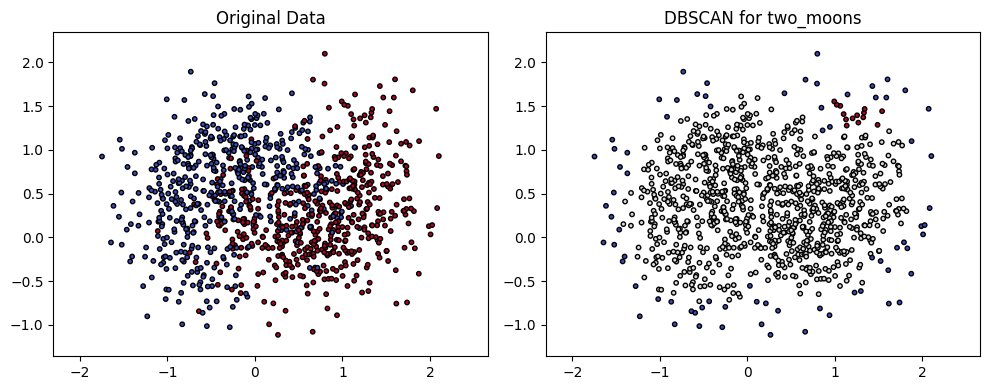


Optimizing DBSCAN for circles
DBSCAN for circles...
ACC:  0.4978, ARI:  0.0000, NMI: 0.0031, Separation:  0.8462, Compactness:  3.5381, CVNN:  2.1921, DBCV: -0.8426, CVDD:  1.6739


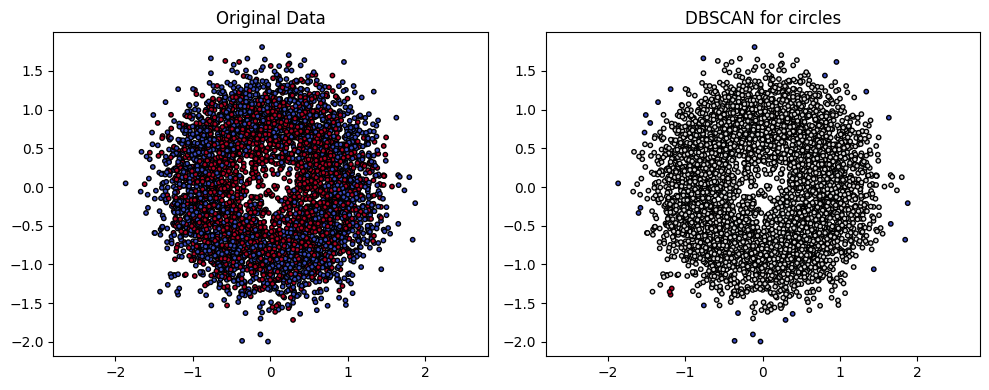


Optimizing DBSCAN for anisotropic
DBSCAN for anisotropic...
ACC:  0.3345, ARI:  0.0004, NMI: 0.0053, Separation:  0.3621, Compactness:  3.6073, CVNN:  1.9847, DBCV: -0.9153, CVDD:  16.7537


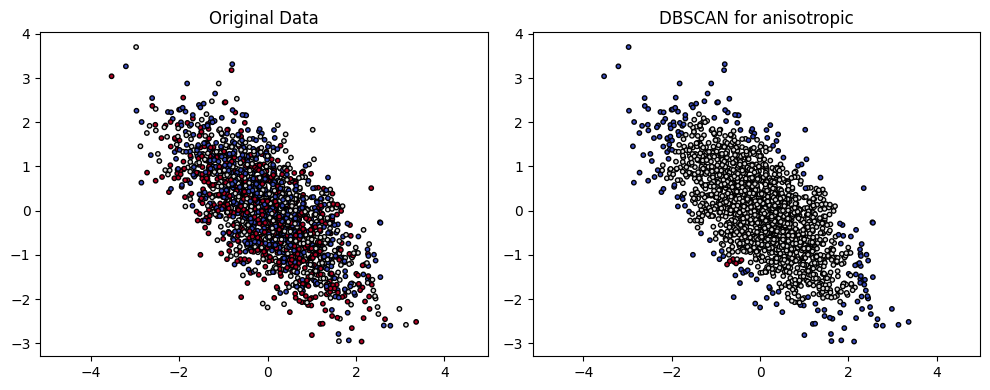


Optimizing DBSCAN for spiral
DBSCAN for spiral...
ACC:  0.3248, ARI:  0.0022, NMI: 0.0478, Separation:  0.3362, Compactness:  4.9236, CVNN:  2.6299, DBCV: -0.8068, CVDD:  18.1138


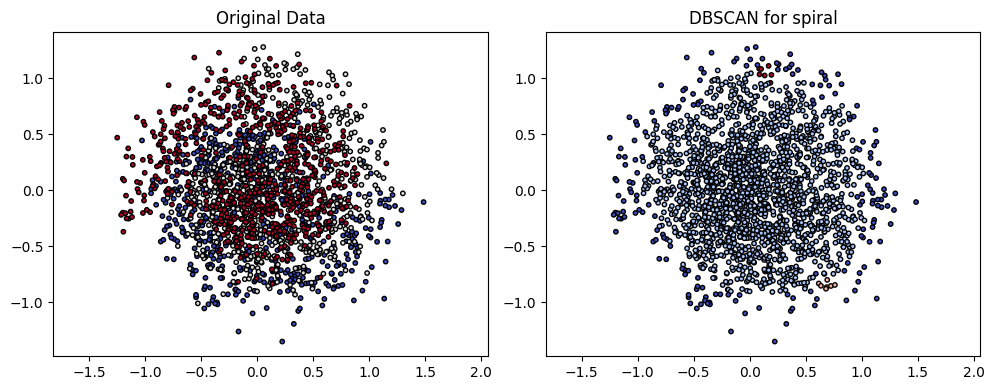


Optimizing DBSCAN for blobs
DBSCAN for blobs...
ACC:  0.2574, ARI: -0.0000, NMI: 0.0007, Separation:  0.4612, Compactness:  16.1528, CVNN:  8.3070, DBCV: -0.8145, CVDD:  559.5991


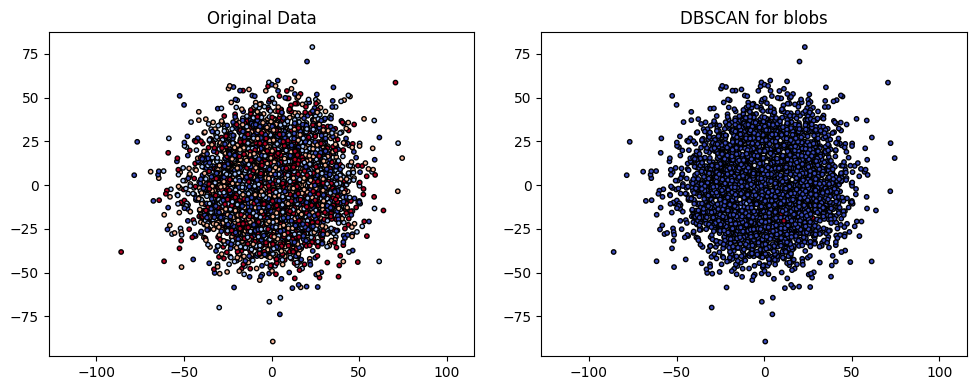

In [ ]:
import os
datasets = {
    'two_moons': (X_moons, y_moons, 0.3, 11),
    'circles': (X_circles, y_circles, 0.2, 3),
    'anisotropic': (X_anisotropy, y_anisotropy, 0.2, 10),
    'spiral': (X_spiral, y_spiral, 0.2, 10),
    'blobs': (X_blobs, y_blobs, 1.4, 12)
}

# Run optimization for each dataset
results = {}
for dataset_name, (X, y, eps, min_samples) in datasets.items():
    os.makedirs(f"results/dbscan/{dataset_name}", exist_ok=True)
    directory_path = f"results/dbscan/{dataset_name}"
    print(f"\nOptimizing DBSCAN for {dataset_name}")
    saved_file = os.path.join(directory_path,"best_result.csv")
    run_dbscan(X, y, eps, min_samples, dataset_name, saved_file)

In [ ]:
import pandas as pd
import json
import os
import numpy as np
import matplotlib.pyplot as plt


def summarize_all_results(
    results_config,
    output_file='all_algorithms_datasets_summary.csv',
    sensitivity_threshold=0.05
):
    """
    Summarize results from multiple datasets and algorithms into a single CSV file,
    calculate parameter sensitivity, and save the results.

    Parameters:
    -----------
    results_config : list of dict
        Each dictionary should contain:
            - 'algorithm': Name of the algorithm (e.g., 'DBSCAN').
            - 'dataset': Name of the dataset.
            - 'grid_search_file': Path to the grid search results file.
            - 'stability_dir': Path to the directory with stability results.
            - 'sensitivity_file': Path to the parameter sensitivity results file.
    output_file : str
        Path to the consolidated summary CSV file.
    sensitivity_threshold : float, default=0.05
        Threshold for standard deviation to determine if there is sensitivity.
    """
    summary_rows = []

    for config in results_config:
        algorithm = config['algorithm']
        dataset = config['dataset']
        grid_search_file = config['grid_search_file']
        stability_dir = config['stability_dir']
        sensitivity_file = config['sensitivity_file']
        plot_directory = config['plot_directory']

        summary = {
            'algorithm': algorithm,
            'dataset': dataset,
            'grid_search_iterations': None,
            'best_parameters': None,
            'accuracy': None,
            'silhouette': None,
            'db_score': None,
            's_dbw': None,
            'cvnn': None,
            'ARI': None,
            'NMI': None,
            'stabilityScore': None,
            'sensitivity_iterations': None,
            'paramsSensible': None,
        }

        # Step 1: Read the grid search results
        try:
            grid_search_df = pd.read_csv(grid_search_file)
            summary['grid_search_iterations'] = len(grid_search_df)
            best_row = grid_search_df.iloc[grid_search_df['accuracy'].idxmax()]
            summary['best_parameters'] = json.dumps({
                'eps': best_row['eps'],
                'min_samples': int(best_row['min_samples'])
            })
            summary['accuracy'] = best_row['accuracy'].round(4)
            summary['silhouette'] = best_row['silhouette'].round(4)
            summary['db_score'] = best_row['db_score'].round(4)
            summary['s_dbw'] = best_row['s_dbw'].round(4)
            summary['cvnn'] = best_row['cvnn'].round(4)
            summary['ARI'] = best_row['ARI'].round(4)
            summary['NMI'] = best_row['NMI'].round(4)
        except Exception as e:
            print(f"Error reading grid search file for {dataset} ({algorithm}): {e}")

        # Step 2: Read stability results
        try:
            stability_scores = []
            for file in os.listdir(stability_dir):
                if file.endswith(".csv"):
                    run_data = pd.read_csv(os.path.join(stability_dir, file))
                    stability_scores.append(run_data['Cluster_Label'].values)

            stability_ari_scores = [
                adjusted_rand_score(stability_scores[i], stability_scores[j])
                for i in range(len(stability_scores))
                for j in range(i + 1, len(stability_scores))
            ]
            summary['stabilityScore'] = sum(stability_ari_scores) / len(stability_ari_scores) if stability_ari_scores else None
        except Exception as e:
            print(f"Error reading stability results for {dataset} ({algorithm}): {e}")

        # Step 3: Read parameter sensitivity results (focus on ARI)
        try:
            sensitivity_df = pd.read_csv(sensitivity_file)
            summary['sensitivity_iterations'] = len(sensitivity_df)
            ari_values = sensitivity_df['ARI'].values.tolist()

            # Check for parameter sensitivity (standard deviation of ARI)
            ari_std = np.std(ari_values)
            summary['paramsSensible'] = ari_std
            print('ARI standard deviation: ', ari_std)

            # Box plot visualization
            plt.figure(figsize=(8, 6))
            plt.boxplot(ari_values)
            plt.title(f"ARI Values for Sensitivity Check - {algorithm} on {dataset}")
            plt.xlabel("Sensitivity Iterations")
            plt.ylabel("ARI")
            plt.grid(True)
            plt.savefig(f"{plot_directory}/{dataset}_{algorithm}_sensitivity_boxplot.png")
            plt.close()
        except Exception as e:
            print(f"Error reading sensitivity file for {dataset} ({algorithm}): {e}")

        # Append the summary row
        summary_rows.append(summary)

    # Step 4: Write all summaries to a single CSV file
    try:
        pd.DataFrame(summary_rows).to_csv(output_file, index=False)
        print(f"Consolidated summary written to {output_file}")
    except Exception as e:
        print(f"Error writing consolidated summary file: {e}")

In [ ]:
datasets = {
    'two_moons': (X_moons, y_moons),
    'circles': (X_circles, y_circles),
    'anisotropic': (X_anisotropy, y_anisotropy),
    'spiral': (X_spiral, y_spiral),
    'blobs': (X_blobs, y_blobs)
}

results_config = []
for dataset_name, (X, y) in datasets.items():
  directory_path = f"results/dbscan/{dataset_name}"
  results_config.append({
      'algorithm': 'DBSCAN',
      'dataset': dataset_name,
      'grid_search_file': f"{directory_path}/grid_search_results.csv",
      'stability_dir': f"{directory_path}/stability_results",
      'sensitivity_file': f"{directory_path}/parameter_sensitivity.csv",
      'plot_directory': f"results/dbscan/plot"
  })

summarize_all_results(results_config, output_file='results/dbscan/all_summary_results.csv')

/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


ARI standard deviation:  nan
ARI standard deviation:  0.0
ARI standard deviation:  6.776263578034403e-21
ARI standard deviation:  0.004536733438719194
ARI standard deviation:  0.00012074173411810066
Consolidated summary written to results/dbscan/all_summary_results.csv


### **Kernel KMeans**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, accuracy_score, silhouette_score, davies_bouldin_score
from kernel_kmeans import KernelKMeans

def optimize_kernel_kmeans(X, y_true, dataset_name='two_moons', output_file='grid_search_results.csv'):
    """
    Find optimal Kernel K-means parameters using grid search.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances
    y_true : array-like of shape (n_samples,)
        True labels
    dataset_name : str
        Name of the dataset for printing

    Returns:
    --------
    best_params : dict
        Dictionary containing best parameters (kernel, gamma)
    best_metrics : dict
        Dictionary containing best metric scores
    best_pred : array
        Predictions using best parameters
    """
    # Define parameter ranges to search
    kernels = ['rbf', 'polynomial', 'sigmoid']
    gamma_range = np.logspace(-3, 2, 12)  # from 0.001 to 100
    n_clusters = len(np.unique(y_true))

    best_score = 0
    best_params = None
    best_pred = None
    best_metrics = None

    # Standardize the features
    X_scaled = StandardScaler().fit_transform(X)

    print(f"Optimizing Kernel K-means parameters for {dataset_name}...")

    # Open the CSV file for writing results
    with open(output_file, mode='w', newline='') as csvfile:
      writer = csv.writer(csvfile)
      # Write header
      writer.writerow(['dataset', 'kernel', 'gamma', 'accuracy', 'silhouette', 'db_score', 's_dbw', 'cvnn', 'ARI', 'NMI'])
      for kernel in kernels:
        for gamma in gamma_range:
          try:
              # Initialize and fit KernelKMeans
              km = KernelKMeans(
                  n_clusters=n_clusters,
                  kernel=kernel,
                  gamma=gamma,
                  max_iter=100,
                  random_state=42
              )

              # Fit and predict
              y_pred = km.fit_predict(X_scaled)

              # Calculate cluster centers
              centers = np.zeros((n_clusters, X_scaled.shape[1]))
              for i in range(n_clusters):
                  cluster_points = X_scaled[y_pred == i]
                  if len(cluster_points) > 0:
                      centers[i] = np.mean(cluster_points, axis=0)

              # Calculate metrics
              acc = accuracy_score(y_true, y_pred)
              sil = silhouette_score(X_scaled, y_pred)
              db = davies_bouldin_score(X_scaled, y_pred)
              s_dbw = calculate_s_dbw(X_scaled, y_pred, centers)
              cvnn = calculate_cvnn_index(X_scaled, y_pred)
              ari = adjusted_rand_score(y_true, y_pred)
              nmi = normalized_mutual_info_score(y_true, y_pred)

              # Write results to the CSV file
              writer.writerow([dataset_name, kernel, gamma, acc, sil, db, s_dbw, cvnn, ari, nmi])

              # Update best parameters if we found better accuracy
              if acc > best_score:
                  best_score = acc
                  best_params = {'kernel': kernel, 'gamma': gamma}
                  best_pred = y_pred
                  best_metrics = {
                      'accuracy': acc,
                      'silhouette': sil,
                      'db_score': db,
                      's_dbw': s_dbw,
                      'cvnn': cvnn,
                            'ARI': ari,
                            'NMI': nmi
                  }

          except Exception as e:
              print(f"Error with kernel={kernel}, gamma={gamma}: {str(e)}")
              continue

    if best_params is None:
        print("\nNo valid clustering results found. Try different parameter ranges.")
        return None, None, None

    print("\nBest parameters found:")
    print(f"Kernel: {best_params['kernel']}")
    print(f"Gamma: {best_params['gamma']:.3f}")
    print(f"Best accuracy: {best_metrics['accuracy']:.4f}")
    print(f"Silhouette score: {best_metrics['silhouette']:.4f}")
    print(f"Davies-Bouldin score: {best_metrics['db_score']:.4f}")
    print(f"S_Dbw score: {best_metrics['s_dbw']:.4f}")
    print(f"CVNN score: {best_metrics['cvnn']:.4f}")

    # Plot results with best parameters
    plt.figure(figsize=(10, 4))

    # Original data
    plt.subplot(121)
    plt.scatter(X[:, 0], X[:, 1], c=y_true, cmap='coolwarm', s=10, edgecolor='k')
    plt.title("Original Data")
    plt.axis('equal')

    # Best clustering result
    plt.subplot(122)
    plt.scatter(X[:, 0], X[:, 1], c=best_pred, cmap='coolwarm', s=10, edgecolor='k')
    plt.title(f"Best Kernel K-means Clustering\n({best_params['kernel']}, γ={best_params['gamma']:.3f})")
    plt.axis('equal')

    plt.tight_layout()
    plt.show()

    return best_params, best_metrics, best_pred

In [ ]:
from kernel_kmeans import KernelKMeans
from sklearn.preprocessing import StandardScaler
import numpy as np
import csv
import matplotlib.pyplot as plt

def run_kernel_kmeans(X, y_true, kernel, gamma, n_clusters, dataset_name='dataset', output_file='best_result.csv'):
    """
    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances.
    y_true : array-like of shape (n_samples,)
        True labels.
    dataset_name : str
        Name of the dataset for printing/logging.
    output_file : str
        Path to the CSV file where results will be saved.
    """

    # Standardize the features
    X_scaled = StandardScaler().fit_transform(X)

    print(f"KKM for {dataset_name}...")

    # Open the CSV file for writing results
    with open(output_file, mode='w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        # Write header
        writer.writerow(['dataset', 'kernel', 'gamma', 'accuracy', 'ari', 'nmi', 'sep', 'com', 'cvnn', 'dbcv', 'cvdd'])
        # Initialize and fit KernelKMeans
        km = KernelKMeans(
            n_clusters=n_clusters,
            kernel=kernel,
            gamma=gamma,
            max_iter=100,
            random_state=42
        )

        # Fit and predict
        y_pred = km.fit_predict(X_scaled)

        # Calculate metrics
        acc = accuracy_score(y_true, y_pred)
        sep, com, cvnn = calculate_cvnn_index(X_scaled, y_pred)
        cvdd = cvdd_cal(X_scaled, y_pred)
        dbcv = dbcv_cal(X_scaled, y_pred)
        ari = adjusted_rand_score(y_true, y_pred)
        nmi = normalized_mutual_info_score(y_true, y_pred)

        print(f"ACC: {acc: .4f}, ARI: {ari: .4f}, NMI:{nmi : .4f}, Separation: {sep : .4f}, Compactness: {com : .4f}, CVNN: {cvnn : .4f}, DBCV: {dbcv : .4f}, CVDD: {cvdd : .4f}")

        # Write results to the CSV file
        writer.writerow([dataset_name, kernel, gamma, acc, ari, nmi, sep, com, cvnn, dbcv, cvdd])

        # Plot results with best parameters
        plt.figure(figsize=(10, 4))

        # Original data
        plt.subplot(121)
        plt.scatter(X[:, 0], X[:, 1], c=y_true, cmap='coolwarm', s=10, edgecolor='k')
        plt.title("Original Data")
        plt.axis('equal')

        # Best clustering result
        plt.subplot(122)
        plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='coolwarm', s=10, edgecolor='k')
        plt.title(f"Kernel K-means for {dataset_name}")
        plt.axis('equal')

        plt.tight_layout()
        plt.show()

        return y_pred


Optimizing kernel_kmeans for two_moons
KKM for two_moons...
ACC:  0.8330, ARI:  0.4430, NMI: 0.3497, Separation:  0.0251, Compactness:  2.7783, CVNN:  1.4017, DBCV: -0.9459, CVDD:  397.1106


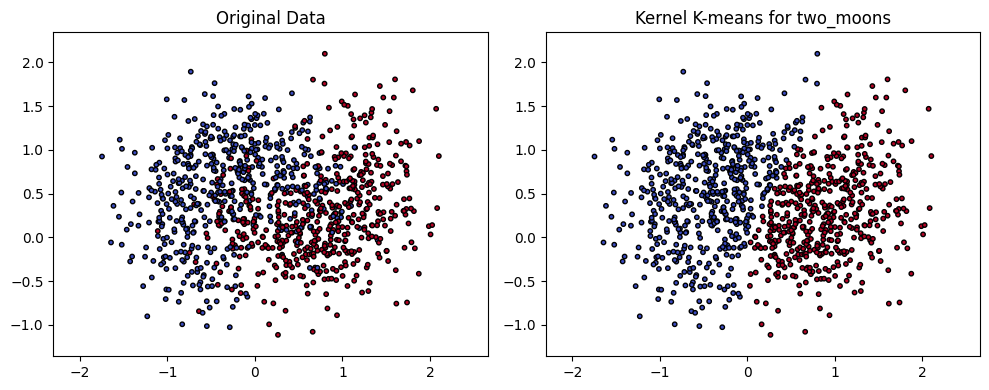


Optimizing kernel_kmeans for circles
KKM for circles...
ACC:  0.5320, ARI:  0.0039, NMI: 0.0037, Separation:  0.0509, Compactness:  3.3886, CVNN:  1.7197, DBCV: -0.9887, CVDD:  47.7604


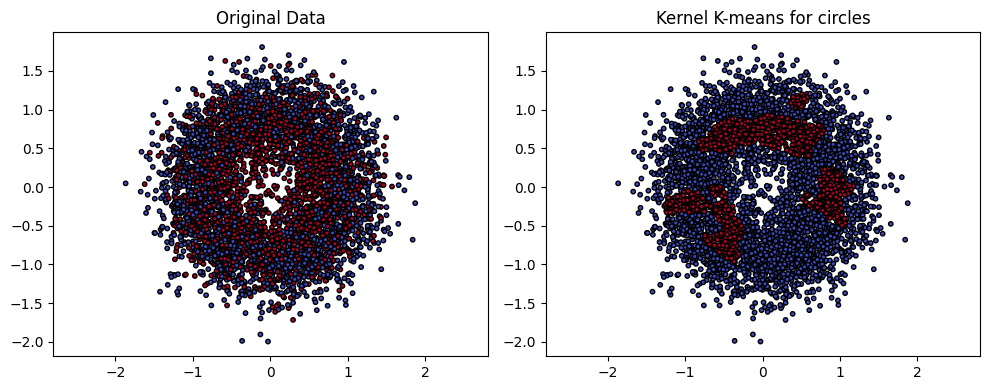


Optimizing kernel_kmeans for anisotropic
KKM for anisotropic...
ACC:  0.3715, ARI:  0.0024, NMI: 0.0035, Separation:  0.0732, Compactness:  3.1938, CVNN:  1.6335, DBCV: -0.9883, CVDD:  68.3977


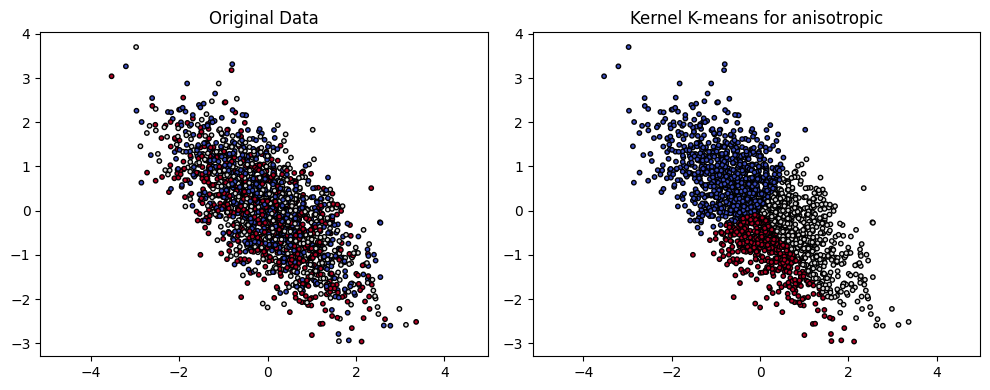


Optimizing kernel_kmeans for spiral
KKM for spiral...
ACC:  0.3514, ARI:  0.0110, NMI: 0.0123, Separation:  0.0355, Compactness:  3.5107, CVNN:  1.7731, DBCV: -0.9835, CVDD:  304.0758


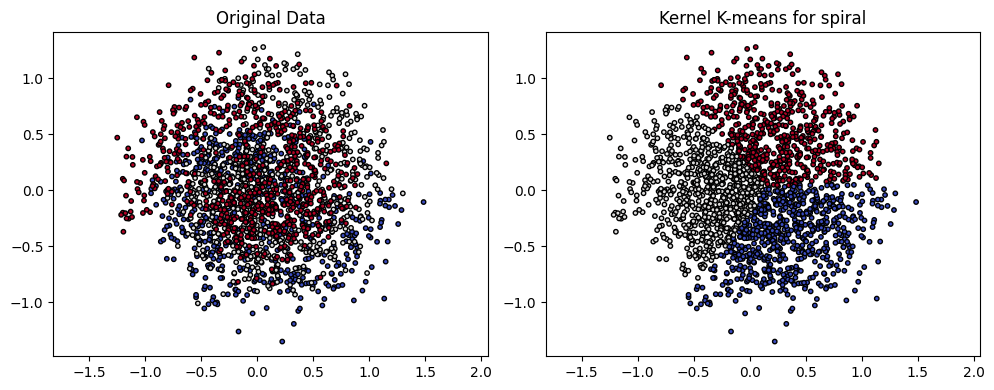


Optimizing kernel_kmeans for blobs
KKM for blobs...
ACC:  0.2596, ARI:  0.0001, NMI: 0.0007, Separation:  0.3366, Compactness:  16.0517, CVNN:  8.1941, DBCV: -0.8083, CVDD:  636.0241


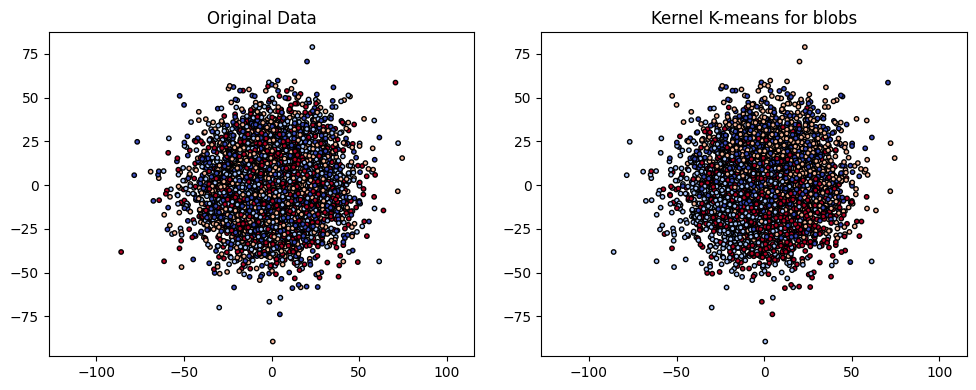

In [ ]:
import os
datasets = {
    'two_moons': (X_moons, y_moons, "rbf", 0.5336699231206307, 2),
    'circles': (X_circles, y_circles, "rbf", 100.0, 2),
    'anisotropic': (X_anisotropy, y_anisotropy, "sigmoid", 4.328761281083057, 3),
    'spiral': (X_spiral, y_spiral, "rbf", 0.5336699231206307, 3),
    'blobs': (X_blobs, y_blobs, "sigmoid", 0.5336699231206307, 4)
}

# Run optimization for each dataset
results = {}
for dataset_name, (X, y, kernel, gamma, n_clusters) in datasets.items():
    os.makedirs(f"results/kernel_kmeans/{dataset_name}", exist_ok=True)
    directory_path = f"results/kernel_kmeans/{dataset_name}"
    print(f"\nOptimizing kernel_kmeans for {dataset_name}")
    saved_file = os.path.join(directory_path,"best_result.csv")
    run_kernel_kmeans(X, y, kernel, gamma, n_clusters, dataset_name, saved_file)

In [ ]:
import pandas as pd
import os

def check_stability_kernel_kmeans(X, kernel, gamma, n_clusters, n_runs=10, output_dir="stability_results"):
    """
    Check stability of Kernel Kmeans clustering with the same parameters and save results to files.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances (standardized).
    kernel : string
        Optimal value for eps.
    gamma : float
        Optimal value for gamma.
    n_runs : int
        Number of times to run DBSCAN.
    output_dir : str
        Directory to save clustering results.

    Returns:
    --------
    stability_scores : list of float
        List of ARI scores between each pair of runs.
    is_stable : bool
        True if all ARI scores are 1, indicating stability.
    """
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Run KKM multiple times and save results
    cluster_results = []
    km = KernelKMeans(
                  n_clusters=n_clusters,
                  kernel=kernel,
                  gamma=gamma,
                  max_iter=100,
                  random_state=42
    )
    for run_idx in range(n_runs):
        y_pred = km.fit_predict(X)
        cluster_results.append(y_pred)

        # Save results to CSV
        result_file = os.path.join(output_dir, f"run_{run_idx + 1}.csv")
        pd.DataFrame({"Cluster_Label": y_pred}).to_csv(result_file, index=False)
        print(f"Saved clustering result for run {run_idx + 1} to {result_file}")

    # Calculate ARI between all pairs of runs
    stability_scores = []
    for i in range(n_runs):
        for j in range(i + 1, n_runs):
            ari = adjusted_rand_score(cluster_results[i], cluster_results[j])
            stability_scores.append(ari)

    # Check if all ARI scores are 1
    is_stable = all(score == 1 for score in stability_scores)

    return stability_scores, is_stable

In [ ]:
def check_parameter_sensitivity(X, y_true, best_params, n_clusters, output_file='parameter_sensitivity.csv'):
    """
    Check the sensitivity of the Kernel Kmeans parameters by slightly modifying them,
    running the clustering, and calculating ARI and NMI over 5 runs.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances.
    y_true : array-like of shape (n_samples,)
        True labels.
    best_params : dict
        The best parameters found.
    output_file : str
        Path to the CSV file where sensitivity results will be saved.
    """
    kernel = best_params['kernel']
    gamma = best_params['gamma']

    # Create a list of modified gamma values for sensitivity check
    gamma_variations = [gamma + i * 0.0001 for i in range(1, 6)] + [gamma - i * 0.0001 for i in range(1, 6)]

    # Open the CSV file for writing results
    with open(output_file, mode='w', newline='') as csvfile:
      writer = csv.writer(csvfile)
      # Write header
      writer.writerow(['kernel', 'gamma', 'accuracy', 'silhouette', 'db_score', 's_dbw', 'cvnn', 'ARI', 'NMI'])

      for gamma in gamma_variations:
          km = KernelKMeans(
                  n_clusters=n_clusters,
                  kernel=kernel,
                  gamma=gamma,
                  max_iter=100,
                  random_state=42
              )
          X_scaled = StandardScaler().fit_transform(X)
          y_pred = km.fit_predict(X_scaled)

          # Calculate cluster centers
          unique_labels = set(label for label in y_pred if label != -1)
          centers = np.zeros((len(unique_labels), X_scaled.shape[1]))
          for i, label in enumerate(unique_labels):
              cluster_points = X_scaled[y_pred == label]
              centers[i] = np.mean(cluster_points, axis=0)

          # Calculate metrics
          acc = accuracy_score(y_true, y_pred)
          sil = silhouette_score(X_scaled, y_pred)
          db = davies_bouldin_score(X_scaled, y_pred)
          s_dbw = calculate_s_dbw(X_scaled, y_pred, centers)
          cvnn = calculate_cvnn_index(X_scaled, y_pred)
          ari = adjusted_rand_score(y_true, y_pred)
          nmi = normalized_mutual_info_score(y_true, y_pred)

          # Write results to the CSV file
          writer.writerow([kernel, gamma, acc, sil, db, s_dbw, cvnn, ari, nmi])

    print(f"\nParameter sensitivity results saved to {output_file}")

In [ ]:
def kkm_main_workflow(X, y_true, dataset_name, directory_path):
    """
    Main workflow for optimizing Kernel K-means, checking stability, and testing parameter sensitivity.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Input dataset.
    y_true : array-like of shape (n_samples,)
        Ground truth labels.
    dataset_name : str
        Name of the dataset.

    Returns:
    --------
    None
    """
    # File paths
    grid_search_file = os.path.join(directory_path,"grid_search_results.csv")
    stability_dir = os.path.join(directory_path,"stability_results")
    sensitivity_file = os.path.join(directory_path,"parameter_sensitivity.csv")

    # Step 1: Optimize KKM and save results
    print("\nStep 1: Optimizing Kernel K-means Parameters...")
    best_params, best_metrics, best_pred = optimize_kernel_kmeans(
        X, y_true, dataset_name=dataset_name, output_file=grid_search_file
    )
    if best_params is None:
        print("Optimization failed. Exiting workflow.")
        return

    print(f"\nOptimal Parameters: {best_params}")
    print(f"Best Metrics: {best_metrics}")

    # Step 2: Check Stability and Save Results
    print("\nStep 2: Checking Stability of Optimal Parameters...")
    optimal_kernel = best_params['kernel']
    optimal_gamma = best_params['gamma']
    n_clusters = len(np.unique(y_true))

    X_scaled = StandardScaler().fit_transform(X)  # Standardize data again
    stability_scores, is_stable = check_stability_kernel_kmeans(
        X_scaled, optimal_kernel, optimal_gamma, n_clusters, output_dir=stability_dir
    )

    print("\nStability Check Results:")
    print(f"Stability Scores (ARI): {stability_scores}")
    print(f"Is the clustering stable? {'Yes' if is_stable else 'No'}")

    if not is_stable:
        print("Clustering is not stable. Exiting workflow.")
        return

    # Step 3: Check Parameter Sensitivity
    print("\nStep 3: Checking Parameter Sensitivity...")
    check_parameter_sensitivity(
        X, y_true, best_params=best_params, n_clusters=n_clusters, output_file=sensitivity_file
    )
    print(f"Parameter Sensitivity Results saved to {sensitivity_file}")


Optimizing Kernel K-Means for two_moons

Step 1: Optimizing Kernel K-means Parameters...
Optimizing Kernel K-means parameters for two_moons...

Best parameters found:
Kernel: rbf
Gamma: 0.534
Best accuracy: 0.8330
Silhouette score: 0.3529
Davies-Bouldin score: 1.1679
S_Dbw score: 1.5870
CVNN score: 0.5754


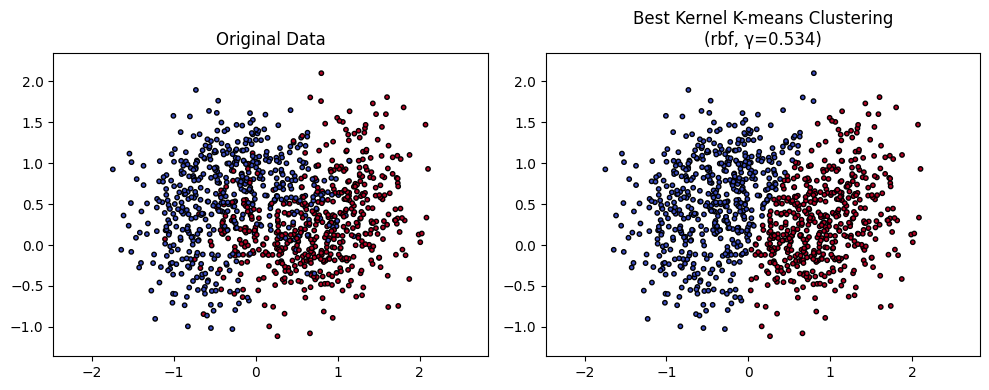


Optimal Parameters: {'kernel': 'rbf', 'gamma': 0.5336699231206307}
Best Metrics: {'accuracy': 0.833, 'silhouette': 0.3529498102430269, 'db_score': 1.167852113990185, 's_dbw': 1.5870332810466798, 'cvnn': 0.575383007147666, 'ARI': 0.44299881816913717, 'NMI': 0.3496788391455496}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/kernel_kmeans/two_moons/stability_results/run_1.csv
Saved clustering result for run 2 to results/kernel_kmeans/two_moons/stability_results/run_2.csv
Saved clustering result for run 3 to results/kernel_kmeans/two_moons/stability_results/run_3.csv
Saved clustering result for run 4 to results/kernel_kmeans/two_moons/stability_results/run_4.csv
Saved clustering result for run 5 to results/kernel_kmeans/two_moons/stability_results/run_5.csv
Saved clustering result for run 6 to results/kernel_kmeans/two_moons/stability_results/run_6.csv
Saved clustering result for run 7 to results/kernel_kmeans/two_moons/stability_results/

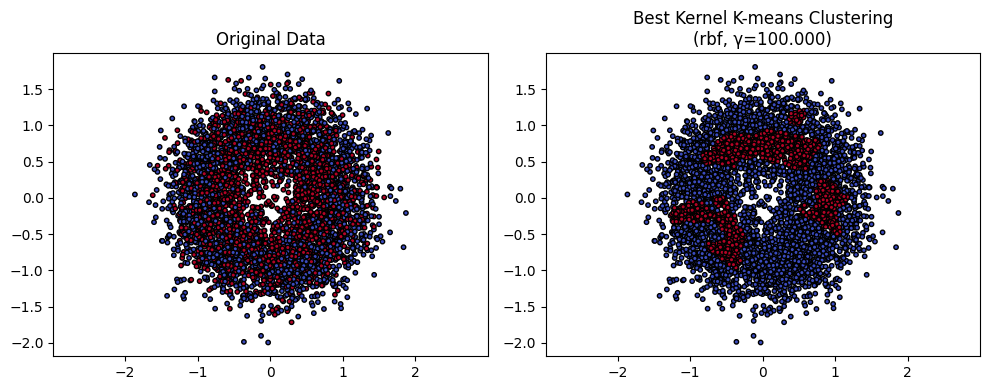


Optimal Parameters: {'kernel': 'rbf', 'gamma': 100.0}
Best Metrics: {'accuracy': 0.532, 'silhouette': 0.003437759581782288, 'db_score': 6.295576411808306, 's_dbw': 1.6471162012818472, 'cvnn': 1.0879877416995043, 'ARI': 0.003928245050099198, 'NMI': 0.0037332936562194676}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/kernel_kmeans/circles/stability_results/run_1.csv
Saved clustering result for run 2 to results/kernel_kmeans/circles/stability_results/run_2.csv
Saved clustering result for run 3 to results/kernel_kmeans/circles/stability_results/run_3.csv
Saved clustering result for run 4 to results/kernel_kmeans/circles/stability_results/run_4.csv
Saved clustering result for run 5 to results/kernel_kmeans/circles/stability_results/run_5.csv
Saved clustering result for run 6 to results/kernel_kmeans/circles/stability_results/run_6.csv
Saved clustering result for run 7 to results/kernel_kmeans/circles/stability_results/run_7.csv
Saved clus

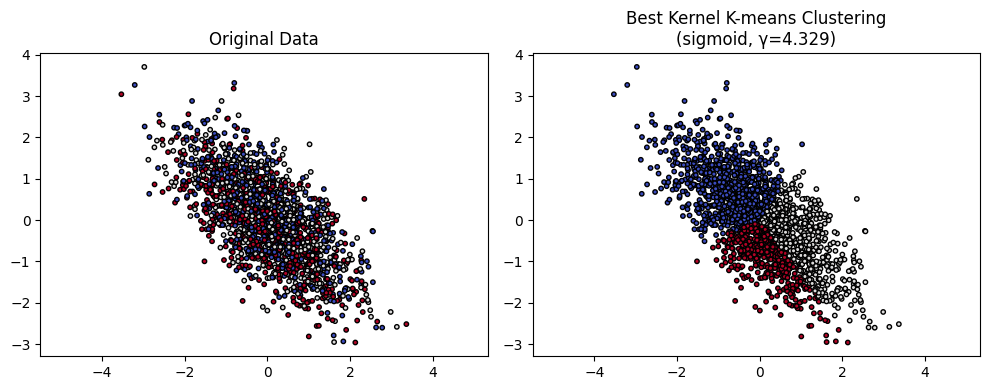


Optimal Parameters: {'kernel': 'sigmoid', 'gamma': 4.328761281083057}
Best Metrics: {'accuracy': 0.3715, 'silhouette': 0.31491303107444424, 'db_score': 1.2677157342329746, 's_dbw': 1.2948026459051465, 'cvnn': 1.2241024927107338, 'ARI': 0.002385845734236711, 'NMI': 0.003460049691946189}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/kernel_kmeans/anisotropic/stability_results/run_1.csv
Saved clustering result for run 2 to results/kernel_kmeans/anisotropic/stability_results/run_2.csv
Saved clustering result for run 3 to results/kernel_kmeans/anisotropic/stability_results/run_3.csv
Saved clustering result for run 4 to results/kernel_kmeans/anisotropic/stability_results/run_4.csv
Saved clustering result for run 5 to results/kernel_kmeans/anisotropic/stability_results/run_5.csv
Saved clustering result for run 6 to results/kernel_kmeans/anisotropic/stability_results/run_6.csv
Saved clustering result for run 7 to results/kernel_kmeans/anisot

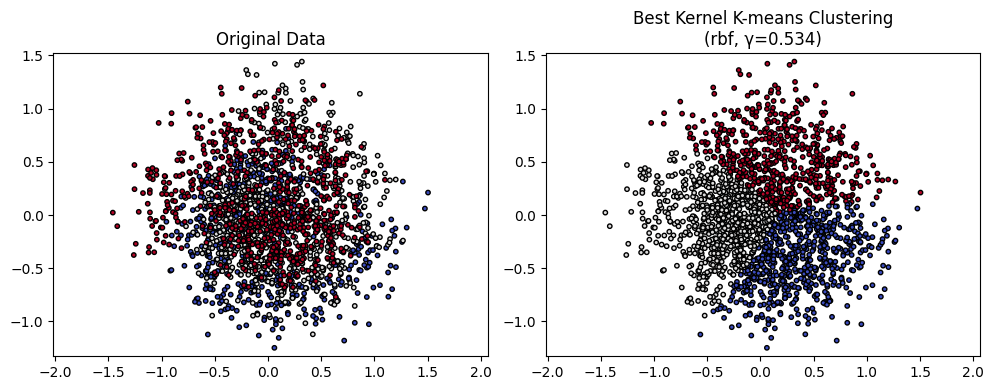


Optimal Parameters: {'kernel': 'rbf', 'gamma': 0.5336699231206307}
Best Metrics: {'accuracy': 0.36986986986986986, 'silhouette': 0.3487023671253215, 'db_score': 0.9365091138016591, 's_dbw': 1.4198657505472014, 'cvnn': 0.8358031752944117, 'ARI': 0.006029212894696621, 'NMI': 0.006913422877451699}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/kernel_kmeans/spiral/stability_results/run_1.csv
Saved clustering result for run 2 to results/kernel_kmeans/spiral/stability_results/run_2.csv
Saved clustering result for run 3 to results/kernel_kmeans/spiral/stability_results/run_3.csv
Saved clustering result for run 4 to results/kernel_kmeans/spiral/stability_results/run_4.csv
Saved clustering result for run 5 to results/kernel_kmeans/spiral/stability_results/run_5.csv
Saved clustering result for run 6 to results/kernel_kmeans/spiral/stability_results/run_6.csv
Saved clustering result for run 7 to results/kernel_kmeans/spiral/stability_results/ru

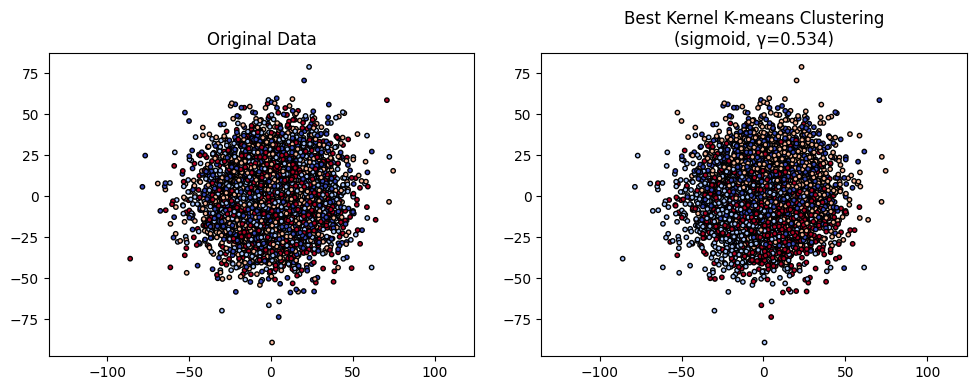


Optimal Parameters: {'kernel': 'sigmoid', 'gamma': 0.5336699231206307}
Best Metrics: {'accuracy': 0.2596, 'silhouette': 0.0606321093141037, 'db_score': 2.821897333076305, 's_dbw': 1.6984610647582115, 'cvnn': 1.1471111458970358, 'ARI': 9.912719884115303e-05, 'NMI': 0.0007489290666688603}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/kernel_kmeans/blobs/stability_results/run_1.csv
Saved clustering result for run 2 to results/kernel_kmeans/blobs/stability_results/run_2.csv
Saved clustering result for run 3 to results/kernel_kmeans/blobs/stability_results/run_3.csv
Saved clustering result for run 4 to results/kernel_kmeans/blobs/stability_results/run_4.csv
Saved clustering result for run 5 to results/kernel_kmeans/blobs/stability_results/run_5.csv
Saved clustering result for run 6 to results/kernel_kmeans/blobs/stability_results/run_6.csv
Saved clustering result for run 7 to results/kernel_kmeans/blobs/stability_results/run_7.csv
Saved c

In [ ]:
import os
import csv
datasets = {
    'two_moons': (X_moons, y_moons),
    'circles': (X_circles, y_circles),
    'anisotropic': (X_anisotropy, y_anisotropy),
    'spiral': (X_spiral, y_spiral),
    'blobs': (X_blobs, y_blobs)
}

# Run optimization for each dataset
results = {}
for dataset_name, (X, y) in datasets.items():
    os.makedirs(f"results/kernel_kmeans/{dataset_name}", exist_ok=True)
    directory_path = f"results/kernel_kmeans/{dataset_name}"
    print(f"\nOptimizing Kernel K-Means for {dataset_name}")
    kkm_main_workflow(X, y, dataset_name, directory_path)

In [ ]:
import pandas as pd
import json
import os
import numpy as np
import matplotlib.pyplot as plt


def summarize_all_results(
    results_config,
    output_file='all_algorithms_datasets_summary.csv',
    sensitivity_threshold=0.05
):
    """
    Summarize results from multiple datasets and algorithms into a single CSV file,
    calculate parameter sensitivity, and save the results.

    Parameters:
    -----------
    results_config : list of dict
        Each dictionary should contain:
            - 'algorithm': Name of the algorithm (e.g., 'DBSCAN').
            - 'dataset': Name of the dataset.
            - 'grid_search_file': Path to the grid search results file.
            - 'stability_dir': Path to the directory with stability results.
            - 'sensitivity_file': Path to the parameter sensitivity results file.
    output_file : str
        Path to the consolidated summary CSV file.
    sensitivity_threshold : float, default=0.05
        Threshold for standard deviation to determine if there is sensitivity.
    """
    summary_rows = []

    for config in results_config:
        algorithm = config['algorithm']
        dataset = config['dataset']
        grid_search_file = config['grid_search_file']
        stability_dir = config['stability_dir']
        sensitivity_file = config['sensitivity_file']
        plot_directory = config['plot_directory']

        summary = {
            'algorithm': algorithm,
            'dataset': dataset,
            'grid_search_iterations': None,
            'best_parameters': None,
            'accuracy': None,
            'silhouette': None,
            'db_score': None,
            's_dbw': None,
            'cvnn': None,
            'ARI': None,
            'NMI': None,
            'stabilityScore': None,
            'sensitivity_iterations': None,
            'paramsSensible': None,
        }

        # Step 1: Read the grid search results
        try:
            grid_search_df = pd.read_csv(grid_search_file)
            summary['grid_search_iterations'] = len(grid_search_df)
            best_row = grid_search_df.iloc[grid_search_df['accuracy'].idxmax()]
            summary['best_parameters'] = json.dumps({
                'kernel': best_row['kernel'],
                'gamma': best_row['gamma']
            })
            summary['accuracy'] = best_row['accuracy'].round(4)
            summary['silhouette'] = best_row['silhouette'].round(4)
            summary['db_score'] = best_row['db_score'].round(4)
            summary['s_dbw'] = best_row['s_dbw'].round(4)
            summary['cvnn'] = best_row['cvnn'].round(4)
            summary['ARI'] = best_row['ARI'].round(4)
            summary['NMI'] = best_row['NMI'].round(4)
        except Exception as e:
            print(f"Error reading grid search file for {dataset} ({algorithm}): {e}")

        # Step 2: Read stability results
        try:
            stability_scores = []
            for file in os.listdir(stability_dir):
                if file.endswith(".csv"):
                    run_data = pd.read_csv(os.path.join(stability_dir, file))
                    stability_scores.append(run_data['Cluster_Label'].values)

            stability_ari_scores = [
                adjusted_rand_score(stability_scores[i], stability_scores[j])
                for i in range(len(stability_scores))
                for j in range(i + 1, len(stability_scores))
            ]
            summary['stabilityScore'] = sum(stability_ari_scores) / len(stability_ari_scores) if stability_ari_scores else None
        except Exception as e:
            print(f"Error reading stability results for {dataset} ({algorithm}): {e}")

        # Step 3: Read parameter sensitivity results (focus on ARI)
        try:
            sensitivity_df = pd.read_csv(sensitivity_file)
            summary['sensitivity_iterations'] = len(sensitivity_df)
            ari_values = sensitivity_df['ARI'].values.tolist()

            # Check for parameter sensitivity (standard deviation of ARI)
            ari_std = np.std(ari_values)
            summary['paramsSensible'] = ari_std
            print('ARI standard deviation: ', ari_std)

            # Box plot visualization
            plt.figure(figsize=(8, 6))
            plt.boxplot(ari_values)
            plt.title(f"ARI Values for Sensitivity Check - {algorithm} on {dataset}")
            plt.xlabel("Sensitivity Iterations")
            plt.ylabel("ARI")
            plt.grid(True)
            plt.savefig(f"{plot_directory}/{dataset}_{algorithm}_sensitivity_boxplot.png")
            plt.close()
        except Exception as e:
            print(f"Error reading sensitivity file for {dataset} ({algorithm}): {e}")

        # Append the summary row
        summary_rows.append(summary)

    # Step 4: Write all summaries to a single CSV file
    try:
        pd.DataFrame(summary_rows).to_csv(output_file, index=False)
        print(f"Consolidated summary written to {output_file}")
    except Exception as e:
        print(f"Error writing consolidated summary file: {e}")

In [ ]:
datasets = {
    'two_moons': (X_moons, y_moons),
    'circles': (X_circles, y_circles),
    'anisotropic': (X_anisotropy, y_anisotropy),
    'spiral': (X_spiral, y_spiral),
    'blobs': (X_blobs, y_blobs)
}

results_config = []
for dataset_name, (X, y) in datasets.items():
  directory_path = f"results/kernel_kmeans/{dataset_name}"
  results_config.append({
      'algorithm': 'Kernel K-means',
      'dataset': dataset_name,
      'grid_search_file': f"{directory_path}/grid_search_results.csv",
      'stability_dir': f"{directory_path}/stability_results",
      'sensitivity_file': f"{directory_path}/parameter_sensitivity.csv",
      'plot_directory': f"results/kernel_kmeans/plot"
  })

summarize_all_results(results_config, output_file='results/kernel_kmeans/kkm_summary_results.csv')

ARI standard deviation:  0.0
ARI standard deviation:  8.673617379884035e-19
ARI standard deviation:  0.0
ARI standard deviation:  6.144506574785208e-06
ARI standard deviation:  0.00015716845905115363
Consolidated summary written to results/kernel_kmeans/kkm_summary_results.csv


### **Kernel Fuzzy C-Means**

In [ ]:
from sklearn.metrics import accuracy_score, silhouette_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
from kernel_fcm import kernel_gfcm

def optimize_kernel_fcm(X, y_true, dataset_name='two_moons', output_file='grid_search_results.csv'):
    """
    Find optimal Kernel FCM parameters using grid search.
    """
    # Define parameter ranges to search
    sigma_range = np.logspace(-2, 2, 10)  # from 0.01 to 100
    m_range = np.linspace(1.1, 3.0, 10)   # fuzzy parameter range
    n_clusters = len(np.unique(y_true))

    best_score = 0
    best_params = None
    best_pred = None
    best_centers = None
    best_metrics = None
    best_cost = float('inf')

    # Standardize the features
    X_scaled = StandardScaler().fit_transform(X)

    print(f"Optimizing Kernel FCM parameters for {dataset_name}...")

    # Open the CSV file for writing results
    with open(output_file, mode='w', newline='') as csvfile:
      writer = csv.writer(csvfile)
      # Write header
      writer.writerow(['dataset', 'sigma', 'fuzzy', 'accuracy', 'silhouette', 'db_score', 's_dbw', 'cvnn', 'ARI', 'NMI'])
      for sigma in sigma_range:
          for m in m_range:
              try:
                  # Run Kernel FCM
                  centers, y_pred, cost = kernel_gfcm(
                      X_scaled,
                      n_clusters=n_clusters,
                      sigma=sigma,
                      m=m,
                      p=2,  # Set p=2 for Kernel FCM
                      max_iter=300,
                      n_init=30
                  )

                  # Calculate metrics
                  acc = accuracy_score(y_true, y_pred)
                  sil = silhouette_score(X_scaled, y_pred)
                  db = davies_bouldin_score(X_scaled, y_pred)
                  s_dbw = calculate_s_dbw(X_scaled, y_pred, centers)
                  cvnn = calculate_cvnn_index(X_scaled, y_pred)
                  ari = adjusted_rand_score(y_true, y_pred)
                  nmi = normalized_mutual_info_score(y_true, y_pred)

                  # Write results to the CSV file
                  writer.writerow([dataset_name, sigma, m, acc, sil, db, s_dbw, cvnn, ari, nmi])

                  # Update best parameters if we found better accuracy
                  if acc > best_score or (acc == best_score and cost < best_cost):
                      best_score = acc
                      best_cost = cost
                      best_params = {'sigma': sigma, 'fuzzy': m}
                      best_pred = y_pred
                      best_centers = centers
                      best_metrics = {
                          'accuracy': acc,
                          'silhouette': sil,
                          'db_score': db,
                          's_dbw': s_dbw,
                          'cvnn': cvnn,
                            'ARI': ari,
                            'NMI': nmi,
                          'cost': cost
                      }

              except Exception as e:
                  print(f"Error with sigma={sigma}, m={m}: {str(e)}")
                  continue

    if best_params is None:
        print("\nNo valid clustering results found. Try different parameter ranges.")
        return None, None, None, None

    print("\nBest parameters found:")
    print(f"Sigma: {best_params['sigma']:.3f}")
    print(f"m: {best_params['fuzzy']:.3f}")
    print(f"Best accuracy: {best_metrics['accuracy']:.4f}")
    print(f"Silhouette score: {best_metrics['silhouette']:.4f}")
    print(f"Davies-Bouldin score: {best_metrics['db_score']:.4f}")
    print(f"S_Dbw score: {best_metrics['s_dbw']:.4f}")
    print(f"CVNN score: {best_metrics['cvnn']:.4f}")

    # Plot results with best parameters
    plt.figure(figsize=(10, 4))

    # Original data
    plt.subplot(121)
    plt.scatter(X[:, 0], X[:, 1], c=y_true, cmap='coolwarm', s=10, edgecolor='k')
    plt.title("Original Data")
    plt.axis('equal')

    # Best clustering result
    plt.subplot(122)
    plt.scatter(X[:, 0], X[:, 1], c=best_pred, cmap='coolwarm', s=10, edgecolor='k')
    plt.scatter(best_centers[:, 0], best_centers[:, 1], c='black', marker='x', s=100, linewidths=3)
    plt.title(f"Best Kernel FCM Clustering\n(σ={best_params['sigma']:.3f}, m={best_params['fuzzy']:.3f})")
    plt.axis('equal')

    plt.tight_layout()
    plt.show()

    return best_params, best_metrics, best_pred

In [ ]:
from sklearn.preprocessing import StandardScaler
import numpy as np
import csv
import matplotlib.pyplot as plt
from kernel_fcm import kernel_gfcm

def run_kfcm(X, y_true, sigma, fuzzy, n_clusters, dataset_name='dataset', output_file='best_result.csv'):
    """
    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances.
    y_true : array-like of shape (n_samples,)
        True labels.
    dataset_name : str
        Name of the dataset for printing/logging.
    output_file : str
        Path to the CSV file where results will be saved.
    """

    # Standardize the features
    X_scaled = StandardScaler().fit_transform(X)

    print(f"KKM for {dataset_name}...")

    # Open the CSV file for writing results
    with open(output_file, mode='w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        # Write header
        writer.writerow(['dataset', 'sigma', 'fuzzy', 'accuracy', 'ari', 'nmi', 'sep', 'com', 'cvnn', 'dbcv', 'cvdd'])
        # Run Kernel FCM
        centers, y_pred, cost = kernel_gfcm(
            X_scaled,
            n_clusters=n_clusters,
            sigma=sigma,
            m=fuzzy,
            p=2,  # Set p=2 for Kernel FCM
            max_iter=300,
            n_init=30
        )

        # Calculate metrics
        acc = accuracy_score(y_true, y_pred)
        sep, com, cvnn = calculate_cvnn_index(X_scaled, y_pred)
        cvdd = cvdd_cal(X_scaled, y_pred)
        dbcv = dbcv_cal(X_scaled, y_pred)
        ari = adjusted_rand_score(y_true, y_pred)
        nmi = normalized_mutual_info_score(y_true, y_pred)

        print(f"ACC: {acc: .4f}, ARI: {ari: .4f}, NMI:{nmi : .4f}, Separation: {sep : .4f}, Compactness: {com : .4f}, CVNN: {cvnn : .4f}, DBCV: {dbcv : .4f}, CVDD: {cvdd : .4f}")

        # Write results to the CSV file
        writer.writerow([dataset_name, kernel, gamma, acc, ari, nmi, sep, com, cvnn, dbcv, cvdd])

        # Plot results with best parameters
        plt.figure(figsize=(10, 4))

        # Original data
        plt.subplot(121)
        plt.scatter(X[:, 0], X[:, 1], c=y_true, cmap='coolwarm', s=10, edgecolor='k')
        plt.title("Original Data")
        plt.axis('equal')

        # Best clustering result
        plt.subplot(122)
        plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='coolwarm', s=10, edgecolor='k')
        plt.title(f"Kernel Fuzzy C-means for {dataset_name}")
        plt.axis('equal')

        plt.tight_layout()
        plt.show()

        return y_pred


Optimizing kfcm for two_moons
KKM for two_moons...
ACC:  0.8390, ARI:  0.4591, NMI: 0.3634, Separation:  0.0321, Compactness:  2.7928, CVNN:  1.4124, DBCV: -0.9458, CVDD:  283.9122


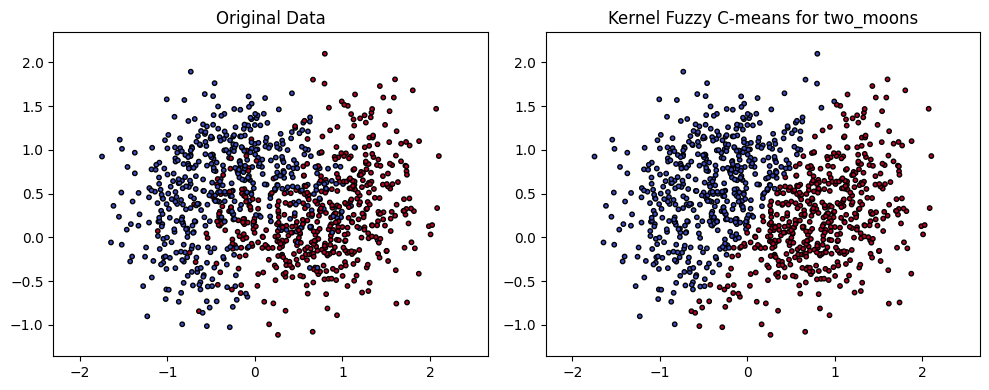


Optimizing kfcm for circles
KKM for circles...
ACC:  0.5246, ARI:  0.0023, NMI: 0.0050, Separation:  0.0415, Compactness:  2.3981, CVNN:  1.2198, DBCV: -0.9725, CVDD:  634.2430


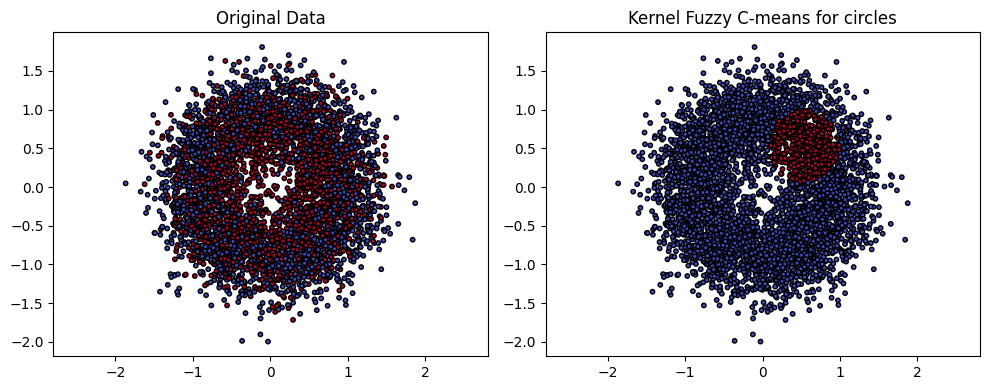


Optimizing kfcm for anisotropic
KKM for anisotropic...
ACC:  0.3125, ARI:  0.0010, NMI: 0.0020, Separation:  0.0334, Compactness:  3.0127, CVNN:  1.5231, DBCV: -0.9823, CVDD:  43.5487


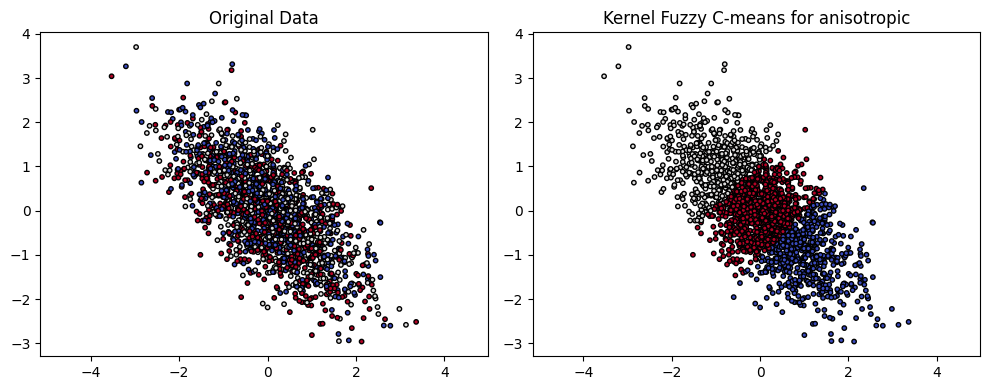


Optimizing kfcm for spiral
KKM for spiral...
ACC:  0.3734, ARI:  0.0200, NMI: 0.0204, Separation:  0.1023, Compactness:  4.0145, CVNN:  2.0584, DBCV: -0.9413, CVDD:  128.1868


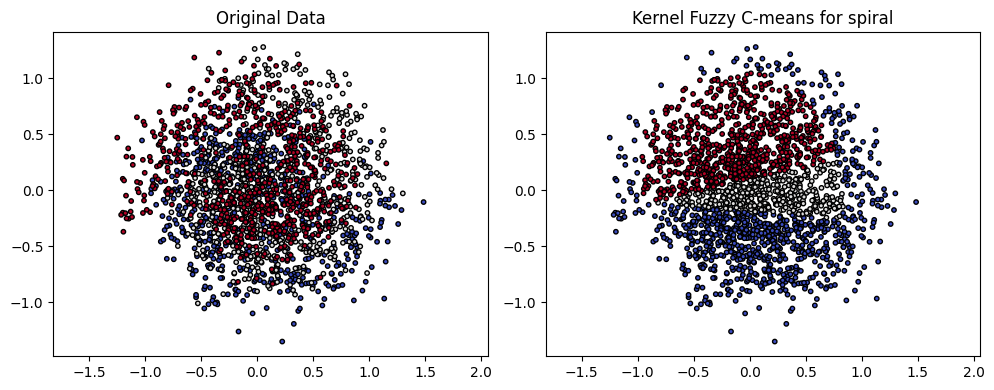


Optimizing kfcm for blobs
KKM for blobs...
ACC:  0.2598, ARI: -0.0002, NMI: 0.0004, Separation:  0.4611, Compactness:  16.1539, CVNN:  8.3075, DBCV: -0.8241, CVDD:  624.1842


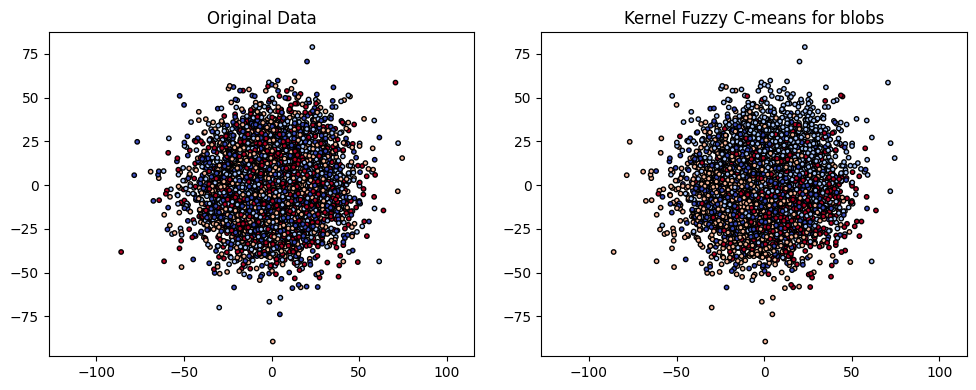

In [ ]:
import os
datasets = {
    'two_moons': (X_moons, y_moons, 4.6415888336127775, 2.7888888888888888, 2),
    'circles': (X_circles, y_circles,0.0774263682681127,3.0, 2),
    'anisotropic': (X_anisotropy, y_anisotropy,4.6415888336127775,1.9444444444444449, 3),
    'spiral': (X_spiral, y_spiral, 0.2154434690031883, 1.5222222222222224, 3),
    'blobs': (X_blobs, y_blobs, 100.0, 2.155555555555556, 4)
}

# Run optimization for each dataset
results = {}
for dataset_name, (X, y, sigma, fuzzy, n_clusters) in datasets.items():
    os.makedirs(f"results/kfcm/{dataset_name}", exist_ok=True)
    directory_path = f"results/kfcm/{dataset_name}"
    print(f"\nOptimizing kfcm for {dataset_name}")
    saved_file = os.path.join(directory_path,"best_result.csv")
    run_kfcm(X, y, sigma, fuzzy, n_clusters, dataset_name, saved_file)

In [ ]:
import pandas as pd
import os

def check_stability_kfcm(X, sigma, fuzzy, n_clusters, n_runs=10, output_dir="stability_results"):
    """
    Check stability of Kernel Fuzzy C-means clustering with the same parameters and save results to files.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances (standardized).
    fuzzy : float
        Optimal value for fuzzy.
    sigma : float
        Optimal value for sigma.
    n_runs : int
        Number of times to run KFCM.
    output_dir : str
        Directory to save clustering results.

    Returns:
    --------
    stability_scores : list of float
        List of ARI scores between each pair of runs.
    is_stable : bool
        True if all ARI scores are 1, indicating stability.
    """
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Run KFCM multiple times and save results
    cluster_results = []
    for run_idx in range(n_runs):
        centers, y_pred, cost = kernel_gfcm(
            X,
            n_clusters=n_clusters,
            sigma=sigma,
            m=fuzzy,
            p=2,  # Set p=2 for Kernel FCM
            max_iter=300,
            n_init=30
          )
        cluster_results.append(y_pred)

        # Save results to CSV
        result_file = os.path.join(output_dir, f"run_{run_idx + 1}.csv")
        pd.DataFrame({"Cluster_Label": y_pred}).to_csv(result_file, index=False)
        print(f"Saved clustering result for run {run_idx + 1} to {result_file}")

    # Calculate ARI between all pairs of runs
    stability_scores = []
    for i in range(n_runs):
        for j in range(i + 1, n_runs):
            ari = adjusted_rand_score(cluster_results[i], cluster_results[j])
            stability_scores.append(ari)

    # Check if all ARI scores are 1
    is_stable = all(score == 1 for score in stability_scores)

    return stability_scores, is_stable

In [ ]:
def check_parameter_sensitivity(X, y_true, best_params, n_clusters, output_file='parameter_sensitivity.csv'):
    """
    Check the sensitivity of the Kernel Fuzzy C-means parameters by slightly modifying them,
    running the clustering, and calculating ARI and NMI over 5 runs.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances.
    y_true : array-like of shape (n_samples,)
        True labels.
    best_params : dict
        The best parameters found for DBSCAN (eps, min_samples).
    output_file : str
        Path to the CSV file where sensitivity results will be saved.
    """
    sigma = best_params['sigma']
    fuzzy = best_params['fuzzy']

    # Create a list of modified values for sensitivity check
    sigma_variations = [sigma + i * 0.0001 for i in range(1, 6)] + [sigma - i * 0.0001 for i in range(1, 6)]
    fuzzy_variations = [fuzzy + i * 0.01 for i in range(1, 6)] + [fuzzy - i * 0.01 for i in range(1, 6)]

    # Open the CSV file for writing results
    with open(output_file, mode='w', newline='') as csvfile:
      writer = csv.writer(csvfile)
      # Write header
      writer.writerow(['sigma', 'fuzzy', 'accuracy', 'silhouette', 'db_score', 's_dbw', 'cvnn', 'ARI', 'NMI'])
      # Standardize the features
      X_scaled = StandardScaler().fit_transform(X)
      for sigma in sigma_variations:
          for fuzzy in fuzzy_variations:
            centers, y_pred, cost = kernel_gfcm(
              X,
              n_clusters=n_clusters,
              sigma=sigma,
              m=fuzzy,
              p=2,  # Set p=2 for Kernel FCM
              max_iter=300,
              n_init=30
            )

            # Calculate cluster centers
            unique_labels = set(label for label in y_pred if label != -1)
            centers = np.zeros((len(unique_labels), X_scaled.shape[1]))
            for i, label in enumerate(unique_labels):
                cluster_points = X_scaled[y_pred == label]
                centers[i] = np.mean(cluster_points, axis=0)

            # Calculate metrics
            acc = accuracy_score(y_true, y_pred)
            sil = silhouette_score(X_scaled, y_pred)
            db = davies_bouldin_score(X_scaled, y_pred)
            s_dbw = calculate_s_dbw(X_scaled, y_pred, centers)
            cvnn = calculate_cvnn_index(X_scaled, y_pred)
            ari = adjusted_rand_score(y_true, y_pred)
            nmi = normalized_mutual_info_score(y_true, y_pred)

            # Write results to the CSV file
            writer.writerow([sigma, fuzzy, acc, sil, db, s_dbw, cvnn, ari, nmi])

    print(f"\nParameter sensitivity results saved to {output_file}")

In [ ]:
def kfcm_main_workflow(X, y_true, dataset_name, directory_path):
    """
    Main workflow for optimizing Kernel Fuzzy C-means, checking stability, and testing parameter sensitivity.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Input dataset.
    y_true : array-like of shape (n_samples,)
        Ground truth labels.
    dataset_name : str
        Name of the dataset.

    Returns:
    --------
    None
    """
    # File paths
    grid_search_file = os.path.join(directory_path,"grid_search_results.csv")
    stability_dir = os.path.join(directory_path,"stability_results")
    sensitivity_file = os.path.join(directory_path,"parameter_sensitivity.csv")

    # Step 1: Optimize KKM and save results
    print("\nStep 1: Optimizing Kernel Fuzzy C-means Parameters...")
    best_params, best_metrics, best_pred = optimize_kernel_fcm(
        X, y_true, dataset_name=dataset_name, output_file=grid_search_file
    )
    if best_params is None:
        print("Optimization failed. Exiting workflow.")
        return

    print(f"\nOptimal Parameters: {best_params}")
    print(f"Best Metrics: {best_metrics}")

    # Step 2: Check Stability and Save Results
    print("\nStep 2: Checking Stability of Optimal Parameters...")
    optimal_sigma = best_params['sigma']
    optimal_fuzzy = best_params['fuzzy']
    n_clusters = len(np.unique(y_true))

    X_scaled = StandardScaler().fit_transform(X)  # Standardize data again
    stability_scores, is_stable = check_stability_kfcm(
        X_scaled, optimal_sigma, optimal_fuzzy, n_clusters, output_dir=stability_dir
    )

    print("\nStability Check Results:")
    print(f"Stability Scores (ARI): {stability_scores}")
    print(f"Is the clustering stable? {'Yes' if is_stable else 'No'}")

    if not is_stable:
        print("Clustering is not stable. Exiting workflow.")
        return

    # Step 3: Check Parameter Sensitivity
    print("\nStep 3: Checking Parameter Sensitivity...")
    check_parameter_sensitivity(
        X, y_true, best_params=best_params, n_clusters=n_clusters, output_file=sensitivity_file
    )
    print(f"Parameter Sensitivity Results saved to {sensitivity_file}")


Optimizing Kernel Fuzzy C-Means for two_moons

Step 1: Optimizing Kernel Fuzzy C-means Parameters...
Optimizing Kernel FCM parameters for two_moons...

Best parameters found:
Sigma: 4.642
m: 2.789
Best accuracy: 0.8390
Silhouette score: 0.3499
Davies-Bouldin score: 1.1790
S_Dbw score: 1.5657
CVNN score: 0.6846


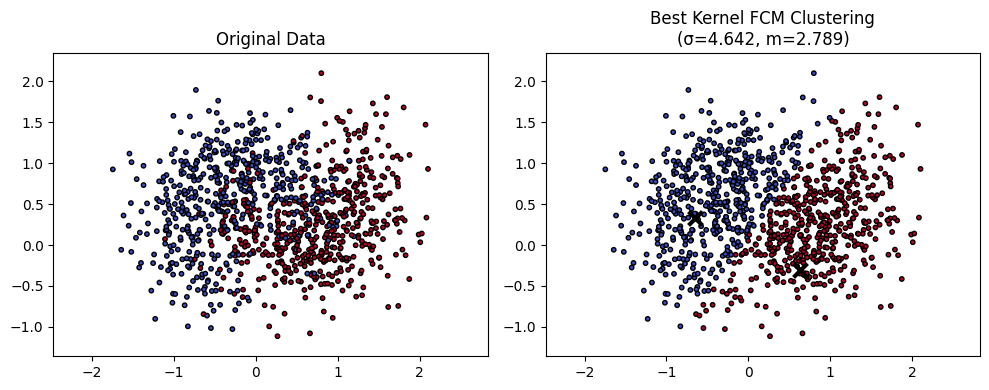


Optimal Parameters: {'sigma': 4.6415888336127775, 'fuzzy': 2.7888888888888888}
Best Metrics: {'accuracy': 0.839, 'silhouette': 0.34986884052030187, 'db_score': 1.1790345779571305, 's_dbw': 1.565747928819326, 'cvnn': 0.6846106510979835, 'ARI': 0.4591426553965275, 'NMI': 0.3633779793261438, 'cost': 12.049243337453238}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/kfcm/two_moons/stability_results/run_1.csv
Saved clustering result for run 2 to results/kfcm/two_moons/stability_results/run_2.csv
Saved clustering result for run 3 to results/kfcm/two_moons/stability_results/run_3.csv
Saved clustering result for run 4 to results/kfcm/two_moons/stability_results/run_4.csv
Saved clustering result for run 5 to results/kfcm/two_moons/stability_results/run_5.csv
Saved clustering result for run 6 to results/kfcm/two_moons/stability_results/run_6.csv
Saved clustering result for run 7 to results/kfcm/two_moons/stability_results/run_7.csv
Saved cluste

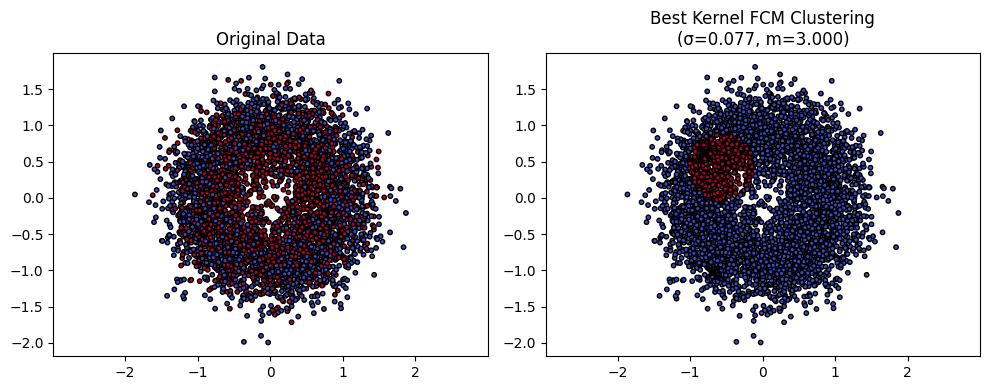


Optimal Parameters: {'sigma': 0.0774263682681127, 'fuzzy': 3.0}
Best Metrics: {'accuracy': 0.52, 'silhouette': 0.06331318878006739, 'db_score': 1.4515463633822063, 's_dbw': 1.3057930361302774, 'cvnn': 0.9179960016992603, 'ARI': 0.001508930136231654, 'NMI': 0.003254868673694112, 'cost': 1240.1708581666192}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/kfcm/circles/stability_results/run_1.csv
Saved clustering result for run 2 to results/kfcm/circles/stability_results/run_2.csv
Saved clustering result for run 3 to results/kfcm/circles/stability_results/run_3.csv
Saved clustering result for run 4 to results/kfcm/circles/stability_results/run_4.csv
Saved clustering result for run 5 to results/kfcm/circles/stability_results/run_5.csv
Saved clustering result for run 6 to results/kfcm/circles/stability_results/run_6.csv
Saved clustering result for run 7 to results/kfcm/circles/stability_results/run_7.csv
Saved clustering result for run 8 to 

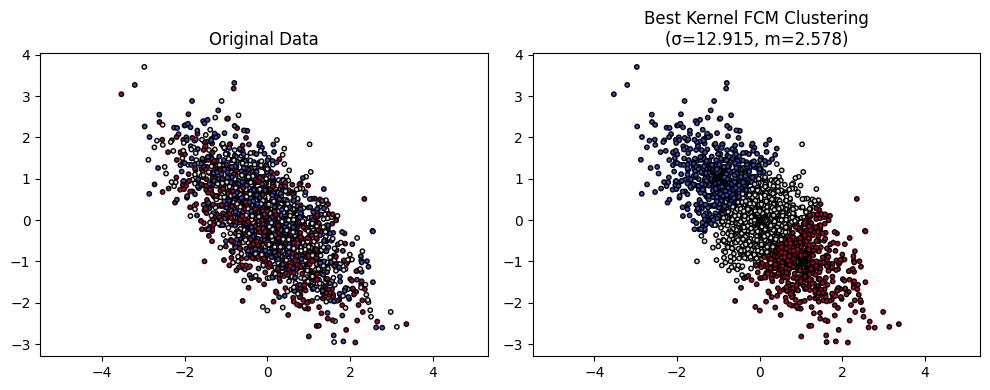


Optimal Parameters: {'sigma': 12.915496650148826, 'fuzzy': 2.577777777777778}
Best Metrics: {'accuracy': 0.3615, 'silhouette': 0.3648953310954661, 'db_score': 0.8953753522448192, 's_dbw': 1.3392957858608483, 'cvnn': 0.7819550538123596, 'ARI': 0.0011744762861578997, 'NMI': 0.0021659114819658435, 'cost': 1.5310499889281035}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/kfcm/anisotropic/stability_results/run_1.csv
Saved clustering result for run 2 to results/kfcm/anisotropic/stability_results/run_2.csv
Saved clustering result for run 3 to results/kfcm/anisotropic/stability_results/run_3.csv
Saved clustering result for run 4 to results/kfcm/anisotropic/stability_results/run_4.csv
Saved clustering result for run 5 to results/kfcm/anisotropic/stability_results/run_5.csv
Saved clustering result for run 6 to results/kfcm/anisotropic/stability_results/run_6.csv
Saved clustering result for run 7 to results/kfcm/anisotropic/stability_results/ru

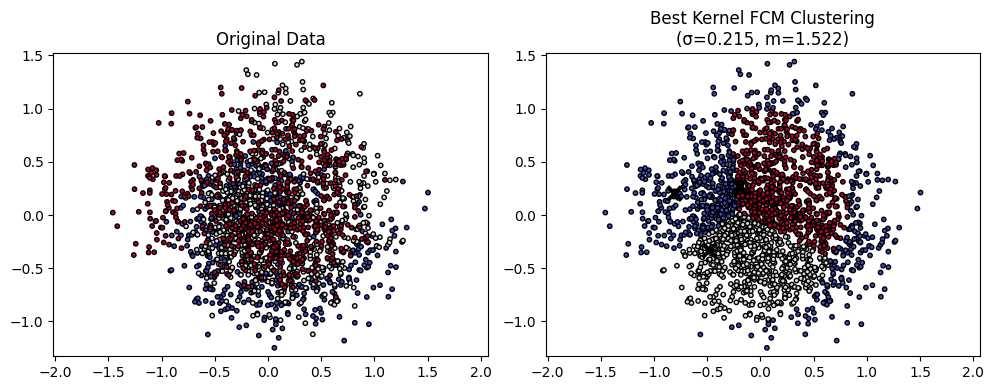


Optimal Parameters: {'sigma': 0.21544346900318834, 'fuzzy': 1.5222222222222224}
Best Metrics: {'accuracy': 0.3918918918918919, 'silhouette': 0.1965078027935064, 'db_score': 3.083972156617675, 's_dbw': 1.7798100922281352, 'cvnn': 1.4094402471342804, 'ARI': 0.00855473460216068, 'NMI': 0.008533324556070667, 'cost': 1035.2042180272733}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/kfcm/spiral/stability_results/run_1.csv
Saved clustering result for run 2 to results/kfcm/spiral/stability_results/run_2.csv
Saved clustering result for run 3 to results/kfcm/spiral/stability_results/run_3.csv
Saved clustering result for run 4 to results/kfcm/spiral/stability_results/run_4.csv
Saved clustering result for run 5 to results/kfcm/spiral/stability_results/run_5.csv
Saved clustering result for run 6 to results/kfcm/spiral/stability_results/run_6.csv
Saved clustering result for run 7 to results/kfcm/spiral/stability_results/run_7.csv
Saved clustering 

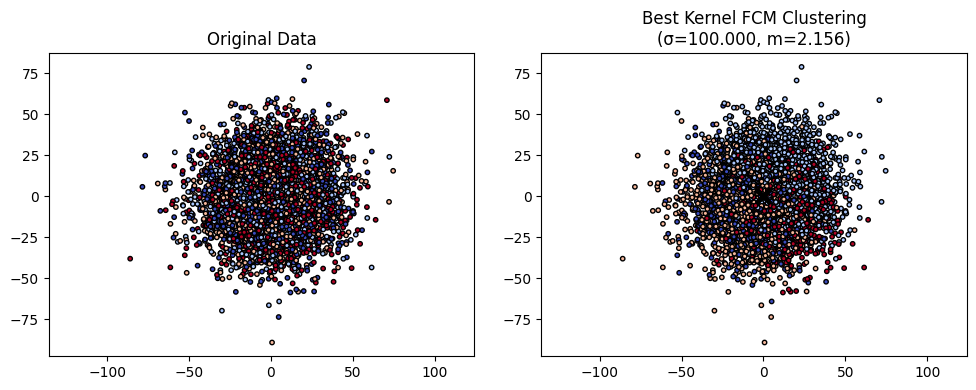


Optimal Parameters: {'sigma': 100.0, 'fuzzy': 2.155555555555556}
Best Metrics: {'accuracy': 0.2634, 'silhouette': 0.04866203791289348, 'db_score': 3.084540547451117, 's_dbw': 1.7730030060210962, 'cvnn': 1.4139139325947938, 'ARI': 0.00017108775283572738, 'NMI': 0.000977465688377093, 'cost': 0.5036126771055347}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/kfcm/blobs/stability_results/run_1.csv
Saved clustering result for run 2 to results/kfcm/blobs/stability_results/run_2.csv
Saved clustering result for run 3 to results/kfcm/blobs/stability_results/run_3.csv
Saved clustering result for run 4 to results/kfcm/blobs/stability_results/run_4.csv
Saved clustering result for run 5 to results/kfcm/blobs/stability_results/run_5.csv
Saved clustering result for run 6 to results/kfcm/blobs/stability_results/run_6.csv
Saved clustering result for run 7 to results/kfcm/blobs/stability_results/run_7.csv
Saved clustering result for run 8 to results/kf

In [ ]:
import os
import csv
datasets = {
    'two_moons': (X_moons, y_moons),
    'circles': (X_circles, y_circles),
    'anisotropic': (X_anisotropy, y_anisotropy),
    'spiral': (X_spiral, y_spiral),
    'blobs': (X_blobs, y_blobs)
}

# Run optimization for each dataset
results = {}
for dataset_name, (X, y) in datasets.items():
    os.makedirs(f"results/kfcm/{dataset_name}", exist_ok=True)
    directory_path = f"results/kfcm/{dataset_name}"
    print(f"\nOptimizing Kernel Fuzzy C-Means for {dataset_name}")
    kfcm_main_workflow(X, y, dataset_name, directory_path)

In [ ]:
import pandas as pd
import json
import os
import numpy as np
import matplotlib.pyplot as plt


def summarize_all_results(
    results_config,
    output_file='all_algorithms_datasets_summary.csv',
    sensitivity_threshold=0.05
):
    """
    Summarize results from multiple datasets and algorithms into a single CSV file,
    calculate parameter sensitivity, and save the results.

    Parameters:
    -----------
    results_config : list of dict
        Each dictionary should contain:
            - 'algorithm': Name of the algorithm (e.g., 'DBSCAN').
            - 'dataset': Name of the dataset.
            - 'grid_search_file': Path to the grid search results file.
            - 'stability_dir': Path to the directory with stability results.
            - 'sensitivity_file': Path to the parameter sensitivity results file.
    output_file : str
        Path to the consolidated summary CSV file.
    sensitivity_threshold : float, default=0.05
        Threshold for standard deviation to determine if there is sensitivity.
    """
    summary_rows = []

    for config in results_config:
        algorithm = config['algorithm']
        dataset = config['dataset']
        grid_search_file = config['grid_search_file']
        stability_dir = config['stability_dir']
        sensitivity_file = config['sensitivity_file']
        plot_directory = config['plot_directory']

        summary = {
            'algorithm': algorithm,
            'dataset': dataset,
            'grid_search_iterations': None,
            'best_parameters': None,
            'accuracy': None,
            'silhouette': None,
            'db_score': None,
            's_dbw': None,
            'cvnn': None,
            'ARI': None,
            'NMI': None,
            'stabilityScore': None,
            'sensitivity_iterations': None,
            'paramsSensible': None,
        }

        # Step 1: Read the grid search results
        try:
            grid_search_df = pd.read_csv(grid_search_file)
            summary['grid_search_iterations'] = len(grid_search_df)
            best_row = grid_search_df.iloc[grid_search_df['accuracy'].idxmax()]
            summary['best_parameters'] = json.dumps({
                'sigma': best_row['sigma'],
                'fuzzy': best_row['fuzzy']
            })
            summary['accuracy'] = best_row['accuracy'].round(4)
            summary['silhouette'] = best_row['silhouette'].round(4)
            summary['db_score'] = best_row['db_score'].round(4)
            summary['s_dbw'] = best_row['s_dbw'].round(4)
            summary['cvnn'] = best_row['cvnn'].round(4)
            summary['ARI'] = best_row['ARI'].round(4)
            summary['NMI'] = best_row['NMI'].round(4)
        except Exception as e:
            print(f"Error reading grid search file for {dataset} ({algorithm}): {e}")

        # Step 2: Read stability results
        try:
            stability_scores = []
            for file in os.listdir(stability_dir):
                if file.endswith(".csv"):
                    run_data = pd.read_csv(os.path.join(stability_dir, file))
                    stability_scores.append(run_data['Cluster_Label'].values)

            stability_ari_scores = [
                adjusted_rand_score(stability_scores[i], stability_scores[j])
                for i in range(len(stability_scores))
                for j in range(i + 1, len(stability_scores))
            ]
            summary['stabilityScore'] = sum(stability_ari_scores) / len(stability_ari_scores) if stability_ari_scores else None
        except Exception as e:
            print(f"Error reading stability results for {dataset} ({algorithm}): {e}")

        # Step 3: Read parameter sensitivity results (focus on ARI)
        try:
            sensitivity_df = pd.read_csv(sensitivity_file)
            summary['sensitivity_iterations'] = len(sensitivity_df)
            ari_values = sensitivity_df['ARI'].values.tolist()

            # Check for parameter sensitivity (standard deviation of ARI)
            ari_std = np.std(ari_values)
            summary['paramsSensible'] = ari_std
            print('ARI standard deviation: ', ari_std)

            # Box plot visualization
            plt.figure(figsize=(8, 6))
            plt.boxplot(ari_values)
            plt.title(f"ARI Values for Sensitivity Check - {algorithm} on {dataset}")
            plt.xlabel("Sensitivity Iterations")
            plt.ylabel("ARI")
            plt.grid(True)
            plt.savefig(f"{plot_directory}/{dataset}_{algorithm}_sensitivity_boxplot.png")
            plt.close()
        except Exception as e:
            print(f"Error reading sensitivity file for {dataset} ({algorithm}): {e}")

        # Append the summary row
        summary_rows.append(summary)

    # Step 4: Write all summaries to a single CSV file
    try:
        pd.DataFrame(summary_rows).to_csv(output_file, index=False)
        print(f"Consolidated summary written to {output_file}")
    except Exception as e:
        print(f"Error writing consolidated summary file: {e}")

In [ ]:
datasets = {
    'two_moons': (X_moons, y_moons),
    'circles': (X_circles, y_circles),
    'anisotropic': (X_anisotropy, y_anisotropy),
    'spiral': (X_spiral, y_spiral),
    'blobs': (X_blobs, y_blobs)
}

results_config = []
for dataset_name, (X, y) in datasets.items():
  directory_path = f"results/kfcm/{dataset_name}"
  results_config.append({
      'algorithm': 'Kernel Fuzzy C-means',
      'dataset': dataset_name,
      'grid_search_file': f"{directory_path}/grid_search_results.csv",
      'stability_dir': f"{directory_path}/stability_results",
      'sensitivity_file': f"{directory_path}/parameter_sensitivity.csv",
      'plot_directory': f"results/kfcm/plot"
  })

summarize_all_results(results_config, output_file='results/kfcm/kfcm_summary_results.csv')

datasets = {
    'two_moons': (X_moons, y_moons),
    'circles': (X_circles, y_circles),
    'anisotropic': (X_anisotropy, y_anisotropy),
    'spiral': (X_spiral, y_spiral),
    'blobs': (X_blobs, y_blobs)
}

ARI standard deviation:  0.0009433240331256031
Error reading sensitivity file for circles (Kernel Fuzzy C-means): [Errno 2] No such file or directory: 'results/kfcm/circles/parameter_sensitivity.csv'
ARI standard deviation:  3.5655709088728635e-05
Error reading sensitivity file for spiral (Kernel Fuzzy C-means): [Errno 2] No such file or directory: 'results/kfcm/spiral/parameter_sensitivity.csv'
Error reading sensitivity file for blobs (Kernel Fuzzy C-means): [Errno 2] No such file or directory: 'results/kfcm/blobs/parameter_sensitivity.csv'
Consolidated summary written to results/kfcm/kfcm_summary_results.csv


### **Spectral Clustering**

In [ ]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics import accuracy_score, silhouette_score, davies_bouldin_score, adjusted_rand_score, normalized_mutual_info_score
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt

def optimize_spectral(X, y_true, dataset_name='two_moons', output_file='grid_search_results.csv'):
    """
    Find optimal Spectral Clustering parameters using grid search.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances
    y_true : array-like of shape (n_samples,)
        True labels
    dataset_name : str
        Name of the dataset for printing
    """
    # Define parameter ranges to search
    gamma_range = np.logspace(-3, 2, 20)  # from 0.001 to 100
    n_clusters = len(np.unique(y_true))

    best_score = 0
    best_params = None
    best_pred = None
    best_metrics = None
    best_model = None

    # Standardize the features
    X_scaled = StandardScaler().fit_transform(X)

    print(f"Optimizing Spectral Clustering parameters for {dataset_name}...")

    # Open the CSV file for writing results
    with open(output_file, mode='w', newline='') as csvfile:
      writer = csv.writer(csvfile)
      # Write header
      writer.writerow(['dataset', 'gamma', 'accuracy', 'silhouette', 'db_score', 's_dbw', 'cvnn', 'ARI', 'NMI'])
      for gamma in gamma_range:
          try:
              # Initialize and fit Spectral Clustering
              sp = SpectralClustering(
                  n_clusters=n_clusters,
                  gamma=gamma,
                  affinity='rbf',
                  random_state=42
              )

              # Fit and predict
              y_pred = sp.fit_predict(X_scaled)

              # Calculate cluster centers
              centers = np.array([
                  np.mean(X_scaled[y_pred == i], axis=0)
                  for i in range(n_clusters)
              ])

              # Calculate metrics
              if len(np.unique(y_pred)) > 1:
                  acc = accuracy_score(y_true, y_pred)
                  sil = silhouette_score(X_scaled, y_pred)
                  db = davies_bouldin_score(X_scaled, y_pred)
                  s_dbw = calculate_s_dbw(X_scaled, y_pred, centers)
                  cvnn = calculate_cvnn_index(X_scaled, y_pred)
                  ari = adjusted_rand_score(y_true, y_pred)
                  nmi = normalized_mutual_info_score(y_true, y_pred)

                  # Write results to the CSV file
                  writer.writerow([dataset_name, gamma, acc, sil, db, s_dbw, cvnn, ari, nmi])

                  # Update best parameters if we found better accuracy
                  if acc > best_score:
                      best_score = acc
                      best_params = {'gamma': gamma}
                      best_pred = y_pred
                      best_model = sp
                      best_metrics = {
                          'accuracy': acc,
                          'silhouette': sil,
                          'db_score': db,
                          's_dbw': s_dbw,
                          'cvnn': cvnn,
                          'ARI': ari,
                          'NMI': nmi
                      }

          except Exception as e:
              print(f"Error with gamma={gamma}: {str(e)}")
              continue

    if best_params is None:
        print("\nNo valid clustering results found. Try different parameter ranges.")
        return None, None, None, None

    print("\nBest parameters found:")
    print(f"Gamma: {best_params['gamma']:.3f}")
    print(f"Best accuracy: {best_metrics['accuracy']:.4f}")
    print(f"Silhouette score: {best_metrics['silhouette']:.4f}")
    print(f"Davies-Bouldin score: {best_metrics['db_score']:.4f}")
    print(f"S_Dbw score: {best_metrics['s_dbw']:.4f}")
    print(f"CVNN score: {best_metrics['cvnn']:.4f}")

    # Plot results with best parameters
    plt.figure(figsize=(10, 4))

    # Original data
    plt.subplot(121)
    plt.scatter(X[:, 0], X[:, 1], c=y_true, cmap='coolwarm', s=10, edgecolor='k')
    plt.title("Original Data")
    plt.axis('equal')

    # Best clustering result
    plt.subplot(122)
    plt.scatter(X[:, 0], X[:, 1], c=best_pred, cmap='coolwarm', s=10, edgecolor='k')
    plt.title(f"Best Spectral Clustering\n(γ={best_params['gamma']:.3f})")
    plt.axis('equal')

    plt.tight_layout()
    plt.show()

    return best_params, best_metrics, best_pred

In [ ]:
from sklearn.cluster import SpectralClustering
from sklearn.preprocessing import StandardScaler
import numpy as np
import csv
import matplotlib.pyplot as plt

def run_spectral(X, y_true, gamma, n_clusters, dataset_name='dataset', output_file='best_result.csv'):
    """
    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances.
    y_true : array-like of shape (n_samples,)
        True labels.
    dataset_name : str
        Name of the dataset for printing/logging.
    output_file : str
        Path to the CSV file where results will be saved.
    """

    # Standardize the features
    X_scaled = StandardScaler().fit_transform(X)

    # Open the CSV file for writing results
    with open(output_file, mode='w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        # Write header
        writer.writerow(['dataset', 'gamma', 'accuracy', 'ari', 'nmi', 'sep', 'com', 'cvnn', 'dbcv', 'cvdd'])
        # Initialize and fit Spectral Clustering
        sp = SpectralClustering(
            n_clusters=n_clusters,
            gamma=gamma,
            affinity='rbf',
            random_state=42
        )

        # Fit and predict
        y_pred = sp.fit_predict(X_scaled)

        # Calculate metrics
        acc = accuracy_score(y_true, y_pred)
        sep, com, cvnn = calculate_cvnn_index(X_scaled, y_pred)
        cvdd = cvdd_cal(X_scaled, y_pred)
        dbcv = dbcv_cal(X_scaled, y_pred)
        ari = adjusted_rand_score(y_true, y_pred)
        nmi = normalized_mutual_info_score(y_true, y_pred)

        print(f"ACC: {acc: .4f}, ARI: {ari: .4f}, NMI:{nmi : .4f}, Separation: {sep : .4f}, Compactness: {com : .4f}, CVNN: {cvnn : .4f}, DBCV: {dbcv : .4f}, CVDD: {cvdd : .4f}")

        # Write results to the CSV file
        writer.writerow([dataset_name, kernel, gamma, acc, ari, nmi, sep, com, cvnn, dbcv, cvdd])

        # Plot results with best parameters
        plt.figure(figsize=(10, 4))

        # Original data
        plt.subplot(121)
        plt.scatter(X[:, 0], X[:, 1], c=y_true, cmap='coolwarm', s=10, edgecolor='k')
        plt.title("Original Data")
        plt.axis('equal')

        # Best clustering result
        plt.subplot(122)
        plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='coolwarm', s=10, edgecolor='k')
        plt.title(f"Spectral Clustering for {dataset_name}")
        plt.axis('equal')

        plt.tight_layout()
        plt.show()

        return y_pred


Optimizing spectral for two_moons
ACC:  0.8420, ARI:  0.4673, NMI: 0.3705, Separation:  0.0325, Compactness:  2.7882, CVNN:  1.4103, DBCV: -0.9436, CVDD:  221.4478


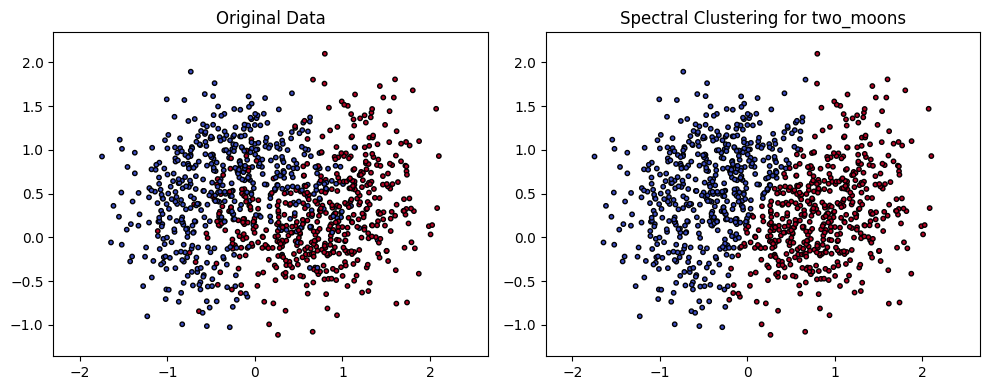


Optimizing spectral for circles
ACC:  0.5058, ARI: -0.0001, NMI: 0.0001, Separation:  0.0112, Compactness:  2.7789, CVNN:  1.3951, DBCV: -0.9800, CVDD:  826.2612


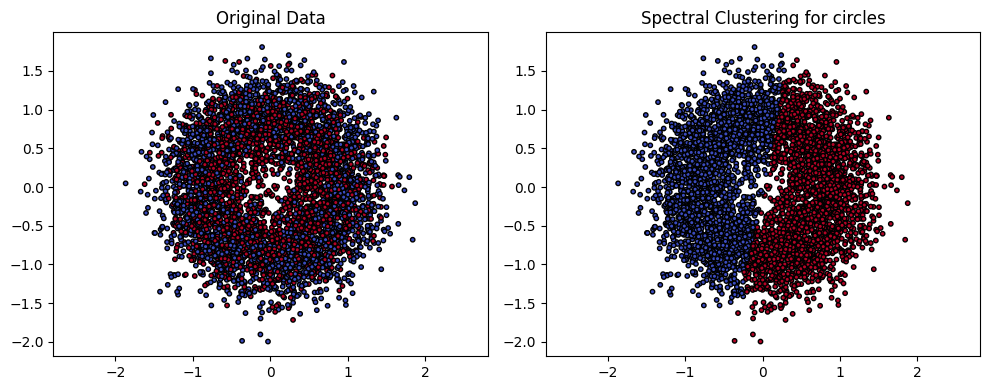


Optimizing spectral for anisotropic
ACC:  0.3535, ARI:  0.0047, NMI: 0.0053, Separation:  0.0533, Compactness:  3.4159, CVNN:  1.7346, DBCV: -0.9855, CVDD:  67.1384


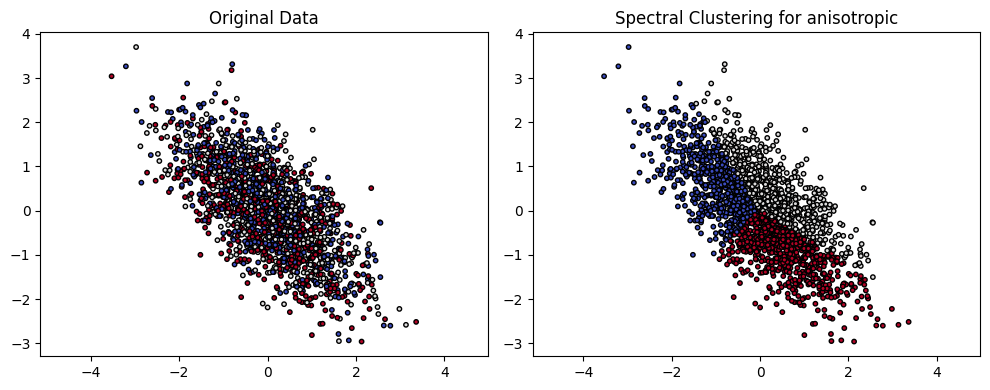


Optimizing spectral for spiral
ACC:  0.3509, ARI:  0.0110, NMI: 0.0132, Separation:  0.0394, Compactness:  3.4964, CVNN:  1.7679, DBCV: -0.9590, CVDD:  321.4512


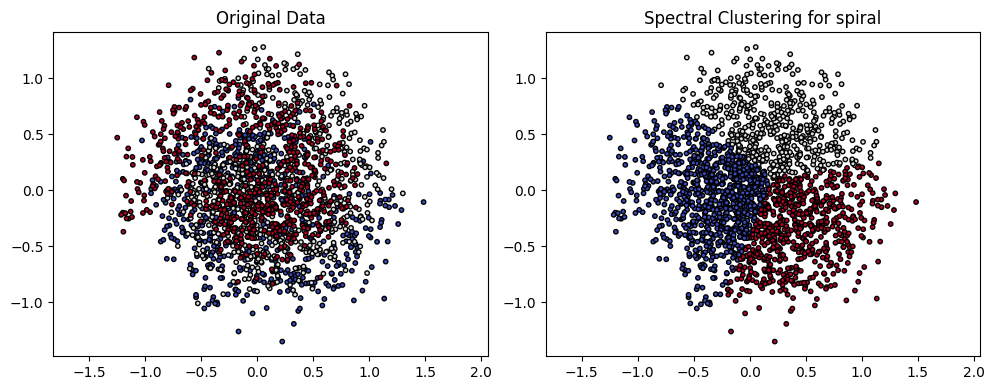


Optimizing spectral for blobs
ACC:  0.2498, ARI: -0.0001, NMI: 0.0005, Separation:  0.3338, Compactness:  16.0601, CVNN:  8.1970, DBCV: -0.8146, CVDD:  635.9338


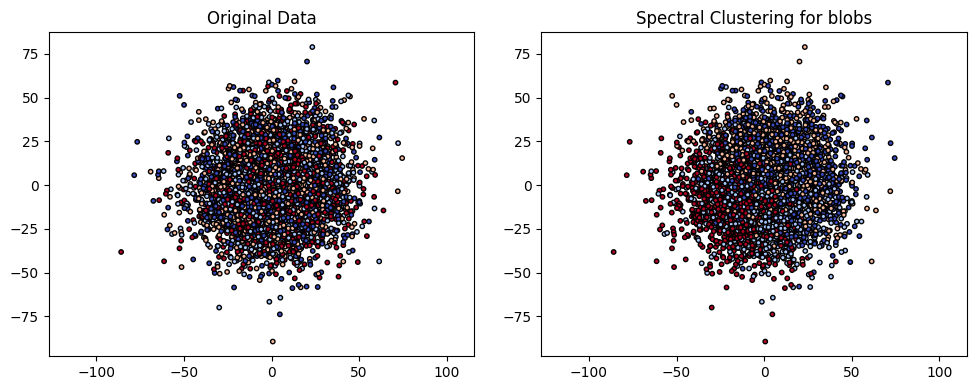

In [ ]:
import os
datasets = {
    'two_moons': (X_moons, y_moons, 1.438449888287663, 2),
    'circles': (X_circles, y_circles, 54.55594781168514, 2),
    'anisotropic': (X_anisotropy, y_anisotropy, 0.0018329807108324, 3),
    'spiral': (X_spiral, y_spiral, 0.4281332398719391, 3),
    'blobs': (X_blobs, y_blobs, 0.01, 4)
}

# Run optimization for each dataset
results = {}
for dataset_name, (X, y, gamma, n_clusters) in datasets.items():
    os.makedirs(f"results/spectral/{dataset_name}", exist_ok=True)
    directory_path = f"results/spectral/{dataset_name}"
    print(f"\nOptimizing spectral for {dataset_name}")
    saved_file = os.path.join(directory_path,"best_result.csv")
    run_spectral(X, y, gamma, n_clusters, dataset_name, saved_file)

In [ ]:
import pandas as pd
import os

def check_stability_spectral(X, gamma, n_clusters, n_runs=10, output_dir="stability_results"):
    """
    Check stability of Spectral clustering with the same parameters and save results to files.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances (standardized).
    gamma : float
        Optimal value for gamma.
    n_runs : int
        Number of times to run DBSCAN.
    output_dir : str
        Directory to save clustering results.

    Returns:
    --------
    stability_scores : list of float
        List of ARI scores between each pair of runs.
    is_stable : bool
        True if all ARI scores are 1, indicating stability.
    """
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Run Spectral Clustering multiple times and save results
    cluster_results = []
    sp = SpectralClustering(
          n_clusters=n_clusters,
          gamma=gamma,
          affinity='rbf',
          random_state=42
      )
    for run_idx in range(n_runs):
        y_pred = sp.fit_predict(X)
        cluster_results.append(y_pred)

        # Save results to CSV
        result_file = os.path.join(output_dir, f"run_{run_idx + 1}.csv")
        pd.DataFrame({"Cluster_Label": y_pred}).to_csv(result_file, index=False)
        print(f"Saved clustering result for run {run_idx + 1} to {result_file}")

    # Calculate ARI between all pairs of runs
    stability_scores = []
    for i in range(n_runs):
        for j in range(i + 1, n_runs):
            ari = adjusted_rand_score(cluster_results[i], cluster_results[j])
            stability_scores.append(ari)

    # Check if all ARI scores are 1
    is_stable = all(score == 1 for score in stability_scores)

    return stability_scores, is_stable

In [ ]:
def check_parameter_sensitivity(X, y_true, best_params, n_clusters, output_file='parameter_sensitivity.csv'):
    """
    Check the sensitivity of the Spectral Clustering parameters (gamma) by slightly modifying them,
    running the clustering, and calculating ARI and NMI over 5 runs.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances.
    y_true : array-like of shape (n_samples,)
        True labels.
    best_params : dict
        The best parameters found for Spectral Clustering parameters (gamma).
    output_file : str
        Path to the CSV file where sensitivity results will be saved.
    """
    gamma = best_params['gamma']

    # Create a list of modified gamma values for sensitivity check
    gamma_variations = [gamma + i * 0.0001 for i in range(1, 6)] + [gamma - i * 0.0001 for i in range(1, 6)]

    # Open the CSV file for writing results
    with open(output_file, mode='w', newline='') as csvfile:
      writer = csv.writer(csvfile)
      # Write header
      writer.writerow(['gamma', 'accuracy', 'silhouette', 'db_score', 's_dbw', 'cvnn', 'ARI', 'NMI'])

      # Run 5 times with small variations in gamma
      for gamma_mod in gamma_variations:
          # Initialize and fit DBSCAN with modified parameters
          sp = SpectralClustering(
                  n_clusters=n_clusters,
                  gamma=gamma,
                  affinity='rbf',
                  random_state=42
              )
          X_scaled = StandardScaler().fit_transform(X)
          y_pred = sp.fit_predict(X_scaled)

          # Skip if all points are noise (-1) or in one cluster
          n_clusters = len(set(y_pred)) - (1 if -1 in y_pred else 0)
          if n_clusters <= 1:
              continue

          unique_labels = set(label for label in y_pred if label != -1)

          # Calculate cluster centers
          centers = np.zeros((len(unique_labels), X_scaled.shape[1]))
          for i, label in enumerate(unique_labels):
              cluster_points = X_scaled[y_pred == label]
              centers[i] = np.mean(cluster_points, axis=0)

          # Calculate metrics
          acc = accuracy_score(y_true, y_pred)
          sil = silhouette_score(X_scaled, y_pred)
          db = davies_bouldin_score(X_scaled, y_pred)
          s_dbw = calculate_s_dbw(X_scaled, y_pred, centers)
          cvnn = calculate_cvnn_index(X_scaled, y_pred)
          ari = adjusted_rand_score(y_true, y_pred)
          nmi = normalized_mutual_info_score(y_true, y_pred)

          # Write results to the CSV file
          writer.writerow([gamma_mod, acc, sil, db, s_dbw, cvnn, ari, nmi])

    print(f"\nParameter sensitivity results saved to {output_file}")

In [ ]:
def spectral_main_workflow(X, y_true, dataset_name, directory_path):
    """
    Main workflow for optimizing Spectral Clustering, checking stability, and testing parameter sensitivity.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Input dataset.
    y_true : array-like of shape (n_samples,)
        Ground truth labels.
    dataset_name : str
        Name of the dataset.

    Returns:
    --------
    None
    """
    # File paths
    grid_search_file = os.path.join(directory_path,"grid_search_results.csv")
    stability_dir = os.path.join(directory_path,"stability_results")
    sensitivity_file = os.path.join(directory_path,"parameter_sensitivity.csv")

    # Step 1: Optimize SC and save results
    print("\nStep 1: Optimizing Spectral Clustering Parameters...")
    best_params, best_metrics, best_pred = optimize_spectral(
        X, y_true, dataset_name=dataset_name, output_file=grid_search_file
    )
    if best_params is None:
        print("Optimization failed. Exiting workflow.")
        return

    print(f"\nOptimal Parameters: {best_params}")
    print(f"Best Metrics: {best_metrics}")

    # Step 2: Check Stability and Save Results
    print("\nStep 2: Checking Stability of Optimal Parameters...")
    optimal_gamma = best_params['gamma']
    n_clusters = len(np.unique(y_true))

    X_scaled = StandardScaler().fit_transform(X)  # Standardize data again
    stability_scores, is_stable = check_stability_spectral(
        X_scaled, optimal_gamma, n_clusters, output_dir=stability_dir
    )

    print("\nStability Check Results:")
    print(f"Stability Scores (ARI): {stability_scores}")
    print(f"Is the clustering stable? {'Yes' if is_stable else 'No'}")

    if not is_stable:
        print("Clustering is not stable. Exiting workflow.")
        return

    # Step 3: Check Parameter Sensitivity
    print("\nStep 3: Checking Parameter Sensitivity...")
    check_parameter_sensitivity(
        X, y_true, best_params=best_params, n_clusters=n_clusters, output_file=sensitivity_file
    )
    print(f"Parameter Sensitivity Results saved to {sensitivity_file}")


Optimizing Spectral Clustering for two_moons

Step 1: Optimizing Spectral Clustering Parameters...
Optimizing Spectral Clustering parameters for two_moons...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited at iteration 919 with accuracies 
[3.28556357e-15 1.88663300e-05 1.42233435e-05]
not reaching the requested tolerance 1.4901161193847656e-05.
Use iteration 870 instead with accuracy 
1.0914411872760965e-05.

  _, diffusion_map = lobpcg(
/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_spectral_embedding.py:455: UserWarning: Exited postprocessing with accuracies 
[3.56212864e-15 1.68364180e-05 1.59067855e-05]
not reaching the requested tolerance 1.4901161193847656e-05.
  _, diffusion_map = lobpcg(



Best parameters found:
Gamma: 1.438
Best accuracy: 0.8420
Silhouette score: 0.3512
Davies-Bouldin score: 1.1756
S_Dbw score: 1.5727
CVNN score: 0.6296


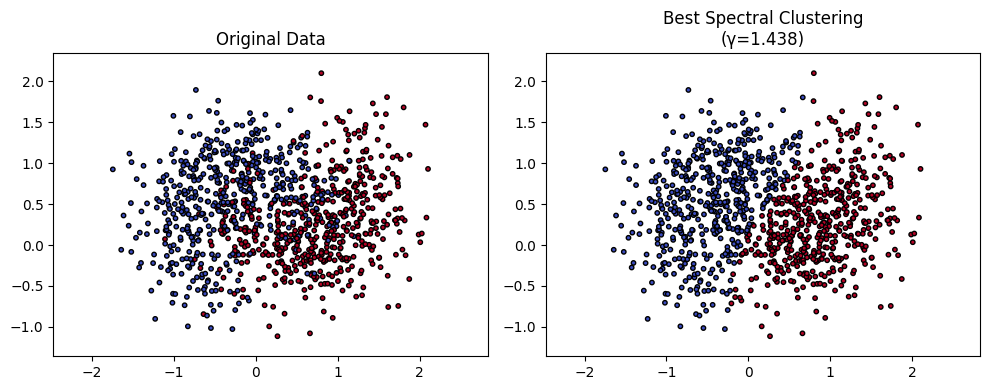


Optimal Parameters: {'gamma': 1.438449888287663}
Best Metrics: {'accuracy': 0.842, 'silhouette': 0.35117100242592164, 'db_score': 1.1756036457590966, 's_dbw': 1.5726853850477767, 'cvnn': 0.629586180776731, 'ARI': 0.4673227981190734, 'NMI': 0.37050890759441274}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/spectral/two_moons/stability_results/run_1.csv
Saved clustering result for run 2 to results/spectral/two_moons/stability_results/run_2.csv
Saved clustering result for run 3 to results/spectral/two_moons/stability_results/run_3.csv
Saved clustering result for run 4 to results/spectral/two_moons/stability_results/run_4.csv
Saved clustering result for run 5 to results/spectral/two_moons/stability_results/run_5.csv
Saved clustering result for run 6 to results/spectral/two_moons/stability_results/run_6.csv
Saved clustering result for run 7 to results/spectral/two_moons/stability_results/run_7.csv
Saved clustering result for run 8 to resu

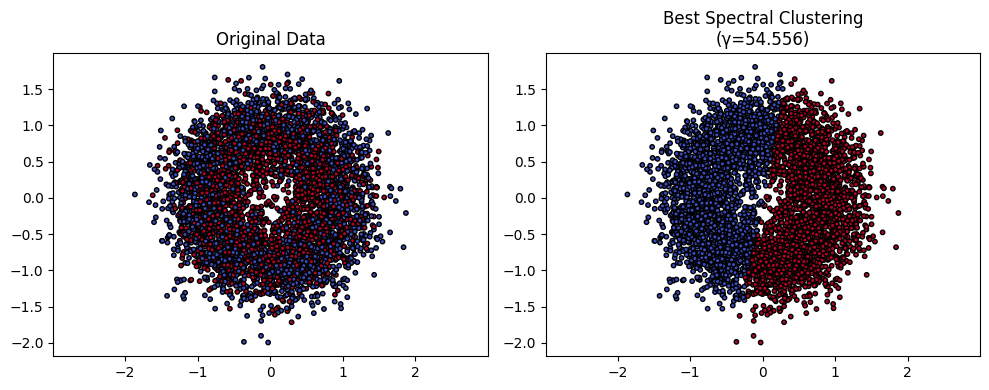


Optimal Parameters: {'gamma': 54.555947811685144}
Best Metrics: {'accuracy': 0.5058, 'silhouette': 0.3612803835857466, 'db_score': 1.1823739482876119, 's_dbw': 1.5426610143099893, 'cvnn': 0.5872418999049493, 'ARI': -6.547309993051021e-05, 'NMI': 9.707990950849907e-05}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/spectral/circles/stability_results/run_1.csv
Saved clustering result for run 2 to results/spectral/circles/stability_results/run_2.csv
Saved clustering result for run 3 to results/spectral/circles/stability_results/run_3.csv
Saved clustering result for run 4 to results/spectral/circles/stability_results/run_4.csv
Saved clustering result for run 5 to results/spectral/circles/stability_results/run_5.csv
Saved clustering result for run 6 to results/spectral/circles/stability_results/run_6.csv
Saved clustering result for run 7 to results/spectral/circles/stability_results/run_7.csv
Saved clustering result for run 8 to results/sp

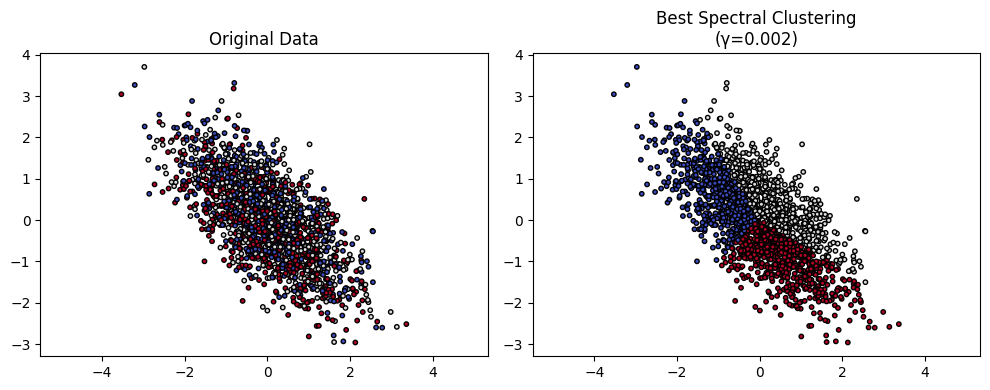


Optimal Parameters: {'gamma': 0.0018329807108324356}
Best Metrics: {'accuracy': 0.3535, 'silhouette': 0.2734137161185495, 'db_score': 1.138091069507314, 's_dbw': 1.4391016574693138, 'cvnn': 1.066391932219397, 'ARI': 0.004692169827883066, 'NMI': 0.005330075828922603}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/spectral/anisotropic/stability_results/run_1.csv
Saved clustering result for run 2 to results/spectral/anisotropic/stability_results/run_2.csv
Saved clustering result for run 3 to results/spectral/anisotropic/stability_results/run_3.csv
Saved clustering result for run 4 to results/spectral/anisotropic/stability_results/run_4.csv
Saved clustering result for run 5 to results/spectral/anisotropic/stability_results/run_5.csv
Saved clustering result for run 6 to results/spectral/anisotropic/stability_results/run_6.csv
Saved clustering result for run 7 to results/spectral/anisotropic/stability_results/run_7.csv
Saved clustering resu

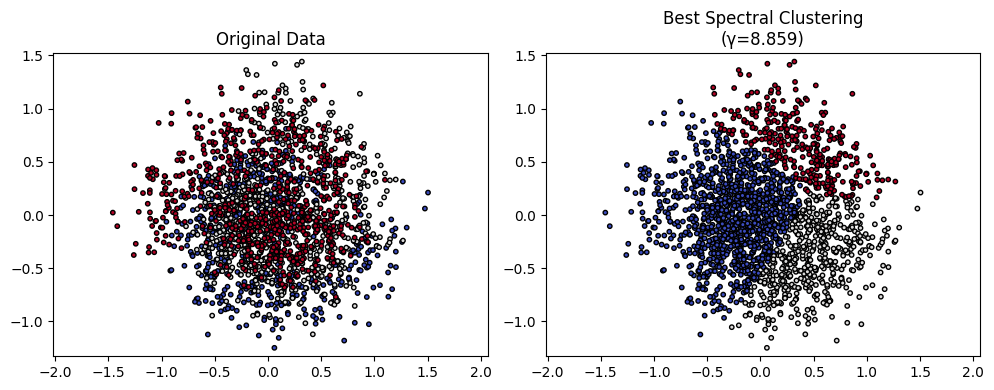


Optimal Parameters: {'gamma': 8.858667904100823}
Best Metrics: {'accuracy': 0.3833833833833834, 'silhouette': 0.3367620300025404, 'db_score': 0.9365713499156468, 's_dbw': 1.257644737729268, 'cvnn': 1.0489886266471555, 'ARI': 0.017353825829075686, 'NMI': 0.03365143714993587}

Step 2: Checking Stability of Optimal Parameters...
Saved clustering result for run 1 to results/spectral/spiral/stability_results/run_1.csv
Saved clustering result for run 2 to results/spectral/spiral/stability_results/run_2.csv
Saved clustering result for run 3 to results/spectral/spiral/stability_results/run_3.csv
Saved clustering result for run 4 to results/spectral/spiral/stability_results/run_4.csv
Saved clustering result for run 5 to results/spectral/spiral/stability_results/run_5.csv
Saved clustering result for run 6 to results/spectral/spiral/stability_results/run_6.csv
Saved clustering result for run 7 to results/spectral/spiral/stability_results/run_7.csv
Saved clustering result for run 8 to results/spe

KeyboardInterrupt: 

In [ ]:
import os
import csv
datasets = {
    'two_moons': (X_moons, y_moons),
    'circles': (X_circles, y_circles),
    'anisotropic': (X_anisotropy, y_anisotropy),
    'spiral': (X_spiral, y_spiral),
    'blobs': (X_blobs, y_blobs)
}

# Run optimization for each dataset
results = {}
for dataset_name, (X, y) in datasets.items():
    os.makedirs(f"results/spectral/{dataset_name}", exist_ok=True)
    directory_path = f"results/spectral/{dataset_name}"
    print(f"\nOptimizing Spectral Clustering for {dataset_name}")
    spectral_main_workflow(X, y, dataset_name, directory_path)

In [ ]:
import pandas as pd
import json
import os
import numpy as np
import matplotlib.pyplot as plt


def summarize_all_results(
    results_config,
    output_file='all_algorithms_datasets_summary.csv',
    sensitivity_threshold=0.05
):
    """
    Summarize results from multiple datasets and algorithms into a single CSV file,
    calculate parameter sensitivity, and save the results.

    Parameters:
    -----------
    results_config : list of dict
        Each dictionary should contain:
            - 'algorithm': Name of the algorithm (e.g., 'DBSCAN').
            - 'dataset': Name of the dataset.
            - 'grid_search_file': Path to the grid search results file.
            - 'stability_dir': Path to the directory with stability results.
            - 'sensitivity_file': Path to the parameter sensitivity results file.
    output_file : str
        Path to the consolidated summary CSV file.
    sensitivity_threshold : float, default=0.05
        Threshold for standard deviation to determine if there is sensitivity.
    """
    summary_rows = []

    for config in results_config:
        algorithm = config['algorithm']
        dataset = config['dataset']
        grid_search_file = config['grid_search_file']
        stability_dir = config['stability_dir']
        sensitivity_file = config['sensitivity_file']
        plot_directory = config['plot_directory']

        summary = {
            'algorithm': algorithm,
            'dataset': dataset,
            'grid_search_iterations': None,
            'best_parameters': None,
            'accuracy': None,
            'silhouette': None,
            'db_score': None,
            's_dbw': None,
            'cvnn': None,
            'ARI': None,
            'NMI': None,
            'stabilityScore': None,
            'sensitivity_iterations': None,
            'paramsSensible': None,
        }

        # Step 1: Read the grid search results
        try:
            grid_search_df = pd.read_csv(grid_search_file)
            summary['grid_search_iterations'] = len(grid_search_df)
            best_row = grid_search_df.iloc[grid_search_df['accuracy'].idxmax()]
            summary['best_parameters'] = json.dumps({
                'gamma': best_row['gamma'],
            })
            summary['accuracy'] = best_row['accuracy'].round(4)
            summary['silhouette'] = best_row['silhouette'].round(4)
            summary['db_score'] = best_row['db_score'].round(4)
            summary['s_dbw'] = best_row['s_dbw'].round(4)
            summary['cvnn'] = best_row['cvnn'].round(4)
            summary['ARI'] = best_row['ARI'].round(4)
            summary['NMI'] = best_row['NMI'].round(4)
        except Exception as e:
            print(f"Error reading grid search file for {dataset} ({algorithm}): {e}")

        # Step 2: Read stability results
        try:
            stability_scores = []
            for file in os.listdir(stability_dir):
                if file.endswith(".csv"):
                    run_data = pd.read_csv(os.path.join(stability_dir, file))
                    stability_scores.append(run_data['Cluster_Label'].values)

            stability_ari_scores = [
                adjusted_rand_score(stability_scores[i], stability_scores[j])
                for i in range(len(stability_scores))
                for j in range(i + 1, len(stability_scores))
            ]
            summary['stabilityScore'] = sum(stability_ari_scores) / len(stability_ari_scores) if stability_ari_scores else None
        except Exception as e:
            print(f"Error reading stability results for {dataset} ({algorithm}): {e}")

        # Step 3: Read parameter sensitivity results (focus on ARI)
        try:
            sensitivity_df = pd.read_csv(sensitivity_file)
            summary['sensitivity_iterations'] = len(sensitivity_df)
            ari_values = sensitivity_df['ARI'].values.tolist()

            # Check for parameter sensitivity (standard deviation of ARI)
            ari_std = np.std(ari_values)
            summary['paramsSensible'] = ari_std
            print('ARI standard deviation: ', ari_std)

            # Box plot visualization
            plt.figure(figsize=(8, 6))
            plt.boxplot(ari_values)
            plt.title(f"ARI Values for Sensitivity Check - {algorithm} on {dataset}")
            plt.xlabel("Sensitivity Iterations")
            plt.ylabel("ARI")
            plt.grid(True)
            plt.savefig(f"{plot_directory}/{dataset}_{algorithm}_sensitivity_boxplot.png")
            plt.close()
        except Exception as e:
            print(f"Error reading sensitivity file for {dataset} ({algorithm}): {e}")

        # Append the summary row
        summary_rows.append(summary)

    # Step 4: Write all summaries to a single CSV file
    try:
        pd.DataFrame(summary_rows).to_csv(output_file, index=False)
        print(f"Consolidated summary written to {output_file}")
    except Exception as e:
        print(f"Error writing consolidated summary file: {e}")

In [ ]:
datasets = {
    'two_moons': (X_moons, y_moons),
    'circles': (X_circles, y_circles),
    'anisotropic': (X_anisotropy, y_anisotropy),
    'spiral': (X_spiral, y_spiral),
    'blobs': (X_blobs, y_blobs)
}

results_config = []
for dataset_name, (X, y) in datasets.items():
  directory_path = f"results/spectral/{dataset_name}"
  results_config.append({
      'algorithm': 'spectral',
      'dataset': dataset_name,
      'grid_search_file': f"{directory_path}/grid_search_results.csv",
      'stability_dir': f"{directory_path}/stability_results",
      'sensitivity_file': f"{directory_path}/parameter_sensitivity.csv",
      'plot_directory': f"results/dbscan/plot"
  })

summarize_all_results(results_config, output_file='results/spectral/all_summary_results.csv')

ARI standard deviation:  0.0
ARI standard deviation:  0.0
ARI standard deviation:  0.0
ARI standard deviation:  0.0
Error reading stability results for blobs (spectral): [Errno 2] No such file or directory: 'results/spectral/blobs/stability_results'
Error reading sensitivity file for blobs (spectral): [Errno 2] No such file or directory: 'results/spectral/blobs/parameter_sensitivity.csv'
Consolidated summary written to results/spectral/all_summary_results.csv


### **DEC**

#### **Keras**

In [ ]:
from scipy.optimize import linear_sum_assignment as linear_assignment

def acc_score(y_true, y_pred):
    """
    Calculate clustering accuracy. Require scikit-learn installed
    # Arguments
        y: true labels, numpy.array with shape `(n_samples,)`
        y_pred: predicted labels, numpy.array with shape `(n_samples,)`
    # Return
        accuracy, in [0,1]
    """
    y_true = y_true.astype(np.int64)
    assert y_pred.size == y_true.size
    D = max(y_pred.max(), y_true.max()) + 1
    w = np.zeros((D, D), dtype=np.int64)
    for i in range(y_pred.size):
        w[y_pred[i], y_true[i]] += 1
    ind = linear_assignment(w.max() - w)
    ind = np.asarray(ind)
    return sum([w[i, j] for i, j in zip(ind[0], ind[1])]) * 1.0 / y_pred.size

In [ ]:
"""
Stabilized Deep Embedded Clustering (DEC) implementation
Includes fixes for initialization, training, and convergence stability
"""

import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Layer, InputSpec, Dense, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras import callbacks
from tensorflow.keras.initializers import GlorotUniform
from sklearn.cluster import KMeans, SpectralClustering
from time import time
from sklearn.metrics.pairwise import rbf_kernel

class ClusteringLayer(Layer):
    def __init__(self, n_clusters, weights=None, alpha=1.0, **kwargs):
        if 'input_shape' not in kwargs and 'input_dim' in kwargs:
            kwargs['input_shape'] = (kwargs.pop('input_dim'),)
        super(ClusteringLayer, self).__init__(**kwargs)
        self.n_clusters = n_clusters
        self.alpha = alpha
        self.initial_weights = weights
        self.input_spec = InputSpec(ndim=2)

    def build(self, input_shape):
        assert len(input_shape) == 2
        input_dim = input_shape[1]
        self.input_spec = InputSpec(dtype=tf.float32, shape=(None, input_dim))

        # Use fixed seed for cluster centers initialization
        self.clusters = self.add_weight(
            shape=(self.n_clusters, input_dim),
            initializer=GlorotUniform(),
            name='clusters'
        )

        if self.initial_weights is not None:
            self.set_weights(self.initial_weights)
            del self.initial_weights
        self.built = True

    def call(self, inputs, **kwargs):
        q = 1.0 / (1.0 + (tf.reduce_sum(tf.square(tf.expand_dims(inputs, axis=1) - self.clusters), axis=2) / self.alpha))
        q **= (self.alpha + 1.0) / 2.0
        q = tf.transpose(tf.transpose(q) / tf.reduce_sum(q, axis=1))
        return q

    def compute_output_shape(self, input_shape):
        assert input_shape and len(input_shape) == 2
        return input_shape[0], self.n_clusters

    def get_config(self):
        config = {'n_clusters': self.n_clusters}
        base_config = super(ClusteringLayer, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

def autoencoder(dims, act='relu'):
    """
    Stable autoencoder with fixed random seed and consistent initialization
    """
    n_stacks = len(dims) - 1
    init = GlorotUniform()

    x = Input(shape=(dims[0],), name='input')
    h = x

    # Encoder layers
    for i in range(n_stacks-1):
        h = Dense(
            dims[i + 1],
            activation=act,
            kernel_initializer=init,
            kernel_regularizer=tf.keras.regularizers.l2(1e-4),
            name=f'encoder_{i}'
        )(h)

    # Hidden layer
    h = Dense(
        dims[-1],
        kernel_initializer=init,
        kernel_regularizer=tf.keras.regularizers.l2(1e-4),
        name=f'encoder_{n_stacks - 1}'
    )(h)

    y = h
    # Decoder layers
    for i in range(n_stacks-1, 0, -1):
        y = Dense(
            dims[i],
            activation=act,
            kernel_initializer=init,
            kernel_regularizer=tf.keras.regularizers.l2(1e-4),
            name=f'decoder_{i}'
        )(y)

    y = Dense(
        dims[0],
        kernel_initializer=init,
        kernel_regularizer=tf.keras.regularizers.l2(1e-4),
        name='decoder_0'
    )(y)

    return Model(inputs=x, outputs=y, name='AE'), Model(inputs=x, outputs=h, name='encoder')

class DEC:
    def __init__(self, dims, n_clusters=10, alpha=1.0, affinity='rbf', n_neighbors=10):
        # # Set global random seeds
        # tf.random.set_seed(seed)
        # np.random.seed(seed)

        self.dims = dims
        self.input_dim = dims[0]
        self.n_clusters = n_clusters
        self.alpha = alpha
        # self.seed = seed
        self.affinity = affinity
        self.n_neighbors = n_neighbors

        # Initialize models with fixed seed
        self.autoencoder, self.encoder = autoencoder(self.dims)

        # Prepare DEC model
        clustering_layer = ClusteringLayer(self.n_clusters, name='clustering')(self.encoder.output)
        self.model = Model(inputs=self.encoder.input, outputs=clustering_layer)

        # Initialize moving averages for target distribution
        self.q_moving_avg = None
        self.momentum = 0.9

        # Initialize metrics tracking
        self.loss_history = []
        self.delta_labels_history = []

    def pretrain(self, x, y=None, optimizer='adam', epochs=200, batch_size=256, save_dir='results/temp'):
        print('Pretraining...')

        # Add learning rate schedule
        lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
            initial_learning_rate=0.001,
            decay_steps=1000,
            decay_rate=0.9
        )

        if optimizer == 'adam':
            optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
        else:
            optimizer = optimizer

        # Compile with L2 regularization
        self.autoencoder.compile(
            optimizer=optimizer,
            loss='mse',
            metrics=['mse']
        )

        # Callbacks
        callbacks_list = [
            callbacks.EarlyStopping(monitor='loss', patience=10),
            callbacks.ModelCheckpoint(
                filepath=f'{save_dir}/ae_weights.h5',
                monitor='loss',
                save_best_only=True
            ),
            # callbacks.ReduceLROnPlateau(
            #     monitor='loss',
            #     factor=0.1,
            #     patience=5,
            #     min_lr=0.00001
            # )
        ]

        # Train with shuffling and validation split
        self.autoencoder.fit(
            x, x,
            batch_size=batch_size,
            epochs=epochs,
            callbacks=callbacks_list,
            validation_split=0.1,
            shuffle=True
        )

    def update_target_distribution(self, q):
        """Update target distribution p with momentum"""
        p = self.target_distribution(q)

        if self.q_moving_avg is None:
            self.q_moving_avg = q
        else:
            self.q_moving_avg = self.momentum * self.q_moving_avg + (1 - self.momentum) * q

        return self.target_distribution(self.q_moving_avg)

    @staticmethod
    def target_distribution(q):
        """Compute target distribution with cluster size balancing"""
        weight = q ** 2 / q.sum(0)
        p = (weight.T / weight.sum(1)).T

        # Add cluster size balancing
        cluster_sizes = p.sum(axis=0)
        p = p / (cluster_sizes + 1e-8)  # Add small epsilon to avoid division by zero

        return p

    def compile(self, optimizer=None, loss='kld'):
        if optimizer is None:
            # Custom learning rate schedule
            lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
                initial_learning_rate=0.01,
                decay_steps=1000,
                decay_rate=0.9
            )
            # Create optimizer with gradient clipping
            optimizer = tf.keras.optimizers.SGD(
                learning_rate=lr_schedule,
                momentum=0.9,
                clipnorm=1.0  # Use clipnorm instead of clipvalue
            )

        self.model.compile(
            optimizer=optimizer,
            loss=loss
        )

    def _compute_affinity_matrix(self, X):
        """
        Compute affinity matrix based on the chosen affinity type
        """
        if self.affinity == 'rbf':
            # Compute RBF kernel with automatic bandwidth selection
            distances = rbf_kernel(X)
            return distances
        elif self.affinity == 'nearest_neighbors':
            # Compute nearest neighbors affinity
            from sklearn.neighbors import kneighbors_graph
            connectivity = kneighbors_graph(
                X, n_neighbors=self.n_neighbors,
                mode='connectivity', include_self=True
            )
            return 0.5 * (connectivity + connectivity.T)
        else:
            raise ValueError(f"Unsupported affinity type: {self.affinity}")

    def _initialize_cluster_centers(self, embeddings):
        """
        Initialize cluster centers using Spectral Clustering
        """
        print("Initializing cluster centers with Spectral Clustering...")

        # Compute affinity matrix
        affinity_matrix = self._compute_affinity_matrix(embeddings)

        # Apply Spectral Clustering
        spectral = SpectralClustering(
            n_clusters=self.n_clusters,
            # random_state=self.seed,
            affinity='precomputed',
            n_init=10,
            gamma = 50
        )

        cluster_labels = spectral.fit_predict(affinity_matrix)

        # Compute cluster centers
        cluster_centers = np.zeros((self.n_clusters, embeddings.shape[1]))
        for i in range(self.n_clusters):
            cluster_centers[i] = embeddings[cluster_labels == i].mean(axis=0)

        return cluster_centers, cluster_labels

    def fit(self, x, y=None, maxiter=2e4, batch_size=256, tol=1e-3, update_interval=140, save_dir='results/temp'):
        print('Training DEC...')

        # Get embedded features
        embeddings = self.encoder.predict(x)

        # Initialize cluster centers using Spectral Clustering
        cluster_centers, y_pred = self._initialize_cluster_centers(embeddings)

        # Set cluster centers in the clustering layer
        self.model.get_layer('clustering').set_weights([cluster_centers])

        # Initialize training variables
        index_array = np.arange(x.shape[0])
        index = 0
        loss = 0
        y_pred_last = y_pred

        # Initialize metrics tracking
        patience = 10
        patience_counter = 0
        best_loss = float('inf')

        for ite in range(int(maxiter)):
            if ite % update_interval == 0:
                q = self.model.predict(x, verbose=0)
                p = self.update_target_distribution(q)
                y_pred = q.argmax(1)

                # Track metrics
                delta_label = np.sum(y_pred != y_pred_last).astype(np.float32) / y_pred.shape[0]
                self.delta_labels_history.append(delta_label)
                self.loss_history.append(loss)

                # Check convergence with multiple criteria
                if ite > 0:
                    # Check label changes
                    if delta_label < tol:
                        patience_counter += 1
                    else:
                        patience_counter = 0

                    # Check loss improvement
                    if loss < best_loss:
                        best_loss = loss
                        # Save best model
                        self.model.save_weights(f'{save_dir}/dec_best_model.weights.h5')

                    # Stop if both criteria are met
                    if patience_counter >= patience:
                        print('Converged: label changes < tol for {} iterations'.format(patience))
                        break

                y_pred_last = np.copy(y_pred)

            # Train on batch with shuffling
            if index == 0:
                np.random.shuffle(index_array)
            idx = index_array[index * batch_size: min((index + 1) * batch_size, x.shape[0])]
            loss = self.model.train_on_batch(x=x[idx], y=p[idx])
            index = index + 1 if (index + 1) * batch_size <= x.shape[0] else 0

        # Load best model
        self.model.load_weights(f'{save_dir}/dec_best_model.weights.h5')
        return y_pred

    def predict(self, x):
        q = self.model.predict(x, verbose=0)
        return q.argmax(1)

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.datasets import mnist
from sklearn.datasets import fetch_openml
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Import DEC model components
# (Include your DEC, ClusteringLayer, and autoencoder code here)

def preprocess_data(data, labels, n_classes):
    # Normalize the data
    data = data.astype('float32') / 255.0
    data = data.reshape((data.shape[0], -1))
    # Encode labels
    labels = labels.astype('int')
    return data, labels

def run_dec_on_dataset(dataset_name, x_train, y_train, dims):
      cluster_results = []
      n_runs = 5
      for run_idx in range(n_runs):
        print(f"RUN: {run_idx + 1}/{n_runs}")
        dec = DEC(dims, n_clusters=len(np.unique(y_train)))

        output_dir = f"results/dbscan"

        # Pretrain
        dec.pretrain(x_train, y=y_train, optimizer='adam', epochs=100, batch_size=256,save_dir=output_dir)

        # Train DEC
        dec.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9), loss='kld')
        y_pred = dec.fit(x_train, y=y_train, maxiter=1000, batch_size=256, update_interval=140,save_dir=output_dir)

        cluster_results.append(y_pred)

        # Calculate evaluation metrics
        if len(np.unique(y_pred)) > 1:
            # sep, com, cvnn = calculate_cvnn_index(X, y_pred)
            cvdd = cvdd_cal(x_train, y_pred)
            dbcv = dbcv_cal(x_train, y_pred)
            acc = acc_score(y_train, y_pred)
            ari = adjusted_rand_score(y_train, y_pred)
            nmi = normalized_mutual_info_score(y_train, y_pred)

            print(f"ACC: {acc:.4f}, CVDD: {cvdd:.4f}, DBCV: {dbcv:.4f}, ARI: {ari:.4f}, NMI: {nmi:.4f}")

      # Calculate ARI between all pairs of runs
      stability_scores = []
      for i in range(n_runs):
          for j in range(i + 1, n_runs):
              ari = adjusted_rand_score(cluster_results[i], cluster_results[j])
              stability_scores.append(ari)

      print(f"\nStability scores: {stability_scores}")
      print(f"\nStability scores average: {np.mean(stability_scores)}")
      print(f"\nStability scores standard deviation: {np.std(stability_scores)}")

# Load and preprocess datasets
(x_train_mnist, y_train_mnist), _ = mnist.load_data()
x_train_mnist, y_train_mnist = preprocess_data(x_train_mnist, y_train_mnist, n_classes=10)

# Define autoencoder dimensions
dims_mnist = [784, 500, 500, 2000, 10]  # Example dimensions for MNIST datasets

# Run DEC on each dataset
run_dec_on_dataset("MNIST", x_train_mnist, y_train_mnist, dims_mnist)

RUN: 1/5
...Pretraining...
Epoch 1/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 37s 141ms/step - loss: 0.0610
Epoch 2/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 42s 143ms/step - loss: 0.0242
Epoch 3/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 40s 140ms/step - loss: 0.0201
Epoch 4/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 41s 140ms/step - loss: 0.0183
Epoch 5/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 41s 139ms/step - loss: 0.0172
Epoch 6/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 41s 140ms/step - loss: 0.0164
Epoch 7/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 41s 140ms/step - loss: 0.0157
Epoch 8/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 33s 141ms/step - loss: 0.0151
Epoch 9/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 43s 151ms/step - loss: 0.0145
Epoch 10/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 33s 142ms/step - loss: 0.0143
Epoch 11/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 41s 142ms/step - loss: 0.0138
Epoch 12/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 41s 141ms/step - loss: 0.0135
Epoch 13/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0132
Epoch 14/100
235/235 ━━━━━━━━━━━━━━━━━━━━ 33s 

Iter 140: acc = 0.83920, nmi = 0.79013, ari = 0.74657  ; loss= 0.07934


KeyboardInterrupt: 

In [ ]:
from tensorflow.keras.layers import Layer, InputSpec, Dense, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras import callbacks
from tensorflow.keras.initializers import VarianceScaling
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (accuracy_score, silhouette_score,
                           davies_bouldin_score, normalized_mutual_info_score,
                           adjusted_rand_score)
import numpy as np
import matplotlib.pyplot as plt
# from DecKeras import DEC,metrics
# from DecKeras.DEC import DEC
import os

RUN:  1
...Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 452ms/step - loss: 35.5912
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 32.6376
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 27.9542
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 19.3583
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 9.9602 
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 3.3332
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 1.4266
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.9596 
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.5666
Epoch 10/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7768 
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6778 
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2722
Epoch 13/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.2957 
Epoch 14/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2374
Epoch 15/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - 

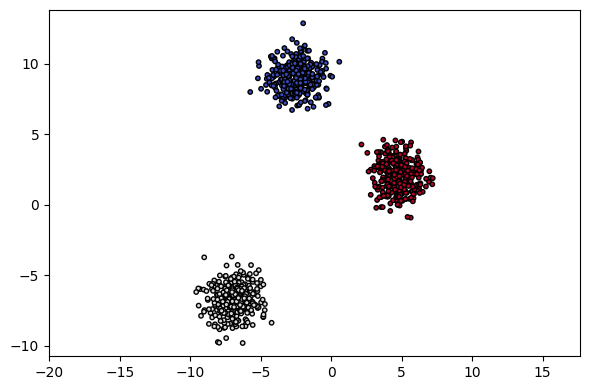

RUN:  2
...Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 528ms/step - loss: 34.8893
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 31.0797
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 24.8691
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 17.6083
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 13.4332
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 5.2265
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 1.7078 
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.2847  
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.6823
Epoch 10/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.8850 
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.7751 
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.3081
Epoch 13/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4205  
Epoch 14/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2854 
Epoch 15/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/ste

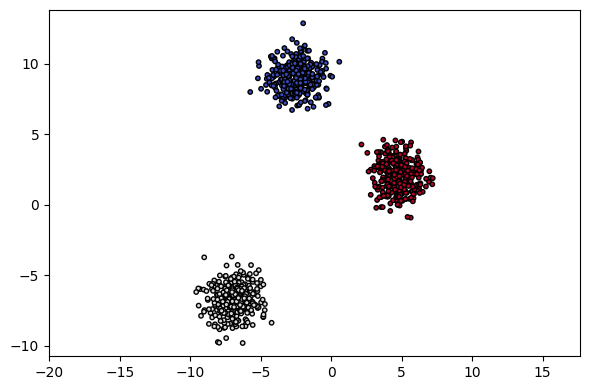

RUN:  3
...Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 449ms/step - loss: 35.1638
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 32.2783
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 27.4015
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 19.5045
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 8.4414 
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 1.7463
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0368 
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 1.1084
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.5339
Epoch 10/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8855 
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.4809
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.2757
Epoch 13/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3626 
Epoch 14/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.2057
Epoch 15/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - l

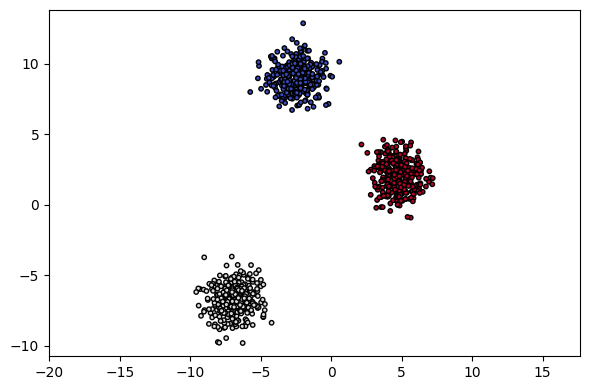

RUN:  4
...Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 439ms/step - loss: 35.1151
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 33.3651 
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 29.3490
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 22.3479
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 12.8092
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 5.6556
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 2.5239
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 1.4768
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 1.2218
Epoch 10/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.5681
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6128 
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.5010
Epoch 13/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3935
Epoch 14/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3285
Epoch 15/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step -

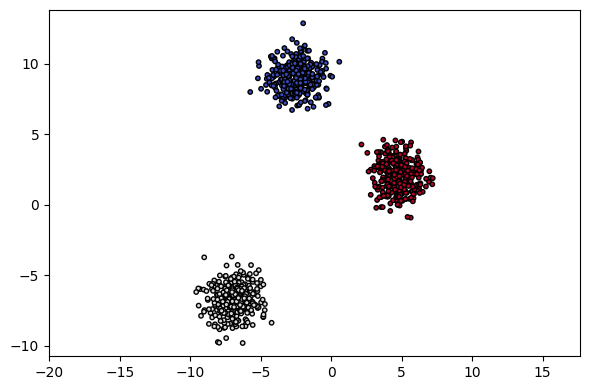

RUN:  5
...Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 408ms/step - loss: 35.6200
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 31.3151
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 24.9219
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 13.9550
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 8.2664
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 7.4190
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 3.7766
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 3.5359
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 2.4486
Epoch 10/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 1.3102
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.8504
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.6063
Epoch 13/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.4961
Epoch 14/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.4854
Epoch 15/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - l

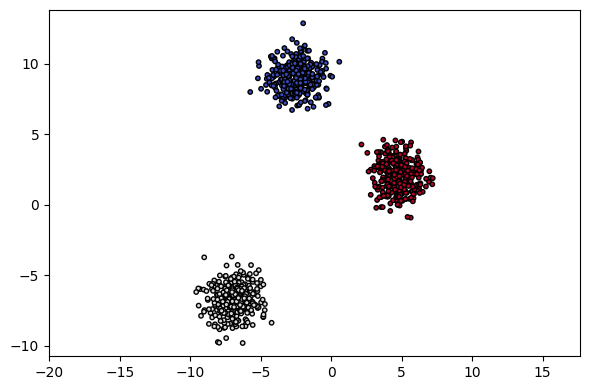

RUN:  6
...Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 436ms/step - loss: 34.9685
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 32.3519
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 26.1474
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 16.3982
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 8.7757
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3.4860
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 1.9574
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 1.2471
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.7281
Epoch 10/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.7050
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.5405
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3419
Epoch 13/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3843
Epoch 14/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3139
Epoch 15/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - l

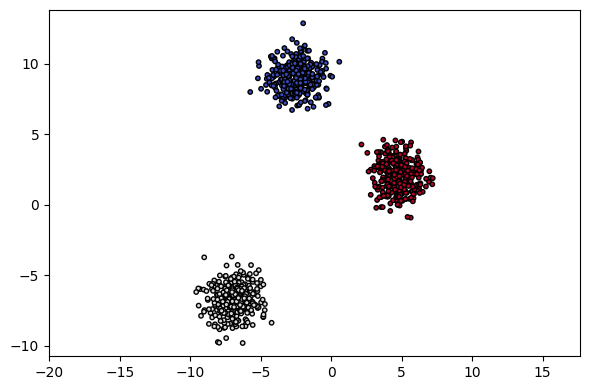

RUN:  7
...Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 416ms/step - loss: 34.7895
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 31.6523
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 25.8096
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 19.4685
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 12.1566
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 4.4020
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 1.3139
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1711 
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.7106
Epoch 10/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8855 
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8631 
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.6153
Epoch 13/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.5460
Epoch 14/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.5232
Epoch 15/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - 

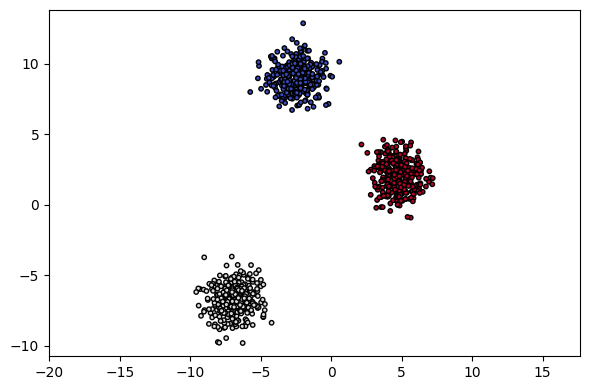

RUN:  8
...Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 420ms/step - loss: 35.4363
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 32.5908
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 27.6804
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 20.6402
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 16.0268
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 13.2953
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 7.4959
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 2.6703
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 1.8967
Epoch 10/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 1.3130
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.6385
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8855 
Epoch 13/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.5819
Epoch 14/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.4120
Epoch 15/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - 

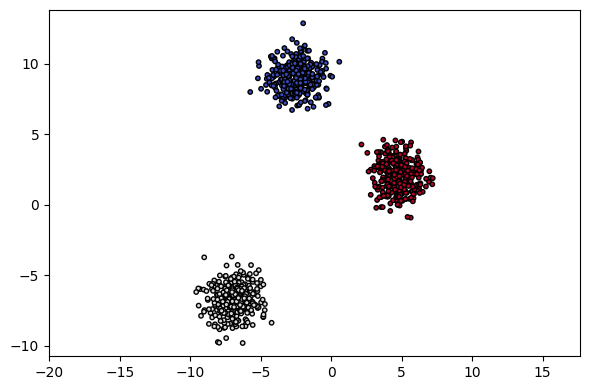

RUN:  9
...Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 624ms/step - loss: 35.5633
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 32.7309
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 27.4999
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 20.0124
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 11.7197
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 6.5972
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 2.5501
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 1.1701
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4947 
Epoch 10/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.6555
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.5150
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.5045
Epoch 13/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.4477
Epoch 14/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.2923
Epoch 15/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - l

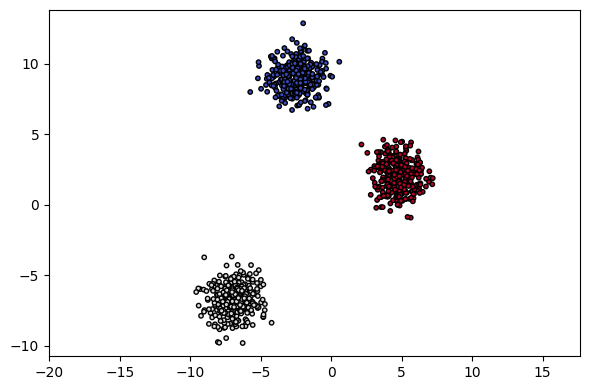

RUN:  10
...Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 433ms/step - loss: 35.3318
Epoch 2/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 32.6185 
Epoch 3/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 27.1319
Epoch 4/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 17.9489
Epoch 5/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 8.9850
Epoch 6/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 6.8810
Epoch 7/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 5.3419
Epoch 8/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 4.9623 
Epoch 9/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 3.9404 
Epoch 10/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 2.9706
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.5464
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.5376 
Epoch 13/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7488  
Epoch 14/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.4525
Epoch 15/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/st

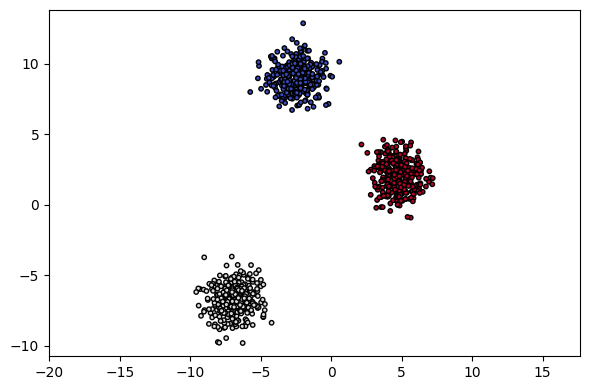


Stability scores: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

Stability scores average: 1.0

Stability scores standard deviation: 0.0


In [ ]:
test_stability_dec(X=X_blobs, y=y_blobs, n_clusters = 3, n_runs = 10)

In [ ]:
from sklearn.preprocessing import StandardScaler
import numpy as np
import csv
import matplotlib.pyplot as plt

def run_dec(X, y_true, n_clusters, dataset_name='dataset', save_dir='', output_file='best_result.csv'):
    """
    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances.
    y_true : array-like of shape (n_samples,)
        True labels.
    dataset_name : str
        Name of the dataset for printing/logging.
    output_file : str
        Path to the CSV file where results will be saved.
    """

    # Standardize the features
    X_scaled = StandardScaler().fit_transform(X)

    # Open the CSV file for writing results
    with open(output_file, mode='w', newline='') as csvfile:
        writer = csv.writer(csvfile)
        # Write header
        writer.writerow(['dataset', 'accuracy', 'ari', 'nmi', 'sep', 'com', 'cvnn', 'dbcv', 'cvdd'])
        X_input = X_scaled.astype(np.float32)

        # Define DEC model architecture
        dims = [X_input.shape[1], 50, 100, 200, n_clusters]


        # Initialize DEC
        dec = DEC(dims=dims, n_clusters=n_clusters)

        pretrain_optimizer = tf.keras.optimizers.Adam(
            learning_rate=0.003,  # Tăng learning rate
            beta_1=0.9,
            beta_2=0.999
        )

        dec.pretrain(
            X_input,
            y_true,
            optimizer=pretrain_optimizer,
            epochs=200,  # Tăng số epochs
            batch_size=16,  # Giảm batch size
            save_dir='results'
        )

        # 4. Tinh chỉnh optimizer cho DEC
        train_lr = tf.keras.optimizers.schedules.CosineDecayRestarts(
            initial_learning_rate=0.02,
            first_decay_steps=100,
            t_mul=2.0,
            m_mul=0.9
        )

        train_optimizer = tf.keras.optimizers.SGD(
            learning_rate=train_lr,
            momentum=0.95,  # Tăng momentum
            nesterov=True   # Sử dụng Nesterov momentum
        )

        # 5. Compile và train với các tham số được tinh chỉnh
        dec.compile(optimizer=train_optimizer)

        # Initialize cluster centers and train DEC
        y_pred = dec.fit(
            X_input,
            y=y_true,
            maxiter=1500,
            batch_size=256,
            update_interval=100,
            save_dir=save_dir
        )

        # Calculate metrics
        acc = acc_score(y_true, y_pred)
        sep, com, cvnn = calculate_cvnn_index(X_scaled, y_pred)
        cvdd = cvdd_cal(X_scaled, y_pred)
        dbcv = dbcv_cal(X_scaled, y_pred)
        ari = adjusted_rand_score(y_true, y_pred)
        nmi = normalized_mutual_info_score(y_true, y_pred)

        print(f"ACC: {acc: .4f}, ARI: {ari: .4f}, NMI:{nmi : .4f}, Separation: {sep : .4f}, Compactness: {com : .4f}, CVNN: {cvnn : .4f}, DBCV: {dbcv : .4f}, CVDD: {cvdd : .4f}")

        # Write results to the CSV file
        writer.writerow([dataset_name, kernel, gamma, acc, ari, nmi, sep, com, cvnn, dbcv, cvdd])

        # Plot results with best parameters
        plt.figure(figsize=(10, 4))

        # Original data
        plt.subplot(121)
        plt.scatter(X[:, 0], X[:, 1], c=y_true, cmap='coolwarm', s=10, edgecolor='k')
        plt.title("Original Data")
        plt.axis('equal')

        # Best clustering result
        plt.subplot(122)
        plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap='coolwarm', s=10, edgecolor='k')
        plt.title(f"DEC for {dataset_name}")
        plt.axis('equal')

        plt.tight_layout()
        plt.show()

        return y_pred


Optimizing dec for two_moons
...Pretraining...
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 16s 237ms/step - loss: 0.9941
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 311ms/step - loss: 0.9303
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 254ms/step - loss: 0.7676
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step - loss: 0.6630
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.5318
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 167ms/step - loss: 0.4299
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.3007 
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1825
Epoch 9/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1284 
Epoch 10/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0713 
Epoch 11/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0429 
Epoch 12/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0245 
Epoch 13/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0135
Epoch 14/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0148 
Epoch 15/100
4/4 ━━━━━━

Iter 100: acc = 0.81500, nmi = 0.31272, ari = 0.39630  ; loss= 0.04399
Iter 200: acc = 0.82300, nmi = 0.32839, ari = 0.41673  ; loss= 0.04766
Iter 300: acc = 0.82300, nmi = 0.32813, ari = 0.41673  ; loss= 0.04985
Iter 400: acc = 0.82300, nmi = 0.32788, ari = 0.41673  ; loss= 0.05098
saving model to: results/dec/two_moons/DEC_model_final.weights.h5
ACC:  0.1770, ARI:  0.4167, NMI: 0.3279, Separation:  0.0333, Compactness:  2.8397, CVNN:  1.4365, DBCV: -0.9653, CVDD:  239.7016


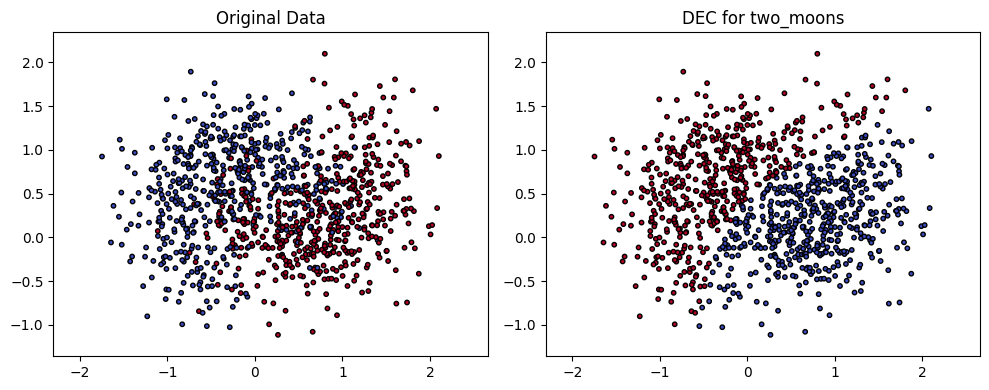


Optimizing dec for circles
...Pretraining...
Epoch 1/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.8789
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.1191
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0162
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0036
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0016
Epoch 6/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 7.6629e-04
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 3.6881e-04
Epoch 8/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 1.6581e-04
Epoch 9/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 7.3462e-05
Epoch 10/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 3.7450e-05
Epoch 11/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 2.7441e-05
Epoch 12/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 2.0774e-05
Epoch 13/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 1.7882e-05
Epoch 14/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms

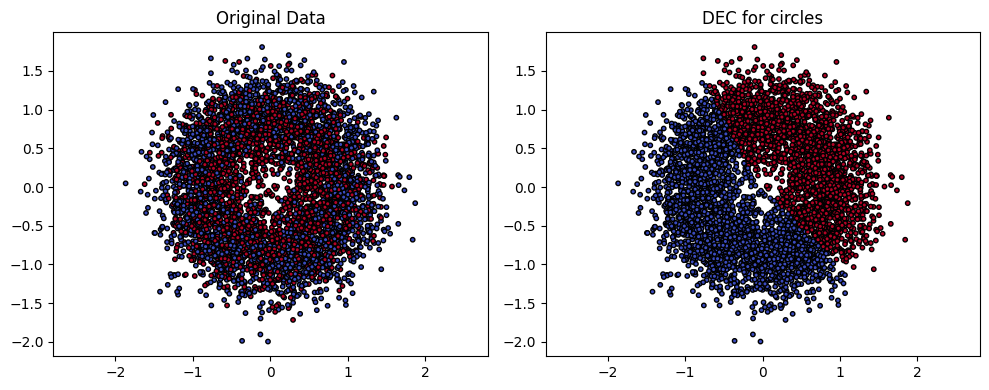


Optimizing dec for anisotropic
...Pretraining...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 8s 55ms/step - loss: 0.9747
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.6627
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.2278
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0790
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0290
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0147
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0086
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0038
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0026
Epoch 10/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0017
Epoch 11/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 9.4352e-04
Epoch 12/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 6.5246e-04
Epoch 13/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 3.5583e-04
Epoch 14/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 2.1873e-04
Epoch 15/100
8/8 ━━

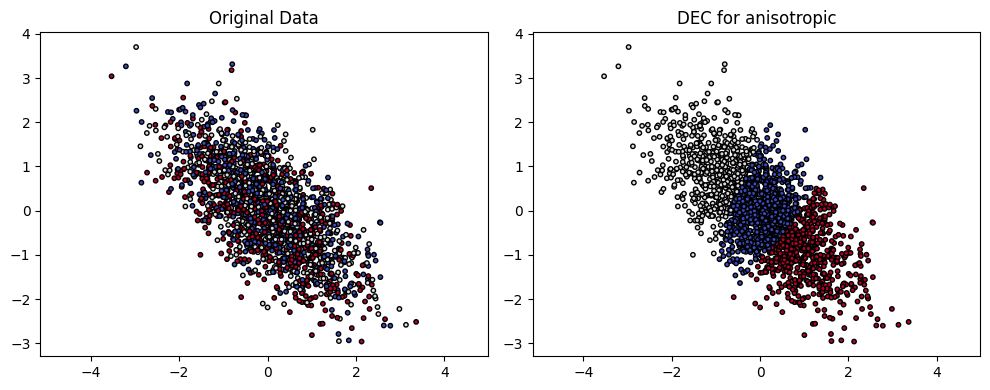


Optimizing dec for spiral
...Pretraining...
Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.9846
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.6410 
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1690 
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0657 
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0342
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0122
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0078 
Epoch 8/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0045
Epoch 9/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0033
Epoch 10/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0019 
Epoch 11/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0013 
Epoch 12/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 7.8238e-04
Epoch 13/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 4.8056e-04
Epoch 14/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 3.2916e-04 
Epoch 15/100
8/8 ━━━━

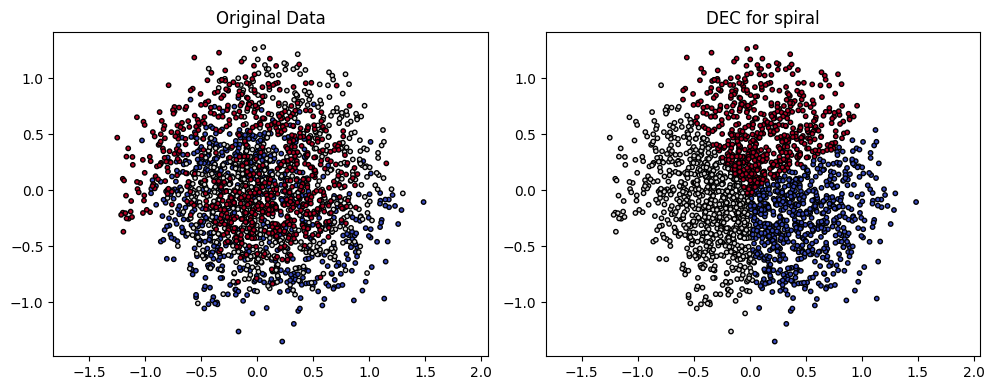


Optimizing dec for blobs
...Pretraining...
Epoch 1/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 0.9556
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.6985
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.6087
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.5935
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.5876
Epoch 6/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.5721
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.5622
Epoch 8/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.5526
Epoch 9/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.5440
Epoch 10/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.5310
Epoch 11/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.5225
Epoch 12/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.5224
Epoch 13/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5130
Epoch 14/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.5124
Epoch 15/100


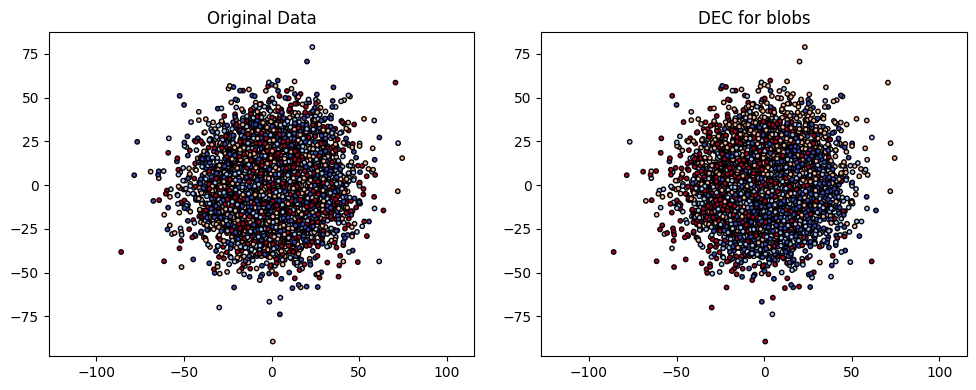

In [ ]:
import os
datasets = {
    'two_moons': (X_moons, y_moons, 2),
    'circles': (X_circles, y_circles, 2),
    'anisotropic': (X_anisotropy, y_anisotropy, 3),
    'spiral': (X_spiral, y_spiral, 3),
    'blobs': (X_blobs, y_blobs, 4)
}

# Run optimization for each dataset
results = {}
for dataset_name, (X, y, n_clusters) in datasets.items():
    os.makedirs(f"results/dec/{dataset_name}", exist_ok=True)
    directory_path = f"results/dec/{dataset_name}"
    print(f"\nOptimizing dec for {dataset_name}")
    saved_file = os.path.join(directory_path,"best_result.csv")
    run_dec(X, y, n_clusters, dataset_name, directory_path, saved_file)

In [ ]:
import pandas as pd
import os
from sklearn.metrics import (
    adjusted_rand_score,
    normalized_mutual_info_score,
    silhouette_score,
    davies_bouldin_score,
)
import numpy as np


def check_stability_dec(X, y_true, n_clusters, n_runs=10, output_dir="stability_results"):
    """
    Check stability of DEC clustering with the same parameters and save results to files.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances (standardized).
    y_true : array-like of shape (n_samples,)
        True labels for evaluation.
    n_clusters : int
        Number of clusters.
    n_runs : int, default=10
        Number of times to run DEC.
    output_dir : str
        Directory to save clustering results.

    Returns:
    --------
    stability_scores : list of float
        List of ARI scores between each pair of runs.
    is_stable : bool
        True if all ARI scores are 1, indicating stability.
    dec_model : DEC
        The last trained DEC model instance.
    """
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Store clustering results
    cluster_results = []
    dec_model = None

    X_scaled = StandardScaler().fit_transform(X)
    X_input = X_scaled.astype(np.float32)

    # Initialize metrics file with header
    metrics_file = os.path.join(output_dir, "evaluation_metrics.csv")
    if not os.path.exists(metrics_file):
        pd.DataFrame(columns=['run', 'accuracy', 'ari', 'nmi', 'sep', 'com', 'cvnn', 'dbcv', 'cvdd']).to_csv(metrics_file, index=False)

    for run_idx in range(n_runs):
        print(f"Running DEC iteration {run_idx + 1}/{n_runs}...")

        # Initialize DEC
        dims = [X_input.shape[1], 50, 100, 200, n_clusters]
        dec = DEC(dims=dims, n_clusters=n_clusters)

        # Pretrain the autoencoder
        pretrain_optimizer = tf.keras.optimizers.Adam(
            learning_rate=0.01,  # Tăng learning rate
            beta_1=0.9,
            beta_2=0.999
        )

        dec.pretrain(
            X_input,
            y_true,
            optimizer=pretrain_optimizer,
            epochs=200,  # Tăng số epochs
            batch_size=256,  # Giảm batch size
            save_dir='results'
        )

        # 4. Tinh chỉnh optimizer cho DEC
        train_lr = tf.keras.optimizers.schedules.CosineDecayRestarts(
            initial_learning_rate=0.02,
            first_decay_steps=100,
            t_mul=2.0,
            m_mul=0.9
        )

        train_optimizer = tf.keras.optimizers.SGD(
            learning_rate=train_lr,
            momentum=0.95,  # Tăng momentum
            nesterov=True   # Sử dụng Nesterov momentum
        )

        # 5. Compile và train với các tham số được tinh chỉnh
        dec.compile(optimizer=train_optimizer)
        y_pred = dec.fit(
            X_input,
            y=y_true,
            maxiter=1500,
            batch_size=256,
            update_interval=140,
            save_dir=output_dir
        )

        cluster_results.append(y_pred)

        # Save clustering results to CSV
        result_file = os.path.join(output_dir, f"run_{run_idx + 1}.csv")
        pd.DataFrame({"Cluster_Label": y_pred}).to_csv(result_file, index=False)
        print(f"Saved clustering result for run {run_idx + 1} to {result_file}")

        # Calculate evaluation metrics
        if len(np.unique(y_pred)) > 1:
            sil = silhouette_score(X_scaled, y_pred)
            db = davies_bouldin_score(X_scaled, y_pred)
            centers = np.zeros((n_clusters, X_scaled.shape[1]))
            for i in range(n_clusters):
                cluster_points = X_scaled[y_pred == i]
                if len(cluster_points) > 0:
                    centers[i] = np.mean(cluster_points, axis=0)
            sep, com, cvnn = calculate_cvnn_index(X_scaled, y_pred)
            cvdd = cvdd_cal(X_scaled, y_pred)
            dbcv = dbcv_cal(X_scaled, y_pred)
            acc = acc_score(y_true, y_pred)
            ari = adjusted_rand_score(y_true, y_pred)
            nmi = normalized_mutual_info_score(y_true, y_pred)
            print(f"Iteration {run_idx + 1} - ACC: {acc: .4f}, ARI: {ari: .4f}, NMI:{nmi : .4f}, Separation: {sep : .4f}, Compactness: {com : .4f}, CVNN: {cvnn : .4f}, DBCV: {dbcv : .4f}, CVDD: {cvdd : .4f}")
        else:
            sil = db = s_dbw = acc = ari = nmi = cvnn = np.nan
            print(f"Iteration {run_idx + 1} resulted in one or no clusters.")

        # Append metrics for the current run to the file
        metrics_record = {
            "Run": run_idx + 1,
            "Accuracy": acc,
            "ARI": ari,
            "NMI": nmi,
            "Sep": sep,
            "Com": com,
            "CVNN": cvnn,
            "DBCV": dbcv,
            "CVDD": cvdd,
        }
        pd.DataFrame([metrics_record]).to_csv(metrics_file, mode='a', header=False, index=False)

        # Keep the model for further analysis if required
        dec_model = dec

    # Calculate ARI between all pairs of runs
    stability_scores = []
    for i in range(n_runs):
        for j in range(i + 1, n_runs):
            ari = adjusted_rand_score(cluster_results[i], cluster_results[j])
            stability_scores.append(ari)

    # Check if all ARI scores are 1
    is_stable = all(score == 1 for score in stability_scores)

    print(f"\nStability scores: {np.mean(stability_scores)}")
    print(f"Is the DEC model stable? {'Yes' if is_stable else 'No'}")

    return stability_scores, is_stable, dec_model

In [ ]:
import csv
import os
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
)

def check_parameter_sensitivity_dec(
    X, y_true, best_params, output_file="parameter_sensitivity.csv"
):
    """
    Check the sensitivity of DEC parameters (learning rate, update interval) by slightly modifying them,
    running the clustering, and calculating ARI and NMI over 5 runs.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Training instances (standardized).
    y_true : array-like of shape (n_samples,)
        True labels for evaluation.
    best_params : dict
        The best parameters found for DEC (learning_rate, update_interval).
    output_file : str, default='parameter_sensitivity.csv'
        Path to the CSV file where sensitivity results will be saved.
    """
    learning_rate = best_params["learning_rate"]
    update_interval = best_params["update_interval"]

    # Define parameter variations for sensitivity analysis
    learning_rate_variations = [learning_rate * (1 + i * 0.1) for i in range(-2, 3)]
    update_interval_variations = [
        max(10, update_interval + i * 10) for i in range(-2, 3)
    ]

    # Standardize data
    X_scaled = StandardScaler().fit_transform(X)

    # Open the CSV file for writing results
    os.makedirs(os.path.dirname(output_file), exist_ok=True)
    with open(output_file, mode="w", newline="") as csvfile:
        writer = csv.writer(csvfile)
        # Write header
        writer.writerow(
            [
                "learning_rate",
                "update_interval",
                "accuracy",
                'ari', 'nmi', 'sep', 'com', 'cvnn', 'dbcv', 'cvdd'
            ]
        )

        # Run sensitivity analysis
        for lr_mod in learning_rate_variations:
            for ui_mod in update_interval_variations:
                print(f"Testing with learning_rate={lr_mod}, update_interval={ui_mod}")

                # Initialize DEC
                dims = [X_scaled.shape[1], 50, 100, 200, 10]
                dec = DEC(dims=dims, n_clusters=len(np.unique(y_true)))

                # Pretrain the autoencoder
                pretrain_optimizer = tf.keras.optimizers.Adam(
                  learning_rate=0.003,  # Tăng learning rate
                  beta_1=0.9,
                  beta_2=0.999
              )

                dec.pretrain(
                    X_scaled,
                    y_true,
                    optimizer=pretrain_optimizer,
                    epochs=200,  # Tăng số epochs
                    batch_size=16,  # Giảm batch size
                    save_dir='results'
                )

                # 4. Tinh chỉnh optimizer cho DEC
                train_lr = tf.keras.optimizers.schedules.CosineDecayRestarts(
                    initial_learning_rate=0.02,
                    first_decay_steps=100,
                    t_mul=2.0,
                    m_mul=0.9
                )

                train_optimizer = tf.keras.optimizers.SGD(
                    learning_rate=train_lr,
                    momentum=0.95,  # Tăng momentum
                    nesterov=True   # Sử dụng Nesterov momentum
                )

                # 5. Compile và train với các tham số được tinh chỉnh
                dec.compile(optimizer=train_optimizer)
                y_pred = dec.fit(
                    X_scaled,
                    y=y_true,
                    maxiter=1500,
                    batch_size=256,
                    update_interval=ui_mod,
                    save_dir=os.path.dirname(output_file),
                )

                # Calculate metrics
                if len(np.unique(y_pred)) > 1:
                    acc = acc_score(y_true, y_pred)
                    sep, com, cvnn = calculate_cvnn_index(X_scaled, y_pred)
                    cvdd = cvdd_cal(X_scaled, y_pred)
                    dbcv = dbcv_cal(X_scaled, y_pred)
                    ari = adjusted_rand_score(y_true, y_pred)
                    nmi = normalized_mutual_info_score(y_true, y_pred)
                else:
                    acc = sil = db = s_dbw = cvnn = ari = nmi = np.nan

                # Write results to CSV
                writer.writerow([lr_mod, ui_mod, acc, ari, nmi, sep, com, cvnn, dbcv, cvdd])

    print(f"\nParameter sensitivity results saved to {output_file}")

In [ ]:
def dec_main_workflow(X, y_true, dataset_name, directory_path):
    """
    Main workflow for optimizing DEC, checking stability, and testing parameter sensitivity.

    Parameters:
    -----------
    X : array-like of shape (n_samples, n_features)
        Input dataset.
    y_true : array-like of shape (n_samples,)
        Ground truth labels.
    dataset_name : str
        Name of the dataset.

    Returns:
    --------
    None
    """
    # File paths
    grid_search_file = os.path.join(directory_path,"grid_search_results.csv")
    stability_dir = os.path.join(directory_path,"stability_results")
    sensitivity_file = os.path.join(directory_path,"parameter_sensitivity.csv")

    # # Step 1: Run DEC and save results
    # print("\nStep 1: Run DEC...")
    n_clusters = len(np.unique(y_true))
    # best_pred, dec = run_dec(
    #     X, y_true, n_clusters, dataset_name
    # )

    # Step 2: Check Stability and Save Results
    print("\nStep 2: Checking Stability...")

    X_scaled = StandardScaler().fit_transform(X)  # Standardize data again
    stability_scores, is_stable, dec_model = check_stability_dec(
        X_scaled, y_true, n_clusters, n_runs = 5, output_dir=stability_dir
    )

    if not is_stable:
        print("Clustering is not stable. Exiting workflow.")
        return

    # Step 3: Check Parameter Sensitivity
    # best_params = {
    # "learning_rate": 0.01,
    # "update_interval": 140,
    # }
    # print("\nStep 3: Checking Parameter Sensitivity...")
    # check_parameter_sensitivity_dec(
    #     X, y_true, best_params=best_params, output_file=sensitivity_file
    # )
    # print(f"Parameter Sensitivity Results saved to {sensitivity_file}")

In [ ]:
import os
datasets = {
    'two_moons': (X_moons, y_moons),
    'circles': (X_circles, y_circles),
    'anisotropic': (X_anisotropy, y_anisotropy),
    'spiral': (X_spiral, y_spiral),
    'blobs': (X_blobs, y_blobs)
}

# Run optimization for each dataset
results = {}
for dataset_name, (X, y) in datasets.items():
    os.makedirs(f"results/dec/{dataset_name}", exist_ok=True)
    directory_path = f"results/dec/{dataset_name}"
    print(f"\nOptimizing dec for {dataset_name}")
    dec_main_workflow(X, y, dataset_name, directory_path)


Optimizing dec for two_moons

Step 2: Checking Stability...
Running DEC iteration 1/5...
Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 845ms/step - loss: 1.0019 - mse: 0.9619

4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - loss: 0.9867 - mse: 0.9469 - val_loss: 0.7571 - val_mse: 0.7215 - learning_rate: 0.0100
Epoch 2/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.8043 - mse: 0.7688

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.6712 - mse: 0.6365 - val_loss: 0.5200 - val_mse: 0.4876 - learning_rate: 0.0100
Epoch 3/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.5932 - mse: 0.5609

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.5262 - mse: 0.4941 - val_loss: 0.2818 - val_mse: 0.2501 - learning_rate: 0.0100
Epoch 4/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.2882 - mse: 0.2564

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.2373 - mse: 0.2056 - val_loss: 0.1559 - val_mse: 0.1246 - learning_rate: 0.0100
Epoch 5/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1561 - mse: 0.1248

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1438 - mse: 0.1126 - val_loss: 0.1460 - val_mse: 0.1151 - learning_rate: 0.0100
Epoch 6/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1315 - mse: 0.1007

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1145 - mse: 0.0838 - val_loss: 0.0809 - val_mse: 0.0504 - learning_rate: 0.0100
Epoch 7/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0871 - mse: 0.0567

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0810 - mse: 0.0507 - val_loss: 0.0623 - val_mse: 0.0325 - learning_rate: 0.0100
Epoch 8/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0639 - mse: 0.0341

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0606 - mse: 0.0308 - val_loss: 0.0570 - val_mse: 0.0277 - learning_rate: 0.0100
Epoch 9/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0595 - mse: 0.0302

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0566 - mse: 0.0274 - val_loss: 0.0399 - val_mse: 0.0112 - learning_rate: 0.0100
Epoch 10/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0388 - mse: 0.0102

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0395 - mse: 0.0110 - val_loss: 0.0365 - val_mse: 0.0085 - learning_rate: 0.0100
Epoch 11/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0387 - mse: 0.0107

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0384 - mse: 0.0105 - val_loss: 0.0352 - val_mse: 0.0079 - learning_rate: 0.0100
Epoch 12/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0370 - mse: 0.0097

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0350 - mse: 0.0078 - val_loss: 0.0304 - val_mse: 0.0037 - learning_rate: 0.0100
Epoch 13/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0314 - mse: 0.0047

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0307 - mse: 0.0041 - val_loss: 0.0288 - val_mse: 0.0028 - learning_rate: 0.0100
Epoch 14/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0278 - mse: 0.0018

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0295 - mse: 0.0036 - val_loss: 0.0290 - val_mse: 0.0037 - learning_rate: 0.0100
Epoch 15/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0300 - mse: 0.0047

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0292 - mse: 0.0040 - val_loss: 0.0288 - val_mse: 0.0041 - learning_rate: 0.0100
Epoch 16/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0294 - mse: 0.0047

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0281 - mse: 0.0035 - val_loss: 0.0260 - val_mse: 0.0019 - learning_rate: 0.0100
Epoch 17/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0262 - mse: 0.0021

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0263 - mse: 0.0024 - val_loss: 0.0248 - val_mse: 0.0013 - learning_rate: 0.0100
Epoch 18/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0247 - mse: 0.0013

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0251 - mse: 0.0018 - val_loss: 0.0242 - val_mse: 0.0013 - learning_rate: 0.0100
Epoch 19/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0242 - mse: 0.0013

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0242 - mse: 0.0014 - val_loss: 0.0233 - val_mse: 9.0318e-04 - learning_rate: 0.0100
Epoch 20/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0237 - mse: 0.0013

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0234 - mse: 0.0012 - val_loss: 0.0227 - val_mse: 8.9809e-04 - learning_rate: 0.0100
Epoch 21/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0228 - mse: 9.6522e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0226 - mse: 8.3916e-04 - val_loss: 0.0220 - val_mse: 6.4353e-04 - learning_rate: 0.0100
Epoch 22/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0220 - mse: 6.3711e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0218 - mse: 5.8034e-04 - val_loss: 0.0212 - val_mse: 3.3392e-04 - learning_rate: 0.0100
Epoch 23/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - loss: 0.0212 - mse: 3.8192e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 0.0212 - mse: 4.3013e-04 - val_loss: 0.0209 - val_mse: 4.5966e-04 - learning_rate: 0.0100
Epoch 24/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step - loss: 0.0208 - mse: 4.1646e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0207 - mse: 3.5713e-04 - val_loss: 0.0203 - val_mse: 3.0586e-04 - learning_rate: 0.0100
Epoch 25/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 0.0203 - mse: 3.0798e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.0202 - mse: 2.8493e-04 - val_loss: 0.0197 - val_mse: 1.3958e-04 - learning_rate: 0.0100
Epoch 26/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0197 - mse: 1.1189e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0197 - mse: 1.9692e-04 - val_loss: 0.0194 - val_mse: 2.4565e-04 - learning_rate: 0.0100
Epoch 27/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0194 - mse: 1.9389e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0193 - mse: 1.9761e-04 - val_loss: 0.0189 - val_mse: 1.6175e-04 - learning_rate: 0.0100
Epoch 28/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0189 - mse: 1.6968e-04 

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step - loss: 0.0189 - mse: 1.6892e-04 - val_loss: 0.0185 - val_mse: 1.0772e-04 - learning_rate: 0.0100
Epoch 29/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0185 - mse: 1.1691e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0185 - mse: 1.4107e-04 - val_loss: 0.0182 - val_mse: 1.5804e-04 - learning_rate: 0.0100
Epoch 30/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0182 - mse: 1.2627e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0181 - mse: 1.2958e-04 - val_loss: 0.0178 - val_mse: 1.1330e-04 - learning_rate: 0.0100
Epoch 31/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0178 - mse: 1.1697e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0178 - mse: 1.1819e-04 - val_loss: 0.0175 - val_mse: 7.7734e-05 - learning_rate: 0.0100
Epoch 32/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0175 - mse: 7.4512e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0174 - mse: 8.7259e-05 - val_loss: 0.0172 - val_mse: 1.0446e-04 - learning_rate: 0.0100
Epoch 33/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0172 - mse: 9.2394e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0171 - mse: 8.7123e-05 - val_loss: 0.0169 - val_mse: 7.2219e-05 - learning_rate: 0.0100
Epoch 34/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0169 - mse: 7.0087e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0168 - mse: 7.4241e-05 - val_loss: 0.0166 - val_mse: 7.0603e-05 - learning_rate: 0.0100
Epoch 35/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0166 - mse: 8.2876e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0165 - mse: 7.7706e-05 - val_loss: 0.0163 - val_mse: 9.4866e-05 - learning_rate: 0.0100
Epoch 36/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0163 - mse: 7.9859e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0162 - mse: 7.5776e-05 - val_loss: 0.0160 - val_mse: 5.6780e-05 - learning_rate: 0.0100
Epoch 37/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0160 - mse: 5.1504e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0159 - mse: 5.8799e-05 - val_loss: 0.0157 - val_mse: 7.0245e-05 - learning_rate: 0.0100
Epoch 38/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0157 - mse: 7.2173e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0157 - mse: 6.3366e-05 - val_loss: 0.0155 - val_mse: 6.6551e-05 - learning_rate: 0.0100
Epoch 39/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0155 - mse: 6.3769e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0154 - mse: 6.1504e-05 - val_loss: 0.0152 - val_mse: 4.9867e-05 - learning_rate: 0.0100
Epoch 40/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0152 - mse: 5.9677e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0152 - mse: 5.8563e-05 - val_loss: 0.0150 - val_mse: 7.7545e-05 - learning_rate: 0.0100
Epoch 41/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0150 - mse: 6.8906e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0149 - mse: 6.6719e-05 - val_loss: 0.0147 - val_mse: 4.7329e-05 - learning_rate: 0.0100
Epoch 42/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0147 - mse: 5.6493e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0147 - mse: 5.7568e-05 - val_loss: 0.0145 - val_mse: 5.7702e-05 - learning_rate: 0.0100
Epoch 43/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0145 - mse: 6.0677e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0145 - mse: 5.7358e-05 - val_loss: 0.0143 - val_mse: 5.0844e-05 - learning_rate: 0.0100
Epoch 44/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0143 - mse: 4.3902e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0142 - mse: 4.8466e-05 - val_loss: 0.0141 - val_mse: 4.5488e-05 - learning_rate: 0.0100
Epoch 45/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0141 - mse: 4.8342e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0140 - mse: 4.8310e-05 - val_loss: 0.0138 - val_mse: 4.0467e-05 - learning_rate: 0.0100
Epoch 46/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0139 - mse: 4.9855e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0138 - mse: 4.6587e-05 - val_loss: 0.0136 - val_mse: 4.3048e-05 - learning_rate: 0.0100
Epoch 47/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0137 - mse: 5.5437e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0136 - mse: 5.1207e-05 - val_loss: 0.0134 - val_mse: 4.2242e-05 - learning_rate: 0.0100
Epoch 48/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0135 - mse: 5.2851e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0134 - mse: 4.8009e-05 - val_loss: 0.0132 - val_mse: 3.9526e-05 - learning_rate: 0.0100
Epoch 49/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0132 - mse: 3.9981e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0132 - mse: 4.1469e-05 - val_loss: 0.0131 - val_mse: 5.3058e-05 - learning_rate: 0.0100
Epoch 50/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0131 - mse: 4.7058e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0130 - mse: 4.6725e-05 - val_loss: 0.0129 - val_mse: 3.7022e-05 - learning_rate: 0.0100
Epoch 51/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0129 - mse: 3.5189e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0128 - mse: 3.7206e-05 - val_loss: 0.0127 - val_mse: 4.2942e-05 - learning_rate: 0.0100
Epoch 52/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0127 - mse: 4.0655e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0126 - mse: 3.8476e-05 - val_loss: 0.0125 - val_mse: 3.8340e-05 - learning_rate: 0.0100
Epoch 53/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0125 - mse: 3.6576e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0125 - mse: 3.9192e-05 - val_loss: 0.0123 - val_mse: 3.8836e-05 - learning_rate: 0.0100
Epoch 54/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0123 - mse: 4.2979e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0123 - mse: 4.3305e-05 - val_loss: 0.0122 - val_mse: 4.5030e-05 - learning_rate: 0.0100
Epoch 55/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0122 - mse: 4.0183e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0121 - mse: 4.9163e-05 - val_loss: 0.0120 - val_mse: 5.3658e-05 - learning_rate: 0.0100
Epoch 56/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0120 - mse: 5.1076e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0120 - mse: 4.5058e-05 - val_loss: 0.0118 - val_mse: 3.9939e-05 - learning_rate: 0.0100
Epoch 57/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0118 - mse: 3.6347e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0118 - mse: 4.0291e-05 - val_loss: 0.0117 - val_mse: 5.0139e-05 - learning_rate: 0.0100
Epoch 58/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0117 - mse: 4.6915e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0117 - mse: 5.5929e-05 - val_loss: 0.0115 - val_mse: 6.0342e-05 - learning_rate: 0.0100
Epoch 59/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0115 - mse: 5.9072e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0115 - mse: 7.5856e-05 - val_loss: 0.0114 - val_mse: 6.4179e-05 - learning_rate: 0.0100
Epoch 60/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0114 - mse: 6.3331e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0114 - mse: 1.0318e-04 - val_loss: 0.0113 - val_mse: 9.4576e-05 - learning_rate: 0.0100
Epoch 61/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0113 - mse: 9.7275e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0114 - mse: 2.1571e-04 - val_loss: 0.0112 - val_mse: 1.1932e-04 - learning_rate: 0.0100
Epoch 62/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0111 - mse: 1.0691e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0113 - mse: 2.3881e-04 - val_loss: 0.0110 - val_mse: 9.6537e-05 - learning_rate: 0.0100
Epoch 63/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0110 - mse: 1.0130e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0110 - mse: 1.2342e-04 - val_loss: 0.0112 - val_mse: 3.9886e-04 - learning_rate: 0.0100
Epoch 64/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0112 - mse: 3.8673e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0110 - mse: 2.7886e-04 - val_loss: 0.0109 - val_mse: 2.5810e-04 - learning_rate: 0.0100
Epoch 65/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0109 - mse: 2.6205e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0108 - mse: 2.1342e-04 - val_loss: 0.0108 - val_mse: 2.9725e-04 - learning_rate: 0.0100
Epoch 66/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0108 - mse: 2.8144e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0107 - mse: 2.5817e-04 - val_loss: 0.0105 - val_mse: 1.6573e-04 - learning_rate: 0.0100
Epoch 67/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0106 - mse: 1.7633e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0106 - mse: 2.4956e-04 - val_loss: 0.0103 - val_mse: 8.9500e-05 - learning_rate: 0.0100
Epoch 68/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0103 - mse: 9.3983e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0104 - mse: 1.6660e-04 - val_loss: 0.0102 - val_mse: 8.8566e-05 - learning_rate: 0.0100
Epoch 69/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0102 - mse: 9.6523e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0102 - mse: 9.6834e-05 - val_loss: 0.0101 - val_mse: 8.5259e-05 - learning_rate: 0.0100
Epoch 70/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0101 - mse: 7.9952e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0101 - mse: 9.6615e-05 - val_loss: 0.0100 - val_mse: 1.0658e-04 - learning_rate: 0.0100
Epoch 71/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0100 - mse: 1.0925e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0100 - mse: 9.2239e-05 - val_loss: 0.0099 - val_mse: 9.6363e-05 - learning_rate: 0.0100
Epoch 72/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - loss: 0.0099 - mse: 7.9827e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0098 - mse: 6.8343e-05 - val_loss: 0.0097 - val_mse: 5.9677e-05 - learning_rate: 0.0100
Epoch 73/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0097 - mse: 5.8617e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0097 - mse: 5.3456e-05 - val_loss: 0.0096 - val_mse: 7.4362e-05 - learning_rate: 0.0100
Epoch 74/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.0096 - mse: 7.1784e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0096 - mse: 7.4280e-05 - val_loss: 0.0095 - val_mse: 3.7577e-05 - learning_rate: 0.0100
Epoch 75/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0095 - mse: 3.0460e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0095 - mse: 9.0958e-05 - val_loss: 0.0100 - val_mse: 6.1620e-04 - learning_rate: 0.0100
Epoch 76/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0100 - mse: 6.8760e-04 - val_loss: 0.0096 - val_mse: 3.8155e-04 - learning_rate: 0.0100
Epoch 77/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0097 - mse: 4.6677e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0095 - mse: 3.1017e-04 - val_loss: 0.0103 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 78/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0102 - mse: 0.0010 - val_loss: 0.0106 - val_mse: 0.0016 - learning_rate: 0.0100
Epoch 79/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0107 - mse: 0.0017 - val_loss: 0.0094 - val_mse: 4.2912e-04 - learning_rate: 0.0100
Epoch 80/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0094 - mse: 4.1160e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0093 - mse: 3.4851e-04 - val_loss: 0.0092 - val_mse: 3.0905e-04 - learning_rate: 0.0100
Epoch 81/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0092 - mse: 3.2405e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0092 - mse: 3.6757e-04 - val_loss: 0.0094 - val_mse: 6.0549e-04 - learning_rate: 0.0100
Epoch 82/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0094 - mse: 6.0009e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0093 - mse: 5.1364e-04 - val_loss: 0.0097 - val_mse: 0.0010 - learning_rate: 0.0100
Epoch 83/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0094 - mse: 7.5135e-04 - val_loss: 0.0092 - val_mse: 6.2486e-04 - learning_rate: 0.0100
Epoch 84/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0093 - mse: 6.6546e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0091 - mse: 5.4633e-04 - val_loss: 0.0088 - val_mse: 2.9074e-04 - learning_rate: 0.0100
Epoch 85/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0088 - mse: 2.6988e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0087 - mse: 2.0690e-04 - val_loss: 0.0086 - val_mse: 1.4163e-04 - learning_rate: 0.0100
Epoch 86/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0086 - mse: 1.5766e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0086 - mse: 1.5165e-04 - val_loss: 0.0085 - val_mse: 1.2622e-04 - learning_rate: 0.0100
Epoch 87/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0085 - mse: 1.2118e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0085 - mse: 1.2008e-04 - val_loss: 0.0084 - val_mse: 1.0876e-04 - learning_rate: 0.0100
Epoch 88/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0084 - mse: 1.1196e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0084 - mse: 1.1215e-04 - val_loss: 0.0082 - val_mse: 4.7087e-05 - learning_rate: 0.0100
Epoch 89/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0082 - mse: 5.3395e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0083 - mse: 8.2465e-05 - val_loss: 0.0082 - val_mse: 6.9121e-05 - learning_rate: 0.0100
Epoch 90/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0082 - mse: 8.6888e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0082 - mse: 7.6871e-05 - val_loss: 0.0081 - val_mse: 6.9822e-05 - learning_rate: 0.0100
Epoch 91/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0081 - mse: 5.8268e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0081 - mse: 7.8465e-05 - val_loss: 0.0081 - val_mse: 1.4405e-04 - learning_rate: 0.0100
Epoch 92/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0081 - mse: 1.8568e-04 - val_loss: 0.0080 - val_mse: 1.1018e-04 - learning_rate: 0.0100
Epoch 93/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0080 - mse: 1.1683e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0080 - mse: 1.4202e-04 - val_loss: 0.0080 - val_mse: 2.1608e-04 - learning_rate: 0.0100
Epoch 94/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0080 - mse: 1.8546e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0079 - mse: 1.4868e-04 - val_loss: 0.0078 - val_mse: 1.0515e-04 - learning_rate: 0.0100
Epoch 95/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0079 - mse: 2.4287e-04 - val_loss: 0.0084 - val_mse: 7.7894e-04 - learning_rate: 0.0100
Epoch 96/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0082 - mse: 6.0125e-04 - val_loss: 0.0082 - val_mse: 6.3361e-04 - learning_rate: 0.0100
Epoch 97/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0080 - mse: 4.2918e-04 - val_loss: 0.0078 - val_mse: 2.7066e-04 - learning_rate: 0.0100
Epoch 98/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0079 - mse: 3.6353e-04 - val_loss: 0.0090 - val_mse: 0.0016 - learning_rate: 0.0100
Epoch 99/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0088 - mse: 0.0014 - val_loss: 0.0079 - val_mse: 4.9704e-04 - learning_rate: 1.0000e-03
Epoch 100/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0081 - mse: 6.8177e-04 - val_loss: 0.0078 - val_mse: 3.4666e-

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0078 - mse: 3.5917e-04 - val_loss: 0.0077 - val_mse: 2.4954e-04 - learning_rate: 1.0000e-03
Epoch 102/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0077 - mse: 2.7513e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0077 - mse: 3.3012e-04 - val_loss: 0.0075 - val_mse: 1.0780e-04 - learning_rate: 1.0000e-03
Epoch 103/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0075 - mse: 9.3575e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0076 - mse: 1.6084e-04 - val_loss: 0.0076 - val_mse: 2.2437e-04 - learning_rate: 1.0000e-03
Epoch 104/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0076 - mse: 2.1161e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0075 - mse: 1.3817e-04 - val_loss: 0.0077 - val_mse: 2.7223e-04 - learning_rate: 1.0000e-03
Epoch 105/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0076 - mse: 1.6700e-04 - val_loss: 0.0075 - val_mse: 1.2750e-04 - learning_rate: 1.0000e-03
Epoch 106/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0075 - mse: 1.1357e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0075 - mse: 1.1853e-04 - val_loss: 0.0074 - val_mse: 6.2051e-05 - learning_rate: 1.0000e-03
Epoch 107/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0074 - mse: 6.3901e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0075 - mse: 6.8957e-05 - val_loss: 0.0074 - val_mse: 3.8954e-05 - learning_rate: 1.0000e-03
Epoch 108/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0074 - mse: 4.2116e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0074 - mse: 5.3428e-05 - val_loss: 0.0074 - val_mse: 3.1604e-05 - learning_rate: 1.0000e-03
Epoch 109/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0074 - mse: 3.0214e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0074 - mse: 3.6777e-05 - val_loss: 0.0074 - val_mse: 3.8256e-05 - learning_rate: 1.0000e-03
Epoch 110/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0074 - mse: 3.3269e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0074 - mse: 3.0894e-05 - val_loss: 0.0074 - val_mse: 3.3529e-05 - learning_rate: 1.0000e-03
Epoch 111/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0074 - mse: 3.1438e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0074 - mse: 3.1437e-05 - val_loss: 0.0074 - val_mse: 3.3721e-05 - learning_rate: 1.0000e-03
Epoch 112/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0074 - mse: 2.9307e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0074 - mse: 3.0087e-05 - val_loss: 0.0074 - val_mse: 3.0834e-05 - learning_rate: 1.0000e-03
Epoch 113/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0074 - mse: 2.6103e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0074 - mse: 2.7989e-05 - val_loss: 0.0074 - val_mse: 2.6156e-05 - learning_rate: 1.0000e-03
Epoch 114/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0074 - mse: 2.5567e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0074 - mse: 2.6585e-05 - val_loss: 0.0073 - val_mse: 2.5042e-05 - learning_rate: 1.0000e-03
Epoch 115/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0073 - mse: 2.3454e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0073 - mse: 2.3831e-05 - val_loss: 0.0073 - val_mse: 2.5874e-05 - learning_rate: 1.0000e-03
Epoch 116/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0073 - mse: 2.7235e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.4551e-05 - val_loss: 0.0073 - val_mse: 2.4791e-05 - learning_rate: 1.0000e-04
Epoch 117/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0073 - mse: 2.3961e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0073 - mse: 2.2779e-05 - val_loss: 0.0073 - val_mse: 2.4343e-05 - learning_rate: 1.0000e-04
Epoch 118/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0073 - mse: 2.1604e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0073 - mse: 2.2077e-05 - val_loss: 0.0073 - val_mse: 2.4327e-05 - learning_rate: 1.0000e-04
Epoch 119/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0073 - mse: 1.7147e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0073 - mse: 2.0805e-05 - val_loss: 0.0073 - val_mse: 2.4297e-05 - learning_rate: 1.0000e-04
Epoch 120/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0073 - mse: 2.3586e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0073 - mse: 2.2554e-05 - val_loss: 0.0073 - val_mse: 2.4018e-05 - learning_rate: 1.0000e-04
Epoch 121/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0073 - mse: 2.0849e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0073 - mse: 2.1465e-05 - val_loss: 0.0073 - val_mse: 2.3996e-05 - learning_rate: 1.0000e-05
Epoch 122/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0073 - mse: 2.1585e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.2356e-05 - val_loss: 0.0073 - val_mse: 2.3982e-05 - learning_rate: 1.0000e-05
Epoch 123/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0073 - mse: 2.4115e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.2563e-05 - val_loss: 0.0073 - val_mse: 2.3966e-05 - learning_rate: 1.0000e-05
Epoch 124/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0073 - mse: 2.1665e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.2420e-05 - val_loss: 0.0073 - val_mse: 2.3952e-05 - learning_rate: 1.0000e-05
Epoch 125/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0073 - mse: 2.5454e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0073 - mse: 2.2917e-05 - val_loss: 0.0073 - val_mse: 2.3943e-05 - learning_rate: 1.0000e-05
Epoch 126/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0073 - mse: 2.1766e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0073 - mse: 2.1865e-05 - val_loss: 0.0073 - val_mse: 2.3933e-05 - learning_rate: 1.0000e-05
Epoch 127/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0073 - mse: 2.2983e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0073 - mse: 2.2348e-05 - val_loss: 0.0073 - val_mse: 2.3923e-05 - learning_rate: 1.0000e-05
Epoch 128/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0073 - mse: 2.2341e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0073 - mse: 2.1981e-05 - val_loss: 0.0073 - val_mse: 2.3915e-05 - learning_rate: 1.0000e-05
Epoch 129/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0073 - mse: 1.9791e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0073 - mse: 2.1463e-05 - val_loss: 0.0073 - val_mse: 2.3906e-05 - learning_rate: 1.0000e-05
Epoch 130/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0073 - mse: 2.1418e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0073 - mse: 2.1604e-05 - val_loss: 0.0073 - val_mse: 2.3900e-05 - learning_rate: 1.0000e-05
Epoch 131/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0073 - mse: 2.0870e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0073 - mse: 2.1625e-05 - val_loss: 0.0073 - val_mse: 2.3894e-05 - learning_rate: 1.0000e-05
Epoch 132/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0073 - mse: 2.3227e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0073 - mse: 2.2030e-05 - val_loss: 0.0073 - val_mse: 2.3888e-05 - learning_rate: 1.0000e-05
Epoch 133/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0073 - mse: 2.6035e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0073 - mse: 2.3222e-05 - val_loss: 0.0073 - val_mse: 2.3882e-05 - learning_rate: 1.0000e-05
Epoch 134/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0073 - mse: 2.2811e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0073 - mse: 2.1982e-05 - val_loss: 0.0073 - val_mse: 2.3878e-05 - learning_rate: 1.0000e-05
Epoch 135/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0073 - mse: 2.0128e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0073 - mse: 2.1851e-05 - val_loss: 0.0073 - val_mse: 2.3875e-05 - learning_rate: 1.0000e-05
Epoch 136/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0073 - mse: 2.2772e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0073 - mse: 2.2289e-05 - val_loss: 0.0073 - val_mse: 2.3871e-05 - learning_rate: 1.0000e-05
Epoch 137/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0073 - mse: 2.1656e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0073 - mse: 2.2210e-05 - val_loss: 0.0073 - val_mse: 2.3866e-05 - learning_rate: 1.0000e-05
Epoch 138/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0073 - mse: 2.3946e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0073 - mse: 2.2760e-05 - val_loss: 0.0073 - val_mse: 2.3864e-05 - learning_rate: 1.0000e-05
Epoch 139/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0073 - mse: 2.1414e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0073 - mse: 2.1771e-05 - val_loss: 0.0073 - val_mse: 2.3861e-05 - learning_rate: 1.0000e-05
Epoch 140/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0073 - mse: 1.9201e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0073 - mse: 2.1029e-05 - val_loss: 0.0073 - val_mse: 2.3864e-05 - learning_rate: 1.0000e-05
Epoch 141/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0073 - mse: 1.9996e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0073 - mse: 2.1235e-05 - val_loss: 0.0073 - val_mse: 2.3861e-05 - learning_rate: 1.0000e-05
Epoch 142/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0073 - mse: 2.2472e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0073 - mse: 2.2043e-05 - val_loss: 0.0073 - val_mse: 2.3848e-05 - learning_rate: 1.0000e-05
Epoch 143/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0073 - mse: 2.4603e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0073 - mse: 2.2801e-05 - val_loss: 0.0073 - val_mse: 2.3841e-05 - learning_rate: 1.0000e-05
Epoch 144/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0073 - mse: 2.4498e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0073 - mse: 2.2307e-05 - val_loss: 0.0073 - val_mse: 2.3837e-05 - learning_rate: 1.0000e-05
Epoch 145/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0073 - mse: 1.8673e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.1317e-05 - val_loss: 0.0073 - val_mse: 2.3830e-05 - learning_rate: 1.0000e-05
Epoch 146/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0073 - mse: 2.2624e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0073 - mse: 2.2150e-05 - val_loss: 0.0073 - val_mse: 2.3826e-05 - learning_rate: 1.0000e-05
Epoch 147/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0073 - mse: 2.2809e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0073 - mse: 2.2150e-05 - val_loss: 0.0073 - val_mse: 2.3823e-05 - learning_rate: 1.0000e-05
Epoch 148/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0073 - mse: 2.2775e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0073 - mse: 2.2142e-05 - val_loss: 0.0073 - val_mse: 2.3818e-05 - learning_rate: 1.0000e-05
Epoch 149/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0073 - mse: 2.2257e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0073 - mse: 2.2185e-05 - val_loss: 0.0073 - val_mse: 2.3811e-05 - learning_rate: 1.0000e-05
Epoch 150/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0073 - mse: 1.9067e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0073 - mse: 2.1160e-05 - val_loss: 0.0073 - val_mse: 2.3810e-05 - learning_rate: 1.0000e-05
Epoch 151/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0073 - mse: 2.1680e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.1853e-05 - val_loss: 0.0073 - val_mse: 2.3807e-05 - learning_rate: 1.0000e-05
Epoch 152/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0073 - mse: 1.8707e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.0874e-05 - val_loss: 0.0073 - val_mse: 2.3801e-05 - learning_rate: 1.0000e-05
Epoch 153/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0073 - mse: 2.2527e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0073 - mse: 2.2230e-05 - val_loss: 0.0073 - val_mse: 2.3796e-05 - learning_rate: 1.0000e-05
Epoch 154/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0073 - mse: 2.0865e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0073 - mse: 2.1864e-05 - val_loss: 0.0073 - val_mse: 2.3792e-05 - learning_rate: 1.0000e-05
Epoch 155/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0073 - mse: 2.5326e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0073 - mse: 2.3082e-05 - val_loss: 0.0073 - val_mse: 2.3792e-05 - learning_rate: 1.0000e-05
Epoch 156/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0073 - mse: 2.2474e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0073 - mse: 2.2218e-05 - val_loss: 0.0073 - val_mse: 2.3794e-05 - learning_rate: 1.0000e-05
Epoch 157/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0073 - mse: 2.3635e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0073 - mse: 2.2609e-05 - val_loss: 0.0073 - val_mse: 2.3789e-05 - learning_rate: 1.0000e-05
Epoch 158/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0073 - mse: 2.1076e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0073 - mse: 2.2021e-05 - val_loss: 0.0073 - val_mse: 2.3789e-05 - learning_rate: 1.0000e-05
Epoch 159/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0073 - mse: 2.5128e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0073 - mse: 2.3382e-05 - val_loss: 0.0073 - val_mse: 2.3787e-05 - learning_rate: 1.0000e-05
Epoch 160/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0073 - mse: 2.2254e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0073 - mse: 2.2409e-05 - val_loss: 0.0073 - val_mse: 2.3788e-05 - learning_rate: 1.0000e-05
Epoch 161/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0073 - mse: 2.2969e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0073 - mse: 2.2137e-05 - val_loss: 0.0073 - val_mse: 2.3790e-05 - learning_rate: 1.0000e-05
Epoch 162/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0073 - mse: 2.3031e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0073 - mse: 2.2019e-05 - val_loss: 0.0073 - val_mse: 2.3791e-05 - learning_rate: 1.0000e-05
Epoch 163/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0073 - mse: 2.2438e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.2057e-05 - val_loss: 0.0073 - val_mse: 2.3788e-05 - learning_rate: 1.0000e-05
Epoch 164/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0073 - mse: 2.1931e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0073 - mse: 2.1577e-05 - val_loss: 0.0073 - val_mse: 2.3782e-05 - learning_rate: 1.0000e-05
Epoch 165/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0073 - mse: 2.7099e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0073 - mse: 2.3727e-05 - val_loss: 0.0073 - val_mse: 2.3774e-05 - learning_rate: 1.0000e-05
Epoch 166/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0073 - mse: 2.1970e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0073 - mse: 2.2172e-05 - val_loss: 0.0073 - val_mse: 2.3770e-05 - learning_rate: 1.0000e-05
Epoch 167/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0073 - mse: 2.1113e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0073 - mse: 2.1689e-05 - val_loss: 0.0073 - val_mse: 2.3762e-05 - learning_rate: 1.0000e-05
Epoch 168/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0073 - mse: 2.0552e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0073 - mse: 2.1751e-05 - val_loss: 0.0073 - val_mse: 2.3752e-05 - learning_rate: 1.0000e-05
Epoch 169/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0073 - mse: 2.1964e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0073 - mse: 2.1841e-05 - val_loss: 0.0073 - val_mse: 2.3745e-05 - learning_rate: 1.0000e-05
Epoch 170/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0073 - mse: 2.3122e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0073 - mse: 2.2050e-05 - val_loss: 0.0073 - val_mse: 2.3739e-05 - learning_rate: 1.0000e-05
Epoch 171/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0073 - mse: 1.9706e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0073 - mse: 2.1182e-05 - val_loss: 0.0073 - val_mse: 2.3734e-05 - learning_rate: 1.0000e-05
Epoch 172/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0073 - mse: 2.0888e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0073 - mse: 2.1534e-05 - val_loss: 0.0073 - val_mse: 2.3727e-05 - learning_rate: 1.0000e-05
Epoch 173/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.0073 - mse: 1.9566e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0073 - mse: 2.1300e-05 - val_loss: 0.0073 - val_mse: 2.3718e-05 - learning_rate: 1.0000e-05
Epoch 174/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0073 - mse: 2.0592e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0073 - mse: 2.1867e-05 - val_loss: 0.0073 - val_mse: 2.3709e-05 - learning_rate: 1.0000e-05
Epoch 175/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0073 - mse: 2.4661e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.2895e-05 - val_loss: 0.0073 - val_mse: 2.3701e-05 - learning_rate: 1.0000e-05
Epoch 176/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0073 - mse: 2.4848e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.3037e-05 - val_loss: 0.0073 - val_mse: 2.3697e-05 - learning_rate: 1.0000e-05
Epoch 177/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0073 - mse: 2.2019e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0073 - mse: 2.1753e-05 - val_loss: 0.0073 - val_mse: 2.3693e-05 - learning_rate: 1.0000e-05
Epoch 178/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0073 - mse: 2.2611e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0073 - mse: 2.2128e-05 - val_loss: 0.0073 - val_mse: 2.3689e-05 - learning_rate: 1.0000e-05
Epoch 179/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0073 - mse: 2.3667e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0073 - mse: 2.2716e-05 - val_loss: 0.0073 - val_mse: 2.3688e-05 - learning_rate: 1.0000e-05
Epoch 180/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0073 - mse: 2.3820e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0073 - mse: 2.2428e-05 - val_loss: 0.0073 - val_mse: 2.3681e-05 - learning_rate: 1.0000e-05
Epoch 181/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0073 - mse: 2.2810e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0073 - mse: 2.2580e-05 - val_loss: 0.0073 - val_mse: 2.3670e-05 - learning_rate: 1.0000e-05
Epoch 182/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0073 - mse: 2.2866e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.2106e-05 - val_loss: 0.0073 - val_mse: 2.3664e-05 - learning_rate: 1.0000e-05
Epoch 183/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0073 - mse: 1.9005e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0073 - mse: 2.0874e-05 - val_loss: 0.0073 - val_mse: 2.3665e-05 - learning_rate: 1.0000e-05
Epoch 184/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0073 - mse: 2.2241e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.2348e-05 - val_loss: 0.0073 - val_mse: 2.3656e-05 - learning_rate: 1.0000e-05
Epoch 185/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0073 - mse: 2.0737e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0073 - mse: 2.1825e-05 - val_loss: 0.0073 - val_mse: 2.3660e-05 - learning_rate: 1.0000e-05
Epoch 186/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0073 - mse: 2.3048e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0073 - mse: 2.2492e-05 - val_loss: 0.0073 - val_mse: 2.3664e-05 - learning_rate: 1.0000e-05
Epoch 187/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0073 - mse: 2.2765e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0073 - mse: 2.2646e-05 - val_loss: 0.0073 - val_mse: 2.3662e-05 - learning_rate: 1.0000e-05
Epoch 188/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0073 - mse: 2.4889e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0073 - mse: 2.2476e-05 - val_loss: 0.0073 - val_mse: 2.3663e-05 - learning_rate: 1.0000e-05
Epoch 189/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.4468e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0073 - mse: 2.2539e-05 - val_loss: 0.0073 - val_mse: 2.3657e-05 - learning_rate: 1.0000e-05
Epoch 190/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0073 - mse: 2.0529e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0073 - mse: 2.1636e-05 - val_loss: 0.0073 - val_mse: 2.3647e-05 - learning_rate: 1.0000e-05
Epoch 191/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0073 - mse: 2.1012e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0073 - mse: 2.1538e-05 - val_loss: 0.0073 - val_mse: 2.3637e-05 - learning_rate: 1.0000e-05
Epoch 192/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0073 - mse: 2.2989e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0073 - mse: 2.2718e-05 - val_loss: 0.0073 - val_mse: 2.3628e-05 - learning_rate: 1.0000e-05
Epoch 193/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0073 - mse: 2.2879e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0073 - mse: 2.2012e-05 - val_loss: 0.0073 - val_mse: 2.3630e-05 - learning_rate: 1.0000e-05
Epoch 194/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0073 - mse: 2.3677e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0073 - mse: 2.2547e-05 - val_loss: 0.0073 - val_mse: 2.3631e-05 - learning_rate: 1.0000e-05
Epoch 195/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0073 - mse: 2.4058e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0073 - mse: 2.2753e-05 - val_loss: 0.0073 - val_mse: 2.3624e-05 - learning_rate: 1.0000e-05
Epoch 196/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0073 - mse: 2.2828e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0073 - mse: 2.2197e-05 - val_loss: 0.0073 - val_mse: 2.3622e-05 - learning_rate: 1.0000e-05
Epoch 197/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0073 - mse: 2.1349e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0073 - mse: 2.2185e-05 - val_loss: 0.0073 - val_mse: 2.3621e-05 - learning_rate: 1.0000e-05
Epoch 198/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0073 - mse: 2.1509e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0073 - mse: 2.1932e-05 - val_loss: 0.0073 - val_mse: 2.3622e-05 - learning_rate: 1.0000e-05
Epoch 199/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0073 - mse: 2.0117e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.1002e-05 - val_loss: 0.0073 - val_mse: 2.3620e-05 - learning_rate: 1.0000e-05
Epoch 200/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0073 - mse: 2.2845e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0073 - mse: 2.2192e-05 - val_loss: 0.0073 - val_mse: 2.3613e-05 - learning_rate: 1.0000e-05
Training DEC...
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 1 to results/dec/two_moons/stability_results/run_1.csv
Iteration 1 - ACC:  0.5160, ARI:  0.0001, NMI: 0.0009, Separation:  0.0479, Compactness:  2.9192, CVNN:  1.4836, DBCV: -0.9763, CVDD:  197.7874
Running DEC iteration 2/5...
Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step - loss: 1.1203 - mse: 1.0798

4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 886ms/step - loss: 1.1151 - mse: 1.0748 - val_loss: 0.7543 - val_mse: 0.7193 - learning_rate: 0.0100
Epoch 2/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.8188 - mse: 0.7838

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.6817 - mse: 0.6471 - val_loss: 0.2853 - val_mse: 0.2523 - learning_rate: 0.0100
Epoch 3/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.2683 - mse: 0.2353

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.2337 - mse: 0.2009 - val_loss: 0.1299 - val_mse: 0.0976 - learning_rate: 0.0100
Epoch 4/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1225 - mse: 0.0902

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.1170 - mse: 0.0847 - val_loss: 0.1105 - val_mse: 0.0784 - learning_rate: 0.0100
Epoch 5/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.1020 - mse: 0.0699

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0941 - mse: 0.0620 - val_loss: 0.0687 - val_mse: 0.0368 - learning_rate: 0.0100
Epoch 6/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0731 - mse: 0.0412

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0656 - mse: 0.0338 - val_loss: 0.0651 - val_mse: 0.0335 - learning_rate: 0.0100
Epoch 7/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0647 - mse: 0.0331

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0609 - mse: 0.0294 - val_loss: 0.0431 - val_mse: 0.0120 - learning_rate: 0.0100
Epoch 8/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0452 - mse: 0.0141

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0455 - mse: 0.0145 - val_loss: 0.0390 - val_mse: 0.0084 - learning_rate: 0.0100
Epoch 9/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0381 - mse: 0.0075

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0381 - mse: 0.0077 - val_loss: 0.0424 - val_mse: 0.0124 - learning_rate: 0.0100
Epoch 10/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0414 - mse: 0.0115

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0390 - mse: 0.0092 - val_loss: 0.0330 - val_mse: 0.0037 - learning_rate: 0.0100
Epoch 11/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0334 - mse: 0.0041

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0332 - mse: 0.0040 - val_loss: 0.0322 - val_mse: 0.0035 - learning_rate: 0.0100
Epoch 12/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0331 - mse: 0.0044

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0320 - mse: 0.0035 - val_loss: 0.0312 - val_mse: 0.0031 - learning_rate: 0.0100
Epoch 13/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0307 - mse: 0.0026

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0303 - mse: 0.0024 - val_loss: 0.0294 - val_mse: 0.0020 - learning_rate: 0.0100
Epoch 14/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0296 - mse: 0.0022

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0293 - mse: 0.0020 - val_loss: 0.0283 - val_mse: 0.0015 - learning_rate: 0.0100
Epoch 15/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0285 - mse: 0.0018

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0280 - mse: 0.0014 - val_loss: 0.0273 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 16/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0276 - mse: 0.0015

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0272 - mse: 0.0012 - val_loss: 0.0266 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 17/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0265 - mse: 9.3030e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0264 - mse: 9.4995e-04 - val_loss: 0.0258 - val_mse: 8.0760e-04 - learning_rate: 0.0100
Epoch 18/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0259 - mse: 9.1824e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0256 - mse: 7.3432e-04 - val_loss: 0.0248 - val_mse: 3.1768e-04 - learning_rate: 0.0100
Epoch 19/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0247 - mse: 2.8457e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0247 - mse: 3.6335e-04 - val_loss: 0.0243 - val_mse: 4.0420e-04 - learning_rate: 0.0100
Epoch 20/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0244 - mse: 4.6563e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0242 - mse: 3.9290e-04 - val_loss: 0.0237 - val_mse: 2.7343e-04 - learning_rate: 0.0100
Epoch 21/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0238 - mse: 3.5851e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0237 - mse: 3.5536e-04 - val_loss: 0.0232 - val_mse: 2.5930e-04 - learning_rate: 0.0100
Epoch 22/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0232 - mse: 2.2476e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0231 - mse: 2.8726e-04 - val_loss: 0.0227 - val_mse: 2.1313e-04 - learning_rate: 0.0100
Epoch 23/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0227 - mse: 2.2263e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0226 - mse: 2.4582e-04 - val_loss: 0.0223 - val_mse: 2.9529e-04 - learning_rate: 0.0100
Epoch 24/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0223 - mse: 2.8294e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0221 - mse: 2.2338e-04 - val_loss: 0.0217 - val_mse: 1.2546e-04 - learning_rate: 0.0100
Epoch 25/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0217 - mse: 1.1916e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0216 - mse: 1.1533e-04 - val_loss: 0.0213 - val_mse: 1.0144e-04 - learning_rate: 0.0100
Epoch 26/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0213 - mse: 1.0181e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0212 - mse: 1.0973e-04 - val_loss: 0.0209 - val_mse: 9.7733e-05 - learning_rate: 0.0100
Epoch 27/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0209 - mse: 7.6654e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0208 - mse: 8.5615e-05 - val_loss: 0.0205 - val_mse: 8.0627e-05 - learning_rate: 0.0100
Epoch 28/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0205 - mse: 7.8518e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0204 - mse: 7.5714e-05 - val_loss: 0.0201 - val_mse: 7.7106e-05 - learning_rate: 0.0100
Epoch 29/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0201 - mse: 6.9549e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0200 - mse: 6.5765e-05 - val_loss: 0.0197 - val_mse: 7.4500e-05 - learning_rate: 0.0100
Epoch 30/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0197 - mse: 6.7250e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0196 - mse: 6.3473e-05 - val_loss: 0.0194 - val_mse: 6.9487e-05 - learning_rate: 0.0100
Epoch 31/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0194 - mse: 6.8128e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0193 - mse: 6.6065e-05 - val_loss: 0.0191 - val_mse: 8.8131e-05 - learning_rate: 0.0100
Epoch 32/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0190 - mse: 6.7817e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0190 - mse: 6.9662e-05 - val_loss: 0.0188 - val_mse: 1.1324e-04 - learning_rate: 0.0100
Epoch 33/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0187 - mse: 8.8223e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0187 - mse: 8.3544e-05 - val_loss: 0.0184 - val_mse: 6.8936e-05 - learning_rate: 0.0100
Epoch 34/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0184 - mse: 5.4732e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0184 - mse: 9.3469e-05 - val_loss: 0.0181 - val_mse: 6.7452e-05 - learning_rate: 0.0100
Epoch 35/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0181 - mse: 5.5544e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0180 - mse: 9.9178e-05 - val_loss: 0.0179 - val_mse: 1.6571e-04 - learning_rate: 0.0100
Epoch 36/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0178 - mse: 1.3527e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0178 - mse: 1.2115e-04 - val_loss: 0.0176 - val_mse: 1.5526e-04 - learning_rate: 0.0100
Epoch 37/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0176 - mse: 1.3717e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0175 - mse: 1.3112e-04 - val_loss: 0.0176 - val_mse: 5.1791e-04 - learning_rate: 0.0100
Epoch 38/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0176 - mse: 4.8565e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0174 - mse: 3.2867e-04 - val_loss: 0.0176 - val_mse: 8.0012e-04 - learning_rate: 0.0100
Epoch 39/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0181 - mse: 0.0014 - val_loss: 0.0172 - val_mse: 6.0017e-04 - learning_rate: 0.0100
Epoch 40/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0173 - mse: 7.2932e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0171 - mse: 5.5064e-04 - val_loss: 0.0173 - val_mse: 0.0010 - learning_rate: 0.0100
Epoch 41/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0174 - mse: 0.0011

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0170 - mse: 7.0575e-04 - val_loss: 0.0172 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 42/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0174 - mse: 0.0013 - val_loss: 0.0166 - val_mse: 8.0473e-04 - learning_rate: 0.0100
Epoch 43/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0165 - mse: 7.3339e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0166 - mse: 8.8329e-04 - val_loss: 0.0165 - val_mse: 9.7169e-04 - learning_rate: 0.0100
Epoch 44/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0165 - mse: 9.4060e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0162 - mse: 6.8859e-04 - val_loss: 0.0159 - val_mse: 5.7336e-04 - learning_rate: 0.0100
Epoch 45/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0159 - mse: 5.6777e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0158 - mse: 4.8639e-04 - val_loss: 0.0163 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 46/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0161 - mse: 0.0010

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0157 - mse: 6.8642e-04 - val_loss: 0.0160 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 47/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0160 - mse: 0.0012

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0157 - mse: 8.7950e-04 - val_loss: 0.0153 - val_mse: 6.6677e-04 - learning_rate: 0.0100
Epoch 48/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0153 - mse: 6.4379e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0153 - mse: 7.4729e-04 - val_loss: 0.0146 - val_mse: 2.2482e-04 - learning_rate: 0.0100
Epoch 49/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0147 - mse: 2.8362e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0148 - mse: 4.6633e-04 - val_loss: 0.0144 - val_mse: 1.8502e-04 - learning_rate: 0.0100
Epoch 50/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0144 - mse: 1.8413e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0145 - mse: 2.8670e-04 - val_loss: 0.0145 - val_mse: 4.4680e-04 - learning_rate: 0.0100
Epoch 51/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0145 - mse: 5.0753e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0144 - mse: 4.2831e-04 - val_loss: 0.0142 - val_mse: 4.3523e-04 - learning_rate: 0.0100
Epoch 52/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0142 - mse: 4.1929e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0141 - mse: 3.0312e-04 - val_loss: 0.0137 - val_mse: 1.4705e-04 - learning_rate: 0.0100
Epoch 53/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0138 - mse: 1.5450e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0137 - mse: 1.4589e-04 - val_loss: 0.0135 - val_mse: 1.1626e-04 - learning_rate: 0.0100
Epoch 54/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0135 - mse: 1.1458e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0135 - mse: 1.4119e-04 - val_loss: 0.0134 - val_mse: 1.6983e-04 - learning_rate: 0.0100
Epoch 55/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0134 - mse: 1.4606e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0133 - mse: 1.6709e-04 - val_loss: 0.0132 - val_mse: 1.7897e-04 - learning_rate: 0.0100
Epoch 56/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0132 - mse: 1.5585e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0131 - mse: 1.5207e-04 - val_loss: 0.0130 - val_mse: 1.1571e-04 - learning_rate: 0.0100
Epoch 57/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0129 - mse: 8.2965e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0129 - mse: 1.2218e-04 - val_loss: 0.0127 - val_mse: 5.0480e-05 - learning_rate: 0.0100
Epoch 58/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0127 - mse: 4.6025e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0127 - mse: 1.0007e-04 - val_loss: 0.0126 - val_mse: 1.0632e-04 - learning_rate: 0.0100
Epoch 59/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.0126 - mse: 1.0252e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0126 - mse: 1.1385e-04 - val_loss: 0.0124 - val_mse: 1.1961e-04 - learning_rate: 0.0100
Epoch 60/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0124 - mse: 1.2632e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0124 - mse: 1.2138e-04 - val_loss: 0.0122 - val_mse: 7.6210e-05 - learning_rate: 0.0100
Epoch 61/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0122 - mse: 7.0854e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0122 - mse: 5.9010e-05 - val_loss: 0.0120 - val_mse: 6.5573e-05 - learning_rate: 0.0100
Epoch 62/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0120 - mse: 4.9922e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0120 - mse: 6.2050e-05 - val_loss: 0.0119 - val_mse: 1.2741e-04 - learning_rate: 0.0100
Epoch 63/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0119 - mse: 1.2320e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0119 - mse: 9.3501e-05 - val_loss: 0.0119 - val_mse: 2.5970e-04 - learning_rate: 0.0100
Epoch 64/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0119 - mse: 2.0681e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0118 - mse: 1.7040e-04 - val_loss: 0.0116 - val_mse: 1.1735e-04 - learning_rate: 0.0100
Epoch 65/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0116 - mse: 1.0566e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0116 - mse: 1.3871e-04 - val_loss: 0.0115 - val_mse: 1.1281e-04 - learning_rate: 0.0100
Epoch 66/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0114 - mse: 8.8187e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0114 - mse: 8.5221e-05 - val_loss: 0.0114 - val_mse: 1.8230e-04 - learning_rate: 0.0100
Epoch 67/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0114 - mse: 1.6104e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0113 - mse: 1.5550e-04 - val_loss: 0.0112 - val_mse: 1.7773e-04 - learning_rate: 0.0100
Epoch 68/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0112 - mse: 1.5850e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0112 - mse: 1.9177e-04 - val_loss: 0.0111 - val_mse: 1.6483e-04 - learning_rate: 0.0100
Epoch 69/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0111 - mse: 1.6185e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0110 - mse: 1.2309e-04 - val_loss: 0.0109 - val_mse: 1.3548e-04 - learning_rate: 0.0100
Epoch 70/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0109 - mse: 1.1684e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0109 - mse: 1.0373e-04 - val_loss: 0.0110 - val_mse: 3.3475e-04 - learning_rate: 0.0100
Epoch 71/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0111 - mse: 4.4790e-04 - val_loss: 0.0114 - val_mse: 8.7231e-04 - learning_rate: 0.0100
Epoch 72/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0124 - mse: 0.0019 - val_loss: 0.0153 - val_mse: 0.0049 - learning_rate: 0.0100
Epoch 73/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0136 - mse: 0.0032 - val_loss: 0.0124 - val_mse: 0.0022 - learning_rate: 0.0100
Epoch 74/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0129 - mse: 0.0026 - val_loss: 0.0114 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 75/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0119 - mse: 0.0018 - val_loss: 0.0104 - val_mse: 3.2289e-04 - learning_rate: 0.0100
Epoch 76/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0104 - mse: 3.4301e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0103 - mse: 2.7027e-04 - val_loss: 0.0102 - val_mse: 1.9788e-04 - learning_rate: 1.0000e-03
Epoch 77/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0102 - mse: 1.6225e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0102 - mse: 1.7342e-04 - val_loss: 0.0102 - val_mse: 1.2765e-04 - learning_rate: 1.0000e-03
Epoch 78/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0101 - mse: 1.0968e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0101 - mse: 9.4804e-05 - val_loss: 0.0101 - val_mse: 1.0947e-04 - learning_rate: 1.0000e-03
Epoch 79/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0101 - mse: 1.1160e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0101 - mse: 1.0515e-04 - val_loss: 0.0101 - val_mse: 5.1301e-05 - learning_rate: 1.0000e-03
Epoch 80/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0101 - mse: 6.7595e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0101 - mse: 6.8450e-05 - val_loss: 0.0101 - val_mse: 8.3117e-05 - learning_rate: 1.0000e-03
Epoch 81/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0101 - mse: 6.9531e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0101 - mse: 6.1995e-05 - val_loss: 0.0100 - val_mse: 4.7587e-05 - learning_rate: 1.0000e-03
Epoch 82/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0100 - mse: 4.8035e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0100 - mse: 5.1607e-05 - val_loss: 0.0100 - val_mse: 4.3719e-05 - learning_rate: 1.0000e-03
Epoch 83/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0100 - mse: 4.5270e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0100 - mse: 4.5687e-05 - val_loss: 0.0100 - val_mse: 5.3041e-05 - learning_rate: 1.0000e-03
Epoch 84/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0100 - mse: 4.7524e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0100 - mse: 4.4169e-05 - val_loss: 0.0100 - val_mse: 3.9601e-05 - learning_rate: 1.0000e-03
Epoch 85/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mse: 3.3456e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0100 - mse: 3.6898e-05 - val_loss: 0.0100 - val_mse: 3.9841e-05 - learning_rate: 1.0000e-03
Epoch 86/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0100 - mse: 3.1623e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0100 - mse: 3.5702e-05 - val_loss: 0.0100 - val_mse: 4.1010e-05 - learning_rate: 1.0000e-03
Epoch 87/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0100 - mse: 3.9429e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 3.6071e-05 - val_loss: 0.0099 - val_mse: 3.8769e-05 - learning_rate: 1.0000e-03
Epoch 88/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0099 - mse: 3.8919e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 3.4419e-05 - val_loss: 0.0099 - val_mse: 3.7184e-05 - learning_rate: 1.0000e-03
Epoch 89/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 3.0082e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 3.1926e-05 - val_loss: 0.0099 - val_mse: 3.6752e-05 - learning_rate: 1.0000e-04
Epoch 90/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0099 - mse: 3.2012e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 3.1653e-05 - val_loss: 0.0099 - val_mse: 3.6148e-05 - learning_rate: 1.0000e-04
Epoch 91/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 3.1461e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 3.1075e-05 - val_loss: 0.0099 - val_mse: 3.5817e-05 - learning_rate: 1.0000e-04
Epoch 92/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0099 - mse: 3.1055e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 3.0706e-05 - val_loss: 0.0099 - val_mse: 3.5709e-05 - learning_rate: 1.0000e-04
Epoch 93/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0099 - mse: 2.7426e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 3.0245e-05 - val_loss: 0.0099 - val_mse: 3.5834e-05 - learning_rate: 1.0000e-04
Epoch 94/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0099 - mse: 2.4475e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 2.8671e-05 - val_loss: 0.0099 - val_mse: 3.5839e-05 - learning_rate: 1.0000e-05
Epoch 95/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0099 - mse: 3.2067e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 3.1142e-05 - val_loss: 0.0099 - val_mse: 3.5846e-05 - learning_rate: 1.0000e-05
Epoch 96/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0099 - mse: 2.7319e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 3.0424e-05 - val_loss: 0.0099 - val_mse: 3.5851e-05 - learning_rate: 1.0000e-05
Epoch 97/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0099 - mse: 3.2344e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0099 - mse: 3.1581e-05 - val_loss: 0.0099 - val_mse: 3.5839e-05 - learning_rate: 1.0000e-05
Epoch 98/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0099 - mse: 3.4005e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0099 - mse: 3.1738e-05 - val_loss: 0.0099 - val_mse: 3.5825e-05 - learning_rate: 1.0000e-05
Epoch 99/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0099 - mse: 2.8133e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 3.0144e-05 - val_loss: 0.0099 - val_mse: 3.5819e-05 - learning_rate: 1.0000e-05
Epoch 100/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0099 - mse: 2.8247e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 2.9686e-05 - val_loss: 0.0099 - val_mse: 3.5797e-05 - learning_rate: 1.0000e-05
Epoch 101/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0099 - mse: 3.2866e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 3.0870e-05 - val_loss: 0.0099 - val_mse: 3.5787e-05 - learning_rate: 1.0000e-05
Epoch 102/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0099 - mse: 3.0356e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 3.0690e-05 - val_loss: 0.0099 - val_mse: 3.5763e-05 - learning_rate: 1.0000e-05
Epoch 103/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0099 - mse: 2.7905e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0099 - mse: 2.9387e-05 - val_loss: 0.0099 - val_mse: 3.5730e-05 - learning_rate: 1.0000e-05
Epoch 104/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mse: 3.2064e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 3.0897e-05 - val_loss: 0.0099 - val_mse: 3.5704e-05 - learning_rate: 1.0000e-05
Epoch 105/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0099 - mse: 3.4025e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0099 - mse: 3.1247e-05 - val_loss: 0.0099 - val_mse: 3.5675e-05 - learning_rate: 1.0000e-05
Epoch 106/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0099 - mse: 2.6107e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 2.9684e-05 - val_loss: 0.0099 - val_mse: 3.5634e-05 - learning_rate: 1.0000e-05
Epoch 107/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0099 - mse: 2.6964e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.9543e-05 - val_loss: 0.0099 - val_mse: 3.5611e-05 - learning_rate: 1.0000e-05
Epoch 108/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0099 - mse: 3.4420e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0099 - mse: 3.1551e-05 - val_loss: 0.0099 - val_mse: 3.5595e-05 - learning_rate: 1.0000e-05
Epoch 109/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0099 - mse: 3.0499e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 3.0954e-05 - val_loss: 0.0099 - val_mse: 3.5570e-05 - learning_rate: 1.0000e-05
Epoch 110/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0099 - mse: 3.0152e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0099 - mse: 3.0661e-05 - val_loss: 0.0099 - val_mse: 3.5558e-05 - learning_rate: 1.0000e-05
Epoch 111/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0099 - mse: 2.8297e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0099 - mse: 2.9416e-05 - val_loss: 0.0099 - val_mse: 3.5549e-05 - learning_rate: 1.0000e-05
Epoch 112/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 2.2108e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0099 - mse: 2.8368e-05 - val_loss: 0.0099 - val_mse: 3.5539e-05 - learning_rate: 1.0000e-05
Epoch 113/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0099 - mse: 3.1675e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 3.1020e-05 - val_loss: 0.0099 - val_mse: 3.5529e-05 - learning_rate: 1.0000e-05
Epoch 114/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0099 - mse: 3.0338e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0099 - mse: 3.0471e-05 - val_loss: 0.0099 - val_mse: 3.5519e-05 - learning_rate: 1.0000e-05
Epoch 115/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0099 - mse: 3.0487e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0099 - mse: 3.0533e-05 - val_loss: 0.0099 - val_mse: 3.5496e-05 - learning_rate: 1.0000e-05
Epoch 116/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0099 - mse: 3.2042e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0099 - mse: 3.0912e-05 - val_loss: 0.0099 - val_mse: 3.5480e-05 - learning_rate: 1.0000e-05
Epoch 117/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0099 - mse: 2.8678e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0099 - mse: 2.9678e-05 - val_loss: 0.0099 - val_mse: 3.5478e-05 - learning_rate: 1.0000e-05
Epoch 118/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0099 - mse: 3.3080e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0099 - mse: 3.1240e-05 - val_loss: 0.0099 - val_mse: 3.5469e-05 - learning_rate: 1.0000e-05
Epoch 119/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0099 - mse: 3.3666e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0099 - mse: 3.1765e-05 - val_loss: 0.0099 - val_mse: 3.5452e-05 - learning_rate: 1.0000e-05
Epoch 120/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0099 - mse: 3.0874e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0099 - mse: 3.1005e-05 - val_loss: 0.0099 - val_mse: 3.5433e-05 - learning_rate: 1.0000e-05
Epoch 121/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0099 - mse: 3.2109e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0099 - mse: 3.1171e-05 - val_loss: 0.0099 - val_mse: 3.5397e-05 - learning_rate: 1.0000e-05
Epoch 122/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0099 - mse: 3.1786e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0099 - mse: 3.0932e-05 - val_loss: 0.0099 - val_mse: 3.5380e-05 - learning_rate: 1.0000e-05
Epoch 123/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0099 - mse: 3.0819e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0099 - mse: 3.0678e-05 - val_loss: 0.0099 - val_mse: 3.5378e-05 - learning_rate: 1.0000e-05
Epoch 124/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0099 - mse: 3.0894e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0099 - mse: 3.0484e-05 - val_loss: 0.0099 - val_mse: 3.5353e-05 - learning_rate: 1.0000e-05
Epoch 125/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0099 - mse: 3.3584e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0099 - mse: 3.1389e-05 - val_loss: 0.0099 - val_mse: 3.5338e-05 - learning_rate: 1.0000e-05
Epoch 126/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0099 - mse: 2.9682e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0099 - mse: 2.9947e-05 - val_loss: 0.0099 - val_mse: 3.5319e-05 - learning_rate: 1.0000e-05
Epoch 127/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0099 - mse: 2.8818e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 3.0073e-05 - val_loss: 0.0099 - val_mse: 3.5311e-05 - learning_rate: 1.0000e-05
Epoch 128/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0099 - mse: 2.9534e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 3.0132e-05 - val_loss: 0.0099 - val_mse: 3.5301e-05 - learning_rate: 1.0000e-05
Epoch 129/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0099 - mse: 3.1768e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0099 - mse: 3.0839e-05 - val_loss: 0.0099 - val_mse: 3.5294e-05 - learning_rate: 1.0000e-05
Epoch 130/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mse: 3.0662e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.9967e-05 - val_loss: 0.0099 - val_mse: 3.5295e-05 - learning_rate: 1.0000e-05
Epoch 131/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 2.9153e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 3.0139e-05 - val_loss: 0.0099 - val_mse: 3.5276e-05 - learning_rate: 1.0000e-05
Epoch 132/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0099 - mse: 3.0824e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 3.0420e-05 - val_loss: 0.0099 - val_mse: 3.5256e-05 - learning_rate: 1.0000e-05
Epoch 133/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0099 - mse: 3.2111e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0099 - mse: 3.0708e-05 - val_loss: 0.0099 - val_mse: 3.5251e-05 - learning_rate: 1.0000e-05
Epoch 134/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.0099 - mse: 2.7272e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0099 - mse: 2.9662e-05 - val_loss: 0.0099 - val_mse: 3.5229e-05 - learning_rate: 1.0000e-05
Epoch 135/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0099 - mse: 3.1585e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 3.0455e-05 - val_loss: 0.0099 - val_mse: 3.5218e-05 - learning_rate: 1.0000e-05
Epoch 136/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mse: 2.4922e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0099 - mse: 2.8845e-05 - val_loss: 0.0099 - val_mse: 3.5217e-05 - learning_rate: 1.0000e-05
Epoch 137/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mse: 2.9959e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.9975e-05 - val_loss: 0.0099 - val_mse: 3.5224e-05 - learning_rate: 1.0000e-05
Epoch 138/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0099 - mse: 3.0594e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 3.0662e-05 - val_loss: 0.0099 - val_mse: 3.5227e-05 - learning_rate: 1.0000e-05
Epoch 139/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0099 - mse: 3.0084e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0099 - mse: 3.0473e-05 - val_loss: 0.0099 - val_mse: 3.5225e-05 - learning_rate: 1.0000e-05
Epoch 140/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mse: 2.7926e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0099 - mse: 2.9731e-05 - val_loss: 0.0099 - val_mse: 3.5213e-05 - learning_rate: 1.0000e-05
Epoch 141/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 2.8920e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0099 - mse: 2.9981e-05 - val_loss: 0.0099 - val_mse: 3.5200e-05 - learning_rate: 1.0000e-05
Epoch 142/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0099 - mse: 2.9464e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 2.9963e-05 - val_loss: 0.0099 - val_mse: 3.5173e-05 - learning_rate: 1.0000e-05
Epoch 143/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 3.4000e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0099 - mse: 3.1280e-05 - val_loss: 0.0099 - val_mse: 3.5152e-05 - learning_rate: 1.0000e-05
Epoch 144/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 3.0716e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 3.0300e-05 - val_loss: 0.0099 - val_mse: 3.5146e-05 - learning_rate: 1.0000e-05
Epoch 145/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mse: 2.7321e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 2.9338e-05 - val_loss: 0.0099 - val_mse: 3.5112e-05 - learning_rate: 1.0000e-05
Epoch 146/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0099 - mse: 3.3322e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0099 - mse: 3.0515e-05 - val_loss: 0.0099 - val_mse: 3.5107e-05 - learning_rate: 1.0000e-05
Epoch 147/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mse: 3.0709e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 3.0301e-05 - val_loss: 0.0099 - val_mse: 3.5094e-05 - learning_rate: 1.0000e-05
Epoch 148/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mse: 2.8151e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.9557e-05 - val_loss: 0.0099 - val_mse: 3.5074e-05 - learning_rate: 1.0000e-05
Epoch 149/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0099 - mse: 2.9115e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0099 - mse: 2.9930e-05 - val_loss: 0.0099 - val_mse: 3.5043e-05 - learning_rate: 1.0000e-05
Epoch 150/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0099 - mse: 2.8290e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0099 - mse: 2.9503e-05 - val_loss: 0.0099 - val_mse: 3.5024e-05 - learning_rate: 1.0000e-05
Epoch 151/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - loss: 0.0099 - mse: 2.8934e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0099 - mse: 3.0007e-05 - val_loss: 0.0099 - val_mse: 3.5020e-05 - learning_rate: 1.0000e-05
Epoch 152/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mse: 2.8508e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 3.0080e-05 - val_loss: 0.0099 - val_mse: 3.5028e-05 - learning_rate: 1.0000e-05
Epoch 153/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 2.9956e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0099 - mse: 3.0225e-05 - val_loss: 0.0099 - val_mse: 3.5021e-05 - learning_rate: 1.0000e-05
Epoch 154/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - loss: 0.0099 - mse: 2.9738e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 2.9394e-05 - val_loss: 0.0099 - val_mse: 3.5018e-05 - learning_rate: 1.0000e-05
Epoch 155/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mse: 2.9479e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0099 - mse: 3.0177e-05 - val_loss: 0.0099 - val_mse: 3.5015e-05 - learning_rate: 1.0000e-05
Epoch 156/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0099 - mse: 2.7791e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.8921e-05 - val_loss: 0.0099 - val_mse: 3.4988e-05 - learning_rate: 1.0000e-05
Epoch 157/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0099 - mse: 3.1860e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 3.0653e-05 - val_loss: 0.0099 - val_mse: 3.4991e-05 - learning_rate: 1.0000e-05
Epoch 158/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mse: 2.5923e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0099 - mse: 2.9068e-05 - val_loss: 0.0099 - val_mse: 3.4972e-05 - learning_rate: 1.0000e-05
Epoch 159/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0099 - mse: 2.9197e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0099 - mse: 2.9687e-05 - val_loss: 0.0099 - val_mse: 3.4956e-05 - learning_rate: 1.0000e-05
Epoch 160/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 3.0606e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 3.0091e-05 - val_loss: 0.0099 - val_mse: 3.4927e-05 - learning_rate: 1.0000e-05
Epoch 161/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mse: 2.9382e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0099 - mse: 2.9909e-05 - val_loss: 0.0099 - val_mse: 3.4910e-05 - learning_rate: 1.0000e-05
Epoch 162/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mse: 3.3017e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0099 - mse: 3.0634e-05 - val_loss: 0.0099 - val_mse: 3.4889e-05 - learning_rate: 1.0000e-05
Epoch 163/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0099 - mse: 3.2862e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 3.0914e-05 - val_loss: 0.0099 - val_mse: 3.4877e-05 - learning_rate: 1.0000e-05
Epoch 164/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 3.0306e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 2.9392e-05 - val_loss: 0.0099 - val_mse: 3.4858e-05 - learning_rate: 1.0000e-05
Epoch 165/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0099 - mse: 2.8749e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0099 - mse: 2.9203e-05 - val_loss: 0.0099 - val_mse: 3.4866e-05 - learning_rate: 1.0000e-05
Epoch 166/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0099 - mse: 2.6294e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 2.9285e-05 - val_loss: 0.0099 - val_mse: 3.4873e-05 - learning_rate: 1.0000e-05
Epoch 167/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0099 - mse: 3.2067e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 3.0895e-05 - val_loss: 0.0099 - val_mse: 3.4871e-05 - learning_rate: 1.0000e-05
Epoch 168/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0099 - mse: 2.9383e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0099 - mse: 2.9560e-05 - val_loss: 0.0099 - val_mse: 3.4852e-05 - learning_rate: 1.0000e-05
Epoch 169/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0099 - mse: 3.1047e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0099 - mse: 3.0236e-05 - val_loss: 0.0099 - val_mse: 3.4811e-05 - learning_rate: 1.0000e-05
Epoch 170/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0099 - mse: 3.2272e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0099 - mse: 3.0504e-05 - val_loss: 0.0099 - val_mse: 3.4795e-05 - learning_rate: 1.0000e-05
Epoch 171/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0099 - mse: 3.0888e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0099 - mse: 3.0353e-05 - val_loss: 0.0099 - val_mse: 3.4800e-05 - learning_rate: 1.0000e-05
Epoch 172/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0099 - mse: 2.7530e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0099 - mse: 2.9097e-05 - val_loss: 0.0099 - val_mse: 3.4794e-05 - learning_rate: 1.0000e-05
Epoch 173/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 2.9696e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0099 - mse: 3.0047e-05 - val_loss: 0.0099 - val_mse: 3.4780e-05 - learning_rate: 1.0000e-05
Epoch 174/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0099 - mse: 2.9555e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0099 - mse: 2.9987e-05 - val_loss: 0.0099 - val_mse: 3.4781e-05 - learning_rate: 1.0000e-05
Epoch 175/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0099 - mse: 2.7361e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0099 - mse: 2.9176e-05 - val_loss: 0.0099 - val_mse: 3.4774e-05 - learning_rate: 1.0000e-05
Epoch 176/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0099 - mse: 2.9657e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0099 - mse: 2.9928e-05 - val_loss: 0.0099 - val_mse: 3.4783e-05 - learning_rate: 1.0000e-05
Epoch 177/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0099 - mse: 2.9744e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0099 - mse: 3.0197e-05 - val_loss: 0.0099 - val_mse: 3.4769e-05 - learning_rate: 1.0000e-05
Epoch 178/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0099 - mse: 2.9285e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0099 - mse: 2.9661e-05 - val_loss: 0.0099 - val_mse: 3.4756e-05 - learning_rate: 1.0000e-05
Epoch 179/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0099 - mse: 3.1175e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0099 - mse: 3.0885e-05 - val_loss: 0.0099 - val_mse: 3.4735e-05 - learning_rate: 1.0000e-05
Epoch 180/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0099 - mse: 2.6755e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 2.8597e-05 - val_loss: 0.0099 - val_mse: 3.4712e-05 - learning_rate: 1.0000e-05
Epoch 181/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0099 - mse: 3.0997e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 3.0494e-05 - val_loss: 0.0099 - val_mse: 3.4684e-05 - learning_rate: 1.0000e-05
Epoch 182/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0099 - mse: 2.8228e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 2.9162e-05 - val_loss: 0.0099 - val_mse: 3.4667e-05 - learning_rate: 1.0000e-05
Epoch 183/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0099 - mse: 3.0886e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0099 - mse: 2.9830e-05 - val_loss: 0.0099 - val_mse: 3.4658e-05 - learning_rate: 1.0000e-05
Epoch 184/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0099 - mse: 3.1533e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0099 - mse: 3.0408e-05 - val_loss: 0.0099 - val_mse: 3.4654e-05 - learning_rate: 1.0000e-05
Epoch 185/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mse: 2.6779e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.8988e-05 - val_loss: 0.0099 - val_mse: 3.4655e-05 - learning_rate: 1.0000e-05
Epoch 186/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0099 - mse: 2.7987e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0099 - mse: 2.8660e-05 - val_loss: 0.0099 - val_mse: 3.4648e-05 - learning_rate: 1.0000e-05
Epoch 187/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0099 - mse: 2.7304e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0099 - mse: 2.8926e-05 - val_loss: 0.0099 - val_mse: 3.4648e-05 - learning_rate: 1.0000e-05
Epoch 188/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 3.1874e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 3.0297e-05 - val_loss: 0.0099 - val_mse: 3.4634e-05 - learning_rate: 1.0000e-05
Epoch 189/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 3.3858e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 3.0953e-05 - val_loss: 0.0099 - val_mse: 3.4620e-05 - learning_rate: 1.0000e-05
Epoch 190/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0099 - mse: 2.9262e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 2.9392e-05 - val_loss: 0.0099 - val_mse: 3.4623e-05 - learning_rate: 1.0000e-05
Epoch 191/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0099 - mse: 2.6021e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 2.8829e-05 - val_loss: 0.0099 - val_mse: 3.4623e-05 - learning_rate: 1.0000e-05
Epoch 192/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0099 - mse: 3.1551e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 3.0733e-05 - val_loss: 0.0099 - val_mse: 3.4639e-05 - learning_rate: 1.0000e-05
Epoch 193/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0099 - mse: 2.7103e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 2.9589e-05 - val_loss: 0.0099 - val_mse: 3.4646e-05 - learning_rate: 1.0000e-05
Epoch 194/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0099 - mse: 2.6783e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 2.9174e-05 - val_loss: 0.0099 - val_mse: 3.4647e-05 - learning_rate: 1.0000e-05
Epoch 195/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0099 - mse: 2.8296e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0099 - mse: 2.9623e-05 - val_loss: 0.0099 - val_mse: 3.4648e-05 - learning_rate: 1.0000e-05
Epoch 196/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 2.7509e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 2.9676e-05 - val_loss: 0.0099 - val_mse: 3.4613e-05 - learning_rate: 1.0000e-05
Epoch 197/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0099 - mse: 2.8037e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0099 - mse: 2.9900e-05 - val_loss: 0.0099 - val_mse: 3.4583e-05 - learning_rate: 1.0000e-05
Epoch 198/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0099 - mse: 2.8506e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0099 - mse: 2.9712e-05 - val_loss: 0.0099 - val_mse: 3.4538e-05 - learning_rate: 1.0000e-05
Epoch 199/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 3.1529e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 3.0224e-05 - val_loss: 0.0099 - val_mse: 3.4501e-05 - learning_rate: 1.0000e-05
Epoch 200/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0099 - mse: 2.7754e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 2.9098e-05 - val_loss: 0.0099 - val_mse: 3.4479e-05 - learning_rate: 1.0000e-05
Training DEC...
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 2 to results/dec/two_moons/stability_results/run_2.csv
Iteration 2 - ACC:  0.7490, ARI:  0.2473, NMI: 0.1999, Separation:  0.0382, Compactness:  2.8361, CVNN:  1.4371, DBCV: -0.9593, CVDD:  245.6405
Running DEC iteration 3/5...
Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step - loss: 0.9539 - mse: 0.9144

4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.9362 - mse: 0.8970 - val_loss: 0.4655 - val_mse: 0.4315 - learning_rate: 0.0100
Epoch 2/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.4325 - mse: 0.3985

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.3638 - mse: 0.3305 - val_loss: 0.2545 - val_mse: 0.2234 - learning_rate: 0.0100
Epoch 3/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.2111 - mse: 0.1800

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.2024 - mse: 0.1716 - val_loss: 0.1050 - val_mse: 0.0750 - learning_rate: 0.0100
Epoch 4/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1086 - mse: 0.0786

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0915 - mse: 0.0616 - val_loss: 0.0527 - val_mse: 0.0230 - learning_rate: 0.0100
Epoch 5/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0543 - mse: 0.0246

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0555 - mse: 0.0258 - val_loss: 0.0496 - val_mse: 0.0200 - learning_rate: 0.0100
Epoch 6/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0518 - mse: 0.0223

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0536 - mse: 0.0240 - val_loss: 0.0438 - val_mse: 0.0145 - learning_rate: 0.0100
Epoch 7/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0431 - mse: 0.0138

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0454 - mse: 0.0163 - val_loss: 0.0392 - val_mse: 0.0105 - learning_rate: 0.0100
Epoch 8/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0405 - mse: 0.0117

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0394 - mse: 0.0108 - val_loss: 0.0373 - val_mse: 0.0091 - learning_rate: 0.0100
Epoch 9/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0364 - mse: 0.0082

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0352 - mse: 0.0072 - val_loss: 0.0323 - val_mse: 0.0047 - learning_rate: 0.0100
Epoch 10/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0323 - mse: 0.0047

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0333 - mse: 0.0059 - val_loss: 0.0394 - val_mse: 0.0125 - learning_rate: 0.0100
Epoch 11/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0375 - mse: 0.0108 - val_loss: 0.0379 - val_mse: 0.0118 - learning_rate: 0.0100
Epoch 12/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0356 - mse: 0.0095 - val_loss: 0.0356 - val_mse: 0.0101 - learning_rate: 0.0100
Epoch 13/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0377 - mse: 0.0123 - val_loss: 0.0302 - val_mse: 0.0054 - learning_rate: 0.0100
Epoch 14/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0301 - mse: 0.0052

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0325 - mse: 0.0078 - val_loss: 0.0385 - val_mse: 0.0143 - learning_rate: 0.0100
Epoch 15/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0354 - mse: 0.0113

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0322 - mse: 0.0081 - val_loss: 0.0280 - val_mse: 0.0044 - learning_rate: 0.0100
Epoch 16/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0282 - mse: 0.0045

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0278 - mse: 0.0043 - val_loss: 0.0251 - val_mse: 0.0021 - learning_rate: 0.0100
Epoch 17/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0253 - mse: 0.0023

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0257 - mse: 0.0028 - val_loss: 0.0256 - val_mse: 0.0031 - learning_rate: 0.0100
Epoch 18/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0258 - mse: 0.0033

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0248 - mse: 0.0024 - val_loss: 0.0232 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 19/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0234 - mse: 0.0014

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0232 - mse: 0.0013 - val_loss: 0.0223 - val_mse: 8.1747e-04 - learning_rate: 0.0100
Epoch 20/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0222 - mse: 6.9573e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0222 - mse: 7.4509e-04 - val_loss: 0.0218 - val_mse: 7.2283e-04 - learning_rate: 0.0100
Epoch 21/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0216 - mse: 5.8166e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0217 - mse: 6.8785e-04 - val_loss: 0.0211 - val_mse: 5.2651e-04 - learning_rate: 0.0100
Epoch 22/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0211 - mse: 5.2694e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0211 - mse: 5.3895e-04 - val_loss: 0.0208 - val_mse: 5.7000e-04 - learning_rate: 0.0100
Epoch 23/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0207 - mse: 4.7995e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0205 - mse: 4.2999e-04 - val_loss: 0.0202 - val_mse: 3.5701e-04 - learning_rate: 0.0100
Epoch 24/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0201 - mse: 3.0902e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0200 - mse: 3.0590e-04 - val_loss: 0.0196 - val_mse: 2.0749e-04 - learning_rate: 0.0100
Epoch 25/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0196 - mse: 1.6448e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0195 - mse: 2.1442e-04 - val_loss: 0.0192 - val_mse: 2.1565e-04 - learning_rate: 0.0100
Epoch 26/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0192 - mse: 1.5939e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0192 - mse: 2.0037e-04 - val_loss: 0.0189 - val_mse: 1.9751e-04 - learning_rate: 0.0100
Epoch 27/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0188 - mse: 1.6728e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0188 - mse: 1.5087e-04 - val_loss: 0.0185 - val_mse: 1.5632e-04 - learning_rate: 0.0100
Epoch 28/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0185 - mse: 1.2593e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0184 - mse: 1.2214e-04 - val_loss: 0.0181 - val_mse: 1.4569e-04 - learning_rate: 0.0100
Epoch 29/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0181 - mse: 9.2308e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0180 - mse: 9.9547e-05 - val_loss: 0.0178 - val_mse: 1.2349e-04 - learning_rate: 0.0100
Epoch 30/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0178 - mse: 9.0416e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0177 - mse: 8.9045e-05 - val_loss: 0.0175 - val_mse: 9.6765e-05 - learning_rate: 0.0100
Epoch 31/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0174 - mse: 6.2111e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0174 - mse: 8.4624e-05 - val_loss: 0.0172 - val_mse: 1.2959e-04 - learning_rate: 0.0100
Epoch 32/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0172 - mse: 8.9980e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0171 - mse: 9.4014e-05 - val_loss: 0.0169 - val_mse: 1.0628e-04 - learning_rate: 0.0100
Epoch 33/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0169 - mse: 8.1018e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0168 - mse: 7.9964e-05 - val_loss: 0.0166 - val_mse: 9.9271e-05 - learning_rate: 0.0100
Epoch 34/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0166 - mse: 6.9063e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0165 - mse: 6.4183e-05 - val_loss: 0.0163 - val_mse: 9.7719e-05 - learning_rate: 0.0100
Epoch 35/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0163 - mse: 6.4510e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0162 - mse: 5.9968e-05 - val_loss: 0.0160 - val_mse: 7.6522e-05 - learning_rate: 0.0100
Epoch 36/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0160 - mse: 4.8714e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0160 - mse: 5.0664e-05 - val_loss: 0.0158 - val_mse: 7.6809e-05 - learning_rate: 0.0100
Epoch 37/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0158 - mse: 5.3538e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0157 - mse: 4.9280e-05 - val_loss: 0.0155 - val_mse: 6.6997e-05 - learning_rate: 0.0100
Epoch 38/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0155 - mse: 4.3966e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0155 - mse: 4.7222e-05 - val_loss: 0.0153 - val_mse: 7.9391e-05 - learning_rate: 0.0100
Epoch 39/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0153 - mse: 4.8371e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0152 - mse: 4.8868e-05 - val_loss: 0.0150 - val_mse: 6.6852e-05 - learning_rate: 0.0100
Epoch 40/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0150 - mse: 4.6463e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0150 - mse: 4.7918e-05 - val_loss: 0.0148 - val_mse: 6.9253e-05 - learning_rate: 0.0100
Epoch 41/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0148 - mse: 4.3303e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0147 - mse: 4.5469e-05 - val_loss: 0.0146 - val_mse: 7.2773e-05 - learning_rate: 0.0100
Epoch 42/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0146 - mse: 5.0083e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0145 - mse: 4.7658e-05 - val_loss: 0.0144 - val_mse: 8.2361e-05 - learning_rate: 0.0100
Epoch 43/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0144 - mse: 6.5816e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0143 - mse: 6.4897e-05 - val_loss: 0.0142 - val_mse: 7.5466e-05 - learning_rate: 0.0100
Epoch 44/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0141 - mse: 5.1965e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0141 - mse: 6.0023e-05 - val_loss: 0.0140 - val_mse: 8.6816e-05 - learning_rate: 0.0100
Epoch 45/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0139 - mse: 6.7901e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0139 - mse: 6.5909e-05 - val_loss: 0.0137 - val_mse: 7.7801e-05 - learning_rate: 0.0100
Epoch 46/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0137 - mse: 4.4047e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0137 - mse: 4.8722e-05 - val_loss: 0.0136 - val_mse: 1.6681e-04 - learning_rate: 0.0100
Epoch 47/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0136 - mse: 1.0254e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0135 - mse: 8.0461e-05 - val_loss: 0.0133 - val_mse: 7.0712e-05 - learning_rate: 0.0100
Epoch 48/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0133 - mse: 4.2669e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0133 - mse: 6.7717e-05 - val_loss: 0.0132 - val_mse: 8.0368e-05 - learning_rate: 0.0100
Epoch 49/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0131 - mse: 5.1875e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0131 - mse: 5.8738e-05 - val_loss: 0.0130 - val_mse: 7.9876e-05 - learning_rate: 0.0100
Epoch 50/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0130 - mse: 6.1720e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0129 - mse: 6.2770e-05 - val_loss: 0.0128 - val_mse: 8.2435e-05 - learning_rate: 0.0100
Epoch 51/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0128 - mse: 6.2643e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0127 - mse: 5.6830e-05 - val_loss: 0.0126 - val_mse: 7.0681e-05 - learning_rate: 0.0100
Epoch 52/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0126 - mse: 4.9261e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0125 - mse: 4.4364e-05 - val_loss: 0.0124 - val_mse: 6.4651e-05 - learning_rate: 0.0100
Epoch 53/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0124 - mse: 4.4532e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0124 - mse: 4.7399e-05 - val_loss: 0.0123 - val_mse: 6.6654e-05 - learning_rate: 0.0100
Epoch 54/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0122 - mse: 5.0327e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0122 - mse: 6.2474e-05 - val_loss: 0.0121 - val_mse: 1.1204e-04 - learning_rate: 0.0100
Epoch 55/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0121 - mse: 9.8347e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0121 - mse: 8.8287e-05 - val_loss: 0.0120 - val_mse: 1.4899e-04 - learning_rate: 0.0100
Epoch 56/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0120 - mse: 1.2965e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0119 - mse: 1.2282e-04 - val_loss: 0.0120 - val_mse: 2.6649e-04 - learning_rate: 0.0100
Epoch 57/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0119 - mse: 2.0417e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0118 - mse: 1.8132e-04 - val_loss: 0.0117 - val_mse: 1.1722e-04 - learning_rate: 0.0100
Epoch 58/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0116 - mse: 9.0469e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0116 - mse: 9.2226e-05 - val_loss: 0.0115 - val_mse: 1.0731e-04 - learning_rate: 0.0100
Epoch 59/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0115 - mse: 9.9828e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0115 - mse: 1.1299e-04 - val_loss: 0.0114 - val_mse: 1.4452e-04 - learning_rate: 0.0100
Epoch 60/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0114 - mse: 1.2689e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0113 - mse: 1.2051e-04 - val_loss: 0.0112 - val_mse: 1.0682e-04 - learning_rate: 0.0100
Epoch 61/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0112 - mse: 1.1894e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0112 - mse: 9.4581e-05 - val_loss: 0.0111 - val_mse: 1.4772e-04 - learning_rate: 0.0100
Epoch 62/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0111 - mse: 1.3829e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0111 - mse: 1.5207e-04 - val_loss: 0.0112 - val_mse: 3.6832e-04 - learning_rate: 0.0100
Epoch 63/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0111 - mse: 3.0877e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0110 - mse: 2.5936e-04 - val_loss: 0.0112 - val_mse: 5.1132e-04 - learning_rate: 0.0100
Epoch 64/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0111 - mse: 4.7446e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0110 - mse: 3.6487e-04 - val_loss: 0.0111 - val_mse: 5.2359e-04 - learning_rate: 0.0100
Epoch 65/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0111 - mse: 5.6569e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0110 - mse: 4.6755e-04 - val_loss: 0.0108 - val_mse: 4.1760e-04 - learning_rate: 0.0100
Epoch 66/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0107 - mse: 3.3600e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0107 - mse: 2.7369e-04 - val_loss: 0.0105 - val_mse: 1.6370e-04 - learning_rate: 0.0100
Epoch 67/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0104 - mse: 1.4888e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0104 - mse: 1.3373e-04 - val_loss: 0.0104 - val_mse: 2.1506e-04 - learning_rate: 0.0100
Epoch 68/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0103 - mse: 1.8713e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0103 - mse: 1.5272e-04 - val_loss: 0.0102 - val_mse: 1.6766e-04 - learning_rate: 0.0100
Epoch 69/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0102 - mse: 1.1908e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0101 - mse: 9.5985e-05 - val_loss: 0.0101 - val_mse: 2.2393e-04 - learning_rate: 0.0100
Epoch 70/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0101 - mse: 1.8414e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0101 - mse: 1.6351e-04 - val_loss: 0.0099 - val_mse: 1.4228e-04 - learning_rate: 0.0100
Epoch 71/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mse: 1.1765e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 1.3511e-04 - val_loss: 0.0098 - val_mse: 1.1083e-04 - learning_rate: 0.0100
Epoch 72/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0098 - mse: 9.9164e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0097 - mse: 7.8971e-05 - val_loss: 0.0097 - val_mse: 1.2449e-04 - learning_rate: 0.0100
Epoch 73/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0097 - mse: 1.1122e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0097 - mse: 1.1191e-04 - val_loss: 0.0095 - val_mse: 8.7694e-05 - learning_rate: 0.0100
Epoch 74/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0095 - mse: 7.3776e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0096 - mse: 1.2276e-04 - val_loss: 0.0094 - val_mse: 6.9119e-05 - learning_rate: 0.0100
Epoch 75/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0094 - mse: 6.4444e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0094 - mse: 1.0638e-04 - val_loss: 0.0095 - val_mse: 2.3171e-04 - learning_rate: 0.0100
Epoch 76/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0094 - mse: 1.9914e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0094 - mse: 2.0664e-04 - val_loss: 0.0093 - val_mse: 2.0044e-04 - learning_rate: 0.0100
Epoch 77/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0094 - mse: 2.3445e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0093 - mse: 1.7339e-04 - val_loss: 0.0092 - val_mse: 2.1879e-04 - learning_rate: 0.0100
Epoch 78/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0092 - mse: 1.9781e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0092 - mse: 2.0426e-04 - val_loss: 0.0091 - val_mse: 2.2031e-04 - learning_rate: 0.0100
Epoch 79/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0091 - mse: 2.0874e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0091 - mse: 2.1598e-04 - val_loss: 0.0089 - val_mse: 1.1946e-04 - learning_rate: 0.0100
Epoch 80/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0092 - mse: 3.7201e-04 - val_loss: 0.0095 - val_mse: 7.4164e-04 - learning_rate: 0.0100
Epoch 81/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0095 - mse: 7.5050e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0092 - mse: 4.8761e-04 - val_loss: 0.0092 - val_mse: 5.2605e-04 - learning_rate: 0.0100
Epoch 82/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0092 - mse: 5.2842e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0091 - mse: 4.3503e-04 - val_loss: 0.0088 - val_mse: 2.3894e-04 - learning_rate: 0.0100
Epoch 83/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0087 - mse: 1.9933e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0087 - mse: 2.2345e-04 - val_loss: 0.0088 - val_mse: 3.2776e-04 - learning_rate: 0.0100
Epoch 84/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0088 - mse: 3.2610e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0087 - mse: 2.5813e-04 - val_loss: 0.0087 - val_mse: 3.1468e-04 - learning_rate: 0.0100
Epoch 85/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0087 - mse: 3.2513e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0086 - mse: 2.5055e-04 - val_loss: 0.0087 - val_mse: 4.0753e-04 - learning_rate: 0.0100
Epoch 86/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0086 - mse: 3.7299e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0085 - mse: 2.6056e-04 - val_loss: 0.0083 - val_mse: 1.2550e-04 - learning_rate: 0.0100
Epoch 87/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0083 - mse: 1.1171e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0083 - mse: 1.2673e-04 - val_loss: 0.0083 - val_mse: 2.3995e-04 - learning_rate: 0.0100
Epoch 88/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0084 - mse: 3.1246e-04 - val_loss: 0.0089 - val_mse: 9.0912e-04 - learning_rate: 0.0100
Epoch 89/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0093 - mse: 0.0013 - val_loss: 0.0141 - val_mse: 0.0062 - learning_rate: 0.0100
Epoch 90/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0140 - mse: 0.0061 - val_loss: 0.0115 - val_mse: 0.0036 - learning_rate: 0.0100
Epoch 91/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0122 - mse: 0.0043 - val_loss: 0.0118 - val_mse: 0.0039 - learning_rate: 0.0100
Epoch 92/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0114 - mse: 0.0035 - val_loss: 0.0108 - val_mse: 0.0030 - learning_rate: 0.0100
Epoch 93/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0101 - mse: 0.0023 - val_loss: 0.0084 - val_mse: 5.6641e-04 - learning_rate: 1.0000e-03
Ep

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0084 - mse: 5.3948e-04 - val_loss: 0.0083 - val_mse: 4.7120e-04 - learning_rate: 1.0000e-03
Epoch 97/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0083 - mse: 4.7041e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0083 - mse: 4.7914e-04 - val_loss: 0.0079 - val_mse: 1.2866e-04 - learning_rate: 1.0000e-03
Epoch 98/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 1.0197e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0079 - mse: 9.6898e-05 - val_loss: 0.0079 - val_mse: 1.3348e-04 - learning_rate: 1.0000e-04
Epoch 99/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0079 - mse: 9.3779e-05 - val_loss: 0.0079 - val_mse: 1.3217e-04 - learning_rate: 1.0000e-04
Epoch 100/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0079 - mse: 9.2826e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0079 - mse: 9.3339e-05 - val_loss: 0.0079 - val_mse: 1.2003e-04 - learning_rate: 1.0000e-04
Epoch 101/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 9.1859e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0079 - mse: 8.2303e-05 - val_loss: 0.0079 - val_mse: 1.0879e-04 - learning_rate: 1.0000e-04
Epoch 102/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 6.5178e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0079 - mse: 6.8117e-05 - val_loss: 0.0079 - val_mse: 1.0412e-04 - learning_rate: 1.0000e-04
Epoch 103/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0079 - mse: 6.6988e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0079 - mse: 6.7001e-05 - val_loss: 0.0079 - val_mse: 1.0305e-04 - learning_rate: 1.0000e-04
Epoch 104/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0078 - mse: 5.8101e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0078 - mse: 6.4371e-05 - val_loss: 0.0079 - val_mse: 1.0289e-04 - learning_rate: 1.0000e-05
Epoch 105/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 7.1642e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0079 - mse: 6.7583e-05 - val_loss: 0.0079 - val_mse: 1.0263e-04 - learning_rate: 1.0000e-05
Epoch 106/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0078 - mse: 5.5843e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0078 - mse: 6.3624e-05 - val_loss: 0.0079 - val_mse: 1.0227e-04 - learning_rate: 1.0000e-05
Epoch 107/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0078 - mse: 6.0670e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0078 - mse: 6.2451e-05 - val_loss: 0.0079 - val_mse: 1.0188e-04 - learning_rate: 1.0000e-05
Epoch 108/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0079 - mse: 6.6476e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0079 - mse: 6.5680e-05 - val_loss: 0.0079 - val_mse: 1.0152e-04 - learning_rate: 1.0000e-05
Epoch 109/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0079 - mse: 6.8654e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0079 - mse: 6.5905e-05 - val_loss: 0.0079 - val_mse: 1.0115e-04 - learning_rate: 1.0000e-05
Epoch 110/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0078 - mse: 5.9557e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0078 - mse: 6.3192e-05 - val_loss: 0.0079 - val_mse: 1.0081e-04 - learning_rate: 1.0000e-05
Epoch 111/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0078 - mse: 6.3927e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0078 - mse: 6.4871e-05 - val_loss: 0.0079 - val_mse: 1.0051e-04 - learning_rate: 1.0000e-05
Epoch 112/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0079 - mse: 8.1960e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0079 - mse: 6.9032e-05 - val_loss: 0.0079 - val_mse: 1.0028e-04 - learning_rate: 1.0000e-05
Epoch 113/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0078 - mse: 6.2071e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0078 - mse: 6.3099e-05 - val_loss: 0.0079 - val_mse: 1.0007e-04 - learning_rate: 1.0000e-05
Epoch 114/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 362ms/step - loss: 0.0078 - mse: 6.1656e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0078 - mse: 6.3964e-05 - val_loss: 0.0079 - val_mse: 9.9873e-05 - learning_rate: 1.0000e-05
Epoch 115/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 357ms/step - loss: 0.0078 - mse: 6.4524e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0078 - mse: 6.4940e-05 - val_loss: 0.0079 - val_mse: 9.9714e-05 - learning_rate: 1.0000e-05
Epoch 116/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0078 - mse: 6.1025e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0078 - mse: 6.3176e-05 - val_loss: 0.0079 - val_mse: 9.9564e-05 - learning_rate: 1.0000e-05
Epoch 117/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0079 - mse: 6.8261e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0079 - mse: 6.6628e-05 - val_loss: 0.0079 - val_mse: 9.9443e-05 - learning_rate: 1.0000e-05
Epoch 118/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0078 - mse: 4.6159e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0078 - mse: 5.9454e-05 - val_loss: 0.0079 - val_mse: 9.9365e-05 - learning_rate: 1.0000e-05
Epoch 119/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0079 - mse: 6.8950e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0078 - mse: 6.5539e-05 - val_loss: 0.0079 - val_mse: 9.9265e-05 - learning_rate: 1.0000e-05
Epoch 120/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0078 - mse: 6.2812e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0078 - mse: 6.4856e-05 - val_loss: 0.0079 - val_mse: 9.9172e-05 - learning_rate: 1.0000e-05
Epoch 121/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0078 - mse: 5.3928e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0078 - mse: 6.0940e-05 - val_loss: 0.0079 - val_mse: 9.9086e-05 - learning_rate: 1.0000e-05
Epoch 122/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0079 - mse: 6.9458e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0078 - mse: 6.3644e-05 - val_loss: 0.0079 - val_mse: 9.8983e-05 - learning_rate: 1.0000e-05
Epoch 123/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0079 - mse: 7.1942e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0078 - mse: 6.5927e-05 - val_loss: 0.0079 - val_mse: 9.8892e-05 - learning_rate: 1.0000e-05
Epoch 124/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0078 - mse: 6.3323e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0078 - mse: 6.3594e-05 - val_loss: 0.0079 - val_mse: 9.8818e-05 - learning_rate: 1.0000e-05
Epoch 125/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0078 - mse: 6.0863e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0078 - mse: 6.1288e-05 - val_loss: 0.0079 - val_mse: 9.8745e-05 - learning_rate: 1.0000e-05
Epoch 126/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0078 - mse: 6.7113e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0078 - mse: 6.5630e-05 - val_loss: 0.0079 - val_mse: 9.8679e-05 - learning_rate: 1.0000e-05
Epoch 127/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0078 - mse: 6.2856e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0078 - mse: 6.3010e-05 - val_loss: 0.0079 - val_mse: 9.8601e-05 - learning_rate: 1.0000e-05
Epoch 128/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0078 - mse: 5.5829e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0078 - mse: 5.9402e-05 - val_loss: 0.0079 - val_mse: 9.8514e-05 - learning_rate: 1.0000e-05
Epoch 129/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0078 - mse: 6.4541e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0078 - mse: 6.3902e-05 - val_loss: 0.0079 - val_mse: 9.8441e-05 - learning_rate: 1.0000e-05
Epoch 130/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0078 - mse: 6.1682e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0078 - mse: 6.3041e-05 - val_loss: 0.0079 - val_mse: 9.8364e-05 - learning_rate: 1.0000e-05
Epoch 131/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0078 - mse: 6.5824e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0078 - mse: 6.2943e-05 - val_loss: 0.0079 - val_mse: 9.8284e-05 - learning_rate: 1.0000e-05
Epoch 132/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0078 - mse: 5.4656e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0078 - mse: 6.2384e-05 - val_loss: 0.0079 - val_mse: 9.8186e-05 - learning_rate: 1.0000e-05
Epoch 133/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0078 - mse: 6.3385e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0078 - mse: 6.2681e-05 - val_loss: 0.0079 - val_mse: 9.8110e-05 - learning_rate: 1.0000e-05
Epoch 134/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0078 - mse: 6.6504e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0078 - mse: 6.4639e-05 - val_loss: 0.0079 - val_mse: 9.8027e-05 - learning_rate: 1.0000e-05
Epoch 135/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0078 - mse: 5.9176e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0078 - mse: 6.3695e-05 - val_loss: 0.0079 - val_mse: 9.7961e-05 - learning_rate: 1.0000e-05
Epoch 136/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 6.8656e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0078 - mse: 6.4852e-05 - val_loss: 0.0079 - val_mse: 9.7887e-05 - learning_rate: 1.0000e-05
Epoch 137/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0078 - mse: 5.6347e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0078 - mse: 5.9996e-05 - val_loss: 0.0079 - val_mse: 9.7814e-05 - learning_rate: 1.0000e-05
Epoch 138/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0078 - mse: 5.7976e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0078 - mse: 6.2351e-05 - val_loss: 0.0079 - val_mse: 9.7731e-05 - learning_rate: 1.0000e-05
Epoch 139/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0078 - mse: 5.8671e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0078 - mse: 6.0167e-05 - val_loss: 0.0079 - val_mse: 9.7637e-05 - learning_rate: 1.0000e-05
Epoch 140/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0078 - mse: 6.6717e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0078 - mse: 6.2930e-05 - val_loss: 0.0079 - val_mse: 9.7554e-05 - learning_rate: 1.0000e-05
Epoch 141/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0078 - mse: 6.0310e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0078 - mse: 6.2199e-05 - val_loss: 0.0079 - val_mse: 9.7465e-05 - learning_rate: 1.0000e-05
Epoch 142/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0078 - mse: 5.8951e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0078 - mse: 6.2053e-05 - val_loss: 0.0079 - val_mse: 9.7411e-05 - learning_rate: 1.0000e-05
Epoch 143/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0078 - mse: 6.5235e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0078 - mse: 6.2559e-05 - val_loss: 0.0079 - val_mse: 9.7312e-05 - learning_rate: 1.0000e-05
Epoch 144/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.0078 - mse: 6.7280e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0078 - mse: 6.3849e-05 - val_loss: 0.0079 - val_mse: 9.7237e-05 - learning_rate: 1.0000e-05
Epoch 145/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0078 - mse: 5.5320e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0078 - mse: 5.9779e-05 - val_loss: 0.0079 - val_mse: 9.7155e-05 - learning_rate: 1.0000e-05
Epoch 146/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0078 - mse: 6.1805e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0078 - mse: 6.2896e-05 - val_loss: 0.0079 - val_mse: 9.7082e-05 - learning_rate: 1.0000e-05
Epoch 147/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0078 - mse: 6.2468e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0078 - mse: 6.2493e-05 - val_loss: 0.0079 - val_mse: 9.7003e-05 - learning_rate: 1.0000e-05
Epoch 148/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0079 - mse: 7.2815e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0078 - mse: 6.5619e-05 - val_loss: 0.0079 - val_mse: 9.6946e-05 - learning_rate: 1.0000e-05
Epoch 149/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0078 - mse: 6.5434e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0078 - mse: 6.3658e-05 - val_loss: 0.0079 - val_mse: 9.6890e-05 - learning_rate: 1.0000e-05
Epoch 150/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0078 - mse: 5.8614e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0078 - mse: 6.0350e-05 - val_loss: 0.0079 - val_mse: 9.6834e-05 - learning_rate: 1.0000e-05
Epoch 151/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0078 - mse: 6.0203e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0078 - mse: 6.0726e-05 - val_loss: 0.0079 - val_mse: 9.6772e-05 - learning_rate: 1.0000e-05
Epoch 152/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0078 - mse: 5.4729e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0078 - mse: 6.0445e-05 - val_loss: 0.0079 - val_mse: 9.6707e-05 - learning_rate: 1.0000e-05
Epoch 153/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0078 - mse: 6.8011e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0078 - mse: 6.3329e-05 - val_loss: 0.0079 - val_mse: 9.6630e-05 - learning_rate: 1.0000e-05
Epoch 154/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0078 - mse: 6.1013e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0078 - mse: 6.1542e-05 - val_loss: 0.0079 - val_mse: 9.6548e-05 - learning_rate: 1.0000e-05
Epoch 155/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0078 - mse: 5.8667e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0078 - mse: 6.1563e-05 - val_loss: 0.0079 - val_mse: 9.6476e-05 - learning_rate: 1.0000e-05
Epoch 156/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0078 - mse: 6.0589e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0078 - mse: 6.0914e-05 - val_loss: 0.0079 - val_mse: 9.6403e-05 - learning_rate: 1.0000e-05
Epoch 157/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0078 - mse: 6.7222e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0078 - mse: 6.2849e-05 - val_loss: 0.0079 - val_mse: 9.6331e-05 - learning_rate: 1.0000e-05
Epoch 158/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0078 - mse: 5.8122e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0078 - mse: 6.1207e-05 - val_loss: 0.0079 - val_mse: 9.6217e-05 - learning_rate: 1.0000e-05
Epoch 159/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0078 - mse: 5.3652e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0078 - mse: 5.8371e-05 - val_loss: 0.0079 - val_mse: 9.6124e-05 - learning_rate: 1.0000e-05
Epoch 160/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0078 - mse: 6.6712e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0078 - mse: 6.2167e-05 - val_loss: 0.0079 - val_mse: 9.5991e-05 - learning_rate: 1.0000e-05
Epoch 161/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0078 - mse: 6.5239e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0078 - mse: 6.2346e-05 - val_loss: 0.0079 - val_mse: 9.5871e-05 - learning_rate: 1.0000e-05
Epoch 162/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0078 - mse: 5.1888e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0078 - mse: 5.8980e-05 - val_loss: 0.0079 - val_mse: 9.5787e-05 - learning_rate: 1.0000e-05
Epoch 163/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0078 - mse: 5.9610e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0078 - mse: 6.0363e-05 - val_loss: 0.0079 - val_mse: 9.5705e-05 - learning_rate: 1.0000e-05
Epoch 164/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0078 - mse: 6.6958e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0078 - mse: 6.2265e-05 - val_loss: 0.0079 - val_mse: 9.5625e-05 - learning_rate: 1.0000e-05
Epoch 165/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0078 - mse: 5.8150e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0078 - mse: 6.1895e-05 - val_loss: 0.0079 - val_mse: 9.5535e-05 - learning_rate: 1.0000e-05
Epoch 166/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0078 - mse: 5.8972e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0078 - mse: 5.9565e-05 - val_loss: 0.0079 - val_mse: 9.5449e-05 - learning_rate: 1.0000e-05
Epoch 167/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0078 - mse: 5.8465e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0078 - mse: 6.0360e-05 - val_loss: 0.0079 - val_mse: 9.5387e-05 - learning_rate: 1.0000e-05
Epoch 168/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0078 - mse: 5.3981e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0078 - mse: 5.7901e-05 - val_loss: 0.0079 - val_mse: 9.5289e-05 - learning_rate: 1.0000e-05
Epoch 169/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0078 - mse: 5.3433e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0078 - mse: 5.9404e-05 - val_loss: 0.0079 - val_mse: 9.5201e-05 - learning_rate: 1.0000e-05
Epoch 170/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0078 - mse: 6.5123e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0078 - mse: 6.0826e-05 - val_loss: 0.0079 - val_mse: 9.5108e-05 - learning_rate: 1.0000e-05
Epoch 171/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0078 - mse: 7.0439e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0078 - mse: 6.2257e-05 - val_loss: 0.0079 - val_mse: 9.5041e-05 - learning_rate: 1.0000e-05
Epoch 172/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0078 - mse: 5.9079e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0078 - mse: 5.8259e-05 - val_loss: 0.0079 - val_mse: 9.4966e-05 - learning_rate: 1.0000e-05
Epoch 173/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0078 - mse: 6.0245e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0078 - mse: 5.9669e-05 - val_loss: 0.0079 - val_mse: 9.4878e-05 - learning_rate: 1.0000e-05
Epoch 174/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0078 - mse: 6.6799e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0078 - mse: 6.1869e-05 - val_loss: 0.0079 - val_mse: 9.4792e-05 - learning_rate: 1.0000e-05
Epoch 175/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - loss: 0.0078 - mse: 6.3217e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0078 - mse: 6.1801e-05 - val_loss: 0.0079 - val_mse: 9.4696e-05 - learning_rate: 1.0000e-05
Epoch 176/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step - loss: 0.0078 - mse: 6.0576e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0078 - mse: 6.0624e-05 - val_loss: 0.0079 - val_mse: 9.4609e-05 - learning_rate: 1.0000e-05
Epoch 177/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0078 - mse: 6.1271e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0078 - mse: 6.0736e-05 - val_loss: 0.0079 - val_mse: 9.4516e-05 - learning_rate: 1.0000e-05
Epoch 178/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0078 - mse: 6.5025e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0078 - mse: 6.2393e-05 - val_loss: 0.0079 - val_mse: 9.4425e-05 - learning_rate: 1.0000e-05
Epoch 179/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0078 - mse: 5.9930e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0078 - mse: 5.9006e-05 - val_loss: 0.0079 - val_mse: 9.4358e-05 - learning_rate: 1.0000e-05
Epoch 180/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0078 - mse: 5.7912e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0078 - mse: 5.8357e-05 - val_loss: 0.0079 - val_mse: 9.4271e-05 - learning_rate: 1.0000e-05
Epoch 181/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0078 - mse: 6.3174e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0078 - mse: 5.9429e-05 - val_loss: 0.0079 - val_mse: 9.4183e-05 - learning_rate: 1.0000e-05
Epoch 182/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0078 - mse: 5.7782e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0078 - mse: 5.8938e-05 - val_loss: 0.0079 - val_mse: 9.4114e-05 - learning_rate: 1.0000e-05
Epoch 183/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0078 - mse: 6.8730e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0078 - mse: 6.2591e-05 - val_loss: 0.0079 - val_mse: 9.4041e-05 - learning_rate: 1.0000e-05
Epoch 184/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0078 - mse: 5.4822e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0078 - mse: 5.8308e-05 - val_loss: 0.0079 - val_mse: 9.3980e-05 - learning_rate: 1.0000e-05
Epoch 185/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0078 - mse: 5.8012e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0078 - mse: 5.9911e-05 - val_loss: 0.0079 - val_mse: 9.3917e-05 - learning_rate: 1.0000e-05
Epoch 186/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0078 - mse: 5.8462e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0078 - mse: 5.9411e-05 - val_loss: 0.0079 - val_mse: 9.3855e-05 - learning_rate: 1.0000e-05
Epoch 187/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0078 - mse: 6.7541e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0078 - mse: 6.1278e-05 - val_loss: 0.0079 - val_mse: 9.3769e-05 - learning_rate: 1.0000e-05
Epoch 188/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0078 - mse: 5.4304e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0078 - mse: 5.8583e-05 - val_loss: 0.0079 - val_mse: 9.3670e-05 - learning_rate: 1.0000e-05
Epoch 189/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0078 - mse: 5.9898e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0078 - mse: 5.8215e-05 - val_loss: 0.0079 - val_mse: 9.3570e-05 - learning_rate: 1.0000e-05
Epoch 190/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0078 - mse: 5.3268e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0078 - mse: 5.7132e-05 - val_loss: 0.0079 - val_mse: 9.3504e-05 - learning_rate: 1.0000e-05
Epoch 191/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0078 - mse: 4.8505e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0078 - mse: 5.6365e-05 - val_loss: 0.0079 - val_mse: 9.3441e-05 - learning_rate: 1.0000e-05
Epoch 192/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0078 - mse: 5.8109e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0078 - mse: 5.9385e-05 - val_loss: 0.0079 - val_mse: 9.3385e-05 - learning_rate: 1.0000e-05
Epoch 193/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0078 - mse: 6.4440e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0078 - mse: 6.0160e-05 - val_loss: 0.0079 - val_mse: 9.3305e-05 - learning_rate: 1.0000e-05
Epoch 194/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0078 - mse: 5.1989e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0078 - mse: 5.5585e-05 - val_loss: 0.0079 - val_mse: 9.3216e-05 - learning_rate: 1.0000e-05
Epoch 195/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0078 - mse: 5.2109e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0078 - mse: 5.6533e-05 - val_loss: 0.0079 - val_mse: 9.3105e-05 - learning_rate: 1.0000e-05
Epoch 196/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0078 - mse: 4.7457e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0078 - mse: 5.5824e-05 - val_loss: 0.0079 - val_mse: 9.3016e-05 - learning_rate: 1.0000e-05
Epoch 197/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0078 - mse: 6.0336e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0078 - mse: 5.9419e-05 - val_loss: 0.0079 - val_mse: 9.2907e-05 - learning_rate: 1.0000e-05
Epoch 198/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0078 - mse: 6.0370e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0078 - mse: 5.9634e-05 - val_loss: 0.0079 - val_mse: 9.2801e-05 - learning_rate: 1.0000e-05
Epoch 199/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0078 - mse: 5.7202e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0078 - mse: 5.8236e-05 - val_loss: 0.0079 - val_mse: 9.2722e-05 - learning_rate: 1.0000e-05
Epoch 200/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0078 - mse: 6.1443e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0078 - mse: 5.9505e-05 - val_loss: 0.0079 - val_mse: 9.2657e-05 - learning_rate: 1.0000e-05
Training DEC...
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 3 to results/dec/two_moons/stability_results/run_3.csv
Iteration 3 - ACC:  0.7540, ARI:  0.2573, NMI: 0.1955, Separation:  0.0279, Compactness:  2.8075, CVNN:  1.4177, DBCV: -0.9476, CVDD:  97.4429
Running DEC iteration 4/5...
Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 533ms/step - loss: 0.9961 - mse: 0.9565

4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - loss: 0.9895 - mse: 0.9502 - val_loss: 0.4662 - val_mse: 0.4332 - learning_rate: 0.0100
Epoch 2/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.5838 - mse: 0.5508

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.5631 - mse: 0.5309 - val_loss: 0.3025 - val_mse: 0.2727 - learning_rate: 0.0100
Epoch 3/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.3380 - mse: 0.3082

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.3433 - mse: 0.3139 - val_loss: 0.1158 - val_mse: 0.0874 - learning_rate: 0.0100
Epoch 4/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.1501 - mse: 0.1218

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1251 - mse: 0.0968 - val_loss: 0.1214 - val_mse: 0.0932 - learning_rate: 0.0100
Epoch 5/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.1521 - mse: 0.1239

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.1187 - mse: 0.0906 - val_loss: 0.0728 - val_mse: 0.0451 - learning_rate: 0.0100
Epoch 6/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0844 - mse: 0.0567

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0815 - mse: 0.0538 - val_loss: 0.0565 - val_mse: 0.0288 - learning_rate: 0.0100
Epoch 7/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0587 - mse: 0.0310

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0560 - mse: 0.0285 - val_loss: 0.0556 - val_mse: 0.0286 - learning_rate: 0.0100
Epoch 8/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0541 - mse: 0.0270

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0512 - mse: 0.0242 - val_loss: 0.0400 - val_mse: 0.0133 - learning_rate: 0.0100
Epoch 9/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0427 - mse: 0.0160

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0389 - mse: 0.0123 - val_loss: 0.0429 - val_mse: 0.0169 - learning_rate: 0.0100
Epoch 10/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0392 - mse: 0.0132

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0370 - mse: 0.0111 - val_loss: 0.0368 - val_mse: 0.0113 - learning_rate: 0.0100
Epoch 11/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0373 - mse: 0.0117

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0340 - mse: 0.0086 - val_loss: 0.0373 - val_mse: 0.0123 - learning_rate: 0.0100
Epoch 12/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0356 - mse: 0.0107

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0332 - mse: 0.0083 - val_loss: 0.0329 - val_mse: 0.0085 - learning_rate: 0.0100
Epoch 13/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0325 - mse: 0.0081

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0296 - mse: 0.0053 - val_loss: 0.0282 - val_mse: 0.0044 - learning_rate: 0.0100
Epoch 14/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0286 - mse: 0.0048

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0273 - mse: 0.0035 - val_loss: 0.0278 - val_mse: 0.0045 - learning_rate: 0.0100
Epoch 15/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0286 - mse: 0.0052

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0271 - mse: 0.0039 - val_loss: 0.0270 - val_mse: 0.0043 - learning_rate: 0.0100
Epoch 16/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0270 - mse: 0.0042

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0255 - mse: 0.0029 - val_loss: 0.0244 - val_mse: 0.0021 - learning_rate: 0.0100
Epoch 17/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0245 - mse: 0.0022

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0237 - mse: 0.0016 - val_loss: 0.0234 - val_mse: 0.0016 - learning_rate: 0.0100
Epoch 18/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0231 - mse: 0.0014

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0228 - mse: 0.0011 - val_loss: 0.0224 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 19/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0225 - mse: 0.0012

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0221 - mse: 8.4695e-04 - val_loss: 0.0218 - val_mse: 8.9527e-04 - learning_rate: 0.0100
Epoch 20/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0216 - mse: 7.2572e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0214 - mse: 6.3507e-04 - val_loss: 0.0211 - val_mse: 6.2930e-04 - learning_rate: 0.0100
Epoch 21/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0210 - mse: 5.5869e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0208 - mse: 4.7761e-04 - val_loss: 0.0206 - val_mse: 5.8672e-04 - learning_rate: 0.0100
Epoch 22/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0205 - mse: 4.4390e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0203 - mse: 3.7196e-04 - val_loss: 0.0200 - val_mse: 3.6467e-04 - learning_rate: 0.0100
Epoch 23/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0199 - mse: 2.8371e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0199 - mse: 2.9790e-04 - val_loss: 0.0196 - val_mse: 3.0268e-04 - learning_rate: 0.0100
Epoch 24/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0195 - mse: 2.7883e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0194 - mse: 2.3901e-04 - val_loss: 0.0192 - val_mse: 3.0960e-04 - learning_rate: 0.0100
Epoch 25/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0192 - mse: 2.6024e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0190 - mse: 2.2036e-04 - val_loss: 0.0187 - val_mse: 1.3417e-04 - learning_rate: 0.0100
Epoch 26/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0186 - mse: 9.4356e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0186 - mse: 1.2308e-04 - val_loss: 0.0184 - val_mse: 1.7874e-04 - learning_rate: 0.0100
Epoch 27/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0183 - mse: 1.3808e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0183 - mse: 1.3113e-04 - val_loss: 0.0180 - val_mse: 1.6866e-04 - learning_rate: 0.0100
Epoch 28/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0180 - mse: 1.6054e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0179 - mse: 1.3413e-04 - val_loss: 0.0177 - val_mse: 1.2476e-04 - learning_rate: 0.0100
Epoch 29/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0177 - mse: 9.7246e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0176 - mse: 1.1536e-04 - val_loss: 0.0174 - val_mse: 1.0877e-04 - learning_rate: 0.0100
Epoch 30/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0173 - mse: 8.8006e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0173 - mse: 1.1119e-04 - val_loss: 0.0171 - val_mse: 1.4016e-04 - learning_rate: 0.0100
Epoch 31/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0171 - mse: 1.0273e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0170 - mse: 1.0021e-04 - val_loss: 0.0168 - val_mse: 1.0570e-04 - learning_rate: 0.0100
Epoch 32/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0168 - mse: 9.1908e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0167 - mse: 9.2662e-05 - val_loss: 0.0165 - val_mse: 9.6145e-05 - learning_rate: 0.0100
Epoch 33/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0165 - mse: 8.5583e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0164 - mse: 8.3295e-05 - val_loss: 0.0162 - val_mse: 9.7300e-05 - learning_rate: 0.0100
Epoch 34/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0162 - mse: 7.3918e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0162 - mse: 8.8038e-05 - val_loss: 0.0160 - val_mse: 1.3817e-04 - learning_rate: 0.0100
Epoch 35/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0161 - mse: 1.8688e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0160 - mse: 1.4508e-04 - val_loss: 0.0158 - val_mse: 1.4075e-04 - learning_rate: 0.0100
Epoch 36/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0157 - mse: 1.1368e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0157 - mse: 1.2257e-04 - val_loss: 0.0155 - val_mse: 1.2945e-04 - learning_rate: 0.0100
Epoch 37/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0155 - mse: 1.0522e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0154 - mse: 9.8737e-05 - val_loss: 0.0152 - val_mse: 9.1492e-05 - learning_rate: 0.0100
Epoch 38/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0152 - mse: 6.3856e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0152 - mse: 8.5755e-05 - val_loss: 0.0150 - val_mse: 8.1272e-05 - learning_rate: 0.0100
Epoch 39/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0150 - mse: 6.6430e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0149 - mse: 6.3522e-05 - val_loss: 0.0148 - val_mse: 1.0618e-04 - learning_rate: 0.0100
Epoch 40/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0147 - mse: 9.5390e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0147 - mse: 7.8414e-05 - val_loss: 0.0145 - val_mse: 8.7848e-05 - learning_rate: 0.0100
Epoch 41/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0145 - mse: 9.3361e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0145 - mse: 8.2820e-05 - val_loss: 0.0143 - val_mse: 6.2034e-05 - learning_rate: 0.0100
Epoch 42/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0143 - mse: 5.2619e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0142 - mse: 6.3441e-05 - val_loss: 0.0141 - val_mse: 6.8365e-05 - learning_rate: 0.0100
Epoch 43/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0141 - mse: 5.4717e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0140 - mse: 5.5296e-05 - val_loss: 0.0139 - val_mse: 8.0935e-05 - learning_rate: 0.0100
Epoch 44/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0138 - mse: 5.8062e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0138 - mse: 5.3688e-05 - val_loss: 0.0137 - val_mse: 7.1669e-05 - learning_rate: 0.0100
Epoch 45/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0136 - mse: 4.8854e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0136 - mse: 5.1804e-05 - val_loss: 0.0135 - val_mse: 7.4683e-05 - learning_rate: 0.0100
Epoch 46/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0134 - mse: 4.6609e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0134 - mse: 5.2868e-05 - val_loss: 0.0133 - val_mse: 7.7663e-05 - learning_rate: 0.0100
Epoch 47/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0132 - mse: 5.6504e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0132 - mse: 5.2318e-05 - val_loss: 0.0131 - val_mse: 7.0004e-05 - learning_rate: 0.0100
Epoch 48/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0131 - mse: 5.5368e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0130 - mse: 5.9171e-05 - val_loss: 0.0129 - val_mse: 8.8724e-05 - learning_rate: 0.0100
Epoch 49/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0129 - mse: 9.4141e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0129 - mse: 8.9607e-05 - val_loss: 0.0127 - val_mse: 1.0135e-04 - learning_rate: 0.0100
Epoch 50/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0128 - mse: 1.4000e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0127 - mse: 1.0519e-04 - val_loss: 0.0126 - val_mse: 1.1087e-04 - learning_rate: 0.0100
Epoch 51/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0126 - mse: 1.0391e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0125 - mse: 9.5984e-05 - val_loss: 0.0124 - val_mse: 1.3985e-04 - learning_rate: 0.0100
Epoch 52/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0124 - mse: 1.1703e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0124 - mse: 9.9827e-05 - val_loss: 0.0123 - val_mse: 1.7265e-04 - learning_rate: 0.0100
Epoch 53/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0123 - mse: 1.5771e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0122 - mse: 1.2670e-04 - val_loss: 0.0122 - val_mse: 2.2174e-04 - learning_rate: 0.0100
Epoch 54/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0122 - mse: 2.8956e-04 - val_loss: 0.0119 - val_mse: 7.6429e-05 - learning_rate: 0.0100
Epoch 55/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0119 - mse: 6.9570e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0119 - mse: 1.3433e-04 - val_loss: 0.0118 - val_mse: 1.2776e-04 - learning_rate: 0.0100
Epoch 56/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0119 - mse: 2.6028e-04 - val_loss: 0.0120 - val_mse: 5.0375e-04 - learning_rate: 0.0100
Epoch 57/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0120 - mse: 4.7790e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0118 - mse: 3.1345e-04 - val_loss: 0.0118 - val_mse: 4.4106e-04 - learning_rate: 0.0100
Epoch 58/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0118 - mse: 5.4337e-04 - val_loss: 0.0114 - val_mse: 2.5238e-04 - learning_rate: 0.0100
Epoch 59/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0115 - mse: 2.9035e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0114 - mse: 2.7754e-04 - val_loss: 0.0113 - val_mse: 2.9580e-04 - learning_rate: 0.0100
Epoch 60/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0113 - mse: 2.7425e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0113 - mse: 2.5968e-04 - val_loss: 0.0112 - val_mse: 2.6784e-04 - learning_rate: 0.0100
Epoch 61/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0111 - mse: 2.3874e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0111 - mse: 1.9303e-04 - val_loss: 0.0112 - val_mse: 4.4741e-04 - learning_rate: 0.0100
Epoch 62/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0112 - mse: 4.2728e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0111 - mse: 3.5841e-04 - val_loss: 0.0118 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 63/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0120 - mse: 0.0014 - val_loss: 0.0108 - val_mse: 2.7656e-04 - learning_rate: 0.0100
Epoch 64/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0109 - mse: 4.5209e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0109 - mse: 4.7295e-04 - val_loss: 0.0109 - val_mse: 5.1614e-04 - learning_rate: 0.0100
Epoch 65/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0108 - mse: 4.3288e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0107 - mse: 3.4077e-04 - val_loss: 0.0106 - val_mse: 3.2551e-04 - learning_rate: 0.0100
Epoch 66/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0107 - mse: 4.6989e-04 - val_loss: 0.0114 - val_mse: 0.0013 - learning_rate: 0.0100
Epoch 67/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0113 - mse: 0.0012 - val_loss: 0.0116 - val_mse: 0.0016 - learning_rate: 0.0100
Epoch 68/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0121 - mse: 0.0021 - val_loss: 0.0102 - val_mse: 3.5890e-04 - learning_rate: 0.0100
Epoch 69/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0113 - mse: 0.0014 - val_loss: 0.0107 - val_mse: 9.5662e-04 - learning_rate: 0.0100
Epoch 70/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0119 - mse: 0.0022 - val_loss: 0.0118 - val_mse: 0.0021 - learning_rate: 0.0100
Epoch 71/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0114 - mse: 0.0017 - val_loss: 0.0099 - val_mse: 2.6521e-04 - learning_rate: 1.0000e-0

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0101 - mse: 4.4175e-04 - val_loss: 0.0104 - val_mse: 7.5833e-04 - learning_rate: 1.0000e-03
Epoch 73/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0104 - mse: 7.5425e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0102 - mse: 5.6508e-04 - val_loss: 0.0101 - val_mse: 4.6397e-04 - learning_rate: 1.0000e-03
Epoch 74/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0100 - mse: 4.0518e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0100 - mse: 3.7893e-04 - val_loss: 0.0100 - val_mse: 3.6376e-04 - learning_rate: 1.0000e-03
Epoch 75/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0100 - mse: 3.7612e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0100 - mse: 3.3595e-04 - val_loss: 0.0098 - val_mse: 1.5101e-04 - learning_rate: 1.0000e-03
Epoch 76/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0098 - mse: 1.5312e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0098 - mse: 1.7654e-04 - val_loss: 0.0098 - val_mse: 1.4641e-04 - learning_rate: 1.0000e-03
Epoch 77/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0097 - mse: 1.3726e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0097 - mse: 1.2965e-04 - val_loss: 0.0098 - val_mse: 1.5646e-04 - learning_rate: 1.0000e-03
Epoch 78/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0098 - mse: 1.7573e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0097 - mse: 1.3929e-04 - val_loss: 0.0097 - val_mse: 8.5339e-05 - learning_rate: 1.0000e-03
Epoch 79/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0097 - mse: 8.5722e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0097 - mse: 1.0185e-04 - val_loss: 0.0096 - val_mse: 7.0605e-05 - learning_rate: 1.0000e-03
Epoch 80/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0096 - mse: 7.0185e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0096 - mse: 6.5211e-05 - val_loss: 0.0096 - val_mse: 8.0722e-05 - learning_rate: 1.0000e-03
Epoch 81/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0096 - mse: 7.7692e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0096 - mse: 6.9687e-05 - val_loss: 0.0096 - val_mse: 5.6806e-05 - learning_rate: 1.0000e-03
Epoch 82/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0096 - mse: 5.4043e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0096 - mse: 5.6553e-05 - val_loss: 0.0096 - val_mse: 5.9431e-05 - learning_rate: 1.0000e-03
Epoch 83/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0096 - mse: 5.5184e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0096 - mse: 5.1027e-05 - val_loss: 0.0096 - val_mse: 5.4957e-05 - learning_rate: 1.0000e-03
Epoch 84/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0096 - mse: 5.3533e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0096 - mse: 4.8133e-05 - val_loss: 0.0096 - val_mse: 4.5219e-05 - learning_rate: 1.0000e-03
Epoch 85/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0096 - mse: 4.3341e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0096 - mse: 4.1961e-05 - val_loss: 0.0095 - val_mse: 4.8597e-05 - learning_rate: 1.0000e-03
Epoch 86/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0095 - mse: 3.8984e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 4.0402e-05 - val_loss: 0.0095 - val_mse: 4.7506e-05 - learning_rate: 1.0000e-03
Epoch 87/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0095 - mse: 3.8825e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0095 - mse: 3.8472e-05 - val_loss: 0.0095 - val_mse: 4.6018e-05 - learning_rate: 1.0000e-03
Epoch 88/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0095 - mse: 3.8004e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0095 - mse: 3.7846e-05 - val_loss: 0.0095 - val_mse: 4.3990e-05 - learning_rate: 1.0000e-03
Epoch 89/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0095 - mse: 4.0580e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0095 - mse: 3.8470e-05 - val_loss: 0.0095 - val_mse: 4.3618e-05 - learning_rate: 1.0000e-04
Epoch 90/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0095 - mse: 3.7041e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095 - mse: 3.6483e-05 - val_loss: 0.0095 - val_mse: 4.3418e-05 - learning_rate: 1.0000e-04
Epoch 91/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0095 - mse: 3.8091e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095 - mse: 3.7044e-05 - val_loss: 0.0095 - val_mse: 4.3422e-05 - learning_rate: 1.0000e-04
Epoch 92/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0095 - mse: 3.3853e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0095 - mse: 3.4942e-05 - val_loss: 0.0095 - val_mse: 4.3655e-05 - learning_rate: 1.0000e-04
Epoch 93/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0095 - mse: 4.0145e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0095 - mse: 3.7359e-05 - val_loss: 0.0095 - val_mse: 4.3819e-05 - learning_rate: 1.0000e-04
Epoch 94/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0095 - mse: 3.6702e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0095 - mse: 3.6265e-05 - val_loss: 0.0095 - val_mse: 4.3817e-05 - learning_rate: 1.0000e-05
Epoch 95/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0095 - mse: 3.9460e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0095 - mse: 3.7086e-05 - val_loss: 0.0095 - val_mse: 4.3803e-05 - learning_rate: 1.0000e-05
Epoch 96/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0095 - mse: 3.8424e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0095 - mse: 3.6245e-05 - val_loss: 0.0095 - val_mse: 4.3786e-05 - learning_rate: 1.0000e-05
Epoch 97/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0095 - mse: 3.4028e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0095 - mse: 3.6017e-05 - val_loss: 0.0095 - val_mse: 4.3758e-05 - learning_rate: 1.0000e-05
Epoch 98/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0095 - mse: 3.0696e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0095 - mse: 3.4013e-05 - val_loss: 0.0095 - val_mse: 4.3737e-05 - learning_rate: 1.0000e-05
Epoch 99/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095 - mse: 3.2271e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0095 - mse: 3.5390e-05 - val_loss: 0.0095 - val_mse: 4.3711e-05 - learning_rate: 1.0000e-05
Epoch 100/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0095 - mse: 4.6135e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0095 - mse: 3.8529e-05 - val_loss: 0.0095 - val_mse: 4.3687e-05 - learning_rate: 1.0000e-05
Epoch 101/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.1472e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0095 - mse: 3.5400e-05 - val_loss: 0.0095 - val_mse: 4.3665e-05 - learning_rate: 1.0000e-05
Epoch 102/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0095 - mse: 3.5103e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0095 - mse: 3.5423e-05 - val_loss: 0.0095 - val_mse: 4.3640e-05 - learning_rate: 1.0000e-05
Epoch 103/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0095 - mse: 3.8729e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0095 - mse: 3.6989e-05 - val_loss: 0.0095 - val_mse: 4.3622e-05 - learning_rate: 1.0000e-05
Epoch 104/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0095 - mse: 3.3067e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.5018e-05 - val_loss: 0.0095 - val_mse: 4.3610e-05 - learning_rate: 1.0000e-05
Epoch 105/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0095 - mse: 3.7357e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0095 - mse: 3.5720e-05 - val_loss: 0.0095 - val_mse: 4.3595e-05 - learning_rate: 1.0000e-05
Epoch 106/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0095 - mse: 3.3694e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0095 - mse: 3.4735e-05 - val_loss: 0.0095 - val_mse: 4.3590e-05 - learning_rate: 1.0000e-05
Epoch 107/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0095 - mse: 2.7732e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0095 - mse: 3.3876e-05 - val_loss: 0.0095 - val_mse: 4.3583e-05 - learning_rate: 1.0000e-05
Epoch 108/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0095 - mse: 3.5696e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0095 - mse: 3.6173e-05 - val_loss: 0.0095 - val_mse: 4.3581e-05 - learning_rate: 1.0000e-05
Epoch 109/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0095 - mse: 3.5743e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.5030e-05 - val_loss: 0.0095 - val_mse: 4.3580e-05 - learning_rate: 1.0000e-05
Epoch 110/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0095 - mse: 3.4989e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095 - mse: 3.5579e-05 - val_loss: 0.0095 - val_mse: 4.3573e-05 - learning_rate: 1.0000e-05
Epoch 111/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0095 - mse: 3.5730e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.5590e-05 - val_loss: 0.0095 - val_mse: 4.3567e-05 - learning_rate: 1.0000e-05
Epoch 112/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0095 - mse: 4.1065e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0095 - mse: 3.6898e-05 - val_loss: 0.0095 - val_mse: 4.3557e-05 - learning_rate: 1.0000e-05
Epoch 113/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0095 - mse: 3.8843e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0095 - mse: 3.6499e-05 - val_loss: 0.0095 - val_mse: 4.3553e-05 - learning_rate: 1.0000e-05
Epoch 114/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0095 - mse: 3.3740e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.6012e-05 - val_loss: 0.0095 - val_mse: 4.3548e-05 - learning_rate: 1.0000e-05
Epoch 115/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0095 - mse: 3.9742e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0095 - mse: 3.6480e-05 - val_loss: 0.0095 - val_mse: 4.3539e-05 - learning_rate: 1.0000e-05
Epoch 116/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0095 - mse: 3.9144e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095 - mse: 3.7536e-05 - val_loss: 0.0095 - val_mse: 4.3529e-05 - learning_rate: 1.0000e-05
Epoch 117/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0095 - mse: 3.3732e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0095 - mse: 3.5354e-05 - val_loss: 0.0095 - val_mse: 4.3522e-05 - learning_rate: 1.0000e-05
Epoch 118/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.0095 - mse: 3.5720e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.5581e-05 - val_loss: 0.0095 - val_mse: 4.3514e-05 - learning_rate: 1.0000e-05
Epoch 119/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0095 - mse: 3.2610e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0095 - mse: 3.4113e-05 - val_loss: 0.0095 - val_mse: 4.3502e-05 - learning_rate: 1.0000e-05
Epoch 120/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0095 - mse: 4.0720e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0095 - mse: 3.7122e-05 - val_loss: 0.0095 - val_mse: 4.3489e-05 - learning_rate: 1.0000e-05
Epoch 121/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0095 - mse: 3.0079e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.3818e-05 - val_loss: 0.0095 - val_mse: 4.3491e-05 - learning_rate: 1.0000e-05
Epoch 122/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0095 - mse: 3.3534e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0095 - mse: 3.4407e-05 - val_loss: 0.0095 - val_mse: 4.3483e-05 - learning_rate: 1.0000e-05
Epoch 123/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0095 - mse: 4.0591e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0095 - mse: 3.7051e-05 - val_loss: 0.0095 - val_mse: 4.3471e-05 - learning_rate: 1.0000e-05
Epoch 124/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0095 - mse: 3.7327e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0095 - mse: 3.5516e-05 - val_loss: 0.0095 - val_mse: 4.3450e-05 - learning_rate: 1.0000e-05
Epoch 125/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0095 - mse: 3.1976e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0095 - mse: 3.5055e-05 - val_loss: 0.0095 - val_mse: 4.3442e-05 - learning_rate: 1.0000e-05
Epoch 126/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0095 - mse: 4.2060e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0095 - mse: 3.7461e-05 - val_loss: 0.0095 - val_mse: 4.3436e-05 - learning_rate: 1.0000e-05
Epoch 127/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0095 - mse: 3.9275e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0095 - mse: 3.6299e-05 - val_loss: 0.0095 - val_mse: 4.3434e-05 - learning_rate: 1.0000e-05
Epoch 128/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0095 - mse: 3.5215e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095 - mse: 3.5807e-05 - val_loss: 0.0095 - val_mse: 4.3423e-05 - learning_rate: 1.0000e-05
Epoch 129/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0095 - mse: 3.1599e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0095 - mse: 3.4901e-05 - val_loss: 0.0095 - val_mse: 4.3416e-05 - learning_rate: 1.0000e-05
Epoch 130/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0095 - mse: 3.0785e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0095 - mse: 3.4476e-05 - val_loss: 0.0095 - val_mse: 4.3417e-05 - learning_rate: 1.0000e-05
Epoch 131/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0095 - mse: 3.3793e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095 - mse: 3.4552e-05 - val_loss: 0.0095 - val_mse: 4.3418e-05 - learning_rate: 1.0000e-05
Epoch 132/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0095 - mse: 3.7131e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0095 - mse: 3.5706e-05 - val_loss: 0.0095 - val_mse: 4.3421e-05 - learning_rate: 1.0000e-05
Epoch 133/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0095 - mse: 3.3050e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.4995e-05 - val_loss: 0.0095 - val_mse: 4.3418e-05 - learning_rate: 1.0000e-05
Epoch 134/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0095 - mse: 3.8970e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0095 - mse: 3.7224e-05 - val_loss: 0.0095 - val_mse: 4.3413e-05 - learning_rate: 1.0000e-05
Epoch 135/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0095 - mse: 3.7838e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0095 - mse: 3.5865e-05 - val_loss: 0.0095 - val_mse: 4.3406e-05 - learning_rate: 1.0000e-05
Epoch 136/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0095 - mse: 3.9411e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0095 - mse: 3.6974e-05 - val_loss: 0.0095 - val_mse: 4.3392e-05 - learning_rate: 1.0000e-05
Epoch 137/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0095 - mse: 3.7588e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0095 - mse: 3.7099e-05 - val_loss: 0.0095 - val_mse: 4.3388e-05 - learning_rate: 1.0000e-05
Epoch 138/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0095 - mse: 3.5443e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0095 - mse: 3.5368e-05 - val_loss: 0.0095 - val_mse: 4.3384e-05 - learning_rate: 1.0000e-05
Epoch 139/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0095 - mse: 2.7584e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.2781e-05 - val_loss: 0.0095 - val_mse: 4.3375e-05 - learning_rate: 1.0000e-05
Epoch 140/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0095 - mse: 3.8786e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0095 - mse: 3.6342e-05 - val_loss: 0.0095 - val_mse: 4.3364e-05 - learning_rate: 1.0000e-05
Epoch 141/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0095 - mse: 4.0896e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0095 - mse: 3.6916e-05 - val_loss: 0.0095 - val_mse: 4.3343e-05 - learning_rate: 1.0000e-05
Epoch 142/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0095 - mse: 3.2129e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0095 - mse: 3.4332e-05 - val_loss: 0.0095 - val_mse: 4.3325e-05 - learning_rate: 1.0000e-05
Epoch 143/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0095 - mse: 3.2448e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0095 - mse: 3.4551e-05 - val_loss: 0.0095 - val_mse: 4.3307e-05 - learning_rate: 1.0000e-05
Epoch 144/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0095 - mse: 3.8244e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0095 - mse: 3.6528e-05 - val_loss: 0.0095 - val_mse: 4.3287e-05 - learning_rate: 1.0000e-05
Epoch 145/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 337ms/step - loss: 0.0095 - mse: 3.7017e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0095 - mse: 3.5919e-05 - val_loss: 0.0095 - val_mse: 4.3279e-05 - learning_rate: 1.0000e-05
Epoch 146/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0095 - mse: 3.4193e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0095 - mse: 3.4638e-05 - val_loss: 0.0095 - val_mse: 4.3280e-05 - learning_rate: 1.0000e-05
Epoch 147/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0095 - mse: 3.7936e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0095 - mse: 3.6259e-05 - val_loss: 0.0095 - val_mse: 4.3286e-05 - learning_rate: 1.0000e-05
Epoch 148/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0095 - mse: 3.9255e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0095 - mse: 3.6733e-05 - val_loss: 0.0095 - val_mse: 4.3286e-05 - learning_rate: 1.0000e-05
Epoch 149/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0095 - mse: 2.7951e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0095 - mse: 3.3490e-05 - val_loss: 0.0095 - val_mse: 4.3284e-05 - learning_rate: 1.0000e-05
Epoch 150/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0095 - mse: 4.2087e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0095 - mse: 3.7549e-05 - val_loss: 0.0095 - val_mse: 4.3286e-05 - learning_rate: 1.0000e-05
Epoch 151/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0095 - mse: 3.7633e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0095 - mse: 3.6119e-05 - val_loss: 0.0095 - val_mse: 4.3287e-05 - learning_rate: 1.0000e-05
Epoch 152/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0095 - mse: 3.2888e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0095 - mse: 3.5072e-05 - val_loss: 0.0095 - val_mse: 4.3288e-05 - learning_rate: 1.0000e-05
Epoch 153/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0095 - mse: 4.1243e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.6642e-05 - val_loss: 0.0095 - val_mse: 4.3288e-05 - learning_rate: 1.0000e-05
Epoch 154/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0095 - mse: 3.3376e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0095 - mse: 3.4539e-05 - val_loss: 0.0095 - val_mse: 4.3296e-05 - learning_rate: 1.0000e-05
Epoch 155/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0095 - mse: 3.1840e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0095 - mse: 3.4172e-05 - val_loss: 0.0095 - val_mse: 4.3298e-05 - learning_rate: 1.0000e-05
Epoch 156/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0095 - mse: 3.0902e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0095 - mse: 3.3751e-05 - val_loss: 0.0095 - val_mse: 4.3296e-05 - learning_rate: 1.0000e-05
Epoch 157/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0095 - mse: 4.1376e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0095 - mse: 3.7242e-05 - val_loss: 0.0095 - val_mse: 4.3293e-05 - learning_rate: 1.0000e-05
Epoch 158/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0095 - mse: 3.7235e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0095 - mse: 3.6106e-05 - val_loss: 0.0095 - val_mse: 4.3297e-05 - learning_rate: 1.0000e-05
Epoch 159/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0095 - mse: 3.9400e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0095 - mse: 3.6077e-05 - val_loss: 0.0095 - val_mse: 4.3290e-05 - learning_rate: 1.0000e-05
Epoch 160/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0095 - mse: 3.6534e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0095 - mse: 3.5157e-05 - val_loss: 0.0095 - val_mse: 4.3291e-05 - learning_rate: 1.0000e-05
Epoch 161/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0095 - mse: 3.4242e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.5112e-05 - val_loss: 0.0095 - val_mse: 4.3284e-05 - learning_rate: 1.0000e-05
Epoch 162/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0095 - mse: 2.7404e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0095 - mse: 3.3338e-05 - val_loss: 0.0095 - val_mse: 4.3283e-05 - learning_rate: 1.0000e-05
Epoch 163/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0095 - mse: 3.8950e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0095 - mse: 3.6097e-05 - val_loss: 0.0095 - val_mse: 4.3272e-05 - learning_rate: 1.0000e-05
Epoch 164/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0095 - mse: 3.4024e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095 - mse: 3.4664e-05 - val_loss: 0.0095 - val_mse: 4.3265e-05 - learning_rate: 1.0000e-05
Epoch 165/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0095 - mse: 3.6882e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0095 - mse: 3.5696e-05 - val_loss: 0.0095 - val_mse: 4.3261e-05 - learning_rate: 1.0000e-05
Epoch 166/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0095 - mse: 3.4034e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.5172e-05 - val_loss: 0.0095 - val_mse: 4.3258e-05 - learning_rate: 1.0000e-05
Epoch 167/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0095 - mse: 3.0307e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095 - mse: 3.3818e-05 - val_loss: 0.0095 - val_mse: 4.3249e-05 - learning_rate: 1.0000e-05
Epoch 168/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0095 - mse: 3.4587e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0095 - mse: 3.5462e-05 - val_loss: 0.0095 - val_mse: 4.3251e-05 - learning_rate: 1.0000e-05
Epoch 169/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0095 - mse: 3.4684e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0095 - mse: 3.4556e-05 - val_loss: 0.0095 - val_mse: 4.3245e-05 - learning_rate: 1.0000e-05
Epoch 170/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0095 - mse: 3.4136e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095 - mse: 3.4744e-05 - val_loss: 0.0095 - val_mse: 4.3241e-05 - learning_rate: 1.0000e-05
Epoch 171/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0095 - mse: 3.7432e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0095 - mse: 3.6636e-05 - val_loss: 0.0095 - val_mse: 4.3246e-05 - learning_rate: 1.0000e-05
Epoch 172/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0095 - mse: 3.6180e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095 - mse: 3.4881e-05 - val_loss: 0.0095 - val_mse: 4.3257e-05 - learning_rate: 1.0000e-05
Epoch 173/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0095 - mse: 3.3363e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.5182e-05 - val_loss: 0.0095 - val_mse: 4.3257e-05 - learning_rate: 1.0000e-05
Epoch 174/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0095 - mse: 3.9618e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0095 - mse: 3.7101e-05 - val_loss: 0.0095 - val_mse: 4.3246e-05 - learning_rate: 1.0000e-05
Epoch 175/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0095 - mse: 3.6611e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.5359e-05 - val_loss: 0.0095 - val_mse: 4.3235e-05 - learning_rate: 1.0000e-05
Epoch 176/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0095 - mse: 3.5874e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0095 - mse: 3.5038e-05 - val_loss: 0.0095 - val_mse: 4.3229e-05 - learning_rate: 1.0000e-05
Epoch 177/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0095 - mse: 3.7125e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0095 - mse: 3.5864e-05 - val_loss: 0.0095 - val_mse: 4.3229e-05 - learning_rate: 1.0000e-05
Epoch 178/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0095 - mse: 3.8099e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0095 - mse: 3.6023e-05 - val_loss: 0.0095 - val_mse: 4.3225e-05 - learning_rate: 1.0000e-05
Epoch 179/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0095 - mse: 3.1971e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.4328e-05 - val_loss: 0.0095 - val_mse: 4.3223e-05 - learning_rate: 1.0000e-05
Epoch 180/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0095 - mse: 3.7433e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0095 - mse: 3.5872e-05 - val_loss: 0.0095 - val_mse: 4.3215e-05 - learning_rate: 1.0000e-05
Epoch 181/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0095 - mse: 3.3208e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0095 - mse: 3.4571e-05 - val_loss: 0.0095 - val_mse: 4.3204e-05 - learning_rate: 1.0000e-05
Epoch 182/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0095 - mse: 3.4914e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0095 - mse: 3.5678e-05 - val_loss: 0.0095 - val_mse: 4.3196e-05 - learning_rate: 1.0000e-05
Epoch 183/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0095 - mse: 3.6631e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0095 - mse: 3.5630e-05 - val_loss: 0.0095 - val_mse: 4.3194e-05 - learning_rate: 1.0000e-05
Epoch 184/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0095 - mse: 3.6902e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0095 - mse: 3.5160e-05 - val_loss: 0.0095 - val_mse: 4.3176e-05 - learning_rate: 1.0000e-05
Epoch 185/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0095 - mse: 3.7130e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0095 - mse: 3.6536e-05 - val_loss: 0.0095 - val_mse: 4.3156e-05 - learning_rate: 1.0000e-05
Epoch 186/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0095 - mse: 3.0731e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095 - mse: 3.3510e-05 - val_loss: 0.0095 - val_mse: 4.3151e-05 - learning_rate: 1.0000e-05
Epoch 187/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0095 - mse: 3.4411e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0095 - mse: 3.5698e-05 - val_loss: 0.0095 - val_mse: 4.3155e-05 - learning_rate: 1.0000e-05
Epoch 188/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0095 - mse: 3.1207e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0095 - mse: 3.3576e-05 - val_loss: 0.0095 - val_mse: 4.3157e-05 - learning_rate: 1.0000e-05
Epoch 189/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0095 - mse: 3.4034e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0095 - mse: 3.4875e-05 - val_loss: 0.0095 - val_mse: 4.3152e-05 - learning_rate: 1.0000e-05
Epoch 190/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0095 - mse: 3.6747e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0095 - mse: 3.5767e-05 - val_loss: 0.0095 - val_mse: 4.3147e-05 - learning_rate: 1.0000e-05
Epoch 191/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0095 - mse: 4.1028e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0095 - mse: 3.6064e-05 - val_loss: 0.0095 - val_mse: 4.3145e-05 - learning_rate: 1.0000e-05
Epoch 192/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0095 - mse: 3.5301e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0095 - mse: 3.5142e-05 - val_loss: 0.0095 - val_mse: 4.3130e-05 - learning_rate: 1.0000e-05
Epoch 193/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 366ms/step - loss: 0.0095 - mse: 3.3495e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0095 - mse: 3.4181e-05 - val_loss: 0.0095 - val_mse: 4.3130e-05 - learning_rate: 1.0000e-05
Epoch 194/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0095 - mse: 3.4570e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0095 - mse: 3.4634e-05 - val_loss: 0.0095 - val_mse: 4.3123e-05 - learning_rate: 1.0000e-05
Epoch 195/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0095 - mse: 3.0952e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0095 - mse: 3.3252e-05 - val_loss: 0.0095 - val_mse: 4.3120e-05 - learning_rate: 1.0000e-05
Epoch 196/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0095 - mse: 3.7887e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0095 - mse: 3.5986e-05 - val_loss: 0.0095 - val_mse: 4.3112e-05 - learning_rate: 1.0000e-05
Epoch 197/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0095 - mse: 3.9868e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0095 - mse: 3.6012e-05 - val_loss: 0.0095 - val_mse: 4.3108e-05 - learning_rate: 1.0000e-05
Epoch 198/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0095 - mse: 2.8898e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0095 - mse: 3.4289e-05 - val_loss: 0.0095 - val_mse: 4.3106e-05 - learning_rate: 1.0000e-05
Epoch 199/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0095 - mse: 3.5042e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0095 - mse: 3.4890e-05 - val_loss: 0.0095 - val_mse: 4.3107e-05 - learning_rate: 1.0000e-05
Epoch 200/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0095 - mse: 3.0364e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0095 - mse: 3.3490e-05 - val_loss: 0.0095 - val_mse: 4.3104e-05 - learning_rate: 1.0000e-05
Training DEC...
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 4 to results/dec/two_moons/stability_results/run_4.csv
Iteration 4 - ACC:  0.5720, ARI:  0.0198, NMI: 0.0151, Separation:  0.0320, Compactness:  2.8875, CVNN:  1.4597, DBCV: -0.9550, CVDD:  72.5393
Running DEC iteration 5/5...
Pretraining...
Epoch 1/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step - loss: 1.0362 - mse: 0.9962

4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 787ms/step - loss: 1.0286 - mse: 0.9889 - val_loss: 0.5554 - val_mse: 0.5206 - learning_rate: 0.0100
Epoch 2/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.5589 - mse: 0.5241

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.4821 - mse: 0.4480 - val_loss: 0.1147 - val_mse: 0.0827 - learning_rate: 0.0100
Epoch 3/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.1056 - mse: 0.0736

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.1557 - mse: 0.1240 - val_loss: 0.1464 - val_mse: 0.1157 - learning_rate: 0.0100
Epoch 4/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1405 - mse: 0.1098

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1298 - mse: 0.0992 - val_loss: 0.0555 - val_mse: 0.0252 - learning_rate: 0.0100
Epoch 5/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0604 - mse: 0.0302

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0645 - mse: 0.0343 - val_loss: 0.0650 - val_mse: 0.0351 - learning_rate: 0.0100
Epoch 6/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0660 - mse: 0.0360

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0592 - mse: 0.0293 - val_loss: 0.0601 - val_mse: 0.0305 - learning_rate: 0.0100
Epoch 7/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0561 - mse: 0.0265

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0503 - mse: 0.0208 - val_loss: 0.0418 - val_mse: 0.0128 - learning_rate: 0.0100
Epoch 8/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0404 - mse: 0.0114

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0390 - mse: 0.0100 - val_loss: 0.0358 - val_mse: 0.0073 - learning_rate: 0.0100
Epoch 9/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0359 - mse: 0.0073

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0352 - mse: 0.0068 - val_loss: 0.0311 - val_mse: 0.0032 - learning_rate: 0.0100
Epoch 10/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0311 - mse: 0.0032

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0318 - mse: 0.0040 - val_loss: 0.0294 - val_mse: 0.0021 - learning_rate: 0.0100
Epoch 11/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0296 - mse: 0.0023

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0301 - mse: 0.0029 - val_loss: 0.0298 - val_mse: 0.0032 - learning_rate: 0.0100
Epoch 12/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0294 - mse: 0.0027

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0292 - mse: 0.0027 - val_loss: 0.0283 - val_mse: 0.0024 - learning_rate: 0.0100
Epoch 13/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0286 - mse: 0.0027

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0279 - mse: 0.0020 - val_loss: 0.0266 - val_mse: 0.0013 - learning_rate: 0.0100
Epoch 14/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0268 - mse: 0.0015

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0267 - mse: 0.0015 - val_loss: 0.0259 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 15/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0257 - mse: 0.0010

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0259 - mse: 0.0014 - val_loss: 0.0249 - val_mse: 8.2367e-04 - learning_rate: 0.0100
Epoch 16/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0248 - mse: 7.2312e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0249 - mse: 9.8610e-04 - val_loss: 0.0241 - val_mse: 6.6079e-04 - learning_rate: 0.0100
Epoch 17/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0242 - mse: 7.3160e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0242 - mse: 8.2854e-04 - val_loss: 0.0239 - val_mse: 9.8358e-04 - learning_rate: 0.0100
Epoch 18/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0238 - mse: 9.1406e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0236 - mse: 7.7417e-04 - val_loss: 0.0230 - val_mse: 6.6209e-04 - learning_rate: 0.0100
Epoch 19/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0230 - mse: 6.3340e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0228 - mse: 5.0825e-04 - val_loss: 0.0225 - val_mse: 6.0371e-04 - learning_rate: 0.0100
Epoch 20/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0224 - mse: 5.2180e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0222 - mse: 4.0744e-04 - val_loss: 0.0220 - val_mse: 6.3573e-04 - learning_rate: 0.0100
Epoch 21/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0220 - mse: 6.3099e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0218 - mse: 4.8876e-04 - val_loss: 0.0216 - val_mse: 6.1867e-04 - learning_rate: 0.0100
Epoch 22/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0215 - mse: 5.9147e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0213 - mse: 3.9824e-04 - val_loss: 0.0208 - val_mse: 2.9743e-04 - learning_rate: 0.0100
Epoch 23/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0208 - mse: 2.4750e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0206 - mse: 2.0730e-04 - val_loss: 0.0203 - val_mse: 1.7549e-04 - learning_rate: 0.0100
Epoch 24/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0203 - mse: 1.9583e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0202 - mse: 1.5565e-04 - val_loss: 0.0198 - val_mse: 1.3788e-04 - learning_rate: 0.0100
Epoch 25/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0198 - mse: 1.3123e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0198 - mse: 1.1940e-04 - val_loss: 0.0195 - val_mse: 1.6298e-04 - learning_rate: 0.0100
Epoch 26/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0195 - mse: 1.3070e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0194 - mse: 1.0871e-04 - val_loss: 0.0191 - val_mse: 1.1101e-04 - learning_rate: 0.0100
Epoch 27/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 336ms/step - loss: 0.0191 - mse: 9.5184e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0190 - mse: 9.2643e-05 - val_loss: 0.0187 - val_mse: 8.2688e-05 - learning_rate: 0.0100
Epoch 28/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0187 - mse: 7.4810e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0186 - mse: 8.1086e-05 - val_loss: 0.0184 - val_mse: 6.3099e-05 - learning_rate: 0.0100
Epoch 29/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0184 - mse: 5.8309e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0183 - mse: 6.3393e-05 - val_loss: 0.0180 - val_mse: 6.6691e-05 - learning_rate: 0.0100
Epoch 30/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0180 - mse: 4.5375e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0180 - mse: 5.8520e-05 - val_loss: 0.0177 - val_mse: 7.2214e-05 - learning_rate: 0.0100
Epoch 31/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0177 - mse: 6.4779e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0177 - mse: 6.2001e-05 - val_loss: 0.0174 - val_mse: 8.6630e-05 - learning_rate: 0.0100
Epoch 32/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0174 - mse: 6.7551e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0174 - mse: 6.5493e-05 - val_loss: 0.0172 - val_mse: 9.7039e-05 - learning_rate: 0.0100
Epoch 33/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0171 - mse: 7.6763e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0171 - mse: 7.6567e-05 - val_loss: 0.0169 - val_mse: 8.3099e-05 - learning_rate: 0.0100
Epoch 34/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0169 - mse: 6.6052e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0168 - mse: 6.4900e-05 - val_loss: 0.0166 - val_mse: 8.8707e-05 - learning_rate: 0.0100
Epoch 35/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0166 - mse: 7.8070e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0165 - mse: 6.7108e-05 - val_loss: 0.0163 - val_mse: 5.9958e-05 - learning_rate: 0.0100
Epoch 36/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0163 - mse: 4.5206e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0162 - mse: 5.3092e-05 - val_loss: 0.0161 - val_mse: 6.6245e-05 - learning_rate: 0.0100
Epoch 37/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0160 - mse: 5.9275e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0160 - mse: 5.3571e-05 - val_loss: 0.0158 - val_mse: 5.5601e-05 - learning_rate: 0.0100
Epoch 38/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0158 - mse: 5.6012e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0157 - mse: 6.0360e-05 - val_loss: 0.0156 - val_mse: 9.3430e-05 - learning_rate: 0.0100
Epoch 39/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0156 - mse: 8.6532e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0155 - mse: 6.7462e-05 - val_loss: 0.0153 - val_mse: 5.2110e-05 - learning_rate: 0.0100
Epoch 40/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0153 - mse: 4.4863e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0153 - mse: 5.7195e-05 - val_loss: 0.0151 - val_mse: 8.5651e-05 - learning_rate: 0.0100
Epoch 41/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0151 - mse: 8.3215e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0151 - mse: 7.2631e-05 - val_loss: 0.0149 - val_mse: 6.3429e-05 - learning_rate: 0.0100
Epoch 42/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0149 - mse: 7.0895e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0148 - mse: 6.1533e-05 - val_loss: 0.0146 - val_mse: 3.7463e-05 - learning_rate: 0.0100
Epoch 43/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0146 - mse: 3.6731e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0146 - mse: 4.8156e-05 - val_loss: 0.0144 - val_mse: 7.0381e-05 - learning_rate: 0.0100
Epoch 44/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0144 - mse: 6.6267e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0144 - mse: 5.5135e-05 - val_loss: 0.0142 - val_mse: 4.3884e-05 - learning_rate: 0.0100
Epoch 45/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0142 - mse: 4.0153e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0142 - mse: 3.9281e-05 - val_loss: 0.0140 - val_mse: 3.7579e-05 - learning_rate: 0.0100
Epoch 46/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0140 - mse: 3.7250e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0140 - mse: 3.7445e-05 - val_loss: 0.0138 - val_mse: 4.3301e-05 - learning_rate: 0.0100
Epoch 47/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0138 - mse: 3.2104e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0138 - mse: 3.4951e-05 - val_loss: 0.0136 - val_mse: 3.8181e-05 - learning_rate: 0.0100
Epoch 48/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0136 - mse: 3.9898e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0136 - mse: 3.9172e-05 - val_loss: 0.0134 - val_mse: 4.2200e-05 - learning_rate: 0.0100
Epoch 49/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0134 - mse: 3.5546e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0134 - mse: 3.5630e-05 - val_loss: 0.0132 - val_mse: 3.4920e-05 - learning_rate: 0.0100
Epoch 50/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0132 - mse: 3.4134e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0132 - mse: 3.5756e-05 - val_loss: 0.0131 - val_mse: 3.7032e-05 - learning_rate: 0.0100
Epoch 51/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0131 - mse: 3.5057e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0130 - mse: 3.5256e-05 - val_loss: 0.0129 - val_mse: 3.5168e-05 - learning_rate: 0.0100
Epoch 52/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0129 - mse: 3.0267e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0128 - mse: 3.2798e-05 - val_loss: 0.0127 - val_mse: 5.6083e-05 - learning_rate: 0.0100
Epoch 53/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0127 - mse: 6.0628e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0127 - mse: 5.1788e-05 - val_loss: 0.0126 - val_mse: 6.0616e-05 - learning_rate: 0.0100
Epoch 54/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0126 - mse: 5.8407e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0125 - mse: 7.2865e-05 - val_loss: 0.0124 - val_mse: 4.7405e-05 - learning_rate: 0.0100
Epoch 55/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0124 - mse: 4.7729e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0124 - mse: 5.6871e-05 - val_loss: 0.0122 - val_mse: 3.8154e-05 - learning_rate: 0.0100
Epoch 56/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0122 - mse: 3.7994e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0122 - mse: 4.6020e-05 - val_loss: 0.0121 - val_mse: 1.1284e-04 - learning_rate: 0.0100
Epoch 57/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0121 - mse: 9.3315e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0121 - mse: 8.6392e-05 - val_loss: 0.0119 - val_mse: 5.7255e-05 - learning_rate: 0.0100
Epoch 58/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 0.0119 - mse: 6.5280e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0119 - mse: 6.3043e-05 - val_loss: 0.0118 - val_mse: 5.9839e-05 - learning_rate: 0.0100
Epoch 59/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0118 - mse: 5.5694e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0117 - mse: 4.5921e-05 - val_loss: 0.0116 - val_mse: 5.4017e-05 - learning_rate: 0.0100
Epoch 60/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0116 - mse: 4.6404e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0116 - mse: 5.9793e-05 - val_loss: 0.0116 - val_mse: 1.2048e-04 - learning_rate: 0.0100
Epoch 61/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0116 - mse: 1.2707e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0115 - mse: 1.3798e-04 - val_loss: 0.0114 - val_mse: 1.0859e-04 - learning_rate: 0.0100
Epoch 62/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0114 - mse: 1.0691e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0114 - mse: 1.2019e-04 - val_loss: 0.0113 - val_mse: 1.0564e-04 - learning_rate: 0.0100
Epoch 63/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0113 - mse: 1.1588e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0112 - mse: 1.0447e-04 - val_loss: 0.0111 - val_mse: 5.2466e-05 - learning_rate: 0.0100
Epoch 64/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0111 - mse: 6.0202e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0111 - mse: 6.3249e-05 - val_loss: 0.0110 - val_mse: 1.0402e-04 - learning_rate: 0.0100
Epoch 65/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0110 - mse: 1.0348e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0110 - mse: 1.5155e-04 - val_loss: 0.0109 - val_mse: 1.5646e-04 - learning_rate: 0.0100
Epoch 66/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0109 - mse: 1.3538e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0108 - mse: 1.0530e-04 - val_loss: 0.0107 - val_mse: 8.2353e-05 - learning_rate: 0.0100
Epoch 67/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0107 - mse: 7.7217e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0107 - mse: 1.0453e-04 - val_loss: 0.0107 - val_mse: 2.3441e-04 - learning_rate: 0.0100
Epoch 68/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0109 - mse: 4.2973e-04 - val_loss: 0.0127 - val_mse: 0.0023 - learning_rate: 0.0100
Epoch 69/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0123 - mse: 0.0020 - val_loss: 0.0106 - val_mse: 3.1482e-04 - learning_rate: 0.0100
Epoch 70/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0111 - mse: 9.0229e-04 - val_loss: 0.0156 - val_mse: 0.0055 - learning_rate: 0.0100
Epoch 71/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0142 - mse: 0.0041 - val_loss: 0.0138 - val_mse: 0.0037 - learning_rate: 0.0100
Epoch 72/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0138 - mse: 0.0037 - val_loss: 0.0113 - val_mse: 0.0012 - learning_rate: 1.0000e-03
Epoch 73/200
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0120 - mse: 0.0020 - val_loss: 0.0107 - val_mse: 6.3012e-04 - learning_rate: 1.000

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0105 - mse: 4.2973e-04 - val_loss: 0.0105 - val_mse: 4.9048e-04 - learning_rate: 1.0000e-03
Epoch 77/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0105 - mse: 5.0426e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0104 - mse: 4.2198e-04 - val_loss: 0.0101 - val_mse: 5.9217e-05 - learning_rate: 1.0000e-03
Epoch 78/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0101 - mse: 4.9585e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0102 - mse: 1.5246e-04 - val_loss: 0.0101 - val_mse: 1.4786e-04 - learning_rate: 1.0000e-03
Epoch 79/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0101 - mse: 1.4742e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0101 - mse: 1.1649e-04 - val_loss: 0.0101 - val_mse: 1.1885e-04 - learning_rate: 1.0000e-03
Epoch 80/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0101 - mse: 1.2138e-04

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0101 - mse: 1.0169e-04 - val_loss: 0.0101 - val_mse: 8.8272e-05 - learning_rate: 1.0000e-03
Epoch 81/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0101 - mse: 9.2829e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0100 - mse: 7.5632e-05 - val_loss: 0.0100 - val_mse: 5.7321e-05 - learning_rate: 1.0000e-03
Epoch 82/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0100 - mse: 6.0308e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0100 - mse: 6.4088e-05 - val_loss: 0.0100 - val_mse: 2.9382e-05 - learning_rate: 1.0000e-03
Epoch 83/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0100 - mse: 2.5805e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0100 - mse: 3.4556e-05 - val_loss: 0.0100 - val_mse: 4.2933e-05 - learning_rate: 1.0000e-03
Epoch 84/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0100 - mse: 4.5379e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0100 - mse: 3.7169e-05 - val_loss: 0.0100 - val_mse: 3.7646e-05 - learning_rate: 1.0000e-03
Epoch 85/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0100 - mse: 3.6629e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0099 - mse: 3.3734e-05 - val_loss: 0.0099 - val_mse: 3.5889e-05 - learning_rate: 1.0000e-03
Epoch 86/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0099 - mse: 2.9079e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0099 - mse: 2.8342e-05 - val_loss: 0.0099 - val_mse: 3.0547e-05 - learning_rate: 1.0000e-03
Epoch 87/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0099 - mse: 2.4884e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0099 - mse: 2.6988e-05 - val_loss: 0.0099 - val_mse: 2.7283e-05 - learning_rate: 1.0000e-03
Epoch 88/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step - loss: 0.0099 - mse: 2.5948e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0099 - mse: 2.4590e-05 - val_loss: 0.0099 - val_mse: 2.9202e-05 - learning_rate: 1.0000e-03
Epoch 89/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0099 - mse: 2.2464e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.2896e-05 - val_loss: 0.0099 - val_mse: 2.7026e-05 - learning_rate: 1.0000e-03
Epoch 90/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0099 - mse: 1.9124e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.0995e-05 - val_loss: 0.0099 - val_mse: 2.6392e-05 - learning_rate: 1.0000e-04
Epoch 91/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 2.0639e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 2.0851e-05 - val_loss: 0.0099 - val_mse: 2.5745e-05 - learning_rate: 1.0000e-04
Epoch 92/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 2.1116e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 2.0402e-05 - val_loss: 0.0099 - val_mse: 2.6012e-05 - learning_rate: 1.0000e-04
Epoch 93/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0099 - mse: 1.9549e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 2.0058e-05 - val_loss: 0.0099 - val_mse: 2.6435e-05 - learning_rate: 1.0000e-04
Epoch 94/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 2.0620e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 2.0497e-05 - val_loss: 0.0099 - val_mse: 2.6250e-05 - learning_rate: 1.0000e-04
Epoch 95/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 2.0428e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 2.0640e-05 - val_loss: 0.0099 - val_mse: 2.6205e-05 - learning_rate: 1.0000e-05
Epoch 96/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0099 - mse: 1.8619e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0099 - mse: 1.9925e-05 - val_loss: 0.0099 - val_mse: 2.6153e-05 - learning_rate: 1.0000e-05
Epoch 97/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0099 - mse: 1.8868e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0099 - mse: 2.0089e-05 - val_loss: 0.0099 - val_mse: 2.6099e-05 - learning_rate: 1.0000e-05
Epoch 98/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 2.1938e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.0780e-05 - val_loss: 0.0099 - val_mse: 2.6042e-05 - learning_rate: 1.0000e-05
Epoch 99/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 1.8722e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0099 - mse: 2.0014e-05 - val_loss: 0.0099 - val_mse: 2.5993e-05 - learning_rate: 1.0000e-05
Epoch 100/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 2.0020e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0099 - mse: 2.0594e-05 - val_loss: 0.0099 - val_mse: 2.5952e-05 - learning_rate: 1.0000e-05
Epoch 101/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0099 - mse: 2.0726e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0099 - mse: 2.0377e-05 - val_loss: 0.0099 - val_mse: 2.5921e-05 - learning_rate: 1.0000e-05
Epoch 102/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0099 - mse: 2.2359e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0099 - mse: 2.1177e-05 - val_loss: 0.0099 - val_mse: 2.5888e-05 - learning_rate: 1.0000e-05
Epoch 103/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0099 - mse: 2.3801e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.1626e-05 - val_loss: 0.0099 - val_mse: 2.5864e-05 - learning_rate: 1.0000e-05
Epoch 104/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0099 - mse: 2.0865e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0099 - mse: 2.0275e-05 - val_loss: 0.0099 - val_mse: 2.5850e-05 - learning_rate: 1.0000e-05
Epoch 105/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0099 - mse: 1.9574e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0099 - mse: 2.0665e-05 - val_loss: 0.0099 - val_mse: 2.5834e-05 - learning_rate: 1.0000e-05
Epoch 106/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 1.9180e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0099 - mse: 2.0218e-05 - val_loss: 0.0099 - val_mse: 2.5819e-05 - learning_rate: 1.0000e-05
Epoch 107/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 1.9436e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 2.0066e-05 - val_loss: 0.0099 - val_mse: 2.5806e-05 - learning_rate: 1.0000e-05
Epoch 108/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0099 - mse: 2.3897e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0099 - mse: 2.1371e-05 - val_loss: 0.0099 - val_mse: 2.5789e-05 - learning_rate: 1.0000e-05
Epoch 109/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 1.7505e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 1.9384e-05 - val_loss: 0.0099 - val_mse: 2.5775e-05 - learning_rate: 1.0000e-05
Epoch 110/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0099 - mse: 1.8464e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0099 - mse: 2.0041e-05 - val_loss: 0.0099 - val_mse: 2.5764e-05 - learning_rate: 1.0000e-05
Epoch 111/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 2.1768e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.0901e-05 - val_loss: 0.0099 - val_mse: 2.5748e-05 - learning_rate: 1.0000e-05
Epoch 112/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 1.8950e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 1.9623e-05 - val_loss: 0.0099 - val_mse: 2.5738e-05 - learning_rate: 1.0000e-05
Epoch 113/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0099 - mse: 2.3047e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 2.0750e-05 - val_loss: 0.0099 - val_mse: 2.5733e-05 - learning_rate: 1.0000e-05
Epoch 114/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0099 - mse: 2.1071e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0099 - mse: 2.0619e-05 - val_loss: 0.0099 - val_mse: 2.5718e-05 - learning_rate: 1.0000e-05
Epoch 115/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0099 - mse: 2.1638e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 2.0341e-05 - val_loss: 0.0099 - val_mse: 2.5708e-05 - learning_rate: 1.0000e-05
Epoch 116/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 1.7699e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 1.9204e-05 - val_loss: 0.0099 - val_mse: 2.5707e-05 - learning_rate: 1.0000e-05
Epoch 117/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0099 - mse: 2.3105e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 2.0819e-05 - val_loss: 0.0099 - val_mse: 2.5703e-05 - learning_rate: 1.0000e-05
Epoch 118/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 2.2213e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0099 - mse: 2.0660e-05 - val_loss: 0.0099 - val_mse: 2.5694e-05 - learning_rate: 1.0000e-05
Epoch 119/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0099 - mse: 2.2420e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0099 - mse: 2.0875e-05 - val_loss: 0.0099 - val_mse: 2.5675e-05 - learning_rate: 1.0000e-05
Epoch 120/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 1.8682e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0099 - mse: 2.0149e-05 - val_loss: 0.0099 - val_mse: 2.5672e-05 - learning_rate: 1.0000e-05
Epoch 121/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0099 - mse: 2.3150e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0099 - mse: 2.1329e-05 - val_loss: 0.0099 - val_mse: 2.5669e-05 - learning_rate: 1.0000e-05
Epoch 122/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0099 - mse: 1.9748e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0099 - mse: 1.9917e-05 - val_loss: 0.0099 - val_mse: 2.5659e-05 - learning_rate: 1.0000e-05
Epoch 123/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0099 - mse: 2.0827e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0099 - mse: 1.9938e-05 - val_loss: 0.0099 - val_mse: 2.5651e-05 - learning_rate: 1.0000e-05
Epoch 124/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0099 - mse: 2.1462e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0099 - mse: 2.0670e-05 - val_loss: 0.0099 - val_mse: 2.5652e-05 - learning_rate: 1.0000e-05
Epoch 125/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0099 - mse: 1.9208e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0099 - mse: 1.9546e-05 - val_loss: 0.0099 - val_mse: 2.5651e-05 - learning_rate: 1.0000e-05
Epoch 126/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 2.0451e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0099 - mse: 2.0604e-05 - val_loss: 0.0099 - val_mse: 2.5655e-05 - learning_rate: 1.0000e-05
Epoch 127/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 1.9258e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0099 - mse: 1.9997e-05 - val_loss: 0.0099 - val_mse: 2.5656e-05 - learning_rate: 1.0000e-05
Epoch 128/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0099 - mse: 1.8870e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0099 - mse: 1.9942e-05 - val_loss: 0.0099 - val_mse: 2.5657e-05 - learning_rate: 1.0000e-05
Epoch 129/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0099 - mse: 2.4192e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0099 - mse: 2.1407e-05 - val_loss: 0.0099 - val_mse: 2.5653e-05 - learning_rate: 1.0000e-05
Epoch 130/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0099 - mse: 1.7268e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0099 - mse: 1.9620e-05 - val_loss: 0.0099 - val_mse: 2.5652e-05 - learning_rate: 1.0000e-05
Epoch 131/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 2.3374e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 2.0854e-05 - val_loss: 0.0099 - val_mse: 2.5642e-05 - learning_rate: 1.0000e-05
Epoch 132/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0099 - mse: 2.0954e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0099 - mse: 2.0887e-05 - val_loss: 0.0099 - val_mse: 2.5640e-05 - learning_rate: 1.0000e-05
Epoch 133/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0099 - mse: 1.7965e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0099 - mse: 1.9649e-05 - val_loss: 0.0099 - val_mse: 2.5637e-05 - learning_rate: 1.0000e-05
Epoch 134/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0099 - mse: 1.9440e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 1.9553e-05 - val_loss: 0.0099 - val_mse: 2.5633e-05 - learning_rate: 1.0000e-05
Epoch 135/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0099 - mse: 2.4950e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.1554e-05 - val_loss: 0.0099 - val_mse: 2.5629e-05 - learning_rate: 1.0000e-05
Epoch 136/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mse: 2.0316e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0099 - mse: 2.0337e-05 - val_loss: 0.0099 - val_mse: 2.5626e-05 - learning_rate: 1.0000e-05
Epoch 137/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 1.6920e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0099 - mse: 1.8986e-05 - val_loss: 0.0099 - val_mse: 2.5625e-05 - learning_rate: 1.0000e-05
Epoch 138/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0099 - mse: 2.1330e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 2.0534e-05 - val_loss: 0.0099 - val_mse: 2.5612e-05 - learning_rate: 1.0000e-05
Epoch 139/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 2.0474e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.0589e-05 - val_loss: 0.0099 - val_mse: 2.5606e-05 - learning_rate: 1.0000e-05
Epoch 140/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 1.8478e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 1.9296e-05 - val_loss: 0.0099 - val_mse: 2.5601e-05 - learning_rate: 1.0000e-05
Epoch 141/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0099 - mse: 1.8021e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0099 - mse: 1.9159e-05 - val_loss: 0.0099 - val_mse: 2.5596e-05 - learning_rate: 1.0000e-05
Epoch 142/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0099 - mse: 1.7888e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0099 - mse: 1.8886e-05 - val_loss: 0.0099 - val_mse: 2.5595e-05 - learning_rate: 1.0000e-05
Epoch 143/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0099 - mse: 2.2856e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 2.0987e-05 - val_loss: 0.0099 - val_mse: 2.5590e-05 - learning_rate: 1.0000e-05
Epoch 144/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0099 - mse: 1.8433e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 1.9084e-05 - val_loss: 0.0099 - val_mse: 2.5585e-05 - learning_rate: 1.0000e-05
Epoch 145/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0099 - mse: 2.1802e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 2.0512e-05 - val_loss: 0.0099 - val_mse: 2.5588e-05 - learning_rate: 1.0000e-05
Epoch 146/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0099 - mse: 1.8228e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0099 - mse: 1.9516e-05 - val_loss: 0.0099 - val_mse: 2.5587e-05 - learning_rate: 1.0000e-05
Epoch 147/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0099 - mse: 2.2295e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.0578e-05 - val_loss: 0.0099 - val_mse: 2.5593e-05 - learning_rate: 1.0000e-05
Epoch 148/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 1.9328e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 1.9770e-05 - val_loss: 0.0099 - val_mse: 2.5597e-05 - learning_rate: 1.0000e-05
Epoch 149/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0099 - mse: 2.2342e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.0680e-05 - val_loss: 0.0099 - val_mse: 2.5600e-05 - learning_rate: 1.0000e-05
Epoch 150/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0099 - mse: 1.9966e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 2.0077e-05 - val_loss: 0.0099 - val_mse: 2.5597e-05 - learning_rate: 1.0000e-05
Epoch 151/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0099 - mse: 2.1137e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.0779e-05 - val_loss: 0.0099 - val_mse: 2.5592e-05 - learning_rate: 1.0000e-05
Epoch 152/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0099 - mse: 1.8526e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 1.9710e-05 - val_loss: 0.0099 - val_mse: 2.5585e-05 - learning_rate: 1.0000e-05
Epoch 153/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 2.0563e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0099 - mse: 2.0627e-05 - val_loss: 0.0099 - val_mse: 2.5582e-05 - learning_rate: 1.0000e-05
Epoch 154/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0099 - mse: 2.3988e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0099 - mse: 2.1191e-05 - val_loss: 0.0099 - val_mse: 2.5575e-05 - learning_rate: 1.0000e-05
Epoch 155/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0099 - mse: 2.1789e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 2.1034e-05 - val_loss: 0.0099 - val_mse: 2.5562e-05 - learning_rate: 1.0000e-05
Epoch 156/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0099 - mse: 1.9096e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.0162e-05 - val_loss: 0.0099 - val_mse: 2.5551e-05 - learning_rate: 1.0000e-05
Epoch 157/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0099 - mse: 1.7998e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 1.9379e-05 - val_loss: 0.0099 - val_mse: 2.5538e-05 - learning_rate: 1.0000e-05
Epoch 158/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 2.1021e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0099 - mse: 2.0707e-05 - val_loss: 0.0099 - val_mse: 2.5525e-05 - learning_rate: 1.0000e-05
Epoch 159/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0099 - mse: 1.8294e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 1.9898e-05 - val_loss: 0.0099 - val_mse: 2.5521e-05 - learning_rate: 1.0000e-05
Epoch 160/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0099 - mse: 1.8743e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0099 - mse: 1.9481e-05 - val_loss: 0.0099 - val_mse: 2.5510e-05 - learning_rate: 1.0000e-05
Epoch 161/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 2.0347e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0099 - mse: 1.9791e-05 - val_loss: 0.0099 - val_mse: 2.5498e-05 - learning_rate: 1.0000e-05
Epoch 162/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0099 - mse: 1.9176e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0099 - mse: 2.0011e-05 - val_loss: 0.0099 - val_mse: 2.5498e-05 - learning_rate: 1.0000e-05
Epoch 163/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0099 - mse: 2.5373e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0099 - mse: 2.1853e-05 - val_loss: 0.0099 - val_mse: 2.5487e-05 - learning_rate: 1.0000e-05
Epoch 164/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 2.5467e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 2.1609e-05 - val_loss: 0.0099 - val_mse: 2.5483e-05 - learning_rate: 1.0000e-05
Epoch 165/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0099 - mse: 1.7396e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0099 - mse: 1.8718e-05 - val_loss: 0.0099 - val_mse: 2.5481e-05 - learning_rate: 1.0000e-05
Epoch 166/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0099 - mse: 1.8869e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 1.9529e-05 - val_loss: 0.0099 - val_mse: 2.5471e-05 - learning_rate: 1.0000e-05
Epoch 167/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0099 - mse: 2.1888e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 2.0616e-05 - val_loss: 0.0099 - val_mse: 2.5467e-05 - learning_rate: 1.0000e-05
Epoch 168/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 2.0338e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0099 - mse: 2.0135e-05 - val_loss: 0.0099 - val_mse: 2.5468e-05 - learning_rate: 1.0000e-05
Epoch 169/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0099 - mse: 1.8394e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 1.9691e-05 - val_loss: 0.0099 - val_mse: 2.5471e-05 - learning_rate: 1.0000e-05
Epoch 170/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 2.1232e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0099 - mse: 1.9983e-05 - val_loss: 0.0099 - val_mse: 2.5476e-05 - learning_rate: 1.0000e-05
Epoch 171/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0099 - mse: 2.1762e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0099 - mse: 2.0701e-05 - val_loss: 0.0099 - val_mse: 2.5475e-05 - learning_rate: 1.0000e-05
Epoch 172/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0099 - mse: 2.4524e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 2.1080e-05 - val_loss: 0.0099 - val_mse: 2.5478e-05 - learning_rate: 1.0000e-05
Epoch 173/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0099 - mse: 2.1872e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0099 - mse: 2.0485e-05 - val_loss: 0.0099 - val_mse: 2.5478e-05 - learning_rate: 1.0000e-05
Epoch 174/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0099 - mse: 2.1269e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0099 - mse: 2.0307e-05 - val_loss: 0.0099 - val_mse: 2.5480e-05 - learning_rate: 1.0000e-05
Epoch 175/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 359ms/step - loss: 0.0099 - mse: 2.1396e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0099 - mse: 2.0369e-05 - val_loss: 0.0099 - val_mse: 2.5481e-05 - learning_rate: 1.0000e-05
Epoch 176/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0099 - mse: 1.9723e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0099 - mse: 1.9624e-05 - val_loss: 0.0099 - val_mse: 2.5477e-05 - learning_rate: 1.0000e-05
Epoch 177/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 382ms/step - loss: 0.0099 - mse: 2.3152e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0099 - mse: 2.0925e-05 - val_loss: 0.0099 - val_mse: 2.5469e-05 - learning_rate: 1.0000e-05
Epoch 178/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0099 - mse: 2.1780e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0099 - mse: 2.0458e-05 - val_loss: 0.0099 - val_mse: 2.5463e-05 - learning_rate: 1.0000e-05
Epoch 179/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0099 - mse: 2.0426e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0099 - mse: 1.9855e-05 - val_loss: 0.0099 - val_mse: 2.5464e-05 - learning_rate: 1.0000e-05
Epoch 180/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0099 - mse: 2.1672e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0099 - mse: 2.0428e-05 - val_loss: 0.0099 - val_mse: 2.5463e-05 - learning_rate: 1.0000e-05
Epoch 181/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 1.9652e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 1.9634e-05 - val_loss: 0.0099 - val_mse: 2.5458e-05 - learning_rate: 1.0000e-05
Epoch 182/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0099 - mse: 2.1333e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0099 - mse: 2.0559e-05 - val_loss: 0.0099 - val_mse: 2.5444e-05 - learning_rate: 1.0000e-05
Epoch 183/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 1.9203e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0099 - mse: 2.0186e-05 - val_loss: 0.0099 - val_mse: 2.5432e-05 - learning_rate: 1.0000e-05
Epoch 184/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0099 - mse: 1.8328e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 1.9404e-05 - val_loss: 0.0099 - val_mse: 2.5417e-05 - learning_rate: 1.0000e-05
Epoch 185/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0099 - mse: 1.8121e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 1.9569e-05 - val_loss: 0.0099 - val_mse: 2.5410e-05 - learning_rate: 1.0000e-05
Epoch 186/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 2.0132e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0099 - mse: 1.9965e-05 - val_loss: 0.0099 - val_mse: 2.5399e-05 - learning_rate: 1.0000e-05
Epoch 187/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0099 - mse: 2.2230e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 2.0917e-05 - val_loss: 0.0099 - val_mse: 2.5389e-05 - learning_rate: 1.0000e-05
Epoch 188/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0099 - mse: 2.0347e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 2.0305e-05 - val_loss: 0.0099 - val_mse: 2.5381e-05 - learning_rate: 1.0000e-05
Epoch 189/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 2.1413e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 2.0009e-05 - val_loss: 0.0099 - val_mse: 2.5378e-05 - learning_rate: 1.0000e-05
Epoch 190/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0099 - mse: 1.6931e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 1.9041e-05 - val_loss: 0.0099 - val_mse: 2.5368e-05 - learning_rate: 1.0000e-05
Epoch 191/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - loss: 0.0099 - mse: 1.9803e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0099 - mse: 2.0073e-05 - val_loss: 0.0099 - val_mse: 2.5343e-05 - learning_rate: 1.0000e-05
Epoch 192/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 2.0032e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0099 - mse: 1.9565e-05 - val_loss: 0.0099 - val_mse: 2.5333e-05 - learning_rate: 1.0000e-05
Epoch 193/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0099 - mse: 1.8948e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 1.9892e-05 - val_loss: 0.0099 - val_mse: 2.5326e-05 - learning_rate: 1.0000e-05
Epoch 194/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 2.0975e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0099 - mse: 2.0014e-05 - val_loss: 0.0099 - val_mse: 2.5313e-05 - learning_rate: 1.0000e-05
Epoch 195/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 2.2080e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0099 - mse: 2.0424e-05 - val_loss: 0.0099 - val_mse: 2.5310e-05 - learning_rate: 1.0000e-05
Epoch 196/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0099 - mse: 2.2045e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0099 - mse: 2.0335e-05 - val_loss: 0.0099 - val_mse: 2.5306e-05 - learning_rate: 1.0000e-05
Epoch 197/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 1.9489e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0099 - mse: 1.9759e-05 - val_loss: 0.0099 - val_mse: 2.5306e-05 - learning_rate: 1.0000e-05
Epoch 198/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0099 - mse: 1.9846e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0099 - mse: 1.9789e-05 - val_loss: 0.0099 - val_mse: 2.5309e-05 - learning_rate: 1.0000e-05
Epoch 199/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0099 - mse: 2.0101e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0099 - mse: 1.9807e-05 - val_loss: 0.0099 - val_mse: 2.5302e-05 - learning_rate: 1.0000e-05
Epoch 200/200
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0099 - mse: 1.9467e-05

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0099 - mse: 1.9700e-05 - val_loss: 0.0099 - val_mse: 2.5304e-05 - learning_rate: 1.0000e-05
Training DEC...
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 5 to results/dec/two_moons/stability_results/run_5.csv
Iteration 5 - ACC:  0.5530, ARI:  0.0102, NMI: 0.0081, Separation:  0.0363, Compactness:  2.8911, CVNN:  1.4637, DBCV: -0.9421, CVDD:  120.6909

Stability scores: 0.2485675905978833
Is the DEC model stable? No
Clustering is not stable. Exiting workflow.

Optimizing dec for circles

Step 2: Checking Stability...
Running DEC iteration 1/5...
Pretraining...
Epoch 1/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.5580 - mse: 0.5218

18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 256ms/step - loss: 0.5447 - mse: 0.5086 - val_loss: 0.0739 - val_mse: 0.0435 - learning_rate: 0.0100
Epoch 2/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0560 - mse: 0.0258 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0512 - mse: 0.0213 - val_loss: 0.0328 - val_mse: 0.0048 - learning_rate: 0.0100
Epoch 3/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0304 - mse: 0.0030 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0302 - mse: 0.0029 - val_loss: 0.0261 - val_mse: 8.5420e-04 - learning_rate: 0.0100
Epoch 4/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0252 - mse: 5.3052e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0251 - mse: 5.1470e-04 - val_loss: 0.0230 - val_mse: 1.8994e-04 - learning_rate: 0.0100
Epoch 5/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0226 - mse: 1.6015e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0224 - mse: 1.5088e-04 - val_loss: 0.0208 - val_mse: 9.2105e-05 - learning_rate: 0.0100
Epoch 6/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0204 - mse: 7.4602e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0203 - mse: 7.3681e-05 - val_loss: 0.0190 - val_mse: 4.7262e-05 - learning_rate: 0.0100
Epoch 7/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0187 - mse: 5.2028e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0186 - mse: 5.1585e-05 - val_loss: 0.0175 - val_mse: 5.1130e-05 - learning_rate: 0.0100
Epoch 8/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0171 - mse: 4.9589e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0171 - mse: 4.9836e-05 - val_loss: 0.0161 - val_mse: 6.8514e-05 - learning_rate: 0.0100
Epoch 9/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0159 - mse: 5.1084e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0158 - mse: 5.0375e-05 - val_loss: 0.0149 - val_mse: 4.0719e-05 - learning_rate: 0.0100
Epoch 10/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0147 - mse: 4.9646e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0147 - mse: 5.1912e-05 - val_loss: 0.0140 - val_mse: 2.1705e-04 - learning_rate: 0.0100
Epoch 11/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0138 - mse: 1.8199e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0138 - mse: 2.0598e-04 - val_loss: 0.0131 - val_mse: 2.2574e-04 - learning_rate: 0.0100
Epoch 12/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0139 - mse: 0.0013      

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0139 - mse: 0.0012 - val_loss: 0.0124 - val_mse: 3.7963e-04 - learning_rate: 0.0100
Epoch 13/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0125 - mse: 6.2014e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0124 - mse: 6.0328e-04 - val_loss: 0.0115 - val_mse: 2.3107e-04 - learning_rate: 0.0100
Epoch 14/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0114 - mse: 2.8480e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0114 - mse: 2.9325e-04 - val_loss: 0.0108 - val_mse: 2.1858e-04 - learning_rate: 0.0100
Epoch 15/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0112 - mse: 7.4418e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0112 - mse: 7.5849e-04 - val_loss: 0.0105 - val_mse: 5.4583e-04 - learning_rate: 0.0100
Epoch 16/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0104 - mse: 4.8758e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0104 - mse: 5.8135e-04 - val_loss: 0.0097 - val_mse: 2.7236e-04 - learning_rate: 0.0100
Epoch 17/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0100 - mse: 6.7347e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0100 - mse: 6.8802e-04 - val_loss: 0.0100 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 18/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0095 - mse: 7.3406e-04

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0095 - mse: 7.0742e-04 - val_loss: 0.0087 - val_mse: 2.7377e-04 - learning_rate: 0.0100
Epoch 19/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0086 - mse: 2.7284e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0087 - mse: 3.3336e-04 - val_loss: 0.0113 - val_mse: 0.0033 - learning_rate: 0.0100
Epoch 20/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0104 - mse: 0.0025 - val_loss: 0.0103 - val_mse: 0.0026 - learning_rate: 0.0100
Epoch 21/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0107 - mse: 0.0031 - val_loss: 0.0080 - val_mse: 5.8975e-04 - learning_rate: 0.0100
Epoch 22/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0080 - mse: 6.5509e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0080 - mse: 6.3136e-04 - val_loss: 0.0074 - val_mse: 2.9566e-04 - learning_rate: 0.0100
Epoch 23/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0073 - mse: 2.6965e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0073 - mse: 2.6159e-04 - val_loss: 0.0069 - val_mse: 1.1676e-04 - learning_rate: 0.0100
Epoch 24/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0068 - mse: 1.1876e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0068 - mse: 1.3601e-04 - val_loss: 0.0087 - val_mse: 0.0022 - learning_rate: 0.0100
Epoch 25/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0179 - mse: 0.0114 - val_loss: 0.0431 - val_mse: 0.0364 - learning_rate: 0.0100
Epoch 26/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0370 - mse: 0.0301 - val_loss: 0.0168 - val_mse: 0.0094 - learning_rate: 0.0100
Epoch 27/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0165 - mse: 0.0091 - val_loss: 0.0111 - val_mse: 0.0038 - learning_rate: 0.0100
Epoch 28/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0095 - mse: 0.0023 - val_loss: 0.0073 - val_mse: 2.5090e-04 - learning_rate: 0.0100
Epoch 29/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0072 - mse: 2.8608e-04 - val_loss: 0.0068 - val_mse: 1.2878e-04 - learning_rate: 0.0100
Epoch 30/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0067 - mse: 9.0282e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0067 - mse: 8.7991e-05 - val_loss: 0.0067 - val_mse: 5.1612e-05 - learning_rate: 1.0000e-03
Epoch 31/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0066 - mse: 4.4620e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0066 - mse: 4.4312e-05 - val_loss: 0.0066 - val_mse: 4.3270e-05 - learning_rate: 1.0000e-03
Epoch 32/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0066 - mse: 3.8261e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0066 - mse: 3.8041e-05 - val_loss: 0.0066 - val_mse: 4.0984e-05 - learning_rate: 1.0000e-03
Epoch 33/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0066 - mse: 3.6467e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0066 - mse: 3.6278e-05 - val_loss: 0.0065 - val_mse: 3.9761e-05 - learning_rate: 1.0000e-03
Epoch 34/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0065 - mse: 3.4547e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0065 - mse: 3.4419e-05 - val_loss: 0.0065 - val_mse: 3.8701e-05 - learning_rate: 1.0000e-03
Epoch 35/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0065 - mse: 3.1258e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0065 - mse: 3.1677e-05 - val_loss: 0.0065 - val_mse: 3.7675e-05 - learning_rate: 1.0000e-03
Epoch 36/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0065 - mse: 3.2636e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0065 - mse: 3.2573e-05 - val_loss: 0.0064 - val_mse: 3.6821e-05 - learning_rate: 1.0000e-03
Epoch 37/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0064 - mse: 3.0878e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0064 - mse: 3.0938e-05 - val_loss: 0.0064 - val_mse: 3.5852e-05 - learning_rate: 1.0000e-03
Epoch 38/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0064 - mse: 3.0555e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0064 - mse: 3.0568e-05 - val_loss: 0.0064 - val_mse: 3.4936e-05 - learning_rate: 1.0000e-03
Epoch 39/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0064 - mse: 2.8230e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0064 - mse: 2.8511e-05 - val_loss: 0.0063 - val_mse: 3.4421e-05 - learning_rate: 1.0000e-03
Epoch 40/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0063 - mse: 3.0337e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0063 - mse: 3.0047e-05 - val_loss: 0.0063 - val_mse: 3.3771e-05 - learning_rate: 1.0000e-03
Epoch 41/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0063 - mse: 2.9149e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0063 - mse: 2.9112e-05 - val_loss: 0.0063 - val_mse: 3.3425e-05 - learning_rate: 1.0000e-03
Epoch 42/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0063 - mse: 2.7054e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0063 - mse: 2.7479e-05 - val_loss: 0.0062 - val_mse: 3.2703e-05 - learning_rate: 1.0000e-03
Epoch 43/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0062 - mse: 2.7889e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0062 - mse: 2.7887e-05 - val_loss: 0.0062 - val_mse: 3.2055e-05 - learning_rate: 1.0000e-03
Epoch 44/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0062 - mse: 2.9562e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0062 - mse: 2.8742e-05 - val_loss: 0.0062 - val_mse: 3.1806e-05 - learning_rate: 1.0000e-03
Epoch 45/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0062 - mse: 2.8106e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0062 - mse: 2.7999e-05 - val_loss: 0.0061 - val_mse: 3.1820e-05 - learning_rate: 1.0000e-03
Epoch 46/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0061 - mse: 2.6586e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0061 - mse: 2.6781e-05 - val_loss: 0.0061 - val_mse: 3.1268e-05 - learning_rate: 1.0000e-03
Epoch 47/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0061 - mse: 2.7171e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0061 - mse: 2.7159e-05 - val_loss: 0.0061 - val_mse: 3.0970e-05 - learning_rate: 1.0000e-03
Epoch 48/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0061 - mse: 2.7550e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0061 - mse: 2.7349e-05 - val_loss: 0.0060 - val_mse: 3.0883e-05 - learning_rate: 1.0000e-03
Epoch 49/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0060 - mse: 2.5473e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0060 - mse: 2.5708e-05 - val_loss: 0.0060 - val_mse: 3.1331e-05 - learning_rate: 1.0000e-03
Epoch 50/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0060 - mse: 2.4888e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0060 - mse: 2.5173e-05 - val_loss: 0.0060 - val_mse: 3.0396e-05 - learning_rate: 1.0000e-03
Epoch 51/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0060 - mse: 2.6532e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0060 - mse: 2.6469e-05 - val_loss: 0.0059 - val_mse: 2.9772e-05 - learning_rate: 1.0000e-03
Epoch 52/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0059 - mse: 2.5812e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0059 - mse: 2.5812e-05 - val_loss: 0.0059 - val_mse: 2.9761e-05 - learning_rate: 1.0000e-03
Epoch 53/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0059 - mse: 2.4462e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0059 - mse: 2.4622e-05 - val_loss: 0.0059 - val_mse: 2.9682e-05 - learning_rate: 1.0000e-03
Epoch 54/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0059 - mse: 2.6086e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0059 - mse: 2.5992e-05 - val_loss: 0.0058 - val_mse: 2.9053e-05 - learning_rate: 1.0000e-03
Epoch 55/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0058 - mse: 2.5557e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0058 - mse: 2.5530e-05 - val_loss: 0.0058 - val_mse: 2.9371e-05 - learning_rate: 1.0000e-03
Epoch 56/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0058 - mse: 2.4047e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0058 - mse: 2.4167e-05 - val_loss: 0.0058 - val_mse: 2.8411e-05 - learning_rate: 1.0000e-03
Epoch 57/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0058 - mse: 2.4000e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0058 - mse: 2.4195e-05 - val_loss: 0.0057 - val_mse: 2.8127e-05 - learning_rate: 1.0000e-03
Epoch 58/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0057 - mse: 2.4479e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0057 - mse: 2.4496e-05 - val_loss: 0.0057 - val_mse: 2.7727e-05 - learning_rate: 1.0000e-03
Epoch 59/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0057 - mse: 2.6139e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0057 - mse: 2.5994e-05 - val_loss: 0.0057 - val_mse: 2.7726e-05 - learning_rate: 1.0000e-03
Epoch 60/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0057 - mse: 2.5479e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0057 - mse: 2.5361e-05 - val_loss: 0.0057 - val_mse: 2.7642e-05 - learning_rate: 1.0000e-03
Epoch 61/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0056 - mse: 2.5492e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0056 - mse: 2.5220e-05 - val_loss: 0.0056 - val_mse: 2.7304e-05 - learning_rate: 1.0000e-03
Epoch 62/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0056 - mse: 2.3215e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0056 - mse: 2.3302e-05 - val_loss: 0.0056 - val_mse: 2.6141e-05 - learning_rate: 1.0000e-03
Epoch 63/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0056 - mse: 2.2747e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0056 - mse: 2.2883e-05 - val_loss: 0.0056 - val_mse: 2.6438e-05 - learning_rate: 1.0000e-03
Epoch 64/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0055 - mse: 2.3858e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0055 - mse: 2.3768e-05 - val_loss: 0.0055 - val_mse: 2.5906e-05 - learning_rate: 1.0000e-03
Epoch 65/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0055 - mse: 2.3671e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0055 - mse: 2.3623e-05 - val_loss: 0.0055 - val_mse: 2.6142e-05 - learning_rate: 1.0000e-03
Epoch 66/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0055 - mse: 2.4033e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0055 - mse: 2.3898e-05 - val_loss: 0.0055 - val_mse: 2.6999e-05 - learning_rate: 1.0000e-03
Epoch 67/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0055 - mse: 2.4602e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0055 - mse: 2.4308e-05 - val_loss: 0.0054 - val_mse: 2.6128e-05 - learning_rate: 1.0000e-03
Epoch 68/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0054 - mse: 2.1356e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0054 - mse: 2.1753e-05 - val_loss: 0.0054 - val_mse: 2.6790e-05 - learning_rate: 1.0000e-03
Epoch 69/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0054 - mse: 2.4185e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0054 - mse: 2.4090e-05 - val_loss: 0.0054 - val_mse: 2.6267e-05 - learning_rate: 1.0000e-03
Epoch 70/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0054 - mse: 2.2829e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0054 - mse: 2.2948e-05 - val_loss: 0.0053 - val_mse: 2.6116e-05 - learning_rate: 1.0000e-03
Epoch 71/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0053 - mse: 2.2827e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0053 - mse: 2.2859e-05 - val_loss: 0.0053 - val_mse: 2.5929e-05 - learning_rate: 1.0000e-03
Epoch 72/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0053 - mse: 2.0944e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0053 - mse: 2.1784e-05 - val_loss: 0.0053 - val_mse: 2.5988e-05 - learning_rate: 1.0000e-03
Epoch 73/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0053 - mse: 2.2666e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0053 - mse: 2.2676e-05 - val_loss: 0.0053 - val_mse: 2.6144e-05 - learning_rate: 1.0000e-03
Epoch 74/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0053 - mse: 2.3725e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0053 - mse: 2.3381e-05 - val_loss: 0.0052 - val_mse: 2.5770e-05 - learning_rate: 1.0000e-03
Epoch 75/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0052 - mse: 2.2799e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0052 - mse: 2.2760e-05 - val_loss: 0.0052 - val_mse: 2.5614e-05 - learning_rate: 1.0000e-03
Epoch 76/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0052 - mse: 2.2467e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0052 - mse: 2.2448e-05 - val_loss: 0.0052 - val_mse: 2.6637e-05 - learning_rate: 1.0000e-03
Epoch 77/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0052 - mse: 2.3556e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0052 - mse: 2.3514e-05 - val_loss: 0.0051 - val_mse: 2.5275e-05 - learning_rate: 1.0000e-03
Epoch 78/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.2655e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.2528e-05 - val_loss: 0.0051 - val_mse: 2.4991e-05 - learning_rate: 1.0000e-03
Epoch 79/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.2766e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.2360e-05 - val_loss: 0.0051 - val_mse: 2.4634e-05 - learning_rate: 1.0000e-03
Epoch 80/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1806e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1828e-05 - val_loss: 0.0051 - val_mse: 2.5116e-05 - learning_rate: 1.0000e-03
Epoch 81/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0051 - mse: 2.2723e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.2675e-05 - val_loss: 0.0050 - val_mse: 2.4043e-05 - learning_rate: 1.0000e-03
Epoch 82/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0050 - mse: 2.1488e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.1572e-05 - val_loss: 0.0050 - val_mse: 2.4286e-05 - learning_rate: 1.0000e-03
Epoch 83/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.2310e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0050 - mse: 2.2195e-05 - val_loss: 0.0050 - val_mse: 2.3398e-05 - learning_rate: 1.0000e-03
Epoch 84/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0050 - mse: 2.0898e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.0976e-05 - val_loss: 0.0050 - val_mse: 2.3780e-05 - learning_rate: 1.0000e-03
Epoch 85/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0050 - mse: 2.4877e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0050 - mse: 2.3540e-05 - val_loss: 0.0049 - val_mse: 2.2809e-05 - learning_rate: 1.0000e-03
Epoch 86/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0049 - mse: 1.9454e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0049 - mse: 2.0217e-05 - val_loss: 0.0049 - val_mse: 2.2346e-05 - learning_rate: 1.0000e-03
Epoch 87/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 2.0954e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0049 - mse: 2.0975e-05 - val_loss: 0.0049 - val_mse: 2.3441e-05 - learning_rate: 1.0000e-03
Epoch 88/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 2.4756e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0049 - mse: 2.3252e-05 - val_loss: 0.0049 - val_mse: 2.3153e-05 - learning_rate: 1.0000e-03
Epoch 89/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0048 - mse: 2.1083e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0048 - mse: 2.1131e-05 - val_loss: 0.0048 - val_mse: 2.1292e-05 - learning_rate: 1.0000e-03
Epoch 90/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0048 - mse: 1.9683e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0048 - mse: 2.0040e-05 - val_loss: 0.0048 - val_mse: 2.1603e-05 - learning_rate: 1.0000e-03
Epoch 91/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0048 - mse: 2.2941e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0048 - mse: 2.1939e-05 - val_loss: 0.0048 - val_mse: 2.1187e-05 - learning_rate: 1.0000e-03
Epoch 92/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0048 - mse: 1.9148e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0048 - mse: 1.9223e-05 - val_loss: 0.0048 - val_mse: 2.0627e-05 - learning_rate: 1.0000e-03
Epoch 93/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0047 - mse: 2.1445e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0047 - mse: 2.1273e-05 - val_loss: 0.0047 - val_mse: 2.0843e-05 - learning_rate: 1.0000e-03
Epoch 94/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0047 - mse: 1.9863e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0047 - mse: 1.9916e-05 - val_loss: 0.0047 - val_mse: 2.1085e-05 - learning_rate: 1.0000e-03
Epoch 95/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0047 - mse: 2.0434e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0047 - mse: 2.0448e-05 - val_loss: 0.0047 - val_mse: 2.1571e-05 - learning_rate: 1.0000e-03
Epoch 96/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0047 - mse: 2.1675e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0047 - mse: 2.1526e-05 - val_loss: 0.0047 - val_mse: 2.0173e-05 - learning_rate: 1.0000e-03
Epoch 97/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 1.9859e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0046 - mse: 1.9947e-05 - val_loss: 0.0046 - val_mse: 2.0247e-05 - learning_rate: 1.0000e-03
Epoch 98/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 1.9537e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 1.9744e-05 - val_loss: 0.0046 - val_mse: 1.9564e-05 - learning_rate: 1.0000e-03
Epoch 99/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 1.9961e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0046 - mse: 1.9974e-05 - val_loss: 0.0046 - val_mse: 1.9992e-05 - learning_rate: 1.0000e-03
Epoch 100/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 1.9410e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 1.9603e-05 - val_loss: 0.0046 - val_mse: 1.9791e-05 - learning_rate: 1.0000e-03
Epoch 101/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 1.8942e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0046 - mse: 1.9075e-05 - val_loss: 0.0045 - val_mse: 1.9477e-05 - learning_rate: 1.0000e-03
Epoch 102/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0045 - mse: 1.8934e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0045 - mse: 1.9036e-05 - val_loss: 0.0045 - val_mse: 1.9372e-05 - learning_rate: 1.0000e-03
Epoch 103/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0045 - mse: 2.0354e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0045 - mse: 2.0198e-05 - val_loss: 0.0045 - val_mse: 1.9144e-05 - learning_rate: 1.0000e-03
Epoch 104/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0045 - mse: 1.7774e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0045 - mse: 1.8085e-05 - val_loss: 0.0045 - val_mse: 1.9403e-05 - learning_rate: 1.0000e-03
Epoch 105/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0045 - mse: 1.7708e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0045 - mse: 1.7833e-05 - val_loss: 0.0045 - val_mse: 1.8079e-05 - learning_rate: 1.0000e-03
Epoch 106/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0044 - mse: 1.8818e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0044 - mse: 1.8795e-05 - val_loss: 0.0044 - val_mse: 1.7917e-05 - learning_rate: 1.0000e-03
Epoch 107/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0044 - mse: 1.8077e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0044 - mse: 1.8201e-05 - val_loss: 0.0044 - val_mse: 1.7761e-05 - learning_rate: 1.0000e-03
Epoch 108/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0044 - mse: 1.8993e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0044 - mse: 1.8855e-05 - val_loss: 0.0044 - val_mse: 1.8042e-05 - learning_rate: 1.0000e-03
Epoch 109/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0044 - mse: 1.7768e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0044 - mse: 1.7813e-05 - val_loss: 0.0044 - val_mse: 1.8217e-05 - learning_rate: 1.0000e-03
Epoch 110/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0044 - mse: 1.8329e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0044 - mse: 1.8313e-05 - val_loss: 0.0043 - val_mse: 1.7278e-05 - learning_rate: 1.0000e-03
Epoch 111/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0043 - mse: 1.8927e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0043 - mse: 1.8749e-05 - val_loss: 0.0043 - val_mse: 1.7695e-05 - learning_rate: 1.0000e-03
Epoch 112/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0043 - mse: 1.6784e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0043 - mse: 1.7007e-05 - val_loss: 0.0043 - val_mse: 1.7707e-05 - learning_rate: 1.0000e-03
Epoch 113/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0043 - mse: 1.8358e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0043 - mse: 1.8333e-05 - val_loss: 0.0043 - val_mse: 1.7644e-05 - learning_rate: 1.0000e-03
Epoch 114/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0043 - mse: 1.7359e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0043 - mse: 1.7551e-05 - val_loss: 0.0043 - val_mse: 1.7798e-05 - learning_rate: 1.0000e-03
Epoch 115/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0043 - mse: 1.7750e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0043 - mse: 1.7879e-05 - val_loss: 0.0042 - val_mse: 1.7863e-05 - learning_rate: 1.0000e-03
Epoch 116/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.7647e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0042 - mse: 1.7815e-05 - val_loss: 0.0042 - val_mse: 1.8687e-05 - learning_rate: 1.0000e-03
Epoch 117/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6411e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6902e-05 - val_loss: 0.0042 - val_mse: 1.7725e-05 - learning_rate: 1.0000e-03
Epoch 118/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.8695e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.8448e-05 - val_loss: 0.0042 - val_mse: 1.8562e-05 - learning_rate: 1.0000e-03
Epoch 119/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.8647e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.8404e-05 - val_loss: 0.0042 - val_mse: 1.6927e-05 - learning_rate: 1.0000e-04
Epoch 120/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.8124e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.7889e-05 - val_loss: 0.0042 - val_mse: 1.6579e-05 - learning_rate: 1.0000e-04
Epoch 121/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.8071e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.7638e-05 - val_loss: 0.0042 - val_mse: 1.6664e-05 - learning_rate: 1.0000e-04
Epoch 122/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6436e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6419e-05 - val_loss: 0.0042 - val_mse: 1.6680e-05 - learning_rate: 1.0000e-04
Epoch 123/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.7340e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.7203e-05 - val_loss: 0.0042 - val_mse: 1.6580e-05 - learning_rate: 1.0000e-04
Epoch 124/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.7203e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6988e-05 - val_loss: 0.0042 - val_mse: 1.6630e-05 - learning_rate: 1.0000e-04
Epoch 125/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6140e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6213e-05 - val_loss: 0.0042 - val_mse: 1.6552e-05 - learning_rate: 1.0000e-05
Epoch 126/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6024e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0042 - mse: 1.6115e-05 - val_loss: 0.0042 - val_mse: 1.6541e-05 - learning_rate: 1.0000e-05
Epoch 127/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6344e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0042 - mse: 1.6356e-05 - val_loss: 0.0042 - val_mse: 1.6551e-05 - learning_rate: 1.0000e-05
Epoch 128/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0042 - mse: 1.7027e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0042 - mse: 1.6746e-05 - val_loss: 0.0042 - val_mse: 1.6575e-05 - learning_rate: 1.0000e-05
Epoch 129/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0042 - mse: 1.4931e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0042 - mse: 1.5554e-05 - val_loss: 0.0042 - val_mse: 1.6576e-05 - learning_rate: 1.0000e-05
Epoch 130/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0042 - mse: 1.6808e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0042 - mse: 1.6539e-05 - val_loss: 0.0042 - val_mse: 1.6545e-05 - learning_rate: 1.0000e-05
Epoch 131/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0042 - mse: 1.5766e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0042 - mse: 1.5823e-05 - val_loss: 0.0042 - val_mse: 1.6560e-05 - learning_rate: 1.0000e-05
Epoch 132/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0042 - mse: 1.7073e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0042 - mse: 1.6727e-05 - val_loss: 0.0042 - val_mse: 1.6575e-05 - learning_rate: 1.0000e-05
Epoch 133/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0042 - mse: 1.6998e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0042 - mse: 1.6820e-05 - val_loss: 0.0042 - val_mse: 1.6556e-05 - learning_rate: 1.0000e-05
Epoch 134/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.5659e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0042 - mse: 1.5757e-05 - val_loss: 0.0042 - val_mse: 1.6555e-05 - learning_rate: 1.0000e-05
Epoch 135/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6355e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6348e-05 - val_loss: 0.0042 - val_mse: 1.6573e-05 - learning_rate: 1.0000e-05
Epoch 136/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.7217e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6991e-05 - val_loss: 0.0042 - val_mse: 1.6579e-05 - learning_rate: 1.0000e-05
Epoch 137/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6619e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6579e-05 - val_loss: 0.0042 - val_mse: 1.6552e-05 - learning_rate: 1.0000e-05
Epoch 138/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6916e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6852e-05 - val_loss: 0.0042 - val_mse: 1.6555e-05 - learning_rate: 1.0000e-05
Epoch 139/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6421e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6405e-05 - val_loss: 0.0042 - val_mse: 1.6550e-05 - learning_rate: 1.0000e-05
Epoch 140/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6013e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0042 - mse: 1.6064e-05 - val_loss: 0.0042 - val_mse: 1.6561e-05 - learning_rate: 1.0000e-05
Epoch 141/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.7666e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.7355e-05 - val_loss: 0.0042 - val_mse: 1.6555e-05 - learning_rate: 1.0000e-05
Epoch 142/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6934e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6869e-05 - val_loss: 0.0042 - val_mse: 1.6561e-05 - learning_rate: 1.0000e-05
Epoch 143/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6443e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6437e-05 - val_loss: 0.0042 - val_mse: 1.6560e-05 - learning_rate: 1.0000e-05
Epoch 144/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6445e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6390e-05 - val_loss: 0.0042 - val_mse: 1.6572e-05 - learning_rate: 1.0000e-05
Epoch 145/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0042 - mse: 1.5444e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0042 - mse: 1.5904e-05 - val_loss: 0.0042 - val_mse: 1.6571e-05 - learning_rate: 1.0000e-05
Epoch 146/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6484e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0042 - mse: 1.6456e-05 - val_loss: 0.0042 - val_mse: 1.6553e-05 - learning_rate: 1.0000e-05
Epoch 147/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6291e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6316e-05 - val_loss: 0.0042 - val_mse: 1.6548e-05 - learning_rate: 1.0000e-05
Epoch 148/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6668e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0042 - mse: 1.6598e-05 - val_loss: 0.0042 - val_mse: 1.6562e-05 - learning_rate: 1.0000e-05
Epoch 149/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6430e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6417e-05 - val_loss: 0.0042 - val_mse: 1.6570e-05 - learning_rate: 1.0000e-05
Epoch 150/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.5640e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0042 - mse: 1.5803e-05 - val_loss: 0.0042 - val_mse: 1.6552e-05 - learning_rate: 1.0000e-05
Epoch 151/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6074e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6098e-05 - val_loss: 0.0042 - val_mse: 1.6562e-05 - learning_rate: 1.0000e-05
Epoch 152/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6956e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6780e-05 - val_loss: 0.0042 - val_mse: 1.6549e-05 - learning_rate: 1.0000e-05
Epoch 153/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6500e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6418e-05 - val_loss: 0.0042 - val_mse: 1.6547e-05 - learning_rate: 1.0000e-05
Epoch 154/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.7873e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.7554e-05 - val_loss: 0.0042 - val_mse: 1.6547e-05 - learning_rate: 1.0000e-05
Epoch 155/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6584e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0042 - mse: 1.6529e-05 - val_loss: 0.0042 - val_mse: 1.6552e-05 - learning_rate: 1.0000e-05
Epoch 156/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0042 - mse: 1.5767e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.5966e-05 - val_loss: 0.0042 - val_mse: 1.6562e-05 - learning_rate: 1.0000e-05
Epoch 157/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6400e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0042 - mse: 1.6381e-05 - val_loss: 0.0042 - val_mse: 1.6555e-05 - learning_rate: 1.0000e-05
Epoch 158/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0042 - mse: 1.5274e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0042 - mse: 1.5681e-05 - val_loss: 0.0042 - val_mse: 1.6545e-05 - learning_rate: 1.0000e-05
Epoch 159/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6130e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0042 - mse: 1.6156e-05 - val_loss: 0.0042 - val_mse: 1.6538e-05 - learning_rate: 1.0000e-05
Epoch 160/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6686e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6614e-05 - val_loss: 0.0042 - val_mse: 1.6545e-05 - learning_rate: 1.0000e-05
Epoch 161/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.5138e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0042 - mse: 1.5385e-05 - val_loss: 0.0042 - val_mse: 1.6555e-05 - learning_rate: 1.0000e-05
Epoch 162/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.5823e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.5941e-05 - val_loss: 0.0042 - val_mse: 1.6548e-05 - learning_rate: 1.0000e-05
Epoch 163/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6967e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6862e-05 - val_loss: 0.0042 - val_mse: 1.6542e-05 - learning_rate: 1.0000e-05
Epoch 164/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6076e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6111e-05 - val_loss: 0.0042 - val_mse: 1.6532e-05 - learning_rate: 1.0000e-05
Epoch 165/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6762e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6685e-05 - val_loss: 0.0042 - val_mse: 1.6537e-05 - learning_rate: 1.0000e-05
Epoch 166/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.5929e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0042 - mse: 1.6011e-05 - val_loss: 0.0042 - val_mse: 1.6551e-05 - learning_rate: 1.0000e-05
Epoch 167/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6507e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0042 - mse: 1.6441e-05 - val_loss: 0.0042 - val_mse: 1.6537e-05 - learning_rate: 1.0000e-05
Epoch 168/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6759e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0042 - mse: 1.6629e-05 - val_loss: 0.0042 - val_mse: 1.6554e-05 - learning_rate: 1.0000e-05
Epoch 169/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.5645e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0042 - mse: 1.5771e-05 - val_loss: 0.0042 - val_mse: 1.6557e-05 - learning_rate: 1.0000e-05
Epoch 170/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6428e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0042 - mse: 1.6396e-05 - val_loss: 0.0042 - val_mse: 1.6514e-05 - learning_rate: 1.0000e-05
Epoch 171/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0042 - mse: 1.6191e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0042 - mse: 1.6205e-05 - val_loss: 0.0042 - val_mse: 1.6538e-05 - learning_rate: 1.0000e-05
Epoch 172/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0042 - mse: 1.6809e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0042 - mse: 1.6567e-05 - val_loss: 0.0042 - val_mse: 1.6535e-05 - learning_rate: 1.0000e-05
Epoch 173/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0042 - mse: 1.6887e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0042 - mse: 1.6612e-05 - val_loss: 0.0042 - val_mse: 1.6520e-05 - learning_rate: 1.0000e-05
Epoch 174/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0042 - mse: 1.5716e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0042 - mse: 1.5744e-05 - val_loss: 0.0042 - val_mse: 1.6529e-05 - learning_rate: 1.0000e-05
Epoch 175/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0042 - mse: 1.5509e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0042 - mse: 1.6035e-05 - val_loss: 0.0042 - val_mse: 1.6519e-05 - learning_rate: 1.0000e-05
Epoch 176/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0042 - mse: 1.5567e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0042 - mse: 1.5637e-05 - val_loss: 0.0042 - val_mse: 1.6543e-05 - learning_rate: 1.0000e-05
Epoch 177/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0042 - mse: 1.6898e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0042 - mse: 1.6682e-05 - val_loss: 0.0042 - val_mse: 1.6531e-05 - learning_rate: 1.0000e-05
Epoch 178/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0042 - mse: 1.7480e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0042 - mse: 1.7068e-05 - val_loss: 0.0042 - val_mse: 1.6529e-05 - learning_rate: 1.0000e-05
Epoch 179/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6286e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6276e-05 - val_loss: 0.0042 - val_mse: 1.6526e-05 - learning_rate: 1.0000e-05
Epoch 180/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.5616e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.5710e-05 - val_loss: 0.0042 - val_mse: 1.6496e-05 - learning_rate: 1.0000e-05
Epoch 181/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6209e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6223e-05 - val_loss: 0.0042 - val_mse: 1.6574e-05 - learning_rate: 1.0000e-05
Epoch 182/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.5956e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6001e-05 - val_loss: 0.0042 - val_mse: 1.6522e-05 - learning_rate: 1.0000e-05
Epoch 183/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6534e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6458e-05 - val_loss: 0.0042 - val_mse: 1.6513e-05 - learning_rate: 1.0000e-05
Epoch 184/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6521e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0042 - mse: 1.6455e-05 - val_loss: 0.0042 - val_mse: 1.6522e-05 - learning_rate: 1.0000e-05
Epoch 185/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6563e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6484e-05 - val_loss: 0.0042 - val_mse: 1.6511e-05 - learning_rate: 1.0000e-05
Epoch 186/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6055e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6072e-05 - val_loss: 0.0042 - val_mse: 1.6543e-05 - learning_rate: 1.0000e-05
Epoch 187/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0042 - mse: 1.5610e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.5809e-05 - val_loss: 0.0042 - val_mse: 1.6559e-05 - learning_rate: 1.0000e-05
Epoch 188/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6347e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6334e-05 - val_loss: 0.0042 - val_mse: 1.6533e-05 - learning_rate: 1.0000e-05
Epoch 189/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6434e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6406e-05 - val_loss: 0.0042 - val_mse: 1.6528e-05 - learning_rate: 1.0000e-05
Epoch 190/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.5839e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.5901e-05 - val_loss: 0.0042 - val_mse: 1.6522e-05 - learning_rate: 1.0000e-05
Epoch 191/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6905e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6802e-05 - val_loss: 0.0042 - val_mse: 1.6509e-05 - learning_rate: 1.0000e-05
Epoch 192/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6077e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6097e-05 - val_loss: 0.0042 - val_mse: 1.6548e-05 - learning_rate: 1.0000e-05
Epoch 193/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.5680e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.5790e-05 - val_loss: 0.0042 - val_mse: 1.6512e-05 - learning_rate: 1.0000e-05
Epoch 194/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6104e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6122e-05 - val_loss: 0.0042 - val_mse: 1.6504e-05 - learning_rate: 1.0000e-05
Epoch 195/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.5851e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.5886e-05 - val_loss: 0.0042 - val_mse: 1.6488e-05 - learning_rate: 1.0000e-05
Epoch 196/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.5582e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.5680e-05 - val_loss: 0.0042 - val_mse: 1.6517e-05 - learning_rate: 1.0000e-05
Epoch 197/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.6878e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6736e-05 - val_loss: 0.0042 - val_mse: 1.6527e-05 - learning_rate: 1.0000e-05
Epoch 198/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0042 - mse: 1.7078e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0042 - mse: 1.6844e-05 - val_loss: 0.0042 - val_mse: 1.6505e-05 - learning_rate: 1.0000e-05
Epoch 199/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0042 - mse: 1.6163e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0042 - mse: 1.6163e-05 - val_loss: 0.0042 - val_mse: 1.6475e-05 - learning_rate: 1.0000e-05
Epoch 200/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0042 - mse: 1.6312e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0042 - mse: 1.6292e-05 - val_loss: 0.0042 - val_mse: 1.6498e-05 - learning_rate: 1.0000e-05
Training DEC...
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Initializing cluster centers with Spectral Clustering...
Converged: label changes < tol for 10 iterations
Saved clustering result for run 1 to results/dec/circles/stability_results/run_1.csv
Iteration 1 - ACC:  0.5024, ARI: -0.0002, NMI: 0.0000, Separation:  0.0136, Compactness:  2.7903, CVNN:  1.4020, DBCV: -0.9836, CVDD:  911.5548
Running DEC iteration 2/5...
Pretraining...
Epoch 1/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.7087 - mse: 0.6727

18/18 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - loss: 0.6940 - mse: 0.6581 - val_loss: 0.0955 - val_mse: 0.0646 - learning_rate: 0.0100
Epoch 2/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0648 - mse: 0.0342

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0634 - mse: 0.0328 - val_loss: 0.0331 - val_mse: 0.0043 - learning_rate: 0.0100
Epoch 3/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0316 - mse: 0.0034 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0314 - mse: 0.0033 - val_loss: 0.0265 - val_mse: 7.8781e-04 - learning_rate: 0.0100
Epoch 4/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0259 - mse: 7.5440e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0256 - mse: 7.0209e-04 - val_loss: 0.0232 - val_mse: 3.0962e-04 - learning_rate: 0.0100
Epoch 5/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0226 - mse: 2.4400e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0225 - mse: 2.3780e-04 - val_loss: 0.0206 - val_mse: 1.2525e-04 - learning_rate: 0.0100
Epoch 6/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0203 - mse: 1.0680e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0201 - mse: 1.0523e-04 - val_loss: 0.0188 - val_mse: 1.2694e-04 - learning_rate: 0.0100
Epoch 7/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0185 - mse: 1.0694e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0183 - mse: 1.1267e-04 - val_loss: 0.0174 - val_mse: 3.0370e-04 - learning_rate: 0.0100
Epoch 8/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0171 - mse: 1.8011e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0169 - mse: 1.5126e-04 - val_loss: 0.0161 - val_mse: 3.9717e-04 - learning_rate: 0.0100
Epoch 9/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0159 - mse: 3.2392e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0159 - mse: 5.0176e-04 - val_loss: 0.0164 - val_mse: 0.0019 - learning_rate: 0.0100
Epoch 10/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0156 - mse: 0.0012  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0151 - mse: 8.3825e-04 - val_loss: 0.0137 - val_mse: 1.9283e-04 - learning_rate: 0.0100
Epoch 11/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0135 - mse: 1.1756e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0134 - mse: 1.0334e-04 - val_loss: 0.0127 - val_mse: 6.3782e-05 - learning_rate: 0.0100
Epoch 12/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0126 - mse: 7.1171e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0125 - mse: 8.2125e-05 - val_loss: 0.0119 - val_mse: 1.0936e-04 - learning_rate: 0.0100
Epoch 13/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0117 - mse: 7.1344e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0117 - mse: 7.1244e-05 - val_loss: 0.0112 - val_mse: 1.3406e-04 - learning_rate: 0.0100
Epoch 14/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0120 - mse: 0.0010 - val_loss: 0.0151 - val_mse: 0.0046 - learning_rate: 0.0100
Epoch 15/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0127 - mse: 0.0024 - val_loss: 0.0103 - val_mse: 2.3388e-04 - learning_rate: 0.0100
Epoch 16/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0101 - mse: 2.1765e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0101 - mse: 2.1687e-04 - val_loss: 0.0096 - val_mse: 1.6205e-04 - learning_rate: 0.0100
Epoch 17/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0095 - mse: 1.1102e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0095 - mse: 1.0441e-04 - val_loss: 0.0090 - val_mse: 5.8199e-05 - learning_rate: 0.0100
Epoch 18/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0089 - mse: 4.4808e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0089 - mse: 4.4640e-05 - val_loss: 0.0086 - val_mse: 3.0242e-05 - learning_rate: 0.0100
Epoch 19/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0085 - mse: 4.1919e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0085 - mse: 4.4448e-05 - val_loss: 0.0088 - val_mse: 6.9570e-04 - learning_rate: 0.0100
Epoch 20/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0088 - mse: 8.0566e-04 - val_loss: 0.0092 - val_mse: 0.0014 - learning_rate: 0.0100
Epoch 21/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0086 - mse: 8.9409e-04 - val_loss: 0.0079 - val_mse: 4.1972e-04 - learning_rate: 0.0100
Epoch 22/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0086 - mse: 0.0011 - val_loss: 0.0085 - val_mse: 0.0013 - learning_rate: 0.0100
Epoch 23/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0081 - mse: 9.6177e-04

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0081 - mse: 9.2082e-04 - val_loss: 0.0073 - val_mse: 3.3878e-04 - learning_rate: 0.0100
Epoch 24/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0072 - mse: 2.2161e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0071 - mse: 2.2133e-04 - val_loss: 0.0069 - val_mse: 1.5058e-04 - learning_rate: 0.0100
Epoch 25/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0070 - mse: 3.9120e-04 - val_loss: 0.0075 - val_mse: 0.0010 - learning_rate: 0.0100
Epoch 26/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0083 - mse: 0.0019 - val_loss: 0.0084 - val_mse: 0.0020 - learning_rate: 0.0100
Epoch 27/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0085 - mse: 0.0022 - val_loss: 0.0074 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 28/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0076 - mse: 0.0015 - val_loss: 0.0063 - val_mse: 3.0826e-04 - learning_rate: 0.0100
Epoch 29/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0063 - mse: 3.6250e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0063 - mse: 3.6121e-04 - val_loss: 0.0061 - val_mse: 2.8032e-04 - learning_rate: 0.0100
Epoch 30/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0061 - mse: 3.1279e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0061 - mse: 3.1127e-04 - val_loss: 0.0059 - val_mse: 2.9457e-04 - learning_rate: 0.0100
Epoch 31/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0060 - mse: 3.7486e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0060 - mse: 3.7172e-04 - val_loss: 0.0059 - val_mse: 4.0040e-04 - learning_rate: 0.0100
Epoch 32/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0075 - mse: 0.0021 - val_loss: 0.0285 - val_mse: 0.0232 - learning_rate: 0.0100
Epoch 33/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0275 - mse: 0.0219 - val_loss: 0.0243 - val_mse: 0.0181 - learning_rate: 0.0100
Epoch 34/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0188 - mse: 0.0125 - val_loss: 0.0096 - val_mse: 0.0032 - learning_rate: 0.0100
Epoch 35/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0083 - mse: 0.0020 - val_loss: 0.0066 - val_mse: 5.7325e-04 - learning_rate: 0.0100
Epoch 36/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0067 - mse: 6.8543e-04 - val_loss: 0.0060 - val_mse: 2.0875e-04 - learning_rate: 0.0100
Epoch 37/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0059 - mse: 1.3458e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0059 - mse: 1.2511e-04 - val_loss: 0.0058 - val_mse: 5.4972e-05 - learning_rate: 1.0000e-03
Epoch 38/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0058 - mse: 4.7752e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0058 - mse: 4.6694e-05 - val_loss: 0.0057 - val_mse: 4.5201e-05 - learning_rate: 1.0000e-03
Epoch 39/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0057 - mse: 3.3868e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0057 - mse: 3.3881e-05 - val_loss: 0.0057 - val_mse: 4.3281e-05 - learning_rate: 1.0000e-03
Epoch 40/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0057 - mse: 3.0109e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0057 - mse: 3.0614e-05 - val_loss: 0.0057 - val_mse: 4.2675e-05 - learning_rate: 1.0000e-03
Epoch 41/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0057 - mse: 3.4001e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0057 - mse: 3.3721e-05 - val_loss: 0.0057 - val_mse: 4.1606e-05 - learning_rate: 1.0000e-03
Epoch 42/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0056 - mse: 2.9470e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0056 - mse: 2.9887e-05 - val_loss: 0.0056 - val_mse: 4.1500e-05 - learning_rate: 1.0000e-03
Epoch 43/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0056 - mse: 2.8331e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0056 - mse: 2.9045e-05 - val_loss: 0.0056 - val_mse: 4.0755e-05 - learning_rate: 1.0000e-03
Epoch 44/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0056 - mse: 3.0589e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0056 - mse: 3.0546e-05 - val_loss: 0.0056 - val_mse: 3.9714e-05 - learning_rate: 1.0000e-03
Epoch 45/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0056 - mse: 2.8307e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0056 - mse: 2.8770e-05 - val_loss: 0.0056 - val_mse: 3.9048e-05 - learning_rate: 1.0000e-03
Epoch 46/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0055 - mse: 2.8755e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0055 - mse: 2.8844e-05 - val_loss: 0.0055 - val_mse: 3.8813e-05 - learning_rate: 1.0000e-03
Epoch 47/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0055 - mse: 2.8126e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0055 - mse: 2.8255e-05 - val_loss: 0.0055 - val_mse: 3.7756e-05 - learning_rate: 1.0000e-03
Epoch 48/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0055 - mse: 2.9310e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0055 - mse: 2.9217e-05 - val_loss: 0.0055 - val_mse: 3.7643e-05 - learning_rate: 1.0000e-03
Epoch 49/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0055 - mse: 3.0317e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0055 - mse: 3.0114e-05 - val_loss: 0.0054 - val_mse: 3.6488e-05 - learning_rate: 1.0000e-03
Epoch 50/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0054 - mse: 2.8024e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0054 - mse: 2.8080e-05 - val_loss: 0.0054 - val_mse: 3.6320e-05 - learning_rate: 1.0000e-03
Epoch 51/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0054 - mse: 2.9672e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0054 - mse: 2.9010e-05 - val_loss: 0.0054 - val_mse: 3.5748e-05 - learning_rate: 1.0000e-03
Epoch 52/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0054 - mse: 2.9897e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0054 - mse: 2.8879e-05 - val_loss: 0.0054 - val_mse: 3.5670e-05 - learning_rate: 1.0000e-03
Epoch 53/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0054 - mse: 2.6089e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0054 - mse: 2.6377e-05 - val_loss: 0.0053 - val_mse: 3.4777e-05 - learning_rate: 1.0000e-03
Epoch 54/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0053 - mse: 2.7761e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0053 - mse: 2.7579e-05 - val_loss: 0.0053 - val_mse: 3.4657e-05 - learning_rate: 1.0000e-03
Epoch 55/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0053 - mse: 2.8942e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0053 - mse: 2.7955e-05 - val_loss: 0.0053 - val_mse: 3.3854e-05 - learning_rate: 1.0000e-03
Epoch 56/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0053 - mse: 2.9305e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0053 - mse: 2.7745e-05 - val_loss: 0.0053 - val_mse: 3.3998e-05 - learning_rate: 1.0000e-03
Epoch 57/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0053 - mse: 2.6419e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0053 - mse: 2.5933e-05 - val_loss: 0.0052 - val_mse: 3.3421e-05 - learning_rate: 1.0000e-03
Epoch 58/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0052 - mse: 2.5041e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0052 - mse: 2.5073e-05 - val_loss: 0.0052 - val_mse: 3.2683e-05 - learning_rate: 1.0000e-03
Epoch 59/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0052 - mse: 3.0441e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0052 - mse: 2.9370e-05 - val_loss: 0.0052 - val_mse: 3.2968e-05 - learning_rate: 1.0000e-03
Epoch 60/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0052 - mse: 2.7990e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0052 - mse: 2.7269e-05 - val_loss: 0.0052 - val_mse: 3.2729e-05 - learning_rate: 1.0000e-03
Epoch 61/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0052 - mse: 2.4727e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0052 - mse: 2.4680e-05 - val_loss: 0.0051 - val_mse: 3.2046e-05 - learning_rate: 1.0000e-03
Epoch 62/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.4070e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.4186e-05 - val_loss: 0.0051 - val_mse: 3.2050e-05 - learning_rate: 1.0000e-03
Epoch 63/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.2284e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.2871e-05 - val_loss: 0.0051 - val_mse: 3.2054e-05 - learning_rate: 1.0000e-03
Epoch 64/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.5430e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.5215e-05 - val_loss: 0.0051 - val_mse: 3.1659e-05 - learning_rate: 1.0000e-03
Epoch 65/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.4166e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0051 - mse: 2.4214e-05 - val_loss: 0.0051 - val_mse: 3.2253e-05 - learning_rate: 1.0000e-03
Epoch 66/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0050 - mse: 2.4354e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.4315e-05 - val_loss: 0.0050 - val_mse: 3.1903e-05 - learning_rate: 1.0000e-03
Epoch 67/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.4432e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.4420e-05 - val_loss: 0.0050 - val_mse: 3.1521e-05 - learning_rate: 1.0000e-03
Epoch 68/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.2834e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0050 - mse: 2.3175e-05 - val_loss: 0.0050 - val_mse: 3.1417e-05 - learning_rate: 1.0000e-03
Epoch 69/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.5241e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0050 - mse: 2.4994e-05 - val_loss: 0.0050 - val_mse: 3.2323e-05 - learning_rate: 1.0000e-03
Epoch 70/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0050 - mse: 2.2315e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.2511e-05 - val_loss: 0.0049 - val_mse: 3.1171e-05 - learning_rate: 1.0000e-03
Epoch 71/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 2.3119e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 2.3372e-05 - val_loss: 0.0049 - val_mse: 3.2528e-05 - learning_rate: 1.0000e-03
Epoch 72/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0049 - mse: 2.5410e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 2.5288e-05 - val_loss: 0.0049 - val_mse: 3.1985e-05 - learning_rate: 1.0000e-03
Epoch 73/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0049 - mse: 2.3790e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 2.3845e-05 - val_loss: 0.0049 - val_mse: 3.2768e-05 - learning_rate: 1.0000e-03
Epoch 74/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 2.3078e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 2.3198e-05 - val_loss: 0.0049 - val_mse: 3.1532e-05 - learning_rate: 1.0000e-03
Epoch 75/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0048 - mse: 2.1974e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0048 - mse: 2.2133e-05 - val_loss: 0.0048 - val_mse: 3.1460e-05 - learning_rate: 1.0000e-03
Epoch 76/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0048 - mse: 2.5268e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0048 - mse: 2.4530e-05 - val_loss: 0.0048 - val_mse: 3.0659e-05 - learning_rate: 1.0000e-03
Epoch 77/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0048 - mse: 2.3145e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0048 - mse: 2.3085e-05 - val_loss: 0.0048 - val_mse: 3.0553e-05 - learning_rate: 1.0000e-03
Epoch 78/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0048 - mse: 2.1813e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0048 - mse: 2.2011e-05 - val_loss: 0.0048 - val_mse: 3.0597e-05 - learning_rate: 1.0000e-03
Epoch 79/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0048 - mse: 2.4072e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0048 - mse: 2.3713e-05 - val_loss: 0.0048 - val_mse: 3.1150e-05 - learning_rate: 1.0000e-03
Epoch 80/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0047 - mse: 2.1643e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0047 - mse: 2.1944e-05 - val_loss: 0.0047 - val_mse: 3.0673e-05 - learning_rate: 1.0000e-03
Epoch 81/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0047 - mse: 2.0006e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0047 - mse: 2.0418e-05 - val_loss: 0.0047 - val_mse: 2.9824e-05 - learning_rate: 1.0000e-03
Epoch 82/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0047 - mse: 2.1336e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0047 - mse: 2.1497e-05 - val_loss: 0.0047 - val_mse: 3.0601e-05 - learning_rate: 1.0000e-03
Epoch 83/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0047 - mse: 2.2506e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0047 - mse: 2.2510e-05 - val_loss: 0.0047 - val_mse: 2.9143e-05 - learning_rate: 1.0000e-03
Epoch 84/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0047 - mse: 2.2381e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0047 - mse: 2.2346e-05 - val_loss: 0.0047 - val_mse: 2.9556e-05 - learning_rate: 1.0000e-03
Epoch 85/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0047 - mse: 2.4020e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0046 - mse: 2.3590e-05 - val_loss: 0.0047 - val_mse: 2.9101e-05 - learning_rate: 1.0000e-04
Epoch 86/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.4337e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.3762e-05 - val_loss: 0.0047 - val_mse: 2.8787e-05 - learning_rate: 1.0000e-04
Epoch 87/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.1874e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.1833e-05 - val_loss: 0.0046 - val_mse: 2.8958e-05 - learning_rate: 1.0000e-04
Epoch 88/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.3556e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.3241e-05 - val_loss: 0.0046 - val_mse: 2.8924e-05 - learning_rate: 1.0000e-04
Epoch 89/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1046e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0046 - mse: 2.1108e-05 - val_loss: 0.0046 - val_mse: 2.8838e-05 - learning_rate: 1.0000e-04
Epoch 90/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0535e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.0851e-05 - val_loss: 0.0046 - val_mse: 2.8871e-05 - learning_rate: 1.0000e-04
Epoch 91/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1922e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.1835e-05 - val_loss: 0.0046 - val_mse: 2.8826e-05 - learning_rate: 1.0000e-05
Epoch 92/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.0772e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.0877e-05 - val_loss: 0.0046 - val_mse: 2.8797e-05 - learning_rate: 1.0000e-05
Epoch 93/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1963e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0046 - mse: 2.1847e-05 - val_loss: 0.0046 - val_mse: 2.8763e-05 - learning_rate: 1.0000e-05
Epoch 94/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0559e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.0757e-05 - val_loss: 0.0046 - val_mse: 2.8769e-05 - learning_rate: 1.0000e-05
Epoch 95/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.0788e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.0854e-05 - val_loss: 0.0046 - val_mse: 2.8791e-05 - learning_rate: 1.0000e-05
Epoch 96/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - mse: 2.1378e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0046 - mse: 2.1379e-05 - val_loss: 0.0046 - val_mse: 2.8751e-05 - learning_rate: 1.0000e-05
Epoch 97/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.2348e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0046 - mse: 2.1855e-05 - val_loss: 0.0046 - val_mse: 2.8746e-05 - learning_rate: 1.0000e-05
Epoch 98/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - mse: 1.9678e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0046 - mse: 1.9768e-05 - val_loss: 0.0046 - val_mse: 2.8742e-05 - learning_rate: 1.0000e-05
Epoch 99/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - mse: 1.9108e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0046 - mse: 1.9876e-05 - val_loss: 0.0046 - val_mse: 2.8766e-05 - learning_rate: 1.0000e-05
Epoch 100/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0046 - mse: 2.1648e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0046 - mse: 2.1603e-05 - val_loss: 0.0046 - val_mse: 2.8726e-05 - learning_rate: 1.0000e-05
Epoch 101/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.0706e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0046 - mse: 2.0894e-05 - val_loss: 0.0046 - val_mse: 2.8752e-05 - learning_rate: 1.0000e-05
Epoch 102/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0646e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0046 - mse: 2.0779e-05 - val_loss: 0.0046 - val_mse: 2.8751e-05 - learning_rate: 1.0000e-05
Epoch 103/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.1280e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0046 - mse: 2.1305e-05 - val_loss: 0.0046 - val_mse: 2.8731e-05 - learning_rate: 1.0000e-05
Epoch 104/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.2109e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.1841e-05 - val_loss: 0.0046 - val_mse: 2.8713e-05 - learning_rate: 1.0000e-05
Epoch 105/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1915e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0046 - mse: 2.1796e-05 - val_loss: 0.0046 - val_mse: 2.8710e-05 - learning_rate: 1.0000e-05
Epoch 106/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.1614e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0046 - mse: 2.1551e-05 - val_loss: 0.0046 - val_mse: 2.8723e-05 - learning_rate: 1.0000e-05
Epoch 107/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 1.9335e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 1.9663e-05 - val_loss: 0.0046 - val_mse: 2.8725e-05 - learning_rate: 1.0000e-05
Epoch 108/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0489e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0046 - mse: 2.0815e-05 - val_loss: 0.0046 - val_mse: 2.8713e-05 - learning_rate: 1.0000e-05
Epoch 109/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0910e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0046 - mse: 2.1095e-05 - val_loss: 0.0046 - val_mse: 2.8715e-05 - learning_rate: 1.0000e-05
Epoch 110/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1093e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.1228e-05 - val_loss: 0.0046 - val_mse: 2.8707e-05 - learning_rate: 1.0000e-05
Epoch 111/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0590e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0046 - mse: 2.0786e-05 - val_loss: 0.0046 - val_mse: 2.8701e-05 - learning_rate: 1.0000e-05
Epoch 112/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.3076e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.2455e-05 - val_loss: 0.0046 - val_mse: 2.8690e-05 - learning_rate: 1.0000e-05
Epoch 113/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1143e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.1274e-05 - val_loss: 0.0046 - val_mse: 2.8703e-05 - learning_rate: 1.0000e-05
Epoch 114/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.1469e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0046 - mse: 2.1461e-05 - val_loss: 0.0046 - val_mse: 2.8731e-05 - learning_rate: 1.0000e-05
Epoch 115/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0296e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.0500e-05 - val_loss: 0.0046 - val_mse: 2.8682e-05 - learning_rate: 1.0000e-05
Epoch 116/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.3698e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0046 - mse: 2.2705e-05 - val_loss: 0.0046 - val_mse: 2.8695e-05 - learning_rate: 1.0000e-05
Epoch 117/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 1.9977e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.0298e-05 - val_loss: 0.0046 - val_mse: 2.8705e-05 - learning_rate: 1.0000e-05
Epoch 118/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.2242e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.2079e-05 - val_loss: 0.0046 - val_mse: 2.8677e-05 - learning_rate: 1.0000e-05
Epoch 119/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1345e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.1385e-05 - val_loss: 0.0046 - val_mse: 2.8689e-05 - learning_rate: 1.0000e-05
Epoch 120/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.3148e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.2641e-05 - val_loss: 0.0046 - val_mse: 2.8669e-05 - learning_rate: 1.0000e-05
Epoch 121/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.0871e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0046 - mse: 2.0948e-05 - val_loss: 0.0046 - val_mse: 2.8685e-05 - learning_rate: 1.0000e-05
Epoch 122/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.0792e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.0897e-05 - val_loss: 0.0046 - val_mse: 2.8689e-05 - learning_rate: 1.0000e-05
Epoch 123/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 1.9156e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0046 - mse: 1.9754e-05 - val_loss: 0.0046 - val_mse: 2.8672e-05 - learning_rate: 1.0000e-05
Epoch 124/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.2174e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.2026e-05 - val_loss: 0.0046 - val_mse: 2.8652e-05 - learning_rate: 1.0000e-05
Epoch 125/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.0684e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.0799e-05 - val_loss: 0.0046 - val_mse: 2.8655e-05 - learning_rate: 1.0000e-05
Epoch 126/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.2052e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.1934e-05 - val_loss: 0.0046 - val_mse: 2.8680e-05 - learning_rate: 1.0000e-05
Epoch 127/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.3995e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0046 - mse: 2.2989e-05 - val_loss: 0.0046 - val_mse: 2.8634e-05 - learning_rate: 1.0000e-05
Epoch 128/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0169e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.0410e-05 - val_loss: 0.0046 - val_mse: 2.8644e-05 - learning_rate: 1.0000e-05
Epoch 129/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.2387e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0046 - mse: 2.2172e-05 - val_loss: 0.0046 - val_mse: 2.8632e-05 - learning_rate: 1.0000e-05
Epoch 130/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 1.9717e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0046 - mse: 1.9973e-05 - val_loss: 0.0046 - val_mse: 2.8667e-05 - learning_rate: 1.0000e-05
Epoch 131/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 1.9442e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 1.9908e-05 - val_loss: 0.0046 - val_mse: 2.8625e-05 - learning_rate: 1.0000e-05
Epoch 132/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.1329e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0046 - mse: 2.1331e-05 - val_loss: 0.0046 - val_mse: 2.8604e-05 - learning_rate: 1.0000e-05
Epoch 133/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1468e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0046 - mse: 2.1471e-05 - val_loss: 0.0046 - val_mse: 2.8610e-05 - learning_rate: 1.0000e-05
Epoch 134/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - mse: 2.0711e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0046 - mse: 2.0895e-05 - val_loss: 0.0046 - val_mse: 2.8622e-05 - learning_rate: 1.0000e-05
Epoch 135/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - mse: 2.1464e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0046 - mse: 2.1453e-05 - val_loss: 0.0046 - val_mse: 2.8647e-05 - learning_rate: 1.0000e-05
Epoch 136/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - mse: 2.2495e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0046 - mse: 2.2435e-05 - val_loss: 0.0046 - val_mse: 2.8607e-05 - learning_rate: 1.0000e-05
Epoch 137/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.3718e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0046 - mse: 2.3090e-05 - val_loss: 0.0046 - val_mse: 2.8621e-05 - learning_rate: 1.0000e-05
Epoch 138/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - mse: 2.2211e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0046 - mse: 2.2166e-05 - val_loss: 0.0046 - val_mse: 2.8628e-05 - learning_rate: 1.0000e-05
Epoch 139/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 1.9138e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0046 - mse: 1.9945e-05 - val_loss: 0.0046 - val_mse: 2.8603e-05 - learning_rate: 1.0000e-05
Epoch 140/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 1.9494e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 1.9909e-05 - val_loss: 0.0046 - val_mse: 2.8634e-05 - learning_rate: 1.0000e-05
Epoch 141/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.0776e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0046 - mse: 2.0834e-05 - val_loss: 0.0046 - val_mse: 2.8566e-05 - learning_rate: 1.0000e-05
Epoch 142/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1389e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.1412e-05 - val_loss: 0.0046 - val_mse: 2.8561e-05 - learning_rate: 1.0000e-05
Epoch 143/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.2790e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0046 - mse: 2.2565e-05 - val_loss: 0.0046 - val_mse: 2.8602e-05 - learning_rate: 1.0000e-05
Epoch 144/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1645e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.1522e-05 - val_loss: 0.0046 - val_mse: 2.8611e-05 - learning_rate: 1.0000e-05
Epoch 145/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - mse: 2.3110e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0046 - mse: 2.2403e-05 - val_loss: 0.0046 - val_mse: 2.8584e-05 - learning_rate: 1.0000e-05
Epoch 146/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0392e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.0676e-05 - val_loss: 0.0046 - val_mse: 2.8578e-05 - learning_rate: 1.0000e-05
Epoch 147/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0885e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.1022e-05 - val_loss: 0.0046 - val_mse: 2.8588e-05 - learning_rate: 1.0000e-05
Epoch 148/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.3789e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.3061e-05 - val_loss: 0.0046 - val_mse: 2.8544e-05 - learning_rate: 1.0000e-05
Epoch 149/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.2425e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.2105e-05 - val_loss: 0.0046 - val_mse: 2.8551e-05 - learning_rate: 1.0000e-05
Epoch 150/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.3396e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.2622e-05 - val_loss: 0.0046 - val_mse: 2.8559e-05 - learning_rate: 1.0000e-05
Epoch 151/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 1.9684e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 1.9954e-05 - val_loss: 0.0046 - val_mse: 2.8576e-05 - learning_rate: 1.0000e-05
Epoch 152/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.0752e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.0838e-05 - val_loss: 0.0046 - val_mse: 2.8545e-05 - learning_rate: 1.0000e-05
Epoch 153/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 1.9351e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 1.9861e-05 - val_loss: 0.0046 - val_mse: 2.8551e-05 - learning_rate: 1.0000e-05
Epoch 154/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1308e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0046 - mse: 2.1277e-05 - val_loss: 0.0046 - val_mse: 2.8545e-05 - learning_rate: 1.0000e-05
Epoch 155/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0830e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.0910e-05 - val_loss: 0.0046 - val_mse: 2.8541e-05 - learning_rate: 1.0000e-05
Epoch 156/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.3537e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0046 - mse: 2.2946e-05 - val_loss: 0.0046 - val_mse: 2.8553e-05 - learning_rate: 1.0000e-05
Epoch 157/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.2075e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.1872e-05 - val_loss: 0.0046 - val_mse: 2.8549e-05 - learning_rate: 1.0000e-05
Epoch 158/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.1220e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0046 - mse: 2.1248e-05 - val_loss: 0.0046 - val_mse: 2.8550e-05 - learning_rate: 1.0000e-05
Epoch 159/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.1060e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.1102e-05 - val_loss: 0.0046 - val_mse: 2.8538e-05 - learning_rate: 1.0000e-05
Epoch 160/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1319e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.1345e-05 - val_loss: 0.0046 - val_mse: 2.8503e-05 - learning_rate: 1.0000e-05
Epoch 161/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1384e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.1313e-05 - val_loss: 0.0046 - val_mse: 2.8493e-05 - learning_rate: 1.0000e-05
Epoch 162/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1707e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0046 - mse: 2.1631e-05 - val_loss: 0.0046 - val_mse: 2.8524e-05 - learning_rate: 1.0000e-05
Epoch 163/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0803e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0046 - mse: 2.0894e-05 - val_loss: 0.0046 - val_mse: 2.8521e-05 - learning_rate: 1.0000e-05
Epoch 164/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1989e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.1799e-05 - val_loss: 0.0046 - val_mse: 2.8520e-05 - learning_rate: 1.0000e-05
Epoch 165/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.3515e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0046 - mse: 2.2877e-05 - val_loss: 0.0046 - val_mse: 2.8480e-05 - learning_rate: 1.0000e-05
Epoch 166/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.0180e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0046 - mse: 2.0296e-05 - val_loss: 0.0046 - val_mse: 2.8518e-05 - learning_rate: 1.0000e-05
Epoch 167/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.2295e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0046 - mse: 2.2188e-05 - val_loss: 0.0046 - val_mse: 2.8479e-05 - learning_rate: 1.0000e-05
Epoch 168/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0457e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0046 - mse: 2.0720e-05 - val_loss: 0.0046 - val_mse: 2.8470e-05 - learning_rate: 1.0000e-05
Epoch 169/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.2287e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0046 - mse: 2.2027e-05 - val_loss: 0.0046 - val_mse: 2.8490e-05 - learning_rate: 1.0000e-05
Epoch 170/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0998e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.1106e-05 - val_loss: 0.0046 - val_mse: 2.8447e-05 - learning_rate: 1.0000e-05
Epoch 171/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0283e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.0542e-05 - val_loss: 0.0046 - val_mse: 2.8455e-05 - learning_rate: 1.0000e-05
Epoch 172/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0632e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0046 - mse: 2.0795e-05 - val_loss: 0.0046 - val_mse: 2.8484e-05 - learning_rate: 1.0000e-05
Epoch 173/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - mse: 2.2083e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0046 - mse: 2.1664e-05 - val_loss: 0.0046 - val_mse: 2.8426e-05 - learning_rate: 1.0000e-05
Epoch 174/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0569e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0046 - mse: 2.0785e-05 - val_loss: 0.0046 - val_mse: 2.8421e-05 - learning_rate: 1.0000e-05
Epoch 175/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.3105e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0046 - mse: 2.2186e-05 - val_loss: 0.0046 - val_mse: 2.8439e-05 - learning_rate: 1.0000e-05
Epoch 176/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.2506e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0046 - mse: 2.2104e-05 - val_loss: 0.0046 - val_mse: 2.8433e-05 - learning_rate: 1.0000e-05
Epoch 177/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - mse: 1.9450e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0046 - mse: 2.0170e-05 - val_loss: 0.0046 - val_mse: 2.8478e-05 - learning_rate: 1.0000e-05
Epoch 178/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - mse: 2.0848e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0046 - mse: 2.0888e-05 - val_loss: 0.0046 - val_mse: 2.8395e-05 - learning_rate: 1.0000e-05
Epoch 179/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0046 - mse: 2.1970e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0046 - mse: 2.1430e-05 - val_loss: 0.0046 - val_mse: 2.8420e-05 - learning_rate: 1.0000e-05
Epoch 180/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.0193e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0046 - mse: 2.0658e-05 - val_loss: 0.0046 - val_mse: 2.8425e-05 - learning_rate: 1.0000e-05
Epoch 181/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.1421e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0046 - mse: 2.1399e-05 - val_loss: 0.0046 - val_mse: 2.8442e-05 - learning_rate: 1.0000e-05
Epoch 182/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 1.9769e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0046 - mse: 2.0012e-05 - val_loss: 0.0046 - val_mse: 2.8417e-05 - learning_rate: 1.0000e-05
Epoch 183/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0788e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0046 - mse: 2.0972e-05 - val_loss: 0.0046 - val_mse: 2.8365e-05 - learning_rate: 1.0000e-05
Epoch 184/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0936e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.1058e-05 - val_loss: 0.0046 - val_mse: 2.8390e-05 - learning_rate: 1.0000e-05
Epoch 185/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0101e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.0329e-05 - val_loss: 0.0046 - val_mse: 2.8393e-05 - learning_rate: 1.0000e-05
Epoch 186/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1176e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.1174e-05 - val_loss: 0.0046 - val_mse: 2.8389e-05 - learning_rate: 1.0000e-05
Epoch 187/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 1.9773e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.0162e-05 - val_loss: 0.0046 - val_mse: 2.8419e-05 - learning_rate: 1.0000e-05
Epoch 188/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.1012e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0046 - mse: 2.1049e-05 - val_loss: 0.0046 - val_mse: 2.8331e-05 - learning_rate: 1.0000e-05
Epoch 189/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0046 - mse: 2.0798e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.0780e-05 - val_loss: 0.0046 - val_mse: 2.8369e-05 - learning_rate: 1.0000e-05
Epoch 190/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.2004e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.1872e-05 - val_loss: 0.0046 - val_mse: 2.8365e-05 - learning_rate: 1.0000e-05
Epoch 191/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.2018e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0046 - mse: 2.1826e-05 - val_loss: 0.0046 - val_mse: 2.8314e-05 - learning_rate: 1.0000e-05
Epoch 192/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.0073e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0046 - mse: 2.0405e-05 - val_loss: 0.0046 - val_mse: 2.8332e-05 - learning_rate: 1.0000e-05
Epoch 193/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1808e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0046 - mse: 2.1709e-05 - val_loss: 0.0046 - val_mse: 2.8336e-05 - learning_rate: 1.0000e-05
Epoch 194/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.1454e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0046 - mse: 2.1344e-05 - val_loss: 0.0046 - val_mse: 2.8385e-05 - learning_rate: 1.0000e-05
Epoch 195/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 1.9724e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0046 - mse: 1.9941e-05 - val_loss: 0.0046 - val_mse: 2.8301e-05 - learning_rate: 1.0000e-05
Epoch 196/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.1330e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0046 - mse: 2.1327e-05 - val_loss: 0.0046 - val_mse: 2.8306e-05 - learning_rate: 1.0000e-05
Epoch 197/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0046 - mse: 2.3168e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.2855e-05 - val_loss: 0.0046 - val_mse: 2.8266e-05 - learning_rate: 1.0000e-05
Epoch 198/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0423e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0046 - mse: 2.0624e-05 - val_loss: 0.0046 - val_mse: 2.8346e-05 - learning_rate: 1.0000e-05
Epoch 199/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0046 - mse: 2.0901e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.0986e-05 - val_loss: 0.0046 - val_mse: 2.8279e-05 - learning_rate: 1.0000e-05
Epoch 200/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0046 - mse: 2.2200e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0046 - mse: 2.1844e-05 - val_loss: 0.0046 - val_mse: 2.8336e-05 - learning_rate: 1.0000e-05
Training DEC...
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 2 to results/dec/circles/stability_results/run_2.csv
Iteration 2 - ACC:  0.5070, ARI: -0.0000, NMI: 0.0001, Separation:  0.0131, Compactness:  2.7919, CVNN:  1.4025, DBCV: -0.9663, CVDD:  2090.3464
Running DEC iteration 3/5...
Pretraining...
Epoch 1/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.8835 - mse: 0.8477

18/18 ━━━━━━━━━━━━━━━━━━━━ 7s 178ms/step - loss: 0.8784 - mse: 0.8428 - val_loss: 0.4636 - val_mse: 0.4337 - learning_rate: 0.0100
Epoch 2/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3510 - mse: 0.3208 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.2888 - mse: 0.2587 - val_loss: 0.0464 - val_mse: 0.0172 - learning_rate: 0.0100
Epoch 3/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0489 - mse: 0.0201 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0478 - mse: 0.0191 - val_loss: 0.0332 - val_mse: 0.0062 - learning_rate: 0.0100
Epoch 4/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0304 - mse: 0.0040  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0302 - mse: 0.0039 - val_loss: 0.0256 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 5/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0250 - mse: 9.2581e-04

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0249 - mse: 9.9206e-04 - val_loss: 0.0265 - val_mse: 0.0042 - learning_rate: 0.0100
Epoch 6/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0241 - mse: 0.0022 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0239 - mse: 0.0021 - val_loss: 0.0209 - val_mse: 3.6610e-04 - learning_rate: 0.0100
Epoch 7/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0208 - mse: 5.6943e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0207 - mse: 5.7172e-04 - val_loss: 0.0193 - val_mse: 2.9495e-04 - learning_rate: 0.0100
Epoch 8/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0192 - mse: 4.4498e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0191 - mse: 4.3268e-04 - val_loss: 0.0179 - val_mse: 2.3079e-04 - learning_rate: 0.0100
Epoch 9/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0178 - mse: 2.8238e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0177 - mse: 2.8073e-04 - val_loss: 0.0167 - val_mse: 1.5842e-04 - learning_rate: 0.0100
Epoch 10/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0167 - mse: 3.9852e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0167 - mse: 4.0435e-04 - val_loss: 0.0157 - val_mse: 1.6441e-04 - learning_rate: 0.0100
Epoch 11/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0156 - mse: 2.1976e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0156 - mse: 2.4910e-04 - val_loss: 0.0149 - val_mse: 2.4674e-04 - learning_rate: 0.0100
Epoch 12/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0148 - mse: 3.1710e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0148 - mse: 3.4306e-04 - val_loss: 0.0140 - val_mse: 2.3952e-04 - learning_rate: 0.0100
Epoch 13/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0141 - mse: 3.8879e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0141 - mse: 5.1435e-04 - val_loss: 0.0137 - val_mse: 6.4141e-04 - learning_rate: 0.0100
Epoch 14/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0137 - mse: 7.9061e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0137 - mse: 7.6629e-04 - val_loss: 0.0127 - val_mse: 2.8615e-04 - learning_rate: 0.0100
Epoch 15/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0125 - mse: 2.3879e-04

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0125 - mse: 2.3618e-04 - val_loss: 0.0119 - val_mse: 1.2357e-04 - learning_rate: 0.0100
Epoch 16/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0119 - mse: 1.4160e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0119 - mse: 1.9270e-04 - val_loss: 0.0115 - val_mse: 2.5620e-04 - learning_rate: 0.0100
Epoch 17/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0120 - mse: 8.8605e-04 - val_loss: 0.0115 - val_mse: 7.3564e-04 - learning_rate: 0.0100
Epoch 18/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0120 - mse: 0.0013      

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0120 - mse: 0.0013 - val_loss: 0.0111 - val_mse: 7.3697e-04 - learning_rate: 0.0100
Epoch 19/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0108 - mse: 5.6182e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0107 - mse: 5.0219e-04 - val_loss: 0.0102 - val_mse: 3.1021e-04 - learning_rate: 0.0100
Epoch 20/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0101 - mse: 3.0824e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0101 - mse: 3.0775e-04 - val_loss: 0.0096 - val_mse: 1.0658e-04 - learning_rate: 0.0100
Epoch 21/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0099 - mse: 5.6331e-04 - val_loss: 0.0104 - val_mse: 0.0013 - learning_rate: 0.0100
Epoch 22/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0100 - mse: 9.8145e-04

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0099 - mse: 9.1668e-04 - val_loss: 0.0090 - val_mse: 2.2476e-04 - learning_rate: 0.0100
Epoch 23/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0096 - mse: 9.3597e-04 - val_loss: 0.0108 - val_mse: 0.0024 - learning_rate: 0.0100
Epoch 24/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0100 - mse: 0.0016 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0099 - mse: 0.0015 - val_loss: 0.0084 - val_mse: 2.7825e-04 - learning_rate: 0.0100
Epoch 25/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0084 - mse: 2.7976e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0084 - mse: 2.6338e-04 - val_loss: 0.0080 - val_mse: 1.6033e-04 - learning_rate: 0.0100
Epoch 26/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0080 - mse: 2.1512e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0080 - mse: 2.1754e-04 - val_loss: 0.0084 - val_mse: 7.7864e-04 - learning_rate: 0.0100
Epoch 27/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0209 - mse: 0.0133 - val_loss: 0.0156 - val_mse: 0.0077 - learning_rate: 0.0100
Epoch 28/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0133 - mse: 0.0052 - val_loss: 0.0092 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 29/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0093 - mse: 0.0013 - val_loss: 0.0079 - val_mse: 3.0065e-04 - learning_rate: 0.0100
Epoch 30/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0079 - mse: 3.6320e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0079 - mse: 3.4230e-04 - val_loss: 0.0075 - val_mse: 1.8623e-04 - learning_rate: 0.0100
Epoch 31/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0074 - mse: 1.5413e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0073 - mse: 1.5137e-04 - val_loss: 0.0071 - val_mse: 8.3216e-05 - learning_rate: 0.0100
Epoch 32/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0070 - mse: 7.7964e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0070 - mse: 7.7560e-05 - val_loss: 0.0068 - val_mse: 8.5341e-05 - learning_rate: 0.0100
Epoch 33/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0067 - mse: 7.9588e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0067 - mse: 7.8785e-05 - val_loss: 0.0066 - val_mse: 1.0748e-04 - learning_rate: 0.0100
Epoch 34/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0065 - mse: 7.4195e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0065 - mse: 7.1570e-05 - val_loss: 0.0063 - val_mse: 7.2382e-05 - learning_rate: 0.0100
Epoch 35/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0063 - mse: 5.6642e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0063 - mse: 5.6236e-05 - val_loss: 0.0061 - val_mse: 4.7134e-05 - learning_rate: 0.0100
Epoch 36/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0061 - mse: 4.5164e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0061 - mse: 4.5145e-05 - val_loss: 0.0060 - val_mse: 4.9058e-05 - learning_rate: 0.0100
Epoch 37/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0059 - mse: 4.8971e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0059 - mse: 4.8308e-05 - val_loss: 0.0058 - val_mse: 7.6277e-05 - learning_rate: 0.0100
Epoch 38/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0061 - mse: 3.7851e-04 - val_loss: 0.0062 - val_mse: 6.3062e-04 - learning_rate: 0.0100
Epoch 39/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0062 - mse: 5.8997e-04 - val_loss: 0.0058 - val_mse: 2.7060e-04 - learning_rate: 0.0100
Epoch 40/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0057 - mse: 2.7355e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0058 - mse: 2.8781e-04 - val_loss: 0.0057 - val_mse: 3.4768e-04 - learning_rate: 0.0100
Epoch 41/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0061 - mse: 7.5464e-04 - val_loss: 0.0061 - val_mse: 8.0845e-04 - learning_rate: 0.0100
Epoch 42/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0077 - mse: 0.0024 - val_loss: 0.0148 - val_mse: 0.0095 - learning_rate: 0.0100
Epoch 43/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0095 - mse: 0.0042 - val_loss: 0.0058 - val_mse: 4.4725e-04 - learning_rate: 1.0000e-03
Epoch 44/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0059 - mse: 5.7399e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0059 - mse: 5.4402e-04 - val_loss: 0.0055 - val_mse: 2.2384e-04 - learning_rate: 1.0000e-03
Epoch 45/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0054 - mse: 1.4432e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0054 - mse: 1.3265e-04 - val_loss: 0.0053 - val_mse: 5.0231e-05 - learning_rate: 1.0000e-03
Epoch 46/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0053 - mse: 4.5720e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0053 - mse: 4.5131e-05 - val_loss: 0.0053 - val_mse: 3.6554e-05 - learning_rate: 1.0000e-03
Epoch 47/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0053 - mse: 3.3967e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0053 - mse: 3.3261e-05 - val_loss: 0.0053 - val_mse: 3.0990e-05 - learning_rate: 1.0000e-03
Epoch 48/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0053 - mse: 2.7409e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0053 - mse: 2.7334e-05 - val_loss: 0.0053 - val_mse: 2.7571e-05 - learning_rate: 1.0000e-03
Epoch 49/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0052 - mse: 2.6852e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0052 - mse: 2.6369e-05 - val_loss: 0.0052 - val_mse: 2.5955e-05 - learning_rate: 1.0000e-03
Epoch 50/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0052 - mse: 2.4673e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0052 - mse: 2.4494e-05 - val_loss: 0.0052 - val_mse: 2.4591e-05 - learning_rate: 1.0000e-03
Epoch 51/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0052 - mse: 2.3136e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0052 - mse: 2.3131e-05 - val_loss: 0.0052 - val_mse: 2.4565e-05 - learning_rate: 1.0000e-03
Epoch 52/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0052 - mse: 2.2035e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0052 - mse: 2.2226e-05 - val_loss: 0.0052 - val_mse: 2.3992e-05 - learning_rate: 1.0000e-03
Epoch 53/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0052 - mse: 2.2414e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0052 - mse: 2.2462e-05 - val_loss: 0.0052 - val_mse: 2.3230e-05 - learning_rate: 1.0000e-03
Epoch 54/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0052 - mse: 2.2541e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.2458e-05 - val_loss: 0.0051 - val_mse: 2.2912e-05 - learning_rate: 1.0000e-03
Epoch 55/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.2647e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.2488e-05 - val_loss: 0.0051 - val_mse: 2.4104e-05 - learning_rate: 1.0000e-03
Epoch 56/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0051 - mse: 2.3270e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0051 - mse: 2.3155e-05 - val_loss: 0.0051 - val_mse: 2.3611e-05 - learning_rate: 1.0000e-03
Epoch 57/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0051 - mse: 2.2601e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0051 - mse: 2.2322e-05 - val_loss: 0.0051 - val_mse: 2.4611e-05 - learning_rate: 1.0000e-03
Epoch 58/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0051 - mse: 2.3728e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0051 - mse: 2.3520e-05 - val_loss: 0.0051 - val_mse: 2.3456e-05 - learning_rate: 1.0000e-04
Epoch 59/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.2146e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0051 - mse: 2.1861e-05 - val_loss: 0.0051 - val_mse: 2.3477e-05 - learning_rate: 1.0000e-04
Epoch 60/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.1538e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0051 - mse: 2.1499e-05 - val_loss: 0.0051 - val_mse: 2.3401e-05 - learning_rate: 1.0000e-04
Epoch 61/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0051 - mse: 2.2455e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0051 - mse: 2.1931e-05 - val_loss: 0.0051 - val_mse: 2.3443e-05 - learning_rate: 1.0000e-04
Epoch 62/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.0950e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0051 - mse: 2.1088e-05 - val_loss: 0.0051 - val_mse: 2.3363e-05 - learning_rate: 1.0000e-04
Epoch 63/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.2726e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.2368e-05 - val_loss: 0.0051 - val_mse: 2.3470e-05 - learning_rate: 1.0000e-04
Epoch 64/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0703e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.0839e-05 - val_loss: 0.0051 - val_mse: 2.3570e-05 - learning_rate: 1.0000e-04
Epoch 65/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1617e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.1565e-05 - val_loss: 0.0051 - val_mse: 2.3526e-05 - learning_rate: 1.0000e-04
Epoch 66/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0378e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.0580e-05 - val_loss: 0.0051 - val_mse: 2.3524e-05 - learning_rate: 1.0000e-05
Epoch 67/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1474e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1434e-05 - val_loss: 0.0051 - val_mse: 2.3540e-05 - learning_rate: 1.0000e-05
Epoch 68/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1061e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1123e-05 - val_loss: 0.0051 - val_mse: 2.3552e-05 - learning_rate: 1.0000e-05
Epoch 69/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.1656e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.1538e-05 - val_loss: 0.0051 - val_mse: 2.3547e-05 - learning_rate: 1.0000e-05
Epoch 70/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1483e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1475e-05 - val_loss: 0.0051 - val_mse: 2.3554e-05 - learning_rate: 1.0000e-05
Epoch 71/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0726e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0051 - mse: 2.0838e-05 - val_loss: 0.0051 - val_mse: 2.3561e-05 - learning_rate: 1.0000e-05
Epoch 72/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1200e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.1205e-05 - val_loss: 0.0051 - val_mse: 2.3560e-05 - learning_rate: 1.0000e-05
Epoch 73/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0565e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.0738e-05 - val_loss: 0.0051 - val_mse: 2.3565e-05 - learning_rate: 1.0000e-05
Epoch 74/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0051 - mse: 2.0990e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1034e-05 - val_loss: 0.0051 - val_mse: 2.3558e-05 - learning_rate: 1.0000e-05
Epoch 75/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0180e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.0389e-05 - val_loss: 0.0051 - val_mse: 2.3571e-05 - learning_rate: 1.0000e-05
Epoch 76/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.1824e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.1688e-05 - val_loss: 0.0051 - val_mse: 2.3554e-05 - learning_rate: 1.0000e-05
Epoch 77/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.2179e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.1902e-05 - val_loss: 0.0051 - val_mse: 2.3567e-05 - learning_rate: 1.0000e-05
Epoch 78/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0051 - mse: 2.0074e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.0270e-05 - val_loss: 0.0051 - val_mse: 2.3591e-05 - learning_rate: 1.0000e-05
Epoch 79/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0051 - mse: 2.0660e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.0749e-05 - val_loss: 0.0051 - val_mse: 2.3570e-05 - learning_rate: 1.0000e-05
Epoch 80/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1854e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1739e-05 - val_loss: 0.0051 - val_mse: 2.3555e-05 - learning_rate: 1.0000e-05
Epoch 81/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.2054e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0051 - mse: 2.1888e-05 - val_loss: 0.0051 - val_mse: 2.3543e-05 - learning_rate: 1.0000e-05
Epoch 82/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0553e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.0765e-05 - val_loss: 0.0051 - val_mse: 2.3586e-05 - learning_rate: 1.0000e-05
Epoch 83/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.0287e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.0690e-05 - val_loss: 0.0051 - val_mse: 2.3568e-05 - learning_rate: 1.0000e-05
Epoch 84/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1156e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1213e-05 - val_loss: 0.0051 - val_mse: 2.3593e-05 - learning_rate: 1.0000e-05
Epoch 85/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1679e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1668e-05 - val_loss: 0.0051 - val_mse: 2.3593e-05 - learning_rate: 1.0000e-05
Epoch 86/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.2055e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0051 - mse: 2.1841e-05 - val_loss: 0.0051 - val_mse: 2.3599e-05 - learning_rate: 1.0000e-05
Epoch 87/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.0670e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.0869e-05 - val_loss: 0.0051 - val_mse: 2.3610e-05 - learning_rate: 1.0000e-05
Epoch 88/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1019e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.1097e-05 - val_loss: 0.0051 - val_mse: 2.3600e-05 - learning_rate: 1.0000e-05
Epoch 89/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0717e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.0935e-05 - val_loss: 0.0051 - val_mse: 2.3605e-05 - learning_rate: 1.0000e-05
Epoch 90/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0012e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.0358e-05 - val_loss: 0.0051 - val_mse: 2.3591e-05 - learning_rate: 1.0000e-05
Epoch 91/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0051 - mse: 2.2468e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.2346e-05 - val_loss: 0.0051 - val_mse: 2.3609e-05 - learning_rate: 1.0000e-05
Epoch 92/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0961e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1103e-05 - val_loss: 0.0051 - val_mse: 2.3609e-05 - learning_rate: 1.0000e-05
Epoch 93/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.1940e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0051 - mse: 2.1603e-05 - val_loss: 0.0051 - val_mse: 2.3628e-05 - learning_rate: 1.0000e-05
Epoch 94/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0596e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.0794e-05 - val_loss: 0.0051 - val_mse: 2.3608e-05 - learning_rate: 1.0000e-05
Epoch 95/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0225e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.0566e-05 - val_loss: 0.0051 - val_mse: 2.3643e-05 - learning_rate: 1.0000e-05
Epoch 96/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0820e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.0941e-05 - val_loss: 0.0051 - val_mse: 2.3618e-05 - learning_rate: 1.0000e-05
Epoch 97/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0051 - mse: 2.1118e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0051 - mse: 2.1129e-05 - val_loss: 0.0051 - val_mse: 2.3634e-05 - learning_rate: 1.0000e-05
Epoch 98/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.1896e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0051 - mse: 2.1668e-05 - val_loss: 0.0051 - val_mse: 2.3633e-05 - learning_rate: 1.0000e-05
Epoch 99/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 1.8540e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0051 - mse: 1.9532e-05 - val_loss: 0.0051 - val_mse: 2.3650e-05 - learning_rate: 1.0000e-05
Epoch 100/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.0255e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0051 - mse: 2.0810e-05 - val_loss: 0.0051 - val_mse: 2.3609e-05 - learning_rate: 1.0000e-05
Epoch 101/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.1059e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0051 - mse: 2.1256e-05 - val_loss: 0.0051 - val_mse: 2.3603e-05 - learning_rate: 1.0000e-05
Epoch 102/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.0906e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0051 - mse: 2.1039e-05 - val_loss: 0.0051 - val_mse: 2.3635e-05 - learning_rate: 1.0000e-05
Epoch 103/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0051 - mse: 1.9607e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0051 - mse: 2.0301e-05 - val_loss: 0.0051 - val_mse: 2.3656e-05 - learning_rate: 1.0000e-05
Epoch 104/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.2274e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0051 - mse: 2.2095e-05 - val_loss: 0.0051 - val_mse: 2.3662e-05 - learning_rate: 1.0000e-05
Epoch 105/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1586e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1538e-05 - val_loss: 0.0051 - val_mse: 2.3663e-05 - learning_rate: 1.0000e-05
Epoch 106/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1601e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.1466e-05 - val_loss: 0.0051 - val_mse: 2.3649e-05 - learning_rate: 1.0000e-05
Epoch 107/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0860e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.0967e-05 - val_loss: 0.0051 - val_mse: 2.3672e-05 - learning_rate: 1.0000e-05
Epoch 108/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.3238e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.2744e-05 - val_loss: 0.0051 - val_mse: 2.3671e-05 - learning_rate: 1.0000e-05
Epoch 109/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0051 - mse: 2.1211e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.1226e-05 - val_loss: 0.0051 - val_mse: 2.3677e-05 - learning_rate: 1.0000e-05
Epoch 110/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1266e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1246e-05 - val_loss: 0.0051 - val_mse: 2.3678e-05 - learning_rate: 1.0000e-05
Epoch 111/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0383e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.0682e-05 - val_loss: 0.0051 - val_mse: 2.3690e-05 - learning_rate: 1.0000e-05
Epoch 112/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.2260e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1934e-05 - val_loss: 0.0051 - val_mse: 2.3693e-05 - learning_rate: 1.0000e-05
Epoch 113/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 1.9718e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.0151e-05 - val_loss: 0.0051 - val_mse: 2.3714e-05 - learning_rate: 1.0000e-05
Epoch 114/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1175e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.1263e-05 - val_loss: 0.0051 - val_mse: 2.3722e-05 - learning_rate: 1.0000e-05
Epoch 115/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1623e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1530e-05 - val_loss: 0.0051 - val_mse: 2.3732e-05 - learning_rate: 1.0000e-05
Epoch 116/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0496e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.0772e-05 - val_loss: 0.0051 - val_mse: 2.3728e-05 - learning_rate: 1.0000e-05
Epoch 117/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.1091e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.1137e-05 - val_loss: 0.0051 - val_mse: 2.3695e-05 - learning_rate: 1.0000e-05
Epoch 118/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1000e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1148e-05 - val_loss: 0.0051 - val_mse: 2.3694e-05 - learning_rate: 1.0000e-05
Epoch 119/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1987e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1849e-05 - val_loss: 0.0051 - val_mse: 2.3711e-05 - learning_rate: 1.0000e-05
Epoch 120/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0624e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.0785e-05 - val_loss: 0.0051 - val_mse: 2.3783e-05 - learning_rate: 1.0000e-05
Epoch 121/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0051 - mse: 2.3024e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.2236e-05 - val_loss: 0.0051 - val_mse: 2.3735e-05 - learning_rate: 1.0000e-05
Epoch 122/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0640e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.0807e-05 - val_loss: 0.0051 - val_mse: 2.3755e-05 - learning_rate: 1.0000e-05
Epoch 123/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.1049e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0051 - mse: 2.1141e-05 - val_loss: 0.0051 - val_mse: 2.3755e-05 - learning_rate: 1.0000e-05
Epoch 124/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.0729e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0051 - mse: 2.0835e-05 - val_loss: 0.0051 - val_mse: 2.3761e-05 - learning_rate: 1.0000e-05
Epoch 125/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0504e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.0670e-05 - val_loss: 0.0051 - val_mse: 2.3765e-05 - learning_rate: 1.0000e-05
Epoch 126/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0951e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.1039e-05 - val_loss: 0.0051 - val_mse: 2.3773e-05 - learning_rate: 1.0000e-05
Epoch 127/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 1.9851e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.0076e-05 - val_loss: 0.0051 - val_mse: 2.3795e-05 - learning_rate: 1.0000e-05
Epoch 128/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0051 - mse: 2.2017e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.1925e-05 - val_loss: 0.0051 - val_mse: 2.3750e-05 - learning_rate: 1.0000e-05
Epoch 129/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0051 - mse: 2.1162e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.1077e-05 - val_loss: 0.0051 - val_mse: 2.3825e-05 - learning_rate: 1.0000e-05
Epoch 130/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.3811e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.2944e-05 - val_loss: 0.0051 - val_mse: 2.3808e-05 - learning_rate: 1.0000e-05
Epoch 131/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.2088e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0051 - mse: 2.1957e-05 - val_loss: 0.0051 - val_mse: 2.3773e-05 - learning_rate: 1.0000e-05
Epoch 132/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.2255e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.2050e-05 - val_loss: 0.0051 - val_mse: 2.3820e-05 - learning_rate: 1.0000e-05
Epoch 133/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0051 - mse: 2.2422e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.2258e-05 - val_loss: 0.0051 - val_mse: 2.3830e-05 - learning_rate: 1.0000e-05
Epoch 134/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0844e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.0958e-05 - val_loss: 0.0051 - val_mse: 2.3816e-05 - learning_rate: 1.0000e-05
Epoch 135/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.1513e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0051 - mse: 2.1495e-05 - val_loss: 0.0051 - val_mse: 2.3835e-05 - learning_rate: 1.0000e-05
Epoch 136/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0051 - mse: 2.1313e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0051 - mse: 2.1333e-05 - val_loss: 0.0051 - val_mse: 2.3849e-05 - learning_rate: 1.0000e-05
Epoch 137/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0051 - mse: 2.0616e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 2.0825e-05 - val_loss: 0.0051 - val_mse: 2.3846e-05 - learning_rate: 1.0000e-05
Epoch 138/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0051 - mse: 2.1768e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0051 - mse: 2.1647e-05 - val_loss: 0.0051 - val_mse: 2.3845e-05 - learning_rate: 1.0000e-05
Epoch 139/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0051 - mse: 2.0794e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0051 - mse: 2.0985e-05 - val_loss: 0.0051 - val_mse: 2.3868e-05 - learning_rate: 1.0000e-05
Epoch 140/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0051 - mse: 2.1887e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0051 - mse: 2.1824e-05 - val_loss: 0.0051 - val_mse: 2.3897e-05 - learning_rate: 1.0000e-05
Epoch 141/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0051 - mse: 2.2183e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0051 - mse: 2.1913e-05 - val_loss: 0.0051 - val_mse: 2.3879e-05 - learning_rate: 1.0000e-05
Epoch 142/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0050 - mse: 2.0318e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0050 - mse: 2.0743e-05 - val_loss: 0.0051 - val_mse: 2.3925e-05 - learning_rate: 1.0000e-05
Epoch 143/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0050 - mse: 2.0138e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0050 - mse: 2.0660e-05 - val_loss: 0.0051 - val_mse: 2.3907e-05 - learning_rate: 1.0000e-05
Epoch 144/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0050 - mse: 2.1899e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0050 - mse: 2.1505e-05 - val_loss: 0.0051 - val_mse: 2.3939e-05 - learning_rate: 1.0000e-05
Epoch 145/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0050 - mse: 1.9560e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0050 - mse: 2.0411e-05 - val_loss: 0.0051 - val_mse: 2.3896e-05 - learning_rate: 1.0000e-05
Epoch 146/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1049e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0050 - mse: 2.1167e-05 - val_loss: 0.0051 - val_mse: 2.3892e-05 - learning_rate: 1.0000e-05
Epoch 147/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1618e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.1568e-05 - val_loss: 0.0050 - val_mse: 2.3913e-05 - learning_rate: 1.0000e-05
Epoch 148/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.0875e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.1007e-05 - val_loss: 0.0050 - val_mse: 2.3953e-05 - learning_rate: 1.0000e-05
Epoch 149/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0050 - mse: 2.0016e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.0242e-05 - val_loss: 0.0050 - val_mse: 2.3950e-05 - learning_rate: 1.0000e-05
Epoch 150/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0050 - mse: 1.9894e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0050 - mse: 2.0477e-05 - val_loss: 0.0050 - val_mse: 2.3932e-05 - learning_rate: 1.0000e-05
Epoch 151/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1098e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.1190e-05 - val_loss: 0.0050 - val_mse: 2.3983e-05 - learning_rate: 1.0000e-05
Epoch 152/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.0861e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0050 - mse: 2.1022e-05 - val_loss: 0.0050 - val_mse: 2.3980e-05 - learning_rate: 1.0000e-05
Epoch 153/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1819e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0050 - mse: 2.1744e-05 - val_loss: 0.0050 - val_mse: 2.3996e-05 - learning_rate: 1.0000e-05
Epoch 154/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0050 - mse: 2.1037e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.1234e-05 - val_loss: 0.0050 - val_mse: 2.4010e-05 - learning_rate: 1.0000e-05
Epoch 155/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.2111e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.1944e-05 - val_loss: 0.0050 - val_mse: 2.3982e-05 - learning_rate: 1.0000e-05
Epoch 156/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1001e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.1214e-05 - val_loss: 0.0050 - val_mse: 2.3997e-05 - learning_rate: 1.0000e-05
Epoch 157/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0050 - mse: 2.0951e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0050 - mse: 2.1132e-05 - val_loss: 0.0050 - val_mse: 2.4042e-05 - learning_rate: 1.0000e-05
Epoch 158/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.0659e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.0836e-05 - val_loss: 0.0050 - val_mse: 2.4035e-05 - learning_rate: 1.0000e-05
Epoch 159/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1190e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0050 - mse: 2.1289e-05 - val_loss: 0.0050 - val_mse: 2.3999e-05 - learning_rate: 1.0000e-05
Epoch 160/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0050 - mse: 2.1974e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0050 - mse: 2.1905e-05 - val_loss: 0.0050 - val_mse: 2.4052e-05 - learning_rate: 1.0000e-05
Epoch 161/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.2185e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.1901e-05 - val_loss: 0.0050 - val_mse: 2.4082e-05 - learning_rate: 1.0000e-05
Epoch 162/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1833e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.1790e-05 - val_loss: 0.0050 - val_mse: 2.4046e-05 - learning_rate: 1.0000e-05
Epoch 163/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1728e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.1684e-05 - val_loss: 0.0050 - val_mse: 2.4093e-05 - learning_rate: 1.0000e-05
Epoch 164/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0050 - mse: 2.2456e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0050 - mse: 2.2311e-05 - val_loss: 0.0050 - val_mse: 2.4023e-05 - learning_rate: 1.0000e-05
Epoch 165/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1328e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.1371e-05 - val_loss: 0.0050 - val_mse: 2.4106e-05 - learning_rate: 1.0000e-05
Epoch 166/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.0805e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.1044e-05 - val_loss: 0.0050 - val_mse: 2.4112e-05 - learning_rate: 1.0000e-05
Epoch 167/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.0741e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.0907e-05 - val_loss: 0.0050 - val_mse: 2.4128e-05 - learning_rate: 1.0000e-05
Epoch 168/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.0964e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.1042e-05 - val_loss: 0.0050 - val_mse: 2.4098e-05 - learning_rate: 1.0000e-05
Epoch 169/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.3026e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.2626e-05 - val_loss: 0.0050 - val_mse: 2.4035e-05 - learning_rate: 1.0000e-05
Epoch 170/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.2630e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.2264e-05 - val_loss: 0.0050 - val_mse: 2.4164e-05 - learning_rate: 1.0000e-05
Epoch 171/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0050 - mse: 2.0069e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.0639e-05 - val_loss: 0.0050 - val_mse: 2.4150e-05 - learning_rate: 1.0000e-05
Epoch 172/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0050 - mse: 2.0970e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.1035e-05 - val_loss: 0.0050 - val_mse: 2.4167e-05 - learning_rate: 1.0000e-05
Epoch 173/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1202e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.1310e-05 - val_loss: 0.0050 - val_mse: 2.4161e-05 - learning_rate: 1.0000e-05
Epoch 174/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1828e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0050 - mse: 2.1760e-05 - val_loss: 0.0050 - val_mse: 2.4168e-05 - learning_rate: 1.0000e-05
Epoch 175/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.2682e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.2358e-05 - val_loss: 0.0050 - val_mse: 2.4137e-05 - learning_rate: 1.0000e-05
Epoch 176/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1663e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.1649e-05 - val_loss: 0.0050 - val_mse: 2.4163e-05 - learning_rate: 1.0000e-05
Epoch 177/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.2381e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.2217e-05 - val_loss: 0.0050 - val_mse: 2.4169e-05 - learning_rate: 1.0000e-05
Epoch 178/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0050 - mse: 2.1824e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0050 - mse: 2.1898e-05 - val_loss: 0.0050 - val_mse: 2.4188e-05 - learning_rate: 1.0000e-05
Epoch 179/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0050 - mse: 2.1557e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0050 - mse: 2.1211e-05 - val_loss: 0.0050 - val_mse: 2.4255e-05 - learning_rate: 1.0000e-05
Epoch 180/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0050 - mse: 2.1426e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0050 - mse: 2.1564e-05 - val_loss: 0.0050 - val_mse: 2.4197e-05 - learning_rate: 1.0000e-05
Epoch 181/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0050 - mse: 2.2174e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0050 - mse: 2.1949e-05 - val_loss: 0.0050 - val_mse: 2.4231e-05 - learning_rate: 1.0000e-05
Epoch 182/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0050 - mse: 2.1892e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0050 - mse: 2.1911e-05 - val_loss: 0.0050 - val_mse: 2.4254e-05 - learning_rate: 1.0000e-05
Epoch 183/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0050 - mse: 2.2324e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0050 - mse: 2.2059e-05 - val_loss: 0.0050 - val_mse: 2.4279e-05 - learning_rate: 1.0000e-05
Epoch 184/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0050 - mse: 2.1750e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0050 - mse: 2.1745e-05 - val_loss: 0.0050 - val_mse: 2.4283e-05 - learning_rate: 1.0000e-05
Epoch 185/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0050 - mse: 2.0803e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0050 - mse: 2.1098e-05 - val_loss: 0.0050 - val_mse: 2.4257e-05 - learning_rate: 1.0000e-05
Epoch 186/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.2834e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0050 - mse: 2.2568e-05 - val_loss: 0.0050 - val_mse: 2.4293e-05 - learning_rate: 1.0000e-05
Epoch 187/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.2425e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0050 - mse: 2.2268e-05 - val_loss: 0.0050 - val_mse: 2.4296e-05 - learning_rate: 1.0000e-05
Epoch 188/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.2097e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0050 - mse: 2.2008e-05 - val_loss: 0.0050 - val_mse: 2.4309e-05 - learning_rate: 1.0000e-05
Epoch 189/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.2022e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.1971e-05 - val_loss: 0.0050 - val_mse: 2.4323e-05 - learning_rate: 1.0000e-05
Epoch 190/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1892e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0050 - mse: 2.1805e-05 - val_loss: 0.0050 - val_mse: 2.4324e-05 - learning_rate: 1.0000e-05
Epoch 191/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.2327e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.2112e-05 - val_loss: 0.0050 - val_mse: 2.4372e-05 - learning_rate: 1.0000e-05
Epoch 192/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.2050e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.1954e-05 - val_loss: 0.0050 - val_mse: 2.4330e-05 - learning_rate: 1.0000e-05
Epoch 193/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1811e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.1783e-05 - val_loss: 0.0050 - val_mse: 2.4390e-05 - learning_rate: 1.0000e-05
Epoch 194/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.3626e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0050 - mse: 2.3046e-05 - val_loss: 0.0050 - val_mse: 2.4392e-05 - learning_rate: 1.0000e-05
Epoch 195/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0050 - mse: 2.2848e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 2.2416e-05 - val_loss: 0.0050 - val_mse: 2.4413e-05 - learning_rate: 1.0000e-05
Epoch 196/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.0515e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0050 - mse: 2.0941e-05 - val_loss: 0.0050 - val_mse: 2.4437e-05 - learning_rate: 1.0000e-05
Epoch 197/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1706e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.1664e-05 - val_loss: 0.0050 - val_mse: 2.4357e-05 - learning_rate: 1.0000e-05
Epoch 198/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 2.1243e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 2.1284e-05 - val_loss: 0.0050 - val_mse: 2.4408e-05 - learning_rate: 1.0000e-05
Epoch 199/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 1.9940e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0050 - mse: 2.0490e-05 - val_loss: 0.0050 - val_mse: 2.4422e-05 - learning_rate: 1.0000e-05
Epoch 200/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0050 - mse: 2.4197e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0050 - mse: 2.3391e-05 - val_loss: 0.0050 - val_mse: 2.4478e-05 - learning_rate: 1.0000e-05
Training DEC...
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 3 to results/dec/circles/stability_results/run_3.csv
Iteration 3 - ACC:  0.5066, ARI: -0.0000, NMI: 0.0001, Separation:  0.0103, Compactness:  2.7937, CVNN:  1.4020, DBCV: -0.9666, CVDD:  2181.4497
Running DEC iteration 4/5...
Pretraining...
Epoch 1/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.6798 - mse: 0.6432

18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 181ms/step - loss: 0.6659 - mse: 0.6295 - val_loss: 0.0655 - val_mse: 0.0337 - learning_rate: 0.0100
Epoch 2/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0670 - mse: 0.0352 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0643 - mse: 0.0326 - val_loss: 0.0383 - val_mse: 0.0079 - learning_rate: 0.0100
Epoch 3/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0357 - mse: 0.0056 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0350 - mse: 0.0051 - val_loss: 0.0292 - val_mse: 0.0013 - learning_rate: 0.0100
Epoch 4/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0286 - mse: 0.0012 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0283 - mse: 0.0011 - val_loss: 0.0256 - val_mse: 2.6677e-04 - learning_rate: 0.0100
Epoch 5/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0253 - mse: 3.4026e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0252 - mse: 3.3533e-04 - val_loss: 0.0236 - val_mse: 3.2400e-04 - learning_rate: 0.0100
Epoch 6/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0237 - mse: 7.5076e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0237 - mse: 8.4620e-04 - val_loss: 0.0219 - val_mse: 4.4836e-04 - learning_rate: 0.0100
Epoch 7/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0220 - mse: 7.6218e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0218 - mse: 7.0954e-04 - val_loss: 0.0202 - val_mse: 2.1379e-04 - learning_rate: 0.0100
Epoch 8/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0199 - mse: 1.5877e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0198 - mse: 1.5359e-04 - val_loss: 0.0187 - val_mse: 9.3332e-05 - learning_rate: 0.0100
Epoch 9/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0185 - mse: 9.5231e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0184 - mse: 9.4227e-05 - val_loss: 0.0177 - val_mse: 2.1448e-04 - learning_rate: 0.0100
Epoch 10/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0174 - mse: 1.3391e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0173 - mse: 1.2532e-04 - val_loss: 0.0164 - val_mse: 5.9230e-05 - learning_rate: 0.0100
Epoch 11/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0163 - mse: 7.9027e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0162 - mse: 7.4627e-05 - val_loss: 0.0154 - val_mse: 5.5531e-05 - learning_rate: 0.0100
Epoch 12/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0153 - mse: 5.1459e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0152 - mse: 5.4034e-05 - val_loss: 0.0148 - val_mse: 3.5043e-04 - learning_rate: 0.0100
Epoch 13/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0146 - mse: 2.5031e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0145 - mse: 2.1074e-04 - val_loss: 0.0138 - val_mse: 1.4620e-04 - learning_rate: 0.0100
Epoch 14/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0137 - mse: 1.0925e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0136 - mse: 1.0669e-04 - val_loss: 0.0163 - val_mse: 0.0033 - learning_rate: 0.0100
Epoch 15/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0188 - mse: 0.0060 - val_loss: 0.0131 - val_mse: 7.5546e-04 - learning_rate: 0.0100
Epoch 16/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0144 - mse: 0.0021 - val_loss: 0.0129 - val_mse: 0.0010 - learning_rate: 0.0100
Epoch 17/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0123 - mse: 6.1331e-04

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0123 - mse: 6.0544e-04 - val_loss: 0.0115 - val_mse: 2.8051e-04 - learning_rate: 0.0100
Epoch 18/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0114 - mse: 2.5790e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0113 - mse: 2.2503e-04 - val_loss: 0.0108 - val_mse: 9.1647e-05 - learning_rate: 0.0100
Epoch 19/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0107 - mse: 1.2381e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0107 - mse: 1.2347e-04 - val_loss: 0.0102 - val_mse: 7.7803e-05 - learning_rate: 0.0100
Epoch 20/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0102 - mse: 6.4533e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0101 - mse: 5.9896e-05 - val_loss: 0.0097 - val_mse: 3.3330e-05 - learning_rate: 0.0100
Epoch 21/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0097 - mse: 3.2796e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0096 - mse: 3.2871e-05 - val_loss: 0.0093 - val_mse: 4.4156e-05 - learning_rate: 0.0100
Epoch 22/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0092 - mse: 3.5371e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0092 - mse: 3.5653e-05 - val_loss: 0.0089 - val_mse: 3.5384e-05 - learning_rate: 0.0100
Epoch 23/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0089 - mse: 4.5375e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0088 - mse: 4.8319e-05 - val_loss: 0.0086 - val_mse: 9.8812e-05 - learning_rate: 0.0100
Epoch 24/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0085 - mse: 8.5608e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0085 - mse: 9.0724e-05 - val_loss: 0.0083 - val_mse: 1.3831e-04 - learning_rate: 0.0100
Epoch 25/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0087 - mse: 6.0901e-04 - val_loss: 0.0083 - val_mse: 3.7010e-04 - learning_rate: 0.0100
Epoch 26/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0084 - mse: 5.3114e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0083 - mse: 5.1895e-04 - val_loss: 0.0078 - val_mse: 2.1838e-04 - learning_rate: 0.0100
Epoch 27/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0077 - mse: 1.3762e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0077 - mse: 1.2859e-04 - val_loss: 0.0075 - val_mse: 1.5072e-04 - learning_rate: 0.0100
Epoch 28/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0075 - mse: 1.8232e-04 - val_loss: 0.0109 - val_mse: 0.0038 - learning_rate: 0.0100
Epoch 29/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0091 - mse: 0.0020 - val_loss: 0.0072 - val_mse: 2.6781e-04 - learning_rate: 0.0100
Epoch 30/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0071 - mse: 2.3847e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0071 - mse: 2.2027e-04 - val_loss: 0.0068 - val_mse: 6.7797e-05 - learning_rate: 0.0100
Epoch 31/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0068 - mse: 1.1826e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0067 - mse: 1.1579e-04 - val_loss: 0.0065 - val_mse: 5.0192e-05 - learning_rate: 0.0100
Epoch 32/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0072 - mse: 7.4226e-04 - val_loss: 0.0166 - val_mse: 0.0103 - learning_rate: 0.0100
Epoch 33/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0351 - mse: 0.0287 - val_loss: 0.0190 - val_mse: 0.0117 - learning_rate: 0.0100
Epoch 34/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0246 - mse: 0.0172 - val_loss: 0.0148 - val_mse: 0.0070 - learning_rate: 0.0100
Epoch 35/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0123 - mse: 0.0046 - val_loss: 0.0090 - val_mse: 0.0016 - learning_rate: 0.0100
Epoch 36/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0084 - mse: 0.0012 - val_loss: 0.0074 - val_mse: 3.9879e-04 - learning_rate: 0.0100
Epoch 37/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0071 - mse: 2.0839e-04 - val_loss: 0.0070 - val_mse: 9.1860e-05 - learning_rate: 

18/18 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.5823 - mse: 0.5462 - val_loss: 0.1304 - val_mse: 0.0990 - learning_rate: 0.0100
Epoch 2/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0870 - mse: 0.0558

18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0812 - mse: 0.0501 - val_loss: 0.0452 - val_mse: 0.0156 - learning_rate: 0.0100
Epoch 3/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0399 - mse: 0.0108 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0393 - mse: 0.0103 - val_loss: 0.0294 - val_mse: 0.0023 - learning_rate: 0.0100
Epoch 4/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0284 - mse: 0.0018 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0281 - mse: 0.0017 - val_loss: 0.0251 - val_mse: 4.8938e-04 - learning_rate: 0.0100
Epoch 5/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0245 - mse: 3.8097e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0244 - mse: 3.6410e-04 - val_loss: 0.0227 - val_mse: 1.8516e-04 - learning_rate: 0.0100
Epoch 6/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0223 - mse: 1.4558e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0222 - mse: 1.4248e-04 - val_loss: 0.0209 - val_mse: 1.1927e-04 - learning_rate: 0.0100
Epoch 7/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0206 - mse: 1.0026e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0205 - mse: 9.8791e-05 - val_loss: 0.0193 - val_mse: 9.0784e-05 - learning_rate: 0.0100
Epoch 8/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0191 - mse: 7.7401e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0190 - mse: 7.5770e-05 - val_loss: 0.0180 - val_mse: 7.2897e-05 - learning_rate: 0.0100
Epoch 9/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0177 - mse: 6.0476e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0177 - mse: 5.9521e-05 - val_loss: 0.0168 - val_mse: 5.3836e-05 - learning_rate: 0.0100
Epoch 10/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0166 - mse: 4.7903e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0165 - mse: 4.7633e-05 - val_loss: 0.0157 - val_mse: 4.6609e-05 - learning_rate: 0.0100
Epoch 11/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0156 - mse: 4.7860e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0155 - mse: 4.7832e-05 - val_loss: 0.0148 - val_mse: 5.8909e-05 - learning_rate: 0.0100
Epoch 12/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0146 - mse: 5.6740e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0146 - mse: 5.7064e-05 - val_loss: 0.0139 - val_mse: 4.9796e-05 - learning_rate: 0.0100
Epoch 13/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0138 - mse: 4.4325e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0137 - mse: 4.5051e-05 - val_loss: 0.0132 - val_mse: 6.1301e-05 - learning_rate: 0.0100
Epoch 14/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0130 - mse: 7.0181e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0130 - mse: 7.3883e-05 - val_loss: 0.0125 - val_mse: 8.4919e-05 - learning_rate: 0.0100
Epoch 15/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0124 - mse: 7.5802e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0123 - mse: 7.5730e-05 - val_loss: 0.0118 - val_mse: 5.8205e-05 - learning_rate: 0.0100
Epoch 16/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0127 - mse: 0.0011 - val_loss: 0.0120 - val_mse: 8.6605e-04 - learning_rate: 0.0100
Epoch 17/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0125 - mse: 0.0015 - val_loss: 0.0113 - val_mse: 5.5593e-04 - learning_rate: 0.0100
Epoch 18/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0111 - mse: 4.5216e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0110 - mse: 4.1819e-04 - val_loss: 0.0104 - val_mse: 2.3436e-04 - learning_rate: 0.0100
Epoch 19/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0103 - mse: 1.9683e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0103 - mse: 1.7906e-04 - val_loss: 0.0098 - val_mse: 6.1413e-05 - learning_rate: 0.0100
Epoch 20/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0098 - mse: 8.6648e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0097 - mse: 8.1508e-05 - val_loss: 0.0093 - val_mse: 3.4610e-05 - learning_rate: 0.0100
Epoch 21/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0093 - mse: 4.0362e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0092 - mse: 4.1058e-05 - val_loss: 0.0090 - val_mse: 8.4263e-05 - learning_rate: 0.0100
Epoch 22/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0089 - mse: 5.2541e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0088 - mse: 5.2834e-05 - val_loss: 0.0086 - val_mse: 5.6567e-05 - learning_rate: 0.0100
Epoch 23/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0085 - mse: 8.6520e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0085 - mse: 9.0998e-05 - val_loss: 0.0083 - val_mse: 8.5833e-05 - learning_rate: 0.0100
Epoch 24/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0082 - mse: 9.4860e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0082 - mse: 1.0263e-04 - val_loss: 0.0101 - val_mse: 0.0022 - learning_rate: 0.0100
Epoch 25/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0175 - mse: 0.0096 - val_loss: 0.0128 - val_mse: 0.0049 - learning_rate: 0.0100
Epoch 26/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0111 - mse: 0.0032 - val_loss: 0.0090 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 27/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0086 - mse: 8.6149e-04 - val_loss: 0.0079 - val_mse: 4.6963e-04 - learning_rate: 0.0100
Epoch 28/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0077 - mse: 3.1154e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0076 - mse: 2.7881e-04 - val_loss: 0.0073 - val_mse: 2.0859e-04 - learning_rate: 0.0100
Epoch 29/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0073 - mse: 2.0526e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0073 - mse: 1.9443e-04 - val_loss: 0.0070 - val_mse: 1.1162e-04 - learning_rate: 0.0100
Epoch 30/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0069 - mse: 6.7360e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0069 - mse: 6.4783e-05 - val_loss: 0.0067 - val_mse: 7.5871e-05 - learning_rate: 0.0100
Epoch 31/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0066 - mse: 6.5516e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0066 - mse: 6.9765e-05 - val_loss: 0.0067 - val_mse: 3.3048e-04 - learning_rate: 0.0100
Epoch 32/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0068 - mse: 5.0847e-04 - val_loss: 0.0073 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 33/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0071 - mse: 9.5500e-04 - val_loss: 0.0064 - val_mse: 3.7745e-04 - learning_rate: 0.0100
Epoch 34/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0063 - mse: 3.3048e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0063 - mse: 3.1782e-04 - val_loss: 0.0060 - val_mse: 1.7884e-04 - learning_rate: 0.0100
Epoch 35/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0060 - mse: 1.7853e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0060 - mse: 1.7112e-04 - val_loss: 0.0058 - val_mse: 1.4150e-04 - learning_rate: 0.0100
Epoch 36/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0058 - mse: 1.1884e-04  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0058 - mse: 1.1484e-04 - val_loss: 0.0059 - val_mse: 3.4438e-04 - learning_rate: 0.0100
Epoch 37/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0060 - mse: 4.5374e-04 - val_loss: 0.0063 - val_mse: 8.5578e-04 - learning_rate: 0.0100
Epoch 38/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0061 - mse: 7.1145e-04 - val_loss: 0.0059 - val_mse: 5.8934e-04 - learning_rate: 0.0100
Epoch 39/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0064 - mse: 0.0011 - val_loss: 0.0075 - val_mse: 0.0023 - learning_rate: 0.0100
Epoch 40/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0073 - mse: 0.0021 - val_loss: 0.0064 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 41/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0063 - mse: 0.0011 - val_loss: 0.0053 - val_mse: 2.6482e-04 - learning_rate: 0.0100
Epoch 42/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0052 - mse: 1.8896e-04 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0052 - mse: 1.4997e-04 - val_loss: 0.0051 - val_mse: 3.5495e-05 - learning_rate: 1.0000e-03
Epoch 43/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0051 - mse: 3.2582e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0051 - mse: 3.2036e-05 - val_loss: 0.0050 - val_mse: 2.0659e-05 - learning_rate: 1.0000e-03
Epoch 44/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 1.9079e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 1.8593e-05 - val_loss: 0.0050 - val_mse: 1.7829e-05 - learning_rate: 1.0000e-03
Epoch 45/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 1.4913e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0050 - mse: 1.4949e-05 - val_loss: 0.0050 - val_mse: 1.6717e-05 - learning_rate: 1.0000e-03
Epoch 46/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 1.4186e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0050 - mse: 1.4185e-05 - val_loss: 0.0050 - val_mse: 1.6054e-05 - learning_rate: 1.0000e-03
Epoch 47/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 1.3718e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0050 - mse: 1.3731e-05 - val_loss: 0.0050 - val_mse: 1.5822e-05 - learning_rate: 1.0000e-03
Epoch 48/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 1.2536e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0050 - mse: 1.2767e-05 - val_loss: 0.0050 - val_mse: 1.5044e-05 - learning_rate: 1.0000e-03
Epoch 49/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0050 - mse: 1.4309e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0050 - mse: 1.3950e-05 - val_loss: 0.0049 - val_mse: 1.4903e-05 - learning_rate: 1.0000e-03
Epoch 50/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0049 - mse: 1.3621e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.3501e-05 - val_loss: 0.0049 - val_mse: 1.4741e-05 - learning_rate: 1.0000e-04
Epoch 51/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2821e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2773e-05 - val_loss: 0.0049 - val_mse: 1.4771e-05 - learning_rate: 1.0000e-04
Epoch 52/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2226e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2347e-05 - val_loss: 0.0049 - val_mse: 1.4742e-05 - learning_rate: 1.0000e-04
Epoch 53/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2801e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2770e-05 - val_loss: 0.0049 - val_mse: 1.4742e-05 - learning_rate: 1.0000e-04
Epoch 54/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1632e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.1846e-05 - val_loss: 0.0049 - val_mse: 1.4694e-05 - learning_rate: 1.0000e-04
Epoch 55/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.3004e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2925e-05 - val_loss: 0.0049 - val_mse: 1.4694e-05 - learning_rate: 1.0000e-05
Epoch 56/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.3172e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0049 - mse: 1.2996e-05 - val_loss: 0.0049 - val_mse: 1.4704e-05 - learning_rate: 1.0000e-05
Epoch 57/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.1547e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0049 - mse: 1.1890e-05 - val_loss: 0.0049 - val_mse: 1.4704e-05 - learning_rate: 1.0000e-05
Epoch 58/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.1024e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0049 - mse: 1.1558e-05 - val_loss: 0.0049 - val_mse: 1.4702e-05 - learning_rate: 1.0000e-05
Epoch 59/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0049 - mse: 1.2765e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0049 - mse: 1.2757e-05 - val_loss: 0.0049 - val_mse: 1.4697e-05 - learning_rate: 1.0000e-05
Epoch 60/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.2197e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0049 - mse: 1.2394e-05 - val_loss: 0.0049 - val_mse: 1.4696e-05 - learning_rate: 1.0000e-05
Epoch 61/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.3166e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0049 - mse: 1.2953e-05 - val_loss: 0.0049 - val_mse: 1.4693e-05 - learning_rate: 1.0000e-05
Epoch 62/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0049 - mse: 1.2147e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0049 - mse: 1.2227e-05 - val_loss: 0.0049 - val_mse: 1.4688e-05 - learning_rate: 1.0000e-05
Epoch 63/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1900e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2131e-05 - val_loss: 0.0049 - val_mse: 1.4691e-05 - learning_rate: 1.0000e-05
Epoch 64/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2994e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2852e-05 - val_loss: 0.0049 - val_mse: 1.4688e-05 - learning_rate: 1.0000e-05
Epoch 65/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2978e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2942e-05 - val_loss: 0.0049 - val_mse: 1.4686e-05 - learning_rate: 1.0000e-05
Epoch 66/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.3031e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2913e-05 - val_loss: 0.0049 - val_mse: 1.4685e-05 - learning_rate: 1.0000e-05
Epoch 67/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2492e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0049 - mse: 1.2533e-05 - val_loss: 0.0049 - val_mse: 1.4682e-05 - learning_rate: 1.0000e-05
Epoch 68/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0049 - mse: 1.2410e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0049 - mse: 1.2433e-05 - val_loss: 0.0049 - val_mse: 1.4675e-05 - learning_rate: 1.0000e-05
Epoch 69/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2351e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0049 - mse: 1.2399e-05 - val_loss: 0.0049 - val_mse: 1.4667e-05 - learning_rate: 1.0000e-05
Epoch 70/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0049 - mse: 1.2534e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2542e-05 - val_loss: 0.0049 - val_mse: 1.4674e-05 - learning_rate: 1.0000e-05
Epoch 71/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2310e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0049 - mse: 1.2444e-05 - val_loss: 0.0049 - val_mse: 1.4670e-05 - learning_rate: 1.0000e-05
Epoch 72/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.3115e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0049 - mse: 1.3009e-05 - val_loss: 0.0049 - val_mse: 1.4666e-05 - learning_rate: 1.0000e-05
Epoch 73/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2648e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2682e-05 - val_loss: 0.0049 - val_mse: 1.4658e-05 - learning_rate: 1.0000e-05
Epoch 74/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2721e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2703e-05 - val_loss: 0.0049 - val_mse: 1.4673e-05 - learning_rate: 1.0000e-05
Epoch 75/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2634e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2623e-05 - val_loss: 0.0049 - val_mse: 1.4663e-05 - learning_rate: 1.0000e-05
Epoch 76/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2052e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2183e-05 - val_loss: 0.0049 - val_mse: 1.4666e-05 - learning_rate: 1.0000e-05
Epoch 77/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.1996e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0049 - mse: 1.2294e-05 - val_loss: 0.0049 - val_mse: 1.4653e-05 - learning_rate: 1.0000e-05
Epoch 78/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2687e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2721e-05 - val_loss: 0.0049 - val_mse: 1.4654e-05 - learning_rate: 1.0000e-05
Epoch 79/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2812e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2733e-05 - val_loss: 0.0049 - val_mse: 1.4658e-05 - learning_rate: 1.0000e-05
Epoch 80/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.2122e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2314e-05 - val_loss: 0.0049 - val_mse: 1.4645e-05 - learning_rate: 1.0000e-05
Epoch 81/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2103e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2217e-05 - val_loss: 0.0049 - val_mse: 1.4642e-05 - learning_rate: 1.0000e-05
Epoch 82/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.2936e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2827e-05 - val_loss: 0.0049 - val_mse: 1.4647e-05 - learning_rate: 1.0000e-05
Epoch 83/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.3286e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0049 - mse: 1.3123e-05 - val_loss: 0.0049 - val_mse: 1.4639e-05 - learning_rate: 1.0000e-05
Epoch 84/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.1816e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2140e-05 - val_loss: 0.0049 - val_mse: 1.4634e-05 - learning_rate: 1.0000e-05
Epoch 85/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.3414e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.3072e-05 - val_loss: 0.0049 - val_mse: 1.4634e-05 - learning_rate: 1.0000e-05
Epoch 86/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.3244e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.3027e-05 - val_loss: 0.0049 - val_mse: 1.4634e-05 - learning_rate: 1.0000e-05
Epoch 87/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0049 - mse: 1.2265e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0049 - mse: 1.2323e-05 - val_loss: 0.0049 - val_mse: 1.4630e-05 - learning_rate: 1.0000e-05
Epoch 88/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.3383e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.3180e-05 - val_loss: 0.0049 - val_mse: 1.4626e-05 - learning_rate: 1.0000e-05
Epoch 89/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2722e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2687e-05 - val_loss: 0.0049 - val_mse: 1.4611e-05 - learning_rate: 1.0000e-05
Epoch 90/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2628e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0049 - mse: 1.2624e-05 - val_loss: 0.0049 - val_mse: 1.4619e-05 - learning_rate: 1.0000e-05
Epoch 91/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1006e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.1423e-05 - val_loss: 0.0049 - val_mse: 1.4619e-05 - learning_rate: 1.0000e-05
Epoch 92/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.1521e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.1816e-05 - val_loss: 0.0049 - val_mse: 1.4612e-05 - learning_rate: 1.0000e-05
Epoch 93/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.3659e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.3244e-05 - val_loss: 0.0049 - val_mse: 1.4604e-05 - learning_rate: 1.0000e-05
Epoch 94/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2547e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0049 - mse: 1.2552e-05 - val_loss: 0.0049 - val_mse: 1.4601e-05 - learning_rate: 1.0000e-05
Epoch 95/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2315e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2399e-05 - val_loss: 0.0049 - val_mse: 1.4597e-05 - learning_rate: 1.0000e-05
Epoch 96/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0049 - mse: 1.2132e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0049 - mse: 1.2180e-05 - val_loss: 0.0049 - val_mse: 1.4596e-05 - learning_rate: 1.0000e-05
Epoch 97/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.2409e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0049 - mse: 1.2615e-05 - val_loss: 0.0049 - val_mse: 1.4590e-05 - learning_rate: 1.0000e-05
Epoch 98/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.2696e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0049 - mse: 1.2736e-05 - val_loss: 0.0049 - val_mse: 1.4587e-05 - learning_rate: 1.0000e-05
Epoch 99/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0049 - mse: 1.2342e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0049 - mse: 1.2385e-05 - val_loss: 0.0049 - val_mse: 1.4579e-05 - learning_rate: 1.0000e-05
Epoch 100/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.2315e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0049 - mse: 1.2431e-05 - val_loss: 0.0049 - val_mse: 1.4578e-05 - learning_rate: 1.0000e-05
Epoch 101/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0049 - mse: 1.2859e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0049 - mse: 1.2724e-05 - val_loss: 0.0049 - val_mse: 1.4577e-05 - learning_rate: 1.0000e-05
Epoch 102/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.1953e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0049 - mse: 1.2120e-05 - val_loss: 0.0049 - val_mse: 1.4576e-05 - learning_rate: 1.0000e-05
Epoch 103/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.0822e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.1455e-05 - val_loss: 0.0049 - val_mse: 1.4568e-05 - learning_rate: 1.0000e-05
Epoch 104/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2775e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2719e-05 - val_loss: 0.0049 - val_mse: 1.4578e-05 - learning_rate: 1.0000e-05
Epoch 105/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2509e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2521e-05 - val_loss: 0.0049 - val_mse: 1.4572e-05 - learning_rate: 1.0000e-05
Epoch 106/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1813e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.1985e-05 - val_loss: 0.0049 - val_mse: 1.4553e-05 - learning_rate: 1.0000e-05
Epoch 107/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.3456e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0049 - mse: 1.3118e-05 - val_loss: 0.0049 - val_mse: 1.4543e-05 - learning_rate: 1.0000e-05
Epoch 108/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.4251e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0049 - mse: 1.3840e-05 - val_loss: 0.0049 - val_mse: 1.4546e-05 - learning_rate: 1.0000e-05
Epoch 109/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.3703e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0049 - mse: 1.3390e-05 - val_loss: 0.0049 - val_mse: 1.4551e-05 - learning_rate: 1.0000e-05
Epoch 110/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.2884e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2811e-05 - val_loss: 0.0049 - val_mse: 1.4556e-05 - learning_rate: 1.0000e-05
Epoch 111/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.2852e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2795e-05 - val_loss: 0.0049 - val_mse: 1.4543e-05 - learning_rate: 1.0000e-05
Epoch 112/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2672e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2639e-05 - val_loss: 0.0049 - val_mse: 1.4532e-05 - learning_rate: 1.0000e-05
Epoch 113/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2800e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0049 - mse: 1.2719e-05 - val_loss: 0.0049 - val_mse: 1.4530e-05 - learning_rate: 1.0000e-05
Epoch 114/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2194e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0049 - mse: 1.2280e-05 - val_loss: 0.0049 - val_mse: 1.4525e-05 - learning_rate: 1.0000e-05
Epoch 115/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.2459e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2539e-05 - val_loss: 0.0049 - val_mse: 1.4520e-05 - learning_rate: 1.0000e-05
Epoch 116/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2766e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2678e-05 - val_loss: 0.0049 - val_mse: 1.4515e-05 - learning_rate: 1.0000e-05
Epoch 117/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2332e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2366e-05 - val_loss: 0.0049 - val_mse: 1.4519e-05 - learning_rate: 1.0000e-05
Epoch 118/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2184e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2222e-05 - val_loss: 0.0049 - val_mse: 1.4499e-05 - learning_rate: 1.0000e-05
Epoch 119/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1932e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0049 - mse: 1.2077e-05 - val_loss: 0.0049 - val_mse: 1.4513e-05 - learning_rate: 1.0000e-05
Epoch 120/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1865e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0049 - mse: 1.2022e-05 - val_loss: 0.0049 - val_mse: 1.4520e-05 - learning_rate: 1.0000e-05
Epoch 121/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1870e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2021e-05 - val_loss: 0.0049 - val_mse: 1.4504e-05 - learning_rate: 1.0000e-05
Epoch 122/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2062e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2193e-05 - val_loss: 0.0049 - val_mse: 1.4496e-05 - learning_rate: 1.0000e-05
Epoch 123/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.3473e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.3200e-05 - val_loss: 0.0049 - val_mse: 1.4488e-05 - learning_rate: 1.0000e-05
Epoch 124/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.3871e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.3596e-05 - val_loss: 0.0049 - val_mse: 1.4481e-05 - learning_rate: 1.0000e-05
Epoch 125/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.1681e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.1993e-05 - val_loss: 0.0049 - val_mse: 1.4493e-05 - learning_rate: 1.0000e-05
Epoch 126/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1703e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.1911e-05 - val_loss: 0.0049 - val_mse: 1.4478e-05 - learning_rate: 1.0000e-05
Epoch 127/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1696e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.1863e-05 - val_loss: 0.0049 - val_mse: 1.4461e-05 - learning_rate: 1.0000e-05
Epoch 128/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.2662e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2598e-05 - val_loss: 0.0049 - val_mse: 1.4468e-05 - learning_rate: 1.0000e-05
Epoch 129/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2294e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2337e-05 - val_loss: 0.0049 - val_mse: 1.4469e-05 - learning_rate: 1.0000e-05
Epoch 130/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1356e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.1676e-05 - val_loss: 0.0049 - val_mse: 1.4468e-05 - learning_rate: 1.0000e-05
Epoch 131/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.2320e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0049 - mse: 1.2348e-05 - val_loss: 0.0049 - val_mse: 1.4455e-05 - learning_rate: 1.0000e-05
Epoch 132/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.4002e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0049 - mse: 1.3512e-05 - val_loss: 0.0049 - val_mse: 1.4443e-05 - learning_rate: 1.0000e-05
Epoch 133/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2146e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0049 - mse: 1.2184e-05 - val_loss: 0.0049 - val_mse: 1.4456e-05 - learning_rate: 1.0000e-05
Epoch 134/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.1712e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0049 - mse: 1.2097e-05 - val_loss: 0.0049 - val_mse: 1.4444e-05 - learning_rate: 1.0000e-05
Epoch 135/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.2737e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0049 - mse: 1.2741e-05 - val_loss: 0.0049 - val_mse: 1.4429e-05 - learning_rate: 1.0000e-05
Epoch 136/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.2425e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0049 - mse: 1.2482e-05 - val_loss: 0.0049 - val_mse: 1.4430e-05 - learning_rate: 1.0000e-05
Epoch 137/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0049 - mse: 1.1770e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0049 - mse: 1.1848e-05 - val_loss: 0.0049 - val_mse: 1.4421e-05 - learning_rate: 1.0000e-05
Epoch 138/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.2368e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0049 - mse: 1.2373e-05 - val_loss: 0.0049 - val_mse: 1.4434e-05 - learning_rate: 1.0000e-05
Epoch 139/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1868e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2084e-05 - val_loss: 0.0049 - val_mse: 1.4410e-05 - learning_rate: 1.0000e-05
Epoch 140/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.3320e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0049 - mse: 1.3125e-05 - val_loss: 0.0049 - val_mse: 1.4416e-05 - learning_rate: 1.0000e-05
Epoch 141/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.3431e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.3216e-05 - val_loss: 0.0049 - val_mse: 1.4400e-05 - learning_rate: 1.0000e-05
Epoch 142/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.3132e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2894e-05 - val_loss: 0.0049 - val_mse: 1.4406e-05 - learning_rate: 1.0000e-05
Epoch 143/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.3084e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0049 - mse: 1.2912e-05 - val_loss: 0.0049 - val_mse: 1.4391e-05 - learning_rate: 1.0000e-05
Epoch 144/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.3128e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0049 - mse: 1.2911e-05 - val_loss: 0.0049 - val_mse: 1.4401e-05 - learning_rate: 1.0000e-05
Epoch 145/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1639e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.1889e-05 - val_loss: 0.0049 - val_mse: 1.4380e-05 - learning_rate: 1.0000e-05
Epoch 146/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1848e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2013e-05 - val_loss: 0.0049 - val_mse: 1.4401e-05 - learning_rate: 1.0000e-05
Epoch 147/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1677e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0049 - mse: 1.1895e-05 - val_loss: 0.0049 - val_mse: 1.4370e-05 - learning_rate: 1.0000e-05
Epoch 148/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2827e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2727e-05 - val_loss: 0.0049 - val_mse: 1.4352e-05 - learning_rate: 1.0000e-05
Epoch 149/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1743e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.1923e-05 - val_loss: 0.0049 - val_mse: 1.4364e-05 - learning_rate: 1.0000e-05
Epoch 150/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2892e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2820e-05 - val_loss: 0.0049 - val_mse: 1.4368e-05 - learning_rate: 1.0000e-05
Epoch 151/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2998e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2900e-05 - val_loss: 0.0049 - val_mse: 1.4368e-05 - learning_rate: 1.0000e-05
Epoch 152/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.1850e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0049 - mse: 1.2121e-05 - val_loss: 0.0049 - val_mse: 1.4353e-05 - learning_rate: 1.0000e-05
Epoch 153/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1826e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0049 - mse: 1.2029e-05 - val_loss: 0.0049 - val_mse: 1.4342e-05 - learning_rate: 1.0000e-05
Epoch 154/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.3503e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.3229e-05 - val_loss: 0.0049 - val_mse: 1.4339e-05 - learning_rate: 1.0000e-05
Epoch 155/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1979e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2074e-05 - val_loss: 0.0049 - val_mse: 1.4322e-05 - learning_rate: 1.0000e-05
Epoch 156/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1364e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.1624e-05 - val_loss: 0.0049 - val_mse: 1.4353e-05 - learning_rate: 1.0000e-05
Epoch 157/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2246e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2275e-05 - val_loss: 0.0049 - val_mse: 1.4311e-05 - learning_rate: 1.0000e-05
Epoch 158/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.2024e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0049 - mse: 1.2205e-05 - val_loss: 0.0049 - val_mse: 1.4316e-05 - learning_rate: 1.0000e-05
Epoch 159/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2354e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2382e-05 - val_loss: 0.0049 - val_mse: 1.4326e-05 - learning_rate: 1.0000e-05
Epoch 160/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.2769e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0049 - mse: 1.2692e-05 - val_loss: 0.0049 - val_mse: 1.4302e-05 - learning_rate: 1.0000e-05
Epoch 161/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.2361e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0049 - mse: 1.2452e-05 - val_loss: 0.0049 - val_mse: 1.4304e-05 - learning_rate: 1.0000e-05
Epoch 162/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.4272e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.3707e-05 - val_loss: 0.0049 - val_mse: 1.4290e-05 - learning_rate: 1.0000e-05
Epoch 163/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.3171e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0049 - mse: 1.2952e-05 - val_loss: 0.0049 - val_mse: 1.4295e-05 - learning_rate: 1.0000e-05
Epoch 164/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2136e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.0049 - mse: 1.2205e-05 - val_loss: 0.0049 - val_mse: 1.4281e-05 - learning_rate: 1.0000e-05
Epoch 165/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2059e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2145e-05 - val_loss: 0.0049 - val_mse: 1.4304e-05 - learning_rate: 1.0000e-05
Epoch 166/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.1437e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0049 - mse: 1.1832e-05 - val_loss: 0.0049 - val_mse: 1.4269e-05 - learning_rate: 1.0000e-05
Epoch 167/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.1644e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0049 - mse: 1.1840e-05 - val_loss: 0.0049 - val_mse: 1.4268e-05 - learning_rate: 1.0000e-05
Epoch 168/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.3470e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0049 - mse: 1.3154e-05 - val_loss: 0.0049 - val_mse: 1.4264e-05 - learning_rate: 1.0000e-05
Epoch 169/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.3490e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0049 - mse: 1.3080e-05 - val_loss: 0.0049 - val_mse: 1.4252e-05 - learning_rate: 1.0000e-05
Epoch 170/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.1716e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0049 - mse: 1.2057e-05 - val_loss: 0.0049 - val_mse: 1.4252e-05 - learning_rate: 1.0000e-05
Epoch 171/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.2421e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0049 - mse: 1.2336e-05 - val_loss: 0.0049 - val_mse: 1.4249e-05 - learning_rate: 1.0000e-05
Epoch 172/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.1578e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0049 - mse: 1.1902e-05 - val_loss: 0.0049 - val_mse: 1.4263e-05 - learning_rate: 1.0000e-05
Epoch 173/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.1071e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0049 - mse: 1.1539e-05 - val_loss: 0.0049 - val_mse: 1.4249e-05 - learning_rate: 1.0000e-05
Epoch 174/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0049 - mse: 1.2671e-05

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0049 - mse: 1.2624e-05 - val_loss: 0.0049 - val_mse: 1.4227e-05 - learning_rate: 1.0000e-05
Epoch 175/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1156e-05  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.1457e-05 - val_loss: 0.0049 - val_mse: 1.4231e-05 - learning_rate: 1.0000e-05
Epoch 176/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.1515e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.1760e-05 - val_loss: 0.0049 - val_mse: 1.4228e-05 - learning_rate: 1.0000e-05
Epoch 177/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2374e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0049 - mse: 1.2359e-05 - val_loss: 0.0049 - val_mse: 1.4226e-05 - learning_rate: 1.0000e-05
Epoch 178/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2381e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2420e-05 - val_loss: 0.0049 - val_mse: 1.4215e-05 - learning_rate: 1.0000e-05
Epoch 179/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1817e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.1955e-05 - val_loss: 0.0049 - val_mse: 1.4225e-05 - learning_rate: 1.0000e-05
Epoch 180/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2584e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2560e-05 - val_loss: 0.0049 - val_mse: 1.4215e-05 - learning_rate: 1.0000e-05
Epoch 181/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2211e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2274e-05 - val_loss: 0.0049 - val_mse: 1.4220e-05 - learning_rate: 1.0000e-05
Epoch 182/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1638e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0049 - mse: 1.1758e-05 - val_loss: 0.0049 - val_mse: 1.4207e-05 - learning_rate: 1.0000e-05
Epoch 183/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2164e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2218e-05 - val_loss: 0.0049 - val_mse: 1.4187e-05 - learning_rate: 1.0000e-05
Epoch 184/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1808e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.1952e-05 - val_loss: 0.0049 - val_mse: 1.4172e-05 - learning_rate: 1.0000e-05
Epoch 185/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1776e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.1954e-05 - val_loss: 0.0049 - val_mse: 1.4204e-05 - learning_rate: 1.0000e-05
Epoch 186/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2283e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2337e-05 - val_loss: 0.0049 - val_mse: 1.4203e-05 - learning_rate: 1.0000e-05
Epoch 187/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1992e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2095e-05 - val_loss: 0.0049 - val_mse: 1.4169e-05 - learning_rate: 1.0000e-05
Epoch 188/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1249e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0049 - mse: 1.1610e-05 - val_loss: 0.0049 - val_mse: 1.4180e-05 - learning_rate: 1.0000e-05
Epoch 189/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.2173e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2256e-05 - val_loss: 0.0049 - val_mse: 1.4154e-05 - learning_rate: 1.0000e-05
Epoch 190/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2537e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0049 - mse: 1.2541e-05 - val_loss: 0.0049 - val_mse: 1.4143e-05 - learning_rate: 1.0000e-05
Epoch 191/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0049 - mse: 1.1876e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0049 - mse: 1.2091e-05 - val_loss: 0.0049 - val_mse: 1.4170e-05 - learning_rate: 1.0000e-05
Epoch 192/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2408e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2413e-05 - val_loss: 0.0049 - val_mse: 1.4166e-05 - learning_rate: 1.0000e-05
Epoch 193/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2390e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2432e-05 - val_loss: 0.0049 - val_mse: 1.4145e-05 - learning_rate: 1.0000e-05
Epoch 194/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2473e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2489e-05 - val_loss: 0.0049 - val_mse: 1.4137e-05 - learning_rate: 1.0000e-05
Epoch 195/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1607e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.1849e-05 - val_loss: 0.0049 - val_mse: 1.4142e-05 - learning_rate: 1.0000e-05
Epoch 196/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2707e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0049 - mse: 1.2635e-05 - val_loss: 0.0049 - val_mse: 1.4161e-05 - learning_rate: 1.0000e-05
Epoch 197/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.1089e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.1433e-05 - val_loss: 0.0049 - val_mse: 1.4110e-05 - learning_rate: 1.0000e-05
Epoch 198/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0049 - mse: 1.2872e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2807e-05 - val_loss: 0.0049 - val_mse: 1.4120e-05 - learning_rate: 1.0000e-05
Epoch 199/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2195e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0049 - mse: 1.2243e-05 - val_loss: 0.0049 - val_mse: 1.4142e-05 - learning_rate: 1.0000e-05
Epoch 200/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0049 - mse: 1.2636e-05 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0049 - mse: 1.2581e-05 - val_loss: 0.0049 - val_mse: 1.4100e-05 - learning_rate: 1.0000e-05
Training DEC...
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Initializing cluster centers with Spectral Clustering...
Converged: label changes < tol for 10 iterations
Saved clustering result for run 5 to results/dec/circles/stability_results/run_5.csv
Iteration 5 - ACC:  0.5008, ARI: -0.0002, NMI: 0.0000, Separation:  0.0131, Compactness:  2.7916, CVNN:  1.4023, DBCV: -0.9804, CVDD:  669.0823

Stability scores: 0.30785229958638
Is the DEC model stable? No
Clustering is not stable. Exiting workflow.

Optimizing dec for anisotropic

Step 2: Checking Stability...
Running DEC iteration 1/5...
Pretraining...
Epoch 1/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - loss: 0.8623 - mse: 0.8237

8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 486ms/step - loss: 0.8422 - mse: 0.8037 - val_loss: 0.4582 - val_mse: 0.4256 - learning_rate: 0.0100
Epoch 2/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 234ms/step - loss: 0.4762 - mse: 0.4435

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3129 - mse: 0.2805 - val_loss: 0.0786 - val_mse: 0.0467 - learning_rate: 0.0100
Epoch 3/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0748 - mse: 0.0428

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0945 - mse: 0.0626 - val_loss: 0.0544 - val_mse: 0.0227 - learning_rate: 0.0100
Epoch 4/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0557 - mse: 0.0240

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0521 - mse: 0.0206 - val_loss: 0.0473 - val_mse: 0.0166 - learning_rate: 0.0100
Epoch 5/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0492 - mse: 0.0186

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0431 - mse: 0.0128 - val_loss: 0.0334 - val_mse: 0.0040 - learning_rate: 0.0100
Epoch 6/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0337 - mse: 0.0043

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0342 - mse: 0.0051 - val_loss: 0.0345 - val_mse: 0.0064 - learning_rate: 0.0100
Epoch 7/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0334 - mse: 0.0053

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0319 - mse: 0.0041 - val_loss: 0.0291 - val_mse: 0.0024 - learning_rate: 0.0100
Epoch 8/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0293 - mse: 0.0025

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0285 - mse: 0.0020 - val_loss: 0.0273 - val_mse: 0.0019 - learning_rate: 0.0100
Epoch 9/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0273 - mse: 0.0019

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0266 - mse: 0.0013 - val_loss: 0.0248 - val_mse: 5.0223e-04 - learning_rate: 0.0100
Epoch 10/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0249 - mse: 5.2737e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0249 - mse: 8.0495e-04 - val_loss: 0.0239 - val_mse: 5.7492e-04 - learning_rate: 0.0100
Epoch 11/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0240 - mse: 7.0714e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0236 - mse: 5.8615e-04 - val_loss: 0.0230 - val_mse: 6.6813e-04 - learning_rate: 0.0100
Epoch 12/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0229 - mse: 5.9610e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0226 - mse: 4.5925e-04 - val_loss: 0.0222 - val_mse: 7.5517e-04 - learning_rate: 0.0100
Epoch 13/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0222 - mse: 7.1310e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0218 - mse: 5.0817e-04 - val_loss: 0.0210 - val_mse: 4.2519e-04 - learning_rate: 0.0100
Epoch 14/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0208 - mse: 3.3947e-04 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0208 - mse: 3.3811e-04 - val_loss: 0.0207 - val_mse: 8.5889e-04 - learning_rate: 0.0100
Epoch 15/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0204 - mse: 6.7198e-04  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0204 - mse: 6.5498e-04 - val_loss: 0.0199 - val_mse: 7.7399e-04 - learning_rate: 0.0100
Epoch 16/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 310ms/step - loss: 0.0200 - mse: 8.3446e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0196 - mse: 5.6627e-04 - val_loss: 0.0187 - val_mse: 1.8143e-04 - learning_rate: 0.0100
Epoch 17/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0187 - mse: 1.6339e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0186 - mse: 2.0323e-04 - val_loss: 0.0188 - val_mse: 8.8010e-04 - learning_rate: 0.0100
Epoch 18/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 352ms/step - loss: 0.0188 - mse: 9.0113e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0183 - mse: 5.7422e-04 - val_loss: 0.0189 - val_mse: 0.0015 - learning_rate: 0.0100
Epoch 19/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0186 - mse: 0.0014 - val_loss: 0.0221 - val_mse: 0.0053 - learning_rate: 0.0100
Epoch 20/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0197 - mse: 0.0030 - val_loss: 0.0191 - val_mse: 0.0028 - learning_rate: 0.0100
Epoch 21/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0199 - mse: 0.0037 - val_loss: 0.0248 - val_mse: 0.0090 - learning_rate: 0.0100
Epoch 22/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0212 - mse: 0.0055 - val_loss: 0.0166 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 23/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0166 - mse: 0.0012

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0173 - mse: 0.0020 - val_loss: 0.0169 - val_mse: 0.0019 - learning_rate: 0.0100
Epoch 24/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0170 - mse: 0.0020

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0162 - mse: 0.0013 - val_loss: 0.0158 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 25/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0157 - mse: 0.0011

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0153 - mse: 8.3210e-04 - val_loss: 0.0155 - val_mse: 0.0013 - learning_rate: 0.0100
Epoch 26/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0154 - mse: 0.0012

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0150 - mse: 8.7934e-04 - val_loss: 0.0151 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 27/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0150 - mse: 0.0012

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0146 - mse: 8.6301e-04 - val_loss: 0.0140 - val_mse: 5.2367e-04 - learning_rate: 0.0100
Epoch 28/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0140 - mse: 5.4188e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0139 - mse: 5.3380e-04 - val_loss: 0.0137 - val_mse: 5.6652e-04 - learning_rate: 0.0100
Epoch 29/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0137 - mse: 5.0878e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0134 - mse: 3.6309e-04 - val_loss: 0.0130 - val_mse: 1.5575e-04 - learning_rate: 0.0100
Epoch 30/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0130 - mse: 1.4987e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0129 - mse: 2.1095e-04 - val_loss: 0.0128 - val_mse: 3.1867e-04 - learning_rate: 0.0100
Epoch 31/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0128 - mse: 3.1061e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0126 - mse: 2.1637e-04 - val_loss: 0.0125 - val_mse: 2.9015e-04 - learning_rate: 0.0100
Epoch 32/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0124 - mse: 2.6317e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0123 - mse: 2.2833e-04 - val_loss: 0.0122 - val_mse: 2.6556e-04 - learning_rate: 0.0100
Epoch 33/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0121 - mse: 2.4404e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0120 - mse: 1.8014e-04 - val_loss: 0.0117 - val_mse: 1.1695e-04 - learning_rate: 0.0100
Epoch 34/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0117 - mse: 1.1632e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0117 - mse: 1.0516e-04 - val_loss: 0.0115 - val_mse: 1.5367e-04 - learning_rate: 0.0100
Epoch 35/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0115 - mse: 1.9260e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0114 - mse: 1.2355e-04 - val_loss: 0.0112 - val_mse: 1.1687e-04 - learning_rate: 0.0100
Epoch 36/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0112 - mse: 1.0323e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0111 - mse: 9.3694e-05 - val_loss: 0.0111 - val_mse: 1.9568e-04 - learning_rate: 0.0100
Epoch 37/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0111 - mse: 1.9161e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0110 - mse: 1.6999e-04 - val_loss: 0.0108 - val_mse: 1.6451e-04 - learning_rate: 0.0100
Epoch 38/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0108 - mse: 1.7297e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0108 - mse: 1.8622e-04 - val_loss: 0.0111 - val_mse: 6.9091e-04 - learning_rate: 0.0100
Epoch 39/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0109 - mse: 5.3547e-04 - val_loss: 0.0114 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 40/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0109 - mse: 7.7378e-04 - val_loss: 0.0109 - val_mse: 8.7911e-04 - learning_rate: 0.0100
Epoch 41/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0108 - mse: 7.5238e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0105 - mse: 5.4567e-04 - val_loss: 0.0111 - val_mse: 0.0013 - learning_rate: 0.0100
Epoch 42/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0107 - mse: 8.9094e-04 - val_loss: 0.0101 - val_mse: 4.5652e-04 - learning_rate: 0.0100
Epoch 43/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0103 - mse: 6.2113e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0104 - mse: 8.2150e-04 - val_loss: 0.0105 - val_mse: 9.9653e-04 - learning_rate: 0.0100
Epoch 44/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0103 - mse: 8.8050e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0100 - mse: 5.8569e-04 - val_loss: 0.0109 - val_mse: 0.0016 - learning_rate: 0.0100
Epoch 45/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0104 - mse: 0.0011 - val_loss: 0.0153 - val_mse: 0.0062 - learning_rate: 0.0100
Epoch 46/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0129 - mse: 0.0038 - val_loss: 0.0118 - val_mse: 0.0028 - learning_rate: 0.0100
Epoch 47/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0117 - mse: 0.0027 - val_loss: 0.0178 - val_mse: 0.0089 - learning_rate: 0.0100
Epoch 48/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0154 - mse: 0.0065 - val_loss: 0.0132 - val_mse: 0.0043 - learning_rate: 0.0100
Epoch 49/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0126 - mse: 0.0037 - val_loss: 0.0132 - val_mse: 0.0043 - learning_rate: 0.0100
Epoch 50/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0120 - mse: 0.0031 - val_loss: 0.0102 - val_mse: 0.0014 - learning_rate: 1.0000e-03
Epoch 51/200
1/8 ━

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0097 - mse: 9.0530e-04 - val_loss: 0.0093 - val_mse: 5.3519e-04 - learning_rate: 1.0000e-03
Epoch 52/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0094 - mse: 6.2782e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mse: 4.3511e-04 - val_loss: 0.0090 - val_mse: 2.6288e-04 - learning_rate: 1.0000e-03
Epoch 53/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0091 - mse: 2.7922e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0090 - mse: 2.3757e-04 - val_loss: 0.0089 - val_mse: 1.9024e-04 - learning_rate: 1.0000e-03
Epoch 54/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0090 - mse: 2.1785e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0089 - mse: 1.5801e-04 - val_loss: 0.0089 - val_mse: 1.3586e-04 - learning_rate: 1.0000e-03
Epoch 55/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0088 - mse: 1.0798e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0089 - mse: 1.2542e-04 - val_loss: 0.0088 - val_mse: 9.6809e-05 - learning_rate: 1.0000e-03
Epoch 56/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0088 - mse: 9.0038e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0088 - mse: 8.9635e-05 - val_loss: 0.0088 - val_mse: 9.7461e-05 - learning_rate: 1.0000e-03
Epoch 57/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0088 - mse: 6.8099e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0088 - mse: 7.9416e-05 - val_loss: 0.0087 - val_mse: 7.0797e-05 - learning_rate: 1.0000e-03
Epoch 58/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0087 - mse: 7.8064e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0087 - mse: 6.9077e-05 - val_loss: 0.0087 - val_mse: 7.2270e-05 - learning_rate: 1.0000e-03
Epoch 59/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0087 - mse: 5.8738e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0087 - mse: 6.6654e-05 - val_loss: 0.0087 - val_mse: 7.1647e-05 - learning_rate: 1.0000e-03
Epoch 60/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0087 - mse: 5.8585e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0087 - mse: 6.3513e-05 - val_loss: 0.0087 - val_mse: 6.5309e-05 - learning_rate: 1.0000e-03
Epoch 61/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0087 - mse: 5.8128e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0087 - mse: 5.8328e-05 - val_loss: 0.0086 - val_mse: 6.3376e-05 - learning_rate: 1.0000e-03
Epoch 62/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0086 - mse: 4.6757e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0086 - mse: 5.8749e-05 - val_loss: 0.0086 - val_mse: 5.9638e-05 - learning_rate: 1.0000e-03
Epoch 63/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0086 - mse: 5.1269e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0086 - mse: 5.0940e-05 - val_loss: 0.0086 - val_mse: 5.3064e-05 - learning_rate: 1.0000e-03
Epoch 64/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 286ms/step - loss: 0.0086 - mse: 4.3630e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0086 - mse: 4.4413e-05 - val_loss: 0.0086 - val_mse: 5.0699e-05 - learning_rate: 1.0000e-03
Epoch 65/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0086 - mse: 4.3728e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0085 - mse: 4.0031e-05 - val_loss: 0.0085 - val_mse: 4.6483e-05 - learning_rate: 1.0000e-03
Epoch 66/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 323ms/step - loss: 0.0085 - mse: 3.4657e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0085 - mse: 3.8811e-05 - val_loss: 0.0085 - val_mse: 4.5212e-05 - learning_rate: 1.0000e-03
Epoch 67/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 346ms/step - loss: 0.0085 - mse: 4.6013e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0085 - mse: 4.0347e-05 - val_loss: 0.0085 - val_mse: 4.5655e-05 - learning_rate: 1.0000e-03
Epoch 68/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0085 - mse: 3.1927e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0085 - mse: 3.4043e-05 - val_loss: 0.0085 - val_mse: 4.1541e-05 - learning_rate: 1.0000e-03
Epoch 69/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0085 - mse: 3.5427e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0085 - mse: 3.5019e-05 - val_loss: 0.0084 - val_mse: 4.0396e-05 - learning_rate: 1.0000e-03
Epoch 70/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0085 - mse: 4.7251e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0084 - mse: 3.6674e-05 - val_loss: 0.0084 - val_mse: 3.7735e-05 - learning_rate: 1.0000e-03
Epoch 71/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0084 - mse: 4.3157e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0084 - mse: 3.3510e-05 - val_loss: 0.0084 - val_mse: 3.7761e-05 - learning_rate: 1.0000e-03
Epoch 72/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0084 - mse: 2.7479e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0084 - mse: 2.8406e-05 - val_loss: 0.0084 - val_mse: 3.6723e-05 - learning_rate: 1.0000e-03
Epoch 73/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0084 - mse: 2.3032e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0084 - mse: 2.8387e-05 - val_loss: 0.0084 - val_mse: 3.9859e-05 - learning_rate: 1.0000e-03
Epoch 74/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0084 - mse: 3.0485e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0084 - mse: 3.0446e-05 - val_loss: 0.0083 - val_mse: 3.8140e-05 - learning_rate: 1.0000e-03
Epoch 75/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0083 - mse: 4.4652e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0083 - mse: 3.5376e-05 - val_loss: 0.0083 - val_mse: 3.8620e-05 - learning_rate: 1.0000e-03
Epoch 76/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0083 - mse: 4.1681e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0083 - mse: 3.1648e-05 - val_loss: 0.0083 - val_mse: 3.6219e-05 - learning_rate: 1.0000e-03
Epoch 77/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0083 - mse: 2.4882e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0083 - mse: 2.6953e-05 - val_loss: 0.0083 - val_mse: 3.3807e-05 - learning_rate: 1.0000e-03
Epoch 78/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0083 - mse: 2.6657e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0083 - mse: 2.5696e-05 - val_loss: 0.0083 - val_mse: 3.3205e-05 - learning_rate: 1.0000e-03
Epoch 79/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0082 - mse: 2.4584e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0082 - mse: 2.5350e-05 - val_loss: 0.0082 - val_mse: 3.3223e-05 - learning_rate: 1.0000e-03
Epoch 80/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0082 - mse: 2.4403e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mse: 2.4740e-05 - val_loss: 0.0082 - val_mse: 3.1438e-05 - learning_rate: 1.0000e-03
Epoch 81/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0082 - mse: 1.5987e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0082 - mse: 2.2281e-05 - val_loss: 0.0082 - val_mse: 3.1145e-05 - learning_rate: 1.0000e-03
Epoch 82/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0082 - mse: 2.0856e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0082 - mse: 2.4129e-05 - val_loss: 0.0082 - val_mse: 3.1119e-05 - learning_rate: 1.0000e-03
Epoch 83/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0082 - mse: 2.0635e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0082 - mse: 2.3337e-05 - val_loss: 0.0082 - val_mse: 3.0573e-05 - learning_rate: 1.0000e-03
Epoch 84/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0081 - mse: 2.1510e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0081 - mse: 2.5057e-05 - val_loss: 0.0081 - val_mse: 3.2484e-05 - learning_rate: 1.0000e-03
Epoch 85/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0081 - mse: 2.8904e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0081 - mse: 2.7852e-05 - val_loss: 0.0081 - val_mse: 3.4334e-05 - learning_rate: 1.0000e-03
Epoch 86/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0081 - mse: 2.3496e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0081 - mse: 2.5600e-05 - val_loss: 0.0081 - val_mse: 3.1729e-05 - learning_rate: 1.0000e-03
Epoch 87/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 0.0081 - mse: 2.3794e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0081 - mse: 2.3977e-05 - val_loss: 0.0081 - val_mse: 3.4857e-05 - learning_rate: 1.0000e-03
Epoch 88/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0081 - mse: 3.3238e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0081 - mse: 3.4346e-05 - val_loss: 0.0081 - val_mse: 4.3365e-05 - learning_rate: 1.0000e-03
Epoch 89/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0081 - mse: 3.9030e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0081 - mse: 3.5622e-05 - val_loss: 0.0081 - val_mse: 3.3171e-05 - learning_rate: 1.0000e-04
Epoch 90/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0080 - mse: 2.5465e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mse: 2.5144e-05 - val_loss: 0.0080 - val_mse: 3.2701e-05 - learning_rate: 1.0000e-04
Epoch 91/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0080 - mse: 2.4478e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0080 - mse: 2.5329e-05 - val_loss: 0.0080 - val_mse: 3.1289e-05 - learning_rate: 1.0000e-04
Epoch 92/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0080 - mse: 2.4494e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0080 - mse: 2.3203e-05 - val_loss: 0.0080 - val_mse: 3.0070e-05 - learning_rate: 1.0000e-04
Epoch 93/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0080 - mse: 2.5529e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0080 - mse: 2.3998e-05 - val_loss: 0.0080 - val_mse: 2.9435e-05 - learning_rate: 1.0000e-04
Epoch 94/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0080 - mse: 2.3888e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.2062e-05 - val_loss: 0.0080 - val_mse: 2.9064e-05 - learning_rate: 1.0000e-04
Epoch 95/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0080 - mse: 2.6398e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0080 - mse: 2.1912e-05 - val_loss: 0.0080 - val_mse: 2.9028e-05 - learning_rate: 1.0000e-05
Epoch 96/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0080 - mse: 2.1791e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0080 - mse: 2.1727e-05 - val_loss: 0.0080 - val_mse: 2.8994e-05 - learning_rate: 1.0000e-05
Epoch 97/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0080 - mse: 2.6016e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.2801e-05 - val_loss: 0.0080 - val_mse: 2.8969e-05 - learning_rate: 1.0000e-05
Epoch 98/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0080 - mse: 1.7844e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mse: 2.0725e-05 - val_loss: 0.0080 - val_mse: 2.8969e-05 - learning_rate: 1.0000e-05
Epoch 99/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0080 - mse: 2.1783e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0080 - mse: 2.1929e-05 - val_loss: 0.0080 - val_mse: 2.8943e-05 - learning_rate: 1.0000e-05
Epoch 100/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0080 - mse: 2.2412e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0080 - mse: 2.2111e-05 - val_loss: 0.0080 - val_mse: 2.8983e-05 - learning_rate: 1.0000e-05
Epoch 101/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0080 - mse: 2.0241e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0080 - mse: 2.1701e-05 - val_loss: 0.0080 - val_mse: 2.8999e-05 - learning_rate: 1.0000e-05
Epoch 102/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0080 - mse: 1.9774e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0080 - mse: 2.0771e-05 - val_loss: 0.0080 - val_mse: 2.8982e-05 - learning_rate: 1.0000e-05
Epoch 103/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0080 - mse: 2.5934e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0080 - mse: 2.2394e-05 - val_loss: 0.0080 - val_mse: 2.8942e-05 - learning_rate: 1.0000e-05
Epoch 104/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0080 - mse: 1.9121e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0080 - mse: 2.1626e-05 - val_loss: 0.0080 - val_mse: 2.8923e-05 - learning_rate: 1.0000e-05
Epoch 105/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0080 - mse: 2.2849e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0080 - mse: 2.1762e-05 - val_loss: 0.0080 - val_mse: 2.8896e-05 - learning_rate: 1.0000e-05
Epoch 106/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0080 - mse: 2.1174e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0080 - mse: 2.1751e-05 - val_loss: 0.0080 - val_mse: 2.8854e-05 - learning_rate: 1.0000e-05
Epoch 107/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0080 - mse: 2.3793e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0080 - mse: 2.2238e-05 - val_loss: 0.0080 - val_mse: 2.8807e-05 - learning_rate: 1.0000e-05
Epoch 108/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 311ms/step - loss: 0.0080 - mse: 2.1436e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0080 - mse: 2.1755e-05 - val_loss: 0.0080 - val_mse: 2.8800e-05 - learning_rate: 1.0000e-05
Epoch 109/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0080 - mse: 2.1690e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0080 - mse: 2.1676e-05 - val_loss: 0.0080 - val_mse: 2.8782e-05 - learning_rate: 1.0000e-05
Epoch 110/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 312ms/step - loss: 0.0080 - mse: 2.1578e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0080 - mse: 2.1304e-05 - val_loss: 0.0080 - val_mse: 2.8776e-05 - learning_rate: 1.0000e-05
Epoch 111/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0080 - mse: 2.0723e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 2.1026e-05 - val_loss: 0.0080 - val_mse: 2.8790e-05 - learning_rate: 1.0000e-05
Epoch 112/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0080 - mse: 2.5314e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 2.2580e-05 - val_loss: 0.0080 - val_mse: 2.8776e-05 - learning_rate: 1.0000e-05
Epoch 113/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0080 - mse: 2.1697e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0080 - mse: 2.2100e-05 - val_loss: 0.0080 - val_mse: 2.8706e-05 - learning_rate: 1.0000e-05
Epoch 114/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0080 - mse: 2.7743e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0080 - mse: 2.2232e-05 - val_loss: 0.0080 - val_mse: 2.8563e-05 - learning_rate: 1.0000e-05
Epoch 115/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0080 - mse: 2.0002e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mse: 2.1681e-05 - val_loss: 0.0080 - val_mse: 2.8458e-05 - learning_rate: 1.0000e-05
Epoch 116/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0080 - mse: 1.6919e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.0568e-05 - val_loss: 0.0080 - val_mse: 2.8443e-05 - learning_rate: 1.0000e-05
Epoch 117/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0080 - mse: 1.8987e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.0793e-05 - val_loss: 0.0080 - val_mse: 2.8447e-05 - learning_rate: 1.0000e-05
Epoch 118/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0080 - mse: 1.8911e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mse: 2.0722e-05 - val_loss: 0.0080 - val_mse: 2.8428e-05 - learning_rate: 1.0000e-05
Epoch 119/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0080 - mse: 2.3933e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0080 - mse: 2.1890e-05 - val_loss: 0.0080 - val_mse: 2.8411e-05 - learning_rate: 1.0000e-05
Epoch 120/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0080 - mse: 1.9140e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0080 - mse: 2.1654e-05 - val_loss: 0.0080 - val_mse: 2.8415e-05 - learning_rate: 1.0000e-05
Epoch 121/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0080 - mse: 2.1123e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0080 - mse: 2.1603e-05 - val_loss: 0.0080 - val_mse: 2.8421e-05 - learning_rate: 1.0000e-05
Epoch 122/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0080 - mse: 1.7676e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0080 - mse: 2.0621e-05 - val_loss: 0.0080 - val_mse: 2.8443e-05 - learning_rate: 1.0000e-05
Epoch 123/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0080 - mse: 1.9847e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1608e-05 - val_loss: 0.0080 - val_mse: 2.8462e-05 - learning_rate: 1.0000e-05
Epoch 124/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0080 - mse: 1.9752e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 2.1345e-05 - val_loss: 0.0080 - val_mse: 2.8469e-05 - learning_rate: 1.0000e-05
Epoch 125/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0080 - mse: 2.0718e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0080 - mse: 2.1541e-05 - val_loss: 0.0080 - val_mse: 2.8472e-05 - learning_rate: 1.0000e-05
Epoch 126/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0080 - mse: 2.0825e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1818e-05 - val_loss: 0.0080 - val_mse: 2.8475e-05 - learning_rate: 1.0000e-05
Epoch 127/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0080 - mse: 1.9860e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1373e-05 - val_loss: 0.0080 - val_mse: 2.8455e-05 - learning_rate: 1.0000e-05
Epoch 128/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0080 - mse: 2.4747e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0080 - mse: 2.2302e-05 - val_loss: 0.0080 - val_mse: 2.8429e-05 - learning_rate: 1.0000e-05
Epoch 129/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0080 - mse: 1.9007e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1521e-05 - val_loss: 0.0080 - val_mse: 2.8421e-05 - learning_rate: 1.0000e-05
Epoch 130/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0080 - mse: 2.8143e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0080 - mse: 2.2304e-05 - val_loss: 0.0080 - val_mse: 2.8396e-05 - learning_rate: 1.0000e-05
Epoch 131/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0080 - mse: 2.4627e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 2.2965e-05 - val_loss: 0.0080 - val_mse: 2.8380e-05 - learning_rate: 1.0000e-05
Epoch 132/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0080 - mse: 2.1531e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0080 - mse: 2.1566e-05 - val_loss: 0.0080 - val_mse: 2.8407e-05 - learning_rate: 1.0000e-05
Epoch 133/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0080 - mse: 2.5071e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0080 - mse: 2.2495e-05 - val_loss: 0.0080 - val_mse: 2.8388e-05 - learning_rate: 1.0000e-05
Epoch 134/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0080 - mse: 1.9158e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0080 - mse: 2.1369e-05 - val_loss: 0.0080 - val_mse: 2.8343e-05 - learning_rate: 1.0000e-05
Epoch 135/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0080 - mse: 2.3156e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0080 - mse: 2.1579e-05 - val_loss: 0.0080 - val_mse: 2.8273e-05 - learning_rate: 1.0000e-05
Epoch 136/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0080 - mse: 2.3527e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0080 - mse: 2.1763e-05 - val_loss: 0.0080 - val_mse: 2.8224e-05 - learning_rate: 1.0000e-05
Epoch 137/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0080 - mse: 1.7814e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mse: 2.0680e-05 - val_loss: 0.0080 - val_mse: 2.8203e-05 - learning_rate: 1.0000e-05
Epoch 138/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0080 - mse: 2.4320e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0080 - mse: 2.1844e-05 - val_loss: 0.0080 - val_mse: 2.8226e-05 - learning_rate: 1.0000e-05
Epoch 139/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0080 - mse: 2.1728e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0080 - mse: 2.1390e-05 - val_loss: 0.0080 - val_mse: 2.8241e-05 - learning_rate: 1.0000e-05
Epoch 140/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0080 - mse: 1.9589e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 2.0961e-05 - val_loss: 0.0080 - val_mse: 2.8214e-05 - learning_rate: 1.0000e-05
Epoch 141/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0080 - mse: 2.2232e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0080 - mse: 2.1834e-05 - val_loss: 0.0080 - val_mse: 2.8220e-05 - learning_rate: 1.0000e-05
Epoch 142/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0080 - mse: 2.3562e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 2.1559e-05 - val_loss: 0.0080 - val_mse: 2.8228e-05 - learning_rate: 1.0000e-05
Epoch 143/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0080 - mse: 2.3615e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 2.2354e-05 - val_loss: 0.0080 - val_mse: 2.8236e-05 - learning_rate: 1.0000e-05
Epoch 144/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0080 - mse: 2.7150e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 2.2558e-05 - val_loss: 0.0080 - val_mse: 2.8216e-05 - learning_rate: 1.0000e-05
Epoch 145/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0080 - mse: 2.0329e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 2.1327e-05 - val_loss: 0.0080 - val_mse: 2.8224e-05 - learning_rate: 1.0000e-05
Epoch 146/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0080 - mse: 1.9674e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1776e-05 - val_loss: 0.0080 - val_mse: 2.8221e-05 - learning_rate: 1.0000e-05
Epoch 147/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0080 - mse: 2.3502e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.2327e-05 - val_loss: 0.0080 - val_mse: 2.8220e-05 - learning_rate: 1.0000e-05
Epoch 148/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0080 - mse: 2.2637e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mse: 2.1662e-05 - val_loss: 0.0080 - val_mse: 2.8189e-05 - learning_rate: 1.0000e-05
Epoch 149/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0080 - mse: 2.6639e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0080 - mse: 2.2432e-05 - val_loss: 0.0080 - val_mse: 2.8156e-05 - learning_rate: 1.0000e-05
Epoch 150/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 346ms/step - loss: 0.0080 - mse: 2.1193e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0080 - mse: 2.1433e-05 - val_loss: 0.0080 - val_mse: 2.8151e-05 - learning_rate: 1.0000e-05
Epoch 151/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0080 - mse: 2.1913e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0080 - mse: 2.1815e-05 - val_loss: 0.0080 - val_mse: 2.8150e-05 - learning_rate: 1.0000e-05
Epoch 152/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0080 - mse: 2.0959e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0080 - mse: 2.1011e-05 - val_loss: 0.0080 - val_mse: 2.8105e-05 - learning_rate: 1.0000e-05
Epoch 153/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 350ms/step - loss: 0.0080 - mse: 1.6904e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0080 - mse: 2.0326e-05 - val_loss: 0.0080 - val_mse: 2.8123e-05 - learning_rate: 1.0000e-05
Epoch 154/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0080 - mse: 2.1300e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0080 - mse: 2.1071e-05 - val_loss: 0.0080 - val_mse: 2.8151e-05 - learning_rate: 1.0000e-05
Epoch 155/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0080 - mse: 2.1628e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0080 - mse: 2.1609e-05 - val_loss: 0.0080 - val_mse: 2.8176e-05 - learning_rate: 1.0000e-05
Epoch 156/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 289ms/step - loss: 0.0080 - mse: 1.8406e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0080 - mse: 2.1033e-05 - val_loss: 0.0080 - val_mse: 2.8227e-05 - learning_rate: 1.0000e-05
Epoch 157/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0080 - mse: 2.3414e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 2.1500e-05 - val_loss: 0.0080 - val_mse: 2.8192e-05 - learning_rate: 1.0000e-05
Epoch 158/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0080 - mse: 2.5391e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0080 - mse: 2.2215e-05 - val_loss: 0.0080 - val_mse: 2.8152e-05 - learning_rate: 1.0000e-05
Epoch 159/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0080 - mse: 1.8965e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1212e-05 - val_loss: 0.0080 - val_mse: 2.8166e-05 - learning_rate: 1.0000e-05
Epoch 160/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0080 - mse: 2.2588e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0080 - mse: 2.1876e-05 - val_loss: 0.0080 - val_mse: 2.8213e-05 - learning_rate: 1.0000e-05
Epoch 161/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0080 - mse: 2.1991e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0080 - mse: 2.1236e-05 - val_loss: 0.0080 - val_mse: 2.8264e-05 - learning_rate: 1.0000e-05
Epoch 162/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0080 - mse: 2.4925e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.2164e-05 - val_loss: 0.0080 - val_mse: 2.8265e-05 - learning_rate: 1.0000e-05
Epoch 163/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0080 - mse: 2.3055e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0080 - mse: 2.2553e-05 - val_loss: 0.0080 - val_mse: 2.8250e-05 - learning_rate: 1.0000e-05
Epoch 164/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0080 - mse: 2.3273e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0080 - mse: 2.2068e-05 - val_loss: 0.0080 - val_mse: 2.8261e-05 - learning_rate: 1.0000e-05
Epoch 165/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0080 - mse: 2.1747e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1125e-05 - val_loss: 0.0080 - val_mse: 2.8272e-05 - learning_rate: 1.0000e-05
Epoch 166/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0080 - mse: 2.3524e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0080 - mse: 2.1796e-05 - val_loss: 0.0080 - val_mse: 2.8251e-05 - learning_rate: 1.0000e-05
Epoch 167/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0080 - mse: 2.3087e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1568e-05 - val_loss: 0.0080 - val_mse: 2.8218e-05 - learning_rate: 1.0000e-05
Epoch 168/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0080 - mse: 2.0266e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0080 - mse: 2.2099e-05 - val_loss: 0.0080 - val_mse: 2.8143e-05 - learning_rate: 1.0000e-05
Epoch 169/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0080 - mse: 2.3129e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1823e-05 - val_loss: 0.0080 - val_mse: 2.8147e-05 - learning_rate: 1.0000e-05
Epoch 170/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0080 - mse: 2.1977e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0080 - mse: 2.1537e-05 - val_loss: 0.0080 - val_mse: 2.8160e-05 - learning_rate: 1.0000e-05
Epoch 171/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0080 - mse: 1.8854e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0080 - mse: 2.0928e-05 - val_loss: 0.0080 - val_mse: 2.8172e-05 - learning_rate: 1.0000e-05
Epoch 172/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0080 - mse: 2.0644e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0080 - mse: 2.1421e-05 - val_loss: 0.0080 - val_mse: 2.8098e-05 - learning_rate: 1.0000e-05
Epoch 173/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0080 - mse: 2.5874e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mse: 2.2593e-05 - val_loss: 0.0080 - val_mse: 2.8077e-05 - learning_rate: 1.0000e-05
Epoch 174/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0080 - mse: 2.3290e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 2.1754e-05 - val_loss: 0.0080 - val_mse: 2.8072e-05 - learning_rate: 1.0000e-05
Epoch 175/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0080 - mse: 1.8385e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0080 - mse: 2.0542e-05 - val_loss: 0.0080 - val_mse: 2.8053e-05 - learning_rate: 1.0000e-05
Epoch 176/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0080 - mse: 2.4264e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0080 - mse: 2.1530e-05 - val_loss: 0.0080 - val_mse: 2.8023e-05 - learning_rate: 1.0000e-05
Epoch 177/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0080 - mse: 2.1393e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0080 - mse: 2.1469e-05 - val_loss: 0.0080 - val_mse: 2.8002e-05 - learning_rate: 1.0000e-05
Epoch 178/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0080 - mse: 2.0000e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0080 - mse: 2.1571e-05 - val_loss: 0.0080 - val_mse: 2.8047e-05 - learning_rate: 1.0000e-05
Epoch 179/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0080 - mse: 2.1954e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1198e-05 - val_loss: 0.0080 - val_mse: 2.8091e-05 - learning_rate: 1.0000e-05
Epoch 180/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0080 - mse: 2.3140e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0080 - mse: 2.1623e-05 - val_loss: 0.0080 - val_mse: 2.8023e-05 - learning_rate: 1.0000e-05
Epoch 181/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0080 - mse: 2.1837e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1378e-05 - val_loss: 0.0080 - val_mse: 2.8026e-05 - learning_rate: 1.0000e-05
Epoch 182/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0080 - mse: 2.5992e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.2094e-05 - val_loss: 0.0080 - val_mse: 2.8006e-05 - learning_rate: 1.0000e-05
Epoch 183/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0080 - mse: 2.4236e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0080 - mse: 2.2020e-05 - val_loss: 0.0080 - val_mse: 2.7955e-05 - learning_rate: 1.0000e-05
Epoch 184/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0080 - mse: 1.8945e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0080 - mse: 2.1174e-05 - val_loss: 0.0080 - val_mse: 2.7963e-05 - learning_rate: 1.0000e-05
Epoch 185/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0080 - mse: 2.1645e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mse: 2.1078e-05 - val_loss: 0.0080 - val_mse: 2.7936e-05 - learning_rate: 1.0000e-05
Epoch 186/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0080 - mse: 2.1825e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1595e-05 - val_loss: 0.0080 - val_mse: 2.7962e-05 - learning_rate: 1.0000e-05
Epoch 187/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0080 - mse: 2.4481e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 2.1388e-05 - val_loss: 0.0080 - val_mse: 2.8007e-05 - learning_rate: 1.0000e-05
Epoch 188/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0080 - mse: 2.4330e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0080 - mse: 2.1816e-05 - val_loss: 0.0080 - val_mse: 2.7990e-05 - learning_rate: 1.0000e-05
Epoch 189/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0080 - mse: 1.9068e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1119e-05 - val_loss: 0.0080 - val_mse: 2.7954e-05 - learning_rate: 1.0000e-05
Epoch 190/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0080 - mse: 2.2643e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0080 - mse: 2.1523e-05 - val_loss: 0.0080 - val_mse: 2.7869e-05 - learning_rate: 1.0000e-05
Epoch 191/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0080 - mse: 2.9605e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mse: 2.2927e-05 - val_loss: 0.0080 - val_mse: 2.7846e-05 - learning_rate: 1.0000e-05
Epoch 192/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0080 - mse: 2.2103e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 2.2124e-05 - val_loss: 0.0080 - val_mse: 2.7856e-05 - learning_rate: 1.0000e-05
Epoch 193/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0080 - mse: 1.9699e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 2.1624e-05 - val_loss: 0.0080 - val_mse: 2.7864e-05 - learning_rate: 1.0000e-05
Epoch 194/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0080 - mse: 2.1101e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0080 - mse: 2.1182e-05 - val_loss: 0.0080 - val_mse: 2.7830e-05 - learning_rate: 1.0000e-05
Epoch 195/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0080 - mse: 2.0035e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0080 - mse: 2.1008e-05 - val_loss: 0.0080 - val_mse: 2.7611e-05 - learning_rate: 1.0000e-05
Epoch 196/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0080 - mse: 2.2558e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0080 - mse: 2.1565e-05 - val_loss: 0.0080 - val_mse: 2.7554e-05 - learning_rate: 1.0000e-05
Epoch 197/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0080 - mse: 2.2924e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0080 - mse: 2.1946e-05 - val_loss: 0.0080 - val_mse: 2.7558e-05 - learning_rate: 1.0000e-05
Epoch 198/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 346ms/step - loss: 0.0080 - mse: 2.2076e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0080 - mse: 2.0550e-05 - val_loss: 0.0080 - val_mse: 2.7632e-05 - learning_rate: 1.0000e-05
Epoch 199/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0080 - mse: 2.1631e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0080 - mse: 2.1597e-05 - val_loss: 0.0080 - val_mse: 2.7691e-05 - learning_rate: 1.0000e-05
Epoch 200/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0080 - mse: 2.1393e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0080 - mse: 2.1084e-05 - val_loss: 0.0080 - val_mse: 2.7736e-05 - learning_rate: 1.0000e-05
Training DEC...
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 1 to results/dec/anisotropic/stability_results/run_1.csv
Iteration 1 - ACC:  0.3525, ARI:  0.0004, NMI: 0.0015, Separation:  0.0404, Compactness:  3.0807, CVNN:  1.5605, DBCV: -0.9739, CVDD:  50.1429
Running DEC iteration 2/5...
Pretraining...
Epoch 1/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step - loss: 0.8096 - mse: 0.7703

8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 435ms/step - loss: 0.7849 - mse: 0.7458 - val_loss: 0.2604 - val_mse: 0.2276 - learning_rate: 0.0100
Epoch 2/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 5s 718ms/step - loss: 0.2616 - mse: 0.2289

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1808 - mse: 0.1485 - val_loss: 0.0936 - val_mse: 0.0627 - learning_rate: 0.0100
Epoch 3/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0991 - mse: 0.0683

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0881 - mse: 0.0573 - val_loss: 0.0556 - val_mse: 0.0254 - learning_rate: 0.0100
Epoch 4/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0603 - mse: 0.0301

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0659 - mse: 0.0361 - val_loss: 0.0691 - val_mse: 0.0402 - learning_rate: 0.0100
Epoch 5/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0776 - mse: 0.0486

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0582 - mse: 0.0297 - val_loss: 0.0565 - val_mse: 0.0289 - learning_rate: 0.0100
Epoch 6/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0576 - mse: 0.0301

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0483 - mse: 0.0210 - val_loss: 0.0399 - val_mse: 0.0136 - learning_rate: 0.0100
Epoch 7/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0410 - mse: 0.0147

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0364 - mse: 0.0104 - val_loss: 0.0294 - val_mse: 0.0043 - learning_rate: 0.0100
Epoch 8/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0292 - mse: 0.0040

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0281 - mse: 0.0033 - val_loss: 0.0276 - val_mse: 0.0036 - learning_rate: 0.0100
Epoch 9/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0275 - mse: 0.0035

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0262 - mse: 0.0024 - val_loss: 0.0245 - val_mse: 0.0015 - learning_rate: 0.0100
Epoch 10/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0245 - mse: 0.0015

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0242 - mse: 0.0014 - val_loss: 0.0232 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 11/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0233 - mse: 0.0013

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0227 - mse: 8.8099e-04 - val_loss: 0.0218 - val_mse: 5.9759e-04 - learning_rate: 0.0100
Epoch 12/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0218 - mse: 5.5933e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0215 - mse: 4.3973e-04 - val_loss: 0.0209 - val_mse: 4.5627e-04 - learning_rate: 0.0100
Epoch 13/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0209 - mse: 4.5431e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0206 - mse: 3.6414e-04 - val_loss: 0.0199 - val_mse: 2.2476e-04 - learning_rate: 0.0100
Epoch 14/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0200 - mse: 2.6685e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0198 - mse: 2.3061e-04 - val_loss: 0.0194 - val_mse: 3.8481e-04 - learning_rate: 0.0100
Epoch 15/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0194 - mse: 3.5894e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0192 - mse: 2.9353e-04 - val_loss: 0.0186 - val_mse: 2.3028e-04 - learning_rate: 0.0100
Epoch 16/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0186 - mse: 2.0640e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0185 - mse: 2.7139e-04 - val_loss: 0.0181 - val_mse: 2.7297e-04 - learning_rate: 0.0100
Epoch 17/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0181 - mse: 2.5790e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0179 - mse: 2.2489e-04 - val_loss: 0.0175 - val_mse: 2.7552e-04 - learning_rate: 0.0100
Epoch 18/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0175 - mse: 2.8608e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0174 - mse: 2.6015e-04 - val_loss: 0.0168 - val_mse: 9.5012e-05 - learning_rate: 0.0100
Epoch 19/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0168 - mse: 1.1065e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0167 - mse: 1.1216e-04 - val_loss: 0.0164 - val_mse: 2.1945e-04 - learning_rate: 0.0100
Epoch 20/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0164 - mse: 1.8057e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0162 - mse: 1.5556e-04 - val_loss: 0.0160 - val_mse: 2.2745e-04 - learning_rate: 0.0100
Epoch 21/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0160 - mse: 2.6253e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0159 - mse: 2.8408e-04 - val_loss: 0.0160 - val_mse: 6.7085e-04 - learning_rate: 0.0100
Epoch 22/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0159 - mse: 5.9419e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0156 - mse: 4.5080e-04 - val_loss: 0.0156 - val_mse: 7.7044e-04 - learning_rate: 0.0100
Epoch 23/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 350ms/step - loss: 0.0155 - mse: 6.7050e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0153 - mse: 5.6337e-04 - val_loss: 0.0160 - val_mse: 0.0016 - learning_rate: 0.0100
Epoch 24/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0159 - mse: 0.0014

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0153 - mse: 9.6008e-04 - val_loss: 0.0147 - val_mse: 6.8029e-04 - learning_rate: 0.0100
Epoch 25/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0148 - mse: 7.1720e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0145 - mse: 5.3584e-04 - val_loss: 0.0144 - val_mse: 6.8151e-04 - learning_rate: 0.0100
Epoch 26/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0143 - mse: 6.4631e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0141 - mse: 4.7727e-04 - val_loss: 0.0136 - val_mse: 3.0693e-04 - learning_rate: 0.0100
Epoch 27/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0136 - mse: 2.7335e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0136 - mse: 3.0831e-04 - val_loss: 0.0133 - val_mse: 3.6194e-04 - learning_rate: 0.0100
Epoch 28/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0133 - mse: 3.6582e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0133 - mse: 4.0225e-04 - val_loss: 0.0138 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 29/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0138 - mse: 0.0011

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0131 - mse: 5.5603e-04 - val_loss: 0.0125 - val_mse: 1.3732e-04 - learning_rate: 0.0100
Epoch 30/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0125 - mse: 1.8130e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0125 - mse: 2.3258e-04 - val_loss: 0.0125 - val_mse: 4.3257e-04 - learning_rate: 0.0100
Epoch 31/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0124 - mse: 4.1132e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0122 - mse: 2.7767e-04 - val_loss: 0.0119 - val_mse: 1.2014e-04 - learning_rate: 0.0100
Epoch 32/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0119 - mse: 1.2561e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0118 - mse: 9.4287e-05 - val_loss: 0.0117 - val_mse: 2.4070e-04 - learning_rate: 0.0100
Epoch 33/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0117 - mse: 2.6065e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0115 - mse: 1.4331e-04 - val_loss: 0.0113 - val_mse: 1.2932e-04 - learning_rate: 0.0100
Epoch 34/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0113 - mse: 1.1613e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0112 - mse: 9.8520e-05 - val_loss: 0.0111 - val_mse: 2.1940e-04 - learning_rate: 0.0100
Epoch 35/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0111 - mse: 2.1060e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0110 - mse: 1.5764e-04 - val_loss: 0.0109 - val_mse: 2.4502e-04 - learning_rate: 0.0100
Epoch 36/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 354ms/step - loss: 0.0109 - mse: 2.4836e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0108 - mse: 1.9929e-04 - val_loss: 0.0106 - val_mse: 1.3748e-04 - learning_rate: 0.0100
Epoch 37/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0106 - mse: 1.3259e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0105 - mse: 1.4529e-04 - val_loss: 0.0105 - val_mse: 2.6773e-04 - learning_rate: 0.0100
Epoch 38/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0105 - mse: 2.6248e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0103 - mse: 1.9206e-04 - val_loss: 0.0104 - val_mse: 4.1310e-04 - learning_rate: 0.0100
Epoch 39/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0104 - mse: 3.8032e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0103 - mse: 3.6622e-04 - val_loss: 0.0100 - val_mse: 2.2449e-04 - learning_rate: 0.0100
Epoch 40/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 356ms/step - loss: 0.0100 - mse: 2.1897e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0100 - mse: 2.3659e-04 - val_loss: 0.0104 - val_mse: 7.9826e-04 - learning_rate: 0.0100
Epoch 41/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0101 - mse: 6.0621e-04 - val_loss: 0.0103 - val_mse: 9.3919e-04 - learning_rate: 0.0100
Epoch 42/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0102 - mse: 8.3097e-04 - val_loss: 0.0104 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 43/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0101 - mse: 9.6129e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0100 - mse: 8.3300e-04 - val_loss: 0.0104 - val_mse: 0.0014 - learning_rate: 0.0100
Epoch 44/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0104 - mse: 0.0014

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0100 - mse: 9.8680e-04 - val_loss: 0.0100 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 45/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0099 - mse: 0.0011

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0097 - mse: 8.9962e-04 - val_loss: 0.0105 - val_mse: 0.0018 - learning_rate: 0.0100
Epoch 46/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0106 - mse: 0.0020

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0098 - mse: 0.0012 - val_loss: 0.0151 - val_mse: 0.0066 - learning_rate: 0.0100
Epoch 47/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0127 - mse: 0.0042 - val_loss: 0.0249 - val_mse: 0.0165 - learning_rate: 0.0100
Epoch 48/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0189 - mse: 0.0105 - val_loss: 0.0305 - val_mse: 0.0221 - learning_rate: 0.0100
Epoch 49/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0301 - mse: 0.0217 - val_loss: 0.0311 - val_mse: 0.0228 - learning_rate: 0.0100
Epoch 50/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0259 - mse: 0.0176 - val_loss: 0.0409 - val_mse: 0.0325 - learning_rate: 0.0100
Epoch 51/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0284 - mse: 0.0201 - val_loss: 0.0166 - val_mse: 0.0082 - learning_rate: 1.0000e-03
Epoch 52/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0150 - mse: 0.0066 - val_loss: 0.0115 - val_mse: 0.0031 - learning_rate: 1.0000e-03
Epoch 53/200
8/8 ━

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mse: 0.0012 - val_loss: 0.0090 - val_mse: 6.3037e-04 - learning_rate: 1.0000e-03
Epoch 55/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0090 - mse: 6.2685e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0090 - mse: 6.6847e-04 - val_loss: 0.0087 - val_mse: 3.4967e-04 - learning_rate: 1.0000e-03
Epoch 56/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0087 - mse: 3.6997e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0087 - mse: 3.3841e-04 - val_loss: 0.0086 - val_mse: 2.9821e-04 - learning_rate: 1.0000e-03
Epoch 57/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0086 - mse: 3.0499e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mse: 2.5709e-04 - val_loss: 0.0085 - val_mse: 2.3378e-04 - learning_rate: 1.0000e-03
Epoch 58/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0085 - mse: 1.8306e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0085 - mse: 1.7053e-04 - val_loss: 0.0084 - val_mse: 1.4743e-04 - learning_rate: 1.0000e-03
Epoch 59/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0084 - mse: 1.6055e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0084 - mse: 1.4054e-04 - val_loss: 0.0084 - val_mse: 1.2034e-04 - learning_rate: 1.0000e-03
Epoch 60/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0084 - mse: 1.1286e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0084 - mse: 1.1108e-04 - val_loss: 0.0083 - val_mse: 1.0851e-04 - learning_rate: 1.0000e-03
Epoch 61/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0083 - mse: 1.0250e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mse: 1.0120e-04 - val_loss: 0.0083 - val_mse: 9.4964e-05 - learning_rate: 1.0000e-03
Epoch 62/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0083 - mse: 1.0254e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0083 - mse: 9.5172e-05 - val_loss: 0.0083 - val_mse: 9.6378e-05 - learning_rate: 1.0000e-03
Epoch 63/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0083 - mse: 9.5399e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mse: 8.5732e-05 - val_loss: 0.0083 - val_mse: 7.7639e-05 - learning_rate: 1.0000e-03
Epoch 64/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0083 - mse: 7.6044e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0083 - mse: 7.9346e-05 - val_loss: 0.0082 - val_mse: 7.6974e-05 - learning_rate: 1.0000e-03
Epoch 65/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0082 - mse: 7.3844e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mse: 6.8478e-05 - val_loss: 0.0082 - val_mse: 6.7597e-05 - learning_rate: 1.0000e-03
Epoch 66/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0082 - mse: 7.3845e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0082 - mse: 6.6349e-05 - val_loss: 0.0082 - val_mse: 6.1627e-05 - learning_rate: 1.0000e-03
Epoch 67/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0082 - mse: 6.4988e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0082 - mse: 6.4244e-05 - val_loss: 0.0082 - val_mse: 6.0998e-05 - learning_rate: 1.0000e-03
Epoch 68/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0082 - mse: 6.1064e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0082 - mse: 6.2126e-05 - val_loss: 0.0081 - val_mse: 6.0340e-05 - learning_rate: 1.0000e-03
Epoch 69/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0081 - mse: 5.6876e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0081 - mse: 5.8949e-05 - val_loss: 0.0081 - val_mse: 5.4254e-05 - learning_rate: 1.0000e-03
Epoch 70/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0081 - mse: 6.2378e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0081 - mse: 5.6140e-05 - val_loss: 0.0081 - val_mse: 5.1404e-05 - learning_rate: 1.0000e-03
Epoch 71/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0081 - mse: 5.2234e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0081 - mse: 5.1967e-05 - val_loss: 0.0081 - val_mse: 4.8304e-05 - learning_rate: 1.0000e-03
Epoch 72/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0081 - mse: 5.3323e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0081 - mse: 4.8784e-05 - val_loss: 0.0080 - val_mse: 4.8215e-05 - learning_rate: 1.0000e-03
Epoch 73/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0081 - mse: 5.1774e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mse: 4.7157e-05 - val_loss: 0.0080 - val_mse: 4.4029e-05 - learning_rate: 1.0000e-03
Epoch 74/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0080 - mse: 4.5299e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 4.4903e-05 - val_loss: 0.0080 - val_mse: 4.5546e-05 - learning_rate: 1.0000e-03
Epoch 75/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0080 - mse: 3.6986e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0080 - mse: 4.1832e-05 - val_loss: 0.0080 - val_mse: 3.9602e-05 - learning_rate: 1.0000e-03
Epoch 76/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0080 - mse: 4.0927e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0080 - mse: 4.0259e-05 - val_loss: 0.0080 - val_mse: 3.7221e-05 - learning_rate: 1.0000e-03
Epoch 77/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0080 - mse: 4.2960e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0080 - mse: 4.1176e-05 - val_loss: 0.0079 - val_mse: 3.7593e-05 - learning_rate: 1.0000e-03
Epoch 78/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0079 - mse: 3.5920e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0079 - mse: 3.7744e-05 - val_loss: 0.0079 - val_mse: 3.7856e-05 - learning_rate: 1.0000e-03
Epoch 79/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0079 - mse: 4.0175e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0079 - mse: 3.7678e-05 - val_loss: 0.0079 - val_mse: 3.4101e-05 - learning_rate: 1.0000e-03
Epoch 80/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0079 - mse: 3.5845e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0079 - mse: 3.8873e-05 - val_loss: 0.0079 - val_mse: 3.6164e-05 - learning_rate: 1.0000e-03
Epoch 81/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0079 - mse: 3.7801e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0079 - mse: 3.7168e-05 - val_loss: 0.0079 - val_mse: 3.6821e-05 - learning_rate: 1.0000e-03
Epoch 82/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0079 - mse: 3.2998e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0079 - mse: 3.4813e-05 - val_loss: 0.0078 - val_mse: 3.2220e-05 - learning_rate: 1.0000e-03
Epoch 83/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0078 - mse: 3.1804e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0078 - mse: 3.3466e-05 - val_loss: 0.0078 - val_mse: 3.1504e-05 - learning_rate: 1.0000e-03
Epoch 84/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0078 - mse: 2.8569e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0078 - mse: 3.0652e-05 - val_loss: 0.0078 - val_mse: 3.0603e-05 - learning_rate: 1.0000e-03
Epoch 85/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0078 - mse: 3.0092e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0078 - mse: 3.0011e-05 - val_loss: 0.0078 - val_mse: 2.8624e-05 - learning_rate: 1.0000e-03
Epoch 86/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0078 - mse: 2.6050e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0078 - mse: 2.9165e-05 - val_loss: 0.0078 - val_mse: 2.9345e-05 - learning_rate: 1.0000e-03
Epoch 87/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0078 - mse: 3.3315e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0077 - mse: 3.0461e-05 - val_loss: 0.0077 - val_mse: 2.8762e-05 - learning_rate: 1.0000e-03
Epoch 88/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 303ms/step - loss: 0.0077 - mse: 2.9089e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mse: 2.8759e-05 - val_loss: 0.0077 - val_mse: 2.6928e-05 - learning_rate: 1.0000e-03
Epoch 89/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0077 - mse: 2.6656e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0077 - mse: 2.7175e-05 - val_loss: 0.0077 - val_mse: 2.5472e-05 - learning_rate: 1.0000e-03
Epoch 90/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0077 - mse: 2.6955e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0077 - mse: 2.6911e-05 - val_loss: 0.0077 - val_mse: 2.6055e-05 - learning_rate: 1.0000e-03
Epoch 91/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.2487e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0077 - mse: 2.5956e-05 - val_loss: 0.0076 - val_mse: 2.5791e-05 - learning_rate: 1.0000e-03
Epoch 92/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0076 - mse: 2.6310e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0076 - mse: 2.6926e-05 - val_loss: 0.0076 - val_mse: 2.5680e-05 - learning_rate: 1.0000e-03
Epoch 93/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0076 - mse: 2.4328e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0076 - mse: 2.5703e-05 - val_loss: 0.0076 - val_mse: 2.6619e-05 - learning_rate: 1.0000e-03
Epoch 94/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0076 - mse: 2.6347e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0076 - mse: 2.7794e-05 - val_loss: 0.0076 - val_mse: 2.6313e-05 - learning_rate: 1.0000e-03
Epoch 95/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0076 - mse: 2.5531e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0076 - mse: 2.7049e-05 - val_loss: 0.0076 - val_mse: 2.3533e-05 - learning_rate: 1.0000e-03
Epoch 96/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0076 - mse: 2.7626e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0076 - mse: 2.5844e-05 - val_loss: 0.0075 - val_mse: 2.2751e-05 - learning_rate: 1.0000e-03
Epoch 97/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0076 - mse: 2.7639e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0076 - mse: 2.4860e-05 - val_loss: 0.0075 - val_mse: 2.2063e-05 - learning_rate: 1.0000e-04
Epoch 98/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 2.3030e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mse: 2.3194e-05 - val_loss: 0.0075 - val_mse: 2.2004e-05 - learning_rate: 1.0000e-04
Epoch 99/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0075 - mse: 2.5101e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0075 - mse: 2.4011e-05 - val_loss: 0.0075 - val_mse: 2.2070e-05 - learning_rate: 1.0000e-04
Epoch 100/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 2.1254e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.2575e-05 - val_loss: 0.0075 - val_mse: 2.2944e-05 - learning_rate: 1.0000e-04
Epoch 101/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0075 - mse: 2.2436e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0075 - mse: 2.3547e-05 - val_loss: 0.0075 - val_mse: 2.3614e-05 - learning_rate: 1.0000e-04
Epoch 102/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 2.1206e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.2343e-05 - val_loss: 0.0075 - val_mse: 2.2036e-05 - learning_rate: 1.0000e-04
Epoch 103/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.7309e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0075 - mse: 2.3893e-05 - val_loss: 0.0075 - val_mse: 2.1999e-05 - learning_rate: 1.0000e-05
Epoch 104/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 2.7318e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mse: 2.3917e-05 - val_loss: 0.0075 - val_mse: 2.1958e-05 - learning_rate: 1.0000e-05
Epoch 105/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 1.9833e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 2.1590e-05 - val_loss: 0.0075 - val_mse: 2.1924e-05 - learning_rate: 1.0000e-05
Epoch 106/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.6757e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0075 - mse: 2.3628e-05 - val_loss: 0.0075 - val_mse: 2.1929e-05 - learning_rate: 1.0000e-05
Epoch 107/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0075 - mse: 2.2750e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0075 - mse: 2.2495e-05 - val_loss: 0.0075 - val_mse: 2.1900e-05 - learning_rate: 1.0000e-05
Epoch 108/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0075 - mse: 2.0217e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0075 - mse: 2.1494e-05 - val_loss: 0.0075 - val_mse: 2.1887e-05 - learning_rate: 1.0000e-05
Epoch 109/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0075 - mse: 1.9508e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.1748e-05 - val_loss: 0.0075 - val_mse: 2.1911e-05 - learning_rate: 1.0000e-05
Epoch 110/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0075 - mse: 2.4099e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 2.3169e-05 - val_loss: 0.0075 - val_mse: 2.1907e-05 - learning_rate: 1.0000e-05
Epoch 111/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0075 - mse: 2.4113e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0075 - mse: 2.3006e-05 - val_loss: 0.0075 - val_mse: 2.1910e-05 - learning_rate: 1.0000e-05
Epoch 112/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0075 - mse: 2.2393e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 2.2802e-05 - val_loss: 0.0075 - val_mse: 2.1893e-05 - learning_rate: 1.0000e-05
Epoch 113/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 352ms/step - loss: 0.0075 - mse: 2.1640e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0075 - mse: 2.2399e-05 - val_loss: 0.0075 - val_mse: 2.1829e-05 - learning_rate: 1.0000e-05
Epoch 114/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 2.3080e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mse: 2.2922e-05 - val_loss: 0.0075 - val_mse: 2.1853e-05 - learning_rate: 1.0000e-05
Epoch 115/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0075 - mse: 2.3612e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 2.3386e-05 - val_loss: 0.0075 - val_mse: 2.1886e-05 - learning_rate: 1.0000e-05
Epoch 116/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 2.1631e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 2.2472e-05 - val_loss: 0.0075 - val_mse: 2.1853e-05 - learning_rate: 1.0000e-05
Epoch 117/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0075 - mse: 2.3481e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0075 - mse: 2.2585e-05 - val_loss: 0.0075 - val_mse: 2.1806e-05 - learning_rate: 1.0000e-05
Epoch 118/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0075 - mse: 2.0165e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mse: 2.2060e-05 - val_loss: 0.0075 - val_mse: 2.1774e-05 - learning_rate: 1.0000e-05
Epoch 119/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0075 - mse: 2.3508e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 2.2330e-05 - val_loss: 0.0075 - val_mse: 2.1786e-05 - learning_rate: 1.0000e-05
Epoch 120/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.1767e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 2.2133e-05 - val_loss: 0.0075 - val_mse: 2.1799e-05 - learning_rate: 1.0000e-05
Epoch 121/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.2168e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0075 - mse: 2.2503e-05 - val_loss: 0.0075 - val_mse: 2.1776e-05 - learning_rate: 1.0000e-05
Epoch 122/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0075 - mse: 2.1728e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0075 - mse: 2.2246e-05 - val_loss: 0.0075 - val_mse: 2.1783e-05 - learning_rate: 1.0000e-05
Epoch 123/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0075 - mse: 2.3434e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 2.2674e-05 - val_loss: 0.0075 - val_mse: 2.1808e-05 - learning_rate: 1.0000e-05
Epoch 124/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.0825e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 2.1442e-05 - val_loss: 0.0075 - val_mse: 2.1803e-05 - learning_rate: 1.0000e-05
Epoch 125/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0075 - mse: 2.1186e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0075 - mse: 2.2174e-05 - val_loss: 0.0075 - val_mse: 2.1753e-05 - learning_rate: 1.0000e-05
Epoch 126/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0075 - mse: 2.1070e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.2611e-05 - val_loss: 0.0075 - val_mse: 2.1715e-05 - learning_rate: 1.0000e-05
Epoch 127/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 2.2161e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.2335e-05 - val_loss: 0.0075 - val_mse: 2.1697e-05 - learning_rate: 1.0000e-05
Epoch 128/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0075 - mse: 2.4539e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 2.3060e-05 - val_loss: 0.0075 - val_mse: 2.1697e-05 - learning_rate: 1.0000e-05
Epoch 129/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0075 - mse: 2.1773e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0075 - mse: 2.1850e-05 - val_loss: 0.0075 - val_mse: 2.1681e-05 - learning_rate: 1.0000e-05
Epoch 130/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0075 - mse: 2.1399e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0075 - mse: 2.2487e-05 - val_loss: 0.0075 - val_mse: 2.1659e-05 - learning_rate: 1.0000e-05
Epoch 131/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0075 - mse: 2.2700e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0075 - mse: 2.2681e-05 - val_loss: 0.0075 - val_mse: 2.1642e-05 - learning_rate: 1.0000e-05
Epoch 132/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 339ms/step - loss: 0.0075 - mse: 2.1680e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0075 - mse: 2.2160e-05 - val_loss: 0.0075 - val_mse: 2.1664e-05 - learning_rate: 1.0000e-05
Epoch 133/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 321ms/step - loss: 0.0075 - mse: 2.0878e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0075 - mse: 2.2357e-05 - val_loss: 0.0075 - val_mse: 2.1683e-05 - learning_rate: 1.0000e-05
Epoch 134/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0075 - mse: 2.5457e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0075 - mse: 2.3205e-05 - val_loss: 0.0075 - val_mse: 2.1674e-05 - learning_rate: 1.0000e-05
Epoch 135/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 338ms/step - loss: 0.0075 - mse: 2.1780e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0075 - mse: 2.2614e-05 - val_loss: 0.0075 - val_mse: 2.1677e-05 - learning_rate: 1.0000e-05
Epoch 136/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.2429e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mse: 2.2867e-05 - val_loss: 0.0075 - val_mse: 2.1657e-05 - learning_rate: 1.0000e-05
Epoch 137/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 2.3168e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.2958e-05 - val_loss: 0.0075 - val_mse: 2.1564e-05 - learning_rate: 1.0000e-05
Epoch 138/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0075 - mse: 2.3492e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mse: 2.2858e-05 - val_loss: 0.0075 - val_mse: 2.1506e-05 - learning_rate: 1.0000e-05
Epoch 139/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 2.4189e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mse: 2.2948e-05 - val_loss: 0.0075 - val_mse: 2.1506e-05 - learning_rate: 1.0000e-05
Epoch 140/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0075 - mse: 1.9420e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mse: 2.1690e-05 - val_loss: 0.0075 - val_mse: 2.1508e-05 - learning_rate: 1.0000e-05
Epoch 141/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0075 - mse: 2.2145e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mse: 2.2295e-05 - val_loss: 0.0075 - val_mse: 2.1524e-05 - learning_rate: 1.0000e-05
Epoch 142/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0075 - mse: 2.3333e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0075 - mse: 2.2648e-05 - val_loss: 0.0075 - val_mse: 2.1556e-05 - learning_rate: 1.0000e-05
Epoch 143/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0075 - mse: 2.1200e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0075 - mse: 2.1680e-05 - val_loss: 0.0075 - val_mse: 2.1560e-05 - learning_rate: 1.0000e-05
Epoch 144/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0075 - mse: 2.5220e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.3225e-05 - val_loss: 0.0075 - val_mse: 2.1592e-05 - learning_rate: 1.0000e-05
Epoch 145/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 1.9255e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.2206e-05 - val_loss: 0.0075 - val_mse: 2.1559e-05 - learning_rate: 1.0000e-05
Epoch 146/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0075 - mse: 2.0023e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0075 - mse: 2.1844e-05 - val_loss: 0.0075 - val_mse: 2.1575e-05 - learning_rate: 1.0000e-05
Epoch 147/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0075 - mse: 2.0566e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.1805e-05 - val_loss: 0.0075 - val_mse: 2.1582e-05 - learning_rate: 1.0000e-05
Epoch 148/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0075 - mse: 1.9353e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0075 - mse: 2.1901e-05 - val_loss: 0.0075 - val_mse: 2.1581e-05 - learning_rate: 1.0000e-05
Epoch 149/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0075 - mse: 2.4270e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0075 - mse: 2.3067e-05 - val_loss: 0.0075 - val_mse: 2.1595e-05 - learning_rate: 1.0000e-05
Epoch 150/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0075 - mse: 2.2959e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 2.2416e-05 - val_loss: 0.0075 - val_mse: 2.1594e-05 - learning_rate: 1.0000e-05
Epoch 151/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0075 - mse: 2.4441e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.2703e-05 - val_loss: 0.0075 - val_mse: 2.1659e-05 - learning_rate: 1.0000e-05
Epoch 152/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0075 - mse: 2.3462e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 2.2657e-05 - val_loss: 0.0075 - val_mse: 2.1641e-05 - learning_rate: 1.0000e-05
Epoch 153/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.2783e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0075 - mse: 2.2839e-05 - val_loss: 0.0075 - val_mse: 2.1644e-05 - learning_rate: 1.0000e-05
Epoch 154/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0075 - mse: 1.9691e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0075 - mse: 2.1820e-05 - val_loss: 0.0075 - val_mse: 2.1678e-05 - learning_rate: 1.0000e-05
Epoch 155/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0075 - mse: 2.2741e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mse: 2.2441e-05 - val_loss: 0.0075 - val_mse: 2.1672e-05 - learning_rate: 1.0000e-05
Epoch 156/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 2.1314e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 2.1852e-05 - val_loss: 0.0075 - val_mse: 2.1648e-05 - learning_rate: 1.0000e-05
Epoch 157/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0075 - mse: 2.0847e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mse: 2.1841e-05 - val_loss: 0.0075 - val_mse: 2.1668e-05 - learning_rate: 1.0000e-05
Epoch 158/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 2.3726e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mse: 2.2578e-05 - val_loss: 0.0075 - val_mse: 2.1645e-05 - learning_rate: 1.0000e-05
Epoch 159/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0075 - mse: 2.7595e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 2.3433e-05 - val_loss: 0.0075 - val_mse: 2.1582e-05 - learning_rate: 1.0000e-05
Epoch 160/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0075 - mse: 2.1980e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0075 - mse: 2.2920e-05 - val_loss: 0.0075 - val_mse: 2.1498e-05 - learning_rate: 1.0000e-05
Epoch 161/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.3070e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mse: 2.2406e-05 - val_loss: 0.0075 - val_mse: 2.1450e-05 - learning_rate: 1.0000e-05
Epoch 162/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0075 - mse: 2.5737e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 2.3075e-05 - val_loss: 0.0075 - val_mse: 2.1388e-05 - learning_rate: 1.0000e-05
Epoch 163/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0075 - mse: 2.2030e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 2.2065e-05 - val_loss: 0.0075 - val_mse: 2.1332e-05 - learning_rate: 1.0000e-05
Epoch 164/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0075 - mse: 2.2209e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0075 - mse: 2.2136e-05 - val_loss: 0.0075 - val_mse: 2.1210e-05 - learning_rate: 1.0000e-05
Epoch 165/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0075 - mse: 1.9663e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0075 - mse: 2.1463e-05 - val_loss: 0.0075 - val_mse: 2.1138e-05 - learning_rate: 1.0000e-05
Epoch 166/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.3629e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0075 - mse: 2.2476e-05 - val_loss: 0.0075 - val_mse: 2.1105e-05 - learning_rate: 1.0000e-05
Epoch 167/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.1325e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mse: 2.1934e-05 - val_loss: 0.0075 - val_mse: 2.1096e-05 - learning_rate: 1.0000e-05
Epoch 168/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 2.0710e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0075 - mse: 2.2290e-05 - val_loss: 0.0075 - val_mse: 2.1106e-05 - learning_rate: 1.0000e-05
Epoch 169/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0075 - mse: 2.1619e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.1856e-05 - val_loss: 0.0075 - val_mse: 2.1150e-05 - learning_rate: 1.0000e-05
Epoch 170/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 2.0973e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0075 - mse: 2.2389e-05 - val_loss: 0.0075 - val_mse: 2.1187e-05 - learning_rate: 1.0000e-05
Epoch 171/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0075 - mse: 1.9217e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mse: 2.1769e-05 - val_loss: 0.0075 - val_mse: 2.1215e-05 - learning_rate: 1.0000e-05
Epoch 172/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0075 - mse: 2.0022e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0075 - mse: 2.1644e-05 - val_loss: 0.0075 - val_mse: 2.1253e-05 - learning_rate: 1.0000e-05
Epoch 173/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0075 - mse: 2.1904e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0075 - mse: 2.2094e-05 - val_loss: 0.0075 - val_mse: 2.1242e-05 - learning_rate: 1.0000e-05
Epoch 174/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 364ms/step - loss: 0.0075 - mse: 2.5265e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0075 - mse: 2.2773e-05 - val_loss: 0.0075 - val_mse: 2.1262e-05 - learning_rate: 1.0000e-05
Epoch 175/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0075 - mse: 2.2803e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0075 - mse: 2.2737e-05 - val_loss: 0.0075 - val_mse: 2.1252e-05 - learning_rate: 1.0000e-05
Epoch 176/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 299ms/step - loss: 0.0075 - mse: 1.9712e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0075 - mse: 2.1370e-05 - val_loss: 0.0075 - val_mse: 2.1219e-05 - learning_rate: 1.0000e-05
Epoch 177/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0075 - mse: 1.8063e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0075 - mse: 2.1192e-05 - val_loss: 0.0075 - val_mse: 2.1201e-05 - learning_rate: 1.0000e-05
Epoch 178/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 350ms/step - loss: 0.0075 - mse: 2.3922e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0075 - mse: 2.2616e-05 - val_loss: 0.0075 - val_mse: 2.1120e-05 - learning_rate: 1.0000e-05
Epoch 179/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 337ms/step - loss: 0.0075 - mse: 2.4918e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0075 - mse: 2.2464e-05 - val_loss: 0.0075 - val_mse: 2.1074e-05 - learning_rate: 1.0000e-05
Epoch 180/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0075 - mse: 2.8886e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0075 - mse: 2.3415e-05 - val_loss: 0.0075 - val_mse: 2.1086e-05 - learning_rate: 1.0000e-05
Epoch 181/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0075 - mse: 1.9634e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0075 - mse: 2.1582e-05 - val_loss: 0.0075 - val_mse: 2.1131e-05 - learning_rate: 1.0000e-05
Epoch 182/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0075 - mse: 2.2929e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mse: 2.1581e-05 - val_loss: 0.0075 - val_mse: 2.1163e-05 - learning_rate: 1.0000e-05
Epoch 183/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0075 - mse: 2.2019e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.2362e-05 - val_loss: 0.0075 - val_mse: 2.1169e-05 - learning_rate: 1.0000e-05
Epoch 184/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 2.2965e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 2.2705e-05 - val_loss: 0.0075 - val_mse: 2.1154e-05 - learning_rate: 1.0000e-05
Epoch 185/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0075 - mse: 2.3292e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 2.2242e-05 - val_loss: 0.0075 - val_mse: 2.1125e-05 - learning_rate: 1.0000e-05
Epoch 186/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.1458e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0075 - mse: 2.1752e-05 - val_loss: 0.0075 - val_mse: 2.1088e-05 - learning_rate: 1.0000e-05
Epoch 187/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0075 - mse: 2.2302e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.2277e-05 - val_loss: 0.0075 - val_mse: 2.1046e-05 - learning_rate: 1.0000e-05
Epoch 188/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0075 - mse: 2.3323e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0075 - mse: 2.1941e-05 - val_loss: 0.0075 - val_mse: 2.1011e-05 - learning_rate: 1.0000e-05
Epoch 189/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.2802e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.2156e-05 - val_loss: 0.0075 - val_mse: 2.1030e-05 - learning_rate: 1.0000e-05
Epoch 190/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0075 - mse: 2.2645e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0075 - mse: 2.1915e-05 - val_loss: 0.0075 - val_mse: 2.1017e-05 - learning_rate: 1.0000e-05
Epoch 191/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0075 - mse: 2.2081e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 2.2319e-05 - val_loss: 0.0075 - val_mse: 2.1019e-05 - learning_rate: 1.0000e-05
Epoch 192/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.1280e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.2123e-05 - val_loss: 0.0075 - val_mse: 2.1051e-05 - learning_rate: 1.0000e-05
Epoch 193/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 1.9895e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 2.2220e-05 - val_loss: 0.0075 - val_mse: 2.1129e-05 - learning_rate: 1.0000e-05
Epoch 194/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0075 - mse: 1.9149e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 2.1433e-05 - val_loss: 0.0075 - val_mse: 2.1195e-05 - learning_rate: 1.0000e-05
Epoch 195/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 363ms/step - loss: 0.0075 - mse: 2.0574e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0075 - mse: 2.2171e-05 - val_loss: 0.0075 - val_mse: 2.1244e-05 - learning_rate: 1.0000e-05
Epoch 196/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0075 - mse: 2.2606e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 2.2409e-05 - val_loss: 0.0075 - val_mse: 2.1258e-05 - learning_rate: 1.0000e-05
Epoch 197/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 2.2866e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mse: 2.1934e-05 - val_loss: 0.0075 - val_mse: 2.1335e-05 - learning_rate: 1.0000e-05
Epoch 198/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0075 - mse: 2.1521e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0075 - mse: 2.2337e-05 - val_loss: 0.0075 - val_mse: 2.1341e-05 - learning_rate: 1.0000e-05
Epoch 199/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.2013e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.2201e-05 - val_loss: 0.0075 - val_mse: 2.1312e-05 - learning_rate: 1.0000e-05
Epoch 200/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.2885e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0075 - mse: 2.2417e-05 - val_loss: 0.0075 - val_mse: 2.1307e-05 - learning_rate: 1.0000e-05
Training DEC...
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 2 to results/dec/anisotropic/stability_results/run_2.csv
Iteration 2 - ACC:  0.3550, ARI:  0.0009, NMI: 0.0029, Separation:  0.0792, Compactness:  3.0492, CVNN:  1.5642, DBCV: -0.9777, CVDD:  41.4451
Running DEC iteration 3/5...
Pretraining...
Epoch 1/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - loss: 0.8275 - mse: 0.7889

8/8 ━━━━━━━━━━━━━━━━━━━━ 6s 372ms/step - loss: 0.8160 - mse: 0.7777 - val_loss: 0.6692 - val_mse: 0.6386 - learning_rate: 0.0100
Epoch 2/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.6667 - mse: 0.6361

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.5780 - mse: 0.5482 - val_loss: 0.3240 - val_mse: 0.2950 - learning_rate: 0.0100
Epoch 3/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.3430 - mse: 0.3140

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2575 - mse: 0.2283 - val_loss: 0.1008 - val_mse: 0.0711 - learning_rate: 0.0100
Epoch 4/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1016 - mse: 0.0720

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1064 - mse: 0.0768 - val_loss: 0.0926 - val_mse: 0.0632 - learning_rate: 0.0100
Epoch 5/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.1006 - mse: 0.0712

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0794 - mse: 0.0502 - val_loss: 0.0555 - val_mse: 0.0267 - learning_rate: 0.0100
Epoch 6/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0543 - mse: 0.0255

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0507 - mse: 0.0221 - val_loss: 0.0448 - val_mse: 0.0169 - learning_rate: 0.0100
Epoch 7/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0438 - mse: 0.0160

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0408 - mse: 0.0132 - val_loss: 0.0310 - val_mse: 0.0041 - learning_rate: 0.0100
Epoch 8/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0320 - mse: 0.0052

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0331 - mse: 0.0065 - val_loss: 0.0346 - val_mse: 0.0087 - learning_rate: 0.0100
Epoch 9/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0343 - mse: 0.0085

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0313 - mse: 0.0057 - val_loss: 0.0283 - val_mse: 0.0034 - learning_rate: 0.0100
Epoch 10/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0291 - mse: 0.0043

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0282 - mse: 0.0036 - val_loss: 0.0248 - val_mse: 9.3120e-04 - learning_rate: 0.0100
Epoch 11/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0248 - mse: 8.4381e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0253 - mse: 0.0016 - val_loss: 0.0243 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 12/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0243 - mse: 0.0012

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0240 - mse: 0.0011 - val_loss: 0.0230 - val_mse: 7.5395e-04 - learning_rate: 0.0100
Epoch 13/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0232 - mse: 9.2012e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0227 - mse: 6.1994e-04 - val_loss: 0.0220 - val_mse: 4.5133e-04 - learning_rate: 0.0100
Epoch 14/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0220 - mse: 4.8308e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0217 - mse: 3.8969e-04 - val_loss: 0.0211 - val_mse: 2.8342e-04 - learning_rate: 0.0100
Epoch 15/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0211 - mse: 2.8766e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0210 - mse: 3.0174e-04 - val_loss: 0.0205 - val_mse: 2.8843e-04 - learning_rate: 0.0100
Epoch 16/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0204 - mse: 2.5326e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0202 - mse: 1.9380e-04 - val_loss: 0.0197 - val_mse: 1.4189e-04 - learning_rate: 0.0100
Epoch 17/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0197 - mse: 1.4893e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0196 - mse: 1.8311e-04 - val_loss: 0.0194 - val_mse: 3.4829e-04 - learning_rate: 0.0100
Epoch 18/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0193 - mse: 3.1625e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0191 - mse: 2.2623e-04 - val_loss: 0.0187 - val_mse: 1.9393e-04 - learning_rate: 0.0100
Epoch 19/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0187 - mse: 1.7510e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0185 - mse: 1.4710e-04 - val_loss: 0.0182 - val_mse: 2.2541e-04 - learning_rate: 0.0100
Epoch 20/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0181 - mse: 1.8767e-04  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0181 - mse: 1.8205e-04 - val_loss: 0.0183 - val_mse: 7.8405e-04 - learning_rate: 0.0100
Epoch 21/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0183 - mse: 7.5621e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0179 - mse: 4.8592e-04 - val_loss: 0.0174 - val_mse: 3.3561e-04 - learning_rate: 0.0100
Epoch 22/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0175 - mse: 3.7988e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0173 - mse: 2.5424e-04 - val_loss: 0.0168 - val_mse: 1.2676e-04 - learning_rate: 0.0100
Epoch 23/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 268ms/step - loss: 0.0168 - mse: 1.1861e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0167 - mse: 1.0430e-04 - val_loss: 0.0164 - val_mse: 1.1881e-04 - learning_rate: 0.0100
Epoch 24/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 337ms/step - loss: 0.0164 - mse: 1.2509e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0163 - mse: 9.6263e-05 - val_loss: 0.0160 - val_mse: 1.0104e-04 - learning_rate: 0.0100
Epoch 25/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0160 - mse: 9.6448e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0159 - mse: 8.9094e-05 - val_loss: 0.0157 - val_mse: 1.3946e-04 - learning_rate: 0.0100
Epoch 26/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0157 - mse: 1.4996e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0156 - mse: 1.1846e-04 - val_loss: 0.0153 - val_mse: 1.4134e-04 - learning_rate: 0.0100
Epoch 27/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0153 - mse: 1.3336e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0152 - mse: 1.3021e-04 - val_loss: 0.0152 - val_mse: 3.3711e-04 - learning_rate: 0.0100
Epoch 28/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0152 - mse: 3.1537e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0150 - mse: 2.3516e-04 - val_loss: 0.0147 - val_mse: 1.5053e-04 - learning_rate: 0.0100
Epoch 29/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0147 - mse: 1.3313e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0146 - mse: 1.7765e-04 - val_loss: 0.0143 - val_mse: 1.0191e-04 - learning_rate: 0.0100
Epoch 30/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0143 - mse: 1.0618e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0143 - mse: 1.2122e-04 - val_loss: 0.0142 - val_mse: 2.5486e-04 - learning_rate: 0.0100
Epoch 31/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0142 - mse: 2.4803e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0140 - mse: 1.9473e-04 - val_loss: 0.0139 - val_mse: 2.8481e-04 - learning_rate: 0.0100
Epoch 32/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0139 - mse: 2.4780e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0138 - mse: 2.2952e-04 - val_loss: 0.0136 - val_mse: 2.6139e-04 - learning_rate: 0.0100
Epoch 33/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0136 - mse: 2.3091e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0135 - mse: 1.7481e-04 - val_loss: 0.0133 - val_mse: 2.0043e-04 - learning_rate: 0.0100
Epoch 34/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0133 - mse: 2.0826e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0132 - mse: 1.3797e-04 - val_loss: 0.0129 - val_mse: 1.0848e-04 - learning_rate: 0.0100
Epoch 35/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0129 - mse: 9.9648e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0129 - mse: 8.5621e-05 - val_loss: 0.0127 - val_mse: 1.0564e-04 - learning_rate: 0.0100
Epoch 36/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0127 - mse: 8.9852e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0126 - mse: 7.8751e-05 - val_loss: 0.0124 - val_mse: 9.9146e-05 - learning_rate: 0.0100
Epoch 37/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0124 - mse: 9.4556e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0124 - mse: 8.4894e-05 - val_loss: 0.0122 - val_mse: 9.7721e-05 - learning_rate: 0.0100
Epoch 38/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0122 - mse: 1.2357e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0122 - mse: 1.1902e-04 - val_loss: 0.0121 - val_mse: 2.4884e-04 - learning_rate: 0.0100
Epoch 39/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0121 - mse: 2.3865e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0121 - mse: 2.8230e-04 - val_loss: 0.0149 - val_mse: 0.0031 - learning_rate: 0.0100
Epoch 40/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0145 - mse: 0.0028 - val_loss: 0.0125 - val_mse: 8.9676e-04 - learning_rate: 0.0100
Epoch 41/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0127 - mse: 0.0011 - val_loss: 0.0124 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 42/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0123 - mse: 9.6370e-04 - val_loss: 0.0151 - val_mse: 0.0039 - learning_rate: 0.0100
Epoch 43/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0144 - mse: 0.0032 - val_loss: 0.0136 - val_mse: 0.0026 - learning_rate: 0.0100
Epoch 44/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0126 - mse: 0.0016 - val_loss: 0.0120 - val_mse: 0.0010 - learning_rate: 1.0000e-03
Epoch 45/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.0119 - mse: 9.2601e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0116 - mse: 6.2337e-04 - val_loss: 0.0112 - val_mse: 1.9770e-04 - learning_rate: 1.0000e-03
Epoch 46/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0112 - mse: 2.2751e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0112 - mse: 2.3060e-04 - val_loss: 0.0111 - val_mse: 1.1154e-04 - learning_rate: 1.0000e-03
Epoch 47/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0111 - mse: 1.2233e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0111 - mse: 1.5936e-04 - val_loss: 0.0111 - val_mse: 1.3586e-04 - learning_rate: 1.0000e-03
Epoch 48/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0111 - mse: 1.3448e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0110 - mse: 1.1518e-04 - val_loss: 0.0110 - val_mse: 6.5514e-05 - learning_rate: 1.0000e-03
Epoch 49/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0110 - mse: 7.3799e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0110 - mse: 7.0429e-05 - val_loss: 0.0109 - val_mse: 5.0715e-05 - learning_rate: 1.0000e-03
Epoch 50/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0109 - mse: 4.4702e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0109 - mse: 5.2780e-05 - val_loss: 0.0109 - val_mse: 5.0911e-05 - learning_rate: 1.0000e-03
Epoch 51/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0109 - mse: 5.7873e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0109 - mse: 5.4495e-05 - val_loss: 0.0109 - val_mse: 4.2728e-05 - learning_rate: 1.0000e-03
Epoch 52/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0109 - mse: 4.2158e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0109 - mse: 4.7748e-05 - val_loss: 0.0109 - val_mse: 4.2345e-05 - learning_rate: 1.0000e-03
Epoch 53/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0109 - mse: 3.5823e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0109 - mse: 4.4966e-05 - val_loss: 0.0108 - val_mse: 4.5603e-05 - learning_rate: 1.0000e-03
Epoch 54/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0108 - mse: 3.9692e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0108 - mse: 4.4956e-05 - val_loss: 0.0108 - val_mse: 4.1695e-05 - learning_rate: 1.0000e-03
Epoch 55/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0108 - mse: 6.0269e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0108 - mse: 4.6901e-05 - val_loss: 0.0108 - val_mse: 4.2754e-05 - learning_rate: 1.0000e-03
Epoch 56/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0108 - mse: 6.1543e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0108 - mse: 4.7622e-05 - val_loss: 0.0108 - val_mse: 4.1125e-05 - learning_rate: 1.0000e-03
Epoch 57/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0108 - mse: 4.1765e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0108 - mse: 4.1797e-05 - val_loss: 0.0108 - val_mse: 4.3627e-05 - learning_rate: 1.0000e-03
Epoch 58/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0107 - mse: 4.3013e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0107 - mse: 4.7906e-05 - val_loss: 0.0107 - val_mse: 4.3727e-05 - learning_rate: 1.0000e-03
Epoch 59/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0107 - mse: 5.3383e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0107 - mse: 4.5808e-05 - val_loss: 0.0107 - val_mse: 4.8225e-05 - learning_rate: 1.0000e-03
Epoch 60/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0107 - mse: 4.3292e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0107 - mse: 5.3914e-05 - val_loss: 0.0107 - val_mse: 5.5478e-05 - learning_rate: 1.0000e-03
Epoch 61/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0107 - mse: 5.3042e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0107 - mse: 5.6123e-05 - val_loss: 0.0107 - val_mse: 5.8403e-05 - learning_rate: 1.0000e-03
Epoch 62/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0107 - mse: 6.6082e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0107 - mse: 6.4022e-05 - val_loss: 0.0107 - val_mse: 5.2641e-05 - learning_rate: 1.0000e-03
Epoch 63/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0107 - mse: 6.0364e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0106 - mse: 5.2551e-05 - val_loss: 0.0106 - val_mse: 4.7193e-05 - learning_rate: 1.0000e-03
Epoch 64/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0106 - mse: 4.4927e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0106 - mse: 4.5487e-05 - val_loss: 0.0106 - val_mse: 4.1143e-05 - learning_rate: 1.0000e-03
Epoch 65/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 340ms/step - loss: 0.0106 - mse: 3.0724e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0106 - mse: 3.7214e-05 - val_loss: 0.0106 - val_mse: 4.1190e-05 - learning_rate: 1.0000e-03
Epoch 66/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 355ms/step - loss: 0.0106 - mse: 3.4127e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0106 - mse: 3.8102e-05 - val_loss: 0.0105 - val_mse: 3.9472e-05 - learning_rate: 1.0000e-03
Epoch 67/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 354ms/step - loss: 0.0105 - mse: 3.6523e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0105 - mse: 3.8829e-05 - val_loss: 0.0105 - val_mse: 3.9899e-05 - learning_rate: 1.0000e-03
Epoch 68/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0105 - mse: 3.4895e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0105 - mse: 3.7564e-05 - val_loss: 0.0105 - val_mse: 3.8344e-05 - learning_rate: 1.0000e-03
Epoch 69/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 295ms/step - loss: 0.0105 - mse: 3.3111e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0105 - mse: 3.5647e-05 - val_loss: 0.0105 - val_mse: 3.8245e-05 - learning_rate: 1.0000e-03
Epoch 70/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0105 - mse: 3.2913e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0105 - mse: 3.7764e-05 - val_loss: 0.0105 - val_mse: 6.8665e-05 - learning_rate: 1.0000e-03
Epoch 71/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0105 - mse: 9.1078e-05 - val_loss: 0.0105 - val_mse: 9.6920e-05 - learning_rate: 1.0000e-03
Epoch 72/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 147ms/step - loss: 0.0105 - mse: 1.0556e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0105 - mse: 8.0679e-05 - val_loss: 0.0104 - val_mse: 4.8784e-05 - learning_rate: 1.0000e-03
Epoch 73/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0104 - mse: 4.3571e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0104 - mse: 4.7513e-05 - val_loss: 0.0104 - val_mse: 5.8085e-05 - learning_rate: 1.0000e-03
Epoch 74/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0104 - mse: 4.8782e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0104 - mse: 4.8591e-05 - val_loss: 0.0104 - val_mse: 4.2210e-05 - learning_rate: 1.0000e-04
Epoch 75/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0104 - mse: 3.7822e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0104 - mse: 3.6605e-05 - val_loss: 0.0104 - val_mse: 3.9812e-05 - learning_rate: 1.0000e-04
Epoch 76/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0104 - mse: 3.8873e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0104 - mse: 3.5904e-05 - val_loss: 0.0104 - val_mse: 3.6882e-05 - learning_rate: 1.0000e-04
Epoch 77/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0104 - mse: 3.3195e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0104 - mse: 3.3945e-05 - val_loss: 0.0104 - val_mse: 3.7384e-05 - learning_rate: 1.0000e-04
Epoch 78/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0104 - mse: 3.5703e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0104 - mse: 3.4433e-05 - val_loss: 0.0104 - val_mse: 3.5783e-05 - learning_rate: 1.0000e-04
Epoch 79/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0104 - mse: 2.6929e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0104 - mse: 3.1204e-05 - val_loss: 0.0104 - val_mse: 3.6248e-05 - learning_rate: 1.0000e-04
Epoch 80/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0104 - mse: 3.7364e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0104 - mse: 3.4557e-05 - val_loss: 0.0104 - val_mse: 3.6269e-05 - learning_rate: 1.0000e-05
Epoch 81/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0104 - mse: 3.7777e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mse: 3.4138e-05 - val_loss: 0.0104 - val_mse: 3.6348e-05 - learning_rate: 1.0000e-05
Epoch 82/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0104 - mse: 2.7523e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0104 - mse: 3.1416e-05 - val_loss: 0.0104 - val_mse: 3.6323e-05 - learning_rate: 1.0000e-05
Epoch 83/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0104 - mse: 3.4031e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0104 - mse: 3.3216e-05 - val_loss: 0.0104 - val_mse: 3.6238e-05 - learning_rate: 1.0000e-05
Epoch 84/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0104 - mse: 3.8380e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0104 - mse: 3.4632e-05 - val_loss: 0.0104 - val_mse: 3.6153e-05 - learning_rate: 1.0000e-05
Epoch 85/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0104 - mse: 2.9206e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0104 - mse: 3.1493e-05 - val_loss: 0.0104 - val_mse: 3.6116e-05 - learning_rate: 1.0000e-05
Epoch 86/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0104 - mse: 3.0180e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0104 - mse: 3.3206e-05 - val_loss: 0.0104 - val_mse: 3.6217e-05 - learning_rate: 1.0000e-05
Epoch 87/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0104 - mse: 4.3206e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0104 - mse: 3.4173e-05 - val_loss: 0.0104 - val_mse: 3.6279e-05 - learning_rate: 1.0000e-05
Epoch 88/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 360ms/step - loss: 0.0104 - mse: 2.4999e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0104 - mse: 3.1609e-05 - val_loss: 0.0104 - val_mse: 3.6314e-05 - learning_rate: 1.0000e-05
Epoch 89/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0104 - mse: 2.6993e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0104 - mse: 3.1252e-05 - val_loss: 0.0104 - val_mse: 3.6257e-05 - learning_rate: 1.0000e-05
Epoch 90/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0104 - mse: 3.0986e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0104 - mse: 3.3696e-05 - val_loss: 0.0104 - val_mse: 3.6130e-05 - learning_rate: 1.0000e-05
Epoch 91/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0104 - mse: 3.3672e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0104 - mse: 3.2755e-05 - val_loss: 0.0104 - val_mse: 3.6068e-05 - learning_rate: 1.0000e-05
Epoch 92/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0104 - mse: 3.5822e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0104 - mse: 3.3281e-05 - val_loss: 0.0104 - val_mse: 3.6032e-05 - learning_rate: 1.0000e-05
Epoch 93/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0104 - mse: 3.7170e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0104 - mse: 3.4090e-05 - val_loss: 0.0104 - val_mse: 3.6017e-05 - learning_rate: 1.0000e-05
Epoch 94/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0104 - mse: 2.9130e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0104 - mse: 3.2343e-05 - val_loss: 0.0104 - val_mse: 3.5969e-05 - learning_rate: 1.0000e-05
Epoch 95/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0104 - mse: 2.7873e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0104 - mse: 3.1965e-05 - val_loss: 0.0104 - val_mse: 3.5912e-05 - learning_rate: 1.0000e-05
Epoch 96/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0104 - mse: 2.9232e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mse: 3.2706e-05 - val_loss: 0.0104 - val_mse: 3.5876e-05 - learning_rate: 1.0000e-05
Epoch 97/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0104 - mse: 3.2426e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0104 - mse: 3.2111e-05 - val_loss: 0.0104 - val_mse: 3.5867e-05 - learning_rate: 1.0000e-05
Epoch 98/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0104 - mse: 2.8100e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0104 - mse: 3.0963e-05 - val_loss: 0.0104 - val_mse: 3.5857e-05 - learning_rate: 1.0000e-05
Epoch 99/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0104 - mse: 3.1117e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mse: 3.2908e-05 - val_loss: 0.0104 - val_mse: 3.5913e-05 - learning_rate: 1.0000e-05
Epoch 100/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0104 - mse: 3.6448e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0104 - mse: 3.3921e-05 - val_loss: 0.0104 - val_mse: 3.5872e-05 - learning_rate: 1.0000e-05
Epoch 101/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0104 - mse: 3.7413e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0104 - mse: 3.4196e-05 - val_loss: 0.0104 - val_mse: 3.5806e-05 - learning_rate: 1.0000e-05
Epoch 102/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0104 - mse: 3.9517e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0104 - mse: 3.5111e-05 - val_loss: 0.0104 - val_mse: 3.5776e-05 - learning_rate: 1.0000e-05
Epoch 103/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0104 - mse: 3.4543e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0104 - mse: 3.3625e-05 - val_loss: 0.0104 - val_mse: 3.5776e-05 - learning_rate: 1.0000e-05
Epoch 104/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0104 - mse: 3.0876e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0104 - mse: 3.2062e-05 - val_loss: 0.0104 - val_mse: 3.5760e-05 - learning_rate: 1.0000e-05
Epoch 105/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0104 - mse: 2.8872e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0104 - mse: 3.1152e-05 - val_loss: 0.0104 - val_mse: 3.5781e-05 - learning_rate: 1.0000e-05
Epoch 106/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0104 - mse: 3.3072e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0104 - mse: 3.1661e-05 - val_loss: 0.0104 - val_mse: 3.5804e-05 - learning_rate: 1.0000e-05
Epoch 107/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 291ms/step - loss: 0.0104 - mse: 4.3080e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0104 - mse: 3.4799e-05 - val_loss: 0.0104 - val_mse: 3.5795e-05 - learning_rate: 1.0000e-05
Epoch 108/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0104 - mse: 2.9686e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0104 - mse: 3.2257e-05 - val_loss: 0.0104 - val_mse: 3.5643e-05 - learning_rate: 1.0000e-05
Epoch 109/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0104 - mse: 2.5664e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0104 - mse: 3.1197e-05 - val_loss: 0.0104 - val_mse: 3.5661e-05 - learning_rate: 1.0000e-05
Epoch 110/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 326ms/step - loss: 0.0104 - mse: 3.1302e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0104 - mse: 3.2687e-05 - val_loss: 0.0104 - val_mse: 3.5705e-05 - learning_rate: 1.0000e-05
Epoch 111/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0104 - mse: 3.4837e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0104 - mse: 3.4401e-05 - val_loss: 0.0104 - val_mse: 3.5708e-05 - learning_rate: 1.0000e-05
Epoch 112/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0104 - mse: 3.0505e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0104 - mse: 3.2628e-05 - val_loss: 0.0104 - val_mse: 3.5616e-05 - learning_rate: 1.0000e-05
Epoch 113/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0104 - mse: 3.3203e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0104 - mse: 3.3130e-05 - val_loss: 0.0104 - val_mse: 3.5580e-05 - learning_rate: 1.0000e-05
Epoch 114/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0104 - mse: 2.9428e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0104 - mse: 3.2468e-05 - val_loss: 0.0104 - val_mse: 3.5559e-05 - learning_rate: 1.0000e-05
Epoch 115/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0104 - mse: 3.8183e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0104 - mse: 3.3797e-05 - val_loss: 0.0104 - val_mse: 3.5547e-05 - learning_rate: 1.0000e-05
Epoch 116/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0104 - mse: 3.1009e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0104 - mse: 3.1225e-05 - val_loss: 0.0104 - val_mse: 3.5501e-05 - learning_rate: 1.0000e-05
Epoch 117/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0104 - mse: 2.8651e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0104 - mse: 3.2153e-05 - val_loss: 0.0104 - val_mse: 3.5462e-05 - learning_rate: 1.0000e-05
Epoch 118/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0104 - mse: 2.7371e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0104 - mse: 3.1407e-05 - val_loss: 0.0104 - val_mse: 3.5437e-05 - learning_rate: 1.0000e-05
Epoch 119/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0104 - mse: 3.7778e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0104 - mse: 3.4417e-05 - val_loss: 0.0104 - val_mse: 3.5407e-05 - learning_rate: 1.0000e-05
Epoch 120/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0104 - mse: 2.6546e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0104 - mse: 3.0593e-05 - val_loss: 0.0104 - val_mse: 3.5432e-05 - learning_rate: 1.0000e-05
Epoch 121/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0104 - mse: 2.9167e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mse: 3.2274e-05 - val_loss: 0.0104 - val_mse: 3.5511e-05 - learning_rate: 1.0000e-05
Epoch 122/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0104 - mse: 3.0399e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0104 - mse: 3.1374e-05 - val_loss: 0.0104 - val_mse: 3.5559e-05 - learning_rate: 1.0000e-05
Epoch 123/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0104 - mse: 3.0900e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0104 - mse: 3.2832e-05 - val_loss: 0.0104 - val_mse: 3.5554e-05 - learning_rate: 1.0000e-05
Epoch 124/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0104 - mse: 2.6025e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0104 - mse: 3.1265e-05 - val_loss: 0.0104 - val_mse: 3.5553e-05 - learning_rate: 1.0000e-05
Epoch 125/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0104 - mse: 3.1352e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0104 - mse: 3.2802e-05 - val_loss: 0.0104 - val_mse: 3.5495e-05 - learning_rate: 1.0000e-05
Epoch 126/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0104 - mse: 3.0521e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mse: 3.3176e-05 - val_loss: 0.0104 - val_mse: 3.5346e-05 - learning_rate: 1.0000e-05
Epoch 127/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0104 - mse: 2.9702e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0104 - mse: 3.1600e-05 - val_loss: 0.0104 - val_mse: 3.5276e-05 - learning_rate: 1.0000e-05
Epoch 128/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0104 - mse: 3.4493e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0104 - mse: 3.4133e-05 - val_loss: 0.0104 - val_mse: 3.5262e-05 - learning_rate: 1.0000e-05
Epoch 129/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0104 - mse: 2.9210e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0104 - mse: 3.2420e-05 - val_loss: 0.0104 - val_mse: 3.5252e-05 - learning_rate: 1.0000e-05
Epoch 130/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 344ms/step - loss: 0.0104 - mse: 3.1906e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0104 - mse: 3.2794e-05 - val_loss: 0.0104 - val_mse: 3.5302e-05 - learning_rate: 1.0000e-05
Epoch 131/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0104 - mse: 3.5689e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0104 - mse: 3.3836e-05 - val_loss: 0.0104 - val_mse: 3.5348e-05 - learning_rate: 1.0000e-05
Epoch 132/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0104 - mse: 3.1966e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0104 - mse: 3.1815e-05 - val_loss: 0.0104 - val_mse: 3.5330e-05 - learning_rate: 1.0000e-05
Epoch 133/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0104 - mse: 3.7215e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0104 - mse: 3.4232e-05 - val_loss: 0.0104 - val_mse: 3.5235e-05 - learning_rate: 1.0000e-05
Epoch 134/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0103 - mse: 2.3152e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0104 - mse: 3.0744e-05 - val_loss: 0.0104 - val_mse: 3.5229e-05 - learning_rate: 1.0000e-05
Epoch 135/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0104 - mse: 3.6177e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0104 - mse: 3.4822e-05 - val_loss: 0.0104 - val_mse: 3.5377e-05 - learning_rate: 1.0000e-05
Epoch 136/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0104 - mse: 3.6591e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mse: 3.3405e-05 - val_loss: 0.0104 - val_mse: 3.5392e-05 - learning_rate: 1.0000e-05
Epoch 137/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0104 - mse: 3.0907e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0104 - mse: 3.3782e-05 - val_loss: 0.0104 - val_mse: 3.5381e-05 - learning_rate: 1.0000e-05
Epoch 138/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0103 - mse: 2.4626e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0104 - mse: 3.0731e-05 - val_loss: 0.0104 - val_mse: 3.5372e-05 - learning_rate: 1.0000e-05
Epoch 139/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0104 - mse: 3.9477e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0104 - mse: 3.3519e-05 - val_loss: 0.0104 - val_mse: 3.5364e-05 - learning_rate: 1.0000e-05
Epoch 140/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0104 - mse: 2.8404e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0104 - mse: 3.2575e-05 - val_loss: 0.0104 - val_mse: 3.5383e-05 - learning_rate: 1.0000e-05
Epoch 141/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0104 - mse: 3.3180e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0104 - mse: 3.2182e-05 - val_loss: 0.0104 - val_mse: 3.5473e-05 - learning_rate: 1.0000e-05
Epoch 142/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0104 - mse: 3.0885e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mse: 3.2639e-05 - val_loss: 0.0104 - val_mse: 3.5539e-05 - learning_rate: 1.0000e-05
Epoch 143/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0104 - mse: 3.4377e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0104 - mse: 3.3017e-05 - val_loss: 0.0104 - val_mse: 3.5561e-05 - learning_rate: 1.0000e-05
Epoch 144/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0104 - mse: 3.2488e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0104 - mse: 3.2687e-05 - val_loss: 0.0104 - val_mse: 3.5536e-05 - learning_rate: 1.0000e-05
Epoch 145/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0104 - mse: 4.1002e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0104 - mse: 3.5028e-05 - val_loss: 0.0104 - val_mse: 3.5536e-05 - learning_rate: 1.0000e-05
Epoch 146/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0104 - mse: 3.7346e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0104 - mse: 3.3719e-05 - val_loss: 0.0104 - val_mse: 3.5525e-05 - learning_rate: 1.0000e-05
Epoch 147/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0104 - mse: 3.1505e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0104 - mse: 3.2713e-05 - val_loss: 0.0104 - val_mse: 3.5506e-05 - learning_rate: 1.0000e-05
Epoch 148/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0103 - mse: 2.8993e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0104 - mse: 3.1716e-05 - val_loss: 0.0104 - val_mse: 3.5481e-05 - learning_rate: 1.0000e-05
Epoch 149/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0103 - mse: 2.6528e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0103 - mse: 3.0881e-05 - val_loss: 0.0104 - val_mse: 3.5488e-05 - learning_rate: 1.0000e-05
Epoch 150/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0103 - mse: 2.8532e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0104 - mse: 3.2084e-05 - val_loss: 0.0104 - val_mse: 3.5521e-05 - learning_rate: 1.0000e-05
Epoch 151/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0103 - mse: 3.0139e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0103 - mse: 3.1680e-05 - val_loss: 0.0104 - val_mse: 3.5564e-05 - learning_rate: 1.0000e-05
Epoch 152/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0104 - mse: 3.5431e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0104 - mse: 3.4870e-05 - val_loss: 0.0104 - val_mse: 3.5556e-05 - learning_rate: 1.0000e-05
Epoch 153/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0104 - mse: 3.3010e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0104 - mse: 3.3334e-05 - val_loss: 0.0104 - val_mse: 3.5549e-05 - learning_rate: 1.0000e-05
Epoch 154/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0104 - mse: 3.4164e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0104 - mse: 3.3887e-05 - val_loss: 0.0104 - val_mse: 3.5503e-05 - learning_rate: 1.0000e-05
Epoch 155/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0104 - mse: 3.3943e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0103 - mse: 3.2584e-05 - val_loss: 0.0104 - val_mse: 3.5466e-05 - learning_rate: 1.0000e-05
Epoch 156/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 308ms/step - loss: 0.0103 - mse: 3.2167e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0103 - mse: 3.3031e-05 - val_loss: 0.0104 - val_mse: 3.5275e-05 - learning_rate: 1.0000e-05
Epoch 157/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0103 - mse: 3.0506e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0103 - mse: 3.2502e-05 - val_loss: 0.0104 - val_mse: 3.5225e-05 - learning_rate: 1.0000e-05
Epoch 158/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0103 - mse: 3.4559e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0103 - mse: 3.3431e-05 - val_loss: 0.0103 - val_mse: 3.5205e-05 - learning_rate: 1.0000e-05
Epoch 159/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0103 - mse: 3.0469e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0103 - mse: 3.2011e-05 - val_loss: 0.0103 - val_mse: 3.5227e-05 - learning_rate: 1.0000e-05
Epoch 160/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0104 - mse: 3.8316e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0103 - mse: 3.4101e-05 - val_loss: 0.0103 - val_mse: 3.5255e-05 - learning_rate: 1.0000e-05
Epoch 161/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0103 - mse: 2.5985e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0103 - mse: 3.1546e-05 - val_loss: 0.0103 - val_mse: 3.5261e-05 - learning_rate: 1.0000e-05
Epoch 162/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0103 - mse: 2.7753e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0103 - mse: 3.1092e-05 - val_loss: 0.0103 - val_mse: 3.5217e-05 - learning_rate: 1.0000e-05
Epoch 163/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0104 - mse: 3.7626e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0103 - mse: 3.4047e-05 - val_loss: 0.0103 - val_mse: 3.5203e-05 - learning_rate: 1.0000e-05
Epoch 164/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0103 - mse: 3.5759e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0103 - mse: 3.3660e-05 - val_loss: 0.0103 - val_mse: 3.5134e-05 - learning_rate: 1.0000e-05
Epoch 165/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0103 - mse: 3.5190e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0103 - mse: 3.4440e-05 - val_loss: 0.0103 - val_mse: 3.5071e-05 - learning_rate: 1.0000e-05
Epoch 166/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0103 - mse: 3.2801e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0103 - mse: 3.1702e-05 - val_loss: 0.0103 - val_mse: 3.5126e-05 - learning_rate: 1.0000e-05
Epoch 167/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0103 - mse: 3.2569e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0103 - mse: 3.2556e-05 - val_loss: 0.0103 - val_mse: 3.5219e-05 - learning_rate: 1.0000e-05
Epoch 168/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0103 - mse: 3.3658e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0103 - mse: 3.2061e-05 - val_loss: 0.0103 - val_mse: 3.5278e-05 - learning_rate: 1.0000e-05
Epoch 169/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0104 - mse: 4.1501e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0103 - mse: 3.5048e-05 - val_loss: 0.0103 - val_mse: 3.5282e-05 - learning_rate: 1.0000e-05
Epoch 170/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0103 - mse: 3.3305e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0103 - mse: 3.3635e-05 - val_loss: 0.0103 - val_mse: 3.5295e-05 - learning_rate: 1.0000e-05
Epoch 171/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0103 - mse: 3.6225e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0103 - mse: 3.2648e-05 - val_loss: 0.0103 - val_mse: 3.5301e-05 - learning_rate: 1.0000e-05
Epoch 172/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0103 - mse: 3.3314e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0103 - mse: 3.2693e-05 - val_loss: 0.0103 - val_mse: 3.5348e-05 - learning_rate: 1.0000e-05
Epoch 173/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0103 - mse: 3.8053e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0103 - mse: 3.5289e-05 - val_loss: 0.0103 - val_mse: 3.5516e-05 - learning_rate: 1.0000e-05
Epoch 174/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0103 - mse: 4.0863e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0103 - mse: 3.3713e-05 - val_loss: 0.0103 - val_mse: 3.5620e-05 - learning_rate: 1.0000e-05
Epoch 175/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0103 - mse: 4.0232e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0103 - mse: 3.5250e-05 - val_loss: 0.0103 - val_mse: 3.5594e-05 - learning_rate: 1.0000e-05
Epoch 176/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0103 - mse: 2.9300e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0103 - mse: 3.2231e-05 - val_loss: 0.0103 - val_mse: 3.5605e-05 - learning_rate: 1.0000e-05
Epoch 177/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0103 - mse: 2.9029e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0103 - mse: 3.2449e-05 - val_loss: 0.0103 - val_mse: 3.5645e-05 - learning_rate: 1.0000e-05
Epoch 178/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0103 - mse: 3.3674e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0103 - mse: 3.3254e-05 - val_loss: 0.0103 - val_mse: 3.5606e-05 - learning_rate: 1.0000e-05
Epoch 179/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0103 - mse: 2.8302e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0103 - mse: 3.2360e-05 - val_loss: 0.0103 - val_mse: 3.5577e-05 - learning_rate: 1.0000e-05
Epoch 180/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0103 - mse: 4.1512e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0103 - mse: 3.4423e-05 - val_loss: 0.0103 - val_mse: 3.5561e-05 - learning_rate: 1.0000e-05
Epoch 181/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0103 - mse: 3.2495e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0103 - mse: 3.4090e-05 - val_loss: 0.0103 - val_mse: 3.5458e-05 - learning_rate: 1.0000e-05
Epoch 182/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0103 - mse: 2.6856e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0103 - mse: 3.2637e-05 - val_loss: 0.0103 - val_mse: 3.5345e-05 - learning_rate: 1.0000e-05
Epoch 183/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0103 - mse: 3.4589e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mse: 3.3436e-05 - val_loss: 0.0103 - val_mse: 3.5286e-05 - learning_rate: 1.0000e-05
Epoch 184/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0103 - mse: 3.5984e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0103 - mse: 3.2831e-05 - val_loss: 0.0103 - val_mse: 3.5240e-05 - learning_rate: 1.0000e-05
Epoch 185/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step - loss: 0.0103 - mse: 2.7790e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0103 - mse: 3.2390e-05 - val_loss: 0.0103 - val_mse: 3.5214e-05 - learning_rate: 1.0000e-05
Epoch 186/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0103 - mse: 3.6472e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0103 - mse: 3.4597e-05 - val_loss: 0.0103 - val_mse: 3.5196e-05 - learning_rate: 1.0000e-05
Epoch 187/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0103 - mse: 2.8258e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0103 - mse: 3.1397e-05 - val_loss: 0.0103 - val_mse: 3.5257e-05 - learning_rate: 1.0000e-05
Epoch 188/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0103 - mse: 3.1953e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mse: 3.2824e-05 - val_loss: 0.0103 - val_mse: 3.5306e-05 - learning_rate: 1.0000e-05
Epoch 189/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0103 - mse: 3.6665e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mse: 3.3571e-05 - val_loss: 0.0103 - val_mse: 3.5297e-05 - learning_rate: 1.0000e-05
Epoch 190/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0103 - mse: 3.6304e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0103 - mse: 3.3861e-05 - val_loss: 0.0103 - val_mse: 3.5296e-05 - learning_rate: 1.0000e-05
Epoch 191/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0103 - mse: 3.0504e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mse: 3.2462e-05 - val_loss: 0.0103 - val_mse: 3.5295e-05 - learning_rate: 1.0000e-05
Epoch 192/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0103 - mse: 2.8394e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mse: 3.1771e-05 - val_loss: 0.0103 - val_mse: 3.5298e-05 - learning_rate: 1.0000e-05
Epoch 193/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0103 - mse: 2.4350e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0103 - mse: 3.1463e-05 - val_loss: 0.0103 - val_mse: 3.5277e-05 - learning_rate: 1.0000e-05
Epoch 194/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0103 - mse: 3.1338e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0103 - mse: 3.1518e-05 - val_loss: 0.0103 - val_mse: 3.5278e-05 - learning_rate: 1.0000e-05
Epoch 195/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0103 - mse: 3.6621e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0103 - mse: 3.2591e-05 - val_loss: 0.0103 - val_mse: 3.5301e-05 - learning_rate: 1.0000e-05
Epoch 196/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - loss: 0.0103 - mse: 3.5747e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0103 - mse: 3.3399e-05 - val_loss: 0.0103 - val_mse: 3.5310e-05 - learning_rate: 1.0000e-05
Epoch 197/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0103 - mse: 3.2952e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0103 - mse: 3.2950e-05 - val_loss: 0.0103 - val_mse: 3.5304e-05 - learning_rate: 1.0000e-05
Epoch 198/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0103 - mse: 3.3235e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0103 - mse: 3.3509e-05 - val_loss: 0.0103 - val_mse: 3.5304e-05 - learning_rate: 1.0000e-05
Epoch 199/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0103 - mse: 3.1786e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0103 - mse: 3.2789e-05 - val_loss: 0.0103 - val_mse: 3.5299e-05 - learning_rate: 1.0000e-05
Epoch 200/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 347ms/step - loss: 0.0103 - mse: 4.2996e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0103 - mse: 3.5350e-05 - val_loss: 0.0103 - val_mse: 3.5230e-05 - learning_rate: 1.0000e-05
Training DEC...
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 3 to results/dec/anisotropic/stability_results/run_3.csv
Iteration 3 - ACC:  0.3585, ARI:  0.0011, NMI: 0.0023, Separation:  0.0397, Compactness:  3.1024, CVNN:  1.5710, DBCV: -0.9846, CVDD:  64.4904
Running DEC iteration 4/5...
Pretraining...
Epoch 1/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.8784 - mse: 0.8399

8/8 ━━━━━━━━━━━━━━━━━━━━ 8s 420ms/step - loss: 0.8627 - mse: 0.8244 - val_loss: 0.2171 - val_mse: 0.1868 - learning_rate: 0.0100
Epoch 2/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 6s 864ms/step - loss: 0.2099 - mse: 0.1796

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.2302 - mse: 0.2006 - val_loss: 0.1999 - val_mse: 0.1718 - learning_rate: 0.0100
Epoch 3/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.2224 - mse: 0.1943

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1840 - mse: 0.1559 - val_loss: 0.1412 - val_mse: 0.1134 - learning_rate: 0.0100
Epoch 4/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.1631 - mse: 0.1353

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1341 - mse: 0.1065 - val_loss: 0.0876 - val_mse: 0.0606 - learning_rate: 0.0100
Epoch 5/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0876 - mse: 0.0606

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0664 - mse: 0.0394 - val_loss: 0.0415 - val_mse: 0.0151 - learning_rate: 0.0100
Epoch 6/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0422 - mse: 0.0158

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0407 - mse: 0.0146 - val_loss: 0.0323 - val_mse: 0.0070 - learning_rate: 0.0100
Epoch 7/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0328 - mse: 0.0074

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0323 - mse: 0.0073 - val_loss: 0.0274 - val_mse: 0.0033 - learning_rate: 0.0100
Epoch 8/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0282 - mse: 0.0041

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0272 - mse: 0.0033 - val_loss: 0.0261 - val_mse: 0.0031 - learning_rate: 0.0100
Epoch 9/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0254 - mse: 0.0024

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0250 - mse: 0.0022 - val_loss: 0.0249 - val_mse: 0.0030 - learning_rate: 0.0100
Epoch 10/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0250 - mse: 0.0031

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0238 - mse: 0.0021 - val_loss: 0.0220 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 11/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0220 - mse: 0.0011

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0219 - mse: 0.0012 - val_loss: 0.0209 - val_mse: 9.7208e-04 - learning_rate: 0.0100
Epoch 12/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0209 - mse: 9.9437e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0206 - mse: 9.0203e-04 - val_loss: 0.0199 - val_mse: 8.0813e-04 - learning_rate: 0.0100
Epoch 13/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0199 - mse: 8.4456e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0195 - mse: 6.3029e-04 - val_loss: 0.0187 - val_mse: 3.9816e-04 - learning_rate: 0.0100
Epoch 14/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0188 - mse: 5.2009e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0186 - mse: 4.7371e-04 - val_loss: 0.0178 - val_mse: 1.7277e-04 - learning_rate: 0.0100
Epoch 15/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0178 - mse: 2.1215e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0177 - mse: 2.5076e-04 - val_loss: 0.0172 - val_mse: 3.1338e-04 - learning_rate: 0.0100
Epoch 16/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0173 - mse: 3.4814e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0170 - mse: 2.7808e-04 - val_loss: 0.0166 - val_mse: 2.6570e-04 - learning_rate: 0.0100
Epoch 17/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0165 - mse: 2.3807e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0164 - mse: 2.0709e-04 - val_loss: 0.0160 - val_mse: 2.4317e-04 - learning_rate: 0.0100
Epoch 18/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0160 - mse: 2.6761e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0158 - mse: 2.0756e-04 - val_loss: 0.0153 - val_mse: 1.3066e-04 - learning_rate: 0.0100
Epoch 19/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0153 - mse: 1.1977e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0152 - mse: 1.6404e-04 - val_loss: 0.0153 - val_mse: 6.4995e-04 - learning_rate: 0.0100
Epoch 20/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0155 - mse: 7.9102e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0153 - mse: 7.2000e-04 - val_loss: 0.0156 - val_mse: 0.0014 - learning_rate: 0.0100
Epoch 21/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0160 - mse: 0.0019 - val_loss: 0.0144 - val_mse: 6.9112e-04 - learning_rate: 0.0100
Epoch 22/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0145 - mse: 7.4677e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0145 - mse: 8.5849e-04 - val_loss: 0.0148 - val_mse: 0.0014 - learning_rate: 0.0100
Epoch 23/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0148 - mse: 0.0014

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0141 - mse: 8.8002e-04 - val_loss: 0.0139 - val_mse: 9.4085e-04 - learning_rate: 0.0100
Epoch 24/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0144 - mse: 0.0016 - val_loss: 0.0144 - val_mse: 0.0018 - learning_rate: 0.0100
Epoch 25/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0141 - mse: 0.0016 - val_loss: 0.0139 - val_mse: 0.0017 - learning_rate: 0.0100
Epoch 26/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0138 - mse: 0.0016

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0136 - mse: 0.0014 - val_loss: 0.0139 - val_mse: 0.0020 - learning_rate: 0.0100
Epoch 27/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0138 - mse: 0.0019

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0134 - mse: 0.0015 - val_loss: 0.0220 - val_mse: 0.0105 - learning_rate: 0.0100
Epoch 28/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0188 - mse: 0.0073 - val_loss: 0.0175 - val_mse: 0.0062 - learning_rate: 0.0100
Epoch 29/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0154 - mse: 0.0042 - val_loss: 0.0125 - val_mse: 0.0015 - learning_rate: 0.0100
Epoch 30/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step - loss: 0.0124 - mse: 0.0014

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0126 - mse: 0.0016 - val_loss: 0.0125 - val_mse: 0.0018 - learning_rate: 0.0100
Epoch 31/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0124 - mse: 0.0017

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0119 - mse: 0.0013 - val_loss: 0.0177 - val_mse: 0.0072 - learning_rate: 0.0100
Epoch 32/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0142 - mse: 0.0038 - val_loss: 0.0130 - val_mse: 0.0028 - learning_rate: 0.0100
Epoch 33/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0121 - mse: 0.0019 - val_loss: 0.0133 - val_mse: 0.0033 - learning_rate: 0.0100
Epoch 34/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 0.0132 - mse: 0.0032

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0120 - mse: 0.0020 - val_loss: 0.0113 - val_mse: 0.0015 - learning_rate: 0.0100
Epoch 35/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0114 - mse: 0.0016

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0111 - mse: 0.0014 - val_loss: 0.0120 - val_mse: 0.0025 - learning_rate: 0.0100
Epoch 36/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0115 - mse: 0.0020 - val_loss: 0.0112 - val_mse: 0.0018 - learning_rate: 0.0100
Epoch 37/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0115 - mse: 0.0021

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0109 - mse: 0.0016 - val_loss: 0.0105 - val_mse: 0.0013 - learning_rate: 0.0100
Epoch 38/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0104 - mse: 0.0012

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0100 - mse: 8.8041e-04 - val_loss: 0.0095 - val_mse: 4.8656e-04 - learning_rate: 0.0100
Epoch 39/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0095 - mse: 5.2906e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0094 - mse: 4.2234e-04 - val_loss: 0.0096 - val_mse: 8.3007e-04 - learning_rate: 0.0100
Epoch 40/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0095 - mse: 7.1049e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0092 - mse: 5.0306e-04 - val_loss: 0.0089 - val_mse: 3.4966e-04 - learning_rate: 0.0100
Epoch 41/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 315ms/step - loss: 0.0090 - mse: 3.7275e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0090 - mse: 4.4554e-04 - val_loss: 0.0089 - val_mse: 5.2862e-04 - learning_rate: 0.0100
Epoch 42/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 327ms/step - loss: 0.0089 - mse: 5.1900e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0087 - mse: 3.8261e-04 - val_loss: 0.0085 - val_mse: 2.7883e-04 - learning_rate: 0.0100
Epoch 43/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0085 - mse: 2.6366e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0084 - mse: 2.2907e-04 - val_loss: 0.0083 - val_mse: 2.4811e-04 - learning_rate: 0.0100
Epoch 44/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 338ms/step - loss: 0.0083 - mse: 2.2690e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0082 - mse: 1.8985e-04 - val_loss: 0.0082 - val_mse: 3.2934e-04 - learning_rate: 0.0100
Epoch 45/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0083 - mse: 3.5993e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0082 - mse: 3.7005e-04 - val_loss: 0.0082 - val_mse: 4.2290e-04 - learning_rate: 0.0100
Epoch 46/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 347ms/step - loss: 0.0082 - mse: 4.8933e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0080 - mse: 3.2263e-04 - val_loss: 0.0085 - val_mse: 8.9624e-04 - learning_rate: 0.0100
Epoch 47/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0081 - mse: 5.1593e-04 - val_loss: 0.0078 - val_mse: 3.9349e-04 - learning_rate: 0.0100
Epoch 48/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0078 - mse: 3.6029e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0078 - mse: 3.3950e-04 - val_loss: 0.0116 - val_mse: 0.0042 - learning_rate: 0.0100
Epoch 49/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0108 - mse: 0.0034 - val_loss: 0.0133 - val_mse: 0.0060 - learning_rate: 0.0100
Epoch 50/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0122 - mse: 0.0050 - val_loss: 0.0291 - val_mse: 0.0219 - learning_rate: 0.0100
Epoch 51/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0210 - mse: 0.0137 - val_loss: 0.0114 - val_mse: 0.0041 - learning_rate: 0.0100
Epoch 52/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0121 - mse: 0.0048 - val_loss: 0.0143 - val_mse: 0.0069 - learning_rate: 0.0100
Epoch 53/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0126 - mse: 0.0052 - val_loss: 0.0110 - val_mse: 0.0037 - learning_rate: 0.0100
Epoch 54/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0097 - mse: 0.0024 - val_loss: 0.0081 - val_mse: 7.8745e-04 - learning_rate: 1.0000e-03
Epoch 55/200
8

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0077 - mse: 3.7464e-04 - val_loss: 0.0075 - val_mse: 2.0724e-04 - learning_rate: 1.0000e-03
Epoch 58/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0075 - mse: 2.6334e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 2.0194e-04 - val_loss: 0.0074 - val_mse: 1.6042e-04 - learning_rate: 1.0000e-03
Epoch 59/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0074 - mse: 1.4213e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0074 - mse: 1.5851e-04 - val_loss: 0.0073 - val_mse: 1.0876e-04 - learning_rate: 1.0000e-03
Epoch 60/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0073 - mse: 1.0078e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0073 - mse: 1.0860e-04 - val_loss: 0.0073 - val_mse: 9.8310e-05 - learning_rate: 1.0000e-03
Epoch 61/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0073 - mse: 1.0927e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0073 - mse: 9.4943e-05 - val_loss: 0.0073 - val_mse: 7.2739e-05 - learning_rate: 1.0000e-03
Epoch 62/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0073 - mse: 9.1857e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0073 - mse: 8.1525e-05 - val_loss: 0.0072 - val_mse: 6.6252e-05 - learning_rate: 1.0000e-03
Epoch 63/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0072 - mse: 5.9963e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0072 - mse: 6.7631e-05 - val_loss: 0.0072 - val_mse: 6.2443e-05 - learning_rate: 1.0000e-03
Epoch 64/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0072 - mse: 5.8074e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0072 - mse: 6.5950e-05 - val_loss: 0.0072 - val_mse: 5.7881e-05 - learning_rate: 1.0000e-03
Epoch 65/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0072 - mse: 5.6658e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0072 - mse: 5.6492e-05 - val_loss: 0.0071 - val_mse: 5.1537e-05 - learning_rate: 1.0000e-03
Epoch 66/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0072 - mse: 5.9881e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0072 - mse: 5.7491e-05 - val_loss: 0.0071 - val_mse: 5.9905e-05 - learning_rate: 1.0000e-03
Epoch 67/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0071 - mse: 5.6933e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0071 - mse: 5.9995e-05 - val_loss: 0.0071 - val_mse: 6.2957e-05 - learning_rate: 1.0000e-03
Epoch 68/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0071 - mse: 5.9803e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0071 - mse: 6.7576e-05 - val_loss: 0.0071 - val_mse: 5.8691e-05 - learning_rate: 1.0000e-03
Epoch 69/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0071 - mse: 5.9584e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0071 - mse: 5.8153e-05 - val_loss: 0.0071 - val_mse: 5.2896e-05 - learning_rate: 1.0000e-03
Epoch 70/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0071 - mse: 4.6215e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0071 - mse: 5.0043e-05 - val_loss: 0.0070 - val_mse: 4.4664e-05 - learning_rate: 1.0000e-03
Epoch 71/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0070 - mse: 4.5619e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0070 - mse: 4.5793e-05 - val_loss: 0.0070 - val_mse: 4.3252e-05 - learning_rate: 1.0000e-03
Epoch 72/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 338ms/step - loss: 0.0070 - mse: 4.7425e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0070 - mse: 4.5144e-05 - val_loss: 0.0070 - val_mse: 3.8393e-05 - learning_rate: 1.0000e-03
Epoch 73/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0070 - mse: 3.5608e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0070 - mse: 4.1158e-05 - val_loss: 0.0070 - val_mse: 3.9502e-05 - learning_rate: 1.0000e-03
Epoch 74/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0070 - mse: 4.6632e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0070 - mse: 4.3170e-05 - val_loss: 0.0070 - val_mse: 3.7803e-05 - learning_rate: 1.0000e-03
Epoch 75/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0070 - mse: 4.0545e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0070 - mse: 3.8498e-05 - val_loss: 0.0069 - val_mse: 3.9577e-05 - learning_rate: 1.0000e-03
Epoch 76/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0069 - mse: 3.7851e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0069 - mse: 3.7505e-05 - val_loss: 0.0069 - val_mse: 3.6428e-05 - learning_rate: 1.0000e-03
Epoch 77/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0069 - mse: 3.9674e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0069 - mse: 3.8312e-05 - val_loss: 0.0069 - val_mse: 3.4859e-05 - learning_rate: 1.0000e-03
Epoch 78/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0069 - mse: 3.0931e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0069 - mse: 3.4585e-05 - val_loss: 0.0069 - val_mse: 3.5444e-05 - learning_rate: 1.0000e-03
Epoch 79/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0069 - mse: 3.5972e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0069 - mse: 3.5594e-05 - val_loss: 0.0069 - val_mse: 3.5172e-05 - learning_rate: 1.0000e-03
Epoch 80/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0069 - mse: 3.1013e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0069 - mse: 3.5327e-05 - val_loss: 0.0068 - val_mse: 3.2745e-05 - learning_rate: 1.0000e-03
Epoch 81/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0068 - mse: 3.7948e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 3.3968e-05 - val_loss: 0.0068 - val_mse: 3.5020e-05 - learning_rate: 1.0000e-03
Epoch 82/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0068 - mse: 4.4327e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0068 - mse: 3.7133e-05 - val_loss: 0.0068 - val_mse: 3.1403e-05 - learning_rate: 1.0000e-03
Epoch 83/200
6/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0068 - mse: 3.1143e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0068 - mse: 3.1377e-05 - val_loss: 0.0068 - val_mse: 3.0978e-05 - learning_rate: 1.0000e-04
Epoch 84/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - loss: 0.0068 - mse: 3.6805e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0068 - mse: 3.1364e-05 - val_loss: 0.0068 - val_mse: 3.0768e-05 - learning_rate: 1.0000e-04
Epoch 85/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0068 - mse: 2.8915e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0068 - mse: 3.1966e-05 - val_loss: 0.0068 - val_mse: 3.1471e-05 - learning_rate: 1.0000e-04
Epoch 86/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0068 - mse: 3.8927e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0068 - mse: 3.3210e-05 - val_loss: 0.0068 - val_mse: 3.1146e-05 - learning_rate: 1.0000e-04
Epoch 87/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0068 - mse: 2.5797e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0068 - mse: 3.0236e-05 - val_loss: 0.0068 - val_mse: 3.1026e-05 - learning_rate: 1.0000e-04
Epoch 88/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0068 - mse: 2.8818e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0068 - mse: 3.0168e-05 - val_loss: 0.0068 - val_mse: 3.0711e-05 - learning_rate: 1.0000e-04
Epoch 89/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 335ms/step - loss: 0.0068 - mse: 2.9074e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0068 - mse: 3.0894e-05 - val_loss: 0.0068 - val_mse: 3.0661e-05 - learning_rate: 1.0000e-05
Epoch 90/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 321ms/step - loss: 0.0068 - mse: 2.8318e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0068 - mse: 2.9637e-05 - val_loss: 0.0068 - val_mse: 3.0601e-05 - learning_rate: 1.0000e-05
Epoch 91/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0068 - mse: 2.6040e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0068 - mse: 2.9853e-05 - val_loss: 0.0068 - val_mse: 3.0562e-05 - learning_rate: 1.0000e-05
Epoch 92/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0068 - mse: 3.5741e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mse: 3.1069e-05 - val_loss: 0.0068 - val_mse: 3.0549e-05 - learning_rate: 1.0000e-05
Epoch 93/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0068 - mse: 2.8989e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 3.0370e-05 - val_loss: 0.0068 - val_mse: 3.0525e-05 - learning_rate: 1.0000e-05
Epoch 94/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0068 - mse: 3.0777e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0068 - mse: 3.0683e-05 - val_loss: 0.0068 - val_mse: 3.0494e-05 - learning_rate: 1.0000e-05
Epoch 95/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0068 - mse: 2.7015e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0068 - mse: 2.9931e-05 - val_loss: 0.0068 - val_mse: 3.0462e-05 - learning_rate: 1.0000e-05
Epoch 96/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0068 - mse: 2.9349e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0068 - mse: 3.1120e-05 - val_loss: 0.0068 - val_mse: 3.0430e-05 - learning_rate: 1.0000e-05
Epoch 97/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0068 - mse: 3.2892e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 3.0300e-05 - val_loss: 0.0068 - val_mse: 3.0348e-05 - learning_rate: 1.0000e-05
Epoch 98/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0068 - mse: 2.9537e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 2.9676e-05 - val_loss: 0.0068 - val_mse: 3.0337e-05 - learning_rate: 1.0000e-05
Epoch 99/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0068 - mse: 3.4113e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0068 - mse: 3.1125e-05 - val_loss: 0.0068 - val_mse: 3.0289e-05 - learning_rate: 1.0000e-05
Epoch 100/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0068 - mse: 3.4933e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 3.1330e-05 - val_loss: 0.0068 - val_mse: 3.0265e-05 - learning_rate: 1.0000e-05
Epoch 101/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0068 - mse: 3.7766e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 3.2186e-05 - val_loss: 0.0068 - val_mse: 3.0260e-05 - learning_rate: 1.0000e-05
Epoch 102/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0068 - mse: 2.8602e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0068 - mse: 3.0031e-05 - val_loss: 0.0068 - val_mse: 3.0262e-05 - learning_rate: 1.0000e-05
Epoch 103/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0068 - mse: 3.1918e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0068 - mse: 3.1560e-05 - val_loss: 0.0068 - val_mse: 3.0272e-05 - learning_rate: 1.0000e-05
Epoch 104/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0068 - mse: 3.3233e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0068 - mse: 3.2034e-05 - val_loss: 0.0068 - val_mse: 3.0284e-05 - learning_rate: 1.0000e-05
Epoch 105/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0068 - mse: 3.1482e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0068 - mse: 3.0732e-05 - val_loss: 0.0068 - val_mse: 3.0297e-05 - learning_rate: 1.0000e-05
Epoch 106/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0068 - mse: 2.7642e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0068 - mse: 3.0442e-05 - val_loss: 0.0068 - val_mse: 3.0301e-05 - learning_rate: 1.0000e-05
Epoch 107/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 2.7888e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0068 - mse: 3.0928e-05 - val_loss: 0.0068 - val_mse: 3.0285e-05 - learning_rate: 1.0000e-05
Epoch 108/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 2.7928e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 3.0156e-05 - val_loss: 0.0068 - val_mse: 3.0339e-05 - learning_rate: 1.0000e-05
Epoch 109/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0068 - mse: 2.7045e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mse: 2.8799e-05 - val_loss: 0.0068 - val_mse: 3.0424e-05 - learning_rate: 1.0000e-05
Epoch 110/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0068 - mse: 3.1357e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 3.2042e-05 - val_loss: 0.0068 - val_mse: 3.0451e-05 - learning_rate: 1.0000e-05
Epoch 111/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0068 - mse: 3.1562e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mse: 2.9929e-05 - val_loss: 0.0068 - val_mse: 3.0442e-05 - learning_rate: 1.0000e-05
Epoch 112/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0068 - mse: 3.3705e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0068 - mse: 3.1715e-05 - val_loss: 0.0068 - val_mse: 3.0346e-05 - learning_rate: 1.0000e-05
Epoch 113/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0068 - mse: 3.8341e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 3.2321e-05 - val_loss: 0.0068 - val_mse: 3.0284e-05 - learning_rate: 1.0000e-05
Epoch 114/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0068 - mse: 2.9277e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mse: 3.0728e-05 - val_loss: 0.0068 - val_mse: 3.0201e-05 - learning_rate: 1.0000e-05
Epoch 115/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0068 - mse: 3.0646e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 3.1052e-05 - val_loss: 0.0068 - val_mse: 3.0172e-05 - learning_rate: 1.0000e-05
Epoch 116/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0068 - mse: 3.7476e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0068 - mse: 3.2219e-05 - val_loss: 0.0068 - val_mse: 3.0131e-05 - learning_rate: 1.0000e-05
Epoch 117/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0068 - mse: 2.8304e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0068 - mse: 3.0508e-05 - val_loss: 0.0068 - val_mse: 3.0008e-05 - learning_rate: 1.0000e-05
Epoch 118/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0068 - mse: 2.3389e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0068 - mse: 2.9133e-05 - val_loss: 0.0068 - val_mse: 2.9992e-05 - learning_rate: 1.0000e-05
Epoch 119/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 319ms/step - loss: 0.0068 - mse: 2.5182e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0068 - mse: 2.9138e-05 - val_loss: 0.0068 - val_mse: 2.9994e-05 - learning_rate: 1.0000e-05
Epoch 120/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 2.8326e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 2.8941e-05 - val_loss: 0.0068 - val_mse: 3.0049e-05 - learning_rate: 1.0000e-05
Epoch 121/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0068 - mse: 3.0076e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0068 - mse: 3.0132e-05 - val_loss: 0.0068 - val_mse: 3.0117e-05 - learning_rate: 1.0000e-05
Epoch 122/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0068 - mse: 2.7756e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 2.9982e-05 - val_loss: 0.0068 - val_mse: 3.0151e-05 - learning_rate: 1.0000e-05
Epoch 123/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0068 - mse: 3.0984e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0068 - mse: 3.0543e-05 - val_loss: 0.0068 - val_mse: 3.0195e-05 - learning_rate: 1.0000e-05
Epoch 124/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0068 - mse: 2.7120e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mse: 2.9644e-05 - val_loss: 0.0068 - val_mse: 3.0213e-05 - learning_rate: 1.0000e-05
Epoch 125/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0068 - mse: 2.9743e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0068 - mse: 3.1155e-05 - val_loss: 0.0068 - val_mse: 3.0279e-05 - learning_rate: 1.0000e-05
Epoch 126/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0068 - mse: 3.0804e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0068 - mse: 3.0774e-05 - val_loss: 0.0068 - val_mse: 3.0277e-05 - learning_rate: 1.0000e-05
Epoch 127/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0068 - mse: 2.9631e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0068 - mse: 2.9829e-05 - val_loss: 0.0068 - val_mse: 3.0265e-05 - learning_rate: 1.0000e-05
Epoch 128/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0068 - mse: 3.0173e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0068 - mse: 3.0210e-05 - val_loss: 0.0068 - val_mse: 3.0292e-05 - learning_rate: 1.0000e-05
Epoch 129/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0068 - mse: 3.2099e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0068 - mse: 3.0661e-05 - val_loss: 0.0068 - val_mse: 3.0287e-05 - learning_rate: 1.0000e-05
Epoch 130/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0068 - mse: 3.4143e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0068 - mse: 3.0931e-05 - val_loss: 0.0068 - val_mse: 3.0304e-05 - learning_rate: 1.0000e-05
Epoch 131/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0068 - mse: 2.9127e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0068 - mse: 2.9277e-05 - val_loss: 0.0068 - val_mse: 3.0259e-05 - learning_rate: 1.0000e-05
Epoch 132/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0068 - mse: 3.2685e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0068 - mse: 3.0608e-05 - val_loss: 0.0068 - val_mse: 3.0244e-05 - learning_rate: 1.0000e-05
Epoch 133/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0068 - mse: 2.8766e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0068 - mse: 2.9930e-05 - val_loss: 0.0068 - val_mse: 3.0264e-05 - learning_rate: 1.0000e-05
Epoch 134/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0068 - mse: 3.1701e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 3.0356e-05 - val_loss: 0.0068 - val_mse: 3.0343e-05 - learning_rate: 1.0000e-05
Epoch 135/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0068 - mse: 2.7248e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0068 - mse: 2.9297e-05 - val_loss: 0.0068 - val_mse: 3.0345e-05 - learning_rate: 1.0000e-05
Epoch 136/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0068 - mse: 2.8358e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0068 - mse: 3.0330e-05 - val_loss: 0.0068 - val_mse: 3.0352e-05 - learning_rate: 1.0000e-05
Epoch 137/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0068 - mse: 2.7625e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0068 - mse: 2.9136e-05 - val_loss: 0.0068 - val_mse: 3.0259e-05 - learning_rate: 1.0000e-05
Epoch 138/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0068 - mse: 3.1459e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 3.0413e-05 - val_loss: 0.0068 - val_mse: 3.0256e-05 - learning_rate: 1.0000e-05
Epoch 139/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 2.8269e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 2.9467e-05 - val_loss: 0.0068 - val_mse: 3.0209e-05 - learning_rate: 1.0000e-05
Epoch 140/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0068 - mse: 2.5067e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 3.0709e-05 - val_loss: 0.0068 - val_mse: 3.0169e-05 - learning_rate: 1.0000e-05
Epoch 141/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0068 - mse: 2.8322e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0068 - mse: 2.9731e-05 - val_loss: 0.0068 - val_mse: 3.0172e-05 - learning_rate: 1.0000e-05
Epoch 142/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0068 - mse: 2.7668e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0068 - mse: 2.9825e-05 - val_loss: 0.0068 - val_mse: 3.0241e-05 - learning_rate: 1.0000e-05
Epoch 143/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0068 - mse: 2.7327e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0068 - mse: 2.9419e-05 - val_loss: 0.0068 - val_mse: 3.0266e-05 - learning_rate: 1.0000e-05
Epoch 144/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0068 - mse: 3.2952e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0068 - mse: 3.1140e-05 - val_loss: 0.0068 - val_mse: 3.0344e-05 - learning_rate: 1.0000e-05
Epoch 145/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 3.3828e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 3.1080e-05 - val_loss: 0.0068 - val_mse: 3.0418e-05 - learning_rate: 1.0000e-05
Epoch 146/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0068 - mse: 2.6517e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 2.9563e-05 - val_loss: 0.0068 - val_mse: 3.0423e-05 - learning_rate: 1.0000e-05
Epoch 147/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0068 - mse: 2.9810e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0068 - mse: 3.0575e-05 - val_loss: 0.0068 - val_mse: 3.0396e-05 - learning_rate: 1.0000e-05
Epoch 148/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0068 - mse: 2.7753e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 2.9118e-05 - val_loss: 0.0068 - val_mse: 3.0201e-05 - learning_rate: 1.0000e-05
Epoch 149/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0068 - mse: 2.8692e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 2.9759e-05 - val_loss: 0.0068 - val_mse: 3.0108e-05 - learning_rate: 1.0000e-05
Epoch 150/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0068 - mse: 2.8471e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0068 - mse: 2.9898e-05 - val_loss: 0.0068 - val_mse: 3.0068e-05 - learning_rate: 1.0000e-05
Epoch 151/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0068 - mse: 2.8016e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mse: 2.9541e-05 - val_loss: 0.0068 - val_mse: 3.0009e-05 - learning_rate: 1.0000e-05
Epoch 152/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0068 - mse: 2.7679e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 2.9736e-05 - val_loss: 0.0068 - val_mse: 2.9941e-05 - learning_rate: 1.0000e-05
Epoch 153/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 2.4065e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0068 - mse: 2.8641e-05 - val_loss: 0.0068 - val_mse: 2.9993e-05 - learning_rate: 1.0000e-05
Epoch 154/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0068 - mse: 2.9914e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0068 - mse: 3.0874e-05 - val_loss: 0.0068 - val_mse: 2.9997e-05 - learning_rate: 1.0000e-05
Epoch 155/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 2.7370e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0068 - mse: 3.0441e-05 - val_loss: 0.0068 - val_mse: 2.9944e-05 - learning_rate: 1.0000e-05
Epoch 156/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0068 - mse: 3.5651e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 3.1057e-05 - val_loss: 0.0068 - val_mse: 2.9797e-05 - learning_rate: 1.0000e-05
Epoch 157/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0068 - mse: 3.0297e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0068 - mse: 3.0574e-05 - val_loss: 0.0068 - val_mse: 2.9697e-05 - learning_rate: 1.0000e-05
Epoch 158/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0068 - mse: 2.6531e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0068 - mse: 2.9342e-05 - val_loss: 0.0068 - val_mse: 2.9629e-05 - learning_rate: 1.0000e-05
Epoch 159/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0068 - mse: 2.8963e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0068 - mse: 3.0224e-05 - val_loss: 0.0068 - val_mse: 2.9667e-05 - learning_rate: 1.0000e-05
Epoch 160/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 2.9921e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0068 - mse: 3.0510e-05 - val_loss: 0.0068 - val_mse: 2.9676e-05 - learning_rate: 1.0000e-05
Epoch 161/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 2.9436e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 3.0357e-05 - val_loss: 0.0068 - val_mse: 2.9697e-05 - learning_rate: 1.0000e-05
Epoch 162/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0068 - mse: 2.6773e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0068 - mse: 2.9176e-05 - val_loss: 0.0068 - val_mse: 2.9734e-05 - learning_rate: 1.0000e-05
Epoch 163/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0068 - mse: 2.5297e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 2.8881e-05 - val_loss: 0.0068 - val_mse: 2.9778e-05 - learning_rate: 1.0000e-05
Epoch 164/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0068 - mse: 2.4936e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0068 - mse: 2.9266e-05 - val_loss: 0.0068 - val_mse: 2.9859e-05 - learning_rate: 1.0000e-05
Epoch 165/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0068 - mse: 3.1794e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 3.0335e-05 - val_loss: 0.0068 - val_mse: 2.9924e-05 - learning_rate: 1.0000e-05
Epoch 166/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0068 - mse: 3.8506e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0068 - mse: 3.1697e-05 - val_loss: 0.0068 - val_mse: 2.9957e-05 - learning_rate: 1.0000e-05
Epoch 167/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0068 - mse: 2.9400e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0068 - mse: 3.0574e-05 - val_loss: 0.0068 - val_mse: 2.9966e-05 - learning_rate: 1.0000e-05
Epoch 168/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0068 - mse: 3.0424e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0068 - mse: 3.0341e-05 - val_loss: 0.0068 - val_mse: 2.9957e-05 - learning_rate: 1.0000e-05
Epoch 169/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0068 - mse: 3.0530e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0068 - mse: 3.0368e-05 - val_loss: 0.0068 - val_mse: 2.9878e-05 - learning_rate: 1.0000e-05
Epoch 170/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0068 - mse: 3.0725e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0068 - mse: 2.9513e-05 - val_loss: 0.0068 - val_mse: 2.9888e-05 - learning_rate: 1.0000e-05
Epoch 171/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0068 - mse: 2.6086e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0068 - mse: 2.9547e-05 - val_loss: 0.0068 - val_mse: 2.9894e-05 - learning_rate: 1.0000e-05
Epoch 172/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0068 - mse: 2.9161e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0068 - mse: 2.9247e-05 - val_loss: 0.0068 - val_mse: 2.9908e-05 - learning_rate: 1.0000e-05
Epoch 173/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 311ms/step - loss: 0.0068 - mse: 3.0963e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0068 - mse: 3.0927e-05 - val_loss: 0.0068 - val_mse: 2.9928e-05 - learning_rate: 1.0000e-05
Epoch 174/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 315ms/step - loss: 0.0068 - mse: 3.1234e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mse: 2.9439e-05 - val_loss: 0.0068 - val_mse: 2.9904e-05 - learning_rate: 1.0000e-05
Epoch 175/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 352ms/step - loss: 0.0068 - mse: 2.9374e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0068 - mse: 2.9739e-05 - val_loss: 0.0068 - val_mse: 2.9898e-05 - learning_rate: 1.0000e-05
Epoch 176/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0068 - mse: 2.9252e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0068 - mse: 3.0061e-05 - val_loss: 0.0068 - val_mse: 2.9992e-05 - learning_rate: 1.0000e-05
Epoch 177/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 344ms/step - loss: 0.0068 - mse: 3.0015e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0068 - mse: 3.0262e-05 - val_loss: 0.0068 - val_mse: 2.9956e-05 - learning_rate: 1.0000e-05
Epoch 178/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0068 - mse: 3.4876e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0068 - mse: 3.0785e-05 - val_loss: 0.0068 - val_mse: 2.9991e-05 - learning_rate: 1.0000e-05
Epoch 179/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 3.2761e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0068 - mse: 3.0600e-05 - val_loss: 0.0068 - val_mse: 3.0002e-05 - learning_rate: 1.0000e-05
Epoch 180/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0068 - mse: 3.5878e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0068 - mse: 3.1562e-05 - val_loss: 0.0068 - val_mse: 2.9969e-05 - learning_rate: 1.0000e-05
Epoch 181/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0068 - mse: 3.3534e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mse: 3.0727e-05 - val_loss: 0.0068 - val_mse: 2.9931e-05 - learning_rate: 1.0000e-05
Epoch 182/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0068 - mse: 3.0173e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0068 - mse: 2.9807e-05 - val_loss: 0.0068 - val_mse: 2.9916e-05 - learning_rate: 1.0000e-05
Epoch 183/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0068 - mse: 3.1016e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0068 - mse: 3.0494e-05 - val_loss: 0.0068 - val_mse: 2.9982e-05 - learning_rate: 1.0000e-05
Epoch 184/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0068 - mse: 3.3118e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0068 - mse: 3.0868e-05 - val_loss: 0.0068 - val_mse: 3.0025e-05 - learning_rate: 1.0000e-05
Epoch 185/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0068 - mse: 3.4606e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 3.0533e-05 - val_loss: 0.0068 - val_mse: 3.0001e-05 - learning_rate: 1.0000e-05
Epoch 186/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 2.7146e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 2.9046e-05 - val_loss: 0.0068 - val_mse: 3.0021e-05 - learning_rate: 1.0000e-05
Epoch 187/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0068 - mse: 3.2598e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0068 - mse: 3.0560e-05 - val_loss: 0.0068 - val_mse: 3.0004e-05 - learning_rate: 1.0000e-05
Epoch 188/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0068 - mse: 2.7872e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0068 - mse: 3.0138e-05 - val_loss: 0.0068 - val_mse: 2.9993e-05 - learning_rate: 1.0000e-05
Epoch 189/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 3.0777e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0068 - mse: 2.9795e-05 - val_loss: 0.0068 - val_mse: 2.9972e-05 - learning_rate: 1.0000e-05
Epoch 190/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0068 - mse: 3.0129e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mse: 3.0222e-05 - val_loss: 0.0068 - val_mse: 2.9926e-05 - learning_rate: 1.0000e-05
Epoch 191/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0068 - mse: 2.8267e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0068 - mse: 2.9306e-05 - val_loss: 0.0068 - val_mse: 2.9823e-05 - learning_rate: 1.0000e-05
Epoch 192/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0068 - mse: 2.7057e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 2.9458e-05 - val_loss: 0.0068 - val_mse: 2.9666e-05 - learning_rate: 1.0000e-05
Epoch 193/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0068 - mse: 3.6513e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0068 - mse: 3.1340e-05 - val_loss: 0.0068 - val_mse: 2.9586e-05 - learning_rate: 1.0000e-05
Epoch 194/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0068 - mse: 2.8776e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mse: 2.9251e-05 - val_loss: 0.0068 - val_mse: 2.9566e-05 - learning_rate: 1.0000e-05
Epoch 195/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0068 - mse: 2.7538e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 2.8544e-05 - val_loss: 0.0068 - val_mse: 2.9552e-05 - learning_rate: 1.0000e-05
Epoch 196/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0068 - mse: 3.3532e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0068 - mse: 3.1416e-05 - val_loss: 0.0068 - val_mse: 2.9580e-05 - learning_rate: 1.0000e-05
Epoch 197/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 2.6034e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 2.8614e-05 - val_loss: 0.0068 - val_mse: 2.9597e-05 - learning_rate: 1.0000e-05
Epoch 198/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 2.7801e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 2.8422e-05 - val_loss: 0.0068 - val_mse: 2.9614e-05 - learning_rate: 1.0000e-05
Epoch 199/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0068 - mse: 3.1768e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0068 - mse: 3.1260e-05 - val_loss: 0.0068 - val_mse: 2.9565e-05 - learning_rate: 1.0000e-05
Epoch 200/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0068 - mse: 2.5868e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0068 - mse: 2.7598e-05 - val_loss: 0.0068 - val_mse: 2.9501e-05 - learning_rate: 1.0000e-05
Training DEC...
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 4 to results/dec/anisotropic/stability_results/run_4.csv
Iteration 4 - ACC:  0.3440, ARI:  0.0001, NMI: 0.0011, Separation:  0.0415, Compactness:  3.2009, CVNN:  1.6212, DBCV: -0.9858, CVDD:  24.0069
Running DEC iteration 5/5...
Pretraining...
Epoch 1/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.8650 - mse: 0.8263

8/8 ━━━━━━━━━━━━━━━━━━━━ 6s 358ms/step - loss: 0.8512 - mse: 0.8127 - val_loss: 0.4183 - val_mse: 0.3870 - learning_rate: 0.0100
Epoch 2/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - loss: 0.4602 - mse: 0.4289

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.2814 - mse: 0.2505 - val_loss: 0.1132 - val_mse: 0.0828 - learning_rate: 0.0100
Epoch 3/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1299 - mse: 0.0995

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1013 - mse: 0.0709 - val_loss: 0.0686 - val_mse: 0.0382 - learning_rate: 0.0100
Epoch 4/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0644 - mse: 0.0340

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0514 - mse: 0.0211 - val_loss: 0.0389 - val_mse: 0.0091 - learning_rate: 0.0100
Epoch 5/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0400 - mse: 0.0101

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0401 - mse: 0.0104 - val_loss: 0.0350 - val_mse: 0.0061 - learning_rate: 0.0100
Epoch 6/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0345 - mse: 0.0056

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0332 - mse: 0.0045 - val_loss: 0.0300 - val_mse: 0.0021 - learning_rate: 0.0100
Epoch 7/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0300 - mse: 0.0021

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0296 - mse: 0.0019 - val_loss: 0.0278 - val_mse: 0.0010 - learning_rate: 0.0100
Epoch 8/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0278 - mse: 9.6094e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0274 - mse: 8.0056e-04 - val_loss: 0.0266 - val_mse: 7.9008e-04 - learning_rate: 0.0100
Epoch 9/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0265 - mse: 7.0363e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0264 - mse: 7.5899e-04 - val_loss: 0.0263 - val_mse: 0.0014 - learning_rate: 0.0100
Epoch 10/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0262 - mse: 0.0014

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0255 - mse: 8.4749e-04 - val_loss: 0.0251 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 11/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0250 - mse: 0.0010

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0245 - mse: 7.2845e-04 - val_loss: 0.0237 - val_mse: 5.3319e-04 - learning_rate: 0.0100
Epoch 12/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0237 - mse: 5.1432e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0234 - mse: 3.8559e-04 - val_loss: 0.0226 - val_mse: 2.0710e-04 - learning_rate: 0.0100
Epoch 13/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0225 - mse: 2.1772e-04 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0225 - mse: 2.1545e-04 - val_loss: 0.0219 - val_mse: 1.9625e-04 - learning_rate: 0.0100
Epoch 14/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0219 - mse: 1.9617e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0217 - mse: 1.5077e-04 - val_loss: 0.0212 - val_mse: 1.3253e-04 - learning_rate: 0.0100
Epoch 15/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 296ms/step - loss: 0.0212 - mse: 1.0627e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0211 - mse: 1.1193e-04 - val_loss: 0.0207 - val_mse: 2.6389e-04 - learning_rate: 0.0100
Epoch 16/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0206 - mse: 2.4309e-04 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0206 - mse: 2.4216e-04 - val_loss: 0.0200 - val_mse: 1.4876e-04 - learning_rate: 0.0100
Epoch 17/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0200 - mse: 1.5208e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0199 - mse: 1.3981e-04 - val_loss: 0.0195 - val_mse: 1.0614e-04 - learning_rate: 0.0100
Epoch 18/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0195 - mse: 1.1002e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0193 - mse: 1.0745e-04 - val_loss: 0.0189 - val_mse: 1.0156e-04 - learning_rate: 0.0100
Epoch 19/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0189 - mse: 9.4626e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0188 - mse: 1.2237e-04 - val_loss: 0.0185 - val_mse: 2.2761e-04 - learning_rate: 0.0100
Epoch 20/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 302ms/step - loss: 0.0186 - mse: 2.8531e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0185 - mse: 2.6820e-04 - val_loss: 0.0198 - val_mse: 0.0019 - learning_rate: 0.0100
Epoch 21/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0190 - mse: 0.0013 - val_loss: 0.0264 - val_mse: 0.0090 - learning_rate: 0.0100
Epoch 22/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0217 - mse: 0.0044 - val_loss: 0.0215 - val_mse: 0.0045 - learning_rate: 0.0100
Epoch 23/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0228 - mse: 0.0059 - val_loss: 0.0274 - val_mse: 0.0108 - learning_rate: 0.0100
Epoch 24/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0231 - mse: 0.0066 - val_loss: 0.0191 - val_mse: 0.0028 - learning_rate: 0.0100
Epoch 25/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0187 - mse: 0.0025 - val_loss: 0.0182 - val_mse: 0.0023 - learning_rate: 0.0100
Epoch 26/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0189 - mse: 0.0029

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0177 - mse: 0.0018 - val_loss: 0.0167 - val_mse: 8.4012e-04 - learning_rate: 1.0000e-03
Epoch 27/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0168 - mse: 8.8685e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0166 - mse: 7.0008e-04 - val_loss: 0.0163 - val_mse: 4.2996e-04 - learning_rate: 1.0000e-03
Epoch 28/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0163 - mse: 4.3359e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0162 - mse: 3.2135e-04 - val_loss: 0.0161 - val_mse: 2.7106e-04 - learning_rate: 1.0000e-03
Epoch 29/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0161 - mse: 2.9468e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0160 - mse: 2.2374e-04 - val_loss: 0.0159 - val_mse: 1.2039e-04 - learning_rate: 1.0000e-03
Epoch 30/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0159 - mse: 1.4880e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0159 - mse: 1.2960e-04 - val_loss: 0.0159 - val_mse: 1.0615e-04 - learning_rate: 1.0000e-03
Epoch 31/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0158 - mse: 1.0198e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0158 - mse: 9.6731e-05 - val_loss: 0.0158 - val_mse: 7.9169e-05 - learning_rate: 1.0000e-03
Epoch 32/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0158 - mse: 1.1154e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0158 - mse: 9.0675e-05 - val_loss: 0.0157 - val_mse: 5.7492e-05 - learning_rate: 1.0000e-03
Epoch 33/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0157 - mse: 6.8259e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0157 - mse: 6.8160e-05 - val_loss: 0.0157 - val_mse: 5.2969e-05 - learning_rate: 1.0000e-03
Epoch 34/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0157 - mse: 7.5794e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0157 - mse: 6.3200e-05 - val_loss: 0.0156 - val_mse: 4.7834e-05 - learning_rate: 1.0000e-03
Epoch 35/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0156 - mse: 4.3982e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0156 - mse: 5.4574e-05 - val_loss: 0.0156 - val_mse: 4.4122e-05 - learning_rate: 1.0000e-03
Epoch 36/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0156 - mse: 6.0623e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0156 - mse: 5.3604e-05 - val_loss: 0.0155 - val_mse: 4.2338e-05 - learning_rate: 1.0000e-03
Epoch 37/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0155 - mse: 4.3729e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0155 - mse: 4.7538e-05 - val_loss: 0.0155 - val_mse: 4.0086e-05 - learning_rate: 1.0000e-03
Epoch 38/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0155 - mse: 4.5971e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0155 - mse: 4.9050e-05 - val_loss: 0.0154 - val_mse: 4.0446e-05 - learning_rate: 1.0000e-03
Epoch 39/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0154 - mse: 4.5516e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0154 - mse: 4.8770e-05 - val_loss: 0.0154 - val_mse: 4.3994e-05 - learning_rate: 1.0000e-03
Epoch 40/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0154 - mse: 5.5047e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0154 - mse: 5.1188e-05 - val_loss: 0.0153 - val_mse: 3.7012e-05 - learning_rate: 1.0000e-03
Epoch 41/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0153 - mse: 4.1648e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0153 - mse: 4.4577e-05 - val_loss: 0.0153 - val_mse: 3.5440e-05 - learning_rate: 1.0000e-03
Epoch 42/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0153 - mse: 4.1946e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0153 - mse: 4.4317e-05 - val_loss: 0.0153 - val_mse: 3.9073e-05 - learning_rate: 1.0000e-03
Epoch 43/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0153 - mse: 3.9960e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0152 - mse: 4.4928e-05 - val_loss: 0.0152 - val_mse: 3.6423e-05 - learning_rate: 1.0000e-03
Epoch 44/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0152 - mse: 4.1880e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0152 - mse: 4.2167e-05 - val_loss: 0.0152 - val_mse: 3.2392e-05 - learning_rate: 1.0000e-03
Epoch 45/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0152 - mse: 3.2987e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0151 - mse: 3.9293e-05 - val_loss: 0.0151 - val_mse: 3.0518e-05 - learning_rate: 1.0000e-03
Epoch 46/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0151 - mse: 4.7511e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0151 - mse: 4.0066e-05 - val_loss: 0.0151 - val_mse: 2.9909e-05 - learning_rate: 1.0000e-03
Epoch 47/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0151 - mse: 3.7215e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0151 - mse: 3.7835e-05 - val_loss: 0.0150 - val_mse: 3.6184e-05 - learning_rate: 1.0000e-03
Epoch 48/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0150 - mse: 3.4905e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0150 - mse: 4.6373e-05 - val_loss: 0.0150 - val_mse: 3.5280e-05 - learning_rate: 1.0000e-03
Epoch 49/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0150 - mse: 4.0537e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0150 - mse: 4.2780e-05 - val_loss: 0.0149 - val_mse: 3.4166e-05 - learning_rate: 1.0000e-03
Epoch 50/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0149 - mse: 4.2130e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0149 - mse: 4.2409e-05 - val_loss: 0.0149 - val_mse: 3.1197e-05 - learning_rate: 1.0000e-03
Epoch 51/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0149 - mse: 2.9893e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0149 - mse: 3.4602e-05 - val_loss: 0.0148 - val_mse: 2.9165e-05 - learning_rate: 1.0000e-03
Epoch 52/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0148 - mse: 3.2353e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0148 - mse: 3.3025e-05 - val_loss: 0.0148 - val_mse: 2.7353e-05 - learning_rate: 1.0000e-03
Epoch 53/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0148 - mse: 4.4015e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0148 - mse: 3.7686e-05 - val_loss: 0.0147 - val_mse: 2.8996e-05 - learning_rate: 1.0000e-03
Epoch 54/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0147 - mse: 3.2126e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0147 - mse: 3.3576e-05 - val_loss: 0.0147 - val_mse: 2.6377e-05 - learning_rate: 1.0000e-03
Epoch 55/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0147 - mse: 4.0188e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0147 - mse: 3.6531e-05 - val_loss: 0.0146 - val_mse: 3.5976e-05 - learning_rate: 1.0000e-03
Epoch 56/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0146 - mse: 3.3163e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0146 - mse: 3.4362e-05 - val_loss: 0.0146 - val_mse: 2.6164e-05 - learning_rate: 1.0000e-03
Epoch 57/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0146 - mse: 4.0875e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0146 - mse: 3.5407e-05 - val_loss: 0.0145 - val_mse: 2.5509e-05 - learning_rate: 1.0000e-03
Epoch 58/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0145 - mse: 2.8890e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0145 - mse: 2.8856e-05 - val_loss: 0.0145 - val_mse: 2.7232e-05 - learning_rate: 1.0000e-03
Epoch 59/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0145 - mse: 2.7398e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0145 - mse: 3.2477e-05 - val_loss: 0.0144 - val_mse: 2.9811e-05 - learning_rate: 1.0000e-03
Epoch 60/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0144 - mse: 2.9615e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0144 - mse: 3.5562e-05 - val_loss: 0.0144 - val_mse: 2.9426e-05 - learning_rate: 1.0000e-03
Epoch 61/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0144 - mse: 3.7467e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0144 - mse: 3.3831e-05 - val_loss: 0.0143 - val_mse: 2.7317e-05 - learning_rate: 1.0000e-03
Epoch 62/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 317ms/step - loss: 0.0143 - mse: 4.0969e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0143 - mse: 3.1176e-05 - val_loss: 0.0143 - val_mse: 2.1812e-05 - learning_rate: 1.0000e-03
Epoch 63/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0143 - mse: 2.8450e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0143 - mse: 2.8360e-05 - val_loss: 0.0142 - val_mse: 2.2474e-05 - learning_rate: 1.0000e-03
Epoch 64/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0142 - mse: 3.1029e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0142 - mse: 2.9665e-05 - val_loss: 0.0142 - val_mse: 2.2133e-05 - learning_rate: 1.0000e-03
Epoch 65/200
6/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0142 - mse: 2.6696e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0142 - mse: 2.7081e-05 - val_loss: 0.0141 - val_mse: 2.2307e-05 - learning_rate: 1.0000e-03
Epoch 66/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0141 - mse: 2.7748e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0141 - mse: 2.8553e-05 - val_loss: 0.0141 - val_mse: 2.0911e-05 - learning_rate: 1.0000e-03
Epoch 67/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 352ms/step - loss: 0.0141 - mse: 2.2665e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0141 - mse: 2.7014e-05 - val_loss: 0.0140 - val_mse: 2.1592e-05 - learning_rate: 1.0000e-03
Epoch 68/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0140 - mse: 3.7886e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0140 - mse: 2.9342e-05 - val_loss: 0.0140 - val_mse: 2.0863e-05 - learning_rate: 1.0000e-03
Epoch 69/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0140 - mse: 2.5824e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0140 - mse: 2.6653e-05 - val_loss: 0.0139 - val_mse: 2.1020e-05 - learning_rate: 1.0000e-03
Epoch 70/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0139 - mse: 2.3881e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0139 - mse: 2.5908e-05 - val_loss: 0.0139 - val_mse: 2.1289e-05 - learning_rate: 1.0000e-03
Epoch 71/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0139 - mse: 2.6401e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0139 - mse: 2.7261e-05 - val_loss: 0.0138 - val_mse: 2.1853e-05 - learning_rate: 1.0000e-03
Epoch 72/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0138 - mse: 2.4062e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0138 - mse: 2.7545e-05 - val_loss: 0.0138 - val_mse: 2.6354e-05 - learning_rate: 1.0000e-03
Epoch 73/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0138 - mse: 2.8402e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0138 - mse: 3.1297e-05 - val_loss: 0.0137 - val_mse: 2.1341e-05 - learning_rate: 1.0000e-03
Epoch 74/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0137 - mse: 2.6805e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0137 - mse: 2.7179e-05 - val_loss: 0.0137 - val_mse: 2.2695e-05 - learning_rate: 1.0000e-03
Epoch 75/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0137 - mse: 4.1572e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0137 - mse: 3.0921e-05 - val_loss: 0.0136 - val_mse: 2.2310e-05 - learning_rate: 1.0000e-03
Epoch 76/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0136 - mse: 2.5103e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0136 - mse: 2.7258e-05 - val_loss: 0.0136 - val_mse: 4.6780e-05 - learning_rate: 1.0000e-03
Epoch 77/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0137 - mse: 8.8120e-05 - val_loss: 0.0136 - val_mse: 4.3240e-05 - learning_rate: 1.0000e-03
Epoch 78/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0136 - mse: 4.1731e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0136 - mse: 5.3735e-05 - val_loss: 0.0135 - val_mse: 3.1974e-05 - learning_rate: 1.0000e-03
Epoch 79/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0135 - mse: 3.8866e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0135 - mse: 3.8063e-05 - val_loss: 0.0135 - val_mse: 2.5315e-05 - learning_rate: 1.0000e-03
Epoch 80/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0134 - mse: 2.4248e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0134 - mse: 2.9032e-05 - val_loss: 0.0134 - val_mse: 2.1988e-05 - learning_rate: 1.0000e-03
Epoch 81/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0134 - mse: 2.1599e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0134 - mse: 2.4253e-05 - val_loss: 0.0133 - val_mse: 2.2662e-05 - learning_rate: 1.0000e-03
Epoch 82/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0133 - mse: 2.2498e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0133 - mse: 2.3182e-05 - val_loss: 0.0133 - val_mse: 1.8995e-05 - learning_rate: 1.0000e-03
Epoch 83/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0133 - mse: 2.3265e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0133 - mse: 2.2275e-05 - val_loss: 0.0132 - val_mse: 2.0606e-05 - learning_rate: 1.0000e-03
Epoch 84/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0133 - mse: 2.3305e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0132 - mse: 2.4177e-05 - val_loss: 0.0132 - val_mse: 2.0708e-05 - learning_rate: 1.0000e-03
Epoch 85/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0132 - mse: 2.2913e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0132 - mse: 2.3794e-05 - val_loss: 0.0132 - val_mse: 2.1260e-05 - learning_rate: 1.0000e-03
Epoch 86/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0132 - mse: 2.6857e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0131 - mse: 2.5985e-05 - val_loss: 0.0131 - val_mse: 2.2739e-05 - learning_rate: 1.0000e-03
Epoch 87/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0131 - mse: 2.4535e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0131 - mse: 2.5495e-05 - val_loss: 0.0131 - val_mse: 1.9598e-05 - learning_rate: 1.0000e-03
Epoch 88/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0131 - mse: 2.6732e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0130 - mse: 2.4696e-05 - val_loss: 0.0130 - val_mse: 1.9982e-05 - learning_rate: 1.0000e-03
Epoch 89/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0130 - mse: 2.0857e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0130 - mse: 2.3862e-05 - val_loss: 0.0130 - val_mse: 2.1008e-05 - learning_rate: 1.0000e-03
Epoch 90/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0130 - mse: 3.2035e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0129 - mse: 2.6266e-05 - val_loss: 0.0129 - val_mse: 2.0305e-05 - learning_rate: 1.0000e-03
Epoch 91/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0129 - mse: 2.6959e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0129 - mse: 2.7524e-05 - val_loss: 0.0129 - val_mse: 2.4135e-05 - learning_rate: 1.0000e-03
Epoch 92/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0129 - mse: 2.7217e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0129 - mse: 2.5380e-05 - val_loss: 0.0128 - val_mse: 2.3043e-05 - learning_rate: 1.0000e-03
Epoch 93/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0128 - mse: 2.3720e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0128 - mse: 2.3800e-05 - val_loss: 0.0128 - val_mse: 2.0820e-05 - learning_rate: 1.0000e-03
Epoch 94/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0128 - mse: 2.1833e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0128 - mse: 2.3691e-05 - val_loss: 0.0127 - val_mse: 1.9992e-05 - learning_rate: 1.0000e-03
Epoch 95/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0127 - mse: 1.7838e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0127 - mse: 2.1627e-05 - val_loss: 0.0127 - val_mse: 1.9506e-05 - learning_rate: 1.0000e-03
Epoch 96/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0127 - mse: 2.0365e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0127 - mse: 2.1190e-05 - val_loss: 0.0126 - val_mse: 2.6212e-05 - learning_rate: 1.0000e-03
Epoch 97/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0126 - mse: 3.0900e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0126 - mse: 2.8637e-05 - val_loss: 0.0126 - val_mse: 2.2301e-05 - learning_rate: 1.0000e-03
Epoch 98/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0126 - mse: 2.2229e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0126 - mse: 2.4248e-05 - val_loss: 0.0125 - val_mse: 2.6577e-05 - learning_rate: 1.0000e-03
Epoch 99/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0125 - mse: 2.5617e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0125 - mse: 2.5276e-05 - val_loss: 0.0125 - val_mse: 2.4030e-05 - learning_rate: 1.0000e-03
Epoch 100/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 373ms/step - loss: 0.0125 - mse: 2.4752e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0125 - mse: 2.6088e-05 - val_loss: 0.0124 - val_mse: 2.1558e-05 - learning_rate: 1.0000e-03
Epoch 101/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0124 - mse: 2.3164e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0124 - mse: 2.5539e-05 - val_loss: 0.0124 - val_mse: 2.0190e-05 - learning_rate: 1.0000e-03
Epoch 102/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0124 - mse: 2.4445e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0124 - mse: 2.5930e-05 - val_loss: 0.0123 - val_mse: 2.0918e-05 - learning_rate: 1.0000e-03
Epoch 103/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0123 - mse: 2.9042e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0123 - mse: 2.5258e-05 - val_loss: 0.0123 - val_mse: 2.1890e-05 - learning_rate: 1.0000e-03
Epoch 104/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0123 - mse: 2.4603e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0123 - mse: 2.3913e-05 - val_loss: 0.0122 - val_mse: 2.0867e-05 - learning_rate: 1.0000e-03
Epoch 105/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0122 - mse: 2.1296e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0122 - mse: 2.3440e-05 - val_loss: 0.0122 - val_mse: 2.0434e-05 - learning_rate: 1.0000e-03
Epoch 106/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0122 - mse: 2.0962e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0122 - mse: 2.3089e-05 - val_loss: 0.0121 - val_mse: 2.3081e-05 - learning_rate: 1.0000e-03
Epoch 107/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0121 - mse: 2.4457e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0121 - mse: 2.4282e-05 - val_loss: 0.0121 - val_mse: 2.2906e-05 - learning_rate: 1.0000e-03
Epoch 108/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 336ms/step - loss: 0.0121 - mse: 2.2453e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0121 - mse: 2.5183e-05 - val_loss: 0.0120 - val_mse: 2.3645e-05 - learning_rate: 1.0000e-03
Epoch 109/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0120 - mse: 2.4573e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0120 - mse: 2.3873e-05 - val_loss: 0.0120 - val_mse: 2.5919e-05 - learning_rate: 1.0000e-03
Epoch 110/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0120 - mse: 3.1025e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0120 - mse: 3.0900e-05 - val_loss: 0.0120 - val_mse: 2.5363e-05 - learning_rate: 1.0000e-03
Epoch 111/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0120 - mse: 3.0997e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0119 - mse: 3.0752e-05 - val_loss: 0.0119 - val_mse: 4.0254e-05 - learning_rate: 1.0000e-03
Epoch 112/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step - loss: 0.0119 - mse: 4.1965e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0119 - mse: 3.3726e-05 - val_loss: 0.0119 - val_mse: 2.2781e-05 - learning_rate: 1.0000e-03
Epoch 113/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0119 - mse: 2.3580e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0119 - mse: 2.5640e-05 - val_loss: 0.0118 - val_mse: 2.4788e-05 - learning_rate: 1.0000e-03
Epoch 114/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0118 - mse: 2.4237e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0118 - mse: 2.5486e-05 - val_loss: 0.0118 - val_mse: 1.9815e-05 - learning_rate: 1.0000e-03
Epoch 115/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0118 - mse: 2.0407e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0118 - mse: 2.0905e-05 - val_loss: 0.0117 - val_mse: 2.3200e-05 - learning_rate: 1.0000e-03
Epoch 116/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0117 - mse: 2.2392e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0117 - mse: 2.3783e-05 - val_loss: 0.0117 - val_mse: 1.9679e-05 - learning_rate: 1.0000e-03
Epoch 117/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0117 - mse: 2.0510e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0117 - mse: 2.2413e-05 - val_loss: 0.0116 - val_mse: 1.9484e-05 - learning_rate: 1.0000e-03
Epoch 118/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0116 - mse: 2.2850e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0116 - mse: 2.1950e-05 - val_loss: 0.0116 - val_mse: 2.1727e-05 - learning_rate: 1.0000e-03
Epoch 119/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0116 - mse: 2.2431e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0116 - mse: 2.4161e-05 - val_loss: 0.0115 - val_mse: 2.2063e-05 - learning_rate: 1.0000e-03
Epoch 120/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0115 - mse: 2.3934e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0115 - mse: 2.4042e-05 - val_loss: 0.0115 - val_mse: 2.2236e-05 - learning_rate: 1.0000e-03
Epoch 121/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0115 - mse: 2.0703e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0115 - mse: 2.2893e-05 - val_loss: 0.0114 - val_mse: 2.3473e-05 - learning_rate: 1.0000e-03
Epoch 122/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0114 - mse: 2.5457e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0114 - mse: 2.4728e-05 - val_loss: 0.0114 - val_mse: 2.2381e-05 - learning_rate: 1.0000e-03
Epoch 123/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0114 - mse: 2.6196e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0114 - mse: 2.5215e-05 - val_loss: 0.0114 - val_mse: 2.2747e-05 - learning_rate: 1.0000e-03
Epoch 124/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0114 - mse: 2.8340e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0113 - mse: 2.5571e-05 - val_loss: 0.0113 - val_mse: 2.1878e-05 - learning_rate: 1.0000e-03
Epoch 125/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0113 - mse: 2.0613e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0113 - mse: 2.4773e-05 - val_loss: 0.0113 - val_mse: 2.4905e-05 - learning_rate: 1.0000e-03
Epoch 126/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0113 - mse: 2.6312e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0113 - mse: 2.6221e-05 - val_loss: 0.0112 - val_mse: 2.2556e-05 - learning_rate: 1.0000e-03
Epoch 127/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0112 - mse: 2.4519e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0112 - mse: 3.0644e-05 - val_loss: 0.0112 - val_mse: 3.4561e-05 - learning_rate: 1.0000e-03
Epoch 128/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0112 - mse: 3.2997e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0112 - mse: 3.5066e-05 - val_loss: 0.0111 - val_mse: 3.0458e-05 - learning_rate: 1.0000e-03
Epoch 129/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0111 - mse: 2.7939e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0111 - mse: 2.8488e-05 - val_loss: 0.0111 - val_mse: 2.3859e-05 - learning_rate: 1.0000e-03
Epoch 130/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0111 - mse: 2.3813e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0111 - mse: 2.3241e-05 - val_loss: 0.0110 - val_mse: 2.4502e-05 - learning_rate: 1.0000e-03
Epoch 131/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0110 - mse: 2.4663e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0110 - mse: 2.5848e-05 - val_loss: 0.0110 - val_mse: 2.1226e-05 - learning_rate: 1.0000e-03
Epoch 132/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0110 - mse: 2.5848e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0110 - mse: 2.3175e-05 - val_loss: 0.0110 - val_mse: 2.0406e-05 - learning_rate: 1.0000e-03
Epoch 133/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0110 - mse: 2.2452e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0109 - mse: 2.1993e-05 - val_loss: 0.0109 - val_mse: 2.1866e-05 - learning_rate: 1.0000e-03
Epoch 134/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0109 - mse: 2.2521e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0109 - mse: 2.3876e-05 - val_loss: 0.0109 - val_mse: 2.2388e-05 - learning_rate: 1.0000e-03
Epoch 135/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0109 - mse: 2.1917e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0109 - mse: 2.1783e-05 - val_loss: 0.0108 - val_mse: 2.0199e-05 - learning_rate: 1.0000e-03
Epoch 136/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0108 - mse: 1.8723e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0108 - mse: 2.2550e-05 - val_loss: 0.0108 - val_mse: 2.0874e-05 - learning_rate: 1.0000e-03
Epoch 137/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0108 - mse: 2.3547e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0108 - mse: 2.2129e-05 - val_loss: 0.0107 - val_mse: 2.0011e-05 - learning_rate: 1.0000e-03
Epoch 138/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0107 - mse: 2.1448e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0107 - mse: 2.0808e-05 - val_loss: 0.0107 - val_mse: 2.0957e-05 - learning_rate: 1.0000e-03
Epoch 139/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0107 - mse: 2.2147e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0107 - mse: 2.2121e-05 - val_loss: 0.0107 - val_mse: 2.3713e-05 - learning_rate: 1.0000e-03
Epoch 140/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0107 - mse: 3.1882e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0106 - mse: 2.5613e-05 - val_loss: 0.0106 - val_mse: 2.0623e-05 - learning_rate: 1.0000e-03
Epoch 141/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0106 - mse: 2.0992e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0106 - mse: 2.4256e-05 - val_loss: 0.0106 - val_mse: 1.8961e-05 - learning_rate: 1.0000e-03
Epoch 142/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0106 - mse: 2.0286e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0106 - mse: 2.0515e-05 - val_loss: 0.0105 - val_mse: 2.2669e-05 - learning_rate: 1.0000e-03
Epoch 143/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0105 - mse: 2.2857e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0105 - mse: 2.5165e-05 - val_loss: 0.0105 - val_mse: 2.4292e-05 - learning_rate: 1.0000e-03
Epoch 144/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0105 - mse: 2.3392e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0105 - mse: 2.4652e-05 - val_loss: 0.0104 - val_mse: 2.4603e-05 - learning_rate: 1.0000e-03
Epoch 145/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0104 - mse: 2.2107e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0104 - mse: 2.3879e-05 - val_loss: 0.0104 - val_mse: 2.1829e-05 - learning_rate: 1.0000e-03
Epoch 146/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0104 - mse: 2.2635e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0104 - mse: 2.3554e-05 - val_loss: 0.0104 - val_mse: 2.2520e-05 - learning_rate: 1.0000e-03
Epoch 147/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0104 - mse: 2.1835e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0103 - mse: 2.4089e-05 - val_loss: 0.0103 - val_mse: 2.3755e-05 - learning_rate: 1.0000e-03
Epoch 148/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0103 - mse: 2.4077e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0103 - mse: 2.4852e-05 - val_loss: 0.0103 - val_mse: 3.8287e-05 - learning_rate: 1.0000e-03
Epoch 149/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0103 - mse: 3.7759e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0103 - mse: 4.1753e-05 - val_loss: 0.0102 - val_mse: 3.0830e-05 - learning_rate: 1.0000e-03
Epoch 150/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0102 - mse: 2.6143e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0102 - mse: 3.3624e-05 - val_loss: 0.0102 - val_mse: 3.4905e-05 - learning_rate: 1.0000e-03
Epoch 151/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 292ms/step - loss: 0.0102 - mse: 3.1964e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0102 - mse: 3.3001e-05 - val_loss: 0.0102 - val_mse: 3.1484e-05 - learning_rate: 1.0000e-03
Epoch 152/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0101 - mse: 3.2328e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0101 - mse: 3.2098e-05 - val_loss: 0.0101 - val_mse: 2.6858e-05 - learning_rate: 1.0000e-03
Epoch 153/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 318ms/step - loss: 0.0101 - mse: 2.7501e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0101 - mse: 2.5003e-05 - val_loss: 0.0101 - val_mse: 2.3331e-05 - learning_rate: 1.0000e-03
Epoch 154/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0101 - mse: 2.3552e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0101 - mse: 2.3353e-05 - val_loss: 0.0100 - val_mse: 2.3737e-05 - learning_rate: 1.0000e-03
Epoch 155/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0100 - mse: 2.7881e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0100 - mse: 2.4577e-05 - val_loss: 0.0100 - val_mse: 2.2849e-05 - learning_rate: 1.0000e-03
Epoch 156/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0100 - mse: 1.9118e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0100 - mse: 2.3364e-05 - val_loss: 0.0099 - val_mse: 2.0337e-05 - learning_rate: 1.0000e-03
Epoch 157/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0099 - mse: 2.3622e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 2.1675e-05 - val_loss: 0.0099 - val_mse: 2.3623e-05 - learning_rate: 1.0000e-03
Epoch 158/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0099 - mse: 2.5693e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mse: 2.6948e-05 - val_loss: 0.0099 - val_mse: 2.1875e-05 - learning_rate: 1.0000e-03
Epoch 159/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0099 - mse: 2.2203e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mse: 2.1566e-05 - val_loss: 0.0098 - val_mse: 2.8193e-05 - learning_rate: 1.0000e-03
Epoch 160/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0098 - mse: 2.8431e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0098 - mse: 2.5881e-05 - val_loss: 0.0098 - val_mse: 2.1538e-05 - learning_rate: 1.0000e-03
Epoch 161/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0098 - mse: 1.9513e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0098 - mse: 2.3821e-05 - val_loss: 0.0097 - val_mse: 2.1490e-05 - learning_rate: 1.0000e-03
Epoch 162/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0097 - mse: 2.4845e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0097 - mse: 2.2709e-05 - val_loss: 0.0097 - val_mse: 2.3365e-05 - learning_rate: 1.0000e-03
Epoch 163/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0097 - mse: 2.4018e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0097 - mse: 2.4156e-05 - val_loss: 0.0097 - val_mse: 2.8346e-05 - learning_rate: 1.0000e-03
Epoch 164/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0097 - mse: 2.7546e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0097 - mse: 2.7186e-05 - val_loss: 0.0096 - val_mse: 3.3430e-05 - learning_rate: 1.0000e-03
Epoch 165/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 347ms/step - loss: 0.0096 - mse: 3.4802e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0096 - mse: 2.8884e-05 - val_loss: 0.0096 - val_mse: 2.5547e-05 - learning_rate: 1.0000e-03
Epoch 166/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0096 - mse: 2.3523e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0096 - mse: 2.4614e-05 - val_loss: 0.0096 - val_mse: 3.2522e-05 - learning_rate: 1.0000e-03
Epoch 167/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0096 - mse: 2.8874e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0095 - mse: 2.7146e-05 - val_loss: 0.0095 - val_mse: 2.4437e-05 - learning_rate: 1.0000e-03
Epoch 168/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0095 - mse: 2.0895e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0095 - mse: 2.2321e-05 - val_loss: 0.0095 - val_mse: 3.1582e-05 - learning_rate: 1.0000e-03
Epoch 169/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0095 - mse: 3.5331e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mse: 3.1921e-05 - val_loss: 0.0094 - val_mse: 2.3318e-05 - learning_rate: 1.0000e-03
Epoch 170/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0094 - mse: 2.0079e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0094 - mse: 2.3303e-05 - val_loss: 0.0094 - val_mse: 2.0789e-05 - learning_rate: 1.0000e-03
Epoch 171/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0094 - mse: 1.6665e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0094 - mse: 2.0249e-05 - val_loss: 0.0094 - val_mse: 2.6493e-05 - learning_rate: 1.0000e-03
Epoch 172/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0094 - mse: 2.7410e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0094 - mse: 2.4706e-05 - val_loss: 0.0093 - val_mse: 2.2390e-05 - learning_rate: 1.0000e-03
Epoch 173/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0093 - mse: 2.2396e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0093 - mse: 2.2842e-05 - val_loss: 0.0093 - val_mse: 3.0217e-05 - learning_rate: 1.0000e-03
Epoch 174/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0093 - mse: 3.1261e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0093 - mse: 2.7625e-05 - val_loss: 0.0093 - val_mse: 3.2018e-05 - learning_rate: 1.0000e-03
Epoch 175/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0093 - mse: 2.8090e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0093 - mse: 3.7737e-05 - val_loss: 0.0092 - val_mse: 3.4085e-05 - learning_rate: 1.0000e-03
Epoch 176/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0092 - mse: 3.4292e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0092 - mse: 3.1411e-05 - val_loss: 0.0092 - val_mse: 2.8197e-05 - learning_rate: 1.0000e-03
Epoch 177/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0092 - mse: 3.2354e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0092 - mse: 2.8822e-05 - val_loss: 0.0091 - val_mse: 2.8311e-05 - learning_rate: 1.0000e-03
Epoch 178/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0091 - mse: 2.5875e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0091 - mse: 2.5803e-05 - val_loss: 0.0091 - val_mse: 3.9936e-05 - learning_rate: 1.0000e-03
Epoch 179/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0091 - mse: 3.9940e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0091 - mse: 4.1657e-05 - val_loss: 0.0091 - val_mse: 5.1868e-05 - learning_rate: 1.0000e-03
Epoch 180/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0091 - mse: 4.6725e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0091 - mse: 3.9271e-05 - val_loss: 0.0090 - val_mse: 2.3950e-05 - learning_rate: 1.0000e-03
Epoch 181/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0090 - mse: 2.0693e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0090 - mse: 2.4842e-05 - val_loss: 0.0090 - val_mse: 2.6581e-05 - learning_rate: 1.0000e-03
Epoch 182/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0090 - mse: 2.5264e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0090 - mse: 2.5313e-05 - val_loss: 0.0090 - val_mse: 2.9981e-05 - learning_rate: 1.0000e-03
Epoch 183/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0090 - mse: 2.8601e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0090 - mse: 3.1449e-05 - val_loss: 0.0089 - val_mse: 2.7392e-05 - learning_rate: 1.0000e-03
Epoch 184/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0089 - mse: 3.0822e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0089 - mse: 2.8789e-05 - val_loss: 0.0089 - val_mse: 2.6754e-05 - learning_rate: 1.0000e-03
Epoch 185/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0089 - mse: 2.3238e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mse: 2.5274e-05 - val_loss: 0.0089 - val_mse: 2.7851e-05 - learning_rate: 1.0000e-03
Epoch 186/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0089 - mse: 2.4940e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0088 - mse: 2.5681e-05 - val_loss: 0.0088 - val_mse: 2.6450e-05 - learning_rate: 1.0000e-03
Epoch 187/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0088 - mse: 2.2991e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0088 - mse: 2.6158e-05 - val_loss: 0.0088 - val_mse: 2.9909e-05 - learning_rate: 1.0000e-03
Epoch 188/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0088 - mse: 2.2015e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0088 - mse: 2.5449e-05 - val_loss: 0.0087 - val_mse: 2.6664e-05 - learning_rate: 1.0000e-03
Epoch 189/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0088 - mse: 3.2713e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0087 - mse: 2.8409e-05 - val_loss: 0.0087 - val_mse: 3.0309e-05 - learning_rate: 1.0000e-03
Epoch 190/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0087 - mse: 3.1273e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0087 - mse: 2.6190e-05 - val_loss: 0.0087 - val_mse: 2.9712e-05 - learning_rate: 1.0000e-03
Epoch 191/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0087 - mse: 2.9154e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0087 - mse: 2.3566e-05 - val_loss: 0.0086 - val_mse: 2.0393e-05 - learning_rate: 1.0000e-03
Epoch 192/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0086 - mse: 1.7838e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0086 - mse: 1.9622e-05 - val_loss: 0.0086 - val_mse: 2.2445e-05 - learning_rate: 1.0000e-03
Epoch 193/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0086 - mse: 2.2320e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0086 - mse: 2.0614e-05 - val_loss: 0.0086 - val_mse: 2.4573e-05 - learning_rate: 1.0000e-03
Epoch 194/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0086 - mse: 2.1062e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0086 - mse: 2.2637e-05 - val_loss: 0.0085 - val_mse: 3.1364e-05 - learning_rate: 1.0000e-03
Epoch 195/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0085 - mse: 3.0996e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0085 - mse: 2.5656e-05 - val_loss: 0.0085 - val_mse: 3.3507e-05 - learning_rate: 1.0000e-03
Epoch 196/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0085 - mse: 2.6121e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0085 - mse: 2.5896e-05 - val_loss: 0.0085 - val_mse: 3.3225e-05 - learning_rate: 1.0000e-03
Epoch 197/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 316ms/step - loss: 0.0085 - mse: 2.4275e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0085 - mse: 2.4447e-05 - val_loss: 0.0084 - val_mse: 2.4781e-05 - learning_rate: 1.0000e-03
Epoch 198/200
6/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0084 - mse: 2.3232e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0084 - mse: 2.2386e-05 - val_loss: 0.0084 - val_mse: 2.9799e-05 - learning_rate: 1.0000e-03
Epoch 199/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0084 - mse: 2.1052e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0084 - mse: 2.1882e-05 - val_loss: 0.0084 - val_mse: 2.1778e-05 - learning_rate: 1.0000e-03
Epoch 200/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 326ms/step - loss: 0.0084 - mse: 1.9310e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mse: 1.9748e-05 - val_loss: 0.0083 - val_mse: 2.5444e-05 - learning_rate: 1.0000e-03
Training DEC...
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 5 to results/dec/anisotropic/stability_results/run_5.csv
Iteration 5 - ACC:  0.3565, ARI:  0.0006, NMI: 0.0018, Separation:  0.0476, Compactness:  3.0531, CVNN:  1.5504, DBCV: -0.9827, CVDD:  42.7304

Stability scores: 0.5489493119042457
Is the DEC model stable? No
Clustering is not stable. Exiting workflow.

Optimizing dec for spiral

Step 2: Checking Stability...
Running DEC iteration 1/5...
Pretraining...
Epoch 1/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step - loss: 0.7862 - mse: 0.7476

8/8 ━━━━━━━━━━━━━━━━━━━━ 8s 592ms/step - loss: 0.7779 - mse: 0.7396 - val_loss: 1.0016 - val_mse: 0.9701 - learning_rate: 0.0100
Epoch 2/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.4787 - mse: 0.4473

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3798 - mse: 0.3486 - val_loss: 0.3926 - val_mse: 0.3617 - learning_rate: 0.0100
Epoch 3/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1690 - mse: 0.1381

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1311 - mse: 0.1000 - val_loss: 0.2442 - val_mse: 0.2130 - learning_rate: 0.0100
Epoch 4/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1201 - mse: 0.0889

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0872 - mse: 0.0561 - val_loss: 0.0659 - val_mse: 0.0352 - learning_rate: 0.0100
Epoch 5/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0465 - mse: 0.0158

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0562 - mse: 0.0257 - val_loss: 0.0875 - val_mse: 0.0577 - learning_rate: 0.0100
Epoch 6/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0438 - mse: 0.0140

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0433 - mse: 0.0137 - val_loss: 0.0493 - val_mse: 0.0206 - learning_rate: 0.0100
Epoch 7/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0349 - mse: 0.0062

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0357 - mse: 0.0072 - val_loss: 0.0390 - val_mse: 0.0114 - learning_rate: 0.0100
Epoch 8/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0332 - mse: 0.0056

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0320 - mse: 0.0047 - val_loss: 0.0388 - val_mse: 0.0123 - learning_rate: 0.0100
Epoch 9/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0298 - mse: 0.0033

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0289 - mse: 0.0026 - val_loss: 0.0288 - val_mse: 0.0033 - learning_rate: 0.0100
Epoch 10/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0266 - mse: 0.0011

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0267 - mse: 0.0014 - val_loss: 0.0263 - val_mse: 0.0018 - learning_rate: 0.0100
Epoch 11/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0253 - mse: 7.7819e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0254 - mse: 0.0011 - val_loss: 0.0251 - val_mse: 0.0014 - learning_rate: 0.0100
Epoch 12/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0243 - mse: 5.9608e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0242 - mse: 6.6604e-04 - val_loss: 0.0265 - val_mse: 0.0036 - learning_rate: 0.0100
Epoch 13/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0237 - mse: 8.0196e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0232 - mse: 5.4772e-04 - val_loss: 0.0226 - val_mse: 4.8108e-04 - learning_rate: 0.0100
Epoch 14/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0227 - mse: 5.4609e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0223 - mse: 3.9360e-04 - val_loss: 0.0221 - val_mse: 6.8029e-04 - learning_rate: 0.0100
Epoch 15/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - loss: 0.0216 - mse: 2.2646e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0215 - mse: 2.5783e-04 - val_loss: 0.0217 - val_mse: 9.6963e-04 - learning_rate: 0.0100
Epoch 16/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - loss: 0.0210 - mse: 3.1018e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0209 - mse: 2.6105e-04 - val_loss: 0.0208 - val_mse: 7.2274e-04 - learning_rate: 0.0100
Epoch 17/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0204 - mse: 2.4618e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0202 - mse: 1.7900e-04 - val_loss: 0.0199 - val_mse: 3.4303e-04 - learning_rate: 0.0100
Epoch 18/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0197 - mse: 1.7527e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0195 - mse: 1.2383e-04 - val_loss: 0.0192 - val_mse: 2.7041e-04 - learning_rate: 0.0100
Epoch 19/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0191 - mse: 1.2024e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0190 - mse: 1.3598e-04 - val_loss: 0.0189 - val_mse: 5.1003e-04 - learning_rate: 0.0100
Epoch 20/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0186 - mse: 1.5203e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0184 - mse: 1.1978e-04 - val_loss: 0.0185 - val_mse: 5.4447e-04 - learning_rate: 0.0100
Epoch 21/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0180 - mse: 9.6855e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0179 - mse: 9.1311e-05 - val_loss: 0.0179 - val_mse: 4.6484e-04 - learning_rate: 0.0100
Epoch 22/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0176 - mse: 1.6519e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0175 - mse: 1.2283e-04 - val_loss: 0.0178 - val_mse: 7.7113e-04 - learning_rate: 0.0100
Epoch 23/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0172 - mse: 2.4410e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0171 - mse: 1.8751e-04 - val_loss: 0.0175 - val_mse: 9.2469e-04 - learning_rate: 0.0100
Epoch 24/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0168 - mse: 2.3236e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0166 - mse: 1.5426e-04 - val_loss: 0.0165 - val_mse: 3.3960e-04 - learning_rate: 0.0100
Epoch 25/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0163 - mse: 1.3392e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0162 - mse: 1.1679e-04 - val_loss: 0.0165 - val_mse: 7.4907e-04 - learning_rate: 0.0100
Epoch 26/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0159 - mse: 1.2668e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0158 - mse: 1.2791e-04 - val_loss: 0.0163 - val_mse: 9.9020e-04 - learning_rate: 0.0100
Epoch 27/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0158 - mse: 4.6347e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0156 - mse: 3.2021e-04 - val_loss: 0.0162 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 28/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0156 - mse: 6.4719e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0153 - mse: 3.5781e-04 - val_loss: 0.0152 - val_mse: 5.4756e-04 - learning_rate: 0.0100
Epoch 29/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0147 - mse: 1.1560e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0147 - mse: 1.7640e-04 - val_loss: 0.0155 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 30/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0147 - mse: 3.7746e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0146 - mse: 3.7100e-04 - val_loss: 0.0143 - val_mse: 3.5627e-04 - learning_rate: 0.0100
Epoch 31/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0141 - mse: 1.4756e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0141 - mse: 1.9569e-04 - val_loss: 0.0145 - val_mse: 8.1293e-04 - learning_rate: 0.0100
Epoch 32/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0138 - mse: 1.5750e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0137 - mse: 1.3206e-04 - val_loss: 0.0137 - val_mse: 3.8604e-04 - learning_rate: 0.0100
Epoch 33/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0135 - mse: 1.4527e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0134 - mse: 1.2961e-04 - val_loss: 0.0165 - val_mse: 0.0035 - learning_rate: 0.0100
Epoch 34/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0136 - mse: 5.7285e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0133 - mse: 3.6717e-04 - val_loss: 0.0164 - val_mse: 0.0036 - learning_rate: 0.0100
Epoch 35/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0135 - mse: 7.7038e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0133 - mse: 6.0791e-04 - val_loss: 0.0163 - val_mse: 0.0039 - learning_rate: 0.0100
Epoch 36/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0130 - mse: 5.2269e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0130 - mse: 5.9872e-04 - val_loss: 0.0137 - val_mse: 0.0015 - learning_rate: 0.0100
Epoch 37/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0132 - mse: 9.8835e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0128 - mse: 6.4826e-04 - val_loss: 0.0133 - val_mse: 0.0014 - learning_rate: 0.0100
Epoch 38/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 354ms/step - loss: 0.0125 - mse: 5.1486e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0124 - mse: 4.5937e-04 - val_loss: 0.0312 - val_mse: 0.0194 - learning_rate: 0.0100
Epoch 39/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0155 - mse: 0.0038 - val_loss: 0.0167 - val_mse: 0.0052 - learning_rate: 0.0100
Epoch 40/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0137 - mse: 0.0022 - val_loss: 0.0194 - val_mse: 0.0081 - learning_rate: 0.0100
Epoch 41/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0141 - mse: 0.0029 - val_loss: 0.0188 - val_mse: 0.0077 - learning_rate: 0.0100
Epoch 42/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0124 - mse: 0.0013 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0123 - mse: 0.0013 - val_loss: 0.0136 - val_mse: 0.0026 - learning_rate: 0.0100
Epoch 43/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0123 - mse: 0.0014 - val_loss: 0.0136 - val_mse: 0.0029 - learning_rate: 0.0100
Epoch 44/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0119 - mse: 0.0011

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0116 - mse: 9.5191e-04 - val_loss: 0.0138 - val_mse: 0.0033 - learning_rate: 0.0100
Epoch 45/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0130 - mse: 0.0025 - val_loss: 0.0180 - val_mse: 0.0077 - learning_rate: 0.0100
Epoch 46/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0128 - mse: 0.0025 - val_loss: 0.0130 - val_mse: 0.0029 - learning_rate: 0.0100
Epoch 47/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0124 - mse: 0.0023 - val_loss: 0.0167 - val_mse: 0.0067 - learning_rate: 0.0100
Epoch 48/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0139 - mse: 0.0040 - val_loss: 0.0114 - val_mse: 0.0016 - learning_rate: 0.0100
Epoch 49/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step - loss: 0.0110 - mse: 0.0012

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0108 - mse: 9.9759e-04 - val_loss: 0.0141 - val_mse: 0.0044 - learning_rate: 0.0100
Epoch 50/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0110 - mse: 0.0013

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0107 - mse: 0.0010 - val_loss: 0.0124 - val_mse: 0.0029 - learning_rate: 0.0100
Epoch 51/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0104 - mse: 9.1773e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0101 - mse: 5.8683e-04 - val_loss: 0.0104 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 52/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0098 - mse: 4.5564e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0096 - mse: 3.3878e-04 - val_loss: 0.0132 - val_mse: 0.0040 - learning_rate: 0.0100
Epoch 53/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0098 - mse: 5.8110e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0095 - mse: 4.0165e-04 - val_loss: 0.0099 - val_mse: 9.0530e-04 - learning_rate: 0.0100
Epoch 54/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0097 - mse: 6.7316e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0095 - mse: 4.7779e-04 - val_loss: 0.0133 - val_mse: 0.0044 - learning_rate: 0.0100
Epoch 55/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0095 - mse: 6.3371e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0093 - mse: 4.2563e-04 - val_loss: 0.0101 - val_mse: 0.0014 - learning_rate: 0.0100
Epoch 56/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0095 - mse: 7.7971e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0092 - mse: 5.2405e-04 - val_loss: 0.0489 - val_mse: 0.0403 - learning_rate: 0.0100
Epoch 57/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0118 - mse: 0.0032 - val_loss: 0.0107 - val_mse: 0.0022 - learning_rate: 0.0100
Epoch 58/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0105 - mse: 0.0020 - val_loss: 0.0091 - val_mse: 7.4209e-04 - learning_rate: 0.0100
Epoch 59/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0102 - mse: 0.0019 - val_loss: 0.0158 - val_mse: 0.0076 - learning_rate: 0.0100
Epoch 60/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0100 - mse: 0.0017 - val_loss: 0.0389 - val_mse: 0.0308 - learning_rate: 0.0100
Epoch 61/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0110 - mse: 0.0028 - val_loss: 0.0118 - val_mse: 0.0037 - learning_rate: 1.0000e-03
Epoch 62/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0093 - mse: 0.0012

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0089 - mse: 7.8782e-04 - val_loss: 0.0093 - val_mse: 0.0012 - learning_rate: 1.0000e-03
Epoch 63/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0087 - mse: 5.5107e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0086 - mse: 4.6976e-04 - val_loss: 0.0091 - val_mse: 0.0010 - learning_rate: 1.0000e-03
Epoch 64/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0083 - mse: 1.8729e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0083 - mse: 1.7573e-04 - val_loss: 0.0085 - val_mse: 3.9086e-04 - learning_rate: 1.0000e-03
Epoch 65/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0083 - mse: 1.7909e-04 - val_loss: 0.0088 - val_mse: 7.4287e-04 - learning_rate: 1.0000e-03
Epoch 66/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - loss: 0.0082 - mse: 1.1105e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0082 - mse: 1.3242e-04 - val_loss: 0.0096 - val_mse: 0.0015 - learning_rate: 1.0000e-03
Epoch 67/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0082 - mse: 1.0701e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mse: 9.8011e-05 - val_loss: 0.0085 - val_mse: 4.6632e-04 - learning_rate: 1.0000e-03
Epoch 68/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0081 - mse: 7.8570e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0081 - mse: 6.5288e-05 - val_loss: 0.0084 - val_mse: 3.8725e-04 - learning_rate: 1.0000e-03
Epoch 69/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0081 - mse: 4.1718e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0081 - mse: 4.3105e-05 - val_loss: 0.0083 - val_mse: 2.9695e-04 - learning_rate: 1.0000e-03
Epoch 70/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0081 - mse: 3.6811e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0081 - mse: 3.5941e-05 - val_loss: 0.0084 - val_mse: 3.4208e-04 - learning_rate: 1.0000e-03
Epoch 71/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0080 - mse: 2.6545e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0080 - mse: 3.2734e-05 - val_loss: 0.0084 - val_mse: 3.5605e-04 - learning_rate: 1.0000e-03
Epoch 72/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0080 - mse: 2.9488e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 3.3265e-05 - val_loss: 0.0082 - val_mse: 2.5976e-04 - learning_rate: 1.0000e-03
Epoch 73/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0080 - mse: 3.8049e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0080 - mse: 3.4559e-05 - val_loss: 0.0083 - val_mse: 3.1293e-04 - learning_rate: 1.0000e-03
Epoch 74/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0080 - mse: 3.5360e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0080 - mse: 3.1070e-05 - val_loss: 0.0083 - val_mse: 3.0296e-04 - learning_rate: 1.0000e-03
Epoch 75/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0080 - mse: 2.5549e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0080 - mse: 2.9177e-05 - val_loss: 0.0083 - val_mse: 3.1743e-04 - learning_rate: 1.0000e-03
Epoch 76/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0080 - mse: 3.0240e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0080 - mse: 3.1316e-05 - val_loss: 0.0082 - val_mse: 2.5678e-04 - learning_rate: 1.0000e-03
Epoch 77/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0080 - mse: 3.0245e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0080 - mse: 2.8603e-05 - val_loss: 0.0082 - val_mse: 2.6468e-04 - learning_rate: 1.0000e-04
Epoch 78/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0080 - mse: 2.8169e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0080 - mse: 2.7457e-05 - val_loss: 0.0082 - val_mse: 2.7607e-04 - learning_rate: 1.0000e-04
Epoch 79/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0080 - mse: 2.9839e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0080 - mse: 2.7209e-05 - val_loss: 0.0082 - val_mse: 2.6074e-04 - learning_rate: 1.0000e-04
Epoch 80/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0080 - mse: 2.7924e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.6609e-05 - val_loss: 0.0082 - val_mse: 2.5683e-04 - learning_rate: 1.0000e-04
Epoch 81/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0079 - mse: 2.6631e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.5982e-05 - val_loss: 0.0082 - val_mse: 2.5377e-04 - learning_rate: 1.0000e-04
Epoch 82/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0079 - mse: 2.5060e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0079 - mse: 2.6125e-05 - val_loss: 0.0082 - val_mse: 2.5416e-04 - learning_rate: 1.0000e-05
Epoch 83/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0079 - mse: 2.5732e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.5788e-05 - val_loss: 0.0082 - val_mse: 2.5548e-04 - learning_rate: 1.0000e-05
Epoch 84/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0079 - mse: 2.5007e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0079 - mse: 2.5770e-05 - val_loss: 0.0082 - val_mse: 2.5597e-04 - learning_rate: 1.0000e-05
Epoch 85/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0079 - mse: 2.5502e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0079 - mse: 2.5579e-05 - val_loss: 0.0082 - val_mse: 2.5747e-04 - learning_rate: 1.0000e-05
Epoch 86/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0079 - mse: 2.6482e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0079 - mse: 2.6448e-05 - val_loss: 0.0082 - val_mse: 2.5992e-04 - learning_rate: 1.0000e-05
Epoch 87/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0079 - mse: 2.3481e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0079 - mse: 2.5774e-05 - val_loss: 0.0082 - val_mse: 2.6150e-04 - learning_rate: 1.0000e-05
Epoch 88/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0079 - mse: 2.4604e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0079 - mse: 2.6354e-05 - val_loss: 0.0082 - val_mse: 2.6281e-04 - learning_rate: 1.0000e-05
Epoch 89/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0079 - mse: 2.4825e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0079 - mse: 2.5835e-05 - val_loss: 0.0082 - val_mse: 2.6265e-04 - learning_rate: 1.0000e-05
Epoch 90/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0079 - mse: 2.6873e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0079 - mse: 2.6144e-05 - val_loss: 0.0082 - val_mse: 2.6256e-04 - learning_rate: 1.0000e-05
Epoch 91/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0079 - mse: 2.4868e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0079 - mse: 2.5007e-05 - val_loss: 0.0082 - val_mse: 2.6107e-04 - learning_rate: 1.0000e-05
Epoch 92/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0079 - mse: 2.8535e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0079 - mse: 2.6709e-05 - val_loss: 0.0082 - val_mse: 2.6130e-04 - learning_rate: 1.0000e-05
Epoch 93/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0079 - mse: 2.7332e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0079 - mse: 2.6333e-05 - val_loss: 0.0082 - val_mse: 2.6082e-04 - learning_rate: 1.0000e-05
Epoch 94/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 313ms/step - loss: 0.0079 - mse: 2.8478e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0079 - mse: 2.6164e-05 - val_loss: 0.0082 - val_mse: 2.5965e-04 - learning_rate: 1.0000e-05
Epoch 95/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0079 - mse: 2.4448e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0079 - mse: 2.5494e-05 - val_loss: 0.0082 - val_mse: 2.5850e-04 - learning_rate: 1.0000e-05
Epoch 96/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.8300e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.6744e-05 - val_loss: 0.0082 - val_mse: 2.5813e-04 - learning_rate: 1.0000e-05
Epoch 97/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0079 - mse: 2.5646e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0079 - mse: 2.6526e-05 - val_loss: 0.0082 - val_mse: 2.5764e-04 - learning_rate: 1.0000e-05
Epoch 98/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0079 - mse: 3.1105e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0079 - mse: 2.6915e-05 - val_loss: 0.0082 - val_mse: 2.5854e-04 - learning_rate: 1.0000e-05
Epoch 99/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.9386e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.6927e-05 - val_loss: 0.0082 - val_mse: 2.5886e-04 - learning_rate: 1.0000e-05
Epoch 100/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.9375e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.6291e-05 - val_loss: 0.0082 - val_mse: 2.5934e-04 - learning_rate: 1.0000e-05
Epoch 101/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0079 - mse: 2.5632e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.6405e-05 - val_loss: 0.0082 - val_mse: 2.5964e-04 - learning_rate: 1.0000e-05
Epoch 102/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0079 - mse: 2.4102e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0079 - mse: 2.5993e-05 - val_loss: 0.0082 - val_mse: 2.5992e-04 - learning_rate: 1.0000e-05
Epoch 103/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.8066e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0079 - mse: 2.6599e-05 - val_loss: 0.0082 - val_mse: 2.5908e-04 - learning_rate: 1.0000e-05
Epoch 104/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.6093e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.5632e-05 - val_loss: 0.0082 - val_mse: 2.5897e-04 - learning_rate: 1.0000e-05
Epoch 105/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.8861e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.7006e-05 - val_loss: 0.0082 - val_mse: 2.5814e-04 - learning_rate: 1.0000e-05
Epoch 106/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.9439e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.6576e-05 - val_loss: 0.0082 - val_mse: 2.5619e-04 - learning_rate: 1.0000e-05
Epoch 107/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.5742e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0079 - mse: 2.5522e-05 - val_loss: 0.0082 - val_mse: 2.5565e-04 - learning_rate: 1.0000e-05
Epoch 108/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0079 - mse: 2.4541e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.6453e-05 - val_loss: 0.0082 - val_mse: 2.5710e-04 - learning_rate: 1.0000e-05
Epoch 109/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0079 - mse: 2.5249e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.5749e-05 - val_loss: 0.0082 - val_mse: 2.5822e-04 - learning_rate: 1.0000e-05
Epoch 110/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0079 - mse: 2.5868e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.5816e-05 - val_loss: 0.0082 - val_mse: 2.6007e-04 - learning_rate: 1.0000e-05
Epoch 111/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.7305e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.6114e-05 - val_loss: 0.0082 - val_mse: 2.6206e-04 - learning_rate: 1.0000e-05
Epoch 112/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0079 - mse: 3.4230e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mse: 2.8604e-05 - val_loss: 0.0082 - val_mse: 2.6319e-04 - learning_rate: 1.0000e-05
Epoch 113/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.4175e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.4771e-05 - val_loss: 0.0082 - val_mse: 2.6329e-04 - learning_rate: 1.0000e-05
Epoch 114/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.5006e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.5856e-05 - val_loss: 0.0082 - val_mse: 2.6272e-04 - learning_rate: 1.0000e-05
Epoch 115/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.6566e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0079 - mse: 2.6061e-05 - val_loss: 0.0082 - val_mse: 2.6252e-04 - learning_rate: 1.0000e-05
Epoch 116/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0079 - mse: 2.6092e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.5962e-05 - val_loss: 0.0082 - val_mse: 2.6304e-04 - learning_rate: 1.0000e-05
Epoch 117/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0079 - mse: 2.6701e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0079 - mse: 2.6286e-05 - val_loss: 0.0082 - val_mse: 2.6348e-04 - learning_rate: 1.0000e-05
Epoch 118/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0079 - mse: 2.6425e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0079 - mse: 2.6605e-05 - val_loss: 0.0082 - val_mse: 2.6555e-04 - learning_rate: 1.0000e-05
Epoch 119/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0079 - mse: 2.6385e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.6795e-05 - val_loss: 0.0082 - val_mse: 2.6543e-04 - learning_rate: 1.0000e-05
Epoch 120/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.6577e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.6528e-05 - val_loss: 0.0082 - val_mse: 2.6594e-04 - learning_rate: 1.0000e-05
Epoch 121/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0079 - mse: 2.2108e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mse: 2.5423e-05 - val_loss: 0.0082 - val_mse: 2.6555e-04 - learning_rate: 1.0000e-05
Epoch 122/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0079 - mse: 2.6019e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.5759e-05 - val_loss: 0.0082 - val_mse: 2.6478e-04 - learning_rate: 1.0000e-05
Epoch 123/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0079 - mse: 2.6220e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0079 - mse: 2.6471e-05 - val_loss: 0.0082 - val_mse: 2.6351e-04 - learning_rate: 1.0000e-05
Epoch 124/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.4343e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0079 - mse: 2.5660e-05 - val_loss: 0.0082 - val_mse: 2.5952e-04 - learning_rate: 1.0000e-05
Epoch 125/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.4847e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.5087e-05 - val_loss: 0.0082 - val_mse: 2.5820e-04 - learning_rate: 1.0000e-05
Epoch 126/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 3.4338e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.8191e-05 - val_loss: 0.0082 - val_mse: 2.5921e-04 - learning_rate: 1.0000e-05
Epoch 127/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0079 - mse: 2.4498e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.5766e-05 - val_loss: 0.0082 - val_mse: 2.6074e-04 - learning_rate: 1.0000e-05
Epoch 128/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0079 - mse: 2.3858e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.5534e-05 - val_loss: 0.0082 - val_mse: 2.6241e-04 - learning_rate: 1.0000e-05
Epoch 129/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.4782e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.6117e-05 - val_loss: 0.0082 - val_mse: 2.6269e-04 - learning_rate: 1.0000e-05
Epoch 130/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.6458e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.6203e-05 - val_loss: 0.0082 - val_mse: 2.6235e-04 - learning_rate: 1.0000e-05
Epoch 131/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0079 - mse: 2.5897e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0079 - mse: 2.5895e-05 - val_loss: 0.0082 - val_mse: 2.6143e-04 - learning_rate: 1.0000e-05
Epoch 132/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0079 - mse: 2.4947e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0079 - mse: 2.6561e-05 - val_loss: 0.0082 - val_mse: 2.6190e-04 - learning_rate: 1.0000e-05
Epoch 133/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 345ms/step - loss: 0.0079 - mse: 2.5125e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0079 - mse: 2.5439e-05 - val_loss: 0.0082 - val_mse: 2.6353e-04 - learning_rate: 1.0000e-05
Epoch 134/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0079 - mse: 2.3307e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0079 - mse: 2.5586e-05 - val_loss: 0.0082 - val_mse: 2.6402e-04 - learning_rate: 1.0000e-05
Epoch 135/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0079 - mse: 2.1708e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0079 - mse: 2.4930e-05 - val_loss: 0.0082 - val_mse: 2.6501e-04 - learning_rate: 1.0000e-05
Epoch 136/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0079 - mse: 2.6586e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0079 - mse: 2.5731e-05 - val_loss: 0.0082 - val_mse: 2.6559e-04 - learning_rate: 1.0000e-05
Epoch 137/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0079 - mse: 2.5648e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0079 - mse: 2.5678e-05 - val_loss: 0.0082 - val_mse: 2.6553e-04 - learning_rate: 1.0000e-05
Epoch 138/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0079 - mse: 2.3832e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0079 - mse: 2.5744e-05 - val_loss: 0.0082 - val_mse: 2.6525e-04 - learning_rate: 1.0000e-05
Epoch 139/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0079 - mse: 2.5582e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0079 - mse: 2.5615e-05 - val_loss: 0.0082 - val_mse: 2.6455e-04 - learning_rate: 1.0000e-05
Epoch 140/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.7558e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0079 - mse: 2.6530e-05 - val_loss: 0.0082 - val_mse: 2.6515e-04 - learning_rate: 1.0000e-05
Epoch 141/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0079 - mse: 2.8389e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.6680e-05 - val_loss: 0.0082 - val_mse: 2.6517e-04 - learning_rate: 1.0000e-05
Epoch 142/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0079 - mse: 2.5664e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.5699e-05 - val_loss: 0.0082 - val_mse: 2.6514e-04 - learning_rate: 1.0000e-05
Epoch 143/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0079 - mse: 2.5985e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.5953e-05 - val_loss: 0.0082 - val_mse: 2.6421e-04 - learning_rate: 1.0000e-05
Epoch 144/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.7732e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.6481e-05 - val_loss: 0.0082 - val_mse: 2.6388e-04 - learning_rate: 1.0000e-05
Epoch 145/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0079 - mse: 2.3048e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.5056e-05 - val_loss: 0.0082 - val_mse: 2.6419e-04 - learning_rate: 1.0000e-05
Epoch 146/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0079 - mse: 2.2238e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0079 - mse: 2.4964e-05 - val_loss: 0.0082 - val_mse: 2.6481e-04 - learning_rate: 1.0000e-05
Epoch 147/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0079 - mse: 2.5703e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.5944e-05 - val_loss: 0.0082 - val_mse: 2.6444e-04 - learning_rate: 1.0000e-05
Epoch 148/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.2874e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0079 - mse: 2.5273e-05 - val_loss: 0.0082 - val_mse: 2.6323e-04 - learning_rate: 1.0000e-05
Epoch 149/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0079 - mse: 2.6376e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0079 - mse: 2.5626e-05 - val_loss: 0.0082 - val_mse: 2.6397e-04 - learning_rate: 1.0000e-05
Epoch 150/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0079 - mse: 2.3023e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.5316e-05 - val_loss: 0.0082 - val_mse: 2.6478e-04 - learning_rate: 1.0000e-05
Epoch 151/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0079 - mse: 2.0907e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.4584e-05 - val_loss: 0.0082 - val_mse: 2.6505e-04 - learning_rate: 1.0000e-05
Epoch 152/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0079 - mse: 2.7563e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0079 - mse: 2.5775e-05 - val_loss: 0.0082 - val_mse: 2.6711e-04 - learning_rate: 1.0000e-05
Epoch 153/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0079 - mse: 2.5998e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mse: 2.5500e-05 - val_loss: 0.0082 - val_mse: 2.6721e-04 - learning_rate: 1.0000e-05
Epoch 154/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0079 - mse: 2.6812e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0079 - mse: 2.5598e-05 - val_loss: 0.0082 - val_mse: 2.6828e-04 - learning_rate: 1.0000e-05
Epoch 155/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.3432e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.6003e-05 - val_loss: 0.0082 - val_mse: 2.6874e-04 - learning_rate: 1.0000e-05
Epoch 156/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0079 - mse: 2.9048e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0079 - mse: 2.6644e-05 - val_loss: 0.0082 - val_mse: 2.6920e-04 - learning_rate: 1.0000e-05
Epoch 157/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0079 - mse: 2.4280e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0079 - mse: 2.5794e-05 - val_loss: 0.0082 - val_mse: 2.6826e-04 - learning_rate: 1.0000e-05
Epoch 158/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0079 - mse: 2.0871e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.4702e-05 - val_loss: 0.0082 - val_mse: 2.6756e-04 - learning_rate: 1.0000e-05
Epoch 159/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0079 - mse: 2.2392e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0079 - mse: 2.5071e-05 - val_loss: 0.0082 - val_mse: 2.6568e-04 - learning_rate: 1.0000e-05
Epoch 160/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.9000e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.5889e-05 - val_loss: 0.0082 - val_mse: 2.6274e-04 - learning_rate: 1.0000e-05
Epoch 161/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.2010e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.4444e-05 - val_loss: 0.0082 - val_mse: 2.6141e-04 - learning_rate: 1.0000e-05
Epoch 162/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0079 - mse: 2.6678e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.5708e-05 - val_loss: 0.0082 - val_mse: 2.6160e-04 - learning_rate: 1.0000e-05
Epoch 163/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0079 - mse: 2.3100e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.5101e-05 - val_loss: 0.0082 - val_mse: 2.6334e-04 - learning_rate: 1.0000e-05
Epoch 164/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0079 - mse: 2.4966e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0079 - mse: 2.5452e-05 - val_loss: 0.0082 - val_mse: 2.6311e-04 - learning_rate: 1.0000e-05
Epoch 165/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.3980e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.4671e-05 - val_loss: 0.0082 - val_mse: 2.6296e-04 - learning_rate: 1.0000e-05
Epoch 166/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.3776e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0079 - mse: 2.5136e-05 - val_loss: 0.0082 - val_mse: 2.6157e-04 - learning_rate: 1.0000e-05
Epoch 167/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0079 - mse: 2.8279e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0079 - mse: 2.6732e-05 - val_loss: 0.0082 - val_mse: 2.6146e-04 - learning_rate: 1.0000e-05
Epoch 168/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.5834e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0079 - mse: 2.5728e-05 - val_loss: 0.0082 - val_mse: 2.6369e-04 - learning_rate: 1.0000e-05
Epoch 169/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0079 - mse: 2.4886e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0079 - mse: 2.5048e-05 - val_loss: 0.0082 - val_mse: 2.6584e-04 - learning_rate: 1.0000e-05
Epoch 170/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.7885e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.6073e-05 - val_loss: 0.0082 - val_mse: 2.6822e-04 - learning_rate: 1.0000e-05
Epoch 171/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0079 - mse: 2.1621e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.4661e-05 - val_loss: 0.0082 - val_mse: 2.6827e-04 - learning_rate: 1.0000e-05
Epoch 172/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.8193e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0079 - mse: 2.5966e-05 - val_loss: 0.0082 - val_mse: 2.6733e-04 - learning_rate: 1.0000e-05
Epoch 173/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.1945e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.5285e-05 - val_loss: 0.0082 - val_mse: 2.6453e-04 - learning_rate: 1.0000e-05
Epoch 174/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0079 - mse: 2.2132e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0079 - mse: 2.4847e-05 - val_loss: 0.0082 - val_mse: 2.6225e-04 - learning_rate: 1.0000e-05
Epoch 175/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.6815e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.5958e-05 - val_loss: 0.0082 - val_mse: 2.6210e-04 - learning_rate: 1.0000e-05
Epoch 176/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0079 - mse: 2.6383e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0079 - mse: 2.5302e-05 - val_loss: 0.0082 - val_mse: 2.6290e-04 - learning_rate: 1.0000e-05
Epoch 177/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0079 - mse: 2.6343e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0079 - mse: 2.6033e-05 - val_loss: 0.0082 - val_mse: 2.6426e-04 - learning_rate: 1.0000e-05
Epoch 178/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0079 - mse: 2.2104e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0079 - mse: 2.4189e-05 - val_loss: 0.0082 - val_mse: 2.6512e-04 - learning_rate: 1.0000e-05
Epoch 179/200
6/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0079 - mse: 2.5970e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0079 - mse: 2.5811e-05 - val_loss: 0.0082 - val_mse: 2.6786e-04 - learning_rate: 1.0000e-05
Epoch 180/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0079 - mse: 2.4010e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0079 - mse: 2.4813e-05 - val_loss: 0.0082 - val_mse: 2.6871e-04 - learning_rate: 1.0000e-05
Epoch 181/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0079 - mse: 2.3025e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0079 - mse: 2.5148e-05 - val_loss: 0.0082 - val_mse: 2.6537e-04 - learning_rate: 1.0000e-05
Epoch 182/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 355ms/step - loss: 0.0079 - mse: 2.9892e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0079 - mse: 2.6731e-05 - val_loss: 0.0082 - val_mse: 2.5738e-04 - learning_rate: 1.0000e-05
Epoch 183/200
6/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0079 - mse: 2.4915e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0079 - mse: 2.5065e-05 - val_loss: 0.0082 - val_mse: 2.5413e-04 - learning_rate: 1.0000e-05
Epoch 184/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0079 - mse: 2.2130e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0079 - mse: 2.3915e-05 - val_loss: 0.0082 - val_mse: 2.5378e-04 - learning_rate: 1.0000e-05
Epoch 185/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 304ms/step - loss: 0.0079 - mse: 2.8847e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0079 - mse: 2.6107e-05 - val_loss: 0.0082 - val_mse: 2.5540e-04 - learning_rate: 1.0000e-05
Epoch 186/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0079 - mse: 2.3149e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0079 - mse: 2.5007e-05 - val_loss: 0.0082 - val_mse: 2.5993e-04 - learning_rate: 1.0000e-05
Epoch 187/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.5701e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0079 - mse: 2.5180e-05 - val_loss: 0.0082 - val_mse: 2.6446e-04 - learning_rate: 1.0000e-05
Epoch 188/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 2.7276e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.5838e-05 - val_loss: 0.0082 - val_mse: 2.6746e-04 - learning_rate: 1.0000e-05
Epoch 189/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0079 - mse: 2.1771e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0079 - mse: 2.4379e-05 - val_loss: 0.0082 - val_mse: 2.6943e-04 - learning_rate: 1.0000e-05
Epoch 190/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0079 - mse: 2.7093e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0079 - mse: 2.6098e-05 - val_loss: 0.0082 - val_mse: 2.7007e-04 - learning_rate: 1.0000e-05
Epoch 191/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0079 - mse: 2.5430e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.5196e-05 - val_loss: 0.0082 - val_mse: 2.6786e-04 - learning_rate: 1.0000e-05
Epoch 192/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0079 - mse: 2.3105e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.4859e-05 - val_loss: 0.0082 - val_mse: 2.6605e-04 - learning_rate: 1.0000e-05
Epoch 193/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0079 - mse: 2.1753e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0079 - mse: 2.4577e-05 - val_loss: 0.0082 - val_mse: 2.6528e-04 - learning_rate: 1.0000e-05
Epoch 194/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0079 - mse: 2.0846e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 2.4992e-05 - val_loss: 0.0082 - val_mse: 2.6531e-04 - learning_rate: 1.0000e-05
Epoch 195/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0079 - mse: 2.9247e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0079 - mse: 2.6297e-05 - val_loss: 0.0082 - val_mse: 2.6362e-04 - learning_rate: 1.0000e-05
Epoch 196/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.5154e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0079 - mse: 2.4755e-05 - val_loss: 0.0082 - val_mse: 2.6381e-04 - learning_rate: 1.0000e-05
Epoch 197/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0079 - mse: 2.2362e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0079 - mse: 2.4338e-05 - val_loss: 0.0082 - val_mse: 2.6418e-04 - learning_rate: 1.0000e-05
Epoch 198/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - loss: 0.0079 - mse: 3.0818e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0079 - mse: 2.6133e-05 - val_loss: 0.0082 - val_mse: 2.6329e-04 - learning_rate: 1.0000e-05
Epoch 199/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 2.3542e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.5046e-05 - val_loss: 0.0082 - val_mse: 2.6373e-04 - learning_rate: 1.0000e-05
Epoch 200/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 2.4737e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0079 - mse: 2.5266e-05 - val_loss: 0.0082 - val_mse: 2.6373e-04 - learning_rate: 1.0000e-05
Training DEC...
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 1 to results/dec/spiral/stability_results/run_1.csv
Iteration 1 - ACC:  0.3854, ARI:  0.0112, NMI: 0.0135, Separation:  0.0403, Compactness:  3.5130, CVNN:  1.7767, DBCV: -0.9602, CVDD:  148.6164
Running DEC iteration 2/5...
Pretraining...
Epoch 1/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.8007 - mse: 0.7620

8/8 ━━━━━━━━━━━━━━━━━━━━ 6s 357ms/step - loss: 0.7886 - mse: 0.7501 - val_loss: 0.7267 - val_mse: 0.6954 - learning_rate: 0.0100
Epoch 2/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.3475 - mse: 0.3163

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2193 - mse: 0.1886 - val_loss: 0.3930 - val_mse: 0.3640 - learning_rate: 0.0100
Epoch 3/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.1252 - mse: 0.0962

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0848 - mse: 0.0559 - val_loss: 0.1021 - val_mse: 0.0738 - learning_rate: 0.0100
Epoch 4/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0523 - mse: 0.0240

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0509 - mse: 0.0229 - val_loss: 0.0986 - val_mse: 0.0713 - learning_rate: 0.0100
Epoch 5/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0531 - mse: 0.0257

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0457 - mse: 0.0187 - val_loss: 0.1279 - val_mse: 0.1018 - learning_rate: 0.0100
Epoch 6/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0459 - mse: 0.0197

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0422 - mse: 0.0163 - val_loss: 0.0426 - val_mse: 0.0176 - learning_rate: 0.0100
Epoch 7/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0298 - mse: 0.0049

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0298 - mse: 0.0051 - val_loss: 0.0273 - val_mse: 0.0035 - learning_rate: 0.0100
Epoch 8/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0262 - mse: 0.0024

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0258 - mse: 0.0023 - val_loss: 0.0277 - val_mse: 0.0051 - learning_rate: 0.0100
Epoch 9/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0251 - mse: 0.0025

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0244 - mse: 0.0019 - val_loss: 0.0224 - val_mse: 7.5588e-04 - learning_rate: 0.0100
Epoch 10/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0226 - mse: 9.5998e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0223 - mse: 8.7816e-04 - val_loss: 0.0214 - val_mse: 7.2389e-04 - learning_rate: 0.0100
Epoch 11/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0214 - mse: 7.0583e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0210 - mse: 5.2264e-04 - val_loss: 0.0204 - val_mse: 5.5088e-04 - learning_rate: 0.0100
Epoch 12/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0201 - mse: 2.7997e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0200 - mse: 3.2718e-04 - val_loss: 0.0195 - val_mse: 3.6004e-04 - learning_rate: 0.0100
Epoch 13/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0193 - mse: 1.7890e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0191 - mse: 1.7306e-04 - val_loss: 0.0193 - val_mse: 9.1477e-04 - learning_rate: 0.0100
Epoch 14/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0188 - mse: 4.5707e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0185 - mse: 3.1236e-04 - val_loss: 0.0181 - val_mse: 3.7217e-04 - learning_rate: 0.0100
Epoch 15/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0179 - mse: 1.4744e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0178 - mse: 1.6683e-04 - val_loss: 0.0174 - val_mse: 2.4941e-04 - learning_rate: 0.0100
Epoch 16/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0174 - mse: 2.6045e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0172 - mse: 2.2130e-04 - val_loss: 0.0167 - val_mse: 1.5766e-04 - learning_rate: 0.0100
Epoch 17/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0169 - mse: 3.7350e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0167 - mse: 2.8786e-04 - val_loss: 0.0169 - val_mse: 8.2111e-04 - learning_rate: 0.0100
Epoch 18/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0163 - mse: 2.5849e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0163 - mse: 3.6345e-04 - val_loss: 0.0159 - val_mse: 3.2197e-04 - learning_rate: 0.0100
Epoch 19/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0160 - mse: 4.7136e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0159 - mse: 4.8283e-04 - val_loss: 0.0177 - val_mse: 0.0027 - learning_rate: 0.0100
Epoch 20/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0161 - mse: 0.0012 - val_loss: 0.0157 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 21/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0153 - mse: 6.5942e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0151 - mse: 5.8516e-04 - val_loss: 0.0158 - val_mse: 0.0015 - learning_rate: 0.0100
Epoch 22/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0151 - mse: 8.3997e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0147 - mse: 5.9209e-04 - val_loss: 0.0148 - val_mse: 9.6260e-04 - learning_rate: 0.0100
Epoch 23/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0149 - mse: 0.0012 - val_loss: 0.0140 - val_mse: 5.3602e-04 - learning_rate: 0.0100
Epoch 24/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0139 - mse: 4.5407e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0138 - mse: 4.4856e-04 - val_loss: 0.0136 - val_mse: 5.4809e-04 - learning_rate: 0.0100
Epoch 25/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0134 - mse: 3.2049e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0133 - mse: 3.1943e-04 - val_loss: 0.0137 - val_mse: 9.4791e-04 - learning_rate: 0.0100
Epoch 26/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0132 - mse: 5.1164e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0130 - mse: 3.6673e-04 - val_loss: 0.0133 - val_mse: 9.0146e-04 - learning_rate: 0.0100
Epoch 27/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0127 - mse: 3.1979e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0126 - mse: 2.6085e-04 - val_loss: 0.0127 - val_mse: 6.1149e-04 - learning_rate: 0.0100
Epoch 28/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 269ms/step - loss: 0.0123 - mse: 2.8163e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0122 - mse: 2.1900e-04 - val_loss: 0.0121 - val_mse: 3.7921e-04 - learning_rate: 0.0100
Epoch 29/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 340ms/step - loss: 0.0119 - mse: 1.2938e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0118 - mse: 1.2494e-04 - val_loss: 0.0116 - val_mse: 1.5364e-04 - learning_rate: 0.0100
Epoch 30/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 313ms/step - loss: 0.0117 - mse: 2.4633e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0116 - mse: 1.8436e-04 - val_loss: 0.0125 - val_mse: 0.0013 - learning_rate: 0.0100
Epoch 31/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0118 - mse: 6.5496e-04 - val_loss: 0.0134 - val_mse: 0.0025 - learning_rate: 0.0100
Epoch 32/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0136 - mse: 0.0027 - val_loss: 0.0244 - val_mse: 0.0137 - learning_rate: 0.0100
Epoch 33/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0123 - mse: 0.0017 - val_loss: 0.0114 - val_mse: 9.6406e-04 - learning_rate: 0.0100
Epoch 34/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0115 - mse: 0.0010

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0111 - mse: 6.5264e-04 - val_loss: 0.0110 - val_mse: 7.4051e-04 - learning_rate: 0.0100
Epoch 35/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0111 - mse: 8.8083e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0108 - mse: 6.1413e-04 - val_loss: 0.0133 - val_mse: 0.0033 - learning_rate: 0.0100
Epoch 36/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0108 - mse: 8.3280e-04 - val_loss: 0.0156 - val_mse: 0.0058 - learning_rate: 0.0100
Epoch 37/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0110 - mse: 0.0013 - val_loss: 0.0106 - val_mse: 9.7987e-04 - learning_rate: 0.0100
Epoch 38/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0104 - mse: 7.9328e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0103 - mse: 8.0665e-04 - val_loss: 0.0101 - val_mse: 6.9839e-04 - learning_rate: 0.0100
Epoch 39/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0098 - mse: 4.2933e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0098 - mse: 4.6659e-04 - val_loss: 0.0099 - val_mse: 6.9981e-04 - learning_rate: 0.0100
Epoch 40/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0098 - mse: 5.6385e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0096 - mse: 4.6263e-04 - val_loss: 0.0106 - val_mse: 0.0016 - learning_rate: 0.0100
Epoch 41/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0097 - mse: 7.0556e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0094 - mse: 4.9018e-04 - val_loss: 0.0104 - val_mse: 0.0016 - learning_rate: 0.0100
Epoch 42/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0093 - mse: 4.5904e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0091 - mse: 3.6440e-04 - val_loss: 0.0094 - val_mse: 7.9076e-04 - learning_rate: 0.0100
Epoch 43/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0094 - mse: 7.8637e-04 - val_loss: 0.0122 - val_mse: 0.0038 - learning_rate: 0.0100
Epoch 44/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0098 - mse: 0.0014 - val_loss: 0.0104 - val_mse: 0.0020 - learning_rate: 0.0100
Epoch 45/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0098 - mse: 0.0015 - val_loss: 0.0261 - val_mse: 0.0179 - learning_rate: 0.0100
Epoch 46/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0108 - mse: 0.0027 - val_loss: 0.0307 - val_mse: 0.0227 - learning_rate: 0.0100
Epoch 47/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0133 - mse: 0.0053 - val_loss: 0.0288 - val_mse: 0.0209 - learning_rate: 0.0100
Epoch 48/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0179 - mse: 0.0099 - val_loss: 0.0164 - val_mse: 0.0085 - learning_rate: 1.0000e-03
Epoch 49/2

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0091 - mse: 0.0012 - val_loss: 0.0089 - val_mse: 9.8719e-04 - learning_rate: 1.0000e-03
Epoch 52/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0086 - mse: 6.7767e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0084 - mse: 5.3205e-04 - val_loss: 0.0089 - val_mse: 0.0011 - learning_rate: 1.0000e-03
Epoch 53/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 353ms/step - loss: 0.0081 - mse: 2.3748e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0081 - mse: 2.5094e-04 - val_loss: 0.0081 - val_mse: 2.6665e-04 - learning_rate: 1.0000e-03
Epoch 54/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0080 - mse: 1.0424e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mse: 1.1454e-04 - val_loss: 0.0079 - val_mse: 9.9170e-05 - learning_rate: 1.0000e-03
Epoch 55/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0079 - mse: 8.6973e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0079 - mse: 8.6442e-05 - val_loss: 0.0081 - val_mse: 3.2187e-04 - learning_rate: 1.0000e-03
Epoch 56/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0079 - mse: 6.3898e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 6.1359e-05 - val_loss: 0.0080 - val_mse: 1.9698e-04 - learning_rate: 1.0000e-03
Epoch 57/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0079 - mse: 5.1285e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mse: 4.9729e-05 - val_loss: 0.0079 - val_mse: 8.2212e-05 - learning_rate: 1.0000e-03
Epoch 58/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0078 - mse: 4.2678e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mse: 4.4660e-05 - val_loss: 0.0079 - val_mse: 8.3344e-05 - learning_rate: 1.0000e-03
Epoch 59/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0078 - mse: 3.9930e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0078 - mse: 4.1596e-05 - val_loss: 0.0078 - val_mse: 8.5895e-05 - learning_rate: 1.0000e-03
Epoch 60/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - loss: 0.0078 - mse: 3.9099e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mse: 4.4631e-05 - val_loss: 0.0079 - val_mse: 1.6959e-04 - learning_rate: 1.0000e-03
Epoch 61/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0078 - mse: 4.8538e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0078 - mse: 4.0273e-05 - val_loss: 0.0078 - val_mse: 5.8090e-05 - learning_rate: 1.0000e-03
Epoch 62/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0078 - mse: 3.7661e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0078 - mse: 3.7739e-05 - val_loss: 0.0078 - val_mse: 1.1939e-04 - learning_rate: 1.0000e-03
Epoch 63/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0077 - mse: 3.6094e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0077 - mse: 3.5234e-05 - val_loss: 0.0078 - val_mse: 1.1191e-04 - learning_rate: 1.0000e-04
Epoch 64/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0077 - mse: 3.5623e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0077 - mse: 3.2671e-05 - val_loss: 0.0078 - val_mse: 9.3750e-05 - learning_rate: 1.0000e-04
Epoch 65/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0077 - mse: 2.8790e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0077 - mse: 2.9774e-05 - val_loss: 0.0078 - val_mse: 8.5787e-05 - learning_rate: 1.0000e-04
Epoch 66/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.7256e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.9368e-05 - val_loss: 0.0078 - val_mse: 9.0101e-05 - learning_rate: 1.0000e-04
Epoch 67/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0077 - mse: 2.7970e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0077 - mse: 2.8924e-05 - val_loss: 0.0078 - val_mse: 9.4459e-05 - learning_rate: 1.0000e-04
Epoch 68/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0077 - mse: 3.0221e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0077 - mse: 2.9313e-05 - val_loss: 0.0078 - val_mse: 8.3751e-05 - learning_rate: 1.0000e-04
Epoch 69/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 323ms/step - loss: 0.0077 - mse: 2.8639e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mse: 2.8757e-05 - val_loss: 0.0078 - val_mse: 8.2950e-05 - learning_rate: 1.0000e-05
Epoch 70/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 352ms/step - loss: 0.0077 - mse: 2.7494e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mse: 2.8072e-05 - val_loss: 0.0078 - val_mse: 8.2810e-05 - learning_rate: 1.0000e-05
Epoch 71/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 346ms/step - loss: 0.0077 - mse: 2.4612e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0077 - mse: 2.7354e-05 - val_loss: 0.0078 - val_mse: 8.2861e-05 - learning_rate: 1.0000e-05
Epoch 72/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0077 - mse: 2.8303e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0077 - mse: 2.8374e-05 - val_loss: 0.0078 - val_mse: 8.2850e-05 - learning_rate: 1.0000e-05
Epoch 73/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 291ms/step - loss: 0.0077 - mse: 2.5944e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0077 - mse: 2.7612e-05 - val_loss: 0.0078 - val_mse: 8.3552e-05 - learning_rate: 1.0000e-05
Epoch 74/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0077 - mse: 3.1908e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.9424e-05 - val_loss: 0.0078 - val_mse: 8.4093e-05 - learning_rate: 1.0000e-05
Epoch 75/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0077 - mse: 2.8833e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.8486e-05 - val_loss: 0.0078 - val_mse: 8.4454e-05 - learning_rate: 1.0000e-05
Epoch 76/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.9359e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0077 - mse: 2.8684e-05 - val_loss: 0.0078 - val_mse: 8.3903e-05 - learning_rate: 1.0000e-05
Epoch 77/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 3.0843e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.9153e-05 - val_loss: 0.0078 - val_mse: 8.3888e-05 - learning_rate: 1.0000e-05
Epoch 78/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.7783e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.8110e-05 - val_loss: 0.0078 - val_mse: 8.4315e-05 - learning_rate: 1.0000e-05
Epoch 79/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0077 - mse: 3.0019e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0077 - mse: 2.8670e-05 - val_loss: 0.0078 - val_mse: 8.5482e-05 - learning_rate: 1.0000e-05
Epoch 80/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 3.1928e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.8999e-05 - val_loss: 0.0078 - val_mse: 8.6328e-05 - learning_rate: 1.0000e-05
Epoch 81/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0077 - mse: 2.8652e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0077 - mse: 2.7947e-05 - val_loss: 0.0078 - val_mse: 8.6689e-05 - learning_rate: 1.0000e-05
Epoch 82/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.8067e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0077 - mse: 2.8514e-05 - val_loss: 0.0078 - val_mse: 8.6620e-05 - learning_rate: 1.0000e-05
Epoch 83/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0077 - mse: 3.2342e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.8892e-05 - val_loss: 0.0078 - val_mse: 8.6727e-05 - learning_rate: 1.0000e-05
Epoch 84/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0077 - mse: 2.9138e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.8503e-05 - val_loss: 0.0078 - val_mse: 8.6634e-05 - learning_rate: 1.0000e-05
Epoch 85/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0077 - mse: 2.7880e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.8158e-05 - val_loss: 0.0078 - val_mse: 8.7350e-05 - learning_rate: 1.0000e-05
Epoch 86/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0077 - mse: 2.9775e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.8904e-05 - val_loss: 0.0078 - val_mse: 8.7417e-05 - learning_rate: 1.0000e-05
Epoch 87/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0077 - mse: 3.1274e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0077 - mse: 2.8976e-05 - val_loss: 0.0078 - val_mse: 8.7109e-05 - learning_rate: 1.0000e-05
Epoch 88/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0077 - mse: 2.9645e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.8380e-05 - val_loss: 0.0078 - val_mse: 8.7357e-05 - learning_rate: 1.0000e-05
Epoch 89/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.8351e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.8254e-05 - val_loss: 0.0078 - val_mse: 8.7948e-05 - learning_rate: 1.0000e-05
Epoch 90/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0077 - mse: 2.7187e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0077 - mse: 2.8411e-05 - val_loss: 0.0078 - val_mse: 8.7557e-05 - learning_rate: 1.0000e-05
Epoch 91/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.9720e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0077 - mse: 2.8767e-05 - val_loss: 0.0078 - val_mse: 8.7883e-05 - learning_rate: 1.0000e-05
Epoch 92/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.6744e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0077 - mse: 2.7488e-05 - val_loss: 0.0078 - val_mse: 8.8416e-05 - learning_rate: 1.0000e-05
Epoch 93/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0077 - mse: 2.6401e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.8070e-05 - val_loss: 0.0078 - val_mse: 8.8801e-05 - learning_rate: 1.0000e-05
Epoch 94/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0077 - mse: 2.6838e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.8258e-05 - val_loss: 0.0078 - val_mse: 8.8766e-05 - learning_rate: 1.0000e-05
Epoch 95/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0077 - mse: 2.6413e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.7527e-05 - val_loss: 0.0078 - val_mse: 8.7087e-05 - learning_rate: 1.0000e-05
Epoch 96/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0077 - mse: 2.9767e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0077 - mse: 2.8347e-05 - val_loss: 0.0078 - val_mse: 8.6447e-05 - learning_rate: 1.0000e-05
Epoch 97/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0077 - mse: 3.0641e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0077 - mse: 2.8670e-05 - val_loss: 0.0078 - val_mse: 8.5941e-05 - learning_rate: 1.0000e-05
Epoch 98/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0077 - mse: 2.7602e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.8266e-05 - val_loss: 0.0078 - val_mse: 8.5286e-05 - learning_rate: 1.0000e-05
Epoch 99/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0077 - mse: 2.9137e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0077 - mse: 2.8558e-05 - val_loss: 0.0078 - val_mse: 8.5168e-05 - learning_rate: 1.0000e-05
Epoch 100/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0077 - mse: 2.8276e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0077 - mse: 2.8460e-05 - val_loss: 0.0078 - val_mse: 8.5228e-05 - learning_rate: 1.0000e-05
Epoch 101/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0077 - mse: 2.8806e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0077 - mse: 2.8179e-05 - val_loss: 0.0078 - val_mse: 8.5322e-05 - learning_rate: 1.0000e-05
Epoch 102/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0077 - mse: 2.9162e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.8659e-05 - val_loss: 0.0078 - val_mse: 8.5963e-05 - learning_rate: 1.0000e-05
Epoch 103/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0077 - mse: 3.1730e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.8820e-05 - val_loss: 0.0078 - val_mse: 8.6511e-05 - learning_rate: 1.0000e-05
Epoch 104/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0077 - mse: 3.0035e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.8078e-05 - val_loss: 0.0078 - val_mse: 8.6709e-05 - learning_rate: 1.0000e-05
Epoch 105/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0077 - mse: 2.5305e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.7979e-05 - val_loss: 0.0078 - val_mse: 8.7278e-05 - learning_rate: 1.0000e-05
Epoch 106/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0077 - mse: 2.5944e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0077 - mse: 2.7709e-05 - val_loss: 0.0078 - val_mse: 8.7986e-05 - learning_rate: 1.0000e-05
Epoch 107/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0077 - mse: 2.7407e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0077 - mse: 2.7961e-05 - val_loss: 0.0078 - val_mse: 8.7498e-05 - learning_rate: 1.0000e-05
Epoch 108/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0077 - mse: 2.7693e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.8310e-05 - val_loss: 0.0078 - val_mse: 8.6350e-05 - learning_rate: 1.0000e-05
Epoch 109/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0077 - mse: 2.9167e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0077 - mse: 2.8091e-05 - val_loss: 0.0078 - val_mse: 8.5772e-05 - learning_rate: 1.0000e-05
Epoch 110/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 301ms/step - loss: 0.0077 - mse: 2.7781e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mse: 2.8055e-05 - val_loss: 0.0078 - val_mse: 8.4063e-05 - learning_rate: 1.0000e-05
Epoch 111/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0077 - mse: 2.7664e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0077 - mse: 2.7704e-05 - val_loss: 0.0078 - val_mse: 8.3126e-05 - learning_rate: 1.0000e-05
Epoch 112/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0077 - mse: 2.8045e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0077 - mse: 2.8034e-05 - val_loss: 0.0078 - val_mse: 8.2664e-05 - learning_rate: 1.0000e-05
Epoch 113/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 243ms/step - loss: 0.0077 - mse: 2.7787e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0077 - mse: 2.8140e-05 - val_loss: 0.0078 - val_mse: 8.3714e-05 - learning_rate: 1.0000e-05
Epoch 114/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 330ms/step - loss: 0.0077 - mse: 3.0064e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0077 - mse: 2.8147e-05 - val_loss: 0.0078 - val_mse: 8.4606e-05 - learning_rate: 1.0000e-05
Epoch 115/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 353ms/step - loss: 0.0077 - mse: 3.1388e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0077 - mse: 2.8914e-05 - val_loss: 0.0078 - val_mse: 8.4417e-05 - learning_rate: 1.0000e-05
Epoch 116/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0077 - mse: 3.0705e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.8081e-05 - val_loss: 0.0078 - val_mse: 8.3274e-05 - learning_rate: 1.0000e-05
Epoch 117/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0077 - mse: 2.6622e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0077 - mse: 2.7666e-05 - val_loss: 0.0078 - val_mse: 8.4237e-05 - learning_rate: 1.0000e-05
Epoch 118/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0077 - mse: 3.0510e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0077 - mse: 2.7933e-05 - val_loss: 0.0078 - val_mse: 8.5686e-05 - learning_rate: 1.0000e-05
Epoch 119/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0077 - mse: 2.7419e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.7280e-05 - val_loss: 0.0078 - val_mse: 8.6114e-05 - learning_rate: 1.0000e-05
Epoch 120/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0077 - mse: 2.4786e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0077 - mse: 2.7626e-05 - val_loss: 0.0078 - val_mse: 8.5585e-05 - learning_rate: 1.0000e-05
Epoch 121/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0077 - mse: 2.5968e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0077 - mse: 2.7763e-05 - val_loss: 0.0078 - val_mse: 8.5899e-05 - learning_rate: 1.0000e-05
Epoch 122/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0077 - mse: 2.9836e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.7958e-05 - val_loss: 0.0078 - val_mse: 8.5903e-05 - learning_rate: 1.0000e-05
Epoch 123/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0077 - mse: 2.6395e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0077 - mse: 2.7689e-05 - val_loss: 0.0078 - val_mse: 8.5573e-05 - learning_rate: 1.0000e-05
Epoch 124/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0077 - mse: 2.8202e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0077 - mse: 2.7387e-05 - val_loss: 0.0078 - val_mse: 8.6720e-05 - learning_rate: 1.0000e-05
Epoch 125/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.8712e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.8665e-05 - val_loss: 0.0078 - val_mse: 8.7519e-05 - learning_rate: 1.0000e-05
Epoch 126/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.8521e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0077 - mse: 2.7848e-05 - val_loss: 0.0078 - val_mse: 8.8246e-05 - learning_rate: 1.0000e-05
Epoch 127/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 346ms/step - loss: 0.0077 - mse: 2.7692e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0077 - mse: 2.7837e-05 - val_loss: 0.0078 - val_mse: 8.9435e-05 - learning_rate: 1.0000e-05
Epoch 128/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.6372e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.7173e-05 - val_loss: 0.0078 - val_mse: 9.0005e-05 - learning_rate: 1.0000e-05
Epoch 129/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 3.0983e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0077 - mse: 2.8499e-05 - val_loss: 0.0078 - val_mse: 9.0265e-05 - learning_rate: 1.0000e-05
Epoch 130/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 334ms/step - loss: 0.0077 - mse: 2.7788e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0077 - mse: 2.7565e-05 - val_loss: 0.0078 - val_mse: 8.9893e-05 - learning_rate: 1.0000e-05
Epoch 131/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0077 - mse: 2.5876e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.7302e-05 - val_loss: 0.0078 - val_mse: 8.9238e-05 - learning_rate: 1.0000e-05
Epoch 132/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0077 - mse: 2.7759e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0077 - mse: 2.7879e-05 - val_loss: 0.0078 - val_mse: 8.8331e-05 - learning_rate: 1.0000e-05
Epoch 133/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0077 - mse: 2.6852e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0077 - mse: 2.7747e-05 - val_loss: 0.0078 - val_mse: 8.7634e-05 - learning_rate: 1.0000e-05
Epoch 134/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0077 - mse: 2.6667e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0077 - mse: 2.7217e-05 - val_loss: 0.0078 - val_mse: 8.7972e-05 - learning_rate: 1.0000e-05
Epoch 135/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0077 - mse: 2.4345e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.6886e-05 - val_loss: 0.0078 - val_mse: 8.7630e-05 - learning_rate: 1.0000e-05
Epoch 136/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0077 - mse: 2.5192e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.6702e-05 - val_loss: 0.0078 - val_mse: 8.6820e-05 - learning_rate: 1.0000e-05
Epoch 137/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0077 - mse: 2.8815e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0077 - mse: 2.7227e-05 - val_loss: 0.0078 - val_mse: 8.6026e-05 - learning_rate: 1.0000e-05
Epoch 138/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.6384e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0077 - mse: 2.7247e-05 - val_loss: 0.0078 - val_mse: 8.6199e-05 - learning_rate: 1.0000e-05
Epoch 139/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0077 - mse: 2.9905e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.8058e-05 - val_loss: 0.0078 - val_mse: 8.7154e-05 - learning_rate: 1.0000e-05
Epoch 140/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.6091e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0077 - mse: 2.7422e-05 - val_loss: 0.0078 - val_mse: 8.8255e-05 - learning_rate: 1.0000e-05
Epoch 141/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0077 - mse: 2.7959e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.7437e-05 - val_loss: 0.0078 - val_mse: 9.0073e-05 - learning_rate: 1.0000e-05
Epoch 142/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0077 - mse: 2.4969e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0077 - mse: 2.6900e-05 - val_loss: 0.0078 - val_mse: 9.0222e-05 - learning_rate: 1.0000e-05
Epoch 143/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 349ms/step - loss: 0.0077 - mse: 2.7094e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0077 - mse: 2.7085e-05 - val_loss: 0.0078 - val_mse: 8.9419e-05 - learning_rate: 1.0000e-05
Epoch 144/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.5573e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.7138e-05 - val_loss: 0.0078 - val_mse: 8.8699e-05 - learning_rate: 1.0000e-05
Epoch 145/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0077 - mse: 2.7557e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0077 - mse: 2.7358e-05 - val_loss: 0.0078 - val_mse: 8.7659e-05 - learning_rate: 1.0000e-05
Epoch 146/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0077 - mse: 2.5838e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0077 - mse: 2.7196e-05 - val_loss: 0.0078 - val_mse: 8.7451e-05 - learning_rate: 1.0000e-05
Epoch 147/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0077 - mse: 2.5530e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0077 - mse: 2.6797e-05 - val_loss: 0.0078 - val_mse: 8.8398e-05 - learning_rate: 1.0000e-05
Epoch 148/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0077 - mse: 2.6945e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0077 - mse: 2.7724e-05 - val_loss: 0.0078 - val_mse: 8.8781e-05 - learning_rate: 1.0000e-05
Epoch 149/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0077 - mse: 2.8090e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0077 - mse: 2.7940e-05 - val_loss: 0.0078 - val_mse: 8.8628e-05 - learning_rate: 1.0000e-05
Epoch 150/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0077 - mse: 2.6201e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0077 - mse: 2.7439e-05 - val_loss: 0.0078 - val_mse: 8.8579e-05 - learning_rate: 1.0000e-05
Epoch 151/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0077 - mse: 3.0601e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0077 - mse: 2.8135e-05 - val_loss: 0.0078 - val_mse: 8.9359e-05 - learning_rate: 1.0000e-05
Epoch 152/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0077 - mse: 2.8674e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0077 - mse: 2.7687e-05 - val_loss: 0.0078 - val_mse: 9.0148e-05 - learning_rate: 1.0000e-05
Epoch 153/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 268ms/step - loss: 0.0077 - mse: 2.8657e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0077 - mse: 2.7845e-05 - val_loss: 0.0078 - val_mse: 9.0499e-05 - learning_rate: 1.0000e-05
Epoch 154/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0077 - mse: 2.8419e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0077 - mse: 2.7226e-05 - val_loss: 0.0078 - val_mse: 9.0075e-05 - learning_rate: 1.0000e-05
Epoch 155/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 341ms/step - loss: 0.0077 - mse: 2.5524e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0077 - mse: 2.7143e-05 - val_loss: 0.0078 - val_mse: 8.8782e-05 - learning_rate: 1.0000e-05
Epoch 156/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0077 - mse: 3.0494e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.8210e-05 - val_loss: 0.0078 - val_mse: 8.8267e-05 - learning_rate: 1.0000e-05
Epoch 157/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.9075e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.6933e-05 - val_loss: 0.0078 - val_mse: 8.8933e-05 - learning_rate: 1.0000e-05
Epoch 158/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0077 - mse: 2.6855e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.7317e-05 - val_loss: 0.0078 - val_mse: 9.0023e-05 - learning_rate: 1.0000e-05
Epoch 159/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0077 - mse: 2.6829e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0077 - mse: 2.7025e-05 - val_loss: 0.0078 - val_mse: 9.0740e-05 - learning_rate: 1.0000e-05
Epoch 160/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.6994e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0077 - mse: 2.7380e-05 - val_loss: 0.0078 - val_mse: 8.8368e-05 - learning_rate: 1.0000e-05
Epoch 161/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0077 - mse: 2.5986e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.6943e-05 - val_loss: 0.0078 - val_mse: 8.6949e-05 - learning_rate: 1.0000e-05
Epoch 162/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.6033e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.7047e-05 - val_loss: 0.0078 - val_mse: 8.7389e-05 - learning_rate: 1.0000e-05
Epoch 163/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.6342e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0077 - mse: 2.7220e-05 - val_loss: 0.0078 - val_mse: 8.7983e-05 - learning_rate: 1.0000e-05
Epoch 164/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0077 - mse: 2.5612e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.6931e-05 - val_loss: 0.0078 - val_mse: 8.8647e-05 - learning_rate: 1.0000e-05
Epoch 165/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0077 - mse: 2.7298e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0077 - mse: 2.7206e-05 - val_loss: 0.0078 - val_mse: 8.9139e-05 - learning_rate: 1.0000e-05
Epoch 166/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0077 - mse: 2.7532e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.7249e-05 - val_loss: 0.0078 - val_mse: 8.8087e-05 - learning_rate: 1.0000e-05
Epoch 167/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.8668e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0077 - mse: 2.7801e-05 - val_loss: 0.0078 - val_mse: 8.7959e-05 - learning_rate: 1.0000e-05
Epoch 168/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0077 - mse: 2.5550e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.6339e-05 - val_loss: 0.0078 - val_mse: 8.8317e-05 - learning_rate: 1.0000e-05
Epoch 169/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0077 - mse: 2.7618e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0077 - mse: 2.7465e-05 - val_loss: 0.0078 - val_mse: 8.7663e-05 - learning_rate: 1.0000e-05
Epoch 170/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - loss: 0.0077 - mse: 2.6905e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0077 - mse: 2.6985e-05 - val_loss: 0.0078 - val_mse: 8.7025e-05 - learning_rate: 1.0000e-05
Epoch 171/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.6916e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0077 - mse: 2.6627e-05 - val_loss: 0.0078 - val_mse: 8.7085e-05 - learning_rate: 1.0000e-05
Epoch 172/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0077 - mse: 2.5001e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0077 - mse: 2.6885e-05 - val_loss: 0.0078 - val_mse: 8.7069e-05 - learning_rate: 1.0000e-05
Epoch 173/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0077 - mse: 2.7181e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.6661e-05 - val_loss: 0.0078 - val_mse: 8.6784e-05 - learning_rate: 1.0000e-05
Epoch 174/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.6083e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0077 - mse: 2.6846e-05 - val_loss: 0.0078 - val_mse: 8.5593e-05 - learning_rate: 1.0000e-05
Epoch 175/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0077 - mse: 2.4206e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0077 - mse: 2.6215e-05 - val_loss: 0.0078 - val_mse: 8.5026e-05 - learning_rate: 1.0000e-05
Epoch 176/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.5760e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.6515e-05 - val_loss: 0.0078 - val_mse: 8.5209e-05 - learning_rate: 1.0000e-05
Epoch 177/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.5546e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0077 - mse: 2.6231e-05 - val_loss: 0.0078 - val_mse: 8.6663e-05 - learning_rate: 1.0000e-05
Epoch 178/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0077 - mse: 2.4878e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0077 - mse: 2.5899e-05 - val_loss: 0.0078 - val_mse: 8.7459e-05 - learning_rate: 1.0000e-05
Epoch 179/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0077 - mse: 2.3953e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.5820e-05 - val_loss: 0.0078 - val_mse: 8.6760e-05 - learning_rate: 1.0000e-05
Epoch 180/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0077 - mse: 2.3935e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.6234e-05 - val_loss: 0.0078 - val_mse: 8.6797e-05 - learning_rate: 1.0000e-05
Epoch 181/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.2589e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.6374e-05 - val_loss: 0.0078 - val_mse: 8.7077e-05 - learning_rate: 1.0000e-05
Epoch 182/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.6678e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0077 - mse: 2.6752e-05 - val_loss: 0.0077 - val_mse: 8.6835e-05 - learning_rate: 1.0000e-05
Epoch 183/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.7158e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.7081e-05 - val_loss: 0.0077 - val_mse: 8.6649e-05 - learning_rate: 1.0000e-05
Epoch 184/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0077 - mse: 2.8865e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.7140e-05 - val_loss: 0.0077 - val_mse: 8.7196e-05 - learning_rate: 1.0000e-05
Epoch 185/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0077 - mse: 2.7231e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0077 - mse: 2.6683e-05 - val_loss: 0.0077 - val_mse: 8.7182e-05 - learning_rate: 1.0000e-05
Epoch 186/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0077 - mse: 2.8451e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.6978e-05 - val_loss: 0.0077 - val_mse: 8.7740e-05 - learning_rate: 1.0000e-05
Epoch 187/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0077 - mse: 2.6907e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0077 - mse: 2.6768e-05 - val_loss: 0.0077 - val_mse: 8.8183e-05 - learning_rate: 1.0000e-05
Epoch 188/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0077 - mse: 2.4673e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0077 - mse: 2.6381e-05 - val_loss: 0.0077 - val_mse: 8.8707e-05 - learning_rate: 1.0000e-05
Epoch 189/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0077 - mse: 2.6170e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0077 - mse: 2.6634e-05 - val_loss: 0.0077 - val_mse: 8.9403e-05 - learning_rate: 1.0000e-05
Epoch 190/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0077 - mse: 2.5062e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0077 - mse: 2.6091e-05 - val_loss: 0.0077 - val_mse: 8.8560e-05 - learning_rate: 1.0000e-05
Epoch 191/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0077 - mse: 2.7816e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0077 - mse: 2.6970e-05 - val_loss: 0.0077 - val_mse: 8.7441e-05 - learning_rate: 1.0000e-05
Epoch 192/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 347ms/step - loss: 0.0077 - mse: 2.6611e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0077 - mse: 2.6779e-05 - val_loss: 0.0077 - val_mse: 8.6728e-05 - learning_rate: 1.0000e-05
Epoch 193/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 365ms/step - loss: 0.0077 - mse: 2.8714e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mse: 2.6902e-05 - val_loss: 0.0077 - val_mse: 8.6098e-05 - learning_rate: 1.0000e-05
Epoch 194/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0077 - mse: 2.6913e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0077 - mse: 2.6883e-05 - val_loss: 0.0077 - val_mse: 8.5555e-05 - learning_rate: 1.0000e-05
Epoch 195/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 330ms/step - loss: 0.0077 - mse: 2.8242e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0077 - mse: 2.7175e-05 - val_loss: 0.0077 - val_mse: 8.5855e-05 - learning_rate: 1.0000e-05
Epoch 196/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 326ms/step - loss: 0.0077 - mse: 2.4860e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0077 - mse: 2.6039e-05 - val_loss: 0.0077 - val_mse: 8.5262e-05 - learning_rate: 1.0000e-05
Epoch 197/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 0.0077 - mse: 2.4264e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0077 - mse: 2.5709e-05 - val_loss: 0.0077 - val_mse: 8.5840e-05 - learning_rate: 1.0000e-05
Epoch 198/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0077 - mse: 2.5213e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0077 - mse: 2.6064e-05 - val_loss: 0.0077 - val_mse: 8.6564e-05 - learning_rate: 1.0000e-05
Epoch 199/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.7008e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0077 - mse: 2.6688e-05 - val_loss: 0.0077 - val_mse: 8.6540e-05 - learning_rate: 1.0000e-05
Epoch 200/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0077 - mse: 2.6118e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0077 - mse: 2.6187e-05 - val_loss: 0.0077 - val_mse: 8.6869e-05 - learning_rate: 1.0000e-05
Training DEC...
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 2 to results/dec/spiral/stability_results/run_2.csv
Iteration 2 - ACC:  0.3719, ARI:  0.0051, NMI: 0.0061, Separation:  0.0372, Compactness:  3.5614, CVNN:  1.7993, DBCV: -0.9927, CVDD:  244.3027
Running DEC iteration 3/5...
Pretraining...
Epoch 1/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 0.7439 - mse: 0.7056

8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 512ms/step - loss: 0.7312 - mse: 0.6931 - val_loss: 0.2170 - val_mse: 0.1855 - learning_rate: 0.0100
Epoch 2/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1726 - mse: 0.1412

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1574 - mse: 0.1266 - val_loss: 0.1416 - val_mse: 0.1118 - learning_rate: 0.0100
Epoch 3/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0905 - mse: 0.0607

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0748 - mse: 0.0451 - val_loss: 0.0675 - val_mse: 0.0384 - learning_rate: 0.0100
Epoch 4/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0748 - mse: 0.0457

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0619 - mse: 0.0330 - val_loss: 0.0651 - val_mse: 0.0371 - learning_rate: 0.0100
Epoch 5/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0452 - mse: 0.0172

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0427 - mse: 0.0150 - val_loss: 0.0363 - val_mse: 0.0095 - learning_rate: 0.0100
Epoch 6/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0351 - mse: 0.0083

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0341 - mse: 0.0075 - val_loss: 0.0520 - val_mse: 0.0263 - learning_rate: 0.0100
Epoch 7/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.0350 - mse: 0.0094

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0316 - mse: 0.0062 - val_loss: 0.0432 - val_mse: 0.0188 - learning_rate: 0.0100
Epoch 8/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0288 - mse: 0.0043

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0278 - mse: 0.0036 - val_loss: 0.0694 - val_mse: 0.0460 - learning_rate: 0.0100
Epoch 9/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0314 - mse: 0.0082 - val_loss: 0.0359 - val_mse: 0.0135 - learning_rate: 0.0100
Epoch 10/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0275 - mse: 0.0051

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0256 - mse: 0.0035 - val_loss: 0.0228 - val_mse: 0.0013 - learning_rate: 0.0100
Epoch 11/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0236 - mse: 0.0021

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0232 - mse: 0.0019 - val_loss: 0.0251 - val_mse: 0.0045 - learning_rate: 0.0100
Epoch 12/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0221 - mse: 0.0015

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0217 - mse: 0.0012 - val_loss: 0.0270 - val_mse: 0.0071 - learning_rate: 0.0100
Epoch 13/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0210 - mse: 0.0012

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0207 - mse: 0.0010 - val_loss: 0.0202 - val_mse: 0.0010 - learning_rate: 0.0100
Epoch 14/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0195 - mse: 3.0978e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0194 - mse: 3.4297e-04 - val_loss: 0.0192 - val_mse: 6.1435e-04 - learning_rate: 0.0100
Epoch 15/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0188 - mse: 2.2760e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0186 - mse: 2.1381e-04 - val_loss: 0.0182 - val_mse: 2.5126e-04 - learning_rate: 0.0100
Epoch 16/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0181 - mse: 2.1221e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0180 - mse: 1.6852e-04 - val_loss: 0.0179 - val_mse: 5.6192e-04 - learning_rate: 0.0100
Epoch 17/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0175 - mse: 1.1824e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0173 - mse: 1.0030e-04 - val_loss: 0.0172 - val_mse: 3.7166e-04 - learning_rate: 0.0100
Epoch 18/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0170 - mse: 1.5851e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0168 - mse: 1.1344e-04 - val_loss: 0.0167 - val_mse: 3.5839e-04 - learning_rate: 0.0100
Epoch 19/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0165 - mse: 1.5065e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0163 - mse: 1.2039e-04 - val_loss: 0.0163 - val_mse: 4.1520e-04 - learning_rate: 0.0100
Epoch 20/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0159 - mse: 8.2528e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0158 - mse: 7.3654e-05 - val_loss: 0.0158 - val_mse: 4.0871e-04 - learning_rate: 0.0100
Epoch 21/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0156 - mse: 2.0304e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0154 - mse: 1.3704e-04 - val_loss: 0.0151 - val_mse: 1.3841e-04 - learning_rate: 0.0100
Epoch 22/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0150 - mse: 8.0975e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0150 - mse: 8.6753e-05 - val_loss: 0.0153 - val_mse: 7.5351e-04 - learning_rate: 0.0100
Epoch 23/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0147 - mse: 1.0662e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0146 - mse: 1.0648e-04 - val_loss: 0.0146 - val_mse: 4.4721e-04 - learning_rate: 0.0100
Epoch 24/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0143 - mse: 1.7339e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0142 - mse: 1.3328e-04 - val_loss: 0.0144 - val_mse: 6.2541e-04 - learning_rate: 0.0100
Epoch 25/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0140 - mse: 1.5604e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0138 - mse: 1.1705e-04 - val_loss: 0.0138 - val_mse: 3.8253e-04 - learning_rate: 0.0100
Epoch 26/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0135 - mse: 6.2158e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0135 - mse: 7.5332e-05 - val_loss: 0.0142 - val_mse: 0.0011 - learning_rate: 0.0100
Epoch 27/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0134 - mse: 2.7328e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0134 - mse: 3.2834e-04 - val_loss: 0.0132 - val_mse: 4.3650e-04 - learning_rate: 0.0100
Epoch 28/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0131 - mse: 3.2280e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0130 - mse: 2.8320e-04 - val_loss: 0.0137 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 29/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0130 - mse: 5.2634e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0128 - mse: 3.9807e-04 - val_loss: 0.0130 - val_mse: 8.4607e-04 - learning_rate: 0.0100
Epoch 30/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0128 - mse: 6.1485e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0125 - mse: 3.5778e-04 - val_loss: 0.0137 - val_mse: 0.0018 - learning_rate: 0.0100
Epoch 31/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0122 - mse: 3.0935e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0121 - mse: 1.9516e-04 - val_loss: 0.0119 - val_mse: 2.6227e-04 - learning_rate: 0.0100
Epoch 32/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0120 - mse: 3.5000e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0118 - mse: 2.5215e-04 - val_loss: 0.0123 - val_mse: 8.6861e-04 - learning_rate: 0.0100
Epoch 33/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0116 - mse: 2.1987e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0115 - mse: 2.1147e-04 - val_loss: 0.0117 - val_mse: 5.3688e-04 - learning_rate: 0.0100
Epoch 34/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0118 - mse: 7.1409e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0115 - mse: 4.4075e-04 - val_loss: 0.0116 - val_mse: 7.1569e-04 - learning_rate: 0.0100
Epoch 35/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0111 - mse: 2.5263e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0111 - mse: 2.5305e-04 - val_loss: 0.0113 - val_mse: 6.3793e-04 - learning_rate: 0.0100
Epoch 36/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0108 - mse: 1.6952e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0108 - mse: 2.1776e-04 - val_loss: 0.0108 - val_mse: 4.0528e-04 - learning_rate: 0.0100
Epoch 37/200
6/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0106 - mse: 1.4656e-04 

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0105 - mse: 1.3833e-04 - val_loss: 0.0108 - val_mse: 5.5094e-04 - learning_rate: 0.0100
Epoch 38/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0104 - mse: 2.1021e-04  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0104 - mse: 2.0560e-04 - val_loss: 0.0103 - val_mse: 3.0373e-04 - learning_rate: 0.0100
Epoch 39/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 300ms/step - loss: 0.0101 - mse: 8.3641e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0101 - mse: 1.0720e-04 - val_loss: 0.0101 - val_mse: 2.6006e-04 - learning_rate: 0.0100
Epoch 40/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0100 - mse: 1.8965e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0099 - mse: 1.2178e-04 - val_loss: 0.0099 - val_mse: 2.8715e-04 - learning_rate: 0.0100
Epoch 41/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 326ms/step - loss: 0.0097 - mse: 1.1730e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0097 - mse: 8.3410e-05 - val_loss: 0.0102 - val_mse: 7.8474e-04 - learning_rate: 0.0100
Epoch 42/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mse: 3.9440e-04 - val_loss: 0.0117 - val_mse: 0.0025 - learning_rate: 0.0100
Epoch 43/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0106 - mse: 0.0014 - val_loss: 0.0131 - val_mse: 0.0040 - learning_rate: 0.0100
Epoch 44/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0099 - mse: 8.4636e-04 - val_loss: 0.0126 - val_mse: 0.0037 - learning_rate: 0.0100
Epoch 45/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0098 - mse: 8.7310e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0096 - mse: 6.9991e-04 - val_loss: 0.0119 - val_mse: 0.0032 - learning_rate: 0.0100
Epoch 46/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0093 - mse: 5.4967e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mse: 4.1355e-04 - val_loss: 0.0101 - val_mse: 0.0015 - learning_rate: 0.0100
Epoch 47/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0091 - mse: 5.0318e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0090 - mse: 3.8217e-04 - val_loss: 0.0099 - val_mse: 0.0014 - learning_rate: 0.0100
Epoch 48/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0090 - mse: 4.9335e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0088 - mse: 3.7411e-04 - val_loss: 0.0107 - val_mse: 0.0023 - learning_rate: 0.0100
Epoch 49/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0087 - mse: 3.4087e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0086 - mse: 2.8477e-04 - val_loss: 0.0094 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 50/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0087 - mse: 5.7651e-04 - val_loss: 0.0132 - val_mse: 0.0052 - learning_rate: 0.0100
Epoch 51/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0090 - mse: 0.0010 - val_loss: 0.0108 - val_mse: 0.0029 - learning_rate: 0.0100
Epoch 52/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0095 - mse: 0.0016 - val_loss: 0.0161 - val_mse: 0.0083 - learning_rate: 0.0100
Epoch 53/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0106 - mse: 0.0028 - val_loss: 0.0101 - val_mse: 0.0023 - learning_rate: 0.0100
Epoch 54/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0092 - mse: 0.0015 - val_loss: 0.0134 - val_mse: 0.0057 - learning_rate: 0.0100
Epoch 55/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0111 - mse: 0.0034 - val_loss: 0.0106 - val_mse: 0.0030 - learning_rate: 1.0000e-03
Epoch 56/200
8

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0083 - mse: 6.7712e-04 - val_loss: 0.0092 - val_mse: 0.0016 - learning_rate: 1.0000e-03
Epoch 58/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0079 - mse: 2.4980e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mse: 2.9498e-04 - val_loss: 0.0080 - val_mse: 3.7654e-04 - learning_rate: 1.0000e-03
Epoch 59/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0078 - mse: 1.7491e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0078 - mse: 2.3200e-04 - val_loss: 0.0078 - val_mse: 2.6872e-04 - learning_rate: 1.0000e-03
Epoch 60/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0077 - mse: 1.3711e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 1.1584e-04 - val_loss: 0.0079 - val_mse: 3.6924e-04 - learning_rate: 1.0000e-03
Epoch 61/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0076 - mse: 6.9382e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0076 - mse: 6.7021e-05 - val_loss: 0.0079 - val_mse: 3.7881e-04 - learning_rate: 1.0000e-03
Epoch 62/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0076 - mse: 4.3214e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0076 - mse: 4.1389e-05 - val_loss: 0.0078 - val_mse: 2.4807e-04 - learning_rate: 1.0000e-03
Epoch 63/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0076 - mse: 3.3171e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0076 - mse: 3.2805e-05 - val_loss: 0.0077 - val_mse: 2.0398e-04 - learning_rate: 1.0000e-03
Epoch 64/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 346ms/step - loss: 0.0076 - mse: 2.6187e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0075 - mse: 2.7133e-05 - val_loss: 0.0077 - val_mse: 2.1559e-04 - learning_rate: 1.0000e-03
Epoch 65/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0075 - mse: 2.4633e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 2.5813e-05 - val_loss: 0.0078 - val_mse: 2.7876e-04 - learning_rate: 1.0000e-03
Epoch 66/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 2.7263e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 2.9339e-05 - val_loss: 0.0077 - val_mse: 2.1713e-04 - learning_rate: 1.0000e-03
Epoch 67/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0075 - mse: 2.0977e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0075 - mse: 2.4858e-05 - val_loss: 0.0077 - val_mse: 1.8663e-04 - learning_rate: 1.0000e-03
Epoch 68/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0075 - mse: 2.5703e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 2.3228e-05 - val_loss: 0.0077 - val_mse: 2.2268e-04 - learning_rate: 1.0000e-03
Epoch 69/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 2.1755e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0075 - mse: 2.1003e-05 - val_loss: 0.0077 - val_mse: 2.0831e-04 - learning_rate: 1.0000e-04
Epoch 70/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0075 - mse: 1.7314e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 1.8686e-05 - val_loss: 0.0076 - val_mse: 1.9775e-04 - learning_rate: 1.0000e-04
Epoch 71/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 1.9736e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 1.9262e-05 - val_loss: 0.0076 - val_mse: 1.9376e-04 - learning_rate: 1.0000e-04
Epoch 72/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0075 - mse: 2.1741e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 1.9117e-05 - val_loss: 0.0076 - val_mse: 1.9853e-04 - learning_rate: 1.0000e-04
Epoch 73/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 2.0704e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0075 - mse: 1.9344e-05 - val_loss: 0.0076 - val_mse: 2.0184e-04 - learning_rate: 1.0000e-04
Epoch 74/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0075 - mse: 1.7348e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0075 - mse: 1.8236e-05 - val_loss: 0.0076 - val_mse: 2.0091e-04 - learning_rate: 1.0000e-05
Epoch 75/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0075 - mse: 1.8624e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 1.8757e-05 - val_loss: 0.0076 - val_mse: 2.0068e-04 - learning_rate: 1.0000e-05
Epoch 76/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 1.8042e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 1.8452e-05 - val_loss: 0.0076 - val_mse: 2.0143e-04 - learning_rate: 1.0000e-05
Epoch 77/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0075 - mse: 1.6816e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 1.8095e-05 - val_loss: 0.0076 - val_mse: 2.0107e-04 - learning_rate: 1.0000e-05
Epoch 78/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0075 - mse: 1.8983e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 1.8256e-05 - val_loss: 0.0076 - val_mse: 2.0131e-04 - learning_rate: 1.0000e-05
Epoch 79/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0075 - mse: 1.9291e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 1.8607e-05 - val_loss: 0.0076 - val_mse: 2.0136e-04 - learning_rate: 1.0000e-05
Epoch 80/200
6/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0075 - mse: 1.8634e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0075 - mse: 1.8556e-05 - val_loss: 0.0076 - val_mse: 2.0115e-04 - learning_rate: 1.0000e-05
Epoch 81/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0075 - mse: 1.9116e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0075 - mse: 1.8355e-05 - val_loss: 0.0076 - val_mse: 2.0016e-04 - learning_rate: 1.0000e-05
Epoch 82/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 321ms/step - loss: 0.0075 - mse: 1.8687e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0075 - mse: 1.8284e-05 - val_loss: 0.0076 - val_mse: 1.9851e-04 - learning_rate: 1.0000e-05
Epoch 83/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0075 - mse: 1.9912e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0075 - mse: 1.8597e-05 - val_loss: 0.0076 - val_mse: 1.9767e-04 - learning_rate: 1.0000e-05
Epoch 84/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 302ms/step - loss: 0.0075 - mse: 1.9555e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0075 - mse: 1.8136e-05 - val_loss: 0.0076 - val_mse: 1.9722e-04 - learning_rate: 1.0000e-05
Epoch 85/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0075 - mse: 1.9349e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0075 - mse: 1.8837e-05 - val_loss: 0.0076 - val_mse: 1.9765e-04 - learning_rate: 1.0000e-05
Epoch 86/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 248ms/step - loss: 0.0075 - mse: 1.9407e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0075 - mse: 1.8740e-05 - val_loss: 0.0076 - val_mse: 1.9776e-04 - learning_rate: 1.0000e-05
Epoch 87/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0075 - mse: 1.7840e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0075 - mse: 1.7882e-05 - val_loss: 0.0076 - val_mse: 1.9707e-04 - learning_rate: 1.0000e-05
Epoch 88/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 295ms/step - loss: 0.0075 - mse: 1.6968e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0075 - mse: 1.8094e-05 - val_loss: 0.0076 - val_mse: 1.9686e-04 - learning_rate: 1.0000e-05
Epoch 89/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 1.8175e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0075 - mse: 1.8574e-05 - val_loss: 0.0076 - val_mse: 1.9704e-04 - learning_rate: 1.0000e-05
Epoch 90/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 1.6800e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0075 - mse: 1.7997e-05 - val_loss: 0.0076 - val_mse: 1.9817e-04 - learning_rate: 1.0000e-05
Epoch 91/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0075 - mse: 1.6475e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 1.8186e-05 - val_loss: 0.0076 - val_mse: 1.9887e-04 - learning_rate: 1.0000e-05
Epoch 92/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0075 - mse: 1.8258e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 1.8089e-05 - val_loss: 0.0076 - val_mse: 2.0045e-04 - learning_rate: 1.0000e-05
Epoch 93/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0075 - mse: 1.9269e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mse: 1.8727e-05 - val_loss: 0.0076 - val_mse: 2.0109e-04 - learning_rate: 1.0000e-05
Epoch 94/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0075 - mse: 1.8565e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 1.8287e-05 - val_loss: 0.0076 - val_mse: 2.0107e-04 - learning_rate: 1.0000e-05
Epoch 95/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0075 - mse: 1.7725e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 1.8459e-05 - val_loss: 0.0076 - val_mse: 2.0115e-04 - learning_rate: 1.0000e-05
Epoch 96/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0075 - mse: 1.6212e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 1.7789e-05 - val_loss: 0.0076 - val_mse: 2.0120e-04 - learning_rate: 1.0000e-05
Epoch 97/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0075 - mse: 1.4849e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 1.7429e-05 - val_loss: 0.0076 - val_mse: 2.0113e-04 - learning_rate: 1.0000e-05
Epoch 98/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 1.8367e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 1.8182e-05 - val_loss: 0.0076 - val_mse: 1.9973e-04 - learning_rate: 1.0000e-05
Epoch 99/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0075 - mse: 1.6921e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 1.7809e-05 - val_loss: 0.0076 - val_mse: 2.0014e-04 - learning_rate: 1.0000e-05
Epoch 100/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 1.8253e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 1.8167e-05 - val_loss: 0.0076 - val_mse: 2.0055e-04 - learning_rate: 1.0000e-05
Epoch 101/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0075 - mse: 1.9079e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 1.8698e-05 - val_loss: 0.0076 - val_mse: 2.0061e-04 - learning_rate: 1.0000e-05
Epoch 102/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 1.6092e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 1.7966e-05 - val_loss: 0.0076 - val_mse: 2.0050e-04 - learning_rate: 1.0000e-05
Epoch 103/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 1.7722e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0075 - mse: 1.8295e-05 - val_loss: 0.0076 - val_mse: 1.9808e-04 - learning_rate: 1.0000e-05
Epoch 104/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0075 - mse: 1.5911e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0075 - mse: 1.7709e-05 - val_loss: 0.0076 - val_mse: 1.9898e-04 - learning_rate: 1.0000e-05
Epoch 105/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - loss: 0.0075 - mse: 1.8231e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0075 - mse: 1.8308e-05 - val_loss: 0.0076 - val_mse: 1.9902e-04 - learning_rate: 1.0000e-05
Epoch 106/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0075 - mse: 1.6384e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 1.7811e-05 - val_loss: 0.0076 - val_mse: 1.9902e-04 - learning_rate: 1.0000e-05
Epoch 107/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0075 - mse: 1.5131e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0075 - mse: 1.7481e-05 - val_loss: 0.0076 - val_mse: 1.9847e-04 - learning_rate: 1.0000e-05
Epoch 108/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 1.9402e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 1.8666e-05 - val_loss: 0.0076 - val_mse: 1.9941e-04 - learning_rate: 1.0000e-05
Epoch 109/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0075 - mse: 1.9591e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0075 - mse: 1.8261e-05 - val_loss: 0.0076 - val_mse: 1.9976e-04 - learning_rate: 1.0000e-05
Epoch 110/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 1.6548e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mse: 1.8102e-05 - val_loss: 0.0076 - val_mse: 1.9908e-04 - learning_rate: 1.0000e-05
Epoch 111/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0075 - mse: 1.7175e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mse: 1.8336e-05 - val_loss: 0.0076 - val_mse: 1.9883e-04 - learning_rate: 1.0000e-05
Epoch 112/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 1.8478e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 1.7820e-05 - val_loss: 0.0076 - val_mse: 1.9765e-04 - learning_rate: 1.0000e-05
Epoch 113/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0075 - mse: 1.8840e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 1.7940e-05 - val_loss: 0.0076 - val_mse: 1.9719e-04 - learning_rate: 1.0000e-05
Epoch 114/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0075 - mse: 1.6207e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 1.7547e-05 - val_loss: 0.0076 - val_mse: 1.9785e-04 - learning_rate: 1.0000e-05
Epoch 115/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0075 - mse: 1.7960e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 1.7723e-05 - val_loss: 0.0076 - val_mse: 1.9898e-04 - learning_rate: 1.0000e-05
Epoch 116/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0075 - mse: 1.8292e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 1.7974e-05 - val_loss: 0.0076 - val_mse: 1.9879e-04 - learning_rate: 1.0000e-05
Epoch 117/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0075 - mse: 1.5097e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 1.7617e-05 - val_loss: 0.0076 - val_mse: 1.9601e-04 - learning_rate: 1.0000e-05
Epoch 118/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0075 - mse: 1.7387e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 1.7835e-05 - val_loss: 0.0076 - val_mse: 1.9309e-04 - learning_rate: 1.0000e-05
Epoch 119/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0075 - mse: 1.8897e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 1.8553e-05 - val_loss: 0.0076 - val_mse: 1.9301e-04 - learning_rate: 1.0000e-05
Epoch 120/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 2.0558e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0075 - mse: 1.8777e-05 - val_loss: 0.0076 - val_mse: 1.9312e-04 - learning_rate: 1.0000e-05
Epoch 121/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0075 - mse: 2.0318e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0075 - mse: 1.8365e-05 - val_loss: 0.0076 - val_mse: 1.9421e-04 - learning_rate: 1.0000e-05
Epoch 122/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 1.6674e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 1.7651e-05 - val_loss: 0.0076 - val_mse: 1.9542e-04 - learning_rate: 1.0000e-05
Epoch 123/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0075 - mse: 1.9141e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0075 - mse: 1.8393e-05 - val_loss: 0.0076 - val_mse: 1.9559e-04 - learning_rate: 1.0000e-05
Epoch 124/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0075 - mse: 1.7618e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0075 - mse: 1.8156e-05 - val_loss: 0.0076 - val_mse: 1.9490e-04 - learning_rate: 1.0000e-05
Epoch 125/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0075 - mse: 1.6183e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0075 - mse: 1.7440e-05 - val_loss: 0.0076 - val_mse: 1.9583e-04 - learning_rate: 1.0000e-05
Epoch 126/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0075 - mse: 2.0141e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0075 - mse: 1.8600e-05 - val_loss: 0.0076 - val_mse: 1.9738e-04 - learning_rate: 1.0000e-05
Epoch 127/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0075 - mse: 1.7832e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0075 - mse: 1.7808e-05 - val_loss: 0.0076 - val_mse: 1.9920e-04 - learning_rate: 1.0000e-05
Epoch 128/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0075 - mse: 1.6755e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0075 - mse: 1.7516e-05 - val_loss: 0.0076 - val_mse: 2.0071e-04 - learning_rate: 1.0000e-05
Epoch 129/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 331ms/step - loss: 0.0075 - mse: 1.5467e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0075 - mse: 1.7409e-05 - val_loss: 0.0076 - val_mse: 1.9859e-04 - learning_rate: 1.0000e-05
Epoch 130/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0075 - mse: 1.5519e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0075 - mse: 1.7511e-05 - val_loss: 0.0076 - val_mse: 1.9808e-04 - learning_rate: 1.0000e-05
Epoch 131/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 310ms/step - loss: 0.0075 - mse: 1.9117e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0075 - mse: 1.8265e-05 - val_loss: 0.0076 - val_mse: 1.9757e-04 - learning_rate: 1.0000e-05
Epoch 132/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0075 - mse: 1.8367e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0075 - mse: 1.8321e-05 - val_loss: 0.0076 - val_mse: 1.9705e-04 - learning_rate: 1.0000e-05
Epoch 133/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0075 - mse: 1.7524e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 1.7695e-05 - val_loss: 0.0076 - val_mse: 1.9673e-04 - learning_rate: 1.0000e-05
Epoch 134/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0075 - mse: 1.7570e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 1.7613e-05 - val_loss: 0.0076 - val_mse: 1.9603e-04 - learning_rate: 1.0000e-05
Epoch 135/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 1.6452e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 1.7574e-05 - val_loss: 0.0076 - val_mse: 1.9588e-04 - learning_rate: 1.0000e-05
Epoch 136/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 1.8304e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 1.7856e-05 - val_loss: 0.0076 - val_mse: 1.9616e-04 - learning_rate: 1.0000e-05
Epoch 137/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0075 - mse: 1.8131e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mse: 1.8126e-05 - val_loss: 0.0076 - val_mse: 1.9631e-04 - learning_rate: 1.0000e-05
Epoch 138/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 1.8706e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 1.8283e-05 - val_loss: 0.0076 - val_mse: 1.9588e-04 - learning_rate: 1.0000e-05
Epoch 139/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0075 - mse: 1.7295e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mse: 1.7656e-05 - val_loss: 0.0076 - val_mse: 1.9653e-04 - learning_rate: 1.0000e-05
Epoch 140/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0074 - mse: 1.5677e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mse: 1.7415e-05 - val_loss: 0.0076 - val_mse: 1.9781e-04 - learning_rate: 1.0000e-05
Epoch 141/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0075 - mse: 1.8716e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 1.8167e-05 - val_loss: 0.0076 - val_mse: 1.9900e-04 - learning_rate: 1.0000e-05
Epoch 142/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0075 - mse: 1.9254e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 1.8363e-05 - val_loss: 0.0076 - val_mse: 1.9963e-04 - learning_rate: 1.0000e-05
Epoch 143/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0075 - mse: 1.8846e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0075 - mse: 1.8394e-05 - val_loss: 0.0076 - val_mse: 1.9932e-04 - learning_rate: 1.0000e-05
Epoch 144/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0074 - mse: 1.8184e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0074 - mse: 1.8069e-05 - val_loss: 0.0076 - val_mse: 2.0045e-04 - learning_rate: 1.0000e-05
Epoch 145/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0074 - mse: 1.7736e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0074 - mse: 1.8210e-05 - val_loss: 0.0076 - val_mse: 2.0077e-04 - learning_rate: 1.0000e-05
Epoch 146/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0075 - mse: 2.2537e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 1.8766e-05 - val_loss: 0.0076 - val_mse: 2.0072e-04 - learning_rate: 1.0000e-05
Epoch 147/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 2.0420e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0074 - mse: 1.8498e-05 - val_loss: 0.0076 - val_mse: 2.0074e-04 - learning_rate: 1.0000e-05
Epoch 148/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0074 - mse: 1.6640e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0074 - mse: 1.7804e-05 - val_loss: 0.0076 - val_mse: 2.0081e-04 - learning_rate: 1.0000e-05
Epoch 149/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0074 - mse: 1.7211e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0074 - mse: 1.7949e-05 - val_loss: 0.0076 - val_mse: 2.0089e-04 - learning_rate: 1.0000e-05
Epoch 150/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0074 - mse: 1.7342e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0074 - mse: 1.7809e-05 - val_loss: 0.0076 - val_mse: 2.0057e-04 - learning_rate: 1.0000e-05
Epoch 151/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0074 - mse: 1.9675e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0074 - mse: 1.8144e-05 - val_loss: 0.0076 - val_mse: 1.9880e-04 - learning_rate: 1.0000e-05
Epoch 152/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0074 - mse: 1.9249e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0074 - mse: 1.8304e-05 - val_loss: 0.0076 - val_mse: 1.9809e-04 - learning_rate: 1.0000e-05
Epoch 153/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0074 - mse: 1.4388e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0074 - mse: 1.7010e-05 - val_loss: 0.0076 - val_mse: 1.9835e-04 - learning_rate: 1.0000e-05
Epoch 154/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0074 - mse: 1.6950e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0074 - mse: 1.7749e-05 - val_loss: 0.0076 - val_mse: 1.9899e-04 - learning_rate: 1.0000e-05
Epoch 155/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0074 - mse: 1.9987e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0074 - mse: 1.8533e-05 - val_loss: 0.0076 - val_mse: 2.0114e-04 - learning_rate: 1.0000e-05
Epoch 156/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0074 - mse: 1.9334e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0074 - mse: 1.7833e-05 - val_loss: 0.0076 - val_mse: 2.0273e-04 - learning_rate: 1.0000e-05
Epoch 157/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0074 - mse: 2.1353e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0074 - mse: 1.8602e-05 - val_loss: 0.0076 - val_mse: 2.0133e-04 - learning_rate: 1.0000e-05
Epoch 158/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0074 - mse: 1.6426e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0074 - mse: 1.7234e-05 - val_loss: 0.0076 - val_mse: 2.0062e-04 - learning_rate: 1.0000e-05
Epoch 159/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0074 - mse: 2.0129e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0074 - mse: 1.8280e-05 - val_loss: 0.0076 - val_mse: 2.0087e-04 - learning_rate: 1.0000e-05
Epoch 160/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0074 - mse: 1.7111e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0074 - mse: 1.7660e-05 - val_loss: 0.0076 - val_mse: 1.9919e-04 - learning_rate: 1.0000e-05
Epoch 161/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0074 - mse: 1.5623e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0074 - mse: 1.7007e-05 - val_loss: 0.0076 - val_mse: 1.9626e-04 - learning_rate: 1.0000e-05
Epoch 162/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0074 - mse: 1.7131e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0074 - mse: 1.7779e-05 - val_loss: 0.0076 - val_mse: 1.9568e-04 - learning_rate: 1.0000e-05
Epoch 163/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0074 - mse: 1.6293e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0074 - mse: 1.7481e-05 - val_loss: 0.0076 - val_mse: 1.9556e-04 - learning_rate: 1.0000e-05
Epoch 164/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - loss: 0.0074 - mse: 1.8050e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0074 - mse: 1.7421e-05 - val_loss: 0.0076 - val_mse: 1.9554e-04 - learning_rate: 1.0000e-05
Epoch 165/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0074 - mse: 1.7001e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mse: 1.7592e-05 - val_loss: 0.0076 - val_mse: 1.9668e-04 - learning_rate: 1.0000e-05
Epoch 166/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0074 - mse: 1.7099e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0074 - mse: 1.7449e-05 - val_loss: 0.0076 - val_mse: 1.9705e-04 - learning_rate: 1.0000e-05
Epoch 167/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0074 - mse: 1.8108e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0074 - mse: 1.7900e-05 - val_loss: 0.0076 - val_mse: 1.9676e-04 - learning_rate: 1.0000e-05
Epoch 168/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0074 - mse: 1.7446e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0074 - mse: 1.7719e-05 - val_loss: 0.0076 - val_mse: 1.9653e-04 - learning_rate: 1.0000e-05
Epoch 169/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0074 - mse: 1.8421e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0074 - mse: 1.7718e-05 - val_loss: 0.0076 - val_mse: 1.9594e-04 - learning_rate: 1.0000e-05
Epoch 170/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 296ms/step - loss: 0.0074 - mse: 1.8453e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0074 - mse: 1.8480e-05 - val_loss: 0.0076 - val_mse: 1.9449e-04 - learning_rate: 1.0000e-05
Epoch 171/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0074 - mse: 1.8793e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0074 - mse: 1.7976e-05 - val_loss: 0.0076 - val_mse: 1.9490e-04 - learning_rate: 1.0000e-05
Epoch 172/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0074 - mse: 2.0704e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0074 - mse: 1.8264e-05 - val_loss: 0.0076 - val_mse: 1.9560e-04 - learning_rate: 1.0000e-05
Epoch 173/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0074 - mse: 1.6815e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0074 - mse: 1.7363e-05 - val_loss: 0.0076 - val_mse: 1.9659e-04 - learning_rate: 1.0000e-05
Epoch 174/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 336ms/step - loss: 0.0074 - mse: 1.8295e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0074 - mse: 1.8277e-05 - val_loss: 0.0076 - val_mse: 1.9716e-04 - learning_rate: 1.0000e-05
Epoch 175/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0074 - mse: 1.6074e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0074 - mse: 1.7337e-05 - val_loss: 0.0076 - val_mse: 1.9592e-04 - learning_rate: 1.0000e-05
Epoch 176/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0074 - mse: 2.0461e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0074 - mse: 1.7963e-05 - val_loss: 0.0076 - val_mse: 1.9834e-04 - learning_rate: 1.0000e-05
Epoch 177/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0074 - mse: 1.8975e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0074 - mse: 1.8047e-05 - val_loss: 0.0076 - val_mse: 2.0154e-04 - learning_rate: 1.0000e-05
Epoch 178/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0074 - mse: 1.9203e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0074 - mse: 1.8197e-05 - val_loss: 0.0076 - val_mse: 2.0304e-04 - learning_rate: 1.0000e-05
Epoch 179/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0074 - mse: 1.8679e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0074 - mse: 1.7978e-05 - val_loss: 0.0076 - val_mse: 2.0282e-04 - learning_rate: 1.0000e-05
Epoch 180/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0074 - mse: 1.7056e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0074 - mse: 1.7469e-05 - val_loss: 0.0076 - val_mse: 2.0140e-04 - learning_rate: 1.0000e-05
Epoch 181/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0074 - mse: 2.0623e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0074 - mse: 1.8566e-05 - val_loss: 0.0076 - val_mse: 2.0006e-04 - learning_rate: 1.0000e-05
Epoch 182/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0074 - mse: 1.7522e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0074 - mse: 1.7755e-05 - val_loss: 0.0076 - val_mse: 1.9791e-04 - learning_rate: 1.0000e-05
Epoch 183/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0074 - mse: 1.7715e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0074 - mse: 1.8090e-05 - val_loss: 0.0076 - val_mse: 1.9650e-04 - learning_rate: 1.0000e-05
Epoch 184/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0074 - mse: 1.8440e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0074 - mse: 1.7715e-05 - val_loss: 0.0076 - val_mse: 1.9689e-04 - learning_rate: 1.0000e-05
Epoch 185/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0074 - mse: 1.5817e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0074 - mse: 1.7464e-05 - val_loss: 0.0076 - val_mse: 1.9675e-04 - learning_rate: 1.0000e-05
Epoch 186/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0074 - mse: 1.7159e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0074 - mse: 1.7796e-05 - val_loss: 0.0076 - val_mse: 1.9713e-04 - learning_rate: 1.0000e-05
Epoch 187/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0074 - mse: 1.8930e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0074 - mse: 1.8044e-05 - val_loss: 0.0076 - val_mse: 1.9912e-04 - learning_rate: 1.0000e-05
Epoch 188/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0074 - mse: 1.8001e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0074 - mse: 1.7671e-05 - val_loss: 0.0076 - val_mse: 2.0090e-04 - learning_rate: 1.0000e-05
Epoch 189/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0074 - mse: 1.6276e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0074 - mse: 1.7773e-05 - val_loss: 0.0076 - val_mse: 2.0174e-04 - learning_rate: 1.0000e-05
Epoch 190/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0074 - mse: 1.7548e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0074 - mse: 1.7606e-05 - val_loss: 0.0076 - val_mse: 2.0008e-04 - learning_rate: 1.0000e-05
Epoch 191/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0074 - mse: 1.6402e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0074 - mse: 1.6944e-05 - val_loss: 0.0076 - val_mse: 2.0176e-04 - learning_rate: 1.0000e-05
Epoch 192/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0074 - mse: 1.7034e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0074 - mse: 1.7710e-05 - val_loss: 0.0076 - val_mse: 2.0292e-04 - learning_rate: 1.0000e-05
Epoch 193/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0074 - mse: 2.0973e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0074 - mse: 1.8321e-05 - val_loss: 0.0076 - val_mse: 2.0114e-04 - learning_rate: 1.0000e-05
Epoch 194/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0074 - mse: 1.8133e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0074 - mse: 1.7790e-05 - val_loss: 0.0076 - val_mse: 2.0008e-04 - learning_rate: 1.0000e-05
Epoch 195/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0074 - mse: 1.8120e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0074 - mse: 1.7838e-05 - val_loss: 0.0076 - val_mse: 1.9871e-04 - learning_rate: 1.0000e-05
Epoch 196/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0074 - mse: 1.5705e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0074 - mse: 1.7095e-05 - val_loss: 0.0076 - val_mse: 1.9846e-04 - learning_rate: 1.0000e-05
Epoch 197/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0074 - mse: 2.0746e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0074 - mse: 1.8208e-05 - val_loss: 0.0076 - val_mse: 1.9792e-04 - learning_rate: 1.0000e-05
Epoch 198/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0074 - mse: 1.5629e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0074 - mse: 1.7323e-05 - val_loss: 0.0076 - val_mse: 1.9717e-04 - learning_rate: 1.0000e-05
Epoch 199/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 346ms/step - loss: 0.0074 - mse: 1.7284e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0074 - mse: 1.7769e-05 - val_loss: 0.0076 - val_mse: 1.9788e-04 - learning_rate: 1.0000e-05
Epoch 200/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0074 - mse: 2.0697e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0074 - mse: 1.8345e-05 - val_loss: 0.0076 - val_mse: 1.9925e-04 - learning_rate: 1.0000e-05
Training DEC...
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 3 to results/dec/spiral/stability_results/run_3.csv
Iteration 3 - ACC:  0.3709, ARI:  0.0078, NMI: 0.0101, Separation:  0.0427, Compactness:  3.4776, CVNN:  1.7602, DBCV: -0.9678, CVDD:  266.5523
Running DEC iteration 4/5...
Pretraining...
Epoch 1/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.7826 - mse: 0.7441

8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 377ms/step - loss: 0.7697 - mse: 0.7314 - val_loss: 0.9914 - val_mse: 0.9605 - learning_rate: 0.0100
Epoch 2/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - loss: 0.3915 - mse: 0.3605

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2391 - mse: 0.2090 - val_loss: 0.3753 - val_mse: 0.3467 - learning_rate: 0.0100
Epoch 3/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0928 - mse: 0.0642

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0836 - mse: 0.0551 - val_loss: 0.1751 - val_mse: 0.1473 - learning_rate: 0.0100
Epoch 4/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0845 - mse: 0.0567

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0653 - mse: 0.0378 - val_loss: 0.2211 - val_mse: 0.1946 - learning_rate: 0.0100
Epoch 5/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0810 - mse: 0.0544

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0610 - mse: 0.0348 - val_loss: 0.0473 - val_mse: 0.0220 - learning_rate: 0.0100
Epoch 6/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0362 - mse: 0.0110

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0399 - mse: 0.0149 - val_loss: 0.0757 - val_mse: 0.0518 - learning_rate: 0.0100
Epoch 7/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0382 - mse: 0.0142

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0358 - mse: 0.0121 - val_loss: 0.0421 - val_mse: 0.0193 - learning_rate: 0.0100
Epoch 8/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0265 - mse: 0.0037

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0300 - mse: 0.0074 - val_loss: 0.0334 - val_mse: 0.0117 - learning_rate: 0.0100
Epoch 9/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0284 - mse: 0.0067

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0266 - mse: 0.0051 - val_loss: 0.0371 - val_mse: 0.0163 - learning_rate: 0.0100
Epoch 10/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0231 - mse: 0.0023

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0226 - mse: 0.0021 - val_loss: 0.0306 - val_mse: 0.0108 - learning_rate: 0.0100
Epoch 11/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0215 - mse: 0.0017

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0211 - mse: 0.0014 - val_loss: 0.0198 - val_mse: 8.2830e-04 - learning_rate: 0.0100
Epoch 12/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0200 - mse: 0.0010

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0197 - mse: 8.7997e-04 - val_loss: 0.0202 - val_mse: 0.0020 - learning_rate: 0.0100
Epoch 13/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0190 - mse: 7.4074e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0187 - mse: 5.9221e-04 - val_loss: 0.0188 - val_mse: 0.0013 - learning_rate: 0.0100
Epoch 14/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0181 - mse: 5.7985e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0178 - mse: 4.1504e-04 - val_loss: 0.0185 - val_mse: 0.0016 - learning_rate: 0.0100
Epoch 15/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0171 - mse: 2.6254e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0171 - mse: 3.8190e-04 - val_loss: 0.0173 - val_mse: 9.9738e-04 - learning_rate: 0.0100
Epoch 16/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0170 - mse: 6.9507e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0167 - mse: 5.2466e-04 - val_loss: 0.0169 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 17/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0167 - mse: 9.2947e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0162 - mse: 5.9899e-04 - val_loss: 0.0164 - val_mse: 0.0012 - learning_rate: 0.0100
Epoch 18/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0158 - mse: 6.2872e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0155 - mse: 4.6070e-04 - val_loss: 0.0156 - val_mse: 9.2492e-04 - learning_rate: 0.0100
Epoch 19/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0150 - mse: 3.1932e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0148 - mse: 2.3424e-04 - val_loss: 0.0150 - val_mse: 8.1039e-04 - learning_rate: 0.0100
Epoch 20/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0143 - mse: 2.0770e-04  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0143 - mse: 2.0404e-04 - val_loss: 0.0147 - val_mse: 8.8440e-04 - learning_rate: 0.0100
Epoch 21/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0141 - mse: 3.0615e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0139 - mse: 2.0917e-04 - val_loss: 0.0137 - val_mse: 2.7286e-04 - learning_rate: 0.0100
Epoch 22/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 372ms/step - loss: 0.0136 - mse: 1.8966e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0134 - mse: 1.3780e-04 - val_loss: 0.0133 - val_mse: 2.8643e-04 - learning_rate: 0.0100
Epoch 23/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 330ms/step - loss: 0.0133 - mse: 3.0056e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0131 - mse: 2.1052e-04 - val_loss: 0.0128 - val_mse: 1.6567e-04 - learning_rate: 0.0100
Epoch 24/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0129 - mse: 2.5688e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0128 - mse: 2.7941e-04 - val_loss: 0.0140 - val_mse: 0.0018 - learning_rate: 0.0100
Epoch 25/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0131 - mse: 9.0886e-04 - val_loss: 0.0144 - val_mse: 0.0024 - learning_rate: 0.0100
Epoch 26/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0129 - mse: 9.8374e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0128 - mse: 8.9824e-04 - val_loss: 0.0135 - val_mse: 0.0019 - learning_rate: 0.0100
Epoch 27/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0121 - mse: 5.1078e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0121 - mse: 5.2531e-04 - val_loss: 0.0118 - val_mse: 4.1498e-04 - learning_rate: 0.0100
Epoch 28/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0118 - mse: 4.2794e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0116 - mse: 2.8733e-04 - val_loss: 0.0114 - val_mse: 3.2668e-04 - learning_rate: 0.0100
Epoch 29/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0112 - mse: 1.5487e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0112 - mse: 2.1246e-04 - val_loss: 0.0115 - val_mse: 7.2005e-04 - learning_rate: 0.0100
Epoch 30/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0113 - mse: 5.5344e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0111 - mse: 4.3560e-04 - val_loss: 0.0111 - val_mse: 6.5031e-04 - learning_rate: 0.0100
Epoch 31/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0109 - mse: 3.8161e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0107 - mse: 2.2248e-04 - val_loss: 0.0106 - val_mse: 3.1980e-04 - learning_rate: 0.0100
Epoch 32/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0106 - mse: 3.4270e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0105 - mse: 2.7301e-04 - val_loss: 0.0102 - val_mse: 2.1031e-04 - learning_rate: 0.0100
Epoch 33/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0104 - mse: 3.5712e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0102 - mse: 2.8192e-04 - val_loss: 0.0114 - val_mse: 0.0017 - learning_rate: 0.0100
Epoch 34/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0111 - mse: 0.0014 - val_loss: 0.0123 - val_mse: 0.0028 - learning_rate: 0.0100
Epoch 35/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0160 - mse: 0.0065 - val_loss: 0.0209 - val_mse: 0.0115 - learning_rate: 0.0100
Epoch 36/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0212 - mse: 0.0118 - val_loss: 0.1110 - val_mse: 0.1017 - learning_rate: 0.0100
Epoch 37/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0280 - mse: 0.0186 - val_loss: 0.0439 - val_mse: 0.0345 - learning_rate: 0.0100
Epoch 38/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0296 - mse: 0.0202 - val_loss: 0.0705 - val_mse: 0.0610 - learning_rate: 0.0100
Epoch 39/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0156 - mse: 0.0062 - val_loss: 0.0197 - val_mse: 0.0103 - learning_rate: 1.0000e-03
Epoch 40/200
8/8 ━

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0101 - mse: 7.0980e-04 - val_loss: 0.0098 - val_mse: 3.9403e-04 - learning_rate: 1.0000e-03
Epoch 43/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 317ms/step - loss: 0.0098 - mse: 4.2634e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0097 - mse: 3.4904e-04 - val_loss: 0.0097 - val_mse: 3.5949e-04 - learning_rate: 1.0000e-03
Epoch 44/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0096 - mse: 2.2200e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0096 - mse: 2.3307e-04 - val_loss: 0.0099 - val_mse: 5.4554e-04 - learning_rate: 1.0000e-03
Epoch 45/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0095 - mse: 2.1442e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0095 - mse: 1.8690e-04 - val_loss: 0.0097 - val_mse: 3.7507e-04 - learning_rate: 1.0000e-03
Epoch 46/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0094 - mse: 1.3255e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0094 - mse: 1.2994e-04 - val_loss: 0.0095 - val_mse: 2.3391e-04 - learning_rate: 1.0000e-03
Epoch 47/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0094 - mse: 1.0233e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mse: 1.2567e-04 - val_loss: 0.0095 - val_mse: 2.8023e-04 - learning_rate: 1.0000e-03
Epoch 48/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0093 - mse: 1.0562e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0093 - mse: 1.0634e-04 - val_loss: 0.0094 - val_mse: 2.2737e-04 - learning_rate: 1.0000e-03
Epoch 49/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0093 - mse: 9.6405e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0093 - mse: 9.5771e-05 - val_loss: 0.0094 - val_mse: 2.2211e-04 - learning_rate: 1.0000e-03
Epoch 50/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0093 - mse: 8.4095e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0093 - mse: 1.1164e-04 - val_loss: 0.0093 - val_mse: 1.8657e-04 - learning_rate: 1.0000e-03
Epoch 51/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0092 - mse: 9.1961e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0092 - mse: 9.3178e-05 - val_loss: 0.0093 - val_mse: 2.1147e-04 - learning_rate: 1.0000e-03
Epoch 52/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0092 - mse: 8.7834e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0092 - mse: 8.1500e-05 - val_loss: 0.0093 - val_mse: 1.8638e-04 - learning_rate: 1.0000e-03
Epoch 53/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0092 - mse: 6.9212e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0092 - mse: 7.5507e-05 - val_loss: 0.0093 - val_mse: 1.8686e-04 - learning_rate: 1.0000e-03
Epoch 54/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0091 - mse: 6.7265e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0091 - mse: 6.9506e-05 - val_loss: 0.0092 - val_mse: 1.8093e-04 - learning_rate: 1.0000e-03
Epoch 55/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.0091 - mse: 6.1560e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0091 - mse: 6.4217e-05 - val_loss: 0.0092 - val_mse: 1.9012e-04 - learning_rate: 1.0000e-03
Epoch 56/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0091 - mse: 6.4352e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mse: 6.7757e-05 - val_loss: 0.0091 - val_mse: 1.6053e-04 - learning_rate: 1.0000e-03
Epoch 57/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0090 - mse: 5.8356e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0090 - mse: 6.1047e-05 - val_loss: 0.0091 - val_mse: 1.3949e-04 - learning_rate: 1.0000e-03
Epoch 58/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0090 - mse: 5.3435e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0090 - mse: 6.1413e-05 - val_loss: 0.0091 - val_mse: 1.3083e-04 - learning_rate: 1.0000e-03
Epoch 59/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0090 - mse: 6.1509e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0090 - mse: 5.8716e-05 - val_loss: 0.0091 - val_mse: 1.5724e-04 - learning_rate: 1.0000e-03
Epoch 60/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0090 - mse: 5.8040e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0090 - mse: 5.9675e-05 - val_loss: 0.0090 - val_mse: 1.3703e-04 - learning_rate: 1.0000e-03
Epoch 61/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0089 - mse: 5.1760e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0089 - mse: 5.7455e-05 - val_loss: 0.0090 - val_mse: 1.2695e-04 - learning_rate: 1.0000e-03
Epoch 62/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0089 - mse: 4.8846e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0089 - mse: 4.9267e-05 - val_loss: 0.0089 - val_mse: 1.0351e-04 - learning_rate: 1.0000e-03
Epoch 63/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 294ms/step - loss: 0.0089 - mse: 5.6999e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0089 - mse: 5.1159e-05 - val_loss: 0.0089 - val_mse: 1.0686e-04 - learning_rate: 1.0000e-03
Epoch 64/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 338ms/step - loss: 0.0088 - mse: 5.2651e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0088 - mse: 4.8942e-05 - val_loss: 0.0089 - val_mse: 1.2461e-04 - learning_rate: 1.0000e-03
Epoch 65/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0088 - mse: 4.7755e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0088 - mse: 4.7838e-05 - val_loss: 0.0089 - val_mse: 1.2209e-04 - learning_rate: 1.0000e-03
Epoch 66/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0088 - mse: 4.8300e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0088 - mse: 4.6231e-05 - val_loss: 0.0088 - val_mse: 1.1939e-04 - learning_rate: 1.0000e-03
Epoch 67/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0088 - mse: 5.0794e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0088 - mse: 4.8381e-05 - val_loss: 0.0088 - val_mse: 1.1433e-04 - learning_rate: 1.0000e-03
Epoch 68/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0087 - mse: 4.0877e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0087 - mse: 4.3366e-05 - val_loss: 0.0088 - val_mse: 1.0569e-04 - learning_rate: 1.0000e-03
Epoch 69/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0087 - mse: 4.6686e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0087 - mse: 4.6226e-05 - val_loss: 0.0087 - val_mse: 1.0861e-04 - learning_rate: 1.0000e-03
Epoch 70/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0087 - mse: 3.7885e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0087 - mse: 4.0427e-05 - val_loss: 0.0087 - val_mse: 1.1108e-04 - learning_rate: 1.0000e-03
Epoch 71/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0087 - mse: 5.2043e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0086 - mse: 4.6527e-05 - val_loss: 0.0087 - val_mse: 1.4892e-04 - learning_rate: 1.0000e-03
Epoch 72/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0086 - mse: 4.0474e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0086 - mse: 4.0631e-05 - val_loss: 0.0087 - val_mse: 1.2332e-04 - learning_rate: 1.0000e-03
Epoch 73/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0086 - mse: 3.3060e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0086 - mse: 3.8346e-05 - val_loss: 0.0086 - val_mse: 1.0542e-04 - learning_rate: 1.0000e-03
Epoch 74/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0086 - mse: 3.8184e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0086 - mse: 3.8959e-05 - val_loss: 0.0086 - val_mse: 1.0363e-04 - learning_rate: 1.0000e-03
Epoch 75/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0085 - mse: 3.8549e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0085 - mse: 3.8263e-05 - val_loss: 0.0086 - val_mse: 1.0589e-04 - learning_rate: 1.0000e-03
Epoch 76/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0085 - mse: 3.2325e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0085 - mse: 3.5555e-05 - val_loss: 0.0086 - val_mse: 1.0974e-04 - learning_rate: 1.0000e-03
Epoch 77/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0085 - mse: 3.3786e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0085 - mse: 3.5127e-05 - val_loss: 0.0085 - val_mse: 9.0943e-05 - learning_rate: 1.0000e-03
Epoch 78/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0085 - mse: 3.4033e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0085 - mse: 3.7482e-05 - val_loss: 0.0085 - val_mse: 9.4703e-05 - learning_rate: 1.0000e-03
Epoch 79/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0084 - mse: 4.1919e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0084 - mse: 3.9295e-05 - val_loss: 0.0085 - val_mse: 9.8339e-05 - learning_rate: 1.0000e-03
Epoch 80/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 352ms/step - loss: 0.0084 - mse: 3.1707e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0084 - mse: 3.5970e-05 - val_loss: 0.0084 - val_mse: 9.8735e-05 - learning_rate: 1.0000e-03
Epoch 81/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0084 - mse: 3.2170e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0084 - mse: 3.4076e-05 - val_loss: 0.0084 - val_mse: 9.4008e-05 - learning_rate: 1.0000e-03
Epoch 82/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0084 - mse: 3.6961e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0083 - mse: 3.5795e-05 - val_loss: 0.0084 - val_mse: 9.6276e-05 - learning_rate: 1.0000e-03
Epoch 83/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0083 - mse: 3.6830e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0083 - mse: 3.5239e-05 - val_loss: 0.0084 - val_mse: 1.0404e-04 - learning_rate: 1.0000e-03
Epoch 84/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0083 - mse: 3.7101e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0083 - mse: 3.4973e-05 - val_loss: 0.0083 - val_mse: 8.9338e-05 - learning_rate: 1.0000e-03
Epoch 85/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0083 - mse: 4.0216e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0083 - mse: 3.9331e-05 - val_loss: 0.0083 - val_mse: 1.0677e-04 - learning_rate: 1.0000e-03
Epoch 86/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0083 - mse: 3.7964e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0082 - mse: 3.6312e-05 - val_loss: 0.0083 - val_mse: 8.5575e-05 - learning_rate: 1.0000e-03
Epoch 87/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0082 - mse: 3.9415e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0082 - mse: 3.4723e-05 - val_loss: 0.0083 - val_mse: 9.3555e-05 - learning_rate: 1.0000e-03
Epoch 88/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0082 - mse: 3.3457e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0082 - mse: 3.3947e-05 - val_loss: 0.0082 - val_mse: 9.9387e-05 - learning_rate: 1.0000e-03
Epoch 89/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0082 - mse: 2.9781e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0082 - mse: 3.2610e-05 - val_loss: 0.0082 - val_mse: 8.3602e-05 - learning_rate: 1.0000e-03
Epoch 90/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0081 - mse: 2.9830e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0081 - mse: 3.0431e-05 - val_loss: 0.0082 - val_mse: 9.0470e-05 - learning_rate: 1.0000e-03
Epoch 91/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0081 - mse: 3.3104e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0081 - mse: 3.2129e-05 - val_loss: 0.0082 - val_mse: 9.1398e-05 - learning_rate: 1.0000e-03
Epoch 92/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0081 - mse: 2.8290e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0081 - mse: 3.0653e-05 - val_loss: 0.0081 - val_mse: 8.8864e-05 - learning_rate: 1.0000e-03
Epoch 93/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0081 - mse: 3.1861e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0081 - mse: 3.3021e-05 - val_loss: 0.0081 - val_mse: 9.2609e-05 - learning_rate: 1.0000e-03
Epoch 94/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0080 - mse: 3.6373e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0080 - mse: 3.3539e-05 - val_loss: 0.0081 - val_mse: 1.1459e-04 - learning_rate: 1.0000e-03
Epoch 95/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0080 - mse: 3.0109e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0080 - mse: 3.1739e-05 - val_loss: 0.0080 - val_mse: 8.1657e-05 - learning_rate: 1.0000e-03
Epoch 96/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0080 - mse: 3.0440e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0080 - mse: 3.0849e-05 - val_loss: 0.0081 - val_mse: 1.1392e-04 - learning_rate: 1.0000e-03
Epoch 97/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0080 - mse: 3.5530e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0080 - mse: 3.2998e-05 - val_loss: 0.0081 - val_mse: 1.6947e-04 - learning_rate: 1.0000e-03
Epoch 98/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 361ms/step - loss: 0.0080 - mse: 3.9901e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0079 - mse: 4.3116e-05 - val_loss: 0.0080 - val_mse: 6.8516e-05 - learning_rate: 1.0000e-03
Epoch 99/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0079 - mse: 4.6193e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0079 - mse: 4.6447e-05 - val_loss: 0.0080 - val_mse: 1.5931e-04 - learning_rate: 1.0000e-03
Epoch 100/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0079 - mse: 4.2120e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0079 - mse: 3.6330e-05 - val_loss: 0.0079 - val_mse: 8.8293e-05 - learning_rate: 1.0000e-03
Epoch 101/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0079 - mse: 3.6937e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0079 - mse: 3.2263e-05 - val_loss: 0.0079 - val_mse: 8.6148e-05 - learning_rate: 1.0000e-03
Epoch 102/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0079 - mse: 3.7761e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0078 - mse: 3.4271e-05 - val_loss: 0.0079 - val_mse: 7.9799e-05 - learning_rate: 1.0000e-03
Epoch 103/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 366ms/step - loss: 0.0078 - mse: 2.7913e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0078 - mse: 3.3409e-05 - val_loss: 0.0079 - val_mse: 9.0970e-05 - learning_rate: 1.0000e-03
Epoch 104/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 307ms/step - loss: 0.0078 - mse: 2.8840e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0078 - mse: 3.0254e-05 - val_loss: 0.0078 - val_mse: 9.6812e-05 - learning_rate: 1.0000e-03
Epoch 105/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0078 - mse: 3.0438e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0078 - mse: 3.0717e-05 - val_loss: 0.0078 - val_mse: 1.1430e-04 - learning_rate: 1.0000e-03
Epoch 106/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0078 - mse: 3.8051e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0077 - mse: 3.5048e-05 - val_loss: 0.0078 - val_mse: 9.1114e-05 - learning_rate: 1.0000e-03
Epoch 107/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0077 - mse: 3.5828e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0077 - mse: 3.4622e-05 - val_loss: 0.0078 - val_mse: 1.2396e-04 - learning_rate: 1.0000e-03
Epoch 108/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 328ms/step - loss: 0.0077 - mse: 2.7982e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0077 - mse: 2.9373e-05 - val_loss: 0.0077 - val_mse: 8.6508e-05 - learning_rate: 1.0000e-03
Epoch 109/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 322ms/step - loss: 0.0077 - mse: 2.5283e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0077 - mse: 2.8816e-05 - val_loss: 0.0077 - val_mse: 9.2159e-05 - learning_rate: 1.0000e-03
Epoch 110/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0076 - mse: 2.3382e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0076 - mse: 2.6755e-05 - val_loss: 0.0077 - val_mse: 9.0239e-05 - learning_rate: 1.0000e-03
Epoch 111/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0076 - mse: 2.8956e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0076 - mse: 2.7963e-05 - val_loss: 0.0076 - val_mse: 7.9371e-05 - learning_rate: 1.0000e-03
Epoch 112/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0076 - mse: 2.7438e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0076 - mse: 2.9620e-05 - val_loss: 0.0077 - val_mse: 1.2289e-04 - learning_rate: 1.0000e-03
Epoch 113/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0076 - mse: 2.7973e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0076 - mse: 2.8058e-05 - val_loss: 0.0076 - val_mse: 8.9264e-05 - learning_rate: 1.0000e-03
Epoch 114/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0075 - mse: 2.4892e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0075 - mse: 2.6943e-05 - val_loss: 0.0076 - val_mse: 8.6427e-05 - learning_rate: 1.0000e-03
Epoch 115/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 2.9727e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0075 - mse: 3.1206e-05 - val_loss: 0.0076 - val_mse: 7.5535e-05 - learning_rate: 1.0000e-03
Epoch 116/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 2.5033e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 2.7486e-05 - val_loss: 0.0076 - val_mse: 1.4611e-04 - learning_rate: 1.0000e-03
Epoch 117/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0075 - mse: 3.0187e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0075 - mse: 2.8161e-05 - val_loss: 0.0075 - val_mse: 7.3606e-05 - learning_rate: 1.0000e-03
Epoch 118/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0075 - mse: 2.9123e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0074 - mse: 2.6500e-05 - val_loss: 0.0075 - val_mse: 9.8259e-05 - learning_rate: 1.0000e-03
Epoch 119/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0074 - mse: 2.7539e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0074 - mse: 2.7198e-05 - val_loss: 0.0075 - val_mse: 1.1518e-04 - learning_rate: 1.0000e-03
Epoch 120/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0074 - mse: 2.6808e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0074 - mse: 2.6736e-05 - val_loss: 0.0074 - val_mse: 8.2344e-05 - learning_rate: 1.0000e-03
Epoch 121/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0074 - mse: 2.7212e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0074 - mse: 2.9574e-05 - val_loss: 0.0075 - val_mse: 1.1738e-04 - learning_rate: 1.0000e-03
Epoch 122/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0074 - mse: 2.5421e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0074 - mse: 2.8095e-05 - val_loss: 0.0074 - val_mse: 9.2458e-05 - learning_rate: 1.0000e-03
Epoch 123/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0073 - mse: 2.4276e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0073 - mse: 2.5920e-05 - val_loss: 0.0074 - val_mse: 9.1138e-05 - learning_rate: 1.0000e-03
Epoch 124/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0073 - mse: 2.5472e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0073 - mse: 2.6383e-05 - val_loss: 0.0074 - val_mse: 1.0488e-04 - learning_rate: 1.0000e-03
Epoch 125/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0073 - mse: 2.9617e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0073 - mse: 2.6882e-05 - val_loss: 0.0074 - val_mse: 1.1241e-04 - learning_rate: 1.0000e-03
Epoch 126/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0073 - mse: 2.5337e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0073 - mse: 2.5545e-05 - val_loss: 0.0073 - val_mse: 8.7113e-05 - learning_rate: 1.0000e-03
Epoch 127/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0072 - mse: 2.4005e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0072 - mse: 2.6510e-05 - val_loss: 0.0073 - val_mse: 1.0709e-04 - learning_rate: 1.0000e-03
Epoch 128/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0072 - mse: 2.9594e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0072 - mse: 2.7161e-05 - val_loss: 0.0073 - val_mse: 1.1248e-04 - learning_rate: 1.0000e-03
Epoch 129/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0072 - mse: 2.9132e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0072 - mse: 2.7693e-05 - val_loss: 0.0072 - val_mse: 8.9954e-05 - learning_rate: 1.0000e-03
Epoch 130/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0072 - mse: 3.5915e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0072 - mse: 4.1996e-05 - val_loss: 0.0073 - val_mse: 1.3074e-04 - learning_rate: 1.0000e-03
Epoch 131/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0072 - mse: 3.4915e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0072 - mse: 3.7750e-05 - val_loss: 0.0072 - val_mse: 9.9982e-05 - learning_rate: 1.0000e-04
Epoch 132/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0072 - mse: 2.7654e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0072 - mse: 2.6483e-05 - val_loss: 0.0072 - val_mse: 1.0010e-04 - learning_rate: 1.0000e-04
Epoch 133/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0071 - mse: 2.4631e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0071 - mse: 2.5243e-05 - val_loss: 0.0072 - val_mse: 8.4614e-05 - learning_rate: 1.0000e-04
Epoch 134/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 343ms/step - loss: 0.0071 - mse: 2.6172e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0071 - mse: 2.5635e-05 - val_loss: 0.0072 - val_mse: 9.5129e-05 - learning_rate: 1.0000e-04
Epoch 135/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0071 - mse: 2.5015e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0071 - mse: 2.4356e-05 - val_loss: 0.0072 - val_mse: 1.0069e-04 - learning_rate: 1.0000e-04
Epoch 136/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0071 - mse: 2.5744e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0071 - mse: 2.4409e-05 - val_loss: 0.0072 - val_mse: 9.5384e-05 - learning_rate: 1.0000e-04
Epoch 137/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0071 - mse: 2.6291e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0071 - mse: 2.4286e-05 - val_loss: 0.0072 - val_mse: 9.4384e-05 - learning_rate: 1.0000e-05
Epoch 138/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0071 - mse: 2.2784e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0071 - mse: 2.3710e-05 - val_loss: 0.0072 - val_mse: 9.4070e-05 - learning_rate: 1.0000e-05
Epoch 139/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0071 - mse: 2.5779e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0071 - mse: 2.3866e-05 - val_loss: 0.0072 - val_mse: 9.4695e-05 - learning_rate: 1.0000e-05
Epoch 140/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0071 - mse: 2.3427e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0071 - mse: 2.3871e-05 - val_loss: 0.0072 - val_mse: 9.4897e-05 - learning_rate: 1.0000e-05
Epoch 141/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 378ms/step - loss: 0.0071 - mse: 2.4249e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0071 - mse: 2.4058e-05 - val_loss: 0.0072 - val_mse: 9.5067e-05 - learning_rate: 1.0000e-05
Epoch 142/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0071 - mse: 2.5284e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0071 - mse: 2.3962e-05 - val_loss: 0.0072 - val_mse: 9.6397e-05 - learning_rate: 1.0000e-05
Epoch 143/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0071 - mse: 2.5190e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0071 - mse: 2.3952e-05 - val_loss: 0.0072 - val_mse: 9.7126e-05 - learning_rate: 1.0000e-05
Epoch 144/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0071 - mse: 2.3538e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0071 - mse: 2.3702e-05 - val_loss: 0.0072 - val_mse: 9.7397e-05 - learning_rate: 1.0000e-05
Epoch 145/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 320ms/step - loss: 0.0071 - mse: 2.1468e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0071 - mse: 2.2716e-05 - val_loss: 0.0072 - val_mse: 9.7394e-05 - learning_rate: 1.0000e-05
Epoch 146/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 334ms/step - loss: 0.0071 - mse: 2.5580e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0071 - mse: 2.4353e-05 - val_loss: 0.0072 - val_mse: 9.6842e-05 - learning_rate: 1.0000e-05
Epoch 147/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0071 - mse: 2.3575e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0071 - mse: 2.3596e-05 - val_loss: 0.0072 - val_mse: 9.5525e-05 - learning_rate: 1.0000e-05
Epoch 148/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0071 - mse: 2.1087e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0071 - mse: 2.2945e-05 - val_loss: 0.0072 - val_mse: 9.4918e-05 - learning_rate: 1.0000e-05
Epoch 149/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0071 - mse: 2.3744e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0071 - mse: 2.3447e-05 - val_loss: 0.0072 - val_mse: 9.4792e-05 - learning_rate: 1.0000e-05
Epoch 150/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0071 - mse: 2.3962e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0071 - mse: 2.3918e-05 - val_loss: 0.0072 - val_mse: 9.4410e-05 - learning_rate: 1.0000e-05
Epoch 151/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 357ms/step - loss: 0.0071 - mse: 2.2569e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0071 - mse: 2.3737e-05 - val_loss: 0.0072 - val_mse: 9.4288e-05 - learning_rate: 1.0000e-05
Epoch 152/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0071 - mse: 2.4567e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0071 - mse: 2.3880e-05 - val_loss: 0.0072 - val_mse: 9.4489e-05 - learning_rate: 1.0000e-05
Epoch 153/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0071 - mse: 1.9383e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0071 - mse: 2.2217e-05 - val_loss: 0.0072 - val_mse: 9.4605e-05 - learning_rate: 1.0000e-05
Epoch 154/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0071 - mse: 2.4270e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0071 - mse: 2.3903e-05 - val_loss: 0.0072 - val_mse: 9.4978e-05 - learning_rate: 1.0000e-05
Epoch 155/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0071 - mse: 2.4337e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0071 - mse: 2.3349e-05 - val_loss: 0.0072 - val_mse: 9.4722e-05 - learning_rate: 1.0000e-05
Epoch 156/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0071 - mse: 2.3088e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0071 - mse: 2.3706e-05 - val_loss: 0.0072 - val_mse: 9.4442e-05 - learning_rate: 1.0000e-05
Epoch 157/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0071 - mse: 2.3437e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0071 - mse: 2.3538e-05 - val_loss: 0.0072 - val_mse: 9.4403e-05 - learning_rate: 1.0000e-05
Epoch 158/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0071 - mse: 2.2846e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0071 - mse: 2.2871e-05 - val_loss: 0.0072 - val_mse: 9.3554e-05 - learning_rate: 1.0000e-05
Epoch 159/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0071 - mse: 2.3179e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0071 - mse: 2.3554e-05 - val_loss: 0.0072 - val_mse: 9.3594e-05 - learning_rate: 1.0000e-05
Epoch 160/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0071 - mse: 2.6767e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0071 - mse: 2.4159e-05 - val_loss: 0.0072 - val_mse: 9.4684e-05 - learning_rate: 1.0000e-05
Epoch 161/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0071 - mse: 2.0399e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0071 - mse: 2.2732e-05 - val_loss: 0.0072 - val_mse: 9.6762e-05 - learning_rate: 1.0000e-05
Epoch 162/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0071 - mse: 2.3365e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0071 - mse: 2.3462e-05 - val_loss: 0.0072 - val_mse: 9.7914e-05 - learning_rate: 1.0000e-05
Epoch 163/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0071 - mse: 2.2790e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0071 - mse: 2.3544e-05 - val_loss: 0.0072 - val_mse: 9.8301e-05 - learning_rate: 1.0000e-05
Epoch 164/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0071 - mse: 2.2665e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0071 - mse: 2.3235e-05 - val_loss: 0.0072 - val_mse: 9.7687e-05 - learning_rate: 1.0000e-05
Epoch 165/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0071 - mse: 2.3179e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0071 - mse: 2.3275e-05 - val_loss: 0.0072 - val_mse: 9.6910e-05 - learning_rate: 1.0000e-05
Epoch 166/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0071 - mse: 2.4057e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0071 - mse: 2.3866e-05 - val_loss: 0.0072 - val_mse: 9.6357e-05 - learning_rate: 1.0000e-05
Epoch 167/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0071 - mse: 2.4158e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0071 - mse: 2.3488e-05 - val_loss: 0.0072 - val_mse: 9.6546e-05 - learning_rate: 1.0000e-05
Epoch 168/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0071 - mse: 2.3619e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0071 - mse: 2.3113e-05 - val_loss: 0.0072 - val_mse: 9.6320e-05 - learning_rate: 1.0000e-05
Epoch 169/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - loss: 0.0071 - mse: 2.3821e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0071 - mse: 2.3544e-05 - val_loss: 0.0072 - val_mse: 9.5519e-05 - learning_rate: 1.0000e-05
Epoch 170/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0071 - mse: 2.6581e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0071 - mse: 2.3613e-05 - val_loss: 0.0072 - val_mse: 9.4547e-05 - learning_rate: 1.0000e-05
Epoch 171/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0071 - mse: 2.3651e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0071 - mse: 2.3535e-05 - val_loss: 0.0072 - val_mse: 9.4104e-05 - learning_rate: 1.0000e-05
Epoch 172/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0071 - mse: 2.0288e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0071 - mse: 2.2843e-05 - val_loss: 0.0072 - val_mse: 9.3841e-05 - learning_rate: 1.0000e-05
Epoch 173/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0071 - mse: 2.3775e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0071 - mse: 2.3327e-05 - val_loss: 0.0072 - val_mse: 9.3663e-05 - learning_rate: 1.0000e-05
Epoch 174/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0071 - mse: 2.3317e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0071 - mse: 2.3169e-05 - val_loss: 0.0072 - val_mse: 9.2601e-05 - learning_rate: 1.0000e-05
Epoch 175/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 349ms/step - loss: 0.0071 - mse: 2.2613e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0071 - mse: 2.3268e-05 - val_loss: 0.0072 - val_mse: 9.1371e-05 - learning_rate: 1.0000e-05
Epoch 176/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0071 - mse: 2.2713e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0071 - mse: 2.3393e-05 - val_loss: 0.0072 - val_mse: 9.0889e-05 - learning_rate: 1.0000e-05
Epoch 177/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0071 - mse: 2.0265e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0071 - mse: 2.3076e-05 - val_loss: 0.0072 - val_mse: 9.1057e-05 - learning_rate: 1.0000e-05
Epoch 178/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0071 - mse: 2.2602e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0071 - mse: 2.2971e-05 - val_loss: 0.0072 - val_mse: 9.1526e-05 - learning_rate: 1.0000e-05
Epoch 179/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0071 - mse: 2.4290e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0071 - mse: 2.3513e-05 - val_loss: 0.0072 - val_mse: 9.1508e-05 - learning_rate: 1.0000e-05
Epoch 180/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0071 - mse: 2.0761e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0071 - mse: 2.2925e-05 - val_loss: 0.0072 - val_mse: 8.8612e-05 - learning_rate: 1.0000e-05
Epoch 181/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0071 - mse: 2.4086e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0071 - mse: 2.3215e-05 - val_loss: 0.0072 - val_mse: 8.7792e-05 - learning_rate: 1.0000e-05
Epoch 182/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0071 - mse: 2.4244e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0071 - mse: 2.3585e-05 - val_loss: 0.0072 - val_mse: 8.5611e-05 - learning_rate: 1.0000e-05
Epoch 183/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0071 - mse: 2.3776e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0071 - mse: 2.3555e-05 - val_loss: 0.0072 - val_mse: 8.5669e-05 - learning_rate: 1.0000e-05
Epoch 184/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0071 - mse: 2.3365e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0071 - mse: 2.3201e-05 - val_loss: 0.0072 - val_mse: 8.6714e-05 - learning_rate: 1.0000e-05
Epoch 185/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0071 - mse: 2.3470e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0071 - mse: 2.2726e-05 - val_loss: 0.0072 - val_mse: 8.7273e-05 - learning_rate: 1.0000e-05
Epoch 186/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0071 - mse: 2.3899e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0071 - mse: 2.3762e-05 - val_loss: 0.0072 - val_mse: 8.8395e-05 - learning_rate: 1.0000e-05
Epoch 187/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0071 - mse: 2.6579e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0071 - mse: 2.4261e-05 - val_loss: 0.0072 - val_mse: 8.9179e-05 - learning_rate: 1.0000e-05
Epoch 188/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0071 - mse: 2.1974e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0071 - mse: 2.3082e-05 - val_loss: 0.0072 - val_mse: 9.0523e-05 - learning_rate: 1.0000e-05
Epoch 189/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0071 - mse: 2.3539e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0071 - mse: 2.2920e-05 - val_loss: 0.0072 - val_mse: 9.0548e-05 - learning_rate: 1.0000e-05
Epoch 190/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0071 - mse: 2.4529e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0071 - mse: 2.3719e-05 - val_loss: 0.0072 - val_mse: 9.1951e-05 - learning_rate: 1.0000e-05
Epoch 191/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 318ms/step - loss: 0.0071 - mse: 2.5870e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0071 - mse: 2.3908e-05 - val_loss: 0.0072 - val_mse: 9.2687e-05 - learning_rate: 1.0000e-05
Epoch 192/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0071 - mse: 2.3830e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0071 - mse: 2.3254e-05 - val_loss: 0.0072 - val_mse: 9.2800e-05 - learning_rate: 1.0000e-05
Epoch 193/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0071 - mse: 2.3851e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0071 - mse: 2.3790e-05 - val_loss: 0.0072 - val_mse: 8.8239e-05 - learning_rate: 1.0000e-05
Epoch 194/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0071 - mse: 2.0887e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0071 - mse: 2.2565e-05 - val_loss: 0.0072 - val_mse: 8.6591e-05 - learning_rate: 1.0000e-05
Epoch 195/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 317ms/step - loss: 0.0071 - mse: 2.2729e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0071 - mse: 2.3430e-05 - val_loss: 0.0072 - val_mse: 8.6932e-05 - learning_rate: 1.0000e-05
Epoch 196/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0071 - mse: 2.2431e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0071 - mse: 2.2943e-05 - val_loss: 0.0072 - val_mse: 8.8419e-05 - learning_rate: 1.0000e-05
Epoch 197/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 324ms/step - loss: 0.0071 - mse: 2.2355e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0071 - mse: 2.3191e-05 - val_loss: 0.0072 - val_mse: 8.9524e-05 - learning_rate: 1.0000e-05
Epoch 198/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0071 - mse: 2.0531e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0071 - mse: 2.2705e-05 - val_loss: 0.0072 - val_mse: 9.1543e-05 - learning_rate: 1.0000e-05
Epoch 199/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0071 - mse: 2.3601e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0071 - mse: 2.3127e-05 - val_loss: 0.0072 - val_mse: 9.2841e-05 - learning_rate: 1.0000e-05
Epoch 200/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0071 - mse: 2.3282e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0071 - mse: 2.3218e-05 - val_loss: 0.0072 - val_mse: 9.4330e-05 - learning_rate: 1.0000e-05
Training DEC...
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 4 to results/dec/spiral/stability_results/run_4.csv
Iteration 4 - ACC:  0.3759, ARI:  0.0098, NMI: 0.0109, Separation:  0.0416, Compactness:  3.4987, CVNN:  1.7702, DBCV: -0.9754, CVDD:  130.4538
Running DEC iteration 5/5...
Pretraining...
Epoch 1/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - loss: 0.8541 - mse: 0.8155

8/8 ━━━━━━━━━━━━━━━━━━━━ 8s 488ms/step - loss: 0.8380 - mse: 0.7996 - val_loss: 0.6073 - val_mse: 0.5749 - learning_rate: 0.0100
Epoch 2/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 3s 472ms/step - loss: 0.6779 - mse: 0.6456

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3624 - mse: 0.3305 - val_loss: 0.0616 - val_mse: 0.0305 - learning_rate: 0.0100
Epoch 3/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.1246 - mse: 0.0935

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.1148 - mse: 0.0839 - val_loss: 0.5217 - val_mse: 0.4911 - learning_rate: 0.0100
Epoch 4/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0806 - mse: 0.0501

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0785 - mse: 0.0482 - val_loss: 0.1586 - val_mse: 0.1293 - learning_rate: 0.0100
Epoch 5/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0543 - mse: 0.0250

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0566 - mse: 0.0275 - val_loss: 0.1706 - val_mse: 0.1424 - learning_rate: 0.0100
Epoch 6/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0477 - mse: 0.0195

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0449 - mse: 0.0170 - val_loss: 0.0404 - val_mse: 0.0134 - learning_rate: 0.0100
Epoch 7/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0367 - mse: 0.0098

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0348 - mse: 0.0081 - val_loss: 0.0477 - val_mse: 0.0220 - learning_rate: 0.0100
Epoch 8/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0291 - mse: 0.0034

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0285 - mse: 0.0031 - val_loss: 0.0315 - val_mse: 0.0069 - learning_rate: 0.0100
Epoch 9/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 364ms/step - loss: 0.0262 - mse: 0.0017

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0257 - mse: 0.0014 - val_loss: 0.0251 - val_mse: 0.0016 - learning_rate: 0.0100
Epoch 10/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0246 - mse: 0.0011

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0243 - mse: 0.0010 - val_loss: 0.0243 - val_mse: 0.0018 - learning_rate: 0.0100
Epoch 11/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 356ms/step - loss: 0.0233 - mse: 7.5003e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0231 - mse: 8.1498e-04 - val_loss: 0.0223 - val_mse: 6.2479e-04 - learning_rate: 0.0100
Epoch 12/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0221 - mse: 5.0294e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0219 - mse: 4.7257e-04 - val_loss: 0.0211 - val_mse: 2.6188e-04 - learning_rate: 0.0100
Epoch 13/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0211 - mse: 2.6160e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0209 - mse: 2.4794e-04 - val_loss: 0.0205 - val_mse: 4.4197e-04 - learning_rate: 0.0100
Epoch 14/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 353ms/step - loss: 0.0203 - mse: 2.0005e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0201 - mse: 1.8351e-04 - val_loss: 0.0199 - val_mse: 5.7943e-04 - learning_rate: 0.0100
Epoch 15/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0196 - mse: 2.0703e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0194 - mse: 1.7547e-04 - val_loss: 0.0192 - val_mse: 4.4668e-04 - learning_rate: 0.0100
Epoch 16/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0189 - mse: 1.8055e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0187 - mse: 1.3805e-04 - val_loss: 0.0183 - val_mse: 1.8248e-04 - learning_rate: 0.0100
Epoch 17/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0182 - mse: 9.3202e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0181 - mse: 1.2239e-04 - val_loss: 0.0180 - val_mse: 4.9547e-04 - learning_rate: 0.0100
Epoch 18/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0177 - mse: 1.5782e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0175 - mse: 1.1562e-04 - val_loss: 0.0174 - val_mse: 4.1467e-04 - learning_rate: 0.0100
Epoch 19/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0171 - mse: 1.0212e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0170 - mse: 8.8247e-05 - val_loss: 0.0167 - val_mse: 2.1573e-04 - learning_rate: 0.0100
Epoch 20/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 350ms/step - loss: 0.0166 - mse: 7.6436e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0165 - mse: 7.5867e-05 - val_loss: 0.0168 - val_mse: 7.7448e-04 - learning_rate: 0.0100
Epoch 21/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0162 - mse: 1.6656e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0160 - mse: 1.1648e-04 - val_loss: 0.0157 - val_mse: 1.6452e-04 - learning_rate: 0.0100
Epoch 22/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0157 - mse: 1.0292e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0156 - mse: 8.1901e-05 - val_loss: 0.0153 - val_mse: 1.4327e-04 - learning_rate: 0.0100
Epoch 23/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - loss: 0.0152 - mse: 6.2327e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0151 - mse: 6.7160e-05 - val_loss: 0.0151 - val_mse: 3.5850e-04 - learning_rate: 0.0100
Epoch 24/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0148 - mse: 7.9421e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0147 - mse: 6.6189e-05 - val_loss: 0.0147 - val_mse: 3.5219e-04 - learning_rate: 0.0100
Epoch 25/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0145 - mse: 1.3159e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0144 - mse: 1.1057e-04 - val_loss: 0.0146 - val_mse: 6.0232e-04 - learning_rate: 0.0100
Epoch 26/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0142 - mse: 2.3365e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0140 - mse: 1.5939e-04 - val_loss: 0.0142 - val_mse: 5.8300e-04 - learning_rate: 0.0100
Epoch 27/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0138 - mse: 2.0368e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0137 - mse: 1.7428e-04 - val_loss: 0.0148 - val_mse: 0.0015 - learning_rate: 0.0100
Epoch 28/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0138 - mse: 4.7836e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0135 - mse: 3.2543e-04 - val_loss: 0.0155 - val_mse: 0.0025 - learning_rate: 0.0100
Epoch 29/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0137 - mse: 8.1810e-04 - val_loss: 0.0136 - val_mse: 9.8138e-04 - learning_rate: 0.0100
Epoch 30/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0131 - mse: 4.6487e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0132 - mse: 6.4532e-04 - val_loss: 0.0172 - val_mse: 0.0049 - learning_rate: 0.0100
Epoch 31/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0137 - mse: 0.0014 - val_loss: 0.1478 - val_mse: 0.1357 - learning_rate: 0.0100
Epoch 32/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0243 - mse: 0.0122 - val_loss: 0.0278 - val_mse: 0.0159 - learning_rate: 0.0100
Epoch 33/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0183 - mse: 0.0065 - val_loss: 0.0220 - val_mse: 0.0103 - learning_rate: 0.0100
Epoch 34/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0152 - mse: 0.0035 - val_loss: 0.1034 - val_mse: 0.0919 - learning_rate: 0.0100
Epoch 35/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0233 - mse: 0.0118 - val_loss: 0.0218 - val_mse: 0.0105 - learning_rate: 0.0100
Epoch 36/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0287 - mse: 0.0175 - val_loss: 0.0201 - val_mse: 0.0087 - learning_rate: 1.0000e-03
Epoch 37/200
8/8 ━

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0124 - mse: 0.0011 - val_loss: 0.0130 - val_mse: 0.0017 - learning_rate: 1.0000e-03
Epoch 40/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 287ms/step - loss: 0.0120 - mse: 7.8263e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0120 - mse: 7.5924e-04 - val_loss: 0.0125 - val_mse: 0.0012 - learning_rate: 1.0000e-03
Epoch 41/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0118 - mse: 5.2887e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0117 - mse: 4.8031e-04 - val_loss: 0.0128 - val_mse: 0.0016 - learning_rate: 1.0000e-03
Epoch 42/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0115 - mse: 2.7894e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0114 - mse: 2.4243e-04 - val_loss: 0.0118 - val_mse: 6.2148e-04 - learning_rate: 1.0000e-03
Epoch 43/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0114 - mse: 1.9552e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0113 - mse: 1.5648e-04 - val_loss: 0.0124 - val_mse: 0.0012 - learning_rate: 1.0000e-03
Epoch 44/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0113 - mse: 1.1768e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0113 - mse: 1.3026e-04 - val_loss: 0.0116 - val_mse: 5.0472e-04 - learning_rate: 1.0000e-03
Epoch 45/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0112 - mse: 1.1144e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0112 - mse: 1.1421e-04 - val_loss: 0.0118 - val_mse: 7.2428e-04 - learning_rate: 1.0000e-03
Epoch 46/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 349ms/step - loss: 0.0112 - mse: 1.1957e-04

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0112 - mse: 9.9672e-05 - val_loss: 0.0114 - val_mse: 3.6129e-04 - learning_rate: 1.0000e-03
Epoch 47/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0112 - mse: 8.9395e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0111 - mse: 7.8345e-05 - val_loss: 0.0115 - val_mse: 4.3712e-04 - learning_rate: 1.0000e-03
Epoch 48/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0111 - mse: 6.9164e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0111 - mse: 7.0535e-05 - val_loss: 0.0113 - val_mse: 3.1523e-04 - learning_rate: 1.0000e-03
Epoch 49/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0111 - mse: 6.5767e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0111 - mse: 6.5638e-05 - val_loss: 0.0113 - val_mse: 2.9723e-04 - learning_rate: 1.0000e-03
Epoch 50/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0110 - mse: 5.9401e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0110 - mse: 6.1299e-05 - val_loss: 0.0113 - val_mse: 3.9235e-04 - learning_rate: 1.0000e-03
Epoch 51/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0110 - mse: 5.8140e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0110 - mse: 6.1559e-05 - val_loss: 0.0112 - val_mse: 2.9965e-04 - learning_rate: 1.0000e-03
Epoch 52/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0110 - mse: 6.8877e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0110 - mse: 5.8431e-05 - val_loss: 0.0112 - val_mse: 2.6637e-04 - learning_rate: 1.0000e-03
Epoch 53/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0109 - mse: 5.0192e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0109 - mse: 5.7637e-05 - val_loss: 0.0111 - val_mse: 2.4230e-04 - learning_rate: 1.0000e-03
Epoch 54/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0109 - mse: 6.2649e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0109 - mse: 5.8898e-05 - val_loss: 0.0111 - val_mse: 2.7326e-04 - learning_rate: 1.0000e-03
Epoch 55/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0109 - mse: 4.9303e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0109 - mse: 5.0647e-05 - val_loss: 0.0110 - val_mse: 2.4728e-04 - learning_rate: 1.0000e-03
Epoch 56/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0108 - mse: 4.0558e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0108 - mse: 4.8915e-05 - val_loss: 0.0110 - val_mse: 2.1731e-04 - learning_rate: 1.0000e-03
Epoch 57/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0108 - mse: 5.0184e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0108 - mse: 4.8653e-05 - val_loss: 0.0110 - val_mse: 2.1414e-04 - learning_rate: 1.0000e-03
Epoch 58/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 352ms/step - loss: 0.0108 - mse: 4.6905e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0108 - mse: 4.9303e-05 - val_loss: 0.0109 - val_mse: 2.1752e-04 - learning_rate: 1.0000e-03
Epoch 59/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0108 - mse: 4.2890e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0108 - mse: 4.7060e-05 - val_loss: 0.0109 - val_mse: 2.2271e-04 - learning_rate: 1.0000e-03
Epoch 60/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0107 - mse: 4.2850e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0107 - mse: 4.2397e-05 - val_loss: 0.0108 - val_mse: 1.8747e-04 - learning_rate: 1.0000e-03
Epoch 61/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0107 - mse: 3.9585e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0107 - mse: 4.2658e-05 - val_loss: 0.0108 - val_mse: 2.1104e-04 - learning_rate: 1.0000e-03
Epoch 62/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0107 - mse: 4.2851e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0107 - mse: 4.2079e-05 - val_loss: 0.0108 - val_mse: 1.8865e-04 - learning_rate: 1.0000e-03
Epoch 63/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0106 - mse: 4.3095e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0106 - mse: 4.1058e-05 - val_loss: 0.0108 - val_mse: 2.0131e-04 - learning_rate: 1.0000e-03
Epoch 64/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0106 - mse: 3.6901e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0106 - mse: 4.0368e-05 - val_loss: 0.0107 - val_mse: 1.7196e-04 - learning_rate: 1.0000e-03
Epoch 65/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0106 - mse: 4.6129e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0106 - mse: 5.7747e-05 - val_loss: 0.0107 - val_mse: 2.0669e-04 - learning_rate: 1.0000e-03
Epoch 66/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0106 - mse: 4.9656e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0105 - mse: 4.6105e-05 - val_loss: 0.0107 - val_mse: 1.9591e-04 - learning_rate: 1.0000e-03
Epoch 67/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0105 - mse: 3.6572e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0105 - mse: 4.0074e-05 - val_loss: 0.0106 - val_mse: 1.6498e-04 - learning_rate: 1.0000e-03
Epoch 68/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0105 - mse: 3.5424e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0105 - mse: 3.6432e-05 - val_loss: 0.0106 - val_mse: 1.5279e-04 - learning_rate: 1.0000e-03
Epoch 69/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0105 - mse: 3.8673e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0104 - mse: 3.6958e-05 - val_loss: 0.0105 - val_mse: 1.6088e-04 - learning_rate: 1.0000e-03
Epoch 70/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0104 - mse: 3.3083e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0104 - mse: 3.6975e-05 - val_loss: 0.0105 - val_mse: 1.6688e-04 - learning_rate: 1.0000e-03
Epoch 71/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0104 - mse: 4.2332e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0104 - mse: 3.8894e-05 - val_loss: 0.0105 - val_mse: 1.5544e-04 - learning_rate: 1.0000e-03
Epoch 72/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0104 - mse: 4.1371e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0104 - mse: 3.7395e-05 - val_loss: 0.0104 - val_mse: 1.3783e-04 - learning_rate: 1.0000e-03
Epoch 73/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 311ms/step - loss: 0.0103 - mse: 3.3191e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0103 - mse: 3.4502e-05 - val_loss: 0.0104 - val_mse: 1.4834e-04 - learning_rate: 1.0000e-03
Epoch 74/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 308ms/step - loss: 0.0103 - mse: 2.8036e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0103 - mse: 3.2021e-05 - val_loss: 0.0104 - val_mse: 1.3058e-04 - learning_rate: 1.0000e-03
Epoch 75/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 325ms/step - loss: 0.0103 - mse: 3.2755e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0103 - mse: 3.4315e-05 - val_loss: 0.0103 - val_mse: 1.2230e-04 - learning_rate: 1.0000e-03
Epoch 76/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0102 - mse: 3.8802e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0102 - mse: 3.7975e-05 - val_loss: 0.0103 - val_mse: 1.2555e-04 - learning_rate: 1.0000e-03
Epoch 77/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0102 - mse: 3.6291e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0102 - mse: 3.6035e-05 - val_loss: 0.0103 - val_mse: 1.7637e-04 - learning_rate: 1.0000e-03
Epoch 78/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0102 - mse: 3.4923e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0102 - mse: 4.0968e-05 - val_loss: 0.0103 - val_mse: 1.4266e-04 - learning_rate: 1.0000e-03
Epoch 79/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0101 - mse: 3.8905e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0101 - mse: 3.6304e-05 - val_loss: 0.0102 - val_mse: 1.2819e-04 - learning_rate: 1.0000e-03
Epoch 80/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 283ms/step - loss: 0.0101 - mse: 2.8744e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0101 - mse: 3.1868e-05 - val_loss: 0.0102 - val_mse: 1.5851e-04 - learning_rate: 1.0000e-03
Epoch 81/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0101 - mse: 3.5077e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mse: 3.6945e-05 - val_loss: 0.0102 - val_mse: 1.3622e-04 - learning_rate: 1.0000e-03
Epoch 82/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0101 - mse: 3.0960e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0100 - mse: 3.2176e-05 - val_loss: 0.0101 - val_mse: 1.4991e-04 - learning_rate: 1.0000e-03
Epoch 83/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0100 - mse: 3.3984e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0100 - mse: 3.3003e-05 - val_loss: 0.0101 - val_mse: 1.1396e-04 - learning_rate: 1.0000e-03
Epoch 84/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0100 - mse: 2.9144e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0100 - mse: 2.9212e-05 - val_loss: 0.0101 - val_mse: 1.3338e-04 - learning_rate: 1.0000e-03
Epoch 85/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0100 - mse: 3.0833e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0100 - mse: 3.2613e-05 - val_loss: 0.0100 - val_mse: 1.4286e-04 - learning_rate: 1.0000e-03
Epoch 86/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0099 - mse: 3.2868e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0099 - mse: 3.0770e-05 - val_loss: 0.0101 - val_mse: 1.8407e-04 - learning_rate: 1.0000e-03
Epoch 87/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0099 - mse: 3.2379e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0099 - mse: 3.1611e-05 - val_loss: 0.0100 - val_mse: 1.4059e-04 - learning_rate: 1.0000e-03
Epoch 88/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0099 - mse: 2.8968e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0099 - mse: 2.9564e-05 - val_loss: 0.0099 - val_mse: 1.2542e-04 - learning_rate: 1.0000e-03
Epoch 89/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0098 - mse: 2.6740e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0098 - mse: 2.8780e-05 - val_loss: 0.0099 - val_mse: 1.1671e-04 - learning_rate: 1.0000e-03
Epoch 90/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0098 - mse: 3.0805e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0098 - mse: 3.2654e-05 - val_loss: 0.0099 - val_mse: 1.9310e-04 - learning_rate: 1.0000e-03
Epoch 91/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 337ms/step - loss: 0.0098 - mse: 3.6815e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0098 - mse: 3.1743e-05 - val_loss: 0.0098 - val_mse: 1.1397e-04 - learning_rate: 1.0000e-03
Epoch 92/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0097 - mse: 3.1405e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0097 - mse: 3.2375e-05 - val_loss: 0.0098 - val_mse: 1.3792e-04 - learning_rate: 1.0000e-03
Epoch 93/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 377ms/step - loss: 0.0097 - mse: 3.0153e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0097 - mse: 2.9855e-05 - val_loss: 0.0098 - val_mse: 1.0681e-04 - learning_rate: 1.0000e-03
Epoch 94/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0097 - mse: 2.7927e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0097 - mse: 2.8676e-05 - val_loss: 0.0098 - val_mse: 1.5571e-04 - learning_rate: 1.0000e-03
Epoch 95/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0097 - mse: 2.7629e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0096 - mse: 2.8720e-05 - val_loss: 0.0097 - val_mse: 1.2602e-04 - learning_rate: 1.0000e-03
Epoch 96/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 345ms/step - loss: 0.0096 - mse: 2.9599e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0096 - mse: 2.8556e-05 - val_loss: 0.0097 - val_mse: 1.6416e-04 - learning_rate: 1.0000e-03
Epoch 97/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0096 - mse: 3.0616e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0096 - mse: 2.8556e-05 - val_loss: 0.0097 - val_mse: 1.2301e-04 - learning_rate: 1.0000e-03
Epoch 98/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0096 - mse: 2.7828e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0096 - mse: 2.7934e-05 - val_loss: 0.0096 - val_mse: 1.3282e-04 - learning_rate: 1.0000e-03
Epoch 99/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0095 - mse: 2.8659e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0095 - mse: 2.7752e-05 - val_loss: 0.0096 - val_mse: 1.2695e-04 - learning_rate: 1.0000e-03
Epoch 100/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0095 - mse: 3.0565e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0095 - mse: 2.8868e-05 - val_loss: 0.0096 - val_mse: 1.2628e-04 - learning_rate: 1.0000e-03
Epoch 101/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0095 - mse: 2.9598e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0095 - mse: 2.8624e-05 - val_loss: 0.0096 - val_mse: 1.5667e-04 - learning_rate: 1.0000e-03
Epoch 102/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0094 - mse: 3.2938e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0094 - mse: 2.8383e-05 - val_loss: 0.0095 - val_mse: 1.0868e-04 - learning_rate: 1.0000e-03
Epoch 103/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0094 - mse: 2.5799e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0094 - mse: 2.6765e-05 - val_loss: 0.0095 - val_mse: 1.5396e-04 - learning_rate: 1.0000e-03
Epoch 104/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0094 - mse: 2.5622e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mse: 2.6826e-05 - val_loss: 0.0095 - val_mse: 1.2847e-04 - learning_rate: 1.0000e-03
Epoch 105/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0093 - mse: 2.3973e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0093 - mse: 2.6986e-05 - val_loss: 0.0095 - val_mse: 1.6006e-04 - learning_rate: 1.0000e-03
Epoch 106/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0093 - mse: 2.6916e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mse: 2.7710e-05 - val_loss: 0.0094 - val_mse: 1.1255e-04 - learning_rate: 1.0000e-03
Epoch 107/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - loss: 0.0093 - mse: 2.4391e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0093 - mse: 2.5596e-05 - val_loss: 0.0094 - val_mse: 1.7167e-04 - learning_rate: 1.0000e-03
Epoch 108/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 355ms/step - loss: 0.0093 - mse: 2.6848e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0093 - mse: 2.8112e-05 - val_loss: 0.0093 - val_mse: 1.3989e-04 - learning_rate: 1.0000e-03
Epoch 109/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0092 - mse: 2.6616e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0092 - mse: 2.7732e-05 - val_loss: 0.0093 - val_mse: 1.3777e-04 - learning_rate: 1.0000e-03
Epoch 110/200
6/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0092 - mse: 2.7190e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0092 - mse: 2.7101e-05 - val_loss: 0.0093 - val_mse: 1.8039e-04 - learning_rate: 1.0000e-03
Epoch 111/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0092 - mse: 2.9283e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0092 - mse: 2.8777e-05 - val_loss: 0.0092 - val_mse: 1.0373e-04 - learning_rate: 1.0000e-03
Epoch 112/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0091 - mse: 2.9861e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0091 - mse: 2.9798e-05 - val_loss: 0.0093 - val_mse: 1.7609e-04 - learning_rate: 1.0000e-03
Epoch 113/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0091 - mse: 2.3713e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0091 - mse: 2.7153e-05 - val_loss: 0.0092 - val_mse: 1.0777e-04 - learning_rate: 1.0000e-03
Epoch 114/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0091 - mse: 2.8650e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0091 - mse: 2.8654e-05 - val_loss: 0.0092 - val_mse: 1.6171e-04 - learning_rate: 1.0000e-03
Epoch 115/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 295ms/step - loss: 0.0091 - mse: 2.7843e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0090 - mse: 2.8059e-05 - val_loss: 0.0091 - val_mse: 1.4417e-04 - learning_rate: 1.0000e-03
Epoch 116/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0090 - mse: 3.3485e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0090 - mse: 2.9883e-05 - val_loss: 0.0091 - val_mse: 1.5874e-04 - learning_rate: 1.0000e-03
Epoch 117/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0090 - mse: 2.8322e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0090 - mse: 2.8353e-05 - val_loss: 0.0091 - val_mse: 1.3990e-04 - learning_rate: 1.0000e-03
Epoch 118/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 295ms/step - loss: 0.0090 - mse: 3.0632e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0090 - mse: 2.9101e-05 - val_loss: 0.0091 - val_mse: 1.5978e-04 - learning_rate: 1.0000e-03
Epoch 119/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 273ms/step - loss: 0.0089 - mse: 2.5977e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0089 - mse: 2.7646e-05 - val_loss: 0.0090 - val_mse: 1.2340e-04 - learning_rate: 1.0000e-03
Epoch 120/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0089 - mse: 2.3026e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0089 - mse: 2.6839e-05 - val_loss: 0.0090 - val_mse: 1.2722e-04 - learning_rate: 1.0000e-03
Epoch 121/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0089 - mse: 3.0143e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0089 - mse: 2.7383e-05 - val_loss: 0.0090 - val_mse: 1.4308e-04 - learning_rate: 1.0000e-03
Epoch 122/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0088 - mse: 2.3130e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0088 - mse: 2.6347e-05 - val_loss: 0.0090 - val_mse: 1.9802e-04 - learning_rate: 1.0000e-03
Epoch 123/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0088 - mse: 2.6396e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0088 - mse: 2.7525e-05 - val_loss: 0.0089 - val_mse: 1.2656e-04 - learning_rate: 1.0000e-03
Epoch 124/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0088 - mse: 2.6080e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0088 - mse: 2.7976e-05 - val_loss: 0.0089 - val_mse: 1.3910e-04 - learning_rate: 1.0000e-03
Epoch 125/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0088 - mse: 2.8311e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0088 - mse: 2.7678e-05 - val_loss: 0.0088 - val_mse: 1.4716e-04 - learning_rate: 1.0000e-03
Epoch 126/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0087 - mse: 2.7106e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0087 - mse: 2.6121e-05 - val_loss: 0.0088 - val_mse: 1.5380e-04 - learning_rate: 1.0000e-03
Epoch 127/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0087 - mse: 3.0409e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0087 - mse: 2.8498e-05 - val_loss: 0.0088 - val_mse: 1.2526e-04 - learning_rate: 1.0000e-03
Epoch 128/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0087 - mse: 2.1824e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mse: 2.4873e-05 - val_loss: 0.0087 - val_mse: 1.2975e-04 - learning_rate: 1.0000e-03
Epoch 129/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0086 - mse: 2.4782e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mse: 2.4736e-05 - val_loss: 0.0088 - val_mse: 1.9091e-04 - learning_rate: 1.0000e-03
Epoch 130/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0086 - mse: 2.2189e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0086 - mse: 2.3800e-05 - val_loss: 0.0087 - val_mse: 1.4626e-04 - learning_rate: 1.0000e-03
Epoch 131/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0086 - mse: 2.0464e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0086 - mse: 2.2934e-05 - val_loss: 0.0087 - val_mse: 1.5847e-04 - learning_rate: 1.0000e-03
Epoch 132/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0085 - mse: 1.8289e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0085 - mse: 2.2504e-05 - val_loss: 0.0086 - val_mse: 1.3802e-04 - learning_rate: 1.0000e-03
Epoch 133/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0085 - mse: 2.1992e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0085 - mse: 2.4284e-05 - val_loss: 0.0087 - val_mse: 1.9066e-04 - learning_rate: 1.0000e-03
Epoch 134/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0085 - mse: 2.4160e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0085 - mse: 2.4110e-05 - val_loss: 0.0086 - val_mse: 1.2214e-04 - learning_rate: 1.0000e-03
Epoch 135/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0085 - mse: 2.8128e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0085 - mse: 2.8317e-05 - val_loss: 0.0086 - val_mse: 2.2373e-04 - learning_rate: 1.0000e-03
Epoch 136/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0084 - mse: 2.4883e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0084 - mse: 2.7930e-05 - val_loss: 0.0085 - val_mse: 1.1716e-04 - learning_rate: 1.0000e-03
Epoch 137/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0084 - mse: 4.1349e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0084 - mse: 4.1690e-05 - val_loss: 0.0085 - val_mse: 1.5512e-04 - learning_rate: 1.0000e-03
Epoch 138/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0084 - mse: 3.6846e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0084 - mse: 4.4320e-05 - val_loss: 0.0084 - val_mse: 1.1610e-04 - learning_rate: 1.0000e-03
Epoch 139/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0084 - mse: 2.6624e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0084 - mse: 3.1682e-05 - val_loss: 0.0085 - val_mse: 1.8710e-04 - learning_rate: 1.0000e-03
Epoch 140/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0083 - mse: 2.6311e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0083 - mse: 2.6407e-05 - val_loss: 0.0085 - val_mse: 1.8181e-04 - learning_rate: 1.0000e-03
Epoch 141/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 340ms/step - loss: 0.0083 - mse: 2.2257e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0083 - mse: 2.1980e-05 - val_loss: 0.0084 - val_mse: 1.5010e-04 - learning_rate: 1.0000e-03
Epoch 142/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0083 - mse: 2.2387e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0083 - mse: 2.3125e-05 - val_loss: 0.0084 - val_mse: 1.6549e-04 - learning_rate: 1.0000e-03
Epoch 143/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0082 - mse: 2.4101e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0082 - mse: 2.3726e-05 - val_loss: 0.0084 - val_mse: 1.8692e-04 - learning_rate: 1.0000e-03
Epoch 144/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0082 - mse: 2.5915e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0082 - mse: 2.4311e-05 - val_loss: 0.0083 - val_mse: 1.5448e-04 - learning_rate: 1.0000e-03
Epoch 145/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0082 - mse: 1.9469e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0082 - mse: 2.2394e-05 - val_loss: 0.0083 - val_mse: 1.5319e-04 - learning_rate: 1.0000e-03
Epoch 146/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0082 - mse: 2.4183e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0082 - mse: 2.5793e-05 - val_loss: 0.0083 - val_mse: 1.5072e-04 - learning_rate: 1.0000e-03
Epoch 147/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 337ms/step - loss: 0.0081 - mse: 3.0777e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0081 - mse: 4.3700e-05 - val_loss: 0.0083 - val_mse: 1.6930e-04 - learning_rate: 1.0000e-03
Epoch 148/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0081 - mse: 3.5483e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0081 - mse: 2.9942e-05 - val_loss: 0.0082 - val_mse: 1.2967e-04 - learning_rate: 1.0000e-03
Epoch 149/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0081 - mse: 2.8291e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0081 - mse: 2.5846e-05 - val_loss: 0.0082 - val_mse: 1.2731e-04 - learning_rate: 1.0000e-03
Epoch 150/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0081 - mse: 2.5974e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0080 - mse: 2.5247e-05 - val_loss: 0.0081 - val_mse: 1.3920e-04 - learning_rate: 1.0000e-03
Epoch 151/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0080 - mse: 2.1370e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0080 - mse: 2.4091e-05 - val_loss: 0.0081 - val_mse: 1.4176e-04 - learning_rate: 1.0000e-03
Epoch 152/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0080 - mse: 2.1596e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0080 - mse: 2.1459e-05 - val_loss: 0.0081 - val_mse: 1.3659e-04 - learning_rate: 1.0000e-03
Epoch 153/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 287ms/step - loss: 0.0080 - mse: 2.0510e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0080 - mse: 2.1943e-05 - val_loss: 0.0081 - val_mse: 1.3579e-04 - learning_rate: 1.0000e-03
Epoch 154/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0079 - mse: 2.0650e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0079 - mse: 2.2093e-05 - val_loss: 0.0081 - val_mse: 1.6100e-04 - learning_rate: 1.0000e-03
Epoch 155/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0079 - mse: 2.5350e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0079 - mse: 3.3794e-05 - val_loss: 0.0080 - val_mse: 1.5488e-04 - learning_rate: 1.0000e-03
Epoch 156/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0079 - mse: 2.7542e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0079 - mse: 3.0220e-05 - val_loss: 0.0080 - val_mse: 1.4851e-04 - learning_rate: 1.0000e-03
Epoch 157/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 315ms/step - loss: 0.0079 - mse: 2.1955e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0079 - mse: 2.3891e-05 - val_loss: 0.0080 - val_mse: 1.5045e-04 - learning_rate: 1.0000e-03
Epoch 158/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 315ms/step - loss: 0.0078 - mse: 2.4777e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0078 - mse: 2.2971e-05 - val_loss: 0.0080 - val_mse: 2.3317e-04 - learning_rate: 1.0000e-03
Epoch 159/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 278ms/step - loss: 0.0078 - mse: 2.5189e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0078 - mse: 2.6633e-05 - val_loss: 0.0079 - val_mse: 1.3666e-04 - learning_rate: 1.0000e-03
Epoch 160/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0078 - mse: 2.4350e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0078 - mse: 2.4440e-05 - val_loss: 0.0079 - val_mse: 1.3458e-04 - learning_rate: 1.0000e-03
Epoch 161/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 334ms/step - loss: 0.0078 - mse: 3.2560e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0078 - mse: 2.7346e-05 - val_loss: 0.0079 - val_mse: 1.7842e-04 - learning_rate: 1.0000e-03
Epoch 162/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0077 - mse: 2.2151e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.1669e-05 - val_loss: 0.0078 - val_mse: 1.3605e-04 - learning_rate: 1.0000e-03
Epoch 163/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0077 - mse: 2.5413e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0077 - mse: 2.6769e-05 - val_loss: 0.0079 - val_mse: 2.0097e-04 - learning_rate: 1.0000e-03
Epoch 164/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0077 - mse: 2.4670e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0077 - mse: 2.7258e-05 - val_loss: 0.0077 - val_mse: 1.1953e-04 - learning_rate: 1.0000e-03
Epoch 165/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0077 - mse: 2.5262e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0076 - mse: 2.4223e-05 - val_loss: 0.0078 - val_mse: 1.5170e-04 - learning_rate: 1.0000e-03
Epoch 166/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0076 - mse: 2.4977e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0076 - mse: 2.6352e-05 - val_loss: 0.0077 - val_mse: 1.5345e-04 - learning_rate: 1.0000e-03
Epoch 167/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0076 - mse: 2.4599e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0076 - mse: 2.3555e-05 - val_loss: 0.0077 - val_mse: 1.6430e-04 - learning_rate: 1.0000e-03
Epoch 168/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 349ms/step - loss: 0.0076 - mse: 2.5339e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0076 - mse: 2.3466e-05 - val_loss: 0.0077 - val_mse: 1.2643e-04 - learning_rate: 1.0000e-03
Epoch 169/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0075 - mse: 2.3327e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 2.1379e-05 - val_loss: 0.0077 - val_mse: 1.8472e-04 - learning_rate: 1.0000e-03
Epoch 170/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 1.9936e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0075 - mse: 2.2464e-05 - val_loss: 0.0077 - val_mse: 1.8526e-04 - learning_rate: 1.0000e-03
Epoch 171/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0075 - mse: 3.0290e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0075 - mse: 2.9099e-05 - val_loss: 0.0076 - val_mse: 1.4447e-04 - learning_rate: 1.0000e-03
Epoch 172/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 347ms/step - loss: 0.0075 - mse: 3.4048e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0075 - mse: 2.9701e-05 - val_loss: 0.0076 - val_mse: 1.3205e-04 - learning_rate: 1.0000e-03
Epoch 173/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0074 - mse: 1.7054e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0074 - mse: 2.2757e-05 - val_loss: 0.0076 - val_mse: 1.8020e-04 - learning_rate: 1.0000e-03
Epoch 174/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0074 - mse: 2.4206e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0074 - mse: 2.3270e-05 - val_loss: 0.0076 - val_mse: 2.4353e-04 - learning_rate: 1.0000e-03
Epoch 175/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0074 - mse: 2.7309e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0074 - mse: 2.6862e-05 - val_loss: 0.0075 - val_mse: 1.9225e-04 - learning_rate: 1.0000e-03
Epoch 176/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0074 - mse: 2.1774e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0074 - mse: 2.4596e-05 - val_loss: 0.0074 - val_mse: 1.0251e-04 - learning_rate: 1.0000e-03
Epoch 177/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 362ms/step - loss: 0.0074 - mse: 3.0994e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0073 - mse: 2.7689e-05 - val_loss: 0.0075 - val_mse: 2.1204e-04 - learning_rate: 1.0000e-03
Epoch 178/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0073 - mse: 2.4147e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0073 - mse: 2.4158e-05 - val_loss: 0.0075 - val_mse: 2.1286e-04 - learning_rate: 1.0000e-03
Epoch 179/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 359ms/step - loss: 0.0073 - mse: 2.5870e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0073 - mse: 2.6175e-05 - val_loss: 0.0074 - val_mse: 1.4814e-04 - learning_rate: 1.0000e-03
Epoch 180/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0073 - mse: 2.7357e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0073 - mse: 2.6503e-05 - val_loss: 0.0074 - val_mse: 1.8472e-04 - learning_rate: 1.0000e-03
Epoch 181/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0072 - mse: 1.9504e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0072 - mse: 2.3848e-05 - val_loss: 0.0074 - val_mse: 1.5301e-04 - learning_rate: 1.0000e-03
Epoch 182/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0072 - mse: 1.8859e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0072 - mse: 2.1848e-05 - val_loss: 0.0073 - val_mse: 1.4395e-04 - learning_rate: 1.0000e-03
Epoch 183/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0072 - mse: 3.0643e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0072 - mse: 2.4170e-05 - val_loss: 0.0073 - val_mse: 1.9685e-04 - learning_rate: 1.0000e-03
Epoch 184/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0072 - mse: 2.8093e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0072 - mse: 2.4413e-05 - val_loss: 0.0073 - val_mse: 1.4249e-04 - learning_rate: 1.0000e-03
Epoch 185/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0071 - mse: 2.0324e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0071 - mse: 2.1979e-05 - val_loss: 0.0072 - val_mse: 1.1053e-04 - learning_rate: 1.0000e-03
Epoch 186/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0071 - mse: 1.9838e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0071 - mse: 2.2008e-05 - val_loss: 0.0072 - val_mse: 1.3872e-04 - learning_rate: 1.0000e-03
Epoch 187/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0071 - mse: 2.5135e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0071 - mse: 2.5768e-05 - val_loss: 0.0073 - val_mse: 2.7234e-04 - learning_rate: 1.0000e-03
Epoch 188/200
6/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0071 - mse: 2.7457e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0071 - mse: 2.7117e-05 - val_loss: 0.0072 - val_mse: 1.8265e-04 - learning_rate: 1.0000e-03
Epoch 189/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0070 - mse: 2.3223e-05  

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0070 - mse: 2.3238e-05 - val_loss: 0.0071 - val_mse: 1.3052e-04 - learning_rate: 1.0000e-03
Epoch 190/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 330ms/step - loss: 0.0070 - mse: 2.4212e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0070 - mse: 2.2609e-05 - val_loss: 0.0072 - val_mse: 1.9839e-04 - learning_rate: 1.0000e-03
Epoch 191/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0070 - mse: 2.9074e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0070 - mse: 2.5178e-05 - val_loss: 0.0071 - val_mse: 1.2465e-04 - learning_rate: 1.0000e-03
Epoch 192/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 2s 298ms/step - loss: 0.0070 - mse: 1.9408e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0070 - mse: 2.0482e-05 - val_loss: 0.0071 - val_mse: 1.5178e-04 - learning_rate: 1.0000e-03
Epoch 193/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0070 - mse: 2.0535e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0069 - mse: 2.0224e-05 - val_loss: 0.0071 - val_mse: 1.5542e-04 - learning_rate: 1.0000e-03
Epoch 194/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0069 - mse: 2.8215e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0069 - mse: 2.7711e-05 - val_loss: 0.0071 - val_mse: 1.9241e-04 - learning_rate: 1.0000e-03
Epoch 195/200
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0069 - mse: 2.2867e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0069 - mse: 2.2935e-05 - val_loss: 0.0070 - val_mse: 1.2162e-04 - learning_rate: 1.0000e-03
Epoch 196/200
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0069 - mse: 2.5689e-05 

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0069 - mse: 2.5535e-05 - val_loss: 0.0069 - val_mse: 1.0328e-04 - learning_rate: 1.0000e-03
Epoch 197/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 1s 211ms/step - loss: 0.0069 - mse: 4.7912e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0069 - mse: 4.7363e-05 - val_loss: 0.0070 - val_mse: 1.8578e-04 - learning_rate: 1.0000e-03
Epoch 198/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0069 - mse: 4.2658e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0069 - mse: 3.9543e-05 - val_loss: 0.0069 - val_mse: 9.3153e-05 - learning_rate: 1.0000e-04
Epoch 199/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0068 - mse: 2.0369e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0068 - mse: 2.2356e-05 - val_loss: 0.0069 - val_mse: 7.1868e-05 - learning_rate: 1.0000e-04
Epoch 200/200
1/8 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0068 - mse: 2.1805e-05

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0068 - mse: 2.1004e-05 - val_loss: 0.0069 - val_mse: 9.6192e-05 - learning_rate: 1.0000e-04
Training DEC...
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 5 to results/dec/spiral/stability_results/run_5.csv
Iteration 5 - ACC:  0.3664, ARI:  0.0057, NMI: 0.0077, Separation:  0.0553, Compactness:  3.5570, CVNN:  1.8062, DBCV: -0.9884, CVDD:  225.6087

Stability scores: 0.4739595904006399
Is the DEC model stable? No
Clustering is not stable. Exiting workflow.

Optimizing dec for blobs

Step 2: Checking Stability...
Running DEC iteration 1/5...
Pretraining...
Epoch 1/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.9788 - mse: 0.9379

18/18 ━━━━━━━━━━━━━━━━━━━━ 7s 231ms/step - loss: 0.9735 - mse: 0.9327 - val_loss: 0.7312 - val_mse: 0.6954 - learning_rate: 0.0100
Epoch 2/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6861 - mse: 0.6509 

18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - loss: 0.6804 - mse: 0.6454 - val_loss: 0.6654 - val_mse: 0.6332 - learning_rate: 0.0100
Epoch 3/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6351 - mse: 0.6036 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.6320 - mse: 0.6008 - val_loss: 0.6488 - val_mse: 0.6206 - learning_rate: 0.0100
Epoch 4/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6038 - mse: 0.5761 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.6026 - mse: 0.5751 - val_loss: 0.6175 - val_mse: 0.5918 - learning_rate: 0.0100
Epoch 5/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5755 - mse: 0.5503

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.5755 - mse: 0.5503 - val_loss: 0.5990 - val_mse: 0.5746 - learning_rate: 0.0100
Epoch 6/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5626 - mse: 0.5382  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.5611 - mse: 0.5368 - val_loss: 0.5851 - val_mse: 0.5608 - learning_rate: 0.0100
Epoch 7/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5443 - mse: 0.5200 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.5428 - mse: 0.5186 - val_loss: 0.5761 - val_mse: 0.5518 - learning_rate: 0.0100
Epoch 8/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5303 - mse: 0.5059  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.5294 - mse: 0.5050 - val_loss: 0.5615 - val_mse: 0.5370 - learning_rate: 0.0100
Epoch 9/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5159 - mse: 0.4912 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.5155 - mse: 0.4908 - val_loss: 0.5654 - val_mse: 0.5402 - learning_rate: 0.0100
Epoch 10/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5114 - mse: 0.4860 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.5104 - mse: 0.4850 - val_loss: 0.5549 - val_mse: 0.5292 - learning_rate: 0.0100
Epoch 11/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4974 - mse: 0.4717 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.4983 - mse: 0.4725 - val_loss: 0.5472 - val_mse: 0.5210 - learning_rate: 0.0100
Epoch 12/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4883 - mse: 0.4620 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.4894 - mse: 0.4630 - val_loss: 0.5359 - val_mse: 0.5092 - learning_rate: 0.0100
Epoch 13/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4886 - mse: 0.4618 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4887 - mse: 0.4619 - val_loss: 0.5345 - val_mse: 0.5073 - learning_rate: 0.0100
Epoch 14/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4874 - mse: 0.4602  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.4865 - mse: 0.4593 - val_loss: 0.5305 - val_mse: 0.5029 - learning_rate: 0.0100
Epoch 15/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4689 - mse: 0.4413 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.4733 - mse: 0.4456 - val_loss: 0.5293 - val_mse: 0.5014 - learning_rate: 0.0100
Epoch 16/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4728 - mse: 0.4448 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.4750 - mse: 0.4469 - val_loss: 0.5163 - val_mse: 0.4879 - learning_rate: 0.0100
Epoch 17/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4745 - mse: 0.4459  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.4749 - mse: 0.4462 - val_loss: 0.5238 - val_mse: 0.4948 - learning_rate: 0.0100
Epoch 18/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4690 - mse: 0.4399  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.4694 - mse: 0.4403 - val_loss: 0.5202 - val_mse: 0.4908 - learning_rate: 0.0100
Epoch 19/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4692 - mse: 0.4396  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.4688 - mse: 0.4392 - val_loss: 0.5089 - val_mse: 0.4790 - learning_rate: 0.0100
Epoch 20/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4644 - mse: 0.4345 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.4633 - mse: 0.4333 - val_loss: 0.5061 - val_mse: 0.4759 - learning_rate: 0.0100
Epoch 21/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.4514 - mse: 0.4211 - val_loss: 0.5218 - val_mse: 0.4911 - learning_rate: 0.0100
Epoch 22/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.4727 - mse: 0.4418 - val_loss: 0.5110 - val_mse: 0.4795 - learning_rate: 0.0100
Epoch 23/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.4700 - mse: 0.4382 - val_loss: 0.5127 - val_mse: 0.4804 - learning_rate: 0.0100
Epoch 24/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4677 - mse: 0.4352 - val_loss: 0.4861 - val_mse: 0.4530 - learning_rate: 0.0100
Epoch 25/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4573 - mse: 0.4241 - val_loss: 0.5053 - val_mse: 0.4716 - learning_rate: 0.0100
Epoch 26/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4332 - mse: 0.3995

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4333 - mse: 0.3996 - val_loss: 0.4765 - val_mse: 0.4428 - learning_rate: 1.0000e-03
Epoch 27/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4259 - mse: 0.3923 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4226 - mse: 0.3889 - val_loss: 0.4691 - val_mse: 0.4355 - learning_rate: 1.0000e-03
Epoch 28/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4086 - mse: 0.3750 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4093 - mse: 0.3758 - val_loss: 0.4642 - val_mse: 0.4307 - learning_rate: 1.0000e-03
Epoch 29/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4122 - mse: 0.3787  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4107 - mse: 0.3772 - val_loss: 0.4626 - val_mse: 0.4292 - learning_rate: 1.0000e-03
Epoch 30/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4071 - mse: 0.3736  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4067 - mse: 0.3733 - val_loss: 0.4621 - val_mse: 0.4287 - learning_rate: 1.0000e-03
Epoch 31/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4052 - mse: 0.3718  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.4045 - mse: 0.3711 - val_loss: 0.4595 - val_mse: 0.4262 - learning_rate: 1.0000e-03
Epoch 32/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3993 - mse: 0.3659 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3998 - mse: 0.3664 - val_loss: 0.4605 - val_mse: 0.4271 - learning_rate: 1.0000e-03
Epoch 33/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3969 - mse: 0.3635 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3972 - mse: 0.3638 - val_loss: 0.4577 - val_mse: 0.4244 - learning_rate: 1.0000e-03
Epoch 34/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3975 - mse: 0.3642 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3973 - mse: 0.3640 - val_loss: 0.4568 - val_mse: 0.4235 - learning_rate: 1.0000e-03
Epoch 35/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3907 - mse: 0.3574 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3916 - mse: 0.3583 - val_loss: 0.4553 - val_mse: 0.4220 - learning_rate: 1.0000e-03
Epoch 36/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3899 - mse: 0.3566 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3906 - mse: 0.3573 - val_loss: 0.4556 - val_mse: 0.4223 - learning_rate: 1.0000e-03
Epoch 37/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3931 - mse: 0.3598 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3930 - mse: 0.3597 - val_loss: 0.4541 - val_mse: 0.4208 - learning_rate: 1.0000e-03
Epoch 38/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3987 - mse: 0.3653 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3959 - mse: 0.3626 - val_loss: 0.4540 - val_mse: 0.4207 - learning_rate: 1.0000e-03
Epoch 39/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3818 - mse: 0.3485  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3837 - mse: 0.3503 - val_loss: 0.4528 - val_mse: 0.4195 - learning_rate: 1.0000e-03
Epoch 40/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3864 - mse: 0.3530  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3868 - mse: 0.3535 - val_loss: 0.4523 - val_mse: 0.4189 - learning_rate: 1.0000e-03
Epoch 41/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3848 - mse: 0.3515 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3860 - mse: 0.3526 - val_loss: 0.4500 - val_mse: 0.4166 - learning_rate: 1.0000e-03
Epoch 42/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3826 - mse: 0.3492  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3833 - mse: 0.3499 - val_loss: 0.4510 - val_mse: 0.4176 - learning_rate: 1.0000e-03
Epoch 43/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3820 - mse: 0.3486 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3832 - mse: 0.3498 - val_loss: 0.4505 - val_mse: 0.4171 - learning_rate: 1.0000e-03
Epoch 44/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3777 - mse: 0.3443  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3795 - mse: 0.3461 - val_loss: 0.4507 - val_mse: 0.4172 - learning_rate: 1.0000e-03
Epoch 45/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3811 - mse: 0.3477 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3815 - mse: 0.3481 - val_loss: 0.4491 - val_mse: 0.4157 - learning_rate: 1.0000e-03
Epoch 46/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3834 - mse: 0.3500 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3831 - mse: 0.3497 - val_loss: 0.4504 - val_mse: 0.4170 - learning_rate: 1.0000e-03
Epoch 47/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3767 - mse: 0.3432  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3778 - mse: 0.3443 - val_loss: 0.4492 - val_mse: 0.4157 - learning_rate: 1.0000e-03
Epoch 48/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3767 - mse: 0.3432  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3773 - mse: 0.3438 - val_loss: 0.4469 - val_mse: 0.4134 - learning_rate: 1.0000e-03
Epoch 49/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3689 - mse: 0.3354  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.3725 - mse: 0.3390 - val_loss: 0.4481 - val_mse: 0.4146 - learning_rate: 1.0000e-03
Epoch 50/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3766 - mse: 0.3431  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3765 - mse: 0.3430 - val_loss: 0.4492 - val_mse: 0.4157 - learning_rate: 1.0000e-03
Epoch 51/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3776 - mse: 0.3440 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3778 - mse: 0.3442 - val_loss: 0.4454 - val_mse: 0.4119 - learning_rate: 1.0000e-03
Epoch 52/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3764 - mse: 0.3428 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3762 - mse: 0.3427 - val_loss: 0.4479 - val_mse: 0.4143 - learning_rate: 1.0000e-03
Epoch 53/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3748 - mse: 0.3412

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3748 - mse: 0.3412 - val_loss: 0.4464 - val_mse: 0.4127 - learning_rate: 1.0000e-03
Epoch 54/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3758 - mse: 0.3422 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3755 - mse: 0.3419 - val_loss: 0.4465 - val_mse: 0.4128 - learning_rate: 1.0000e-03
Epoch 55/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3627 - mse: 0.3290 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3657 - mse: 0.3321 - val_loss: 0.4463 - val_mse: 0.4126 - learning_rate: 1.0000e-03
Epoch 56/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3725 - mse: 0.3388 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3726 - mse: 0.3389 - val_loss: 0.4442 - val_mse: 0.4105 - learning_rate: 1.0000e-03
Epoch 57/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3750 - mse: 0.3413 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3744 - mse: 0.3407 - val_loss: 0.4457 - val_mse: 0.4119 - learning_rate: 1.0000e-03
Epoch 58/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3706 - mse: 0.3369 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3706 - mse: 0.3369 - val_loss: 0.4448 - val_mse: 0.4110 - learning_rate: 1.0000e-03
Epoch 59/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3727 - mse: 0.3389 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3716 - mse: 0.3379 - val_loss: 0.4463 - val_mse: 0.4125 - learning_rate: 1.0000e-03
Epoch 60/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3640 - mse: 0.3302 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3653 - mse: 0.3315 - val_loss: 0.4443 - val_mse: 0.4104 - learning_rate: 1.0000e-03
Epoch 61/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3669 - mse: 0.3331  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3674 - mse: 0.3335 - val_loss: 0.4449 - val_mse: 0.4110 - learning_rate: 1.0000e-03
Epoch 62/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.3675 - mse: 0.3336 - val_loss: 0.4427 - val_mse: 0.4088 - learning_rate: 1.0000e-03
Epoch 63/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3627 - mse: 0.3288  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3648 - mse: 0.3309 - val_loss: 0.4451 - val_mse: 0.4112 - learning_rate: 1.0000e-03
Epoch 64/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3658 - mse: 0.3319 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3661 - mse: 0.3322 - val_loss: 0.4434 - val_mse: 0.4094 - learning_rate: 1.0000e-03
Epoch 65/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3629 - mse: 0.3290 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3635 - mse: 0.3296 - val_loss: 0.4411 - val_mse: 0.4072 - learning_rate: 1.0000e-03
Epoch 66/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3674 - mse: 0.3334

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3670 - mse: 0.3331 - val_loss: 0.4451 - val_mse: 0.4112 - learning_rate: 1.0000e-03
Epoch 67/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3607 - mse: 0.3267 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3619 - mse: 0.3279 - val_loss: 0.4440 - val_mse: 0.4100 - learning_rate: 1.0000e-03
Epoch 68/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3643 - mse: 0.3302 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3644 - mse: 0.3304 - val_loss: 0.4455 - val_mse: 0.4115 - learning_rate: 1.0000e-03
Epoch 69/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3617 - mse: 0.3277  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3635 - mse: 0.3295 - val_loss: 0.4414 - val_mse: 0.4073 - learning_rate: 1.0000e-03
Epoch 70/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3660 - mse: 0.3320 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3653 - mse: 0.3313 - val_loss: 0.4443 - val_mse: 0.4102 - learning_rate: 1.0000e-03
Epoch 71/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3651 - mse: 0.3311 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3645 - mse: 0.3304 - val_loss: 0.4435 - val_mse: 0.4093 - learning_rate: 1.0000e-03
Epoch 72/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3600 - mse: 0.3258 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3606 - mse: 0.3264 - val_loss: 0.4426 - val_mse: 0.4084 - learning_rate: 1.0000e-03
Epoch 73/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3602 - mse: 0.3261 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3606 - mse: 0.3264 - val_loss: 0.4428 - val_mse: 0.4086 - learning_rate: 1.0000e-03
Epoch 74/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3547 - mse: 0.3205  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3559 - mse: 0.3217 - val_loss: 0.4419 - val_mse: 0.4077 - learning_rate: 1.0000e-03
Epoch 75/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3566 - mse: 0.3224

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3567 - mse: 0.3225 - val_loss: 0.4432 - val_mse: 0.4089 - learning_rate: 1.0000e-03
Epoch 76/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3552 - mse: 0.3209 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3566 - mse: 0.3223 - val_loss: 0.4440 - val_mse: 0.4097 - learning_rate: 1.0000e-03
Epoch 77/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3570 - mse: 0.3227  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3577 - mse: 0.3234 - val_loss: 0.4439 - val_mse: 0.4096 - learning_rate: 1.0000e-03
Epoch 78/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3556 - mse: 0.3213 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3565 - mse: 0.3221 - val_loss: 0.4417 - val_mse: 0.4073 - learning_rate: 1.0000e-03
Epoch 79/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3553 - mse: 0.3210 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3559 - mse: 0.3216 - val_loss: 0.4420 - val_mse: 0.4076 - learning_rate: 1.0000e-03
Epoch 80/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3558 - mse: 0.3214  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3560 - mse: 0.3216 - val_loss: 0.4370 - val_mse: 0.4026 - learning_rate: 1.0000e-03
Epoch 81/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.3537 - mse: 0.3192 - val_loss: 0.4436 - val_mse: 0.4092 - learning_rate: 1.0000e-03
Epoch 82/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3613 - mse: 0.3268 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3592 - mse: 0.3248 - val_loss: 0.4398 - val_mse: 0.4054 - learning_rate: 1.0000e-03
Epoch 83/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3586 - mse: 0.3241 - val_loss: 0.4404 - val_mse: 0.4059 - learning_rate: 1.0000e-03
Epoch 84/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3535 - mse: 0.3190 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3546 - mse: 0.3201 - val_loss: 0.4403 - val_mse: 0.4057 - learning_rate: 1.0000e-03
Epoch 85/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3513 - mse: 0.3167 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3529 - mse: 0.3183 - val_loss: 0.4422 - val_mse: 0.4076 - learning_rate: 1.0000e-03
Epoch 86/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3543 - mse: 0.3197 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3541 - mse: 0.3195 - val_loss: 0.4426 - val_mse: 0.4080 - learning_rate: 1.0000e-03
Epoch 87/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3518 - mse: 0.3172  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3529 - mse: 0.3183 - val_loss: 0.4408 - val_mse: 0.4061 - learning_rate: 1.0000e-03
Epoch 88/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3504 - mse: 0.3157

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3506 - mse: 0.3160 - val_loss: 0.4404 - val_mse: 0.4057 - learning_rate: 1.0000e-03
Epoch 89/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3509 - mse: 0.3162 - val_loss: 0.4389 - val_mse: 0.4042 - learning_rate: 1.0000e-03
Epoch 90/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3509 - mse: 0.3162  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3515 - mse: 0.3168 - val_loss: 0.4417 - val_mse: 0.4069 - learning_rate: 1.0000e-03
Epoch 91/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3516 - mse: 0.3168 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3518 - mse: 0.3171 - val_loss: 0.4408 - val_mse: 0.4061 - learning_rate: 1.0000e-03
Epoch 92/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3514 - mse: 0.3166 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3519 - mse: 0.3171 - val_loss: 0.4410 - val_mse: 0.4062 - learning_rate: 1.0000e-03
Epoch 93/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3518 - mse: 0.3169 - val_loss: 0.4408 - val_mse: 0.4059 - learning_rate: 1.0000e-03
Epoch 94/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3509 - mse: 0.3161 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3510 - mse: 0.3161 - val_loss: 0.4404 - val_mse: 0.4056 - learning_rate: 1.0000e-03
Epoch 95/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3467 - mse: 0.3119  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3478 - mse: 0.3129 - val_loss: 0.4422 - val_mse: 0.4073 - learning_rate: 1.0000e-03
Epoch 96/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3529 - mse: 0.3180 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3519 - mse: 0.3170 - val_loss: 0.4426 - val_mse: 0.4077 - learning_rate: 1.0000e-03
Epoch 97/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3497 - mse: 0.3148  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3495 - mse: 0.3146 - val_loss: 0.4424 - val_mse: 0.4075 - learning_rate: 1.0000e-03
Epoch 98/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3470 - mse: 0.3121  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3476 - mse: 0.3127 - val_loss: 0.4449 - val_mse: 0.4099 - learning_rate: 1.0000e-03
Epoch 99/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3503 - mse: 0.3153

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3502 - mse: 0.3152 - val_loss: 0.4439 - val_mse: 0.4089 - learning_rate: 1.0000e-03
Epoch 100/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3468 - mse: 0.3118  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3475 - mse: 0.3125 - val_loss: 0.4415 - val_mse: 0.4065 - learning_rate: 1.0000e-03
Epoch 101/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3519 - mse: 0.3169 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3510 - mse: 0.3160 - val_loss: 0.4391 - val_mse: 0.4041 - learning_rate: 1.0000e-03
Epoch 102/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3414 - mse: 0.3063  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3436 - mse: 0.3086 - val_loss: 0.4392 - val_mse: 0.4041 - learning_rate: 1.0000e-03
Epoch 103/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3499 - mse: 0.3149 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3492 - mse: 0.3141 - val_loss: 0.4410 - val_mse: 0.4059 - learning_rate: 1.0000e-03
Epoch 104/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3425 - mse: 0.3074 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3442 - mse: 0.3091 - val_loss: 0.4401 - val_mse: 0.4049 - learning_rate: 1.0000e-03
Epoch 105/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3438 - mse: 0.3087  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3442 - mse: 0.3091 - val_loss: 0.4401 - val_mse: 0.4050 - learning_rate: 1.0000e-03
Epoch 106/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3461 - mse: 0.3110 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3460 - mse: 0.3109 - val_loss: 0.4413 - val_mse: 0.4061 - learning_rate: 1.0000e-03
Epoch 107/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3442 - mse: 0.3090 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3445 - mse: 0.3094 - val_loss: 0.4407 - val_mse: 0.4055 - learning_rate: 1.0000e-03
Epoch 108/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3416 - mse: 0.3064 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3428 - mse: 0.3076 - val_loss: 0.4417 - val_mse: 0.4065 - learning_rate: 1.0000e-03
Epoch 109/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3420 - mse: 0.3067 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3428 - mse: 0.3076 - val_loss: 0.4405 - val_mse: 0.4053 - learning_rate: 1.0000e-03
Epoch 110/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3390 - mse: 0.3037 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3401 - mse: 0.3049 - val_loss: 0.4425 - val_mse: 0.4073 - learning_rate: 1.0000e-03
Epoch 111/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3451 - mse: 0.3098 - val_loss: 0.4434 - val_mse: 0.4081 - learning_rate: 1.0000e-03
Epoch 112/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3456 - mse: 0.3103 - val_loss: 0.4423 - val_mse: 0.4070 - learning_rate: 1.0000e-03
Epoch 113/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3425 - mse: 0.3072 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3426 - mse: 0.3073 - val_loss: 0.4414 - val_mse: 0.4061 - learning_rate: 1.0000e-03
Epoch 114/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3442 - mse: 0.3088  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3439 - mse: 0.3085 - val_loss: 0.4394 - val_mse: 0.4040 - learning_rate: 1.0000e-03
Epoch 115/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3415 - mse: 0.3061 - val_loss: 0.4404 - val_mse: 0.4049 - learning_rate: 1.0000e-03
Epoch 116/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3391 - mse: 0.3037  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.3405 - mse: 0.3051 - val_loss: 0.4406 - val_mse: 0.4052 - learning_rate: 1.0000e-03
Epoch 117/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3409 - mse: 0.3054 

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.3411 - mse: 0.3057 - val_loss: 0.4408 - val_mse: 0.4053 - learning_rate: 1.0000e-03
Epoch 118/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3414 - mse: 0.3059  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3416 - mse: 0.3061 - val_loss: 0.4412 - val_mse: 0.4057 - learning_rate: 1.0000e-03
Epoch 119/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3432 - mse: 0.3077 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3420 - mse: 0.3065 - val_loss: 0.4410 - val_mse: 0.4054 - learning_rate: 1.0000e-03
Epoch 120/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3412 - mse: 0.3057 - val_loss: 0.4433 - val_mse: 0.4077 - learning_rate: 1.0000e-03
Epoch 121/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3468 - mse: 0.3113  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3446 - mse: 0.3090 - val_loss: 0.4421 - val_mse: 0.4065 - learning_rate: 1.0000e-03
Epoch 122/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3390 - mse: 0.3034 - val_loss: 0.4401 - val_mse: 0.4045 - learning_rate: 1.0000e-03
Epoch 123/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3428 - mse: 0.3072 - val_loss: 0.4414 - val_mse: 0.4058 - learning_rate: 1.0000e-03
Epoch 124/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3422 - mse: 0.3066  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3414 - mse: 0.3058 - val_loss: 0.4432 - val_mse: 0.4075 - learning_rate: 1.0000e-03
Epoch 125/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3375 - mse: 0.3018 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3379 - mse: 0.3022 - val_loss: 0.4403 - val_mse: 0.4046 - learning_rate: 1.0000e-03
Epoch 126/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3420 - mse: 0.3063 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3418 - mse: 0.3061 - val_loss: 0.4419 - val_mse: 0.4062 - learning_rate: 1.0000e-03
Epoch 127/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3344 - mse: 0.2987  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3356 - mse: 0.2999 - val_loss: 0.4416 - val_mse: 0.4058 - learning_rate: 1.0000e-03
Epoch 128/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.3376 - mse: 0.3018 - val_loss: 0.4404 - val_mse: 0.4046 - learning_rate: 1.0000e-03
Epoch 129/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3404 - mse: 0.3046  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3401 - mse: 0.3043 - val_loss: 0.4429 - val_mse: 0.4072 - learning_rate: 1.0000e-03
Epoch 130/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3362 - mse: 0.3004 - val_loss: 0.4435 - val_mse: 0.4077 - learning_rate: 1.0000e-03
Epoch 131/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3345 - mse: 0.2986 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3355 - mse: 0.2997 - val_loss: 0.4436 - val_mse: 0.4078 - learning_rate: 1.0000e-03
Epoch 132/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3360 - mse: 0.3001 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3370 - mse: 0.3011 - val_loss: 0.4397 - val_mse: 0.4038 - learning_rate: 1.0000e-03
Epoch 133/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3374 - mse: 0.3015 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3372 - mse: 0.3013 - val_loss: 0.4396 - val_mse: 0.4037 - learning_rate: 1.0000e-03
Epoch 134/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.3367 - mse: 0.3008 - val_loss: 0.4425 - val_mse: 0.4065 - learning_rate: 1.0000e-03
Epoch 135/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3342 - mse: 0.2982  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3350 - mse: 0.2990 - val_loss: 0.4407 - val_mse: 0.4047 - learning_rate: 1.0000e-03
Epoch 136/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3345 - mse: 0.2984  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3353 - mse: 0.2993 - val_loss: 0.4410 - val_mse: 0.4049 - learning_rate: 1.0000e-03
Epoch 137/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3392 - mse: 0.3032 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3382 - mse: 0.3022 - val_loss: 0.4410 - val_mse: 0.4050 - learning_rate: 1.0000e-03
Epoch 138/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3362 - mse: 0.3001 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3362 - mse: 0.3001 - val_loss: 0.4431 - val_mse: 0.4070 - learning_rate: 1.0000e-03
Epoch 139/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3373 - mse: 0.3012 - val_loss: 0.4435 - val_mse: 0.4074 - learning_rate: 1.0000e-03
Epoch 140/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3360 - mse: 0.2999 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3360 - mse: 0.2998 - val_loss: 0.4430 - val_mse: 0.4068 - learning_rate: 1.0000e-03
Epoch 141/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3344 - mse: 0.2983 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3347 - mse: 0.2985 - val_loss: 0.4445 - val_mse: 0.4083 - learning_rate: 1.0000e-03
Epoch 142/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3338 - mse: 0.2976 - val_loss: 0.4413 - val_mse: 0.4051 - learning_rate: 1.0000e-03
Epoch 143/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3403 - mse: 0.3041 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3383 - mse: 0.3021 - val_loss: 0.4441 - val_mse: 0.4078 - learning_rate: 1.0000e-03
Epoch 144/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3311 - mse: 0.2949  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3322 - mse: 0.2960 - val_loss: 0.4423 - val_mse: 0.4060 - learning_rate: 1.0000e-03
Epoch 145/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3326 - mse: 0.2964 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3330 - mse: 0.2968 - val_loss: 0.4428 - val_mse: 0.4065 - learning_rate: 1.0000e-03
Epoch 146/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.3375 - mse: 0.3012 - val_loss: 0.4438 - val_mse: 0.4075 - learning_rate: 1.0000e-03
Epoch 147/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3368 - mse: 0.3005 - val_loss: 0.4429 - val_mse: 0.4066 - learning_rate: 1.0000e-03
Epoch 148/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3322 - mse: 0.2959

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3323 - mse: 0.2960 - val_loss: 0.4401 - val_mse: 0.4037 - learning_rate: 1.0000e-03
Epoch 149/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3255 - mse: 0.2891  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3293 - mse: 0.2929 - val_loss: 0.4435 - val_mse: 0.4070 - learning_rate: 1.0000e-03
Epoch 150/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3340 - mse: 0.2976 - val_loss: 0.4426 - val_mse: 0.4061 - learning_rate: 1.0000e-03
Epoch 151/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3319 - mse: 0.2954 - val_loss: 0.4433 - val_mse: 0.4068 - learning_rate: 1.0000e-03
Epoch 152/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3309 - mse: 0.2944 - val_loss: 0.4396 - val_mse: 0.4031 - learning_rate: 1.0000e-03
Epoch 153/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3372 - mse: 0.3007 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3355 - mse: 0.2990 - val_loss: 0.4404 - val_mse: 0.4039 - learning_rate: 1.0000e-03
Epoch 154/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3321 - mse: 0.2955  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3322 - mse: 0.2956 - val_loss: 0.4422 - val_mse: 0.4056 - learning_rate: 1.0000e-03
Epoch 155/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3285 - mse: 0.2919  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3301 - mse: 0.2936 - val_loss: 0.4436 - val_mse: 0.4070 - learning_rate: 1.0000e-03
Epoch 156/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3299 - mse: 0.2933 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3307 - mse: 0.2941 - val_loss: 0.4448 - val_mse: 0.4081 - learning_rate: 1.0000e-03
Epoch 157/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3355 - mse: 0.2988 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3344 - mse: 0.2977 - val_loss: 0.4426 - val_mse: 0.4059 - learning_rate: 1.0000e-03
Epoch 158/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3331 - mse: 0.2965 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3328 - mse: 0.2961 - val_loss: 0.4450 - val_mse: 0.4083 - learning_rate: 1.0000e-03
Epoch 159/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3304 - mse: 0.2937 - val_loss: 0.4449 - val_mse: 0.4082 - learning_rate: 1.0000e-03
Epoch 160/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3299 - mse: 0.2931 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3300 - mse: 0.2932 - val_loss: 0.4429 - val_mse: 0.4061 - learning_rate: 1.0000e-03
Epoch 161/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.3300 - mse: 0.2932 - val_loss: 0.4417 - val_mse: 0.4048 - learning_rate: 1.0000e-03
Epoch 162/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3277 - mse: 0.2909 - val_loss: 0.4441 - val_mse: 0.4073 - learning_rate: 1.0000e-03
Epoch 163/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3281 - mse: 0.2913 - val_loss: 0.4428 - val_mse: 0.4059 - learning_rate: 1.0000e-03
Epoch 164/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3301 - mse: 0.2932 - val_loss: 0.4412 - val_mse: 0.4043 - learning_rate: 1.0000e-03
Epoch 165/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3256 - mse: 0.2887  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3272 - mse: 0.2903 - val_loss: 0.4415 - val_mse: 0.4046 - learning_rate: 1.0000e-03
Epoch 166/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3280 - mse: 0.2911 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3289 - mse: 0.2919 - val_loss: 0.4410 - val_mse: 0.4041 - learning_rate: 1.0000e-03
Epoch 167/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3322 - mse: 0.2952 - val_loss: 0.4435 - val_mse: 0.4065 - learning_rate: 1.0000e-03
Epoch 168/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3290 - mse: 0.2920 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3288 - mse: 0.2919 - val_loss: 0.4441 - val_mse: 0.4071 - learning_rate: 1.0000e-03
Epoch 169/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3277 - mse: 0.2906 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3279 - mse: 0.2909 - val_loss: 0.4431 - val_mse: 0.4061 - learning_rate: 1.0000e-03
Epoch 170/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3293 - mse: 0.2923 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3294 - mse: 0.2924 - val_loss: 0.4418 - val_mse: 0.4047 - learning_rate: 1.0000e-03
Epoch 171/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3299 - mse: 0.2928 - val_loss: 0.4435 - val_mse: 0.4064 - learning_rate: 1.0000e-03
Epoch 172/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3336 - mse: 0.2965 - val_loss: 0.4424 - val_mse: 0.4053 - learning_rate: 1.0000e-03
Epoch 173/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3256 - mse: 0.2885  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3264 - mse: 0.2893 - val_loss: 0.4382 - val_mse: 0.4011 - learning_rate: 1.0000e-03
Epoch 174/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3260 - mse: 0.2888 - val_loss: 0.4422 - val_mse: 0.4050 - learning_rate: 1.0000e-03
Epoch 175/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3253 - mse: 0.2881  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3260 - mse: 0.2888 - val_loss: 0.4426 - val_mse: 0.4053 - learning_rate: 1.0000e-03
Epoch 176/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3285 - mse: 0.2912 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3284 - mse: 0.2911 - val_loss: 0.4450 - val_mse: 0.4078 - learning_rate: 1.0000e-03
Epoch 177/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3255 - mse: 0.2883 - val_loss: 0.4424 - val_mse: 0.4052 - learning_rate: 1.0000e-03
Epoch 178/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3327 - mse: 0.2954 - val_loss: 0.4408 - val_mse: 0.4035 - learning_rate: 1.0000e-03
Epoch 179/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3304 - mse: 0.2931  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3297 - mse: 0.2924 - val_loss: 0.4424 - val_mse: 0.4050 - learning_rate: 1.0000e-03
Epoch 180/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3306 - mse: 0.2932 - val_loss: 0.4441 - val_mse: 0.4067 - learning_rate: 1.0000e-03
Epoch 181/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3241 - mse: 0.2868 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3250 - mse: 0.2876 - val_loss: 0.4405 - val_mse: 0.4031 - learning_rate: 1.0000e-03
Epoch 182/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3251 - mse: 0.2877 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3262 - mse: 0.2888 - val_loss: 0.4423 - val_mse: 0.4049 - learning_rate: 1.0000e-03
Epoch 183/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.3270 - mse: 0.2896 - val_loss: 0.4418 - val_mse: 0.4043 - learning_rate: 1.0000e-03
Epoch 184/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3292 - mse: 0.2917 - val_loss: 0.4426 - val_mse: 0.4051 - learning_rate: 1.0000e-03
Epoch 185/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3282 - mse: 0.2907  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3281 - mse: 0.2906 - val_loss: 0.4444 - val_mse: 0.4069 - learning_rate: 1.0000e-03
Epoch 186/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3255 - mse: 0.2879 - val_loss: 0.4447 - val_mse: 0.4072 - learning_rate: 1.0000e-03
Epoch 187/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3237 - mse: 0.2862 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3253 - mse: 0.2878 - val_loss: 0.4417 - val_mse: 0.4041 - learning_rate: 1.0000e-03
Epoch 188/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3215 - mse: 0.2839  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.3238 - mse: 0.2862 - val_loss: 0.4426 - val_mse: 0.4050 - learning_rate: 1.0000e-03
Epoch 189/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3211 - mse: 0.2835

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3213 - mse: 0.2837 - val_loss: 0.4414 - val_mse: 0.4038 - learning_rate: 1.0000e-03
Epoch 190/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3206 - mse: 0.2830  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3231 - mse: 0.2855 - val_loss: 0.4436 - val_mse: 0.4059 - learning_rate: 1.0000e-03
Epoch 191/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3251 - mse: 0.2875 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3256 - mse: 0.2880 - val_loss: 0.4435 - val_mse: 0.4058 - learning_rate: 1.0000e-03
Epoch 192/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3304 - mse: 0.2927 - val_loss: 0.4457 - val_mse: 0.4080 - learning_rate: 1.0000e-03
Epoch 193/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3263 - mse: 0.2886 - val_loss: 0.4440 - val_mse: 0.4062 - learning_rate: 1.0000e-03
Epoch 194/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3286 - mse: 0.2909 - val_loss: 0.4438 - val_mse: 0.4060 - learning_rate: 1.0000e-03
Epoch 195/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3239 - mse: 0.2860 - val_loss: 0.4455 - val_mse: 0.4077 - learning_rate: 1.0000e-03
Epoch 196/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3236 - mse: 0.2857 - val_loss: 0.4452 - val_mse: 0.4073 - learning_rate: 1.0000e-03
Epoch 197/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3255 - mse: 0.2876 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3249 - mse: 0.2869 - val_loss: 0.4436 - val_mse: 0.4056 - learning_rate: 1.0000e-04
Epoch 198/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3209 - mse: 0.2830 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3209 - mse: 0.2829 - val_loss: 0.4440 - val_mse: 0.4061 - learning_rate: 1.0000e-04
Epoch 199/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3203 - mse: 0.2824 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3202 - mse: 0.2823 - val_loss: 0.4436 - val_mse: 0.4056 - learning_rate: 1.0000e-04
Epoch 200/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3214 - mse: 0.2835 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3198 - mse: 0.2819 - val_loss: 0.4440 - val_mse: 0.4061 - learning_rate: 1.0000e-04
Training DEC...
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 1 to results/dec/blobs/stability_results/run_1.csv
Iteration 1 - ACC:  0.2612, ARI: -0.0000, NMI: 0.0005, Separation:  0.5829, Compactness:  16.2821, CVNN:  8.4325, DBCV: -0.8108, CVDD:  361.0716
Running DEC iteration 2/5...
Pretraining...
Epoch 1/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.9125 - mse: 0.8698

18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 215ms/step - loss: 0.9083 - mse: 0.8656 - val_loss: 0.7124 - val_mse: 0.6735 - learning_rate: 0.0100
Epoch 2/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6717 - mse: 0.6335 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.6680 - mse: 0.6301 - val_loss: 0.6700 - val_mse: 0.6350 - learning_rate: 0.0100
Epoch 3/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6298 - mse: 0.5956 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.6265 - mse: 0.5925 - val_loss: 0.6414 - val_mse: 0.6100 - learning_rate: 0.0100
Epoch 4/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5930 - mse: 0.5622 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.5918 - mse: 0.5610 - val_loss: 0.6197 - val_mse: 0.5906 - learning_rate: 0.0100
Epoch 5/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5700 - mse: 0.5411 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.5692 - mse: 0.5404 - val_loss: 0.5990 - val_mse: 0.5707 - learning_rate: 0.0100
Epoch 6/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5533 - mse: 0.5252  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.5519 - mse: 0.5238 - val_loss: 0.5886 - val_mse: 0.5605 - learning_rate: 0.0100
Epoch 7/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5411 - mse: 0.5130 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.5398 - mse: 0.5117 - val_loss: 0.5682 - val_mse: 0.5398 - learning_rate: 0.0100
Epoch 8/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5174 - mse: 0.4889  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.5169 - mse: 0.4885 - val_loss: 0.5685 - val_mse: 0.5399 - learning_rate: 0.0100
Epoch 9/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5150 - mse: 0.4863 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.5131 - mse: 0.4844 - val_loss: 0.5506 - val_mse: 0.5218 - learning_rate: 0.0100
Epoch 10/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4963 - mse: 0.4675  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4972 - mse: 0.4684 - val_loss: 0.5653 - val_mse: 0.5362 - learning_rate: 0.0100
Epoch 11/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4966 - mse: 0.4675 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4960 - mse: 0.4669 - val_loss: 0.5502 - val_mse: 0.5207 - learning_rate: 0.0100
Epoch 12/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4812 - mse: 0.4517 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.4824 - mse: 0.4529 - val_loss: 0.5503 - val_mse: 0.5206 - learning_rate: 0.0100
Epoch 13/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4798 - mse: 0.4500 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4830 - mse: 0.4532 - val_loss: 0.5440 - val_mse: 0.5138 - learning_rate: 0.0100
Epoch 14/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4809 - mse: 0.4507 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.4813 - mse: 0.4511 - val_loss: 0.5422 - val_mse: 0.5118 - learning_rate: 0.0100
Epoch 15/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4788 - mse: 0.4483 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4785 - mse: 0.4480 - val_loss: 0.5456 - val_mse: 0.5148 - learning_rate: 0.0100
Epoch 16/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4828 - mse: 0.4520  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.4797 - mse: 0.4487 - val_loss: 0.5321 - val_mse: 0.5009 - learning_rate: 0.0100
Epoch 17/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4727 - mse: 0.4414 - val_loss: 0.5349 - val_mse: 0.5033 - learning_rate: 0.0100
Epoch 18/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4690 - mse: 0.4374 - val_loss: 0.5297 - val_mse: 0.4980 - learning_rate: 0.0100
Epoch 19/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4674 - mse: 0.4356 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.4704 - mse: 0.4385 - val_loss: 0.5253 - val_mse: 0.4932 - learning_rate: 0.0100
Epoch 20/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4588 - mse: 0.4267  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.4613 - mse: 0.4291 - val_loss: 0.5185 - val_mse: 0.4860 - learning_rate: 0.0100
Epoch 21/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.4619 - mse: 0.4294 - val_loss: 0.5237 - val_mse: 0.4909 - learning_rate: 0.0100
Epoch 22/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4661 - mse: 0.4332 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.4653 - mse: 0.4323 - val_loss: 0.5250 - val_mse: 0.4919 - learning_rate: 0.0100
Epoch 23/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4622 - mse: 0.4290  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.4616 - mse: 0.4284 - val_loss: 0.5272 - val_mse: 0.4937 - learning_rate: 0.0100
Epoch 24/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.4584 - mse: 0.4248 - val_loss: 0.5236 - val_mse: 0.4898 - learning_rate: 0.0100
Epoch 25/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4559 - mse: 0.4220  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4556 - mse: 0.4217 - val_loss: 0.5226 - val_mse: 0.4885 - learning_rate: 0.0100
Epoch 26/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4487 - mse: 0.4146  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.4498 - mse: 0.4157 - val_loss: 0.5202 - val_mse: 0.4858 - learning_rate: 0.0100
Epoch 27/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4462 - mse: 0.4117  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.4466 - mse: 0.4121 - val_loss: 0.5235 - val_mse: 0.4890 - learning_rate: 0.0100
Epoch 28/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.4520 - mse: 0.4175 - val_loss: 0.5215 - val_mse: 0.4870 - learning_rate: 0.0100
Epoch 29/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4508 - mse: 0.4161 - val_loss: 0.5224 - val_mse: 0.4872 - learning_rate: 0.0100
Epoch 30/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4565 - mse: 0.4211 - val_loss: 0.5190 - val_mse: 0.4832 - learning_rate: 0.0100
Epoch 31/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4542 - mse: 0.4182 - val_loss: 0.5231 - val_mse: 0.4866 - learning_rate: 0.0100
Epoch 32/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.4549 - mse: 0.4181 - val_loss: 0.5191 - val_mse: 0.4820 - learning_rate: 0.0100
Epoch 33/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4415 - mse: 0.4044 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4402 - mse: 0.4031 - val_loss: 0.5010 - val_mse: 0.4640 - learning_rate: 1.0000e-03
Epoch 34/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4174 - mse: 0.3805 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.4187 - mse: 0.3817 - val_loss: 0.4937 - val_mse: 0.4569 - learning_rate: 1.0000e-03
Epoch 35/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4172 - mse: 0.3803 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.4167 - mse: 0.3799 - val_loss: 0.4934 - val_mse: 0.4567 - learning_rate: 1.0000e-03
Epoch 36/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4111 - mse: 0.3744 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.4108 - mse: 0.3741 - val_loss: 0.4916 - val_mse: 0.4550 - learning_rate: 1.0000e-03
Epoch 37/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3975 - mse: 0.3610  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.4003 - mse: 0.3637 - val_loss: 0.4922 - val_mse: 0.4557 - learning_rate: 1.0000e-03
Epoch 38/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4050 - mse: 0.3685  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.4049 - mse: 0.3684 - val_loss: 0.4906 - val_mse: 0.4542 - learning_rate: 1.0000e-03
Epoch 39/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3967 - mse: 0.3603 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3988 - mse: 0.3624 - val_loss: 0.4914 - val_mse: 0.4551 - learning_rate: 1.0000e-03
Epoch 40/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3926 - mse: 0.3563  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3953 - mse: 0.3589 - val_loss: 0.4900 - val_mse: 0.4537 - learning_rate: 1.0000e-03
Epoch 41/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4003 - mse: 0.3640 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4004 - mse: 0.3641 - val_loss: 0.4898 - val_mse: 0.4535 - learning_rate: 1.0000e-03
Epoch 42/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3945 - mse: 0.3582 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3957 - mse: 0.3595 - val_loss: 0.4910 - val_mse: 0.4548 - learning_rate: 1.0000e-03
Epoch 43/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4010 - mse: 0.3648  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3996 - mse: 0.3634 - val_loss: 0.4901 - val_mse: 0.4539 - learning_rate: 1.0000e-03
Epoch 44/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4009 - mse: 0.3647 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3995 - mse: 0.3633 - val_loss: 0.4889 - val_mse: 0.4528 - learning_rate: 1.0000e-03
Epoch 45/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3944 - mse: 0.3582 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3946 - mse: 0.3584 - val_loss: 0.4890 - val_mse: 0.4529 - learning_rate: 1.0000e-03
Epoch 46/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3911 - mse: 0.3549 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3917 - mse: 0.3556 - val_loss: 0.4882 - val_mse: 0.4521 - learning_rate: 1.0000e-03
Epoch 47/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3874 - mse: 0.3513  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3886 - mse: 0.3524 - val_loss: 0.4877 - val_mse: 0.4516 - learning_rate: 1.0000e-03
Epoch 48/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3939 - mse: 0.3578 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3933 - mse: 0.3572 - val_loss: 0.4860 - val_mse: 0.4499 - learning_rate: 1.0000e-03
Epoch 49/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3961 - mse: 0.3600  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3938 - mse: 0.3577 - val_loss: 0.4862 - val_mse: 0.4502 - learning_rate: 1.0000e-03
Epoch 50/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3920 - mse: 0.3559  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3905 - mse: 0.3544 - val_loss: 0.4855 - val_mse: 0.4494 - learning_rate: 1.0000e-03
Epoch 51/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3888 - mse: 0.3528 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3890 - mse: 0.3530 - val_loss: 0.4849 - val_mse: 0.4488 - learning_rate: 1.0000e-03
Epoch 52/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3858 - mse: 0.3497 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3864 - mse: 0.3503 - val_loss: 0.4855 - val_mse: 0.4495 - learning_rate: 1.0000e-03
Epoch 53/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3873 - mse: 0.3512  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3870 - mse: 0.3509 - val_loss: 0.4845 - val_mse: 0.4485 - learning_rate: 1.0000e-03
Epoch 54/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3846 - mse: 0.3486 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3852 - mse: 0.3492 - val_loss: 0.4840 - val_mse: 0.4480 - learning_rate: 1.0000e-03
Epoch 55/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3865 - mse: 0.3505

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3865 - mse: 0.3505 - val_loss: 0.4832 - val_mse: 0.4471 - learning_rate: 1.0000e-03
Epoch 56/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3771 - mse: 0.3411 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3801 - mse: 0.3441 - val_loss: 0.4825 - val_mse: 0.4465 - learning_rate: 1.0000e-03
Epoch 57/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3848 - mse: 0.3487 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3846 - mse: 0.3486 - val_loss: 0.4819 - val_mse: 0.4458 - learning_rate: 1.0000e-03
Epoch 58/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3905 - mse: 0.3545  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3888 - mse: 0.3527 - val_loss: 0.4825 - val_mse: 0.4465 - learning_rate: 1.0000e-03
Epoch 59/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3825 - mse: 0.3464 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3825 - mse: 0.3465 - val_loss: 0.4824 - val_mse: 0.4464 - learning_rate: 1.0000e-03
Epoch 60/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3831 - mse: 0.3470 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3829 - mse: 0.3469 - val_loss: 0.4820 - val_mse: 0.4460 - learning_rate: 1.0000e-03
Epoch 61/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3853 - mse: 0.3493  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3836 - mse: 0.3476 - val_loss: 0.4817 - val_mse: 0.4457 - learning_rate: 1.0000e-03
Epoch 62/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3769 - mse: 0.3408 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3787 - mse: 0.3427 - val_loss: 0.4830 - val_mse: 0.4469 - learning_rate: 1.0000e-03
Epoch 63/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3730 - mse: 0.3369  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3751 - mse: 0.3391 - val_loss: 0.4820 - val_mse: 0.4459 - learning_rate: 1.0000e-03
Epoch 64/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3796 - mse: 0.3436 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3798 - mse: 0.3437 - val_loss: 0.4805 - val_mse: 0.4444 - learning_rate: 1.0000e-03
Epoch 65/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3788 - mse: 0.3427  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3793 - mse: 0.3432 - val_loss: 0.4804 - val_mse: 0.4443 - learning_rate: 1.0000e-03
Epoch 66/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3758 - mse: 0.3397

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3760 - mse: 0.3399 - val_loss: 0.4802 - val_mse: 0.4441 - learning_rate: 1.0000e-03
Epoch 67/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3751 - mse: 0.3390  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3759 - mse: 0.3398 - val_loss: 0.4799 - val_mse: 0.4438 - learning_rate: 1.0000e-03
Epoch 68/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3761 - mse: 0.3399 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3762 - mse: 0.3400 - val_loss: 0.4814 - val_mse: 0.4452 - learning_rate: 1.0000e-03
Epoch 69/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3771 - mse: 0.3410 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3762 - mse: 0.3401 - val_loss: 0.4794 - val_mse: 0.4433 - learning_rate: 1.0000e-03
Epoch 70/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3766 - mse: 0.3405  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3763 - mse: 0.3402 - val_loss: 0.4785 - val_mse: 0.4423 - learning_rate: 1.0000e-03
Epoch 71/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3744 - mse: 0.3382 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3744 - mse: 0.3382 - val_loss: 0.4786 - val_mse: 0.4424 - learning_rate: 1.0000e-03
Epoch 72/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3666 - mse: 0.3304 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3692 - mse: 0.3330 - val_loss: 0.4799 - val_mse: 0.4437 - learning_rate: 1.0000e-03
Epoch 73/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3710 - mse: 0.3348 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3721 - mse: 0.3359 - val_loss: 0.4781 - val_mse: 0.4419 - learning_rate: 1.0000e-03
Epoch 74/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3720 - mse: 0.3357  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3728 - mse: 0.3365 - val_loss: 0.4794 - val_mse: 0.4431 - learning_rate: 1.0000e-03
Epoch 75/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3805 - mse: 0.3442 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3781 - mse: 0.3419 - val_loss: 0.4800 - val_mse: 0.4437 - learning_rate: 1.0000e-03
Epoch 76/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3736 - mse: 0.3374 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3735 - mse: 0.3373 - val_loss: 0.4778 - val_mse: 0.4415 - learning_rate: 1.0000e-03
Epoch 77/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3726 - mse: 0.3363

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3726 - mse: 0.3363 - val_loss: 0.4767 - val_mse: 0.4404 - learning_rate: 1.0000e-03
Epoch 78/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3718 - mse: 0.3355  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3716 - mse: 0.3353 - val_loss: 0.4778 - val_mse: 0.4415 - learning_rate: 1.0000e-03
Epoch 79/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3704 - mse: 0.3341 

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3706 - mse: 0.3343 - val_loss: 0.4785 - val_mse: 0.4422 - learning_rate: 1.0000e-03
Epoch 80/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3681 - mse: 0.3318

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3684 - mse: 0.3321 - val_loss: 0.4783 - val_mse: 0.4420 - learning_rate: 1.0000e-03
Epoch 81/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3697 - mse: 0.3334  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3708 - mse: 0.3344 - val_loss: 0.4796 - val_mse: 0.4432 - learning_rate: 1.0000e-03
Epoch 82/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3687 - mse: 0.3324

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3689 - mse: 0.3325 - val_loss: 0.4769 - val_mse: 0.4405 - learning_rate: 1.0000e-03
Epoch 83/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3669 - mse: 0.3305

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3671 - mse: 0.3307 - val_loss: 0.4793 - val_mse: 0.4429 - learning_rate: 1.0000e-03
Epoch 84/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3641 - mse: 0.3277 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3658 - mse: 0.3294 - val_loss: 0.4771 - val_mse: 0.4407 - learning_rate: 1.0000e-03
Epoch 85/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3700 - mse: 0.3336

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3698 - mse: 0.3334 - val_loss: 0.4774 - val_mse: 0.4410 - learning_rate: 1.0000e-03
Epoch 86/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3671 - mse: 0.3306  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3670 - mse: 0.3305 - val_loss: 0.4777 - val_mse: 0.4412 - learning_rate: 1.0000e-03
Epoch 87/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3650 - mse: 0.3285

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3653 - mse: 0.3288 - val_loss: 0.4762 - val_mse: 0.4397 - learning_rate: 1.0000e-03
Epoch 88/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3660 - mse: 0.3294 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3661 - mse: 0.3296 - val_loss: 0.4777 - val_mse: 0.4411 - learning_rate: 1.0000e-03
Epoch 89/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3637 - mse: 0.3271 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3643 - mse: 0.3278 - val_loss: 0.4761 - val_mse: 0.4395 - learning_rate: 1.0000e-03
Epoch 90/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3611 - mse: 0.3246 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3631 - mse: 0.3265 - val_loss: 0.4772 - val_mse: 0.4407 - learning_rate: 1.0000e-03
Epoch 91/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3628 - mse: 0.3262 - val_loss: 0.4779 - val_mse: 0.4413 - learning_rate: 1.0000e-03
Epoch 92/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3617 - mse: 0.3250  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3629 - mse: 0.3263 - val_loss: 0.4762 - val_mse: 0.4396 - learning_rate: 1.0000e-03
Epoch 93/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3615 - mse: 0.3249  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3628 - mse: 0.3261 - val_loss: 0.4776 - val_mse: 0.4409 - learning_rate: 1.0000e-03
Epoch 94/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3620 - mse: 0.3253 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3630 - mse: 0.3263 - val_loss: 0.4762 - val_mse: 0.4394 - learning_rate: 1.0000e-03
Epoch 95/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3626 - mse: 0.3258 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3631 - mse: 0.3264 - val_loss: 0.4759 - val_mse: 0.4391 - learning_rate: 1.0000e-03
Epoch 96/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3638 - mse: 0.3271 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3641 - mse: 0.3273 - val_loss: 0.4762 - val_mse: 0.4394 - learning_rate: 1.0000e-03
Epoch 97/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3605 - mse: 0.3237  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3614 - mse: 0.3246 - val_loss: 0.4773 - val_mse: 0.4405 - learning_rate: 1.0000e-03
Epoch 98/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3638 - mse: 0.3270 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3634 - mse: 0.3266 - val_loss: 0.4765 - val_mse: 0.4397 - learning_rate: 1.0000e-03
Epoch 99/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3588 - mse: 0.3219

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3594 - mse: 0.3226 - val_loss: 0.4762 - val_mse: 0.4393 - learning_rate: 1.0000e-03
Epoch 100/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3643 - mse: 0.3274  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3636 - mse: 0.3267 - val_loss: 0.4783 - val_mse: 0.4414 - learning_rate: 1.0000e-03
Epoch 101/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3648 - mse: 0.3279 - val_loss: 0.4757 - val_mse: 0.4388 - learning_rate: 1.0000e-03
Epoch 102/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3603 - mse: 0.3234  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3602 - mse: 0.3232 - val_loss: 0.4777 - val_mse: 0.4407 - learning_rate: 1.0000e-03
Epoch 103/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3557 - mse: 0.3188  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3569 - mse: 0.3199 - val_loss: 0.4766 - val_mse: 0.4396 - learning_rate: 1.0000e-03
Epoch 104/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3599 - mse: 0.3229 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3606 - mse: 0.3236 - val_loss: 0.4773 - val_mse: 0.4402 - learning_rate: 1.0000e-03
Epoch 105/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3653 - mse: 0.3282  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3637 - mse: 0.3266 - val_loss: 0.4772 - val_mse: 0.4401 - learning_rate: 1.0000e-03
Epoch 106/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3560 - mse: 0.3189 - val_loss: 0.4754 - val_mse: 0.4382 - learning_rate: 1.0000e-03
Epoch 107/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3558 - mse: 0.3186 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3567 - mse: 0.3195 - val_loss: 0.4772 - val_mse: 0.4400 - learning_rate: 1.0000e-03
Epoch 108/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3623 - mse: 0.3251 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3614 - mse: 0.3243 - val_loss: 0.4763 - val_mse: 0.4391 - learning_rate: 1.0000e-03
Epoch 109/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3631 - mse: 0.3259  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3616 - mse: 0.3243 - val_loss: 0.4766 - val_mse: 0.4393 - learning_rate: 1.0000e-03
Epoch 110/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3597 - mse: 0.3224 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3594 - mse: 0.3221 - val_loss: 0.4767 - val_mse: 0.4394 - learning_rate: 1.0000e-03
Epoch 111/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3654 - mse: 0.3281  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3623 - mse: 0.3249 - val_loss: 0.4777 - val_mse: 0.4403 - learning_rate: 1.0000e-03
Epoch 112/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3469 - mse: 0.3095  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3515 - mse: 0.3141 - val_loss: 0.4772 - val_mse: 0.4398 - learning_rate: 1.0000e-03
Epoch 113/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3553 - mse: 0.3179 - val_loss: 0.4791 - val_mse: 0.4416 - learning_rate: 1.0000e-03
Epoch 114/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3589 - mse: 0.3214

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3588 - mse: 0.3213 - val_loss: 0.4776 - val_mse: 0.4401 - learning_rate: 1.0000e-03
Epoch 115/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3615 - mse: 0.3240 - val_loss: 0.4786 - val_mse: 0.4411 - learning_rate: 1.0000e-03
Epoch 116/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3569 - mse: 0.3194

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.3569 - mse: 0.3194 - val_loss: 0.4765 - val_mse: 0.4389 - learning_rate: 1.0000e-03
Epoch 117/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3515 - mse: 0.3139  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3537 - mse: 0.3161 - val_loss: 0.4780 - val_mse: 0.4404 - learning_rate: 1.0000e-03
Epoch 118/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3559 - mse: 0.3182  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3556 - mse: 0.3180 - val_loss: 0.4807 - val_mse: 0.4431 - learning_rate: 1.0000e-03
Epoch 119/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3592 - mse: 0.3215  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3582 - mse: 0.3205 - val_loss: 0.4773 - val_mse: 0.4396 - learning_rate: 1.0000e-03
Epoch 120/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3549 - mse: 0.3172 - val_loss: 0.4789 - val_mse: 0.4412 - learning_rate: 1.0000e-03
Epoch 121/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3597 - mse: 0.3219  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3579 - mse: 0.3201 - val_loss: 0.4807 - val_mse: 0.4429 - learning_rate: 1.0000e-03
Epoch 122/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3494 - mse: 0.3116  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3507 - mse: 0.3129 - val_loss: 0.4782 - val_mse: 0.4404 - learning_rate: 1.0000e-03
Epoch 123/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3496 - mse: 0.3117 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3514 - mse: 0.3135 - val_loss: 0.4780 - val_mse: 0.4402 - learning_rate: 1.0000e-03
Epoch 124/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3559 - mse: 0.3180 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3555 - mse: 0.3176 - val_loss: 0.4809 - val_mse: 0.4430 - learning_rate: 1.0000e-03
Epoch 125/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3526 - mse: 0.3147 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3528 - mse: 0.3149 - val_loss: 0.4771 - val_mse: 0.4391 - learning_rate: 1.0000e-03
Epoch 126/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3529 - mse: 0.3149  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3529 - mse: 0.3149 - val_loss: 0.4799 - val_mse: 0.4418 - learning_rate: 1.0000e-03
Epoch 127/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3499 - mse: 0.3119 - val_loss: 0.4783 - val_mse: 0.4402 - learning_rate: 1.0000e-03
Epoch 128/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3508 - mse: 0.3127 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3521 - mse: 0.3140 - val_loss: 0.4797 - val_mse: 0.4415 - learning_rate: 1.0000e-03
Epoch 129/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3507 - mse: 0.3125  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3509 - mse: 0.3128 - val_loss: 0.4811 - val_mse: 0.4429 - learning_rate: 1.0000e-03
Epoch 130/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3502 - mse: 0.3120 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3506 - mse: 0.3124 - val_loss: 0.4790 - val_mse: 0.4408 - learning_rate: 1.0000e-03
Epoch 131/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.3514 - mse: 0.3132 - val_loss: 0.4797 - val_mse: 0.4415 - learning_rate: 1.0000e-03
Epoch 132/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3533 - mse: 0.3150 - val_loss: 0.4798 - val_mse: 0.4414 - learning_rate: 1.0000e-03
Epoch 133/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3481 - mse: 0.3098

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3483 - mse: 0.3099 - val_loss: 0.4776 - val_mse: 0.4393 - learning_rate: 1.0000e-03
Epoch 134/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3465 - mse: 0.3081 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3481 - mse: 0.3097 - val_loss: 0.4820 - val_mse: 0.4436 - learning_rate: 1.0000e-03
Epoch 135/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3499 - mse: 0.3114 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3504 - mse: 0.3120 - val_loss: 0.4811 - val_mse: 0.4426 - learning_rate: 1.0000e-03
Epoch 136/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3462 - mse: 0.3077 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3472 - mse: 0.3087 - val_loss: 0.4806 - val_mse: 0.4420 - learning_rate: 1.0000e-03
Epoch 137/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3480 - mse: 0.3095  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3487 - mse: 0.3102 - val_loss: 0.4798 - val_mse: 0.4413 - learning_rate: 1.0000e-03
Epoch 138/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3518 - mse: 0.3132 - val_loss: 0.4824 - val_mse: 0.4438 - learning_rate: 1.0000e-03
Epoch 139/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3468 - mse: 0.3081  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3481 - mse: 0.3094 - val_loss: 0.4802 - val_mse: 0.4415 - learning_rate: 1.0000e-03
Epoch 140/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3505 - mse: 0.3117 - val_loss: 0.4822 - val_mse: 0.4434 - learning_rate: 1.0000e-03
Epoch 141/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3480 - mse: 0.3092 - val_loss: 0.4832 - val_mse: 0.4444 - learning_rate: 1.0000e-03
Epoch 142/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3516 - mse: 0.3128  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3507 - mse: 0.3118 - val_loss: 0.4832 - val_mse: 0.4444 - learning_rate: 1.0000e-03
Epoch 143/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3473 - mse: 0.3084 - val_loss: 0.4819 - val_mse: 0.4430 - learning_rate: 1.0000e-03
Epoch 144/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3483 - mse: 0.3094

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3483 - mse: 0.3093 - val_loss: 0.4821 - val_mse: 0.4431 - learning_rate: 1.0000e-03
Epoch 145/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3465 - mse: 0.3075

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3466 - mse: 0.3076 - val_loss: 0.4816 - val_mse: 0.4426 - learning_rate: 1.0000e-03
Epoch 146/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3500 - mse: 0.3110 - val_loss: 0.4823 - val_mse: 0.4432 - learning_rate: 1.0000e-03
Epoch 147/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3486 - mse: 0.3095

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3484 - mse: 0.3093 - val_loss: 0.4831 - val_mse: 0.4439 - learning_rate: 1.0000e-03
Epoch 148/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3475 - mse: 0.3083

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3475 - mse: 0.3083 - val_loss: 0.4859 - val_mse: 0.4467 - learning_rate: 1.0000e-03
Epoch 149/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3458 - mse: 0.3066 - val_loss: 0.4824 - val_mse: 0.4431 - learning_rate: 1.0000e-03
Epoch 150/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3471 - mse: 0.3079 - val_loss: 0.4851 - val_mse: 0.4458 - learning_rate: 1.0000e-03
Epoch 151/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3443 - mse: 0.3049

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3445 - mse: 0.3052 - val_loss: 0.4828 - val_mse: 0.4434 - learning_rate: 1.0000e-03
Epoch 152/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3434 - mse: 0.3040

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3437 - mse: 0.3043 - val_loss: 0.4845 - val_mse: 0.4450 - learning_rate: 1.0000e-03
Epoch 153/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3426 - mse: 0.3031 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3440 - mse: 0.3045 - val_loss: 0.4808 - val_mse: 0.4413 - learning_rate: 1.0000e-03
Epoch 154/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3488 - mse: 0.3093 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3470 - mse: 0.3075 - val_loss: 0.4869 - val_mse: 0.4474 - learning_rate: 1.0000e-03
Epoch 155/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3454 - mse: 0.3058  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3448 - mse: 0.3053 - val_loss: 0.4860 - val_mse: 0.4464 - learning_rate: 1.0000e-03
Epoch 156/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3465 - mse: 0.3069 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3460 - mse: 0.3064 - val_loss: 0.4852 - val_mse: 0.4456 - learning_rate: 1.0000e-03
Epoch 157/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3495 - mse: 0.3098 - val_loss: 0.4857 - val_mse: 0.4460 - learning_rate: 1.0000e-03
Epoch 158/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3462 - mse: 0.3065 - val_loss: 0.4865 - val_mse: 0.4468 - learning_rate: 1.0000e-03
Epoch 159/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3420 - mse: 0.3022 - val_loss: 0.4869 - val_mse: 0.4471 - learning_rate: 1.0000e-03
Epoch 160/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3384 - mse: 0.2985 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3399 - mse: 0.3001 - val_loss: 0.4848 - val_mse: 0.4449 - learning_rate: 1.0000e-03
Epoch 161/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3457 - mse: 0.3058  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3450 - mse: 0.3052 - val_loss: 0.4891 - val_mse: 0.4492 - learning_rate: 1.0000e-03
Epoch 162/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3461 - mse: 0.3061  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3453 - mse: 0.3054 - val_loss: 0.4874 - val_mse: 0.4474 - learning_rate: 1.0000e-03
Epoch 163/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3453 - mse: 0.3053 - val_loss: 0.4876 - val_mse: 0.4475 - learning_rate: 1.0000e-03
Epoch 164/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3431 - mse: 0.3031 - val_loss: 0.4857 - val_mse: 0.4456 - learning_rate: 1.0000e-03
Epoch 165/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3448 - mse: 0.3047 - val_loss: 0.4895 - val_mse: 0.4493 - learning_rate: 1.0000e-03
Epoch 166/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3435 - mse: 0.3033 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3432 - mse: 0.3030 - val_loss: 0.4864 - val_mse: 0.4461 - learning_rate: 1.0000e-03
Epoch 167/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3402 - mse: 0.2999 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3408 - mse: 0.3006 - val_loss: 0.4866 - val_mse: 0.4463 - learning_rate: 1.0000e-03
Epoch 168/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3376 - mse: 0.2974 - val_loss: 0.4905 - val_mse: 0.4502 - learning_rate: 1.0000e-03
Epoch 169/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3429 - mse: 0.3026  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3427 - mse: 0.3023 - val_loss: 0.4886 - val_mse: 0.4482 - learning_rate: 1.0000e-03
Epoch 170/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3383 - mse: 0.2979  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3392 - mse: 0.2988 - val_loss: 0.4901 - val_mse: 0.4497 - learning_rate: 1.0000e-03
Epoch 171/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3419 - mse: 0.3014  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3414 - mse: 0.3009 - val_loss: 0.4928 - val_mse: 0.4523 - learning_rate: 1.0000e-03
Epoch 172/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3425 - mse: 0.3020  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3419 - mse: 0.3014 - val_loss: 0.4903 - val_mse: 0.4498 - learning_rate: 1.0000e-03
Epoch 173/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3395 - mse: 0.2989 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3397 - mse: 0.2991 - val_loss: 0.4925 - val_mse: 0.4519 - learning_rate: 1.0000e-03
Epoch 174/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3385 - mse: 0.2979 - val_loss: 0.4979 - val_mse: 0.4572 - learning_rate: 1.0000e-03
Epoch 175/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3404 - mse: 0.2997 - val_loss: 0.4921 - val_mse: 0.4514 - learning_rate: 1.0000e-03
Epoch 176/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3378 - mse: 0.2970 - val_loss: 0.4925 - val_mse: 0.4517 - learning_rate: 1.0000e-03
Epoch 177/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3389 - mse: 0.2981

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3389 - mse: 0.2981 - val_loss: 0.4925 - val_mse: 0.4516 - learning_rate: 1.0000e-03
Epoch 178/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3386 - mse: 0.2977

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3386 - mse: 0.2978 - val_loss: 0.4941 - val_mse: 0.4532 - learning_rate: 1.0000e-03
Epoch 179/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3357 - mse: 0.2948

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.3359 - mse: 0.2950 - val_loss: 0.4947 - val_mse: 0.4537 - learning_rate: 1.0000e-03
Epoch 180/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3404 - mse: 0.2994 - val_loss: 0.4950 - val_mse: 0.4540 - learning_rate: 1.0000e-03
Epoch 181/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3400 - mse: 0.2990 - val_loss: 0.4951 - val_mse: 0.4540 - learning_rate: 1.0000e-03
Epoch 182/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3402 - mse: 0.2991

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.3399 - mse: 0.2988 - val_loss: 0.4937 - val_mse: 0.4526 - learning_rate: 1.0000e-03
Epoch 183/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3354 - mse: 0.2943

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.3358 - mse: 0.2946 - val_loss: 0.4924 - val_mse: 0.4512 - learning_rate: 1.0000e-03
Epoch 184/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3371 - mse: 0.2959 - val_loss: 0.4940 - val_mse: 0.4527 - learning_rate: 1.0000e-03
Epoch 185/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3373 - mse: 0.2960 - val_loss: 0.4917 - val_mse: 0.4504 - learning_rate: 1.0000e-03
Epoch 186/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.3384 - mse: 0.2970 - val_loss: 0.4951 - val_mse: 0.4538 - learning_rate: 1.0000e-03
Epoch 187/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3472 - mse: 0.3058 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3425 - mse: 0.3011 - val_loss: 0.4981 - val_mse: 0.4567 - learning_rate: 1.0000e-03
Epoch 188/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3335 - mse: 0.2920 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3349 - mse: 0.2935 - val_loss: 0.4938 - val_mse: 0.4523 - learning_rate: 1.0000e-03
Epoch 189/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3341 - mse: 0.2926 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3358 - mse: 0.2943 - val_loss: 0.4971 - val_mse: 0.4556 - learning_rate: 1.0000e-03
Epoch 190/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3345 - mse: 0.2929 - val_loss: 0.4968 - val_mse: 0.4552 - learning_rate: 1.0000e-03
Epoch 191/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3332 - mse: 0.2916 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3342 - mse: 0.2925 - val_loss: 0.4950 - val_mse: 0.4534 - learning_rate: 1.0000e-03
Epoch 192/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3366 - mse: 0.2949 - val_loss: 0.4981 - val_mse: 0.4564 - learning_rate: 1.0000e-03
Epoch 193/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3377 - mse: 0.2959 - val_loss: 0.4956 - val_mse: 0.4538 - learning_rate: 1.0000e-03
Epoch 194/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3330 - mse: 0.2912 - val_loss: 0.5002 - val_mse: 0.4584 - learning_rate: 1.0000e-03
Epoch 195/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3412 - mse: 0.2993 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3396 - mse: 0.2977 - val_loss: 0.4979 - val_mse: 0.4560 - learning_rate: 1.0000e-03
Epoch 196/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3329 - mse: 0.2909 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3344 - mse: 0.2925 - val_loss: 0.4995 - val_mse: 0.4575 - learning_rate: 1.0000e-03
Epoch 197/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3330 - mse: 0.2909 - val_loss: 0.4983 - val_mse: 0.4562 - learning_rate: 1.0000e-03
Epoch 198/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3350 - mse: 0.2930 - val_loss: 0.4970 - val_mse: 0.4548 - learning_rate: 1.0000e-03
Epoch 199/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3406 - mse: 0.2985 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3381 - mse: 0.2960 - val_loss: 0.5010 - val_mse: 0.4588 - learning_rate: 1.0000e-03
Epoch 200/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3340 - mse: 0.2919 - val_loss: 0.5009 - val_mse: 0.4587 - learning_rate: 1.0000e-03
Training DEC...
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 2 to results/dec/blobs/stability_results/run_2.csv
Iteration 2 - ACC:  0.2548, ARI: -0.0004, NMI: 0.0001, Separation:  0.5662, Compactness:  16.5560, CVNN:  8.5611, DBCV: -0.8130, CVDD:  480.3136
Running DEC iteration 3/5...
Pretraining...
Epoch 1/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.9337 - mse: 0.8936

18/18 ━━━━━━━━━━━━━━━━━━━━ 7s 233ms/step - loss: 0.9290 - mse: 0.8890 - val_loss: 0.7178 - val_mse: 0.6823 - learning_rate: 0.0100
Epoch 2/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6670 - mse: 0.6320 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.6631 - mse: 0.6283 - val_loss: 0.6509 - val_mse: 0.6185 - learning_rate: 0.0100
Epoch 3/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6204 - mse: 0.5885 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.6165 - mse: 0.5850 - val_loss: 0.6257 - val_mse: 0.5966 - learning_rate: 0.0100
Epoch 4/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5875 - mse: 0.5590 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.5870 - mse: 0.5586 - val_loss: 0.6075 - val_mse: 0.5807 - learning_rate: 0.0100
Epoch 5/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5631 - mse: 0.5365 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.5632 - mse: 0.5367 - val_loss: 0.6015 - val_mse: 0.5754 - learning_rate: 0.0100
Epoch 6/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5439 - mse: 0.5178 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.5446 - mse: 0.5184 - val_loss: 0.5815 - val_mse: 0.5551 - learning_rate: 0.0100
Epoch 7/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5414 - mse: 0.5149  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.5342 - mse: 0.5077 - val_loss: 0.5713 - val_mse: 0.5443 - learning_rate: 0.0100
Epoch 8/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5167 - mse: 0.4895 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.5166 - mse: 0.4893 - val_loss: 0.5534 - val_mse: 0.5255 - learning_rate: 0.0100
Epoch 9/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5006 - mse: 0.4726 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.5008 - mse: 0.4728 - val_loss: 0.5466 - val_mse: 0.5181 - learning_rate: 0.0100
Epoch 10/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5069 - mse: 0.4783  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.5043 - mse: 0.4756 - val_loss: 0.5244 - val_mse: 0.4952 - learning_rate: 0.0100
Epoch 11/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4867 - mse: 0.4573 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.4846 - mse: 0.4552 - val_loss: 0.5226 - val_mse: 0.4928 - learning_rate: 0.0100
Epoch 12/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4692 - mse: 0.4393 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.4702 - mse: 0.4403 - val_loss: 0.5198 - val_mse: 0.4894 - learning_rate: 0.0100
Epoch 13/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.4788 - mse: 0.4483 - val_loss: 0.5229 - val_mse: 0.4920 - learning_rate: 0.0100
Epoch 14/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4793 - mse: 0.4482 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4783 - mse: 0.4472 - val_loss: 0.5075 - val_mse: 0.4759 - learning_rate: 0.0100
Epoch 15/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4675 - mse: 0.4358 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4675 - mse: 0.4357 - val_loss: 0.5220 - val_mse: 0.4898 - learning_rate: 0.0100
Epoch 16/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4737 - mse: 0.4413 - val_loss: 0.5161 - val_mse: 0.4832 - learning_rate: 0.0100
Epoch 17/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4572 - mse: 0.4243  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.4585 - mse: 0.4255 - val_loss: 0.5040 - val_mse: 0.4709 - learning_rate: 0.0100
Epoch 18/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.4673 - mse: 0.4340 - val_loss: 0.5155 - val_mse: 0.4816 - learning_rate: 0.0100
Epoch 19/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4706 - mse: 0.4366 - val_loss: 0.4988 - val_mse: 0.4644 - learning_rate: 0.0100
Epoch 20/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4503 - mse: 0.4160  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4490 - mse: 0.4147 - val_loss: 0.4993 - val_mse: 0.4651 - learning_rate: 0.0100
Epoch 21/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.4440 - mse: 0.4098 - val_loss: 0.5017 - val_mse: 0.4674 - learning_rate: 0.0100
Epoch 22/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.4465 - mse: 0.4122 - val_loss: 0.5051 - val_mse: 0.4706 - learning_rate: 0.0100
Epoch 23/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.4481 - mse: 0.4136 - val_loss: 0.4932 - val_mse: 0.4584 - learning_rate: 0.0100
Epoch 24/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4514 - mse: 0.4165 - val_loss: 0.4927 - val_mse: 0.4575 - learning_rate: 0.0100
Epoch 25/200
 7/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.4509 - mse: 0.4157 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4478 - mse: 0.4125 - val_loss: 0.4923 - val_mse: 0.4569 - learning_rate: 0.0100
Epoch 26/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4432 - mse: 0.4078 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4425 - mse: 0.4071 - val_loss: 0.4760 - val_mse: 0.4405 - learning_rate: 0.0100
Epoch 27/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4308 - mse: 0.3954 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4306 - mse: 0.3952 - val_loss: 0.4867 - val_mse: 0.4516 - learning_rate: 0.0100
Epoch 28/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4283 - mse: 0.3933 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.4283 - mse: 0.3933 - val_loss: 0.4866 - val_mse: 0.4517 - learning_rate: 0.0100
Epoch 29/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4307 - mse: 0.3958 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.4293 - mse: 0.3943 - val_loss: 0.4686 - val_mse: 0.4336 - learning_rate: 0.0100
Epoch 30/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4237 - mse: 0.3887 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.4244 - mse: 0.3894 - val_loss: 0.4854 - val_mse: 0.4503 - learning_rate: 0.0100
Epoch 31/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4339 - mse: 0.3987 - val_loss: 0.4927 - val_mse: 0.4573 - learning_rate: 0.0100
Epoch 32/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4427 - mse: 0.4072 - val_loss: 0.4833 - val_mse: 0.4479 - learning_rate: 0.0100
Epoch 33/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4287 - mse: 0.3933 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.4271 - mse: 0.3917 - val_loss: 0.4739 - val_mse: 0.4384 - learning_rate: 0.0100
Epoch 34/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4141 - mse: 0.3786 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.4155 - mse: 0.3800 - val_loss: 0.4654 - val_mse: 0.4299 - learning_rate: 0.0100
Epoch 35/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.4157 - mse: 0.3802 - val_loss: 0.4621 - val_mse: 0.4268 - learning_rate: 0.0100
Epoch 36/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4182 - mse: 0.3829 - val_loss: 0.4719 - val_mse: 0.4367 - learning_rate: 0.0100
Epoch 37/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.4279 - mse: 0.3927 - val_loss: 0.4832 - val_mse: 0.4479 - learning_rate: 0.0100
Epoch 38/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4207 - mse: 0.3854 - val_loss: 0.4811 - val_mse: 0.4458 - learning_rate: 0.0100
Epoch 39/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.4248 - mse: 0.3895 - val_loss: 0.4793 - val_mse: 0.4442 - learning_rate: 0.0100
Epoch 40/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4177 - mse: 0.3826 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4158 - mse: 0.3806 - val_loss: 0.4587 - val_mse: 0.4236 - learning_rate: 1.0000e-03
Epoch 41/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3983 - mse: 0.3632 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3982 - mse: 0.3630 - val_loss: 0.4548 - val_mse: 0.4197 - learning_rate: 1.0000e-03
Epoch 42/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3893 - mse: 0.3542 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3899 - mse: 0.3548 - val_loss: 0.4521 - val_mse: 0.4171 - learning_rate: 1.0000e-03
Epoch 43/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3886 - mse: 0.3536 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3885 - mse: 0.3535 - val_loss: 0.4518 - val_mse: 0.4168 - learning_rate: 1.0000e-03
Epoch 44/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3841 - mse: 0.3492 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3849 - mse: 0.3500 - val_loss: 0.4509 - val_mse: 0.4160 - learning_rate: 1.0000e-03
Epoch 45/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3850 - mse: 0.3501  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3846 - mse: 0.3498 - val_loss: 0.4489 - val_mse: 0.4140 - learning_rate: 1.0000e-03
Epoch 46/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3848 - mse: 0.3500 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3843 - mse: 0.3495 - val_loss: 0.4474 - val_mse: 0.4126 - learning_rate: 1.0000e-03
Epoch 47/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3863 - mse: 0.3515 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3839 - mse: 0.3492 - val_loss: 0.4460 - val_mse: 0.4113 - learning_rate: 1.0000e-03
Epoch 48/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3793 - mse: 0.3446  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3792 - mse: 0.3446 - val_loss: 0.4461 - val_mse: 0.4115 - learning_rate: 1.0000e-03
Epoch 49/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3744 - mse: 0.3398 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3755 - mse: 0.3409 - val_loss: 0.4471 - val_mse: 0.4125 - learning_rate: 1.0000e-03
Epoch 50/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3690 - mse: 0.3344 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3706 - mse: 0.3360 - val_loss: 0.4464 - val_mse: 0.4119 - learning_rate: 1.0000e-03
Epoch 51/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3784 - mse: 0.3439  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3788 - mse: 0.3443 - val_loss: 0.4459 - val_mse: 0.4114 - learning_rate: 1.0000e-03
Epoch 52/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3777 - mse: 0.3432 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3771 - mse: 0.3427 - val_loss: 0.4448 - val_mse: 0.4103 - learning_rate: 1.0000e-03
Epoch 53/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3737 - mse: 0.3392  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3743 - mse: 0.3399 - val_loss: 0.4459 - val_mse: 0.4115 - learning_rate: 1.0000e-03
Epoch 54/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3741 - mse: 0.3397  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3741 - mse: 0.3397 - val_loss: 0.4458 - val_mse: 0.4114 - learning_rate: 1.0000e-03
Epoch 55/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3651 - mse: 0.3307 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3680 - mse: 0.3336 - val_loss: 0.4446 - val_mse: 0.4102 - learning_rate: 1.0000e-03
Epoch 56/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3745 - mse: 0.3402  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3740 - mse: 0.3397 - val_loss: 0.4433 - val_mse: 0.4090 - learning_rate: 1.0000e-03
Epoch 57/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3688 - mse: 0.3346 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3695 - mse: 0.3352 - val_loss: 0.4458 - val_mse: 0.4116 - learning_rate: 1.0000e-03
Epoch 58/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3640 - mse: 0.3298 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3657 - mse: 0.3314 - val_loss: 0.4437 - val_mse: 0.4095 - learning_rate: 1.0000e-03
Epoch 59/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3709 - mse: 0.3367 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3706 - mse: 0.3364 - val_loss: 0.4431 - val_mse: 0.4089 - learning_rate: 1.0000e-03
Epoch 60/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3677 - mse: 0.3335 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3686 - mse: 0.3344 - val_loss: 0.4433 - val_mse: 0.4092 - learning_rate: 1.0000e-03
Epoch 61/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3693 - mse: 0.3351 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3695 - mse: 0.3354 - val_loss: 0.4422 - val_mse: 0.4080 - learning_rate: 1.0000e-03
Epoch 62/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3695 - mse: 0.3353  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3693 - mse: 0.3352 - val_loss: 0.4423 - val_mse: 0.4083 - learning_rate: 1.0000e-03
Epoch 63/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3668 - mse: 0.3327 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3672 - mse: 0.3331 - val_loss: 0.4407 - val_mse: 0.4066 - learning_rate: 1.0000e-03
Epoch 64/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3681 - mse: 0.3341 - val_loss: 0.4415 - val_mse: 0.4075 - learning_rate: 1.0000e-03
Epoch 65/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3690 - mse: 0.3350

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3688 - mse: 0.3348 - val_loss: 0.4418 - val_mse: 0.4078 - learning_rate: 1.0000e-03
Epoch 66/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3700 - mse: 0.3361 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3678 - mse: 0.3338 - val_loss: 0.4402 - val_mse: 0.4062 - learning_rate: 1.0000e-03
Epoch 67/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3617 - mse: 0.3277  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3636 - mse: 0.3297 - val_loss: 0.4419 - val_mse: 0.4080 - learning_rate: 1.0000e-03
Epoch 68/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3650 - mse: 0.3310  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3650 - mse: 0.3311 - val_loss: 0.4402 - val_mse: 0.4063 - learning_rate: 1.0000e-03
Epoch 69/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3643 - mse: 0.3304  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3640 - mse: 0.3301 - val_loss: 0.4413 - val_mse: 0.4074 - learning_rate: 1.0000e-03
Epoch 70/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3641 - mse: 0.3303 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3642 - mse: 0.3304 - val_loss: 0.4411 - val_mse: 0.4072 - learning_rate: 1.0000e-03
Epoch 71/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3710 - mse: 0.3372  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3681 - mse: 0.3342 - val_loss: 0.4395 - val_mse: 0.4056 - learning_rate: 1.0000e-03
Epoch 72/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3665 - mse: 0.3326  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3658 - mse: 0.3320 - val_loss: 0.4398 - val_mse: 0.4060 - learning_rate: 1.0000e-03
Epoch 73/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3672 - mse: 0.3334  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3657 - mse: 0.3319 - val_loss: 0.4402 - val_mse: 0.4064 - learning_rate: 1.0000e-03
Epoch 74/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3570 - mse: 0.3232  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3586 - mse: 0.3248 - val_loss: 0.4398 - val_mse: 0.4060 - learning_rate: 1.0000e-03
Epoch 75/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3581 - mse: 0.3243 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3600 - mse: 0.3262 - val_loss: 0.4396 - val_mse: 0.4059 - learning_rate: 1.0000e-03
Epoch 76/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3593 - mse: 0.3256 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3598 - mse: 0.3260 - val_loss: 0.4399 - val_mse: 0.4062 - learning_rate: 1.0000e-03
Epoch 77/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3628 - mse: 0.3290 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3624 - mse: 0.3287 - val_loss: 0.4391 - val_mse: 0.4054 - learning_rate: 1.0000e-03
Epoch 78/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3562 - mse: 0.3225 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3575 - mse: 0.3237 - val_loss: 0.4383 - val_mse: 0.4046 - learning_rate: 1.0000e-03
Epoch 79/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3623 - mse: 0.3286 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3621 - mse: 0.3284 - val_loss: 0.4400 - val_mse: 0.4063 - learning_rate: 1.0000e-03
Epoch 80/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3508 - mse: 0.3171 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3537 - mse: 0.3201 - val_loss: 0.4394 - val_mse: 0.4057 - learning_rate: 1.0000e-03
Epoch 81/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3590 - mse: 0.3253 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3592 - mse: 0.3256 - val_loss: 0.4378 - val_mse: 0.4041 - learning_rate: 1.0000e-03
Epoch 82/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3510 - mse: 0.3173  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.3530 - mse: 0.3194 - val_loss: 0.4390 - val_mse: 0.4054 - learning_rate: 1.0000e-03
Epoch 83/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3528 - mse: 0.3192 - val_loss: 0.4382 - val_mse: 0.4046 - learning_rate: 1.0000e-03
Epoch 84/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3586 - mse: 0.3249 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3575 - mse: 0.3239 - val_loss: 0.4384 - val_mse: 0.4047 - learning_rate: 1.0000e-03
Epoch 85/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3600 - mse: 0.3264

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3598 - mse: 0.3262 - val_loss: 0.4349 - val_mse: 0.4013 - learning_rate: 1.0000e-03
Epoch 86/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3539 - mse: 0.3203  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3548 - mse: 0.3212 - val_loss: 0.4368 - val_mse: 0.4032 - learning_rate: 1.0000e-03
Epoch 87/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3509 - mse: 0.3173 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3533 - mse: 0.3197 - val_loss: 0.4381 - val_mse: 0.4045 - learning_rate: 1.0000e-03
Epoch 88/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3543 - mse: 0.3207 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3550 - mse: 0.3214 - val_loss: 0.4379 - val_mse: 0.4043 - learning_rate: 1.0000e-03
Epoch 89/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3546 - mse: 0.3211 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3549 - mse: 0.3213 - val_loss: 0.4386 - val_mse: 0.4051 - learning_rate: 1.0000e-03
Epoch 90/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3533 - mse: 0.3197 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3545 - mse: 0.3209 - val_loss: 0.4362 - val_mse: 0.4026 - learning_rate: 1.0000e-03
Epoch 91/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3511 - mse: 0.3176  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3522 - mse: 0.3187 - val_loss: 0.4358 - val_mse: 0.4023 - learning_rate: 1.0000e-03
Epoch 92/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3576 - mse: 0.3241 - val_loss: 0.4347 - val_mse: 0.4012 - learning_rate: 1.0000e-03
Epoch 93/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3625 - mse: 0.3289 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3605 - mse: 0.3270 - val_loss: 0.4347 - val_mse: 0.4012 - learning_rate: 1.0000e-03
Epoch 94/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3562 - mse: 0.3227 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3544 - mse: 0.3209 - val_loss: 0.4332 - val_mse: 0.3996 - learning_rate: 1.0000e-03
Epoch 95/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3496 - mse: 0.3161 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3506 - mse: 0.3170 - val_loss: 0.4356 - val_mse: 0.4020 - learning_rate: 1.0000e-03
Epoch 96/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3524 - mse: 0.3189 - val_loss: 0.4345 - val_mse: 0.4010 - learning_rate: 1.0000e-03
Epoch 97/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3544 - mse: 0.3209  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3539 - mse: 0.3204 - val_loss: 0.4332 - val_mse: 0.3997 - learning_rate: 1.0000e-03
Epoch 98/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3584 - mse: 0.3248 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3560 - mse: 0.3224 - val_loss: 0.4333 - val_mse: 0.3998 - learning_rate: 1.0000e-03
Epoch 99/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3543 - mse: 0.3207 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3541 - mse: 0.3205 - val_loss: 0.4323 - val_mse: 0.3988 - learning_rate: 1.0000e-03
Epoch 100/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3504 - mse: 0.3168 - val_loss: 0.4339 - val_mse: 0.4003 - learning_rate: 1.0000e-03
Epoch 101/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3495 - mse: 0.3159 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3497 - mse: 0.3162 - val_loss: 0.4311 - val_mse: 0.3975 - learning_rate: 1.0000e-03
Epoch 102/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3478 - mse: 0.3143 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3491 - mse: 0.3156 - val_loss: 0.4311 - val_mse: 0.3975 - learning_rate: 1.0000e-03
Epoch 103/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3504 - mse: 0.3168 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3503 - mse: 0.3167 - val_loss: 0.4309 - val_mse: 0.3973 - learning_rate: 1.0000e-03
Epoch 104/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3528 - mse: 0.3192  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3511 - mse: 0.3175 - val_loss: 0.4311 - val_mse: 0.3976 - learning_rate: 1.0000e-03
Epoch 105/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3541 - mse: 0.3205 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3529 - mse: 0.3193 - val_loss: 0.4283 - val_mse: 0.3947 - learning_rate: 1.0000e-03
Epoch 106/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3455 - mse: 0.3119 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3466 - mse: 0.3130 - val_loss: 0.4318 - val_mse: 0.3982 - learning_rate: 1.0000e-03
Epoch 107/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3449 - mse: 0.3113  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3463 - mse: 0.3127 - val_loss: 0.4320 - val_mse: 0.3984 - learning_rate: 1.0000e-03
Epoch 108/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3452 - mse: 0.3116 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3464 - mse: 0.3128 - val_loss: 0.4298 - val_mse: 0.3962 - learning_rate: 1.0000e-03
Epoch 109/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3517 - mse: 0.3181 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3509 - mse: 0.3172 - val_loss: 0.4312 - val_mse: 0.3976 - learning_rate: 1.0000e-03
Epoch 110/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3525 - mse: 0.3189  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3511 - mse: 0.3174 - val_loss: 0.4299 - val_mse: 0.3962 - learning_rate: 1.0000e-03
Epoch 111/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3486 - mse: 0.3150

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3484 - mse: 0.3148 - val_loss: 0.4292 - val_mse: 0.3955 - learning_rate: 1.0000e-03
Epoch 112/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3490 - mse: 0.3153 - val_loss: 0.4297 - val_mse: 0.3961 - learning_rate: 1.0000e-03
Epoch 113/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3433 - mse: 0.3097  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3448 - mse: 0.3111 - val_loss: 0.4288 - val_mse: 0.3951 - learning_rate: 1.0000e-03
Epoch 114/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3493 - mse: 0.3156 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3484 - mse: 0.3147 - val_loss: 0.4284 - val_mse: 0.3947 - learning_rate: 1.0000e-03
Epoch 115/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3419 - mse: 0.3082 - val_loss: 0.4291 - val_mse: 0.3954 - learning_rate: 1.0000e-03
Epoch 116/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3432 - mse: 0.3094 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3438 - mse: 0.3101 - val_loss: 0.4309 - val_mse: 0.3971 - learning_rate: 1.0000e-03
Epoch 117/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3485 - mse: 0.3147 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3468 - mse: 0.3130 - val_loss: 0.4290 - val_mse: 0.3952 - learning_rate: 1.0000e-03
Epoch 118/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3452 - mse: 0.3114  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3453 - mse: 0.3115 - val_loss: 0.4313 - val_mse: 0.3975 - learning_rate: 1.0000e-03
Epoch 119/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3412 - mse: 0.3073  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3417 - mse: 0.3079 - val_loss: 0.4285 - val_mse: 0.3947 - learning_rate: 1.0000e-03
Epoch 120/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3413 - mse: 0.3075  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3419 - mse: 0.3081 - val_loss: 0.4298 - val_mse: 0.3960 - learning_rate: 1.0000e-03
Epoch 121/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3420 - mse: 0.3081 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3424 - mse: 0.3086 - val_loss: 0.4316 - val_mse: 0.3977 - learning_rate: 1.0000e-03
Epoch 122/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3458 - mse: 0.3119 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3446 - mse: 0.3106 - val_loss: 0.4292 - val_mse: 0.3952 - learning_rate: 1.0000e-03
Epoch 123/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3446 - mse: 0.3106  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3436 - mse: 0.3097 - val_loss: 0.4269 - val_mse: 0.3930 - learning_rate: 1.0000e-03
Epoch 124/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3437 - mse: 0.3097 - val_loss: 0.4242 - val_mse: 0.3902 - learning_rate: 1.0000e-03
Epoch 125/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3411 - mse: 0.3071 - val_loss: 0.4287 - val_mse: 0.3947 - learning_rate: 1.0000e-03
Epoch 126/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3388 - mse: 0.3048 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3396 - mse: 0.3056 - val_loss: 0.4272 - val_mse: 0.3931 - learning_rate: 1.0000e-03
Epoch 127/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3402 - mse: 0.3061

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3403 - mse: 0.3062 - val_loss: 0.4284 - val_mse: 0.3943 - learning_rate: 1.0000e-03
Epoch 128/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3370 - mse: 0.3028 - val_loss: 0.4262 - val_mse: 0.3921 - learning_rate: 1.0000e-03
Epoch 129/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3425 - mse: 0.3084  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3416 - mse: 0.3075 - val_loss: 0.4286 - val_mse: 0.3945 - learning_rate: 1.0000e-03
Epoch 130/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3324 - mse: 0.2982  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3348 - mse: 0.3006 - val_loss: 0.4263 - val_mse: 0.3921 - learning_rate: 1.0000e-03
Epoch 131/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3389 - mse: 0.3047

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3389 - mse: 0.3047 - val_loss: 0.4251 - val_mse: 0.3908 - learning_rate: 1.0000e-03
Epoch 132/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3365 - mse: 0.3023 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3369 - mse: 0.3027 - val_loss: 0.4279 - val_mse: 0.3936 - learning_rate: 1.0000e-03
Epoch 133/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3434 - mse: 0.3092 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3417 - mse: 0.3074 - val_loss: 0.4275 - val_mse: 0.3932 - learning_rate: 1.0000e-03
Epoch 134/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3313 - mse: 0.2970  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3343 - mse: 0.3000 - val_loss: 0.4250 - val_mse: 0.3906 - learning_rate: 1.0000e-03
Epoch 135/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3424 - mse: 0.3081 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3408 - mse: 0.3064 - val_loss: 0.4269 - val_mse: 0.3925 - learning_rate: 1.0000e-03
Epoch 136/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3370 - mse: 0.3026 - val_loss: 0.4278 - val_mse: 0.3934 - learning_rate: 1.0000e-03
Epoch 137/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3379 - mse: 0.3035 - val_loss: 0.4275 - val_mse: 0.3930 - learning_rate: 1.0000e-03
Epoch 138/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3347 - mse: 0.3002

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3349 - mse: 0.3004 - val_loss: 0.4272 - val_mse: 0.3927 - learning_rate: 1.0000e-03
Epoch 139/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3314 - mse: 0.2969  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3331 - mse: 0.2986 - val_loss: 0.4277 - val_mse: 0.3931 - learning_rate: 1.0000e-03
Epoch 140/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3296 - mse: 0.2951 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3311 - mse: 0.2966 - val_loss: 0.4231 - val_mse: 0.3885 - learning_rate: 1.0000e-03
Epoch 141/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3355 - mse: 0.3009 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3355 - mse: 0.3009 - val_loss: 0.4234 - val_mse: 0.3887 - learning_rate: 1.0000e-03
Epoch 142/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3406 - mse: 0.3060 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3391 - mse: 0.3045 - val_loss: 0.4255 - val_mse: 0.3908 - learning_rate: 1.0000e-03
Epoch 143/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3361 - mse: 0.3014 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3355 - mse: 0.3007 - val_loss: 0.4256 - val_mse: 0.3909 - learning_rate: 1.0000e-03
Epoch 144/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3301 - mse: 0.2953 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3308 - mse: 0.2960 - val_loss: 0.4253 - val_mse: 0.3905 - learning_rate: 1.0000e-03
Epoch 145/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3296 - mse: 0.2947 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3305 - mse: 0.2956 - val_loss: 0.4244 - val_mse: 0.3895 - learning_rate: 1.0000e-03
Epoch 146/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3278 - mse: 0.2929  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3288 - mse: 0.2939 - val_loss: 0.4257 - val_mse: 0.3907 - learning_rate: 1.0000e-03
Epoch 147/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.3330 - mse: 0.2981 - val_loss: 0.4230 - val_mse: 0.3880 - learning_rate: 1.0000e-03
Epoch 148/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3301 - mse: 0.2951 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3302 - mse: 0.2952 - val_loss: 0.4261 - val_mse: 0.3910 - learning_rate: 1.0000e-03
Epoch 149/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.3340 - mse: 0.2990 - val_loss: 0.4253 - val_mse: 0.3902 - learning_rate: 1.0000e-03
Epoch 150/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3314 - mse: 0.2964 - val_loss: 0.4237 - val_mse: 0.3886 - learning_rate: 1.0000e-03
Epoch 151/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3331 - mse: 0.2980 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3322 - mse: 0.2971 - val_loss: 0.4263 - val_mse: 0.3911 - learning_rate: 1.0000e-03
Epoch 152/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3300 - mse: 0.2949 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3298 - mse: 0.2946 - val_loss: 0.4249 - val_mse: 0.3897 - learning_rate: 1.0000e-03
Epoch 153/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3300 - mse: 0.2948  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3299 - mse: 0.2947 - val_loss: 0.4223 - val_mse: 0.3870 - learning_rate: 1.0000e-03
Epoch 154/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3271 - mse: 0.2918 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3279 - mse: 0.2926 - val_loss: 0.4236 - val_mse: 0.3882 - learning_rate: 1.0000e-03
Epoch 155/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3263 - mse: 0.2909 - val_loss: 0.4260 - val_mse: 0.3906 - learning_rate: 1.0000e-03
Epoch 156/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3287 - mse: 0.2933 - val_loss: 0.4207 - val_mse: 0.3852 - learning_rate: 1.0000e-03
Epoch 157/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3272 - mse: 0.2917 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3276 - mse: 0.2921 - val_loss: 0.4226 - val_mse: 0.3870 - learning_rate: 1.0000e-03
Epoch 158/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3260 - mse: 0.2904 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3264 - mse: 0.2909 - val_loss: 0.4193 - val_mse: 0.3837 - learning_rate: 1.0000e-03
Epoch 159/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3295 - mse: 0.2939 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3289 - mse: 0.2934 - val_loss: 0.4210 - val_mse: 0.3853 - learning_rate: 1.0000e-03
Epoch 160/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3232 - mse: 0.2875 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3237 - mse: 0.2881 - val_loss: 0.4203 - val_mse: 0.3846 - learning_rate: 1.0000e-03
Epoch 161/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3286 - mse: 0.2929  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3280 - mse: 0.2923 - val_loss: 0.4221 - val_mse: 0.3863 - learning_rate: 1.0000e-03
Epoch 162/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3287 - mse: 0.2929 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3273 - mse: 0.2915 - val_loss: 0.4227 - val_mse: 0.3869 - learning_rate: 1.0000e-03
Epoch 163/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3273 - mse: 0.2915 - val_loss: 0.4214 - val_mse: 0.3856 - learning_rate: 1.0000e-03
Epoch 164/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3243 - mse: 0.2884 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3243 - mse: 0.2884 - val_loss: 0.4208 - val_mse: 0.3849 - learning_rate: 1.0000e-03
Epoch 165/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3199 - mse: 0.2840

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3201 - mse: 0.2842 - val_loss: 0.4204 - val_mse: 0.3845 - learning_rate: 1.0000e-03
Epoch 166/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3190 - mse: 0.2831

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3193 - mse: 0.2833 - val_loss: 0.4208 - val_mse: 0.3848 - learning_rate: 1.0000e-03
Epoch 167/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3253 - mse: 0.2892 - val_loss: 0.4222 - val_mse: 0.3861 - learning_rate: 1.0000e-03
Epoch 168/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3268 - mse: 0.2907 - val_loss: 0.4223 - val_mse: 0.3861 - learning_rate: 1.0000e-03
Epoch 169/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3274 - mse: 0.2912 - val_loss: 0.4171 - val_mse: 0.3809 - learning_rate: 1.0000e-03
Epoch 170/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3252 - mse: 0.2890 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3248 - mse: 0.2886 - val_loss: 0.4180 - val_mse: 0.3818 - learning_rate: 1.0000e-03
Epoch 171/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3226 - mse: 0.2863  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3222 - mse: 0.2859 - val_loss: 0.4222 - val_mse: 0.3859 - learning_rate: 1.0000e-03
Epoch 172/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3174 - mse: 0.2811  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.3183 - mse: 0.2820 - val_loss: 0.4184 - val_mse: 0.3820 - learning_rate: 1.0000e-03
Epoch 173/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3218 - mse: 0.2855  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3209 - mse: 0.2845 - val_loss: 0.4185 - val_mse: 0.3821 - learning_rate: 1.0000e-03
Epoch 174/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3185 - mse: 0.2821 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3179 - mse: 0.2815 - val_loss: 0.4160 - val_mse: 0.3795 - learning_rate: 1.0000e-03
Epoch 175/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.3171 - mse: 0.2807 - val_loss: 0.4203 - val_mse: 0.3838 - learning_rate: 1.0000e-03
Epoch 176/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3167 - mse: 0.2802  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3170 - mse: 0.2805 - val_loss: 0.4182 - val_mse: 0.3817 - learning_rate: 1.0000e-03
Epoch 177/200
 7/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3149 - mse: 0.2784 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3173 - mse: 0.2808 - val_loss: 0.4157 - val_mse: 0.3791 - learning_rate: 1.0000e-03
Epoch 178/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3182 - mse: 0.2816 - val_loss: 0.4135 - val_mse: 0.3768 - learning_rate: 1.0000e-03
Epoch 179/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3182 - mse: 0.2816 - val_loss: 0.4149 - val_mse: 0.3782 - learning_rate: 1.0000e-03
Epoch 180/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3183 - mse: 0.2816 - val_loss: 0.4151 - val_mse: 0.3784 - learning_rate: 1.0000e-03
Epoch 181/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3128 - mse: 0.2761 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3144 - mse: 0.2777 - val_loss: 0.4179 - val_mse: 0.3811 - learning_rate: 1.0000e-03
Epoch 182/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3191 - mse: 0.2823

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3190 - mse: 0.2822 - val_loss: 0.4164 - val_mse: 0.3796 - learning_rate: 1.0000e-03
Epoch 183/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3192 - mse: 0.2823  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3187 - mse: 0.2819 - val_loss: 0.4147 - val_mse: 0.3778 - learning_rate: 1.0000e-03
Epoch 184/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3171 - mse: 0.2802  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3169 - mse: 0.2800 - val_loss: 0.4156 - val_mse: 0.3787 - learning_rate: 1.0000e-03
Epoch 185/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.3208 - mse: 0.2838 - val_loss: 0.4110 - val_mse: 0.3740 - learning_rate: 1.0000e-03
Epoch 186/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3150 - mse: 0.2779 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3154 - mse: 0.2784 - val_loss: 0.4144 - val_mse: 0.3774 - learning_rate: 1.0000e-03
Epoch 187/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3187 - mse: 0.2816 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3169 - mse: 0.2798 - val_loss: 0.4149 - val_mse: 0.3778 - learning_rate: 1.0000e-03
Epoch 188/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3169 - mse: 0.2798 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3167 - mse: 0.2796 - val_loss: 0.4132 - val_mse: 0.3761 - learning_rate: 1.0000e-03
Epoch 189/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3160 - mse: 0.2788 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3155 - mse: 0.2784 - val_loss: 0.4153 - val_mse: 0.3781 - learning_rate: 1.0000e-03
Epoch 190/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3134 - mse: 0.2762  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3134 - mse: 0.2762 - val_loss: 0.4108 - val_mse: 0.3735 - learning_rate: 1.0000e-03
Epoch 191/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3150 - mse: 0.2777  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3146 - mse: 0.2773 - val_loss: 0.4139 - val_mse: 0.3766 - learning_rate: 1.0000e-03
Epoch 192/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3104 - mse: 0.2731  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3112 - mse: 0.2739 - val_loss: 0.4162 - val_mse: 0.3788 - learning_rate: 1.0000e-03
Epoch 193/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.3078 - mse: 0.2704 - val_loss: 0.4117 - val_mse: 0.3743 - learning_rate: 1.0000e-03
Epoch 194/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3103 - mse: 0.2728  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3108 - mse: 0.2734 - val_loss: 0.4113 - val_mse: 0.3738 - learning_rate: 1.0000e-03
Epoch 195/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3075 - mse: 0.2700 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3092 - mse: 0.2717 - val_loss: 0.4090 - val_mse: 0.3715 - learning_rate: 1.0000e-03
Epoch 196/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3106 - mse: 0.2731 - val_loss: 0.4196 - val_mse: 0.3820 - learning_rate: 1.0000e-03
Epoch 197/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3137 - mse: 0.2761  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3125 - mse: 0.2749 - val_loss: 0.4092 - val_mse: 0.3716 - learning_rate: 1.0000e-03
Epoch 198/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3114 - mse: 0.2738 - val_loss: 0.4120 - val_mse: 0.3744 - learning_rate: 1.0000e-03
Epoch 199/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3099 - mse: 0.2722 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3104 - mse: 0.2727 - val_loss: 0.4130 - val_mse: 0.3753 - learning_rate: 1.0000e-03
Epoch 200/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3115 - mse: 0.2738

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3110 - mse: 0.2733 - val_loss: 0.4100 - val_mse: 0.3723 - learning_rate: 1.0000e-03
Training DEC...
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 3 to results/dec/blobs/stability_results/run_3.csv
Iteration 3 - ACC:  0.2572, ARI: -0.0004, NMI: 0.0003, Separation:  0.4309, Compactness:  16.3742, CVNN:  8.4025, DBCV: -0.8059, CVDD:  501.1125
Running DEC iteration 4/5...
Pretraining...
Epoch 1/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.9346 - mse: 0.8940

18/18 ━━━━━━━━━━━━━━━━━━━━ 8s 206ms/step - loss: 0.9307 - mse: 0.8902 - val_loss: 0.7699 - val_mse: 0.7337 - learning_rate: 0.0100
Epoch 2/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7090 - mse: 0.6731   

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.6987 - mse: 0.6630 - val_loss: 0.6591 - val_mse: 0.6254 - learning_rate: 0.0100
Epoch 3/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6287 - mse: 0.5956  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.6260 - mse: 0.5932 - val_loss: 0.6353 - val_mse: 0.6048 - learning_rate: 0.0100
Epoch 4/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5921 - mse: 0.5620  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.5907 - mse: 0.5608 - val_loss: 0.6074 - val_mse: 0.5789 - learning_rate: 0.0100
Epoch 5/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5576 - mse: 0.5293  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.5588 - mse: 0.5306 - val_loss: 0.5888 - val_mse: 0.5611 - learning_rate: 0.0100
Epoch 6/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5420 - mse: 0.5144  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.5421 - mse: 0.5144 - val_loss: 0.5781 - val_mse: 0.5505 - learning_rate: 0.0100
Epoch 7/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5315 - mse: 0.5038 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.5306 - mse: 0.5030 - val_loss: 0.5650 - val_mse: 0.5372 - learning_rate: 0.0100
Epoch 8/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5138 - mse: 0.4859 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.5186 - mse: 0.4907 - val_loss: 0.5661 - val_mse: 0.5380 - learning_rate: 0.0100
Epoch 9/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5121 - mse: 0.4838 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.5110 - mse: 0.4827 - val_loss: 0.5531 - val_mse: 0.5245 - learning_rate: 0.0100
Epoch 10/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4946 - mse: 0.4659  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4948 - mse: 0.4661 - val_loss: 0.5511 - val_mse: 0.5220 - learning_rate: 0.0100
Epoch 11/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4793 - mse: 0.4502  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.4841 - mse: 0.4548 - val_loss: 0.5443 - val_mse: 0.5144 - learning_rate: 0.0100
Epoch 12/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4794 - mse: 0.4493 

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.4795 - mse: 0.4493 - val_loss: 0.5373 - val_mse: 0.5066 - learning_rate: 0.0100
Epoch 13/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4784 - mse: 0.4477 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4791 - mse: 0.4483 - val_loss: 0.5300 - val_mse: 0.4987 - learning_rate: 0.0100
Epoch 14/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4782 - mse: 0.4468  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4760 - mse: 0.4446 - val_loss: 0.5214 - val_mse: 0.4894 - learning_rate: 0.0100
Epoch 15/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4665 - mse: 0.4343

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.4668 - mse: 0.4346 - val_loss: 0.5198 - val_mse: 0.4872 - learning_rate: 0.0100
Epoch 16/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.4630 - mse: 0.4304

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.4631 - mse: 0.4304 - val_loss: 0.5238 - val_mse: 0.4909 - learning_rate: 0.0100
Epoch 17/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4688 - mse: 0.4358

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.4685 - mse: 0.4355 - val_loss: 0.5298 - val_mse: 0.4964 - learning_rate: 0.0100
Epoch 18/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4617 - mse: 0.4282  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.4606 - mse: 0.4271 - val_loss: 0.5087 - val_mse: 0.4747 - learning_rate: 0.0100
Epoch 19/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4503 - mse: 0.4163  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.4526 - mse: 0.4185 - val_loss: 0.5239 - val_mse: 0.4894 - learning_rate: 0.0100
Epoch 20/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.4665 - mse: 0.4318 - val_loss: 0.5236 - val_mse: 0.4883 - learning_rate: 0.0100
Epoch 21/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4578 - mse: 0.4223 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4577 - mse: 0.4223 - val_loss: 0.5164 - val_mse: 0.4806 - learning_rate: 0.0100
Epoch 22/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4561 - mse: 0.4203

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.4562 - mse: 0.4204 - val_loss: 0.5227 - val_mse: 0.4868 - learning_rate: 0.0100
Epoch 23/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4512 - mse: 0.4151  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4514 - mse: 0.4153 - val_loss: 0.5152 - val_mse: 0.4788 - learning_rate: 0.0100
Epoch 24/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4519 - mse: 0.4155 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4521 - mse: 0.4157 - val_loss: 0.5168 - val_mse: 0.4803 - learning_rate: 0.0100
Epoch 25/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4517 - mse: 0.4151 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4516 - mse: 0.4149 - val_loss: 0.5115 - val_mse: 0.4747 - learning_rate: 0.0100
Epoch 26/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4531 - mse: 0.4162 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.4516 - mse: 0.4147 - val_loss: 0.5169 - val_mse: 0.4798 - learning_rate: 0.0100
Epoch 27/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4371 - mse: 0.3999  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.4385 - mse: 0.4013 - val_loss: 0.5147 - val_mse: 0.4773 - learning_rate: 0.0100
Epoch 28/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4332 - mse: 0.3958  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.4359 - mse: 0.3984 - val_loss: 0.5080 - val_mse: 0.4703 - learning_rate: 0.0100
Epoch 29/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4405 - mse: 0.4027 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.4406 - mse: 0.4027 - val_loss: 0.5082 - val_mse: 0.4702 - learning_rate: 0.0100
Epoch 30/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4377 - mse: 0.3996 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.4372 - mse: 0.3990 - val_loss: 0.5121 - val_mse: 0.4738 - learning_rate: 0.0100
Epoch 31/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4369 - mse: 0.3987 - val_loss: 0.5122 - val_mse: 0.4738 - learning_rate: 0.0100
Epoch 32/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4319 - mse: 0.3933 - val_loss: 0.5102 - val_mse: 0.4713 - learning_rate: 0.0100
Epoch 33/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4325 - mse: 0.3935 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.4324 - mse: 0.3935 - val_loss: 0.5015 - val_mse: 0.4623 - learning_rate: 0.0100
Epoch 34/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4243 - mse: 0.3851

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.4243 - mse: 0.3852 - val_loss: 0.5062 - val_mse: 0.4670 - learning_rate: 0.0100
Epoch 35/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4267 - mse: 0.3876  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4260 - mse: 0.3868 - val_loss: 0.5188 - val_mse: 0.4794 - learning_rate: 0.0100
Epoch 36/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4288 - mse: 0.3893 - val_loss: 0.5161 - val_mse: 0.4762 - learning_rate: 0.0100
Epoch 37/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.4317 - mse: 0.3917 - val_loss: 0.5113 - val_mse: 0.4709 - learning_rate: 0.0100
Epoch 38/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.4300 - mse: 0.3895 - val_loss: 0.5024 - val_mse: 0.4617 - learning_rate: 0.0100
Epoch 39/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4231 - mse: 0.3823 - val_loss: 0.5090 - val_mse: 0.4680 - learning_rate: 0.0100
Epoch 40/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.4214 - mse: 0.3803 - val_loss: 0.5141 - val_mse: 0.4727 - learning_rate: 0.0100
Epoch 41/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4199 - mse: 0.3785  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4162 - mse: 0.3748 - val_loss: 0.4951 - val_mse: 0.4538 - learning_rate: 1.0000e-03
Epoch 42/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3952 - mse: 0.3539 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3949 - mse: 0.3536 - val_loss: 0.4936 - val_mse: 0.4524 - learning_rate: 1.0000e-03
Epoch 43/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3910 - mse: 0.3498 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3906 - mse: 0.3495 - val_loss: 0.4938 - val_mse: 0.4528 - learning_rate: 1.0000e-03
Epoch 44/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3861 - mse: 0.3451  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3860 - mse: 0.3451 - val_loss: 0.4933 - val_mse: 0.4524 - learning_rate: 1.0000e-03
Epoch 45/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3817 - mse: 0.3409

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3818 - mse: 0.3410 - val_loss: 0.4949 - val_mse: 0.4542 - learning_rate: 1.0000e-03
Epoch 46/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3798 - mse: 0.3391 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3805 - mse: 0.3398 - val_loss: 0.4945 - val_mse: 0.4539 - learning_rate: 1.0000e-03
Epoch 47/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3858 - mse: 0.3452 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3831 - mse: 0.3425 - val_loss: 0.4947 - val_mse: 0.4542 - learning_rate: 1.0000e-03
Epoch 48/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3789 - mse: 0.3384

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.3789 - mse: 0.3384 - val_loss: 0.4945 - val_mse: 0.4540 - learning_rate: 1.0000e-03
Epoch 49/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3780 - mse: 0.3376  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.3777 - mse: 0.3373 - val_loss: 0.4951 - val_mse: 0.4547 - learning_rate: 1.0000e-03
Epoch 50/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3778 - mse: 0.3374

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3777 - mse: 0.3373 - val_loss: 0.4949 - val_mse: 0.4545 - learning_rate: 1.0000e-03
Epoch 51/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3749 - mse: 0.3346 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3745 - mse: 0.3341 - val_loss: 0.4950 - val_mse: 0.4547 - learning_rate: 1.0000e-03
Epoch 52/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3754 - mse: 0.3351  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3752 - mse: 0.3350 - val_loss: 0.4950 - val_mse: 0.4548 - learning_rate: 1.0000e-03
Epoch 53/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3753 - mse: 0.3351 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3750 - mse: 0.3348 - val_loss: 0.4961 - val_mse: 0.4559 - learning_rate: 1.0000e-03
Epoch 54/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3750 - mse: 0.3349 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3746 - mse: 0.3344 - val_loss: 0.4940 - val_mse: 0.4539 - learning_rate: 1.0000e-03
Epoch 55/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3704 - mse: 0.3303 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3711 - mse: 0.3309 - val_loss: 0.4962 - val_mse: 0.4561 - learning_rate: 1.0000e-03
Epoch 56/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3700 - mse: 0.3299 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3705 - mse: 0.3304 - val_loss: 0.4961 - val_mse: 0.4561 - learning_rate: 1.0000e-03
Epoch 57/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3699 - mse: 0.3299 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3702 - mse: 0.3302 - val_loss: 0.4968 - val_mse: 0.4567 - learning_rate: 1.0000e-03
Epoch 58/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3696 - mse: 0.3296 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3699 - mse: 0.3299 - val_loss: 0.4972 - val_mse: 0.4572 - learning_rate: 1.0000e-03
Epoch 59/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3660 - mse: 0.3260  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3673 - mse: 0.3273 - val_loss: 0.4960 - val_mse: 0.4560 - learning_rate: 1.0000e-03
Epoch 60/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3706 - mse: 0.3306  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3701 - mse: 0.3301 - val_loss: 0.4957 - val_mse: 0.4557 - learning_rate: 1.0000e-03
Epoch 61/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3742 - mse: 0.3342  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3721 - mse: 0.3322 - val_loss: 0.4949 - val_mse: 0.4549 - learning_rate: 1.0000e-03
Epoch 62/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3691 - mse: 0.3292 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3692 - mse: 0.3292 - val_loss: 0.4971 - val_mse: 0.4572 - learning_rate: 1.0000e-03
Epoch 63/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3616 - mse: 0.3216 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3632 - mse: 0.3233 - val_loss: 0.4964 - val_mse: 0.4565 - learning_rate: 1.0000e-03
Epoch 64/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3638 - mse: 0.3239  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3647 - mse: 0.3248 - val_loss: 0.4964 - val_mse: 0.4565 - learning_rate: 1.0000e-03
Epoch 65/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3661 - mse: 0.3262  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3662 - mse: 0.3263 - val_loss: 0.4962 - val_mse: 0.4563 - learning_rate: 1.0000e-03
Epoch 66/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3631 - mse: 0.3232 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3649 - mse: 0.3250 - val_loss: 0.4971 - val_mse: 0.4572 - learning_rate: 1.0000e-03
Epoch 67/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3686 - mse: 0.3287  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3682 - mse: 0.3283 - val_loss: 0.4971 - val_mse: 0.4572 - learning_rate: 1.0000e-03
Epoch 68/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3637 - mse: 0.3238 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3640 - mse: 0.3241 - val_loss: 0.4975 - val_mse: 0.4576 - learning_rate: 1.0000e-03
Epoch 69/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3646 - mse: 0.3247  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3649 - mse: 0.3250 - val_loss: 0.4969 - val_mse: 0.4570 - learning_rate: 1.0000e-03
Epoch 70/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3637 - mse: 0.3238  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3639 - mse: 0.3240 - val_loss: 0.4974 - val_mse: 0.4575 - learning_rate: 1.0000e-03
Epoch 71/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3671 - mse: 0.3272 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3662 - mse: 0.3263 - val_loss: 0.4974 - val_mse: 0.4575 - learning_rate: 1.0000e-03
Epoch 72/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3622 - mse: 0.3224 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3623 - mse: 0.3225 - val_loss: 0.4967 - val_mse: 0.4568 - learning_rate: 1.0000e-03
Epoch 73/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3595 - mse: 0.3196 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3608 - mse: 0.3209 - val_loss: 0.4971 - val_mse: 0.4572 - learning_rate: 1.0000e-03
Epoch 74/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3631 - mse: 0.3232 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3628 - mse: 0.3229 - val_loss: 0.4994 - val_mse: 0.4595 - learning_rate: 1.0000e-03
Epoch 75/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3650 - mse: 0.3251  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3649 - mse: 0.3250 - val_loss: 0.4967 - val_mse: 0.4568 - learning_rate: 1.0000e-03
Epoch 76/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3612 - mse: 0.3213  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.3615 - mse: 0.3216 - val_loss: 0.5004 - val_mse: 0.4604 - learning_rate: 1.0000e-03
Epoch 77/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3567 - mse: 0.3167  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3584 - mse: 0.3185 - val_loss: 0.4985 - val_mse: 0.4586 - learning_rate: 1.0000e-03
Epoch 78/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3624 - mse: 0.3224  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3612 - mse: 0.3212 - val_loss: 0.4989 - val_mse: 0.4589 - learning_rate: 1.0000e-03
Epoch 79/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3514 - mse: 0.3115 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3550 - mse: 0.3150 - val_loss: 0.4984 - val_mse: 0.4584 - learning_rate: 1.0000e-03
Epoch 80/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3609 - mse: 0.3209 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3608 - mse: 0.3208 - val_loss: 0.4984 - val_mse: 0.4584 - learning_rate: 1.0000e-03
Epoch 81/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3593 - mse: 0.3193 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3599 - mse: 0.3199 - val_loss: 0.4970 - val_mse: 0.4570 - learning_rate: 1.0000e-03
Epoch 82/200
 7/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3592 - mse: 0.3192 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3594 - mse: 0.3194 - val_loss: 0.4977 - val_mse: 0.4577 - learning_rate: 1.0000e-03
Epoch 83/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3559 - mse: 0.3159 - val_loss: 0.5003 - val_mse: 0.4603 - learning_rate: 1.0000e-03
Epoch 84/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3535 - mse: 0.3135  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3550 - mse: 0.3150 - val_loss: 0.4981 - val_mse: 0.4581 - learning_rate: 1.0000e-03
Epoch 85/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3584 - mse: 0.3184 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3585 - mse: 0.3185 - val_loss: 0.4998 - val_mse: 0.4598 - learning_rate: 1.0000e-03
Epoch 86/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3546 - mse: 0.3145  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3559 - mse: 0.3158 - val_loss: 0.4994 - val_mse: 0.4593 - learning_rate: 1.0000e-03
Epoch 87/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3586 - mse: 0.3186  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3582 - mse: 0.3182 - val_loss: 0.4992 - val_mse: 0.4591 - learning_rate: 1.0000e-03
Epoch 88/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3582 - mse: 0.3181 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3576 - mse: 0.3176 - val_loss: 0.4995 - val_mse: 0.4594 - learning_rate: 1.0000e-03
Epoch 89/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3583 - mse: 0.3182  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3583 - mse: 0.3182 - val_loss: 0.5011 - val_mse: 0.4609 - learning_rate: 1.0000e-03
Epoch 90/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3603 - mse: 0.3202  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3595 - mse: 0.3194 - val_loss: 0.4998 - val_mse: 0.4597 - learning_rate: 1.0000e-03
Epoch 91/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3546 - mse: 0.3145  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3551 - mse: 0.3150 - val_loss: 0.5007 - val_mse: 0.4606 - learning_rate: 1.0000e-03
Epoch 92/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3607 - mse: 0.3206  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3596 - mse: 0.3195 - val_loss: 0.4995 - val_mse: 0.4593 - learning_rate: 1.0000e-03
Epoch 93/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3621 - mse: 0.3219 - val_loss: 0.5005 - val_mse: 0.4602 - learning_rate: 1.0000e-03
Epoch 94/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3508 - mse: 0.3106 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3518 - mse: 0.3116 - val_loss: 0.5005 - val_mse: 0.4603 - learning_rate: 1.0000e-03
Epoch 95/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3502 - mse: 0.3100 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3525 - mse: 0.3123 - val_loss: 0.5012 - val_mse: 0.4609 - learning_rate: 1.0000e-03
Epoch 96/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3529 - mse: 0.3126  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3535 - mse: 0.3133 - val_loss: 0.5013 - val_mse: 0.4610 - learning_rate: 1.0000e-03
Epoch 97/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3568 - mse: 0.3165 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3565 - mse: 0.3162 - val_loss: 0.5009 - val_mse: 0.4605 - learning_rate: 1.0000e-03
Epoch 98/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3506 - mse: 0.3102 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3516 - mse: 0.3113 - val_loss: 0.5006 - val_mse: 0.4603 - learning_rate: 1.0000e-03
Epoch 99/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3512 - mse: 0.3109  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3520 - mse: 0.3116 - val_loss: 0.5008 - val_mse: 0.4604 - learning_rate: 1.0000e-03
Epoch 100/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3527 - mse: 0.3123  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3530 - mse: 0.3127 - val_loss: 0.5016 - val_mse: 0.4612 - learning_rate: 1.0000e-03
Epoch 101/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3552 - mse: 0.3148 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3548 - mse: 0.3144 - val_loss: 0.5008 - val_mse: 0.4604 - learning_rate: 1.0000e-03
Epoch 102/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3556 - mse: 0.3152 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3551 - mse: 0.3146 - val_loss: 0.5013 - val_mse: 0.4608 - learning_rate: 1.0000e-03
Epoch 103/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3533 - mse: 0.3128 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3532 - mse: 0.3127 - val_loss: 0.5015 - val_mse: 0.4610 - learning_rate: 1.0000e-03
Epoch 104/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3559 - mse: 0.3154  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3550 - mse: 0.3145 - val_loss: 0.5048 - val_mse: 0.4643 - learning_rate: 1.0000e-03
Epoch 105/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3514 - mse: 0.3109 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3512 - mse: 0.3106 - val_loss: 0.5050 - val_mse: 0.4644 - learning_rate: 1.0000e-03
Epoch 106/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3510 - mse: 0.3105  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3513 - mse: 0.3108 - val_loss: 0.5030 - val_mse: 0.4624 - learning_rate: 1.0000e-03
Epoch 107/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3494 - mse: 0.3088 - val_loss: 0.5037 - val_mse: 0.4631 - learning_rate: 1.0000e-03
Epoch 108/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3480 - mse: 0.3073

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3482 - mse: 0.3075 - val_loss: 0.5036 - val_mse: 0.4629 - learning_rate: 1.0000e-03
Epoch 109/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3403 - mse: 0.2996  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3442 - mse: 0.3035 - val_loss: 0.5042 - val_mse: 0.4635 - learning_rate: 1.0000e-03
Epoch 110/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3500 - mse: 0.3092 - val_loss: 0.5048 - val_mse: 0.4640 - learning_rate: 1.0000e-03
Epoch 111/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3451 - mse: 0.3043  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3470 - mse: 0.3062 - val_loss: 0.5050 - val_mse: 0.4642 - learning_rate: 1.0000e-03
Epoch 112/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3463 - mse: 0.3054

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3465 - mse: 0.3056 - val_loss: 0.5047 - val_mse: 0.4638 - learning_rate: 1.0000e-03
Epoch 113/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3506 - mse: 0.3097 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3505 - mse: 0.3096 - val_loss: 0.5008 - val_mse: 0.4599 - learning_rate: 1.0000e-03
Epoch 114/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3446 - mse: 0.3037 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3467 - mse: 0.3058 - val_loss: 0.5064 - val_mse: 0.4654 - learning_rate: 1.0000e-03
Epoch 115/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3484 - mse: 0.3075  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3490 - mse: 0.3081 - val_loss: 0.5040 - val_mse: 0.4630 - learning_rate: 1.0000e-03
Epoch 116/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3439 - mse: 0.3030 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3453 - mse: 0.3043 - val_loss: 0.5047 - val_mse: 0.4637 - learning_rate: 1.0000e-03
Epoch 117/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3526 - mse: 0.3115

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3523 - mse: 0.3113 - val_loss: 0.5042 - val_mse: 0.4631 - learning_rate: 1.0000e-03
Epoch 118/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3461 - mse: 0.3050  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3465 - mse: 0.3055 - val_loss: 0.5058 - val_mse: 0.4647 - learning_rate: 1.0000e-03
Epoch 119/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3451 - mse: 0.3040 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3460 - mse: 0.3049 - val_loss: 0.5047 - val_mse: 0.4636 - learning_rate: 1.0000e-03
Epoch 120/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3468 - mse: 0.3056 - val_loss: 0.5048 - val_mse: 0.4636 - learning_rate: 1.0000e-03
Epoch 121/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3419 - mse: 0.3007  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3432 - mse: 0.3020 - val_loss: 0.5043 - val_mse: 0.4631 - learning_rate: 1.0000e-03
Epoch 122/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3473 - mse: 0.3060 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3472 - mse: 0.3059 - val_loss: 0.5063 - val_mse: 0.4650 - learning_rate: 1.0000e-03
Epoch 123/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3431 - mse: 0.3018 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3441 - mse: 0.3028 - val_loss: 0.5065 - val_mse: 0.4652 - learning_rate: 1.0000e-03
Epoch 124/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3410 - mse: 0.2997 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3430 - mse: 0.3017 - val_loss: 0.5061 - val_mse: 0.4648 - learning_rate: 1.0000e-03
Epoch 125/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3461 - mse: 0.3047  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3461 - mse: 0.3048 - val_loss: 0.5079 - val_mse: 0.4665 - learning_rate: 1.0000e-03
Epoch 126/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3469 - mse: 0.3055  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.3467 - mse: 0.3054 - val_loss: 0.5059 - val_mse: 0.4645 - learning_rate: 1.0000e-03
Epoch 127/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3451 - mse: 0.3036 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3453 - mse: 0.3039 - val_loss: 0.5051 - val_mse: 0.4637 - learning_rate: 1.0000e-03
Epoch 128/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3443 - mse: 0.3028 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3445 - mse: 0.3031 - val_loss: 0.5077 - val_mse: 0.4662 - learning_rate: 1.0000e-03
Epoch 129/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3412 - mse: 0.2997 - val_loss: 0.5080 - val_mse: 0.4664 - learning_rate: 1.0000e-03
Epoch 130/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3433 - mse: 0.3017 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3437 - mse: 0.3021 - val_loss: 0.5056 - val_mse: 0.4640 - learning_rate: 1.0000e-03
Epoch 131/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3400 - mse: 0.2984  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3414 - mse: 0.2997 - val_loss: 0.5080 - val_mse: 0.4664 - learning_rate: 1.0000e-03
Epoch 132/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3457 - mse: 0.3040 - val_loss: 0.5085 - val_mse: 0.4668 - learning_rate: 1.0000e-03
Epoch 133/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3430 - mse: 0.3014 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3436 - mse: 0.3019 - val_loss: 0.5073 - val_mse: 0.4656 - learning_rate: 1.0000e-03
Epoch 134/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3475 - mse: 0.3058 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3460 - mse: 0.3043 - val_loss: 0.5098 - val_mse: 0.4681 - learning_rate: 1.0000e-03
Epoch 135/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3439 - mse: 0.3021  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3441 - mse: 0.3023 - val_loss: 0.5115 - val_mse: 0.4697 - learning_rate: 1.0000e-03
Epoch 136/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3470 - mse: 0.3052 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3460 - mse: 0.3042 - val_loss: 0.5094 - val_mse: 0.4675 - learning_rate: 1.0000e-03
Epoch 137/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3433 - mse: 0.3014 - val_loss: 0.5092 - val_mse: 0.4673 - learning_rate: 1.0000e-03
Epoch 138/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3445 - mse: 0.3026 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3443 - mse: 0.3024 - val_loss: 0.5069 - val_mse: 0.4649 - learning_rate: 1.0000e-03
Epoch 139/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3439 - mse: 0.3019 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3432 - mse: 0.3012 - val_loss: 0.5088 - val_mse: 0.4668 - learning_rate: 1.0000e-03
Epoch 140/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3449 - mse: 0.3029 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3433 - mse: 0.3013 - val_loss: 0.5102 - val_mse: 0.4681 - learning_rate: 1.0000e-03
Epoch 141/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3364 - mse: 0.2944 - val_loss: 0.5069 - val_mse: 0.4648 - learning_rate: 1.0000e-03
Epoch 142/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3441 - mse: 0.3020 - val_loss: 0.5089 - val_mse: 0.4668 - learning_rate: 1.0000e-03
Epoch 143/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3352 - mse: 0.2930 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3378 - mse: 0.2956 - val_loss: 0.5088 - val_mse: 0.4666 - learning_rate: 1.0000e-03
Epoch 144/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3413 - mse: 0.2991 - val_loss: 0.5082 - val_mse: 0.4659 - learning_rate: 1.0000e-03
Epoch 145/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3393 - mse: 0.2970

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3397 - mse: 0.2974 - val_loss: 0.5090 - val_mse: 0.4667 - learning_rate: 1.0000e-03
Epoch 146/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3417 - mse: 0.2994 - val_loss: 0.5100 - val_mse: 0.4676 - learning_rate: 1.0000e-03
Epoch 147/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3371 - mse: 0.2948 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3387 - mse: 0.2963 - val_loss: 0.5087 - val_mse: 0.4663 - learning_rate: 1.0000e-03
Epoch 148/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3389 - mse: 0.2965

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3391 - mse: 0.2967 - val_loss: 0.5095 - val_mse: 0.4671 - learning_rate: 1.0000e-03
Epoch 149/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3428 - mse: 0.3003  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3413 - mse: 0.2988 - val_loss: 0.5100 - val_mse: 0.4675 - learning_rate: 1.0000e-03
Epoch 150/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3387 - mse: 0.2962

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3390 - mse: 0.2965 - val_loss: 0.5092 - val_mse: 0.4667 - learning_rate: 1.0000e-03
Epoch 151/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3346 - mse: 0.2921 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3358 - mse: 0.2932 - val_loss: 0.5102 - val_mse: 0.4676 - learning_rate: 1.0000e-03
Epoch 152/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3374 - mse: 0.2948  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3378 - mse: 0.2952 - val_loss: 0.5091 - val_mse: 0.4664 - learning_rate: 1.0000e-03
Epoch 153/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3358 - mse: 0.2931 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3373 - mse: 0.2946 - val_loss: 0.5102 - val_mse: 0.4675 - learning_rate: 1.0000e-03
Epoch 154/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3372 - mse: 0.2945 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3377 - mse: 0.2949 - val_loss: 0.5090 - val_mse: 0.4663 - learning_rate: 1.0000e-03
Epoch 155/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3346 - mse: 0.2918 - val_loss: 0.5127 - val_mse: 0.4698 - learning_rate: 1.0000e-03
Epoch 156/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3356 - mse: 0.2928  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3362 - mse: 0.2933 - val_loss: 0.5104 - val_mse: 0.4675 - learning_rate: 1.0000e-03
Epoch 157/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3325 - mse: 0.2896 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3349 - mse: 0.2919 - val_loss: 0.5120 - val_mse: 0.4691 - learning_rate: 1.0000e-03
Epoch 158/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3373 - mse: 0.2944 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3372 - mse: 0.2942 - val_loss: 0.5090 - val_mse: 0.4660 - learning_rate: 1.0000e-03
Epoch 159/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3401 - mse: 0.2971 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3392 - mse: 0.2962 - val_loss: 0.5117 - val_mse: 0.4687 - learning_rate: 1.0000e-03
Epoch 160/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3379 - mse: 0.2948 - val_loss: 0.5103 - val_mse: 0.4672 - learning_rate: 1.0000e-03
Epoch 161/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3377 - mse: 0.2946 - val_loss: 0.5130 - val_mse: 0.4698 - learning_rate: 1.0000e-03
Epoch 162/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3384 - mse: 0.2952 - val_loss: 0.5106 - val_mse: 0.4674 - learning_rate: 1.0000e-03
Epoch 163/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3404 - mse: 0.2972 - val_loss: 0.5134 - val_mse: 0.4701 - learning_rate: 1.0000e-03
Epoch 164/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3321 - mse: 0.2888 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3334 - mse: 0.2901 - val_loss: 0.5118 - val_mse: 0.4685 - learning_rate: 1.0000e-03
Epoch 165/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3299 - mse: 0.2866 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3316 - mse: 0.2882 - val_loss: 0.5114 - val_mse: 0.4680 - learning_rate: 1.0000e-03
Epoch 166/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.3329 - mse: 0.2895 - val_loss: 0.5127 - val_mse: 0.4693 - learning_rate: 1.0000e-03
Epoch 167/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3328 - mse: 0.2893 - val_loss: 0.5123 - val_mse: 0.4688 - learning_rate: 1.0000e-03
Epoch 168/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3357 - mse: 0.2922 - val_loss: 0.5105 - val_mse: 0.4669 - learning_rate: 1.0000e-03
Epoch 169/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3353 - mse: 0.2917 - val_loss: 0.5123 - val_mse: 0.4687 - learning_rate: 1.0000e-03
Epoch 170/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3396 - mse: 0.2960 - val_loss: 0.5121 - val_mse: 0.4685 - learning_rate: 1.0000e-03
Epoch 171/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3281 - mse: 0.2845 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3293 - mse: 0.2857 - val_loss: 0.5107 - val_mse: 0.4670 - learning_rate: 1.0000e-04
Epoch 172/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3280 - mse: 0.2844  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3301 - mse: 0.2864 - val_loss: 0.5122 - val_mse: 0.4686 - learning_rate: 1.0000e-04
Epoch 173/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3294 - mse: 0.2857  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3295 - mse: 0.2859 - val_loss: 0.5120 - val_mse: 0.4683 - learning_rate: 1.0000e-04
Epoch 174/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3259 - mse: 0.2822 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3269 - mse: 0.2833 - val_loss: 0.5120 - val_mse: 0.4683 - learning_rate: 1.0000e-04
Epoch 175/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3240 - mse: 0.2803  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3259 - mse: 0.2822 - val_loss: 0.5122 - val_mse: 0.4685 - learning_rate: 1.0000e-04
Epoch 176/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3296 - mse: 0.2859 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3297 - mse: 0.2860 - val_loss: 0.5123 - val_mse: 0.4686 - learning_rate: 1.0000e-04
Epoch 177/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3250 - mse: 0.2814  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3268 - mse: 0.2831 - val_loss: 0.5124 - val_mse: 0.4687 - learning_rate: 1.0000e-04
Epoch 178/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3295 - mse: 0.2858

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3295 - mse: 0.2859 - val_loss: 0.5126 - val_mse: 0.4689 - learning_rate: 1.0000e-04
Epoch 179/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3280 - mse: 0.2843

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3283 - mse: 0.2846 - val_loss: 0.5124 - val_mse: 0.4687 - learning_rate: 1.0000e-04
Epoch 180/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3358 - mse: 0.2921  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3336 - mse: 0.2899 - val_loss: 0.5128 - val_mse: 0.4692 - learning_rate: 1.0000e-04
Epoch 181/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3326 - mse: 0.2889

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3325 - mse: 0.2888 - val_loss: 0.5129 - val_mse: 0.4692 - learning_rate: 1.0000e-04
Epoch 182/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3253 - mse: 0.2816 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3278 - mse: 0.2841 - val_loss: 0.5128 - val_mse: 0.4691 - learning_rate: 1.0000e-04
Epoch 183/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3297 - mse: 0.2860 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3296 - mse: 0.2859 - val_loss: 0.5128 - val_mse: 0.4691 - learning_rate: 1.0000e-04
Epoch 184/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3287 - mse: 0.2850 - val_loss: 0.5130 - val_mse: 0.4693 - learning_rate: 1.0000e-04
Epoch 185/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3264 - mse: 0.2827 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3276 - mse: 0.2839 - val_loss: 0.5134 - val_mse: 0.4696 - learning_rate: 1.0000e-04
Epoch 186/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3274 - mse: 0.2837

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3275 - mse: 0.2838 - val_loss: 0.5128 - val_mse: 0.4691 - learning_rate: 1.0000e-04
Epoch 187/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3261 - mse: 0.2824  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3279 - mse: 0.2841 - val_loss: 0.5131 - val_mse: 0.4694 - learning_rate: 1.0000e-04
Epoch 188/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3289 - mse: 0.2852  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3293 - mse: 0.2856 - val_loss: 0.5132 - val_mse: 0.4695 - learning_rate: 1.0000e-04
Epoch 189/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3291 - mse: 0.2854 - val_loss: 0.5130 - val_mse: 0.4692 - learning_rate: 1.0000e-04
Epoch 190/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3264 - mse: 0.2827  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3273 - mse: 0.2835 - val_loss: 0.5130 - val_mse: 0.4693 - learning_rate: 1.0000e-04
Epoch 191/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3311 - mse: 0.2874 - val_loss: 0.5132 - val_mse: 0.4695 - learning_rate: 1.0000e-04
Epoch 192/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3293 - mse: 0.2856  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3289 - mse: 0.2852 - val_loss: 0.5133 - val_mse: 0.4696 - learning_rate: 1.0000e-04
Epoch 193/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.3319 - mse: 0.2881 - val_loss: 0.5130 - val_mse: 0.4693 - learning_rate: 1.0000e-04
Epoch 194/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3198 - mse: 0.2760 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3225 - mse: 0.2788 - val_loss: 0.5134 - val_mse: 0.4696 - learning_rate: 1.0000e-04
Epoch 195/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3260 - mse: 0.2822  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3267 - mse: 0.2829 - val_loss: 0.5131 - val_mse: 0.4694 - learning_rate: 1.0000e-04
Epoch 196/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3199 - mse: 0.2761 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3237 - mse: 0.2799 - val_loss: 0.5131 - val_mse: 0.4693 - learning_rate: 1.0000e-05
Epoch 197/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3288 - mse: 0.2851 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3287 - mse: 0.2849 - val_loss: 0.5132 - val_mse: 0.4694 - learning_rate: 1.0000e-05
Epoch 198/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3292 - mse: 0.2854 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3291 - mse: 0.2854 - val_loss: 0.5132 - val_mse: 0.4694 - learning_rate: 1.0000e-05
Epoch 199/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3274 - mse: 0.2837

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3275 - mse: 0.2838 - val_loss: 0.5132 - val_mse: 0.4695 - learning_rate: 1.0000e-05
Epoch 200/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3298 - mse: 0.2860  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3295 - mse: 0.2857 - val_loss: 0.5133 - val_mse: 0.4695 - learning_rate: 1.0000e-05
Training DEC...
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 4 to results/dec/blobs/stability_results/run_4.csv
Iteration 4 - ACC:  0.2636, ARI:  0.0003, NMI: 0.0011, Separation:  0.5553, Compactness:  16.4028, CVNN:  8.4790, DBCV: -0.8040, CVDD:  365.9728
Running DEC iteration 5/5...
Pretraining...
Epoch 1/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.9455 - mse: 0.9058

18/18 ━━━━━━━━━━━━━━━━━━━━ 7s 199ms/step - loss: 0.9406 - mse: 0.9010 - val_loss: 0.7089 - val_mse: 0.6742 - learning_rate: 0.0100
Epoch 2/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6771 - mse: 0.6430 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.6725 - mse: 0.6386 - val_loss: 0.6612 - val_mse: 0.6296 - learning_rate: 0.0100
Epoch 3/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6294 - mse: 0.5983 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.6259 - mse: 0.5952 - val_loss: 0.6426 - val_mse: 0.6146 - learning_rate: 0.0100
Epoch 4/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.6046 - mse: 0.5771  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.6036 - mse: 0.5763 - val_loss: 0.6243 - val_mse: 0.5989 - learning_rate: 0.0100
Epoch 5/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.5827 - mse: 0.5575 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.5824 - mse: 0.5572 - val_loss: 0.6101 - val_mse: 0.5855 - learning_rate: 0.0100
Epoch 6/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5628 - mse: 0.5382 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.5639 - mse: 0.5394 - val_loss: 0.6119 - val_mse: 0.5872 - learning_rate: 0.0100
Epoch 7/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5605 - mse: 0.5358 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.5572 - mse: 0.5325 - val_loss: 0.5970 - val_mse: 0.5722 - learning_rate: 0.0100
Epoch 8/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5337 - mse: 0.5088

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.5339 - mse: 0.5089 - val_loss: 0.5900 - val_mse: 0.5648 - learning_rate: 0.0100
Epoch 9/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5262 - mse: 0.5010

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.5262 - mse: 0.5009 - val_loss: 0.5843 - val_mse: 0.5588 - learning_rate: 0.0100
Epoch 10/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5276 - mse: 0.5020 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.5250 - mse: 0.4993 - val_loss: 0.5836 - val_mse: 0.5574 - learning_rate: 0.0100
Epoch 11/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.5154 - mse: 0.4891  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.5161 - mse: 0.4897 - val_loss: 0.5716 - val_mse: 0.5445 - learning_rate: 0.0100
Epoch 12/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5084 - mse: 0.4812 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.5061 - mse: 0.4789 - val_loss: 0.5678 - val_mse: 0.5401 - learning_rate: 0.0100
Epoch 13/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4975 - mse: 0.4697

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.4979 - mse: 0.4700 - val_loss: 0.5615 - val_mse: 0.5331 - learning_rate: 0.0100
Epoch 14/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4859 - mse: 0.4574 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.4893 - mse: 0.4607 - val_loss: 0.5623 - val_mse: 0.5331 - learning_rate: 0.0100
Epoch 15/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4783 - mse: 0.4490  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.4832 - mse: 0.4539 - val_loss: 0.5593 - val_mse: 0.5294 - learning_rate: 0.0100
Epoch 16/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4867 - mse: 0.4568  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4863 - mse: 0.4563 - val_loss: 0.5637 - val_mse: 0.5333 - learning_rate: 0.0100
Epoch 17/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4879 - mse: 0.4574 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.4873 - mse: 0.4567 - val_loss: 0.5475 - val_mse: 0.5164 - learning_rate: 0.0100
Epoch 18/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4699 - mse: 0.4387 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4715 - mse: 0.4402 - val_loss: 0.5466 - val_mse: 0.5150 - learning_rate: 0.0100
Epoch 19/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4742 - mse: 0.4424 - val_loss: 0.5397 - val_mse: 0.5074 - learning_rate: 0.0100
Epoch 20/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4666 - mse: 0.4342  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4677 - mse: 0.4352 - val_loss: 0.5371 - val_mse: 0.5042 - learning_rate: 0.0100
Epoch 21/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4597 - mse: 0.4267 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4627 - mse: 0.4297 - val_loss: 0.5256 - val_mse: 0.4922 - learning_rate: 0.0100
Epoch 22/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4772 - mse: 0.4436  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.4751 - mse: 0.4414 - val_loss: 0.5257 - val_mse: 0.4915 - learning_rate: 0.0100
Epoch 23/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4526 - mse: 0.4183 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.4547 - mse: 0.4204 - val_loss: 0.5203 - val_mse: 0.4854 - learning_rate: 0.0100
Epoch 24/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4669 - mse: 0.4317  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.4643 - mse: 0.4291 - val_loss: 0.5230 - val_mse: 0.4873 - learning_rate: 0.0100
Epoch 25/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4522 - mse: 0.4164 - val_loss: 0.5246 - val_mse: 0.4882 - learning_rate: 0.0100
Epoch 26/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4593 - mse: 0.4227 - val_loss: 0.5216 - val_mse: 0.4847 - learning_rate: 0.0100
Epoch 27/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4483 - mse: 0.4114 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.4496 - mse: 0.4127 - val_loss: 0.5128 - val_mse: 0.4756 - learning_rate: 0.0100
Epoch 28/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.4603 - mse: 0.4230 - val_loss: 0.5118 - val_mse: 0.4740 - learning_rate: 0.0100
Epoch 29/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4683 - mse: 0.4303 - val_loss: 0.5241 - val_mse: 0.4858 - learning_rate: 0.0100
Epoch 30/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.4645 - mse: 0.4260 - val_loss: 0.5087 - val_mse: 0.4698 - learning_rate: 0.0100
Epoch 31/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.4637 - mse: 0.4247 - val_loss: 0.5054 - val_mse: 0.4660 - learning_rate: 0.0100
Epoch 32/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.4542 - mse: 0.4147 - val_loss: 0.5172 - val_mse: 0.4777 - learning_rate: 0.0100
Epoch 33/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.4565 - mse: 0.4170 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4538 - mse: 0.4143 - val_loss: 0.4884 - val_mse: 0.4489 - learning_rate: 1.0000e-03
Epoch 34/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4275 - mse: 0.3880 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.4268 - mse: 0.3873 - val_loss: 0.4776 - val_mse: 0.4381 - learning_rate: 1.0000e-03
Epoch 35/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4158 - mse: 0.3764 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4158 - mse: 0.3764 - val_loss: 0.4746 - val_mse: 0.4354 - learning_rate: 1.0000e-03
Epoch 36/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4052 - mse: 0.3659 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4067 - mse: 0.3674 - val_loss: 0.4743 - val_mse: 0.4351 - learning_rate: 1.0000e-03
Epoch 37/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4060 - mse: 0.3668 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4063 - mse: 0.3671 - val_loss: 0.4728 - val_mse: 0.4336 - learning_rate: 1.0000e-03
Epoch 38/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4016 - mse: 0.3625 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4022 - mse: 0.3631 - val_loss: 0.4726 - val_mse: 0.4335 - learning_rate: 1.0000e-03
Epoch 39/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4058 - mse: 0.3667 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.4042 - mse: 0.3651 - val_loss: 0.4691 - val_mse: 0.4301 - learning_rate: 1.0000e-03
Epoch 40/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3952 - mse: 0.3562  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3967 - mse: 0.3577 - val_loss: 0.4703 - val_mse: 0.4314 - learning_rate: 1.0000e-03
Epoch 41/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3915 - mse: 0.3525  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3937 - mse: 0.3548 - val_loss: 0.4693 - val_mse: 0.4304 - learning_rate: 1.0000e-03
Epoch 42/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.4013 - mse: 0.3624 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.4001 - mse: 0.3611 - val_loss: 0.4705 - val_mse: 0.4316 - learning_rate: 1.0000e-03
Epoch 43/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3973 - mse: 0.3584  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3957 - mse: 0.3568 - val_loss: 0.4679 - val_mse: 0.4291 - learning_rate: 1.0000e-03
Epoch 44/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3947 - mse: 0.3558  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3932 - mse: 0.3543 - val_loss: 0.4673 - val_mse: 0.4285 - learning_rate: 1.0000e-03
Epoch 45/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3931 - mse: 0.3543 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3929 - mse: 0.3541 - val_loss: 0.4670 - val_mse: 0.4282 - learning_rate: 1.0000e-03
Epoch 46/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3961 - mse: 0.3573  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3934 - mse: 0.3546 - val_loss: 0.4675 - val_mse: 0.4287 - learning_rate: 1.0000e-03
Epoch 47/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3861 - mse: 0.3473 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3867 - mse: 0.3479 - val_loss: 0.4666 - val_mse: 0.4279 - learning_rate: 1.0000e-03
Epoch 48/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3939 - mse: 0.3552

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3933 - mse: 0.3545 - val_loss: 0.4661 - val_mse: 0.4274 - learning_rate: 1.0000e-03
Epoch 49/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3815 - mse: 0.3428  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3834 - mse: 0.3447 - val_loss: 0.4656 - val_mse: 0.4269 - learning_rate: 1.0000e-03
Epoch 50/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3820 - mse: 0.3432  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3834 - mse: 0.3447 - val_loss: 0.4646 - val_mse: 0.4259 - learning_rate: 1.0000e-03
Epoch 51/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3852 - mse: 0.3465  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3851 - mse: 0.3464 - val_loss: 0.4645 - val_mse: 0.4258 - learning_rate: 1.0000e-03
Epoch 52/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3805 - mse: 0.3418 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3814 - mse: 0.3427 - val_loss: 0.4640 - val_mse: 0.4253 - learning_rate: 1.0000e-03
Epoch 53/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3819 - mse: 0.3432 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3821 - mse: 0.3434 - val_loss: 0.4637 - val_mse: 0.4251 - learning_rate: 1.0000e-03
Epoch 54/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3807 - mse: 0.3420 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3809 - mse: 0.3423 - val_loss: 0.4642 - val_mse: 0.4256 - learning_rate: 1.0000e-03
Epoch 55/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3798 - mse: 0.3411 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3800 - mse: 0.3413 - val_loss: 0.4639 - val_mse: 0.4252 - learning_rate: 1.0000e-03
Epoch 56/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3886 - mse: 0.3500  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3839 - mse: 0.3453 - val_loss: 0.4617 - val_mse: 0.4231 - learning_rate: 1.0000e-03
Epoch 57/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3670 - mse: 0.3284  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3707 - mse: 0.3320 - val_loss: 0.4629 - val_mse: 0.4242 - learning_rate: 1.0000e-03
Epoch 58/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3781 - mse: 0.3395 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3783 - mse: 0.3397 - val_loss: 0.4615 - val_mse: 0.4229 - learning_rate: 1.0000e-03
Epoch 59/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3810 - mse: 0.3424 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3804 - mse: 0.3418 - val_loss: 0.4628 - val_mse: 0.4242 - learning_rate: 1.0000e-03
Epoch 60/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3803 - mse: 0.3418 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3794 - mse: 0.3408 - val_loss: 0.4597 - val_mse: 0.4211 - learning_rate: 1.0000e-03
Epoch 61/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3806 - mse: 0.3420  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3794 - mse: 0.3408 - val_loss: 0.4618 - val_mse: 0.4232 - learning_rate: 1.0000e-03
Epoch 62/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3772 - mse: 0.3386  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3761 - mse: 0.3376 - val_loss: 0.4590 - val_mse: 0.4205 - learning_rate: 1.0000e-03
Epoch 63/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3776 - mse: 0.3390 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3769 - mse: 0.3384 - val_loss: 0.4605 - val_mse: 0.4219 - learning_rate: 1.0000e-03
Epoch 64/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3750 - mse: 0.3365  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3745 - mse: 0.3359 - val_loss: 0.4606 - val_mse: 0.4221 - learning_rate: 1.0000e-03
Epoch 65/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3703 - mse: 0.3318 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3712 - mse: 0.3327 - val_loss: 0.4595 - val_mse: 0.4210 - learning_rate: 1.0000e-03
Epoch 66/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3736 - mse: 0.3350  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3731 - mse: 0.3346 - val_loss: 0.4609 - val_mse: 0.4223 - learning_rate: 1.0000e-03
Epoch 67/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3659 - mse: 0.3274 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3670 - mse: 0.3285 - val_loss: 0.4599 - val_mse: 0.4214 - learning_rate: 1.0000e-03
Epoch 68/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3691 - mse: 0.3305 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3696 - mse: 0.3310 - val_loss: 0.4598 - val_mse: 0.4213 - learning_rate: 1.0000e-03
Epoch 69/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3685 - mse: 0.3300  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3691 - mse: 0.3306 - val_loss: 0.4582 - val_mse: 0.4196 - learning_rate: 1.0000e-03
Epoch 70/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3625 - mse: 0.3240  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3642 - mse: 0.3256 - val_loss: 0.4594 - val_mse: 0.4209 - learning_rate: 1.0000e-03
Epoch 71/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3660 - mse: 0.3275 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3669 - mse: 0.3284 - val_loss: 0.4599 - val_mse: 0.4214 - learning_rate: 1.0000e-03
Epoch 72/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3708 - mse: 0.3323 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3704 - mse: 0.3318 - val_loss: 0.4578 - val_mse: 0.4192 - learning_rate: 1.0000e-03
Epoch 73/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3649 - mse: 0.3264 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3663 - mse: 0.3278 - val_loss: 0.4595 - val_mse: 0.4210 - learning_rate: 1.0000e-03
Epoch 74/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3640 - mse: 0.3254  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.3652 - mse: 0.3266 - val_loss: 0.4572 - val_mse: 0.4186 - learning_rate: 1.0000e-03
Epoch 75/200
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3661 - mse: 0.3276

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3662 - mse: 0.3277 - val_loss: 0.4569 - val_mse: 0.4184 - learning_rate: 1.0000e-03
Epoch 76/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3663 - mse: 0.3277

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.3663 - mse: 0.3277 - val_loss: 0.4577 - val_mse: 0.4191 - learning_rate: 1.0000e-03
Epoch 77/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3657 - mse: 0.3272  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3653 - mse: 0.3267 - val_loss: 0.4581 - val_mse: 0.4195 - learning_rate: 1.0000e-03
Epoch 78/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3669 - mse: 0.3284 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3653 - mse: 0.3268 - val_loss: 0.4570 - val_mse: 0.4185 - learning_rate: 1.0000e-03
Epoch 79/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3611 - mse: 0.3226 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3621 - mse: 0.3235 - val_loss: 0.4565 - val_mse: 0.4179 - learning_rate: 1.0000e-03
Epoch 80/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3602 - mse: 0.3216  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3615 - mse: 0.3229 - val_loss: 0.4565 - val_mse: 0.4179 - learning_rate: 1.0000e-03
Epoch 81/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3626 - mse: 0.3240  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3624 - mse: 0.3238 - val_loss: 0.4567 - val_mse: 0.4181 - learning_rate: 1.0000e-03
Epoch 82/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3631 - mse: 0.3245 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3630 - mse: 0.3244 - val_loss: 0.4565 - val_mse: 0.4179 - learning_rate: 1.0000e-03
Epoch 83/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3616 - mse: 0.3230 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3615 - mse: 0.3229 - val_loss: 0.4575 - val_mse: 0.4189 - learning_rate: 1.0000e-03
Epoch 84/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3582 - mse: 0.3196  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3592 - mse: 0.3206 - val_loss: 0.4570 - val_mse: 0.4184 - learning_rate: 1.0000e-03
Epoch 85/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3600 - mse: 0.3214 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3602 - mse: 0.3216 - val_loss: 0.4568 - val_mse: 0.4182 - learning_rate: 1.0000e-03
Epoch 86/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3583 - mse: 0.3197 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3588 - mse: 0.3202 - val_loss: 0.4565 - val_mse: 0.4179 - learning_rate: 1.0000e-03
Epoch 87/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3549 - mse: 0.3163 - val_loss: 0.4554 - val_mse: 0.4168 - learning_rate: 1.0000e-03
Epoch 88/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3557 - mse: 0.3171  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3567 - mse: 0.3181 - val_loss: 0.4567 - val_mse: 0.4180 - learning_rate: 1.0000e-03
Epoch 89/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3513 - mse: 0.3127 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3529 - mse: 0.3143 - val_loss: 0.4552 - val_mse: 0.4166 - learning_rate: 1.0000e-03
Epoch 90/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3618 - mse: 0.3232 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3611 - mse: 0.3225 - val_loss: 0.4572 - val_mse: 0.4185 - learning_rate: 1.0000e-03
Epoch 91/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3570 - mse: 0.3183 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3571 - mse: 0.3185 - val_loss: 0.4561 - val_mse: 0.4174 - learning_rate: 1.0000e-03
Epoch 92/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.3557 - mse: 0.3170 - val_loss: 0.4562 - val_mse: 0.4175 - learning_rate: 1.0000e-03
Epoch 93/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3548 - mse: 0.3161  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3554 - mse: 0.3168 - val_loss: 0.4574 - val_mse: 0.4187 - learning_rate: 1.0000e-03
Epoch 94/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3517 - mse: 0.3130 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3531 - mse: 0.3144 - val_loss: 0.4554 - val_mse: 0.4167 - learning_rate: 1.0000e-03
Epoch 95/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3536 - mse: 0.3149 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3545 - mse: 0.3158 - val_loss: 0.4586 - val_mse: 0.4199 - learning_rate: 1.0000e-03
Epoch 96/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3591 - mse: 0.3204 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3585 - mse: 0.3198 - val_loss: 0.4558 - val_mse: 0.4170 - learning_rate: 1.0000e-03
Epoch 97/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3546 - mse: 0.3159  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3548 - mse: 0.3161 - val_loss: 0.4555 - val_mse: 0.4167 - learning_rate: 1.0000e-03
Epoch 98/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.3609 - mse: 0.3222 - val_loss: 0.4559 - val_mse: 0.4172 - learning_rate: 1.0000e-03
Epoch 99/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3551 - mse: 0.3163 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3551 - mse: 0.3164 - val_loss: 0.4555 - val_mse: 0.4167 - learning_rate: 1.0000e-03
Epoch 100/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3534 - mse: 0.3147 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3536 - mse: 0.3148 - val_loss: 0.4571 - val_mse: 0.4184 - learning_rate: 1.0000e-03
Epoch 101/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3555 - mse: 0.3168 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3551 - mse: 0.3164 - val_loss: 0.4561 - val_mse: 0.4173 - learning_rate: 1.0000e-03
Epoch 102/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3565 - mse: 0.3177 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3559 - mse: 0.3171 - val_loss: 0.4544 - val_mse: 0.4156 - learning_rate: 1.0000e-03
Epoch 103/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3506 - mse: 0.3118

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3507 - mse: 0.3119 - val_loss: 0.4547 - val_mse: 0.4159 - learning_rate: 1.0000e-03
Epoch 104/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3505 - mse: 0.3117 - val_loss: 0.4570 - val_mse: 0.4182 - learning_rate: 1.0000e-03
Epoch 105/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3499 - mse: 0.3110 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3508 - mse: 0.3119 - val_loss: 0.4554 - val_mse: 0.4165 - learning_rate: 1.0000e-03
Epoch 106/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3517 - mse: 0.3128 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3516 - mse: 0.3128 - val_loss: 0.4568 - val_mse: 0.4179 - learning_rate: 1.0000e-03
Epoch 107/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3535 - mse: 0.3146 - val_loss: 0.4573 - val_mse: 0.4184 - learning_rate: 1.0000e-03
Epoch 108/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3515 - mse: 0.3126  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.3514 - mse: 0.3125 - val_loss: 0.4580 - val_mse: 0.4190 - learning_rate: 1.0000e-03
Epoch 109/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3461 - mse: 0.3072 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3479 - mse: 0.3090 - val_loss: 0.4568 - val_mse: 0.4179 - learning_rate: 1.0000e-03
Epoch 110/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3471 - mse: 0.3082  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3493 - mse: 0.3103 - val_loss: 0.4562 - val_mse: 0.4172 - learning_rate: 1.0000e-03
Epoch 111/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3475 - mse: 0.3085

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3477 - mse: 0.3088 - val_loss: 0.4565 - val_mse: 0.4175 - learning_rate: 1.0000e-03
Epoch 112/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3476 - mse: 0.3086

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3477 - mse: 0.3087 - val_loss: 0.4576 - val_mse: 0.4186 - learning_rate: 1.0000e-03
Epoch 113/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3439 - mse: 0.3049

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3442 - mse: 0.3052 - val_loss: 0.4549 - val_mse: 0.4158 - learning_rate: 1.0000e-03
Epoch 114/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3495 - mse: 0.3104 - val_loss: 0.4563 - val_mse: 0.4172 - learning_rate: 1.0000e-03
Epoch 115/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3489 - mse: 0.3099 - val_loss: 0.4553 - val_mse: 0.4163 - learning_rate: 1.0000e-03
Epoch 116/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3443 - mse: 0.3052 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3464 - mse: 0.3073 - val_loss: 0.4594 - val_mse: 0.4203 - learning_rate: 1.0000e-03
Epoch 117/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3462 - mse: 0.3071  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3462 - mse: 0.3071 - val_loss: 0.4566 - val_mse: 0.4174 - learning_rate: 1.0000e-03
Epoch 118/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3464 - mse: 0.3072 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3467 - mse: 0.3076 - val_loss: 0.4577 - val_mse: 0.4185 - learning_rate: 1.0000e-03
Epoch 119/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3462 - mse: 0.3070 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3464 - mse: 0.3072 - val_loss: 0.4599 - val_mse: 0.4207 - learning_rate: 1.0000e-03
Epoch 120/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3445 - mse: 0.3053 - val_loss: 0.4566 - val_mse: 0.4174 - learning_rate: 1.0000e-03
Epoch 121/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3456 - mse: 0.3064 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3463 - mse: 0.3071 - val_loss: 0.4588 - val_mse: 0.4196 - learning_rate: 1.0000e-03
Epoch 122/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3455 - mse: 0.3062 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3458 - mse: 0.3065 - val_loss: 0.4586 - val_mse: 0.4193 - learning_rate: 1.0000e-03
Epoch 123/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3439 - mse: 0.3046 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3443 - mse: 0.3050 - val_loss: 0.4589 - val_mse: 0.4196 - learning_rate: 1.0000e-03
Epoch 124/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3452 - mse: 0.3059  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3453 - mse: 0.3060 - val_loss: 0.4590 - val_mse: 0.4196 - learning_rate: 1.0000e-03
Epoch 125/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3459 - mse: 0.3065 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3453 - mse: 0.3059 - val_loss: 0.4592 - val_mse: 0.4199 - learning_rate: 1.0000e-03
Epoch 126/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3343 - mse: 0.2950 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3380 - mse: 0.2986 - val_loss: 0.4606 - val_mse: 0.4212 - learning_rate: 1.0000e-03
Epoch 127/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3413 - mse: 0.3019 - val_loss: 0.4582 - val_mse: 0.4188 - learning_rate: 1.0000e-03
Epoch 128/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3425 - mse: 0.3031  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3436 - mse: 0.3042 - val_loss: 0.4596 - val_mse: 0.4201 - learning_rate: 1.0000e-03
Epoch 129/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3447 - mse: 0.3053 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3446 - mse: 0.3051 - val_loss: 0.4568 - val_mse: 0.4173 - learning_rate: 1.0000e-03
Epoch 130/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3479 - mse: 0.3084  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.3463 - mse: 0.3068 - val_loss: 0.4599 - val_mse: 0.4204 - learning_rate: 1.0000e-03
Epoch 131/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3391 - mse: 0.2996 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3405 - mse: 0.3010 - val_loss: 0.4607 - val_mse: 0.4211 - learning_rate: 1.0000e-03
Epoch 132/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3477 - mse: 0.3082  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.3463 - mse: 0.3067 - val_loss: 0.4592 - val_mse: 0.4196 - learning_rate: 1.0000e-03
Epoch 133/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3455 - mse: 0.3059 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3447 - mse: 0.3052 - val_loss: 0.4598 - val_mse: 0.4202 - learning_rate: 1.0000e-03
Epoch 134/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3459 - mse: 0.3063  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - loss: 0.3451 - mse: 0.3055 - val_loss: 0.4590 - val_mse: 0.4193 - learning_rate: 1.0000e-03
Epoch 135/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3461 - mse: 0.3064 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3452 - mse: 0.3055 - val_loss: 0.4601 - val_mse: 0.4205 - learning_rate: 1.0000e-03
Epoch 136/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3435 - mse: 0.3038 - val_loss: 0.4620 - val_mse: 0.4223 - learning_rate: 1.0000e-03
Epoch 137/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3453 - mse: 0.3056 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3442 - mse: 0.3044 - val_loss: 0.4597 - val_mse: 0.4200 - learning_rate: 1.0000e-03
Epoch 138/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3447 - mse: 0.3049 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3435 - mse: 0.3037 - val_loss: 0.4625 - val_mse: 0.4227 - learning_rate: 1.0000e-03
Epoch 139/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3420 - mse: 0.3022 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3418 - mse: 0.3020 - val_loss: 0.4608 - val_mse: 0.4210 - learning_rate: 1.0000e-03
Epoch 140/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3436 - mse: 0.3038 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3428 - mse: 0.3030 - val_loss: 0.4617 - val_mse: 0.4218 - learning_rate: 1.0000e-03
Epoch 141/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3389 - mse: 0.2990 - val_loss: 0.4619 - val_mse: 0.4220 - learning_rate: 1.0000e-03
Epoch 142/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3427 - mse: 0.3028 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3422 - mse: 0.3023 - val_loss: 0.4621 - val_mse: 0.4222 - learning_rate: 1.0000e-03
Epoch 143/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3422 - mse: 0.3022 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3417 - mse: 0.3018 - val_loss: 0.4635 - val_mse: 0.4235 - learning_rate: 1.0000e-03
Epoch 144/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3362 - mse: 0.2962 - val_loss: 0.4633 - val_mse: 0.4234 - learning_rate: 1.0000e-03
Epoch 145/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3350 - mse: 0.2950 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3367 - mse: 0.2967 - val_loss: 0.4603 - val_mse: 0.4202 - learning_rate: 1.0000e-03
Epoch 146/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3390 - mse: 0.2990

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3390 - mse: 0.2990 - val_loss: 0.4638 - val_mse: 0.4238 - learning_rate: 1.0000e-03
Epoch 147/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3351 - mse: 0.2950 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3372 - mse: 0.2972 - val_loss: 0.4617 - val_mse: 0.4216 - learning_rate: 1.0000e-03
Epoch 148/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3414 - mse: 0.3013  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.3399 - mse: 0.2997 - val_loss: 0.4639 - val_mse: 0.4237 - learning_rate: 1.0000e-03
Epoch 149/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3339 - mse: 0.2937  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3358 - mse: 0.2956 - val_loss: 0.4634 - val_mse: 0.4232 - learning_rate: 1.0000e-03
Epoch 150/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3305 - mse: 0.2903 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3338 - mse: 0.2936 - val_loss: 0.4631 - val_mse: 0.4228 - learning_rate: 1.0000e-03
Epoch 151/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3357 - mse: 0.2954 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3365 - mse: 0.2963 - val_loss: 0.4628 - val_mse: 0.4225 - learning_rate: 1.0000e-03
Epoch 152/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3399 - mse: 0.2996 - val_loss: 0.4633 - val_mse: 0.4230 - learning_rate: 1.0000e-03
Epoch 153/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3369 - mse: 0.2966

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3369 - mse: 0.2966 - val_loss: 0.4637 - val_mse: 0.4234 - learning_rate: 1.0000e-03
Epoch 154/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3305 - mse: 0.2902 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3321 - mse: 0.2918 - val_loss: 0.4648 - val_mse: 0.4245 - learning_rate: 1.0000e-03
Epoch 155/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3334 - mse: 0.2930 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3342 - mse: 0.2938 - val_loss: 0.4633 - val_mse: 0.4229 - learning_rate: 1.0000e-03
Epoch 156/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3305 - mse: 0.2900 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3321 - mse: 0.2917 - val_loss: 0.4648 - val_mse: 0.4243 - learning_rate: 1.0000e-03
Epoch 157/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3378 - mse: 0.2974 - val_loss: 0.4620 - val_mse: 0.4215 - learning_rate: 1.0000e-03
Epoch 158/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3353 - mse: 0.2948  

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3354 - mse: 0.2949 - val_loss: 0.4658 - val_mse: 0.4253 - learning_rate: 1.0000e-03
Epoch 159/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.3421 - mse: 0.3016 - val_loss: 0.4665 - val_mse: 0.4260 - learning_rate: 1.0000e-03
Epoch 160/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3372 - mse: 0.2966 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3363 - mse: 0.2957 - val_loss: 0.4641 - val_mse: 0.4235 - learning_rate: 1.0000e-03
Epoch 161/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3351 - mse: 0.2945 - val_loss: 0.4639 - val_mse: 0.4232 - learning_rate: 1.0000e-03
Epoch 162/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3376 - mse: 0.2970 - val_loss: 0.4647 - val_mse: 0.4240 - learning_rate: 1.0000e-03
Epoch 163/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3321 - mse: 0.2914 - val_loss: 0.4638 - val_mse: 0.4231 - learning_rate: 1.0000e-03
Epoch 164/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3352 - mse: 0.2945 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3333 - mse: 0.2926 - val_loss: 0.4631 - val_mse: 0.4224 - learning_rate: 1.0000e-04
Epoch 165/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3336 - mse: 0.2929

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3332 - mse: 0.2924 - val_loss: 0.4638 - val_mse: 0.4231 - learning_rate: 1.0000e-04
Epoch 166/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3283 - mse: 0.2876  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3284 - mse: 0.2877 - val_loss: 0.4640 - val_mse: 0.4233 - learning_rate: 1.0000e-04
Epoch 167/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3239 - mse: 0.2832 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3252 - mse: 0.2845 - val_loss: 0.4643 - val_mse: 0.4235 - learning_rate: 1.0000e-04
Epoch 168/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3290 - mse: 0.2883  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3289 - mse: 0.2882 - val_loss: 0.4644 - val_mse: 0.4237 - learning_rate: 1.0000e-04
Epoch 169/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3286 - mse: 0.2879  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3287 - mse: 0.2880 - val_loss: 0.4644 - val_mse: 0.4237 - learning_rate: 1.0000e-04
Epoch 170/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3268 - mse: 0.2861 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3272 - mse: 0.2865 - val_loss: 0.4649 - val_mse: 0.4241 - learning_rate: 1.0000e-04
Epoch 171/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3346 - mse: 0.2939 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3333 - mse: 0.2926 - val_loss: 0.4645 - val_mse: 0.4237 - learning_rate: 1.0000e-04
Epoch 172/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3232 - mse: 0.2825 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3252 - mse: 0.2845 - val_loss: 0.4647 - val_mse: 0.4240 - learning_rate: 1.0000e-04
Epoch 173/200
 8/18 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.3292 - mse: 0.2885  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.3286 - mse: 0.2879 - val_loss: 0.4644 - val_mse: 0.4237 - learning_rate: 1.0000e-04
Epoch 174/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3289 - mse: 0.2882 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3288 - mse: 0.2880 - val_loss: 0.4649 - val_mse: 0.4241 - learning_rate: 1.0000e-04
Epoch 175/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3280 - mse: 0.2873

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3280 - mse: 0.2873 - val_loss: 0.4649 - val_mse: 0.4241 - learning_rate: 1.0000e-04
Epoch 176/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3292 - mse: 0.2885 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3290 - mse: 0.2883 - val_loss: 0.4651 - val_mse: 0.4243 - learning_rate: 1.0000e-04
Epoch 177/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3247 - mse: 0.2839 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3254 - mse: 0.2846 - val_loss: 0.4649 - val_mse: 0.4242 - learning_rate: 1.0000e-04
Epoch 178/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3286 - mse: 0.2878 - val_loss: 0.4652 - val_mse: 0.4245 - learning_rate: 1.0000e-04
Epoch 179/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3271 - mse: 0.2863 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3273 - mse: 0.2865 - val_loss: 0.4652 - val_mse: 0.4245 - learning_rate: 1.0000e-04
Epoch 180/200
11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3284 - mse: 0.2877 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.3284 - mse: 0.2876 - val_loss: 0.4655 - val_mse: 0.4247 - learning_rate: 1.0000e-04
Epoch 181/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3255 - mse: 0.2847 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.3260 - mse: 0.2853 - val_loss: 0.4651 - val_mse: 0.4243 - learning_rate: 1.0000e-04
Epoch 182/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3200 - mse: 0.2792 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.3247 - mse: 0.2839 - val_loss: 0.4654 - val_mse: 0.4247 - learning_rate: 1.0000e-04
Epoch 183/200
 7/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.3315 - mse: 0.2907  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3292 - mse: 0.2884 - val_loss: 0.4652 - val_mse: 0.4245 - learning_rate: 1.0000e-04
Epoch 184/200
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.3246 - mse: 0.2838

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.3249 - mse: 0.2842 - val_loss: 0.4656 - val_mse: 0.4248 - learning_rate: 1.0000e-04
Epoch 185/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3248 - mse: 0.2840 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.3265 - mse: 0.2857 - val_loss: 0.4655 - val_mse: 0.4247 - learning_rate: 1.0000e-04
Epoch 186/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3326 - mse: 0.2918 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3312 - mse: 0.2904 - val_loss: 0.4655 - val_mse: 0.4247 - learning_rate: 1.0000e-04
Epoch 187/200
 9/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3270 - mse: 0.2862  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.3271 - mse: 0.2863 - val_loss: 0.4658 - val_mse: 0.4250 - learning_rate: 1.0000e-04
Epoch 188/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3255 - mse: 0.2847  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3261 - mse: 0.2853 - val_loss: 0.4655 - val_mse: 0.4247 - learning_rate: 1.0000e-04
Epoch 189/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3288 - mse: 0.2880  

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.3286 - mse: 0.2878 - val_loss: 0.4659 - val_mse: 0.4251 - learning_rate: 1.0000e-04
Epoch 190/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3276 - mse: 0.2868 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3276 - mse: 0.2868 - val_loss: 0.4659 - val_mse: 0.4251 - learning_rate: 1.0000e-04
Epoch 191/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3263 - mse: 0.2855 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3268 - mse: 0.2860 - val_loss: 0.4659 - val_mse: 0.4251 - learning_rate: 1.0000e-04
Epoch 192/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3295 - mse: 0.2887 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3291 - mse: 0.2883 - val_loss: 0.4657 - val_mse: 0.4249 - learning_rate: 1.0000e-04
Epoch 193/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3304 - mse: 0.2896 - val_loss: 0.4659 - val_mse: 0.4250 - learning_rate: 1.0000e-04
Epoch 194/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3287 - mse: 0.2879 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.3285 - mse: 0.2877 - val_loss: 0.4662 - val_mse: 0.4254 - learning_rate: 1.0000e-04
Epoch 195/200
14/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3258 - mse: 0.2850 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3263 - mse: 0.2855 - val_loss: 0.4661 - val_mse: 0.4253 - learning_rate: 1.0000e-04
Epoch 196/200
12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.3223 - mse: 0.2815 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3239 - mse: 0.2831 - val_loss: 0.4662 - val_mse: 0.4254 - learning_rate: 1.0000e-04
Epoch 197/200
15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3280 - mse: 0.2872 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.3277 - mse: 0.2869 - val_loss: 0.4663 - val_mse: 0.4254 - learning_rate: 1.0000e-04
Epoch 198/200
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.3246 - mse: 0.2838 - val_loss: 0.4660 - val_mse: 0.4251 - learning_rate: 1.0000e-04
Epoch 199/200
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.3276 - mse: 0.2867 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.3276 - mse: 0.2867 - val_loss: 0.4662 - val_mse: 0.4254 - learning_rate: 1.0000e-04
Epoch 200/200
10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.3305 - mse: 0.2896 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.3289 - mse: 0.2880 - val_loss: 0.4664 - val_mse: 0.4255 - learning_rate: 1.0000e-04
Training DEC...
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Initializing cluster centers with Spectral Clustering...
Saved clustering result for run 5 to results/dec/blobs/stability_results/run_5.csv
Iteration 5 - ACC:  0.2572, ARI: -0.0002, NMI: 0.0004, Separation:  0.8027, Compactness:  16.3254, CVNN:  8.5640, DBCV: -0.8242, CVDD:  77.1383

Stability scores: 0.025075721276802798
Is the DEC model stable? No
Clustering is not stable. Exiting workflow.


In [ ]:
import pandas as pd
import json
import os
from sklearn.metrics import adjusted_rand_score

def summarize_all_results(
    results_config,
    output_file='all_algorithms_datasets_summary.csv'
):
    """
    Summarize results from multiple datasets and algorithms into a single CSV file.

    Parameters:
    -----------
    results_config : list of dict
        Each dictionary should contain:
            - 'algorithm': Name of the algorithm (e.g., 'DBSCAN').
            - 'dataset': Name of the dataset.
            - 'stability_dir': Path to the directory with stability results.
            - 'sensitivity_file': Path to the parameter sensitivity results file.
    output_file : str
        Path to the consolidated summary CSV file.
    """
    summary_rows = []

    for config in results_config:
        algorithm = config['algorithm']
        dataset = config['dataset']
        stability_dir = config['stability_dir']
        sensitivity_file = config['sensitivity_file']

        summary = {
            'algorithm': algorithm,
            'dataset': dataset,
            'grid_search_iterations': 0,
            'best_parameters': 0,
            'accuracy': None,
            'silhouette': None,
            'db_score': None,
            's_dbw': None,
            'cvnn': None,
            'ARI': None,
            'NMI': None,
            'stabilityScore': None,
            'sensitivity_iterations': 0,
            'paramsSensible': 0
        }

        # Step 1: Read the evaluation_metrics.csv in the stability directory
        try:
            metrics_file = os.path.join(stability_dir, 'evaluation_metric.csv')
            metrics_df = pd.read_csv(metrics_file)
            best_row = metrics_df.iloc[metrics_df['Accuracy'].idxmax()]  # Find the row with the highest accuracy

            # summary['best_parameters'] = json.dumps({
            #     'Run': int(best_row['Run']),
            # })
            summary['accuracy'] = best_row['Accuracy']
            summary['silhouette'] = best_row['Silhouette']
            summary['db_score'] = best_row['DB']
            summary['s_dbw'] = best_row['S_DBW']
            summary['cvnn'] = best_row['CVNN']
            summary['ARI'] = best_row['ARI']
            summary['NMI'] = best_row['NMI']
        except Exception as e:
            print(f"Error reading evaluation metrics file for {dataset} ({algorithm}): {e}")

        # Step 2: Calculate stability score
        try:
            stability_scores = []
            for file in os.listdir(stability_dir):
                if file.startswith("run_"):
                    run_data = pd.read_csv(os.path.join(stability_dir, file))
                    stability_scores.append(run_data['Cluster_Label'].values)

            stability_ari_scores = [
                adjusted_rand_score(stability_scores[i], stability_scores[j])
                for i in range(len(stability_scores))
                for j in range(i + 1, len(stability_scores))
            ]
            summary['stabilityScore'] = sum(stability_ari_scores) / len(stability_ari_scores) if stability_ari_scores else None
        except Exception as e:
            print(f"Error reading stability results for {dataset} ({algorithm}): {e}")

        # Step 3: Read parameter sensitivity results
        try:
            sensitivity_df = pd.read_csv(sensitivity_file)
            summary['sensitivity_iterations'] = len(sensitivity_df)
            ari_values = sensitivity_df['ARI'].values.tolist()

            # Check for parameter sensitivity (standard deviation of ARI)
            ari_std = np.std(ari_values)
            summary['paramsSensible'] = ari_std
            print('ARI standard deviation: ', ari_std)

            # Box plot visualization
            plt.figure(figsize=(8, 6))
            plt.boxplot(ari_values)
            plt.title(f"ARI Values for Sensitivity Check - {algorithm} on {dataset}")
            plt.xlabel("Sensitivity Iterations")
            plt.ylabel("ARI")
            plt.grid(True)
            plt.savefig(f"{plot_directory}/{dataset}_{algorithm}_sensitivity_boxplot.png")
            plt.close()
        except Exception as e:
            print(f"Error reading sensitivity file for {dataset} ({algorithm}): {e}")

        # Append the summary row
        summary_rows.append(summary)

    # Step 4: Write all summaries to a single CSV file
    try:
        pd.DataFrame(summary_rows).to_csv(output_file, index=False)
        print(f"Consolidated summary written to {output_file}")
    except Exception as e:
        print(f"Error writing consolidated summary file: {e}")

In [ ]:
datasets = {
    'two_moons': (X_moons, y_moons),
    'circles': (X_circles, y_circles),
    'anisotropic': (X_anisotropy, y_anisotropy),
    'spiral': (X_spiral, y_spiral),
    'blobs': (X_blobs, y_blobs)
}

results_config = []
for dataset_name, (X, y) in datasets.items():
  directory_path = f"results/dec/{dataset_name}"
  results_config.append({
      'algorithm': 'DEC',
      'dataset': dataset_name,
      'grid_search_file': f"{directory_path}/grid_search_results.csv",
      'stability_dir': f"{directory_path}/stability_results",
      'sensitivity_file': f"{directory_path}/parameter_sensitivity.csv",
      'plot_directory': f"results/dec/plot"
  })

summarize_all_results(results_config, output_file='results/dec/dec_summary_results.csv')

Error reading sensitivity file for two_moons (DEC): [Errno 2] No such file or directory: 'results/dec/two_moons/parameter_sensitivity.csv'
Error reading sensitivity file for circles (DEC): [Errno 2] No such file or directory: 'results/dec/circles/parameter_sensitivity.csv'
Error reading sensitivity file for anisotropic (DEC): [Errno 2] No such file or directory: 'results/dec/anisotropic/parameter_sensitivity.csv'
Error reading sensitivity file for spiral (DEC): [Errno 2] No such file or directory: 'results/dec/spiral/parameter_sensitivity.csv'
Error reading sensitivity file for blobs (DEC): [Errno 2] No such file or directory: 'results/dec/blobs/parameter_sensitivity.csv'
Consolidated summary written to results/dec/dec_summary_results.csv


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:224: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


Pretraining stage.


100%|██████████| 7/7 [00:00<00:00, 300.92batch/s, epo=99, lss=0.000067, vls=0.000108]


Training stage.


100%|██████████| 7/7 [00:00<00:00, 210.76batch/s, epo=199, lss=0.232643, vls=0.040117]


DEC stage.


100%|██████████| 7/7 [00:00<00:00, 392.40batch/s, acc=0.0000, dlb=-1.0000, epo=-1, lss=0.00000000]
/usr/local/lib/python3.11/dist-packages/torch/nn/_reduction.py:51: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))
100%|██████████| 7/7 [00:00<00:00, 113.25batch/s, acc=0.7987, dlb=0.0013, epo=7, lss=0.06946503]


Early stopping as label delta "0.00000" less than "0.00000".
DEC ARI: 0.3562016279341613
DEC NMI: 0.27628394009698576
DEC accuracy: 0.79875
Final DEC accuracy: 0.79875
Confusion matrix saved with UUID: ab68c710c59e44e4b2014f0ef661f93b


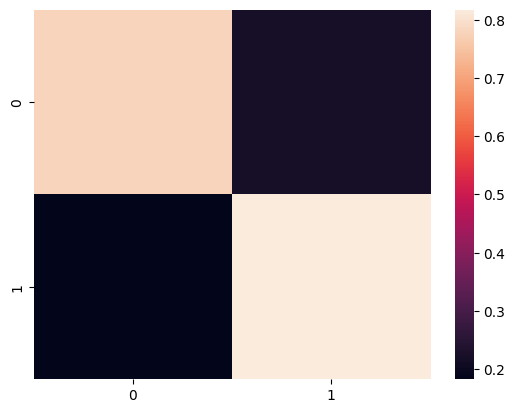

In [ ]:
run_dec_with_two_moons(cuda=True, batch_size=128, pretrain_epochs=100, finetune_epochs=200, testing_mode=False)

In [ ]:
%cd pt-dec

# **Evaluation**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression

def plot_ari_relationship(input_file='results/best_result.xlsx', metric='cvnn'):
    """
    Read the summary results from all clustering algorithms, group by dataset,
    and plot the relationship between ARI and specified metric for each dataset with regression line.

    Parameters:
    -----------
    input_file : str
        Path to the Excel file containing the clustering results summary.
    """
    # Step 1: Load the all summary results from the Excel file
    try:
        summary_df = pd.read_excel(input_file)  # Reads the first sheet by default
    except Exception as e:
        print(f"Error reading the Excel file: {e}")
        return

    # Step 2: Group by dataset and plot ARI vs CVNN for each dataset
    datasets = summary_df['dataset'].unique()

    for dataset in datasets:
        dataset_df = summary_df[summary_df['dataset'] == dataset]

        # Extract ARI and CVNN values
        ari_values = dataset_df['ari'].values.reshape(-1, 1)
        cvnn_values = dataset_df[metric].values

        # Step 3: Fit a linear regression model
        reg = LinearRegression()
        reg.fit(ari_values, cvnn_values)
        predicted_cvnn = reg.predict(ari_values)

        # Step 4: Plot scatter plot and regression line
        plt.figure(figsize=(6, 4))
        plt.scatter(ari_values, cvnn_values, color='b', label="Data Points")
        plt.plot(ari_values, predicted_cvnn, color='r', linestyle='--', label="Regression Line")
        plt.axhline(0, color='gray', linewidth=0.5, linestyle='--')  # Horizontal line at ARI = 0
        plt.axvline(0, color='gray', linewidth=0.5, linestyle='--')  # Vertical line at CVNN = 0
        plt.title(f"ARI vs {metric} for {dataset}")
        plt.ylabel("CVNN")
        plt.xlabel("ARI")
        plt.grid(True)
        plt.legend()

        # Set axis limits to start from (0, 0) if applicable
        plt.xlim(left=0)
        plt.ylim(bottom=0)

        # Show the plot
        plt.show()

        # Optionally, save the plot
        # plot_filename = f"{dataset}_ARI_vs_CVNN_regression.png"
        # plt.savefig(plot_filename)
        # plt.close()
        # print(f"Saved plot for {dataset} as {plot_filename}")

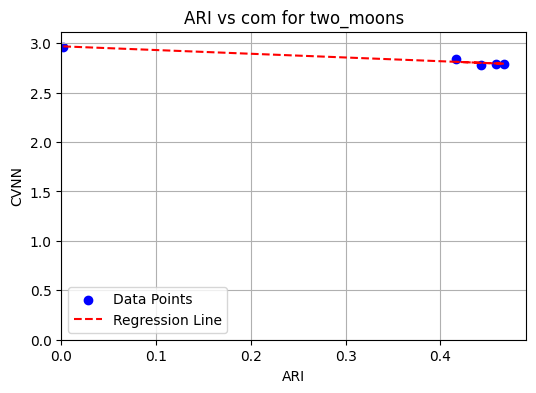

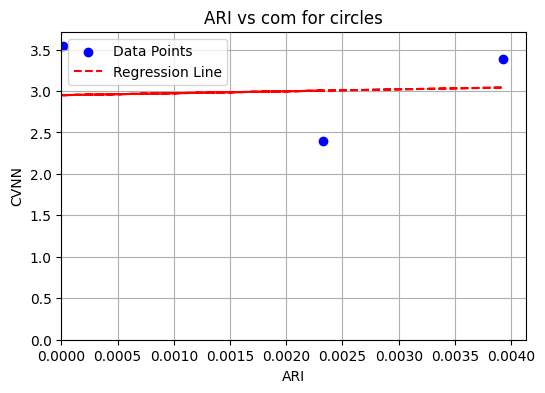

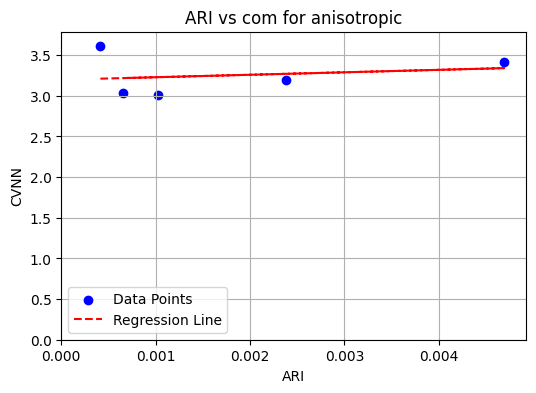

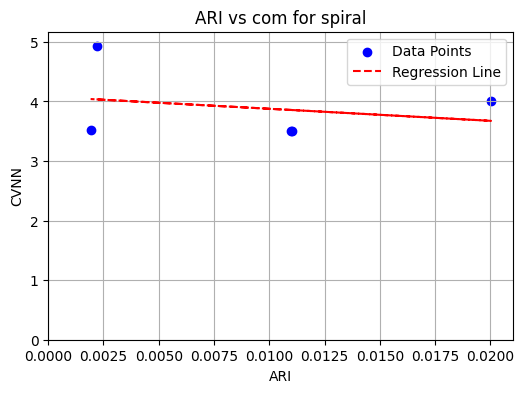

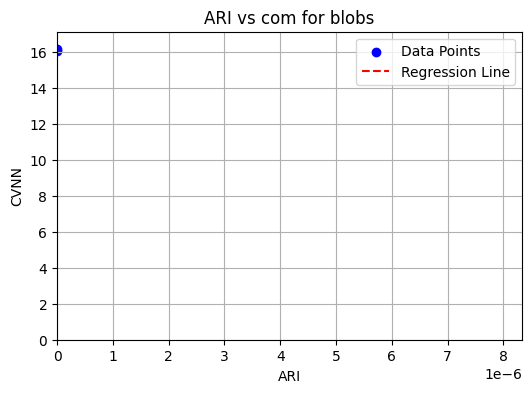

In [ ]:
plot_ari_relationship(metric='com')

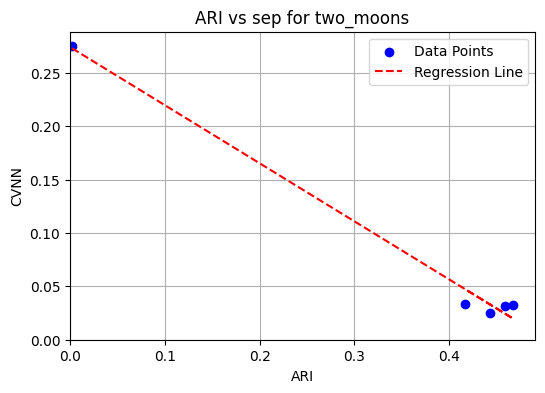

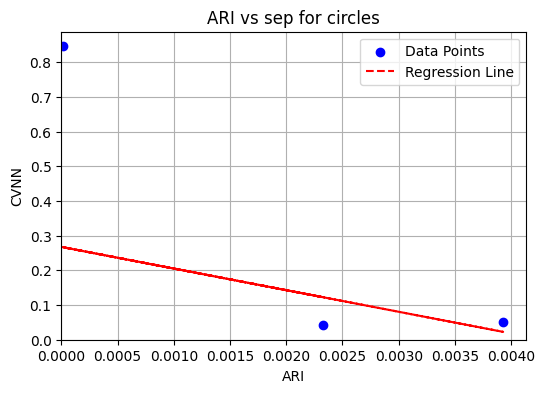

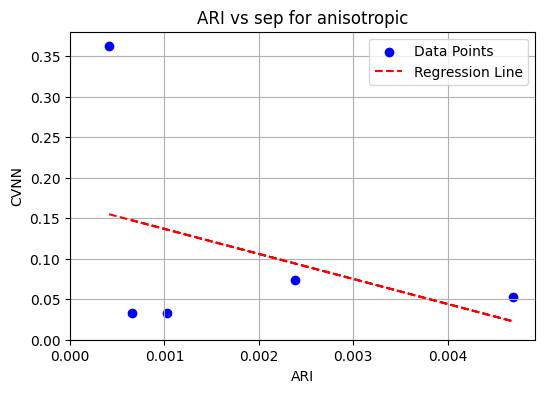

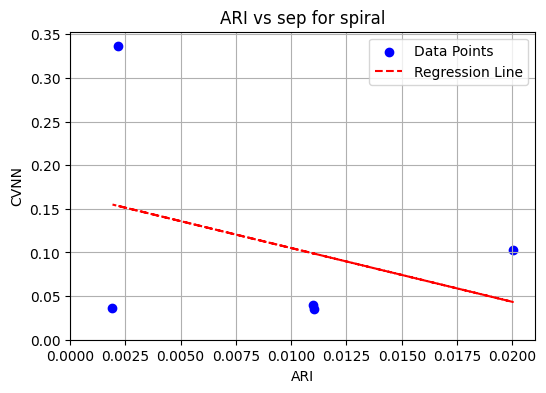

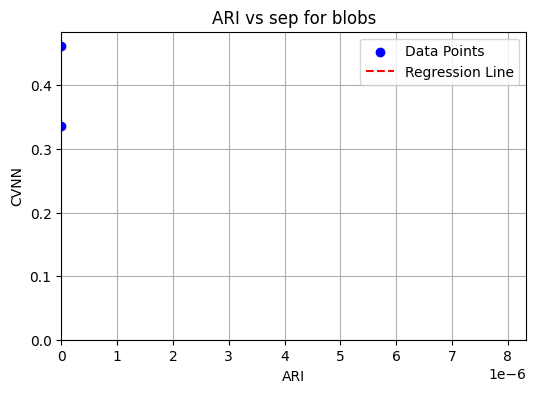

In [ ]:
plot_ari_relationship(metric='sep')

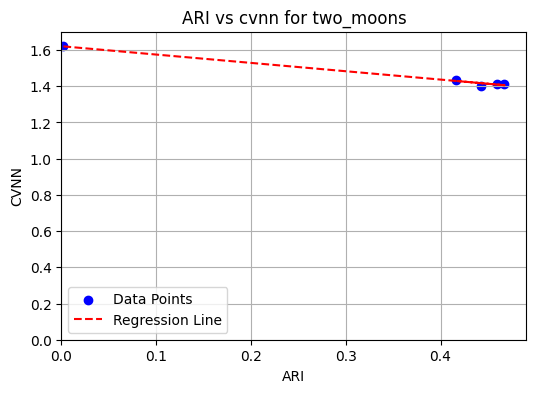

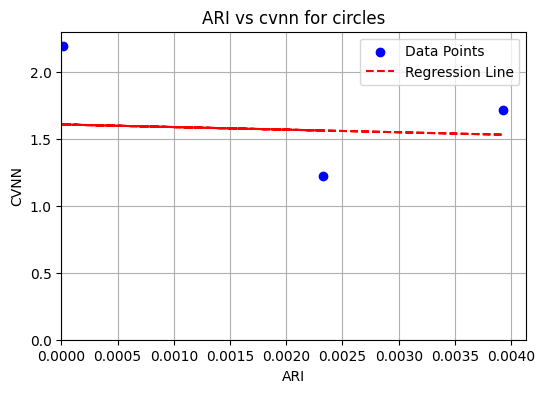

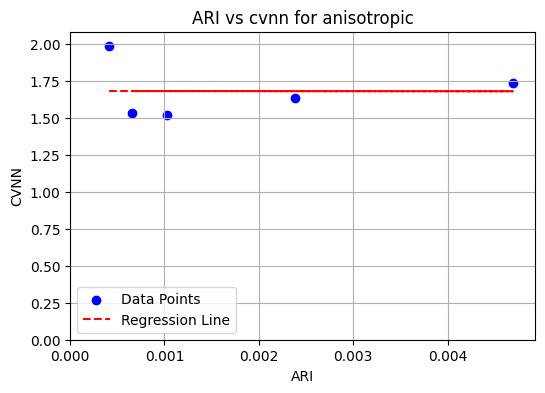

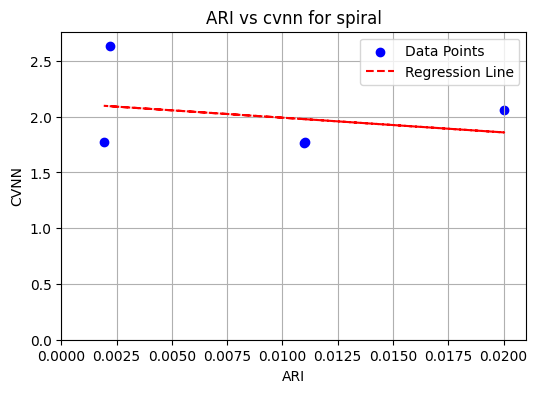

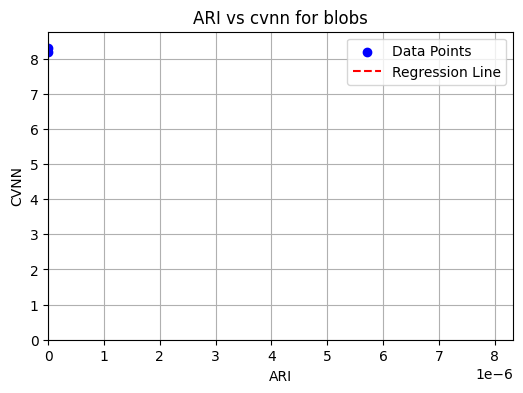

In [ ]:
plot_ari_relationship(metric='cvnn')

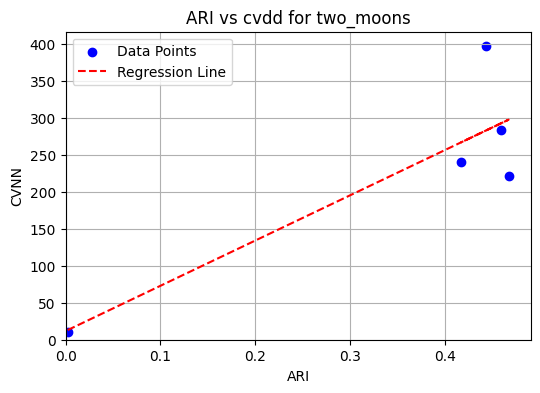

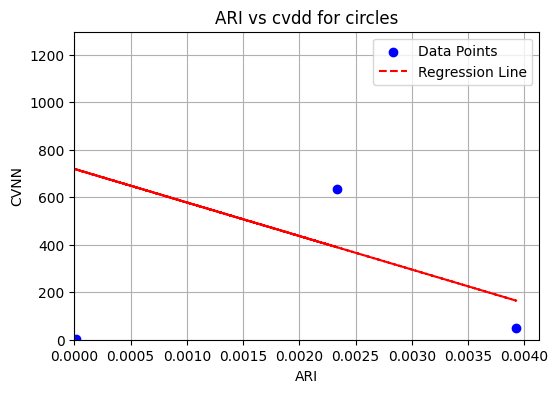

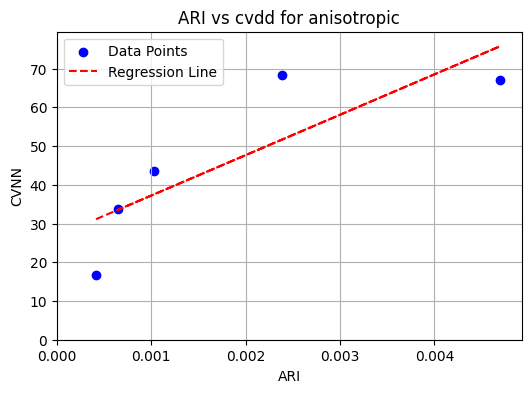

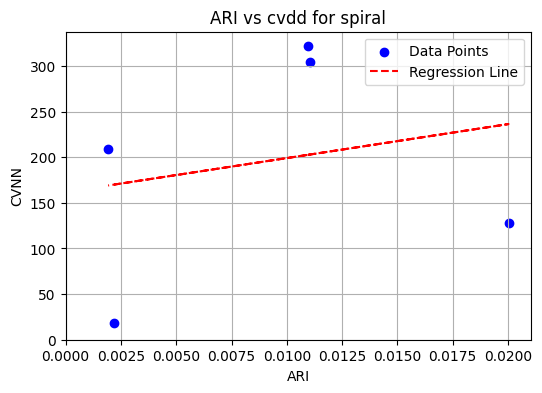

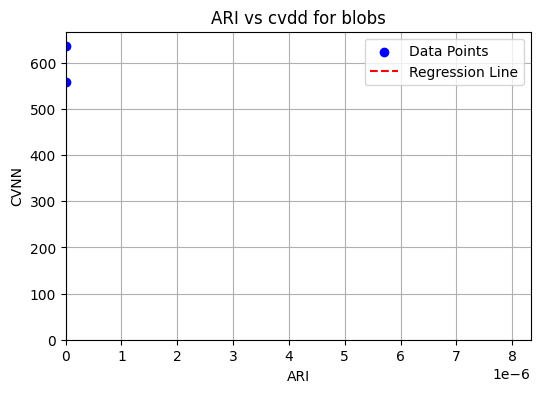

In [ ]:
plot_ari_relationship(metric='cvdd')

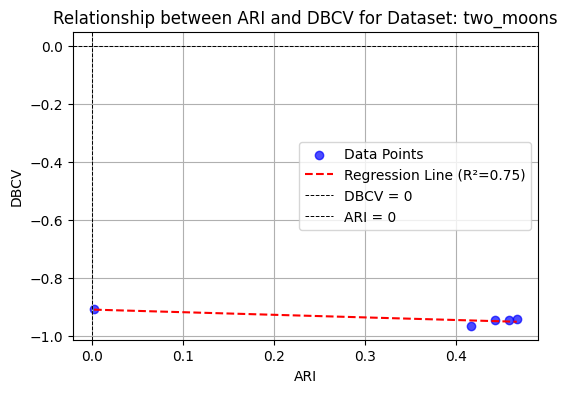

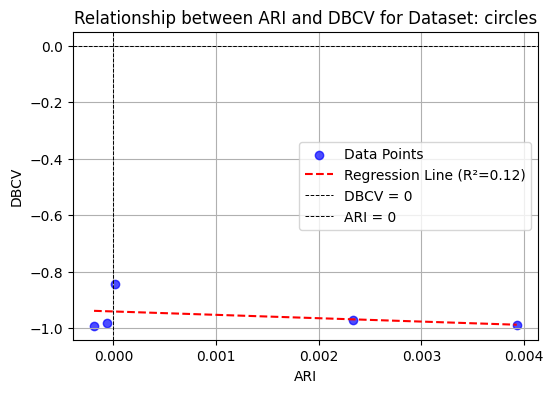

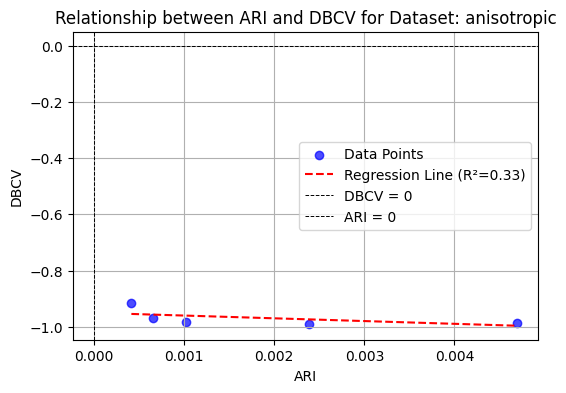

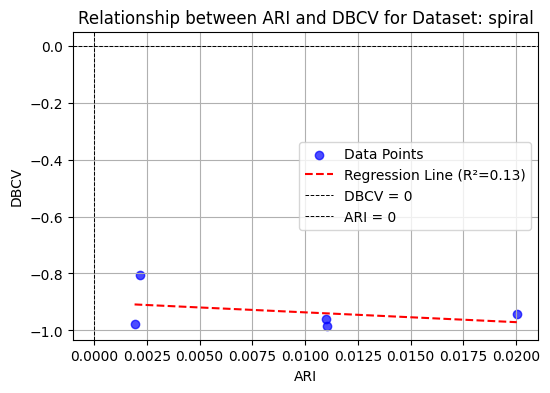

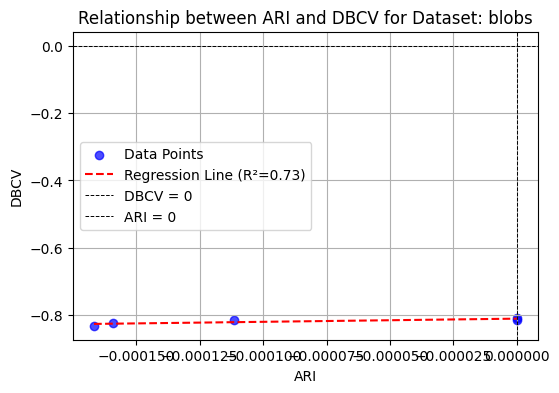

In [ ]:
plot_dbcv_ari()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

def plot_dbcv_ari(input_file='results/best_result.xlsx'):
    """
    Vẽ mối quan hệ giữa DBCV và ARI (sắp xếp ARI tăng dần) cho từng dataset.

    Parameters:
    -----------
    input_file : str
        Đường dẫn đến file Excel chứa dữ liệu clustering kết quả.
    """
    # Load dữ liệu từ file
    try:
        summary_df = pd.read_excel(input_file)  # Đọc sheet đầu tiên
    except Exception as e:
        print(f"Error reading the Excel file: {e}")
        return

    # Kiểm tra sự tồn tại của cột 'dbcv', 'ari', và 'dataset'
    if not {'dbcv', 'ari', 'dataset'}.issubset(summary_df.columns):
        print("Input file must contain 'dbcv', 'ari', and 'dataset' columns.")
        return

    # Lấy danh sách các dataset duy nhất
    datasets = summary_df['dataset'].unique()

    for dataset in datasets:
        # Lọc dữ liệu theo dataset hiện tại
        dataset_df = summary_df[summary_df['dataset'] == dataset]

        # Sắp xếp theo ARI tăng dần
        dataset_df = dataset_df.sort_values(by='ari', ascending=True)

        # Lấy giá trị ARI (x-axis) và DBCV (y-axis)
        ari_values = dataset_df['ari'].values
        dbcv_values = dataset_df['dbcv'].values

        # Áp dụng hồi quy tuyến tính
        X = ari_values.reshape(-1, 1)  # Định dạng lại để phù hợp với sklearn
        y = dbcv_values
        reg = LinearRegression().fit(X, y)
        y_pred = reg.predict(X)
        r2 = r2_score(y, y_pred)

        # Vẽ scatter plot
        plt.figure(figsize=(6, 4))
        plt.scatter(ari_values, dbcv_values, color='blue', label='Data Points', alpha=0.7)
        plt.plot(ari_values, y_pred, color='red', linestyle='--', label=f"Regression Line (R²={r2:.2f})")
        plt.axhline(0, color='black', linestyle='--', linewidth=0.7, label='DBCV = 0')
        plt.axvline(0, color='black', linestyle='--', linewidth=0.7, label='ARI = 0')

        # Giao diện đồ thị
        plt.title(f"Relationship between ARI and DBCV for Dataset: {dataset}")
        plt.xlabel("ARI")
        plt.ylabel("DBCV")
        plt.grid(True)
        plt.legend()

        # Hiển thị hoặc lưu đồ thị
        plt.show()

        # Lưu đồ thị (nếu cần)
        # plot_filename = f"{dataset}_ARI_vs_DBCV.png"
        # plt.savefig(plot_filename)
        # plt.close()
        # print(f"Saved plot for {dataset} as {plot_filename}")

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from sklearn.metrics import adjusted_rand_score
from scipy.spatial import distance_matrix
import os


def load_cluster_results(output_dir, n_runs):
    """
    Load the clustering results from CSV files and return a list of cluster labels.
    """
    cluster_results = []
    for run_idx in range(n_runs):
        result_file = os.path.join(output_dir, f"run_{run_idx + 1}.csv")
        if os.path.exists(result_file):
            cluster_labels = pd.read_csv(result_file)["Cluster_Label"].values
            cluster_results.append(cluster_labels)
    return cluster_results


def calculate_ari_between_runs(cluster_results):
    """
    Calculate ARI scores between all pairs of runs.
    """
    n_runs = len(cluster_results)
    stability_scores = []
    for i in range(n_runs):
        for j in range(i + 1, n_runs):
            ari = adjusted_rand_score(cluster_results[i], cluster_results[j])
            stability_scores.append(ari)
    return stability_scores


def plot_vat_matrix(ari_scores, n_runs, dataset):
    """
    Visualize the ARI scores between each pair of runs using a VAT plot.
    """
    # Create a matrix of ARI scores
    ari_matrix = np.zeros((n_runs, n_runs))
    idx = 0
    for i in range(n_runs):
        for j in range(i + 1, n_runs):
            ari_matrix[i, j] = ari_scores[idx]
            ari_matrix[j, i] = ari_scores[idx]  # Symmetric matrix
            idx += 1

    np.fill_diagonal(ari_matrix, 1)

    # Normalize the ARI matrix for visualization
    ari_matrix = (ari_matrix - ari_matrix.min()) / (ari_matrix.max() - ari_matrix.min())

    # Plot the VAT matrix
    plt.imshow(ari_matrix, cmap="Greys", interpolation='nearest')
    plt.colorbar()
    plt.title(f"ARI Matrix on {dataset}")
    plt.xlabel("Run Number")
    plt.ylabel("Run Number")
    plt.show()


def stability_analysis_from_files(output_dir, n_runs=10, dataset=''):
    """
    Perform stability analysis using ARI scores from pre-saved clustering results.
    """
    # Load the clustering results
    cluster_results = load_cluster_results(output_dir, n_runs)

    # Calculate ARI scores between each pair of runs
    stability_scores = calculate_ari_between_runs(cluster_results)

    # Print the stability scores
    print(stability_scores)
    print(f"Stability scores average: {np.mean(stability_scores)}")
    print(f"Stability scores std deviation: {np.std(stability_scores)}")

    # Visualize ARI scores using VAT
    plot_vat_matrix(stability_scores, n_runs, dataset)

    # Check if the clustering is stable
    is_stable = all(score == 1 for score in stability_scores)
    print(f"Is the DEC model stable? {'Yes' if is_stable else 'No'}")

[0.21634311754485006, 0.28873339714344787, 0.012934304120848197, 0.3474467644406683, 0.06459872671067055, 0.40390023534007263, 0.4376819538117904, 0.15438978447992782, 0.18580466000170634, 0.035938196476720294, -0.0009703962494578457, 0.4403114244635309, 0.22383377702482787, 0.12446139228642543, 0.13753927096628055, 0.014360356799368458, 0.00997995475440489, 0.3219478704597845, 0.024625710959844473, 0.03363168965367776, 0.7019457674719671, 0.6720719032004433, 0.7324686724525913, 0.7636412304471917, 0.04065360568440482, 0.25528675825767155, 0.2315568694533953, 0.20714430899257413, 0.5064493759077467, 0.4376708746417736, 0.42714177484222104, 0.09029490465293306, 0.10669120613829926, 0.00029544221689269324, 0.0019103909456834372, 0.0006018839947309395, -0.0006755715469235549, 0.09519371568065102, 0.0843351316071712, 0.9486246086869441, 0.5324326471946166, 0.5530909010842453, 0.5007649619694104, 0.520806475692371, 0.7566554003326561]
Stability scores average: 0.28098989847091227
Stability 

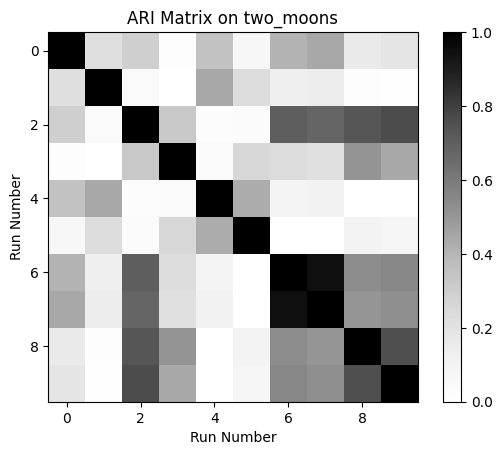

Is the DEC model stable? No
[0.0012131281916680729, 0.19520297776812987, 0.028027031661421006, 0.18473690541520732, 0.0168073468313791, 0.7659282310761184, 0.40234342878251844, 0.12232437517971223, 0.023643330123570973, 0.2673460532005494, 0.5896800834295894, 0.27484820467784327, 0.6684000869795284, 0.006075167597691427, 0.09563683888946789, 0.45740528434253713, 0.6934809795334931, 0.15005234599696107, 0.8956520631470314, 0.4737888433160999, 0.315707222022622, 0.6252884249646563, 0.03728791816488717, 0.1601488776533067, 0.1556906950457298, 0.4831838709470641, 0.002344613705726804, 0.03238363915589827, 0.6290855304516934, 0.8715660928623051, 0.4882187794904009, 0.30766462668144673, 0.6164614733197381, 0.040128337332448354, 0.1659687849446812, 0.06412603595102676, 0.23564858272768935, 0.24785268275006397, 0.5011597558207388, 0.5763003277014417, 0.05721974928111979, 0.0012151734935206841, -8.448129430115738e-06, 0.03725586834807903, 0.6227592442678606]
Stability scores average: 0.30193890

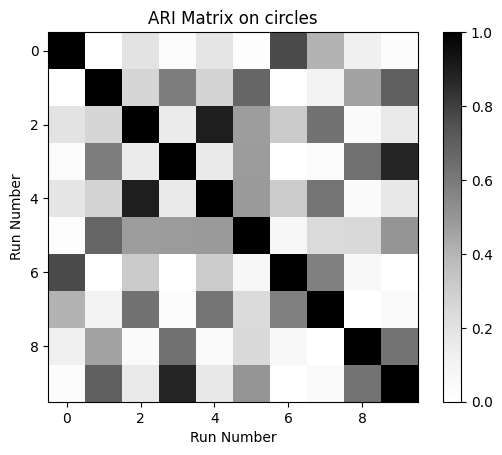

Is the DEC model stable? No
[0.6484633996665504, 0.7205490041131875, 0.7490144957131722, 0.8709564482861211, 0.4591707236622803, 0.5529892090958537, 0.5676928433087931, 0.6752601909901307, 0.8828052764328597, 0.8380885237814121, 0.8743749238995011, 0.6411418557705317, 0.7001382567885998, 0.6627627565771185, 0.729789591275722, 0.41023536643991854, 0.7085731266261291, 0.8852922977403629, 0.6928309114559995, 0.6291164314494906, 0.7490925944194865, 0.6744031936565663, 0.45582687273866274, 0.7900609965361775, 0.714409826825015, 0.6294496161952681, 0.688382099501337, 0.6771558992822369, 0.4826695414831378, 0.8079577908179204, 0.48801514502508436, 0.5377915208682184, 0.6111139391349552, 0.6769882233808867, 0.7882960868605319, 0.5982650072379878, 0.7266160077478644, 0.2903936762108063, 0.4985765348567466, 0.5217708589820003, 0.34316565386171427, 0.601983736469015, 0.4173965101231514, 0.5891312267644951, 0.6110520229871095]
Stability scores average: 0.641538004778669
Stability scores std deviat

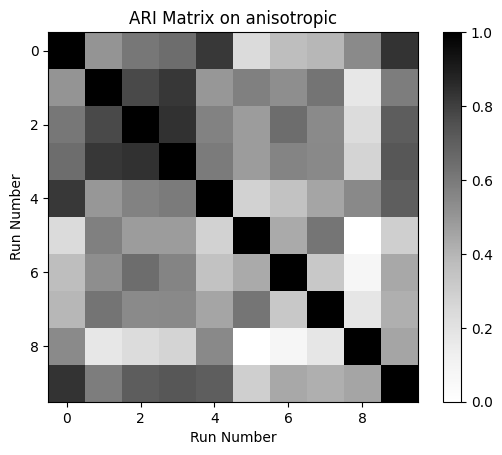

Is the DEC model stable? No
[0.2745846634689809, 0.17928456483442995, 0.315044396743746, 0.34339219847415287, 0.12742499814248057, 0.25486715988032466, 0.29124362142538057, 0.16214163729731598, 0.3200977185908355, 0.22581864486081954, 0.23503315096885508, 0.21848703001897193, 0.20776215511633397, 0.13410842665748463, 0.2297994603708539, 0.09304369542690846, 0.18600115515415788, 0.5393304393748899, 0.2588364290311691, 0.1649489856125286, 0.09857739328622814, 0.20402766336102715, 0.15495126868687017, 0.23190079135157995, 0.21453028524788834, 0.22815445028149012, 0.14265721506306522, 0.29328811046307807, 0.20316384657355024, 0.3145837186501501, 0.16061887303958294, 0.10500068171327573, 0.24785911661578297, 0.18068664228336567, 0.2277312597737656, 0.16998685511219633, 0.3543776044359764, 0.2696039139413987, 0.22237201635878984, 0.331064233868804, 0.2717752123149545, 0.39316860520046987, 0.2144172758216138, 0.6546133492798517, 0.18044791053543882]
Stability scores average: 0.240684640549129

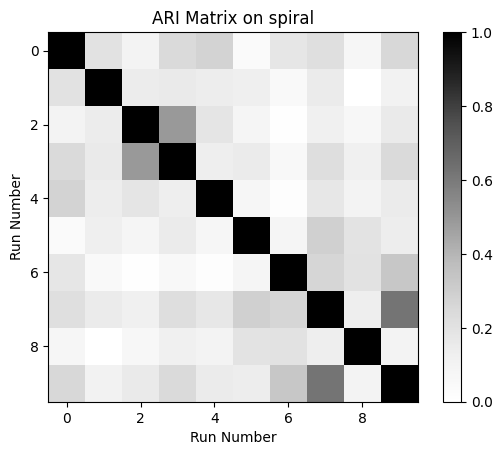

Is the DEC model stable? No
[0.0415175509919846, 0.050363468532222386, 0.053653704727639, 0.07784792357772795, 0.06367721452146506, 0.08412598312581211, 0.03831276102541946, 0.03628493740480344, 0.04118251392571337, 0.07002267166055329, 0.09658310230848552, 0.050393378606694926, 0.07003186113288228, 0.05090368190090173, 0.04178203025537751, 0.058314951382532405, 0.0723578372569667, 0.09685557840457068, 0.09147539812147161, 0.03968309900518618, 0.02789988904837757, 0.03624542152868526, 0.0601101217784376, 0.06051872072353712, 0.055662199263802684, 0.04952441596139554, 0.01700511550109589, 0.13173764075779132, 0.06163960886615513, 0.06567093091665727, 0.07446178901537043, 0.14186764388370862, 0.06797737463710994, 0.04202948382191608, 0.14909959144362858, 0.09393729258002098, 0.03487522491780376, 0.07882749129709703, 0.03056805037879627, 0.046588524624443906, 0.07723429588357061, 0.06998422833837982, 0.07541997960028059, 0.09737975746166731, 0.04765798670643948]
Stability scores average: 

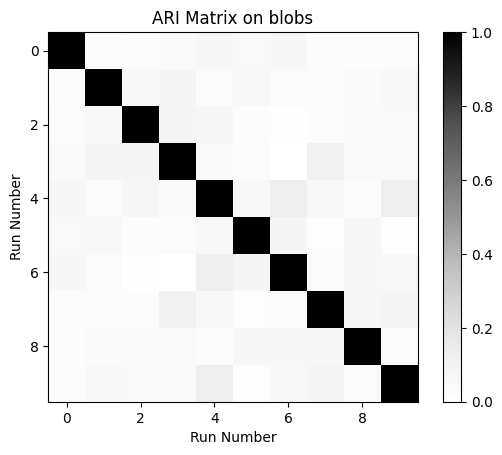

Is the DEC model stable? No


In [ ]:
datasets = ['two_moons','circles','anisotropic','spiral','blobs']

for dataset in datasets:
  output_dir = f"results/dec/{dataset}/stability_results"
  n_runs = 10
  stability_analysis_from_files(output_dir, n_runs, dataset)

In [ ]:
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.metrics import adjusted_rand_score


def evaluate_stability_multiple_datasets(algo, datasets_dirs, n_runs=10, output_dir="results"):
    """
    Evaluate DEC stability for multiple datasets and visualize the ARI scores in a combined box plot.

    Parameters:
    -----------
    datasets_dirs : dict
        Dictionary where keys are dataset names and values are directories containing clustering results.
    n_runs : int
        Number of clustering result files for each dataset.
    output_dir : str
        Directory to save the combined box plot.

    Returns:
    --------
    dataset_scores : dict
        Dictionary with dataset names as keys and their corresponding ARI score lists.
    """
    dataset_scores = {}

    # Iterate through each dataset and evaluate stability
    for dataset_name, dataset_dir in datasets_dirs.items():
        cluster_results = []

        # Read clustering result files
        for run_idx in range(1, n_runs + 1):
            file_path = os.path.join(dataset_dir, f"run_{run_idx}.csv")
            if os.path.exists(file_path):
                df = pd.read_csv(file_path)
                cluster_results.append(df["Cluster_Label"].values)
            else:
                print(f"File {file_path} does not exist for {dataset_name}. Skipping this run.")

        # Ensure enough results exist for comparison
        if len(cluster_results) < 2:
            print(f"Not enough runs found for {dataset_name}. Skipping...")
            continue

        # Calculate ARI between all pairs of runs
        stability_scores = []
        for i in range(len(cluster_results)):
            for j in range(i + 1, len(cluster_results)):
                ari = adjusted_rand_score(cluster_results[i], cluster_results[j])
                stability_scores.append(ari)

        dataset_scores[dataset_name] = stability_scores

    # Plot box plots for all datasets
    plt.figure(figsize=(8, 6))
    dataset_labels = []
    all_scores = []
    for dataset_name, scores in dataset_scores.items():
        dataset_labels.append(dataset_name)
        all_scores.append(scores)

    plt.boxplot(all_scores, vert=True, patch_artist=True, labels=dataset_labels,
                boxprops=dict(facecolor='lightblue'))
    plt.title(f"{algo} ARI Stability Scores Across Datasets")
    plt.ylabel("Adjusted Rand Index (ARI)")
    plt.xlabel("Datasets")
    plt.grid(axis='y')
    plt.savefig(os.path.join(output_dir, "combined_ari_stability_boxplot.png"))
    plt.show()

    print(f"Combined box plot saved to {os.path.join(output_dir, 'combined_ari_stability_boxplot.png')}")

    return dataset_scores

File results/dec/circles/stability_results/run_8.csv does not exist for Circles. Skipping this run.
File results/dec/circles/stability_results/run_9.csv does not exist for Circles. Skipping this run.
File results/dec/circles/stability_results/run_10.csv does not exist for Circles. Skipping this run.
File results/dec/anisotropic/stability_results/run_6.csv does not exist for Anisotropic. Skipping this run.
File results/dec/anisotropic/stability_results/run_7.csv does not exist for Anisotropic. Skipping this run.
File results/dec/anisotropic/stability_results/run_8.csv does not exist for Anisotropic. Skipping this run.
File results/dec/anisotropic/stability_results/run_9.csv does not exist for Anisotropic. Skipping this run.
File results/dec/anisotropic/stability_results/run_10.csv does not exist for Anisotropic. Skipping this run.
File results/dec/spiral/stability_results/run_6.csv does not exist for Spiral. Skipping this run.
File results/dec/spiral/stability_results/run_7.csv does not

<ipython-input-53-93424098e5c2>:62: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(all_scores, vert=True, patch_artist=True, labels=dataset_labels,


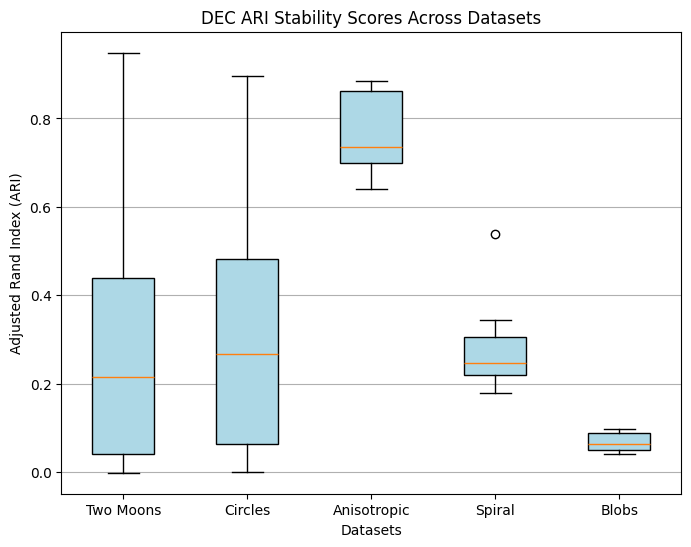

Combined box plot saved to results/combined_ari_stability_boxplot.png


In [ ]:
# Define dataset directories
datasets_dirs = {
    "Two Moons": "results/dec/two_moons/stability_results",
    "Circles": "results/dec/circles/stability_results",
    "Anisotropic": "results/dec/anisotropic/stability_results",
    "Spiral": "results/dec/spiral/stability_results",
    "Blobs": "results/dec/blobs/stability_results",
}

# Evaluate stability and plot results
stability_scores = evaluate_stability_multiple_datasets("DEC",datasets_dirs)

<ipython-input-53-93424098e5c2>:62: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(all_scores, vert=True, patch_artist=True, labels=dataset_labels,


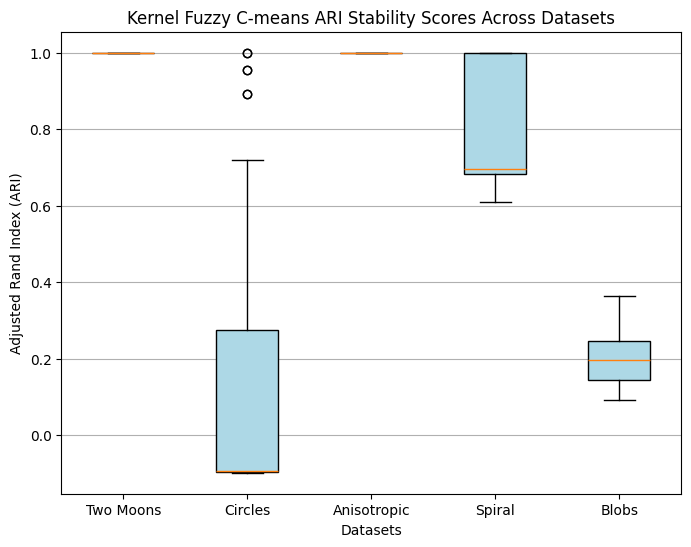

Combined box plot saved to results/combined_ari_stability_boxplot.png


In [ ]:
# Define dataset directories
datasets_dirs = {
    "Two Moons": "results/kfcm/two_moons/stability_results",
    "Circles": "results/kfcm/circles/stability_results",
    "Anisotropic": "results/kfcm/anisotropic/stability_results",
    "Spiral": "results/kfcm/spiral/stability_results",
    "Blobs": "results/kfcm/blobs/stability_results",
}

# Evaluate stability and plot results
stability_scores = evaluate_stability_multiple_datasets("Kernel Fuzzy C-means", datasets_dirs)